# Architectural Picture Classification

This project is aimed to analyze a picture of a building in terms of the style of buildings and the composition of the photo.
Though photos and renderings of buildings may have infinite possibilities, many of they can be classified into a limited number of popular types according to the composition, style of buildings, etc.  

I roughly classified exterior pictures of (mid-rise to high rise) buildings into a few categories according to the scene, point of view, including street view, far away view, mid-air view, top view and look up view. There are usually other objects like people, cars, boats and animals in the picture, which I will also identify.

The judgement of a style of architecture is kind of subjective without very concrete standards now, and a person need to learn a lot about architectural history and current famous architects to tell the possible style of a building. I want to design an algorithm to identify the possible style of building in a photo or rendering. For this project, I just focus on about 10 common architectural styles.


### Table of Contents
* Step 1: Import and preprocess the two datasets
* Step 2: Use SVM to classify scenes
* Step 3: Write an algorithm with YOLO system to find the objects in the picture
* Step 4: Create a CNN from scratch to classify architectural styles
* Step 5: Use transfer learning to create a CNN to classify architectural styles
* Step 6: Write an algorithm to analyze a picture of a building
* Step 7: Test the algorithm

## Step 1: Import and preprocess the two datasets

### Import datasets

In [1]:
import tensorflow as tf


C:\Python36\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
from PIL import Image, ImageFile
from sklearn.datasets import load_files
import numpy as np
from glob import glob
#from keras.utils import np_utils

In [3]:
from keras.utils import np_utils

Using TensorFlow backend.


In [4]:
def load_dataset(path):
    data=load_files(path)
    files=np.array(data['filenames'])
    targets=np_utils.to_categorical(np.array(data['target']), 12)
    return files, targets

In [5]:
scene_files, scene_targets=load_dataset('arc_scene')
style_files, style_targets=load_dataset('arc_style')
scene_names=[item for item in sorted(glob("arc_scene/*/"))]
style_names=[item for item in sorted(glob("arc_style/*/"))]

print('There are %d total scene categories.' % len(scene_names))
print('There are %d total scene files.' % len(scene_files))
print('There are %d total style categories.' % len(style_names))
print('There are %d total style files.' % len(style_files))

There are 6 total scene categories.
There are 1007 total scene files.
There are 12 total style categories.
There are 1997 total style files.


In [6]:
# Split data into train data, validation data and test data.
from sklearn.cross_validation import train_test_split

scene_train_files, scene_test_files, scene_train_targets, scene_test_targets \
=train_test_split(scene_files, scene_targets, test_size=0.2, random_state=1)

style_tv_files, style_test_files, style_tv_targets, style_test_targets \
=train_test_split(style_files, style_targets, test_size=0.2, random_state=1)
style_train_files, style_val_files, style_train_targets, style_val_targets= \
train_test_split(style_tv_files, style_tv_targets, test_size=0.15, random_state=1)

print('There are %d test scene files.' % len(scene_test_files))
print('There are %d test style files.' % len(style_test_files))
print('There are %d train style files.' % len(style_train_files))

There are 202 test scene files.
There are 400 test style files.
There are 1357 train style files.


C:\Python36\lib\site-packages\sklearn\cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


### Preprocess data

Turn image paths into 4D tensor.

In [7]:
from keras.preprocessing import image
from tqdm import tqdm

def path_to_tensor(img_path):
    img=image.load_img(img_path, target_size=(300, 300))
    x=image.img_to_array(img)
    return np.expand_dims(x, axis=0)
def paths_to_tensor(img_paths):
    list_of_tensors=[path_to_tensor(img_path) for img_path in tqdm(img_paths)]
    return np.vstack(list_of_tensors)

In [8]:
ImageFile.LOAD_TRUNCATED_IMAGES=True

style_train_tensors = paths_to_tensor(style_train_files).astype('float32')/255
style_val_tensors=paths_to_tensor(style_val_files).astype('float32')/255
style_test_tensors=paths_to_tensor(style_test_files).astype('float32')/255

 28%|███████████                            | 385/1357 [00:08<00:20, 47.10it/s]C:\Python36\lib\site-packages\PIL\TiffImagePlugin.py:742: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))
 76%|█████████████████████████████         | 1037/1357 [00:20<00:06, 51.70it/s]C:\Python36\lib\site-packages\PIL\Image.py:916: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
 35%|██████████████▎                          | 84/240 [00:01<00:02, 55.81it/s]C:\Python36\lib\site-packages\PIL\TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to read 8 bytes but only got 2. Skipping tag 41487
  " Skipping tag %s" % (size, len(data), tag))
C:\Python36\lib\site-packages\PIL\TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to read 8 bytes but only got 0. Skipping tag 41988
  " Skipping tag %s" % (size, len(data), tag))
100%|████████████

In [15]:

def path_to_tensor2(img_path):
    img=image.load_img(img_path, target_size=(200,200))
    #img=img.resize((300, max(300, int(300*img.size[0]/img.size[1]))))
    x=image.img_to_array(img)
    x=x.reshape((120000))
    return np.expand_dims(x, axis=0)
def paths_to_tensor2(img_paths):
    list_of_tensors=[path_to_tensor2(img_path) for img_path in tqdm(img_paths)]
    return np.vstack(list_of_tensors)

In [16]:
scene_train_tensors = paths_to_tensor2(scene_train_files).astype('float32')/255
scene_test_tensors=paths_to_tensor2(scene_test_files).astype('float32')/255
print(scene_train_tensors.shape)

100%|████████████████████████████████████████| 202/202 [00:02<00:00, 68.19it/s]


(805, 120000)


### Visualization of data
Distribution of building styles in `arc_style` data set.

In [11]:
set1=load_files('arc_style')
target1=set1['target']
count1=[0]*12
for i in target1:
    count1[i]+=1
print(count1)

[213, 151, 156, 192, 121, 214, 112, 151, 164, 259, 134, 130]


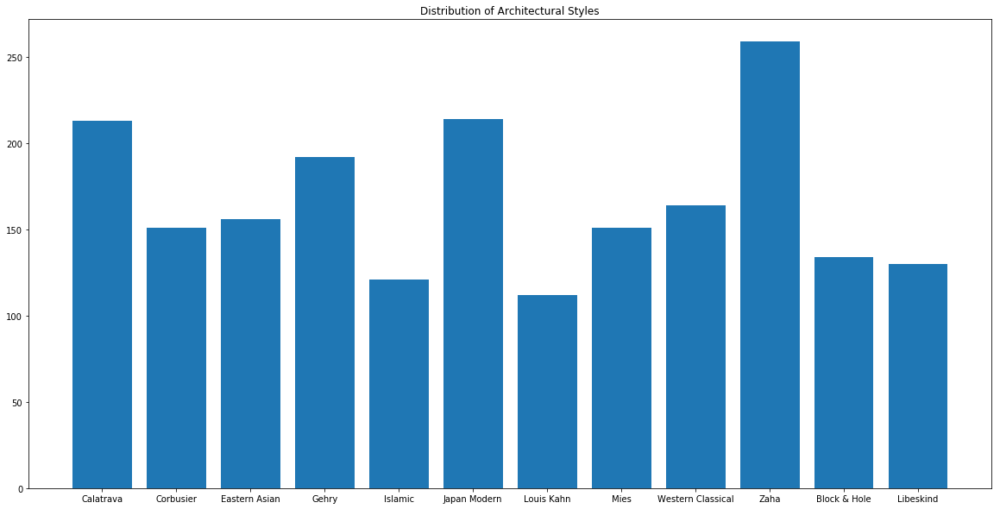

In [17]:
import matplotlib.pyplot as plt
plt.figure(figsize=(20,10))
plt.bar([i[13:-1] for i in style_names], count1)
plt.title('Distribution of Architectural Styles')
plt.show()

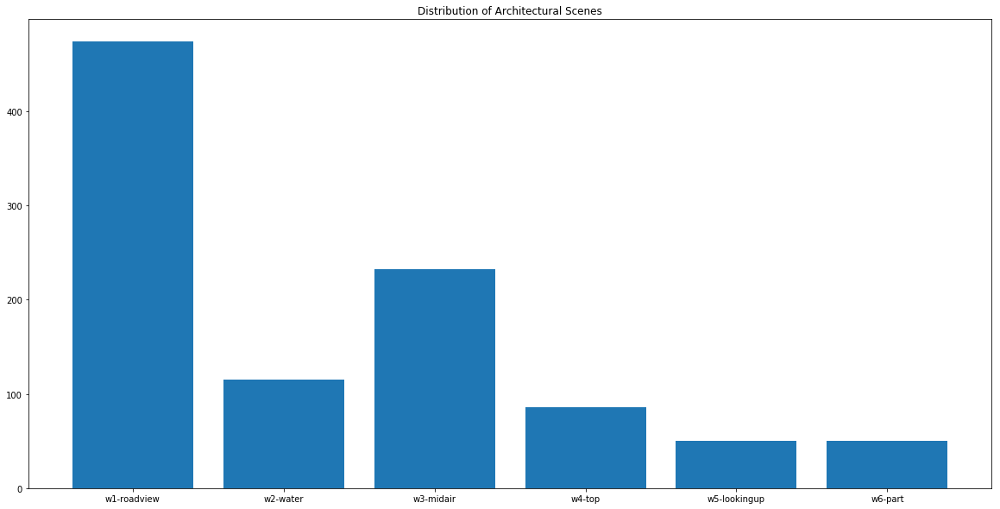

In [20]:
set2=load_files('arc_scene')
target2=set2['target']
count2=[0]*6
for i in target2:
    count2[i]+=1

import matplotlib.pyplot as plt
plt.figure(figsize=(20,10))
plt.bar([i[13:-1] for i in scene_names], count2)
plt.title('Distribution of Architectural Scenes')
plt.show()

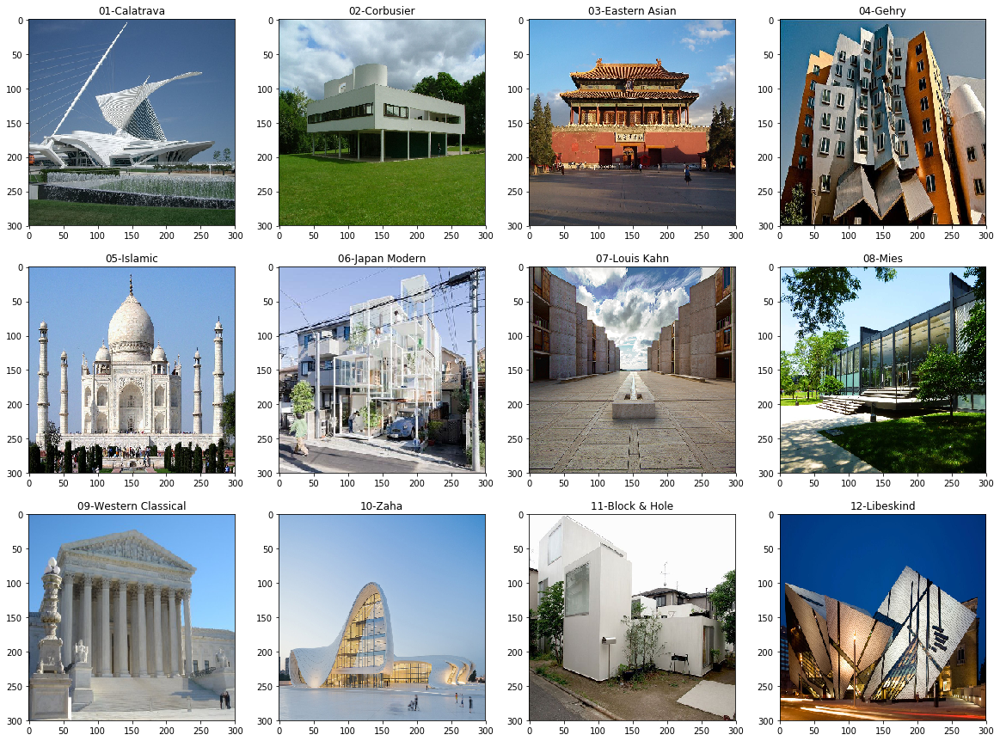

In [59]:
# Display all the styles.
import matplotlib.pyplot as plt
intro_files=np.array(sorted(glob('intro_images/*')))
intro_files.sort()
fig=plt.figure(figsize=(20,15))
for i in range(12):
    ax=fig.add_subplot(3,4, i+1)
    ax.imshow(image.load_img(intro_files[i], target_size=(300,300)))
    ax.set_title(style_names[i][10:-1])
plt.show()

### Augment data

In [ ]:
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array

datagen_train=ImageDataGenerator(
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True)

datagen_train.fit(style_train_tensors)

## Step 2: Use SVM to classify scenes



In [17]:
from sklearn.svm import SVC
from sklearn.grid_search import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.decomposition import RandomizedPCA

C:\Python36\lib\site-packages\sklearn\grid_search.py:42: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. This module will be removed in 0.20.
  DeprecationWarning)


In [25]:
pca=RandomizedPCA(n_components=300, whiten=True).fit(scene_train_tensors)
x_train_pca=pca.transform(scene_train_tensors)
x_test_pca=pca.transform(scene_test_tensors)


C:\Python36\lib\site-packages\sklearn\utils\deprecation.py:58: DeprecationWarning: Class RandomizedPCA is deprecated; RandomizedPCA was deprecated in 0.18 and will be removed in 0.20. Use PCA(svd_solver='randomized') instead. The new implementation DOES NOT store whiten ``components_``. Apply transform to get them.
  warnings.warn(msg, category=DeprecationWarning)


Text(0.5,1,'Explained Variance of PCA')

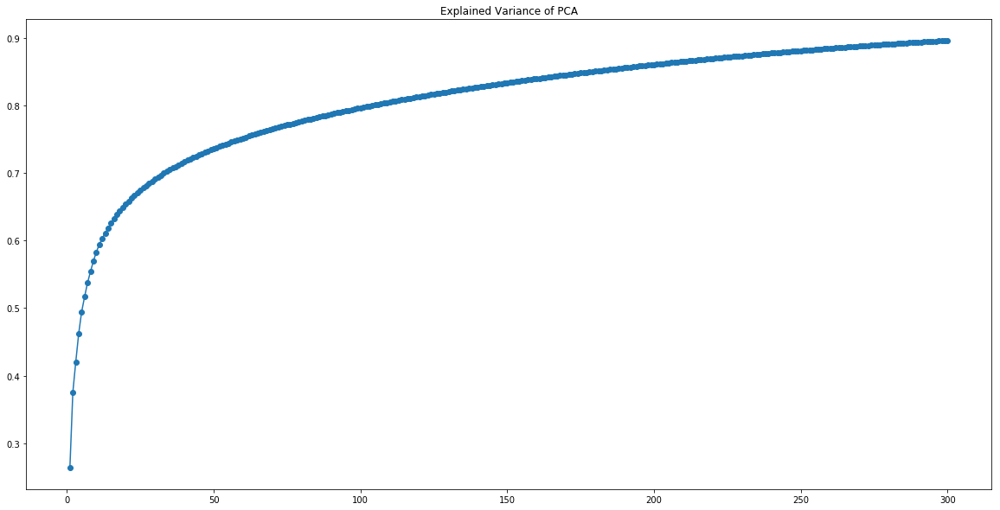

In [29]:
import matplotlib.pyplot as plt
plt.figure(figsize=(20,10))

x = np.arange(1, 301)
plt.plot(x, np.cumsum(pca.explained_variance_ratio_), '-o')
plt.title('Explained Variance of PCA')

In [30]:
pca=RandomizedPCA(n_components=40, whiten=True).fit(scene_train_tensors)
x_train_pca=pca.transform(scene_train_tensors)
x_test_pca=pca.transform(scene_test_tensors)

C:\Python36\lib\site-packages\sklearn\utils\deprecation.py:58: DeprecationWarning: Class RandomizedPCA is deprecated; RandomizedPCA was deprecated in 0.18 and will be removed in 0.20. Use PCA(svd_solver='randomized') instead. The new implementation DOES NOT store whiten ``components_``. Apply transform to get them.
  warnings.warn(msg, category=DeprecationWarning)


In [20]:
print(x_train_pca.shape)
print(scene_train_targets.shape)

(805, 40)
(805, 12)


In [21]:
y_train=np.argmax(scene_train_targets, axis=1)
y_test=np.argmax(scene_test_targets, axis=1)
print(y_train.shape)

(805,)


In [22]:
param_grid={
    'C': [1e3, 5e3, 1e4, 5e4, 1e5],            
    'gamma': [0.0001, 0.0005, 0.001, 0.005, 0.01, 0.1] 
}

clf=GridSearchCV(SVC(kernel='rbf', class_weight='balanced'), param_grid)
clf=clf.fit(x_train_pca, y_train)
scene_predictions=clf.predict(x_test_pca)

In [108]:
print(classification_report(y_test, scene_predictions, target_names=scene_names) )
print(confusion_matrix(y_test, scene_predictions, labels=range(len(scene_names))) )

                            precision    recall  f1-score   support

 arc_scene\view1-roadview\       0.82      0.79      0.80       107
    arc_scene\view2-water\       0.48      0.61      0.54        18
   arc_scene\view3-midair\       0.59      0.59      0.59        46
      arc_scene\view4-top\       0.82      0.93      0.87        15
arc_scene\view5-lookingup\       0.75      0.50      0.60        12
     arc_scene\view6-part\       0.20      0.25      0.22         4

               avg / total       0.72      0.71      0.71       202

[[84  7 15  0  0  1]
 [ 3 11  2  0  1  1]
 [11  4 27  2  0  2]
 [ 0  0  0 14  1  0]
 [ 5  1  0  0  6  0]
 [ 0  0  2  1  0  1]]


### Write a view detector

In [116]:
def view_detector(img_path):
    tensor=path_to_tensor2(img_path)
    p=pca.transform(tensor)
    return scene_names[clf.predict(p)[0]][16:-1]

## Step 3: Write an algorithm with YOLO system to find the objects in the picture

YOLOv2 system used for recognizing objects.

@article{redmon2016yolo9000,
  title={YOLO9000: Better, Faster, Stronger},
  author={Redmon, Joseph and Farhadi, Ali},
  journal={arXiv preprint arXiv:1612.08242},
  year={2016}
}

In [109]:
import cv2
from darkflow.net.build import TFNet
import matplotlib.pyplot as plt

In [110]:
options={
    'model': 'cfg/yolo.cfg',
    'load': 'bin/yolov2.weights',
    'threshold': 0.3,
    'gpu': 0
}
tfnet=TFNet(options)

Parsing ./cfg/yolov2.cfg
Parsing cfg/yolo.cfg
Loading bin/yolov2.weights ...
Successfully identified 203934260 bytes
Finished in 0.04500246047973633s
Model has a coco model name, loading coco labels.

Building net ...
Source | Train? | Layer description                | Output size
-------+--------+----------------------------------+---------------
       |        | input                            | (?, 608, 608, 3)
 Load  |  Yep!  | conv 3x3p1_1  +bnorm  leaky      | (?, 608, 608, 32)
 Load  |  Yep!  | maxp 2x2p0_2                     | (?, 304, 304, 32)
 Load  |  Yep!  | conv 3x3p1_1  +bnorm  leaky      | (?, 304, 304, 64)
 Load  |  Yep!  | maxp 2x2p0_2                     | (?, 152, 152, 64)
 Load  |  Yep!  | conv 3x3p1_1  +bnorm  leaky      | (?, 152, 152, 128)
 Load  |  Yep!  | conv 1x1p0_1  +bnorm  leaky      | (?, 152, 152, 64)
 Load  |  Yep!  | conv 3x3p1_1  +bnorm  leaky      | (?, 152, 152, 128)
 Load  |  Yep!  | maxp 2x2p0_2                     | (?, 76, 76, 128)
 Load  |  

In [111]:
def rec_object(path):
    img=cv2.imread(path, cv2.IMREAD_COLOR)
    img=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    results= tfnet.return_predict(img)
    for result in results:
        tl=(result['topleft']['x'], result['topleft']['y'])
        br=(result['bottomright']['x'], result['bottomright']['y'])
        label=result['label']
        img=cv2.rectangle(img, tl,br, (0,255,0),4)
        img=cv2.putText(img, label, tl, cv2.FONT_HERSHEY_COMPLEX, 1,(0,0,255),2)
    plt.imshow(img)
    plt.show()    

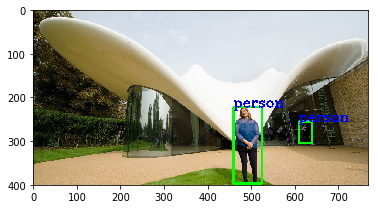

In [104]:
rec_object('test_images/01.jpg')

## Step 4: Create a CNN from scratch to classify architectural styles

In [74]:
from keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D
from keras.layers import Dropout, Flatten, Dense
from keras.models import Sequential

style_model_1=Sequential()

style_model_1.add(Conv2D(filters=32, kernel_size=3, activation='relu', input_shape=(300,300,3)))
style_model_1.add(MaxPooling2D(pool_size=2))
style_model_1.add(Conv2D(filters=128, kernel_size=3, activation='relu'))
style_model_1.add(MaxPooling2D(pool_size=2))
style_model_1.add(Conv2D(filters=512, kernel_size=3, activation='relu'))
style_model_1.add(GlobalAveragePooling2D())
style_model_1.add(Dropout(0.2))
style_model_1.add(Dense(128, activation='relu'))
style_model_1.add(Dropout(0.2))
style_model_1.add(Dense(12, activation='softmax'))
style_model_1.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 298, 298, 32)      896       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 149, 149, 32)      0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 147, 147, 128)     36992     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 73, 73, 128)       0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 71, 71, 512)       590336    
_________________________________________________________________
global_average_pooling2d_1 ( (None, 512)               0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 512)               0         
__________

In [75]:
# Compile the model
style_model_1.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics=['accuracy'])

In [42]:
# Train the model
from keras.callbacks import ModelCheckpoint
batch_size=16
checkpointer=ModelCheckpoint(filepath='saved_models/best_weights_fromscratch.hdf5')
style_model_1.fit_generator( datagen_train.flow(style_train_tensors, style_train_targets,batch_size=16),
                            steps_per_epoch=style_train_tensors.shape[0] // batch_size,
                            validation_steps=style_val_tensors.shape[0] // batch_size,
                 validation_data=(style_val_tensors, style_val_targets),
                 epochs=50, callbacks=[checkpointer], verbose=1)

Epoch 1/50
85/85 [==============================] - ETA: 6:31 - loss: 2.4718 - acc: 0.125 - ETA: 6:16 - loss: 2.4749 - acc: 0.093 - ETA: 6:16 - loss: 2.4687 - acc: 0.083 - ETA: 6:11 - loss: 2.4750 - acc: 0.093 - ETA: 6:03 - loss: 2.4823 - acc: 0.075 - ETA: 5:55 - loss: 2.4728 - acc: 0.114 - ETA: 5:49 - loss: 2.4713 - acc: 0.116 - ETA: 5:44 - loss: 2.4735 - acc: 0.109 - ETA: 5:38 - loss: 2.4737 - acc: 0.118 - ETA: 5:33 - loss: 2.4700 - acc: 0.118 - ETA: 5:28 - loss: 2.4726 - acc: 0.119 - ETA: 5:22 - loss: 2.4740 - acc: 0.119 - ETA: 5:18 - loss: 2.4764 - acc: 0.115 - ETA: 5:12 - loss: 2.4802 - acc: 0.111 - ETA: 5:07 - loss: 2.4810 - acc: 0.104 - ETA: 5:02 - loss: 2.4812 - acc: 0.101 - ETA: 4:58 - loss: 2.4822 - acc: 0.095 - ETA: 4:53 - loss: 2.4823 - acc: 0.093 - ETA: 4:49 - loss: 2.4827 - acc: 0.092 - ETA: 4:44 - loss: 2.4824 - acc: 0.087 - ETA: 4:39 - loss: 2.4815 - acc: 0.089 - ETA: 4:34 - loss: 2.4807 - acc: 0.090 - ETA: 4:30 - loss: 2.4816 - acc: 0.089 - ETA: 4:25 - loss: 2.4836 - a

85/85 [==============================] - ETA: 5:50 - loss: 2.2068 - acc: 0.312 - ETA: 5:56 - loss: 2.2086 - acc: 0.312 - ETA: 5:56 - loss: 2.2720 - acc: 0.229 - ETA: 5:53 - loss: 2.2808 - acc: 0.234 - ETA: 5:52 - loss: 2.2535 - acc: 0.250 - ETA: 5:45 - loss: 2.2173 - acc: 0.260 - ETA: 5:39 - loss: 2.2481 - acc: 0.241 - ETA: 5:32 - loss: 2.2571 - acc: 0.226 - ETA: 5:27 - loss: 2.2533 - acc: 0.243 - ETA: 5:23 - loss: 2.2436 - acc: 0.250 - ETA: 5:17 - loss: 2.2412 - acc: 0.233 - ETA: 5:12 - loss: 2.2407 - acc: 0.229 - ETA: 5:06 - loss: 2.2538 - acc: 0.221 - ETA: 5:02 - loss: 2.2414 - acc: 0.232 - ETA: 4:56 - loss: 2.2334 - acc: 0.237 - ETA: 4:52 - loss: 2.2217 - acc: 0.238 - ETA: 4:48 - loss: 2.2293 - acc: 0.231 - ETA: 4:44 - loss: 2.2192 - acc: 0.236 - ETA: 4:40 - loss: 2.2240 - acc: 0.230 - ETA: 4:35 - loss: 2.2295 - acc: 0.228 - ETA: 4:31 - loss: 2.2249 - acc: 0.229 - ETA: 4:27 - loss: 2.2519 - acc: 0.230 - ETA: 4:23 - loss: 2.2461 - acc: 0.228 - ETA: 4:19 - loss: 2.2403 - acc: 0.234 -

85/85 [==============================] - ETA: 5:45 - loss: 1.9294 - acc: 0.437 - ETA: 5:42 - loss: 2.1816 - acc: 0.343 - ETA: 5:38 - loss: 2.1282 - acc: 0.354 - ETA: 5:35 - loss: 2.1748 - acc: 0.312 - ETA: 5:30 - loss: 2.1862 - acc: 0.287 - ETA: 5:29 - loss: 2.2131 - acc: 0.260 - ETA: 5:25 - loss: 2.2006 - acc: 0.276 - ETA: 5:21 - loss: 2.1915 - acc: 0.273 - ETA: 5:16 - loss: 2.2072 - acc: 0.263 - ETA: 5:12 - loss: 2.1707 - acc: 0.281 - ETA: 5:08 - loss: 2.1597 - acc: 0.272 - ETA: 5:04 - loss: 2.1358 - acc: 0.270 - ETA: 5:00 - loss: 2.1032 - acc: 0.288 - ETA: 4:56 - loss: 2.1059 - acc: 0.285 - ETA: 4:51 - loss: 2.1122 - acc: 0.287 - ETA: 4:47 - loss: 2.1463 - acc: 0.273 - ETA: 4:43 - loss: 2.1264 - acc: 0.268 - ETA: 4:39 - loss: 2.1411 - acc: 0.263 - ETA: 4:35 - loss: 2.1254 - acc: 0.273 - ETA: 4:30 - loss: 2.1471 - acc: 0.268 - ETA: 4:26 - loss: 2.1499 - acc: 0.267 - ETA: 4:22 - loss: 2.1441 - acc: 0.267 - ETA: 4:18 - loss: 2.1533 - acc: 0.269 - ETA: 4:14 - loss: 2.1521 - acc: 0.268 -

85/85 [==============================] - ETA: 6:17 - loss: 2.0932 - acc: 0.250 - ETA: 6:04 - loss: 1.9942 - acc: 0.312 - ETA: 5:59 - loss: 1.8439 - acc: 0.375 - ETA: 5:52 - loss: 1.9011 - acc: 0.312 - ETA: 5:49 - loss: 1.9363 - acc: 0.300 - ETA: 5:47 - loss: 1.9619 - acc: 0.291 - ETA: 5:43 - loss: 2.0503 - acc: 0.267 - ETA: 5:38 - loss: 2.0503 - acc: 0.265 - ETA: 5:31 - loss: 2.0242 - acc: 0.277 - ETA: 5:26 - loss: 2.0240 - acc: 0.275 - ETA: 5:21 - loss: 2.0537 - acc: 0.267 - ETA: 5:16 - loss: 2.0782 - acc: 0.265 - ETA: 5:11 - loss: 2.0766 - acc: 0.264 - ETA: 5:07 - loss: 2.0923 - acc: 0.258 - ETA: 5:02 - loss: 2.0594 - acc: 0.275 - ETA: 4:59 - loss: 2.0471 - acc: 0.277 - ETA: 4:56 - loss: 2.0337 - acc: 0.279 - ETA: 4:51 - loss: 2.0232 - acc: 0.291 - ETA: 4:48 - loss: 2.0249 - acc: 0.302 - ETA: 4:44 - loss: 2.0252 - acc: 0.306 - ETA: 4:40 - loss: 2.0365 - acc: 0.312 - ETA: 4:36 - loss: 2.0410 - acc: 0.306 - ETA: 4:32 - loss: 2.0500 - acc: 0.304 - ETA: 4:28 - loss: 2.0437 - acc: 0.312 -

85/85 [==============================] - ETA: 6:05 - loss: 1.8109 - acc: 0.500 - ETA: 5:56 - loss: 1.8426 - acc: 0.406 - ETA: 5:51 - loss: 1.9197 - acc: 0.375 - ETA: 5:45 - loss: 1.9573 - acc: 0.343 - ETA: 5:40 - loss: 1.9041 - acc: 0.350 - ETA: 5:36 - loss: 1.8913 - acc: 0.364 - ETA: 5:32 - loss: 1.8961 - acc: 0.348 - ETA: 5:27 - loss: 1.9063 - acc: 0.351 - ETA: 5:22 - loss: 1.8771 - acc: 0.354 - ETA: 5:18 - loss: 1.9526 - acc: 0.337 - ETA: 5:14 - loss: 1.9652 - acc: 0.329 - ETA: 5:10 - loss: 1.9805 - acc: 0.333 - ETA: 5:06 - loss: 1.9874 - acc: 0.322 - ETA: 5:01 - loss: 1.9775 - acc: 0.312 - ETA: 4:57 - loss: 1.9700 - acc: 0.325 - ETA: 4:53 - loss: 1.9556 - acc: 0.332 - ETA: 4:49 - loss: 1.9506 - acc: 0.330 - ETA: 4:45 - loss: 1.9545 - acc: 0.333 - ETA: 4:41 - loss: 1.9495 - acc: 0.342 - ETA: 4:37 - loss: 1.9530 - acc: 0.334 - ETA: 4:32 - loss: 1.9700 - acc: 0.327 - ETA: 4:29 - loss: 1.9551 - acc: 0.338 - ETA: 4:24 - loss: 1.9787 - acc: 0.337 - ETA: 4:20 - loss: 1.9700 - acc: 0.343 -

85/85 [==============================] - ETA: 5:52 - loss: 1.7318 - acc: 0.375 - ETA: 5:54 - loss: 1.8420 - acc: 0.312 - ETA: 5:47 - loss: 2.0983 - acc: 0.229 - ETA: 5:43 - loss: 2.0608 - acc: 0.234 - ETA: 5:36 - loss: 2.0119 - acc: 0.275 - ETA: 5:32 - loss: 2.0081 - acc: 0.291 - ETA: 5:28 - loss: 1.9386 - acc: 0.339 - ETA: 5:23 - loss: 1.8912 - acc: 0.367 - ETA: 5:18 - loss: 1.9031 - acc: 0.361 - ETA: 5:13 - loss: 1.8713 - acc: 0.375 - ETA: 5:09 - loss: 1.8889 - acc: 0.369 - ETA: 5:04 - loss: 1.8772 - acc: 0.385 - ETA: 5:00 - loss: 1.8615 - acc: 0.389 - ETA: 4:55 - loss: 1.8819 - acc: 0.383 - ETA: 4:51 - loss: 1.8873 - acc: 0.379 - ETA: 4:47 - loss: 1.8793 - acc: 0.378 - ETA: 4:43 - loss: 1.8744 - acc: 0.382 - ETA: 4:39 - loss: 1.8686 - acc: 0.375 - ETA: 4:34 - loss: 1.8592 - acc: 0.378 - ETA: 4:30 - loss: 1.8621 - acc: 0.375 - ETA: 4:27 - loss: 1.8927 - acc: 0.366 - ETA: 4:24 - loss: 1.8776 - acc: 0.366 - ETA: 4:20 - loss: 1.8670 - acc: 0.369 - ETA: 4:16 - loss: 1.8678 - acc: 0.367 -

85/85 [==============================] - ETA: 5:49 - loss: 1.5797 - acc: 0.375 - ETA: 5:41 - loss: 1.5463 - acc: 0.437 - ETA: 5:36 - loss: 1.5072 - acc: 0.500 - ETA: 5:31 - loss: 1.4733 - acc: 0.515 - ETA: 5:27 - loss: 1.5390 - acc: 0.475 - ETA: 5:24 - loss: 1.6110 - acc: 0.447 - ETA: 5:20 - loss: 1.5800 - acc: 0.455 - ETA: 5:15 - loss: 1.6653 - acc: 0.421 - ETA: 5:11 - loss: 1.6211 - acc: 0.430 - ETA: 5:06 - loss: 1.6306 - acc: 0.425 - ETA: 5:02 - loss: 1.6332 - acc: 0.420 - ETA: 4:58 - loss: 1.6275 - acc: 0.427 - ETA: 4:54 - loss: 1.6216 - acc: 0.423 - ETA: 4:50 - loss: 1.6283 - acc: 0.424 - ETA: 4:46 - loss: 1.6511 - acc: 0.420 - ETA: 4:42 - loss: 1.6602 - acc: 0.410 - ETA: 4:38 - loss: 1.6632 - acc: 0.411 - ETA: 4:34 - loss: 1.6561 - acc: 0.413 - ETA: 4:30 - loss: 1.6462 - acc: 0.417 - ETA: 4:25 - loss: 1.6486 - acc: 0.418 - ETA: 4:21 - loss: 1.7167 - acc: 0.407 - ETA: 4:17 - loss: 1.7135 - acc: 0.414 - ETA: 4:13 - loss: 1.7181 - acc: 0.413 - ETA: 4:09 - loss: 1.7157 - acc: 0.411 -

85/85 [==============================] - ETA: 5:38 - loss: 1.7870 - acc: 0.437 - ETA: 5:35 - loss: 1.7252 - acc: 0.375 - ETA: 5:32 - loss: 1.6297 - acc: 0.416 - ETA: 5:28 - loss: 1.6621 - acc: 0.421 - ETA: 5:24 - loss: 1.6796 - acc: 0.412 - ETA: 5:20 - loss: 1.6856 - acc: 0.427 - ETA: 5:16 - loss: 1.6308 - acc: 0.446 - ETA: 5:12 - loss: 1.6100 - acc: 0.468 - ETA: 5:08 - loss: 1.6570 - acc: 0.465 - ETA: 5:04 - loss: 1.6232 - acc: 0.468 - ETA: 5:00 - loss: 1.6040 - acc: 0.471 - ETA: 4:56 - loss: 1.6513 - acc: 0.458 - ETA: 4:52 - loss: 1.6475 - acc: 0.471 - ETA: 4:48 - loss: 1.6560 - acc: 0.464 - ETA: 4:44 - loss: 1.6502 - acc: 0.462 - ETA: 4:40 - loss: 1.6695 - acc: 0.449 - ETA: 4:36 - loss: 1.6576 - acc: 0.448 - ETA: 4:31 - loss: 1.6782 - acc: 0.434 - ETA: 4:27 - loss: 1.6889 - acc: 0.430 - ETA: 4:23 - loss: 1.6992 - acc: 0.421 - ETA: 4:19 - loss: 1.6941 - acc: 0.422 - ETA: 4:15 - loss: 1.6862 - acc: 0.423 - ETA: 4:11 - loss: 1.6670 - acc: 0.423 - ETA: 4:07 - loss: 1.6601 - acc: 0.421 -

85/85 [==============================] - ETA: 5:45 - loss: 1.6414 - acc: 0.437 - ETA: 5:39 - loss: 1.4814 - acc: 0.468 - ETA: 5:34 - loss: 1.6008 - acc: 0.395 - ETA: 5:29 - loss: 1.5590 - acc: 0.421 - ETA: 5:25 - loss: 1.6299 - acc: 0.400 - ETA: 5:21 - loss: 1.5619 - acc: 0.437 - ETA: 5:17 - loss: 1.5249 - acc: 0.455 - ETA: 5:13 - loss: 1.5974 - acc: 0.437 - ETA: 5:09 - loss: 1.6302 - acc: 0.416 - ETA: 5:06 - loss: 1.6559 - acc: 0.425 - ETA: 5:02 - loss: 1.6374 - acc: 0.431 - ETA: 4:57 - loss: 1.6429 - acc: 0.432 - ETA: 4:53 - loss: 1.6729 - acc: 0.418 - ETA: 4:49 - loss: 1.6692 - acc: 0.410 - ETA: 4:45 - loss: 1.6964 - acc: 0.404 - ETA: 4:41 - loss: 1.6843 - acc: 0.410 - ETA: 4:37 - loss: 1.6605 - acc: 0.422 - ETA: 4:32 - loss: 1.6383 - acc: 0.423 - ETA: 4:28 - loss: 1.6518 - acc: 0.424 - ETA: 4:24 - loss: 1.6514 - acc: 0.425 - ETA: 4:20 - loss: 1.6644 - acc: 0.419 - ETA: 4:16 - loss: 1.6547 - acc: 0.429 - ETA: 4:12 - loss: 1.6549 - acc: 0.432 - ETA: 4:08 - loss: 1.6503 - acc: 0.429 -

85/85 [==============================] - ETA: 5:40 - loss: 1.5446 - acc: 0.562 - ETA: 5:35 - loss: 1.5490 - acc: 0.500 - ETA: 5:31 - loss: 1.4036 - acc: 0.541 - ETA: 5:27 - loss: 1.4209 - acc: 0.515 - ETA: 5:24 - loss: 1.3916 - acc: 0.525 - ETA: 5:21 - loss: 1.3324 - acc: 0.562 - ETA: 5:17 - loss: 1.3577 - acc: 0.535 - ETA: 5:13 - loss: 1.3379 - acc: 0.531 - ETA: 5:09 - loss: 1.3643 - acc: 0.534 - ETA: 5:05 - loss: 1.3571 - acc: 0.531 - ETA: 5:01 - loss: 1.3555 - acc: 0.534 - ETA: 4:57 - loss: 1.3689 - acc: 0.536 - ETA: 4:52 - loss: 1.3871 - acc: 0.528 - ETA: 4:48 - loss: 1.4146 - acc: 0.522 - ETA: 4:44 - loss: 1.4322 - acc: 0.512 - ETA: 4:41 - loss: 1.4233 - acc: 0.511 - ETA: 4:36 - loss: 1.4311 - acc: 0.503 - ETA: 4:32 - loss: 1.4282 - acc: 0.506 - ETA: 4:28 - loss: 1.4251 - acc: 0.503 - ETA: 4:24 - loss: 1.4274 - acc: 0.500 - ETA: 4:20 - loss: 1.4400 - acc: 0.503 - ETA: 4:16 - loss: 1.4375 - acc: 0.505 - ETA: 4:12 - loss: 1.5124 - acc: 0.491 - ETA: 4:08 - loss: 1.4993 - acc: 0.500 -

85/85 [==============================] - ETA: 5:37 - loss: 1.1693 - acc: 0.437 - ETA: 5:37 - loss: 1.4641 - acc: 0.343 - ETA: 5:33 - loss: 1.3695 - acc: 0.437 - ETA: 5:30 - loss: 1.3039 - acc: 0.468 - ETA: 5:25 - loss: 1.4349 - acc: 0.437 - ETA: 5:21 - loss: 1.5209 - acc: 0.447 - ETA: 5:16 - loss: 1.5608 - acc: 0.446 - ETA: 5:12 - loss: 1.5611 - acc: 0.460 - ETA: 5:09 - loss: 1.6217 - acc: 0.465 - ETA: 5:05 - loss: 1.6405 - acc: 0.431 - ETA: 5:03 - loss: 1.6693 - acc: 0.420 - ETA: 4:59 - loss: 1.6484 - acc: 0.432 - ETA: 4:56 - loss: 1.6677 - acc: 0.423 - ETA: 4:52 - loss: 1.6635 - acc: 0.410 - ETA: 4:47 - loss: 1.6430 - acc: 0.420 - ETA: 4:43 - loss: 1.6540 - acc: 0.410 - ETA: 4:39 - loss: 1.6887 - acc: 0.393 - ETA: 4:35 - loss: 1.6799 - acc: 0.399 - ETA: 4:31 - loss: 1.6786 - acc: 0.394 - ETA: 4:27 - loss: 1.6700 - acc: 0.396 - ETA: 4:22 - loss: 1.6587 - acc: 0.395 - ETA: 4:18 - loss: 1.6377 - acc: 0.411 - ETA: 4:14 - loss: 1.6794 - acc: 0.399 - ETA: 4:10 - loss: 1.6693 - acc: 0.408 -

85/85 [==============================] - ETA: 5:41 - loss: 1.5750 - acc: 0.437 - ETA: 5:40 - loss: 1.5538 - acc: 0.500 - ETA: 5:35 - loss: 1.5754 - acc: 0.458 - ETA: 5:30 - loss: 1.5994 - acc: 0.453 - ETA: 5:25 - loss: 1.5237 - acc: 0.487 - ETA: 5:21 - loss: 1.5346 - acc: 0.479 - ETA: 5:18 - loss: 1.5878 - acc: 0.464 - ETA: 5:14 - loss: 1.5751 - acc: 0.460 - ETA: 5:09 - loss: 1.5448 - acc: 0.486 - ETA: 5:05 - loss: 1.5396 - acc: 0.500 - ETA: 5:02 - loss: 1.5394 - acc: 0.500 - ETA: 4:57 - loss: 1.4936 - acc: 0.515 - ETA: 4:53 - loss: 1.5149 - acc: 0.495 - ETA: 4:49 - loss: 1.4929 - acc: 0.500 - ETA: 4:45 - loss: 1.5215 - acc: 0.491 - ETA: 4:41 - loss: 1.5056 - acc: 0.492 - ETA: 4:37 - loss: 1.4857 - acc: 0.500 - ETA: 4:33 - loss: 1.4741 - acc: 0.500 - ETA: 4:29 - loss: 1.4742 - acc: 0.506 - ETA: 4:25 - loss: 1.4653 - acc: 0.506 - ETA: 4:21 - loss: 1.4599 - acc: 0.508 - ETA: 4:17 - loss: 1.4311 - acc: 0.519 - ETA: 4:13 - loss: 1.4068 - acc: 0.521 - ETA: 4:09 - loss: 1.4250 - acc: 0.515 -

85/85 [==============================] - ETA: 5:41 - loss: 1.4478 - acc: 0.625 - ETA: 5:36 - loss: 1.1696 - acc: 0.656 - ETA: 5:33 - loss: 1.2052 - acc: 0.645 - ETA: 5:28 - loss: 1.2671 - acc: 0.609 - ETA: 5:25 - loss: 1.2335 - acc: 0.612 - ETA: 5:21 - loss: 1.2294 - acc: 0.593 - ETA: 5:17 - loss: 1.3485 - acc: 0.553 - ETA: 5:12 - loss: 1.3874 - acc: 0.531 - ETA: 5:09 - loss: 1.3959 - acc: 0.527 - ETA: 5:04 - loss: 1.3989 - acc: 0.525 - ETA: 5:00 - loss: 1.4210 - acc: 0.517 - ETA: 4:57 - loss: 1.4141 - acc: 0.515 - ETA: 4:53 - loss: 1.4116 - acc: 0.519 - ETA: 4:49 - loss: 1.4525 - acc: 0.513 - ETA: 4:45 - loss: 1.4410 - acc: 0.516 - ETA: 4:41 - loss: 1.4487 - acc: 0.507 - ETA: 4:36 - loss: 1.4666 - acc: 0.500 - ETA: 4:32 - loss: 1.4820 - acc: 0.489 - ETA: 4:28 - loss: 1.4942 - acc: 0.486 - ETA: 4:24 - loss: 1.4855 - acc: 0.490 - ETA: 4:20 - loss: 1.4891 - acc: 0.491 - ETA: 4:16 - loss: 1.4928 - acc: 0.494 - ETA: 4:12 - loss: 1.4996 - acc: 0.491 - ETA: 4:07 - loss: 1.4972 - acc: 0.492 -

In [76]:
# Test the model
style_model_1.load_weights('saved_models/best_weights_fromscratch.hdf5')
style_predictions=[np.argmax(style_model_1.predict(np.expand_dims(tensor, axis=0))) for 
                   tensor in style_test_tensors]
test_accuracy=100*np.sum(np.array(style_predictions)== \
                     np.argmax(style_test_targets, axis=1))/len(style_predictions)
print('Test accuracy: %.4f% %'%test_accuracy)

from sklearn.metrics import confusion_matrix
cm = confusion_matrix(np.argmax(style_test_targets, axis=1), style_predictions)
cm

Test accuracy: 56.7500%


array([[24,  0,  2,  0,  0,  6,  0,  0,  1,  5,  0,  1],
       [ 1, 23,  1,  1,  0,  0,  1,  0,  0,  0,  2,  0],
       [ 0,  0, 35,  0,  0,  0,  0,  1,  0,  0,  0,  0],
       [ 6,  2,  7,  7,  3,  3,  0,  0,  0,  4,  4,  2],
       [ 1,  0,  1,  1,  9,  2,  0,  0,  0,  2,  2,  0],
       [ 2,  1,  4,  1,  0, 43,  0,  0,  1,  2,  6,  1],
       [ 1,  1,  6,  0,  0,  3,  3,  0,  4,  1,  0,  0],
       [ 4,  4,  0,  0,  0,  2,  0, 15,  1,  1,  1,  1],
       [ 0,  0,  2,  0,  3,  3,  0,  0, 21,  0,  0,  0],
       [ 8,  0,  3,  0,  0,  9,  0,  0,  2, 21,  2,  2],
       [ 0,  3,  1,  0,  0,  2,  0,  1,  0,  1, 17,  2],
       [ 4,  1,  1,  1,  2,  3,  1,  0,  1,  5,  0,  9]], dtype=int64)

From the confusion matrix, we can see some styles are more distinguishable than others. Some styles have quite subtle features that may be hard to tell, like Louis Kahn's works.

## Step 5: Use transfer learning to create a CNN to classify architectural styles

### Transfer learning using VGG19 model
### Obtain bottleneck features

Use the pre-trained VGG-19 model as a fixed feature extractor.

In [9]:
from keras import applications
model=applications.VGG19(weights = "imagenet", 
                         include_top=False)

In [10]:
VGG_features_test=model.predict(style_test_tensors)
print(len(VGG_features_test))
VGG_features_val=model.predict(style_val_tensors)
print(len(VGG_features_val))
VGG_features_train=model.predict(style_train_tensors)
print(len(VGG_features_train))

400
240
1357


In [12]:
np.save('features/vgg_train_features.npy', VGG_features_train)
np.save('features/vgg_test_features.npy', VGG_features_test)
np.save('features/vgg_val_features.npy', VGG_features_val)

np.save('features/style_train_targets.npy', style_train_targets)
np.save('features/style_test_targets.npy', style_test_targets)
np.save('features/style_val_targets.npy', style_val_targets)

In [12]:
# load the features later

#vgg_train_features=np.load('features/vgg_train_features.npy')

In [13]:
print(VGG_features_test.shape)

(400, 9, 9, 512)


In [14]:
from keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D
from keras.layers import Dropout, Flatten, Dense
from keras.models import Sequential

### Initial model

In [15]:
# initial model
VGG19_model=Sequential()
VGG19_model.add(Flatten(input_shape=[9,9,512]))
VGG19_model.add(Dropout(0.3))
VGG19_model.add(Dense(128, activation='relu'))
VGG19_model.add(Dropout(0.3))
VGG19_model.add(Dense(12, activation='softmax'))
VGG19_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_1 (Flatten)          (None, 41472)             0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 41472)             0         
_________________________________________________________________
dense_1 (Dense)              (None, 128)               5308544   
_________________________________________________________________
dropout_2 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 12)                1548      
Total params: 5,310,092
Trainable params: 5,310,092
Non-trainable params: 0
_________________________________________________________________


In [16]:
# Compile the model
VGG19_model.compile(loss='categorical_crossentropy', optimizer='rmsprop', 
                    metrics=['accuracy'])

In [17]:
# Train the model
from keras.callbacks import ModelCheckpoint 
check_v=ModelCheckpoint(filepath='saved_models/weights_vgg19model.hdf5')
history1=VGG19_model.fit(VGG_features_train, style_train_targets, 
               validation_data=(VGG_features_val, style_val_targets),
               epochs=60, batch_size=8, callbacks=[check_v], verbose=1)

Train on 1357 samples, validate on 240 samples
Epoch 1/60
1357/1357 [==============================] - ETA: 2:53 - loss: 3.0637 - acc: 0.0000e+0 - ETA: 1:34 - loss: 7.5970 - acc: 0.1250    - ETA: 1:07 - loss: 9.7658 - acc: 0.125 - ETA: 53s - loss: 11.3539 - acc: 0.093 - ETA: 45s - loss: 12.3067 - acc: 0.075 - ETA: 39s - loss: 12.9400 - acc: 0.062 - ETA: 35s - loss: 13.3515 - acc: 0.053 - ETA: 32s - loss: 13.5401 - acc: 0.046 - ETA: 30s - loss: 13.6027 - acc: 0.055 - ETA: 28s - loss: 13.6527 - acc: 0.062 - ETA: 27s - loss: 13.6937 - acc: 0.068 - ETA: 25s - loss: 13.7647 - acc: 0.062 - ETA: 24s - loss: 13.8426 - acc: 0.057 - ETA: 24s - loss: 13.9318 - acc: 0.053 - ETA: 23s - loss: 13.9450 - acc: 0.058 - ETA: 22s - loss: 13.8290 - acc: 0.070 - ETA: 21s - loss: 13.9636 - acc: 0.066 - ETA: 21s - loss: 13.8594 - acc: 0.076 - ETA: 20s - loss: 13.8723 - acc: 0.078 - ETA: 20s - loss: 13.8838 - acc: 0.081 - ETA: 19s - loss: 13.9696 - acc: 0.077 - ETA: 19s - loss: 13.8207 - acc: 0.079 - ETA: 18s 

1357/1357 [==============================] - ETA: 14s - loss: 3.0600 - acc: 0.25 - ETA: 14s - loss: 2.3288 - acc: 0.31 - ETA: 14s - loss: 2.1653 - acc: 0.33 - ETA: 14s - loss: 2.1143 - acc: 0.28 - ETA: 14s - loss: 2.3727 - acc: 0.22 - ETA: 14s - loss: 2.2898 - acc: 0.22 - ETA: 14s - loss: 2.1423 - acc: 0.26 - ETA: 14s - loss: 2.0875 - acc: 0.29 - ETA: 14s - loss: 2.0443 - acc: 0.31 - ETA: 14s - loss: 2.0947 - acc: 0.30 - ETA: 13s - loss: 2.0379 - acc: 0.31 - ETA: 13s - loss: 2.0823 - acc: 0.29 - ETA: 13s - loss: 2.0123 - acc: 0.32 - ETA: 13s - loss: 2.0271 - acc: 0.31 - ETA: 13s - loss: 2.0261 - acc: 0.30 - ETA: 13s - loss: 2.0034 - acc: 0.31 - ETA: 13s - loss: 1.9898 - acc: 0.32 - ETA: 13s - loss: 1.9972 - acc: 0.31 - ETA: 12s - loss: 1.9980 - acc: 0.31 - ETA: 12s - loss: 1.9930 - acc: 0.31 - ETA: 12s - loss: 2.0083 - acc: 0.32 - ETA: 12s - loss: 2.0758 - acc: 0.32 - ETA: 12s - loss: 2.0922 - acc: 0.32 - ETA: 12s - loss: 2.0918 - acc: 0.31 - ETA: 12s - loss: 2.0745 - acc: 0.32 - ETA: 

1357/1357 [==============================] - ETA: 15s - loss: 1.0836 - acc: 0.62 - ETA: 15s - loss: 1.1276 - acc: 0.62 - ETA: 15s - loss: 1.3116 - acc: 0.54 - ETA: 14s - loss: 1.4536 - acc: 0.50 - ETA: 14s - loss: 1.9562 - acc: 0.40 - ETA: 14s - loss: 1.9545 - acc: 0.35 - ETA: 14s - loss: 1.9416 - acc: 0.33 - ETA: 14s - loss: 1.8465 - acc: 0.37 - ETA: 14s - loss: 1.8232 - acc: 0.37 - ETA: 13s - loss: 1.8160 - acc: 0.36 - ETA: 13s - loss: 1.8565 - acc: 0.36 - ETA: 13s - loss: 1.8915 - acc: 0.36 - ETA: 13s - loss: 1.8559 - acc: 0.38 - ETA: 13s - loss: 1.9051 - acc: 0.35 - ETA: 13s - loss: 1.8967 - acc: 0.35 - ETA: 12s - loss: 1.9067 - acc: 0.35 - ETA: 12s - loss: 1.9709 - acc: 0.35 - ETA: 12s - loss: 1.9346 - acc: 0.38 - ETA: 12s - loss: 1.8960 - acc: 0.40 - ETA: 12s - loss: 1.8692 - acc: 0.40 - ETA: 12s - loss: 1.8643 - acc: 0.39 - ETA: 12s - loss: 1.8608 - acc: 0.38 - ETA: 12s - loss: 1.8394 - acc: 0.39 - ETA: 12s - loss: 1.8213 - acc: 0.39 - ETA: 12s - loss: 1.8001 - acc: 0.40 - ETA: 

1357/1357 [==============================] - ETA: 13s - loss: 1.7483 - acc: 0.37 - ETA: 14s - loss: 2.0599 - acc: 0.25 - ETA: 14s - loss: 1.8812 - acc: 0.33 - ETA: 14s - loss: 1.7795 - acc: 0.37 - ETA: 14s - loss: 1.7401 - acc: 0.37 - ETA: 13s - loss: 1.7283 - acc: 0.35 - ETA: 13s - loss: 1.6362 - acc: 0.37 - ETA: 13s - loss: 1.6784 - acc: 0.37 - ETA: 13s - loss: 1.6357 - acc: 0.41 - ETA: 13s - loss: 1.6588 - acc: 0.41 - ETA: 13s - loss: 1.6666 - acc: 0.39 - ETA: 13s - loss: 1.6933 - acc: 0.38 - ETA: 13s - loss: 1.6558 - acc: 0.39 - ETA: 13s - loss: 1.7082 - acc: 0.37 - ETA: 13s - loss: 1.7166 - acc: 0.36 - ETA: 13s - loss: 1.6536 - acc: 0.39 - ETA: 13s - loss: 1.6480 - acc: 0.38 - ETA: 12s - loss: 1.6105 - acc: 0.40 - ETA: 12s - loss: 1.5919 - acc: 0.41 - ETA: 12s - loss: 1.6249 - acc: 0.39 - ETA: 12s - loss: 1.6213 - acc: 0.39 - ETA: 12s - loss: 1.6160 - acc: 0.40 - ETA: 12s - loss: 1.6092 - acc: 0.40 - ETA: 12s - loss: 1.6161 - acc: 0.40 - ETA: 12s - loss: 1.6204 - acc: 0.40 - ETA: 

1357/1357 [==============================] - ETA: 13s - loss: 2.0624 - acc: 0.25 - ETA: 15s - loss: 1.6945 - acc: 0.37 - ETA: 14s - loss: 1.4248 - acc: 0.50 - ETA: 14s - loss: 1.5036 - acc: 0.50 - ETA: 14s - loss: 1.3267 - acc: 0.55 - ETA: 14s - loss: 1.2838 - acc: 0.56 - ETA: 14s - loss: 1.3421 - acc: 0.53 - ETA: 14s - loss: 1.4488 - acc: 0.51 - ETA: 14s - loss: 1.4207 - acc: 0.52 - ETA: 14s - loss: 1.4127 - acc: 0.52 - ETA: 14s - loss: 1.4057 - acc: 0.51 - ETA: 13s - loss: 1.3743 - acc: 0.52 - ETA: 13s - loss: 1.3743 - acc: 0.52 - ETA: 13s - loss: 1.3777 - acc: 0.52 - ETA: 13s - loss: 1.3556 - acc: 0.52 - ETA: 13s - loss: 1.4256 - acc: 0.50 - ETA: 13s - loss: 1.4315 - acc: 0.50 - ETA: 13s - loss: 1.4175 - acc: 0.49 - ETA: 13s - loss: 1.3919 - acc: 0.49 - ETA: 13s - loss: 1.3581 - acc: 0.50 - ETA: 13s - loss: 1.4096 - acc: 0.49 - ETA: 13s - loss: 1.4141 - acc: 0.50 - ETA: 13s - loss: 1.4027 - acc: 0.50 - ETA: 13s - loss: 1.3982 - acc: 0.51 - ETA: 12s - loss: 1.3910 - acc: 0.51 - ETA: 

1357/1357 [==============================] - ETA: 13s - loss: 1.3501 - acc: 0.62 - ETA: 14s - loss: 1.0734 - acc: 0.56 - ETA: 14s - loss: 1.0786 - acc: 0.58 - ETA: 14s - loss: 1.2073 - acc: 0.53 - ETA: 13s - loss: 1.0767 - acc: 0.60 - ETA: 13s - loss: 1.3202 - acc: 0.56 - ETA: 13s - loss: 1.3366 - acc: 0.53 - ETA: 13s - loss: 1.2549 - acc: 0.54 - ETA: 13s - loss: 1.1715 - acc: 0.56 - ETA: 13s - loss: 1.1623 - acc: 0.58 - ETA: 13s - loss: 1.1775 - acc: 0.57 - ETA: 13s - loss: 1.3242 - acc: 0.55 - ETA: 13s - loss: 1.3263 - acc: 0.54 - ETA: 12s - loss: 1.2937 - acc: 0.55 - ETA: 12s - loss: 1.2667 - acc: 0.56 - ETA: 12s - loss: 1.2507 - acc: 0.57 - ETA: 12s - loss: 1.2146 - acc: 0.58 - ETA: 12s - loss: 1.1749 - acc: 0.60 - ETA: 12s - loss: 1.1484 - acc: 0.60 - ETA: 12s - loss: 1.1651 - acc: 0.60 - ETA: 12s - loss: 1.1993 - acc: 0.60 - ETA: 12s - loss: 1.1738 - acc: 0.61 - ETA: 12s - loss: 1.1841 - acc: 0.61 - ETA: 12s - loss: 1.2114 - acc: 0.61 - ETA: 12s - loss: 1.2084 - acc: 0.61 - ETA: 

1357/1357 [==============================] - ETA: 13s - loss: 0.2992 - acc: 1.00 - ETA: 14s - loss: 0.6741 - acc: 0.81 - ETA: 13s - loss: 0.6538 - acc: 0.83 - ETA: 13s - loss: 0.7938 - acc: 0.75 - ETA: 13s - loss: 0.8581 - acc: 0.70 - ETA: 13s - loss: 0.8239 - acc: 0.70 - ETA: 13s - loss: 0.7963 - acc: 0.69 - ETA: 13s - loss: 0.7093 - acc: 0.73 - ETA: 13s - loss: 0.7412 - acc: 0.70 - ETA: 13s - loss: 0.7507 - acc: 0.71 - ETA: 13s - loss: 0.7971 - acc: 0.68 - ETA: 13s - loss: 0.8801 - acc: 0.65 - ETA: 13s - loss: 0.9355 - acc: 0.65 - ETA: 12s - loss: 0.9703 - acc: 0.63 - ETA: 12s - loss: 0.9703 - acc: 0.61 - ETA: 12s - loss: 0.9441 - acc: 0.62 - ETA: 12s - loss: 0.9196 - acc: 0.63 - ETA: 12s - loss: 0.9807 - acc: 0.62 - ETA: 12s - loss: 0.9512 - acc: 0.63 - ETA: 12s - loss: 0.9204 - acc: 0.63 - ETA: 12s - loss: 0.9126 - acc: 0.63 - ETA: 12s - loss: 0.9019 - acc: 0.64 - ETA: 12s - loss: 0.8962 - acc: 0.64 - ETA: 12s - loss: 0.8834 - acc: 0.65 - ETA: 11s - loss: 0.8798 - acc: 0.65 - ETA: 

1357/1357 [==============================] - ETA: 13s - loss: 0.1906 - acc: 1.00 - ETA: 14s - loss: 0.6705 - acc: 0.75 - ETA: 14s - loss: 0.8237 - acc: 0.70 - ETA: 14s - loss: 0.8420 - acc: 0.75 - ETA: 13s - loss: 0.8057 - acc: 0.72 - ETA: 13s - loss: 0.8096 - acc: 0.70 - ETA: 13s - loss: 0.8078 - acc: 0.71 - ETA: 13s - loss: 0.8165 - acc: 0.70 - ETA: 13s - loss: 0.8379 - acc: 0.69 - ETA: 13s - loss: 0.8208 - acc: 0.71 - ETA: 13s - loss: 0.8452 - acc: 0.69 - ETA: 13s - loss: 0.8969 - acc: 0.68 - ETA: 13s - loss: 1.0201 - acc: 0.67 - ETA: 13s - loss: 0.9949 - acc: 0.66 - ETA: 13s - loss: 0.9301 - acc: 0.69 - ETA: 12s - loss: 0.9093 - acc: 0.69 - ETA: 12s - loss: 0.9083 - acc: 0.69 - ETA: 12s - loss: 0.8870 - acc: 0.70 - ETA: 12s - loss: 0.8720 - acc: 0.70 - ETA: 12s - loss: 0.8449 - acc: 0.71 - ETA: 12s - loss: 0.8771 - acc: 0.72 - ETA: 12s - loss: 0.8721 - acc: 0.72 - ETA: 12s - loss: 0.8906 - acc: 0.71 - ETA: 12s - loss: 0.8687 - acc: 0.71 - ETA: 12s - loss: 0.8667 - acc: 0.71 - ETA: 

1357/1357 [==============================] - ETA: 14s - loss: 1.8176 - acc: 0.37 - ETA: 14s - loss: 0.9882 - acc: 0.68 - ETA: 14s - loss: 1.0544 - acc: 0.70 - ETA: 13s - loss: 0.8627 - acc: 0.75 - ETA: 13s - loss: 0.7760 - acc: 0.80 - ETA: 13s - loss: 0.7028 - acc: 0.81 - ETA: 13s - loss: 0.6967 - acc: 0.80 - ETA: 13s - loss: 0.6716 - acc: 0.79 - ETA: 13s - loss: 0.6275 - acc: 0.81 - ETA: 13s - loss: 0.6257 - acc: 0.81 - ETA: 13s - loss: 0.6390 - acc: 0.79 - ETA: 13s - loss: 0.6614 - acc: 0.77 - ETA: 13s - loss: 0.6364 - acc: 0.77 - ETA: 13s - loss: 0.6139 - acc: 0.78 - ETA: 12s - loss: 0.6022 - acc: 0.78 - ETA: 12s - loss: 0.5713 - acc: 0.79 - ETA: 12s - loss: 0.5403 - acc: 0.80 - ETA: 12s - loss: 0.6244 - acc: 0.79 - ETA: 12s - loss: 0.6125 - acc: 0.80 - ETA: 12s - loss: 0.6239 - acc: 0.80 - ETA: 12s - loss: 0.6196 - acc: 0.80 - ETA: 12s - loss: 0.6127 - acc: 0.80 - ETA: 12s - loss: 0.5953 - acc: 0.80 - ETA: 12s - loss: 0.6026 - acc: 0.80 - ETA: 12s - loss: 0.5948 - acc: 0.80 - ETA: 

1357/1357 [==============================] - ETA: 13s - loss: 0.3201 - acc: 0.87 - ETA: 14s - loss: 0.5914 - acc: 0.81 - ETA: 14s - loss: 0.5441 - acc: 0.83 - ETA: 14s - loss: 0.6566 - acc: 0.81 - ETA: 13s - loss: 0.7029 - acc: 0.80 - ETA: 13s - loss: 0.7300 - acc: 0.77 - ETA: 13s - loss: 0.8464 - acc: 0.75 - ETA: 13s - loss: 0.8239 - acc: 0.75 - ETA: 13s - loss: 0.8176 - acc: 0.75 - ETA: 13s - loss: 0.7418 - acc: 0.77 - ETA: 13s - loss: 0.7435 - acc: 0.77 - ETA: 13s - loss: 0.8135 - acc: 0.73 - ETA: 13s - loss: 0.9269 - acc: 0.72 - ETA: 13s - loss: 0.8946 - acc: 0.72 - ETA: 13s - loss: 0.8867 - acc: 0.73 - ETA: 12s - loss: 0.8549 - acc: 0.75 - ETA: 12s - loss: 0.8751 - acc: 0.75 - ETA: 12s - loss: 0.8785 - acc: 0.73 - ETA: 12s - loss: 0.8675 - acc: 0.73 - ETA: 12s - loss: 0.8396 - acc: 0.74 - ETA: 12s - loss: 0.8013 - acc: 0.75 - ETA: 12s - loss: 0.7750 - acc: 0.75 - ETA: 12s - loss: 0.8016 - acc: 0.75 - ETA: 12s - loss: 0.7845 - acc: 0.75 - ETA: 12s - loss: 0.8185 - acc: 0.75 - ETA: 

1357/1357 [==============================] - ETA: 13s - loss: 0.2493 - acc: 0.87 - ETA: 13s - loss: 0.2189 - acc: 0.87 - ETA: 13s - loss: 0.3225 - acc: 0.83 - ETA: 13s - loss: 0.4905 - acc: 0.78 - ETA: 13s - loss: 0.5208 - acc: 0.80 - ETA: 13s - loss: 0.5061 - acc: 0.79 - ETA: 13s - loss: 0.4583 - acc: 0.80 - ETA: 13s - loss: 0.4529 - acc: 0.79 - ETA: 13s - loss: 0.4518 - acc: 0.80 - ETA: 13s - loss: 0.4406 - acc: 0.82 - ETA: 13s - loss: 0.4715 - acc: 0.81 - ETA: 13s - loss: 0.4383 - acc: 0.83 - ETA: 13s - loss: 0.4388 - acc: 0.82 - ETA: 12s - loss: 0.4237 - acc: 0.83 - ETA: 12s - loss: 0.4097 - acc: 0.85 - ETA: 12s - loss: 0.4480 - acc: 0.83 - ETA: 12s - loss: 0.4538 - acc: 0.83 - ETA: 12s - loss: 0.4420 - acc: 0.84 - ETA: 12s - loss: 0.4392 - acc: 0.84 - ETA: 12s - loss: 0.5196 - acc: 0.84 - ETA: 12s - loss: 0.5862 - acc: 0.82 - ETA: 12s - loss: 0.5847 - acc: 0.82 - ETA: 12s - loss: 0.5943 - acc: 0.82 - ETA: 12s - loss: 0.5910 - acc: 0.82 - ETA: 12s - loss: 0.5823 - acc: 0.82 - ETA: 

1357/1357 [==============================] - ETA: 14s - loss: 0.7956 - acc: 0.62 - ETA: 14s - loss: 0.9132 - acc: 0.62 - ETA: 13s - loss: 0.9050 - acc: 0.62 - ETA: 14s - loss: 0.6806 - acc: 0.71 - ETA: 14s - loss: 0.6046 - acc: 0.75 - ETA: 14s - loss: 0.5965 - acc: 0.77 - ETA: 13s - loss: 0.5557 - acc: 0.78 - ETA: 13s - loss: 0.5622 - acc: 0.79 - ETA: 13s - loss: 0.5062 - acc: 0.81 - ETA: 13s - loss: 0.5081 - acc: 0.82 - ETA: 13s - loss: 0.5686 - acc: 0.81 - ETA: 13s - loss: 0.5552 - acc: 0.82 - ETA: 13s - loss: 0.5393 - acc: 0.82 - ETA: 13s - loss: 0.5318 - acc: 0.81 - ETA: 13s - loss: 0.4971 - acc: 0.82 - ETA: 13s - loss: 0.4761 - acc: 0.82 - ETA: 13s - loss: 0.4713 - acc: 0.83 - ETA: 13s - loss: 0.4689 - acc: 0.82 - ETA: 13s - loss: 0.4642 - acc: 0.82 - ETA: 12s - loss: 0.4549 - acc: 0.83 - ETA: 12s - loss: 0.4398 - acc: 0.83 - ETA: 12s - loss: 0.4652 - acc: 0.82 - ETA: 12s - loss: 0.4711 - acc: 0.82 - ETA: 12s - loss: 0.4718 - acc: 0.82 - ETA: 12s - loss: 0.4680 - acc: 0.82 - ETA: 

1357/1357 [==============================] - ETA: 13s - loss: 0.4195 - acc: 0.87 - ETA: 13s - loss: 0.8261 - acc: 0.81 - ETA: 13s - loss: 0.7219 - acc: 0.79 - ETA: 13s - loss: 0.6339 - acc: 0.78 - ETA: 13s - loss: 0.6481 - acc: 0.80 - ETA: 13s - loss: 0.6761 - acc: 0.79 - ETA: 13s - loss: 0.5965 - acc: 0.82 - ETA: 13s - loss: 0.5617 - acc: 0.82 - ETA: 12s - loss: 0.5721 - acc: 0.81 - ETA: 12s - loss: 0.5666 - acc: 0.82 - ETA: 12s - loss: 0.5487 - acc: 0.81 - ETA: 12s - loss: 0.5290 - acc: 0.82 - ETA: 12s - loss: 0.6180 - acc: 0.80 - ETA: 12s - loss: 0.5795 - acc: 0.82 - ETA: 12s - loss: 0.5419 - acc: 0.83 - ETA: 12s - loss: 0.5372 - acc: 0.83 - ETA: 12s - loss: 0.5583 - acc: 0.82 - ETA: 12s - loss: 0.5432 - acc: 0.82 - ETA: 12s - loss: 0.5583 - acc: 0.81 - ETA: 12s - loss: 0.5704 - acc: 0.81 - ETA: 11s - loss: 0.5594 - acc: 0.80 - ETA: 11s - loss: 0.5750 - acc: 0.80 - ETA: 11s - loss: 0.5780 - acc: 0.80 - ETA: 11s - loss: 0.5944 - acc: 0.80 - ETA: 11s - loss: 0.6209 - acc: 0.80 - ETA: 

1357/1357 [==============================] - ETA: 13s - loss: 0.7563 - acc: 0.75 - ETA: 13s - loss: 0.4660 - acc: 0.87 - ETA: 13s - loss: 0.5918 - acc: 0.87 - ETA: 13s - loss: 0.5939 - acc: 0.87 - ETA: 13s - loss: 0.7066 - acc: 0.82 - ETA: 13s - loss: 0.6475 - acc: 0.83 - ETA: 13s - loss: 0.6423 - acc: 0.83 - ETA: 13s - loss: 0.6759 - acc: 0.82 - ETA: 13s - loss: 0.6108 - acc: 0.84 - ETA: 13s - loss: 0.7242 - acc: 0.80 - ETA: 13s - loss: 0.6988 - acc: 0.79 - ETA: 13s - loss: 0.6719 - acc: 0.80 - ETA: 13s - loss: 0.6426 - acc: 0.80 - ETA: 13s - loss: 0.6573 - acc: 0.78 - ETA: 12s - loss: 0.6589 - acc: 0.78 - ETA: 12s - loss: 0.6192 - acc: 0.79 - ETA: 12s - loss: 0.5868 - acc: 0.80 - ETA: 12s - loss: 0.5545 - acc: 0.81 - ETA: 12s - loss: 0.5546 - acc: 0.82 - ETA: 12s - loss: 0.5486 - acc: 0.81 - ETA: 12s - loss: 0.5534 - acc: 0.81 - ETA: 12s - loss: 0.5374 - acc: 0.81 - ETA: 12s - loss: 0.5410 - acc: 0.82 - ETA: 12s - loss: 0.5460 - acc: 0.81 - ETA: 11s - loss: 0.5348 - acc: 0.82 - ETA: 

1357/1357 [==============================] - ETA: 13s - loss: 0.2298 - acc: 0.87 - ETA: 13s - loss: 0.1156 - acc: 0.93 - ETA: 13s - loss: 0.1058 - acc: 0.95 - ETA: 13s - loss: 0.1124 - acc: 0.96 - ETA: 13s - loss: 0.2461 - acc: 0.92 - ETA: 13s - loss: 0.3244 - acc: 0.91 - ETA: 13s - loss: 0.3002 - acc: 0.92 - ETA: 13s - loss: 0.2627 - acc: 0.93 - ETA: 13s - loss: 0.2581 - acc: 0.93 - ETA: 13s - loss: 0.3061 - acc: 0.91 - ETA: 13s - loss: 0.3084 - acc: 0.90 - ETA: 13s - loss: 0.3075 - acc: 0.90 - ETA: 13s - loss: 0.2841 - acc: 0.91 - ETA: 12s - loss: 0.2750 - acc: 0.91 - ETA: 12s - loss: 0.2726 - acc: 0.90 - ETA: 12s - loss: 0.2832 - acc: 0.90 - ETA: 12s - loss: 0.2914 - acc: 0.89 - ETA: 12s - loss: 0.2770 - acc: 0.90 - ETA: 12s - loss: 0.2923 - acc: 0.89 - ETA: 12s - loss: 0.3336 - acc: 0.88 - ETA: 12s - loss: 0.3638 - acc: 0.87 - ETA: 12s - loss: 0.3622 - acc: 0.86 - ETA: 12s - loss: 0.3557 - acc: 0.86 - ETA: 12s - loss: 0.3474 - acc: 0.86 - ETA: 11s - loss: 0.3679 - acc: 0.86 - ETA: 

1357/1357 [==============================] - ETA: 17s - loss: 0.0352 - acc: 1.00 - ETA: 15s - loss: 0.0334 - acc: 1.00 - ETA: 15s - loss: 0.1607 - acc: 0.95 - ETA: 15s - loss: 0.2088 - acc: 0.93 - ETA: 14s - loss: 0.2689 - acc: 0.92 - ETA: 14s - loss: 0.2242 - acc: 0.93 - ETA: 14s - loss: 0.2088 - acc: 0.94 - ETA: 14s - loss: 0.1859 - acc: 0.95 - ETA: 14s - loss: 0.1699 - acc: 0.95 - ETA: 14s - loss: 0.1578 - acc: 0.96 - ETA: 14s - loss: 0.1684 - acc: 0.95 - ETA: 13s - loss: 0.3639 - acc: 0.91 - ETA: 13s - loss: 0.3557 - acc: 0.92 - ETA: 13s - loss: 0.3408 - acc: 0.91 - ETA: 13s - loss: 0.3271 - acc: 0.91 - ETA: 13s - loss: 0.3262 - acc: 0.91 - ETA: 13s - loss: 0.3534 - acc: 0.91 - ETA: 13s - loss: 0.3981 - acc: 0.89 - ETA: 13s - loss: 0.3771 - acc: 0.90 - ETA: 13s - loss: 0.3948 - acc: 0.90 - ETA: 12s - loss: 0.4434 - acc: 0.88 - ETA: 12s - loss: 0.4556 - acc: 0.86 - ETA: 12s - loss: 0.4866 - acc: 0.86 - ETA: 12s - loss: 0.4798 - acc: 0.86 - ETA: 12s - loss: 0.4757 - acc: 0.87 - ETA: 

1357/1357 [==============================] - ETA: 13s - loss: 1.6815 - acc: 0.87 - ETA: 13s - loss: 0.9998 - acc: 0.87 - ETA: 13s - loss: 0.7356 - acc: 0.87 - ETA: 13s - loss: 1.0688 - acc: 0.75 - ETA: 13s - loss: 0.9975 - acc: 0.72 - ETA: 14s - loss: 1.1455 - acc: 0.70 - ETA: 13s - loss: 1.0098 - acc: 0.73 - ETA: 13s - loss: 1.0016 - acc: 0.75 - ETA: 13s - loss: 0.9958 - acc: 0.73 - ETA: 13s - loss: 0.8979 - acc: 0.76 - ETA: 13s - loss: 0.8697 - acc: 0.77 - ETA: 13s - loss: 0.8471 - acc: 0.77 - ETA: 13s - loss: 0.7852 - acc: 0.78 - ETA: 13s - loss: 0.7369 - acc: 0.80 - ETA: 13s - loss: 0.7224 - acc: 0.80 - ETA: 12s - loss: 0.6973 - acc: 0.80 - ETA: 12s - loss: 0.6909 - acc: 0.80 - ETA: 12s - loss: 0.6695 - acc: 0.80 - ETA: 12s - loss: 0.6346 - acc: 0.81 - ETA: 12s - loss: 0.6166 - acc: 0.81 - ETA: 12s - loss: 0.6023 - acc: 0.82 - ETA: 12s - loss: 0.5881 - acc: 0.82 - ETA: 12s - loss: 0.6173 - acc: 0.81 - ETA: 12s - loss: 0.6284 - acc: 0.81 - ETA: 12s - loss: 0.6261 - acc: 0.82 - ETA: 

1357/1357 [==============================] - ETA: 13s - loss: 0.5197 - acc: 0.75 - ETA: 13s - loss: 0.4614 - acc: 0.81 - ETA: 13s - loss: 0.3236 - acc: 0.87 - ETA: 13s - loss: 0.3638 - acc: 0.84 - ETA: 13s - loss: 0.3116 - acc: 0.85 - ETA: 13s - loss: 0.2603 - acc: 0.87 - ETA: 13s - loss: 0.3893 - acc: 0.83 - ETA: 13s - loss: 0.4088 - acc: 0.84 - ETA: 13s - loss: 0.5173 - acc: 0.81 - ETA: 13s - loss: 0.5540 - acc: 0.82 - ETA: 13s - loss: 0.5391 - acc: 0.82 - ETA: 13s - loss: 0.5009 - acc: 0.84 - ETA: 13s - loss: 0.4924 - acc: 0.84 - ETA: 13s - loss: 0.4979 - acc: 0.83 - ETA: 12s - loss: 0.4655 - acc: 0.85 - ETA: 12s - loss: 0.4591 - acc: 0.85 - ETA: 12s - loss: 0.4610 - acc: 0.84 - ETA: 12s - loss: 0.4516 - acc: 0.84 - ETA: 12s - loss: 0.4633 - acc: 0.84 - ETA: 12s - loss: 0.4524 - acc: 0.84 - ETA: 12s - loss: 0.4563 - acc: 0.83 - ETA: 12s - loss: 0.4811 - acc: 0.83 - ETA: 12s - loss: 0.4966 - acc: 0.82 - ETA: 12s - loss: 0.5052 - acc: 0.82 - ETA: 12s - loss: 0.4902 - acc: 0.83 - ETA: 

1357/1357 [==============================] - ETA: 13s - loss: 0.0399 - acc: 1.00 - ETA: 13s - loss: 0.0211 - acc: 1.00 - ETA: 14s - loss: 0.0302 - acc: 1.00 - ETA: 14s - loss: 0.1975 - acc: 0.96 - ETA: 14s - loss: 0.1581 - acc: 0.97 - ETA: 14s - loss: 0.1319 - acc: 0.97 - ETA: 14s - loss: 0.1306 - acc: 0.96 - ETA: 13s - loss: 0.2656 - acc: 0.92 - ETA: 13s - loss: 0.2741 - acc: 0.91 - ETA: 13s - loss: 0.2841 - acc: 0.91 - ETA: 13s - loss: 0.2594 - acc: 0.92 - ETA: 13s - loss: 0.3045 - acc: 0.89 - ETA: 13s - loss: 0.2827 - acc: 0.90 - ETA: 13s - loss: 0.2780 - acc: 0.91 - ETA: 13s - loss: 0.2597 - acc: 0.91 - ETA: 13s - loss: 0.2551 - acc: 0.91 - ETA: 12s - loss: 0.2491 - acc: 0.91 - ETA: 12s - loss: 0.2482 - acc: 0.91 - ETA: 12s - loss: 0.2784 - acc: 0.90 - ETA: 12s - loss: 0.2680 - acc: 0.91 - ETA: 12s - loss: 0.3383 - acc: 0.91 - ETA: 12s - loss: 0.3337 - acc: 0.91 - ETA: 12s - loss: 0.3444 - acc: 0.91 - ETA: 12s - loss: 0.3307 - acc: 0.91 - ETA: 12s - loss: 0.3569 - acc: 0.91 - ETA: 

1357/1357 [==============================] - ETA: 13s - loss: 1.3029 - acc: 0.75 - ETA: 14s - loss: 0.7684 - acc: 0.81 - ETA: 14s - loss: 0.6761 - acc: 0.79 - ETA: 14s - loss: 0.7312 - acc: 0.75 - ETA: 13s - loss: 1.2042 - acc: 0.70 - ETA: 13s - loss: 1.1127 - acc: 0.70 - ETA: 13s - loss: 0.9752 - acc: 0.75 - ETA: 13s - loss: 0.8551 - acc: 0.78 - ETA: 13s - loss: 0.8263 - acc: 0.79 - ETA: 13s - loss: 0.9329 - acc: 0.78 - ETA: 13s - loss: 0.8666 - acc: 0.80 - ETA: 13s - loss: 0.8475 - acc: 0.81 - ETA: 13s - loss: 0.8269 - acc: 0.81 - ETA: 13s - loss: 0.7903 - acc: 0.82 - ETA: 12s - loss: 0.8020 - acc: 0.82 - ETA: 12s - loss: 0.7594 - acc: 0.83 - ETA: 12s - loss: 0.7573 - acc: 0.83 - ETA: 12s - loss: 0.7273 - acc: 0.84 - ETA: 12s - loss: 0.7137 - acc: 0.83 - ETA: 12s - loss: 0.6986 - acc: 0.83 - ETA: 12s - loss: 0.6705 - acc: 0.84 - ETA: 12s - loss: 0.6568 - acc: 0.84 - ETA: 12s - loss: 0.6284 - acc: 0.85 - ETA: 12s - loss: 0.6027 - acc: 0.85 - ETA: 12s - loss: 0.5788 - acc: 0.86 - ETA: 

1357/1357 [==============================] - ETA: 13s - loss: 0.0182 - acc: 1.00 - ETA: 13s - loss: 0.0165 - acc: 1.00 - ETA: 14s - loss: 0.0990 - acc: 1.00 - ETA: 14s - loss: 0.0749 - acc: 1.00 - ETA: 14s - loss: 0.2757 - acc: 0.95 - ETA: 13s - loss: 0.2299 - acc: 0.95 - ETA: 14s - loss: 0.1977 - acc: 0.96 - ETA: 13s - loss: 0.2349 - acc: 0.93 - ETA: 13s - loss: 0.2298 - acc: 0.93 - ETA: 13s - loss: 0.3459 - acc: 0.91 - ETA: 13s - loss: 0.3463 - acc: 0.89 - ETA: 13s - loss: 0.3596 - acc: 0.89 - ETA: 13s - loss: 0.3371 - acc: 0.90 - ETA: 13s - loss: 0.4253 - acc: 0.89 - ETA: 13s - loss: 0.4258 - acc: 0.88 - ETA: 12s - loss: 0.3992 - acc: 0.89 - ETA: 12s - loss: 0.4348 - acc: 0.88 - ETA: 12s - loss: 0.4487 - acc: 0.87 - ETA: 12s - loss: 0.4260 - acc: 0.88 - ETA: 12s - loss: 0.4122 - acc: 0.88 - ETA: 12s - loss: 0.4127 - acc: 0.88 - ETA: 12s - loss: 0.4501 - acc: 0.87 - ETA: 12s - loss: 0.4307 - acc: 0.88 - ETA: 12s - loss: 0.4568 - acc: 0.88 - ETA: 12s - loss: 0.4409 - acc: 0.88 - ETA: 

1357/1357 [==============================] - ETA: 13s - loss: 0.1785 - acc: 0.87 - ETA: 14s - loss: 0.0896 - acc: 0.93 - ETA: 13s - loss: 0.1251 - acc: 0.91 - ETA: 13s - loss: 0.1531 - acc: 0.93 - ETA: 13s - loss: 0.1445 - acc: 0.92 - ETA: 13s - loss: 0.1205 - acc: 0.93 - ETA: 13s - loss: 0.1636 - acc: 0.91 - ETA: 13s - loss: 0.1718 - acc: 0.90 - ETA: 13s - loss: 0.1606 - acc: 0.91 - ETA: 13s - loss: 0.2024 - acc: 0.91 - ETA: 13s - loss: 0.2423 - acc: 0.90 - ETA: 13s - loss: 0.3331 - acc: 0.90 - ETA: 13s - loss: 0.3331 - acc: 0.90 - ETA: 12s - loss: 0.3096 - acc: 0.91 - ETA: 12s - loss: 0.2920 - acc: 0.91 - ETA: 12s - loss: 0.2848 - acc: 0.91 - ETA: 12s - loss: 0.3383 - acc: 0.90 - ETA: 12s - loss: 0.3305 - acc: 0.90 - ETA: 12s - loss: 0.3846 - acc: 0.88 - ETA: 12s - loss: 0.3857 - acc: 0.88 - ETA: 12s - loss: 0.3824 - acc: 0.88 - ETA: 12s - loss: 0.3753 - acc: 0.88 - ETA: 12s - loss: 0.3766 - acc: 0.87 - ETA: 12s - loss: 0.3735 - acc: 0.87 - ETA: 12s - loss: 0.3597 - acc: 0.88 - ETA: 

1357/1357 [==============================] - ETA: 13s - loss: 0.0696 - acc: 1.00 - ETA: 13s - loss: 0.7789 - acc: 0.93 - ETA: 14s - loss: 0.7620 - acc: 0.91 - ETA: 14s - loss: 0.7174 - acc: 0.87 - ETA: 14s - loss: 0.8078 - acc: 0.85 - ETA: 14s - loss: 0.6734 - acc: 0.87 - ETA: 14s - loss: 0.6680 - acc: 0.87 - ETA: 14s - loss: 0.6748 - acc: 0.85 - ETA: 14s - loss: 0.6305 - acc: 0.86 - ETA: 14s - loss: 0.6477 - acc: 0.85 - ETA: 14s - loss: 0.5903 - acc: 0.86 - ETA: 13s - loss: 0.5498 - acc: 0.87 - ETA: 13s - loss: 0.6035 - acc: 0.86 - ETA: 13s - loss: 0.5897 - acc: 0.86 - ETA: 13s - loss: 0.6357 - acc: 0.85 - ETA: 13s - loss: 0.6117 - acc: 0.85 - ETA: 13s - loss: 0.6038 - acc: 0.84 - ETA: 13s - loss: 0.5853 - acc: 0.84 - ETA: 13s - loss: 0.5716 - acc: 0.84 - ETA: 13s - loss: 0.5633 - acc: 0.84 - ETA: 13s - loss: 0.5396 - acc: 0.85 - ETA: 12s - loss: 0.5319 - acc: 0.85 - ETA: 12s - loss: 0.5332 - acc: 0.84 - ETA: 12s - loss: 0.5113 - acc: 0.85 - ETA: 12s - loss: 0.4998 - acc: 0.86 - ETA: 

1357/1357 [==============================] - ETA: 13s - loss: 0.2751 - acc: 0.87 - ETA: 13s - loss: 0.3056 - acc: 0.87 - ETA: 14s - loss: 0.4027 - acc: 0.83 - ETA: 14s - loss: 0.3567 - acc: 0.84 - ETA: 14s - loss: 0.3642 - acc: 0.85 - ETA: 13s - loss: 0.4893 - acc: 0.85 - ETA: 13s - loss: 0.4641 - acc: 0.85 - ETA: 13s - loss: 0.4524 - acc: 0.85 - ETA: 13s - loss: 0.4760 - acc: 0.86 - ETA: 13s - loss: 0.4919 - acc: 0.86 - ETA: 13s - loss: 0.5590 - acc: 0.84 - ETA: 13s - loss: 0.5125 - acc: 0.85 - ETA: 13s - loss: 0.4889 - acc: 0.85 - ETA: 13s - loss: 0.4622 - acc: 0.86 - ETA: 13s - loss: 0.4824 - acc: 0.85 - ETA: 13s - loss: 0.4700 - acc: 0.85 - ETA: 12s - loss: 0.4496 - acc: 0.86 - ETA: 12s - loss: 0.4246 - acc: 0.86 - ETA: 12s - loss: 0.4052 - acc: 0.87 - ETA: 12s - loss: 0.3867 - acc: 0.88 - ETA: 12s - loss: 0.3891 - acc: 0.88 - ETA: 12s - loss: 0.3791 - acc: 0.88 - ETA: 12s - loss: 0.3628 - acc: 0.88 - ETA: 12s - loss: 0.3479 - acc: 0.89 - ETA: 12s - loss: 0.3477 - acc: 0.89 - ETA: 

1357/1357 [==============================] - ETA: 13s - loss: 0.4372 - acc: 0.87 - ETA: 14s - loss: 0.2217 - acc: 0.93 - ETA: 14s - loss: 0.1483 - acc: 0.95 - ETA: 14s - loss: 0.1131 - acc: 0.96 - ETA: 14s - loss: 0.1071 - acc: 0.97 - ETA: 14s - loss: 0.1028 - acc: 0.97 - ETA: 14s - loss: 0.1422 - acc: 0.96 - ETA: 14s - loss: 0.1247 - acc: 0.96 - ETA: 13s - loss: 0.2147 - acc: 0.94 - ETA: 13s - loss: 0.2635 - acc: 0.93 - ETA: 13s - loss: 0.2443 - acc: 0.94 - ETA: 13s - loss: 0.2970 - acc: 0.92 - ETA: 13s - loss: 0.2741 - acc: 0.93 - ETA: 13s - loss: 0.2630 - acc: 0.92 - ETA: 13s - loss: 0.2605 - acc: 0.92 - ETA: 13s - loss: 0.2800 - acc: 0.92 - ETA: 12s - loss: 0.2777 - acc: 0.91 - ETA: 12s - loss: 0.2747 - acc: 0.91 - ETA: 12s - loss: 0.2779 - acc: 0.91 - ETA: 12s - loss: 0.2796 - acc: 0.90 - ETA: 12s - loss: 0.2746 - acc: 0.90 - ETA: 12s - loss: 0.2630 - acc: 0.90 - ETA: 12s - loss: 0.2678 - acc: 0.90 - ETA: 12s - loss: 0.3138 - acc: 0.89 - ETA: 12s - loss: 0.3157 - acc: 0.89 - ETA: 

1357/1357 [==============================] - ETA: 13s - loss: 0.0078 - acc: 1.00 - ETA: 14s - loss: 0.0193 - acc: 1.00 - ETA: 14s - loss: 0.0150 - acc: 1.00 - ETA: 14s - loss: 0.0132 - acc: 1.00 - ETA: 14s - loss: 0.0560 - acc: 1.00 - ETA: 14s - loss: 0.1016 - acc: 0.97 - ETA: 14s - loss: 0.1737 - acc: 0.94 - ETA: 13s - loss: 0.1521 - acc: 0.95 - ETA: 13s - loss: 0.1682 - acc: 0.93 - ETA: 13s - loss: 0.1514 - acc: 0.93 - ETA: 13s - loss: 0.1377 - acc: 0.94 - ETA: 13s - loss: 0.1397 - acc: 0.93 - ETA: 13s - loss: 0.2031 - acc: 0.92 - ETA: 13s - loss: 0.2390 - acc: 0.91 - ETA: 13s - loss: 0.2241 - acc: 0.92 - ETA: 13s - loss: 0.2133 - acc: 0.92 - ETA: 13s - loss: 0.2013 - acc: 0.93 - ETA: 13s - loss: 0.1903 - acc: 0.93 - ETA: 13s - loss: 0.1821 - acc: 0.94 - ETA: 13s - loss: 0.1803 - acc: 0.93 - ETA: 12s - loss: 0.2885 - acc: 0.92 - ETA: 12s - loss: 0.2755 - acc: 0.93 - ETA: 12s - loss: 0.3765 - acc: 0.91 - ETA: 12s - loss: 0.4051 - acc: 0.91 - ETA: 12s - loss: 0.4299 - acc: 0.90 - ETA: 

1357/1357 [==============================] - ETA: 13s - loss: 0.0136 - acc: 1.00 - ETA: 13s - loss: 0.0084 - acc: 1.00 - ETA: 14s - loss: 0.1143 - acc: 0.95 - ETA: 14s - loss: 0.1081 - acc: 0.96 - ETA: 14s - loss: 0.2820 - acc: 0.95 - ETA: 14s - loss: 0.2355 - acc: 0.95 - ETA: 13s - loss: 0.2255 - acc: 0.94 - ETA: 14s - loss: 0.2015 - acc: 0.95 - ETA: 13s - loss: 0.1791 - acc: 0.95 - ETA: 13s - loss: 0.1877 - acc: 0.95 - ETA: 13s - loss: 0.1723 - acc: 0.95 - ETA: 13s - loss: 0.1579 - acc: 0.95 - ETA: 13s - loss: 0.1609 - acc: 0.95 - ETA: 13s - loss: 0.1494 - acc: 0.95 - ETA: 13s - loss: 0.1418 - acc: 0.95 - ETA: 13s - loss: 0.1329 - acc: 0.96 - ETA: 12s - loss: 0.1509 - acc: 0.95 - ETA: 12s - loss: 0.1756 - acc: 0.94 - ETA: 12s - loss: 0.2172 - acc: 0.94 - ETA: 12s - loss: 0.2398 - acc: 0.93 - ETA: 12s - loss: 0.2588 - acc: 0.92 - ETA: 12s - loss: 0.2490 - acc: 0.93 - ETA: 12s - loss: 0.2412 - acc: 0.93 - ETA: 12s - loss: 0.2371 - acc: 0.93 - ETA: 12s - loss: 0.2402 - acc: 0.92 - ETA: 

1357/1357 [==============================] - ETA: 14s - loss: 9.0897e-07 - acc: 1.00 - ETA: 14s - loss: 0.2963 - acc: 0.9375   - ETA: 14s - loss: 0.3711 - acc: 0.91 - ETA: 14s - loss: 0.4130 - acc: 0.90 - ETA: 14s - loss: 0.3719 - acc: 0.92 - ETA: 14s - loss: 0.6513 - acc: 0.91 - ETA: 14s - loss: 0.5582 - acc: 0.92 - ETA: 14s - loss: 0.4884 - acc: 0.93 - ETA: 13s - loss: 0.4392 - acc: 0.94 - ETA: 13s - loss: 0.4998 - acc: 0.93 - ETA: 13s - loss: 0.5131 - acc: 0.92 - ETA: 13s - loss: 0.5423 - acc: 0.90 - ETA: 13s - loss: 0.5221 - acc: 0.90 - ETA: 13s - loss: 0.4848 - acc: 0.91 - ETA: 13s - loss: 0.4837 - acc: 0.90 - ETA: 13s - loss: 0.4926 - acc: 0.89 - ETA: 13s - loss: 0.4657 - acc: 0.90 - ETA: 12s - loss: 0.4399 - acc: 0.90 - ETA: 12s - loss: 0.4690 - acc: 0.90 - ETA: 12s - loss: 0.4841 - acc: 0.90 - ETA: 12s - loss: 0.4628 - acc: 0.90 - ETA: 12s - loss: 0.4423 - acc: 0.90 - ETA: 12s - loss: 0.4234 - acc: 0.91 - ETA: 12s - loss: 0.4070 - acc: 0.91 - ETA: 12s - loss: 0.4769 - acc: 0.91

1357/1357 [==============================] - ETA: 13s - loss: 0.3646 - acc: 0.87 - ETA: 14s - loss: 0.1844 - acc: 0.93 - ETA: 13s - loss: 0.2022 - acc: 0.91 - ETA: 13s - loss: 0.1519 - acc: 0.93 - ETA: 13s - loss: 0.1217 - acc: 0.95 - ETA: 13s - loss: 0.2295 - acc: 0.93 - ETA: 13s - loss: 0.1978 - acc: 0.94 - ETA: 13s - loss: 0.1981 - acc: 0.93 - ETA: 13s - loss: 0.2582 - acc: 0.93 - ETA: 13s - loss: 0.2324 - acc: 0.93 - ETA: 13s - loss: 0.2115 - acc: 0.94 - ETA: 13s - loss: 0.2436 - acc: 0.92 - ETA: 13s - loss: 0.2250 - acc: 0.93 - ETA: 13s - loss: 0.2170 - acc: 0.92 - ETA: 12s - loss: 0.2137 - acc: 0.92 - ETA: 12s - loss: 0.2008 - acc: 0.92 - ETA: 12s - loss: 0.2181 - acc: 0.92 - ETA: 12s - loss: 0.2060 - acc: 0.93 - ETA: 12s - loss: 0.1970 - acc: 0.93 - ETA: 12s - loss: 0.2273 - acc: 0.91 - ETA: 12s - loss: 0.2170 - acc: 0.92 - ETA: 12s - loss: 0.2072 - acc: 0.92 - ETA: 12s - loss: 0.2089 - acc: 0.92 - ETA: 12s - loss: 0.2019 - acc: 0.92 - ETA: 12s - loss: 0.2077 - acc: 0.92 - ETA: 

1357/1357 [==============================] - ETA: 16s - loss: 0.0780 - acc: 1.00 - ETA: 15s - loss: 0.0390 - acc: 1.00 - ETA: 14s - loss: 0.0270 - acc: 1.00 - ETA: 14s - loss: 0.0325 - acc: 1.00 - ETA: 14s - loss: 0.0868 - acc: 0.97 - ETA: 14s - loss: 0.3132 - acc: 0.91 - ETA: 13s - loss: 0.3474 - acc: 0.89 - ETA: 13s - loss: 0.3050 - acc: 0.90 - ETA: 13s - loss: 0.2746 - acc: 0.91 - ETA: 13s - loss: 0.2728 - acc: 0.91 - ETA: 13s - loss: 0.2665 - acc: 0.92 - ETA: 13s - loss: 0.2461 - acc: 0.92 - ETA: 13s - loss: 0.2789 - acc: 0.91 - ETA: 13s - loss: 0.2591 - acc: 0.91 - ETA: 13s - loss: 0.2882 - acc: 0.90 - ETA: 13s - loss: 0.2742 - acc: 0.91 - ETA: 12s - loss: 0.2635 - acc: 0.91 - ETA: 12s - loss: 0.2638 - acc: 0.90 - ETA: 12s - loss: 0.2665 - acc: 0.90 - ETA: 12s - loss: 0.2909 - acc: 0.89 - ETA: 12s - loss: 0.3491 - acc: 0.89 - ETA: 12s - loss: 0.3439 - acc: 0.89 - ETA: 12s - loss: 0.3395 - acc: 0.89 - ETA: 12s - loss: 0.3590 - acc: 0.88 - ETA: 12s - loss: 0.3498 - acc: 0.88 - ETA: 

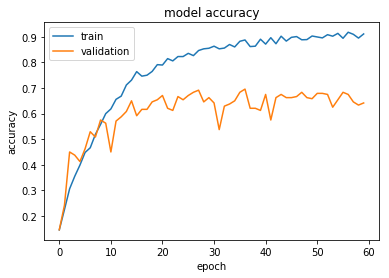

In [112]:
import matplotlib.pyplot as plt
plt.plot(history1.history['acc'])
plt.plot(history1.history['val_acc'])
plt.title('model accuracy')
plt.xlabel('epoch')
plt.ylabel('accuracy')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

In [26]:
VGG19_model.load_weights('saved_models/weights_vgg19model.hdf5')

In [27]:
# Test the model
VGGstyle_predictions=[np.argmax(VGG19_model.predict(np.expand_dims(tensor, axis=0))) for 
                   tensor in VGG_features_test]
test_accuracy=100*np.sum(np.array(VGGstyle_predictions)== \
                    np.argmax(style_test_targets, axis=1))/len(VGGstyle_predictions)
print('Test accuracy: %.2f% %'%test_accuracy)

Test accuracy: 67.25%


In [29]:
from sklearn.metrics import confusion_matrix

VGGcm = confusion_matrix(np.argmax(style_test_targets, axis=1), VGGstyle_predictions)


array([[16,  0,  1,  0,  0,  0,  0,  0,  0, 17,  0,  3],
       [ 0, 25,  0,  0,  0,  1,  1,  5,  0,  1,  4,  0],
       [ 0,  2, 29,  3,  0,  1,  0,  0,  1,  1,  0,  0],
       [ 1,  0,  0, 18,  0,  1,  0,  0,  1, 10,  1,  4],
       [ 0,  0,  0,  0, 20,  0,  0,  0,  2,  0,  0,  0],
       [ 0,  2,  1,  0,  0, 29,  8,  5,  1,  5,  2,  3],
       [ 1,  2,  0,  0,  0,  1,  7,  5,  0,  2,  0,  1],
       [ 0,  0,  0,  0,  1,  3,  1, 24,  0,  1,  0,  0],
       [ 0,  0,  0,  0,  1,  2,  0,  0, 33,  0,  0,  0],
       [ 4,  0,  1,  0,  0,  2,  1,  0,  1, 30,  0,  0],
       [ 0,  1,  0,  0,  0,  2,  1,  2,  0,  1, 23,  1],
       [ 0,  0,  0,  0,  0,  0,  0,  1,  0,  3,  1, 15]], dtype=int64)

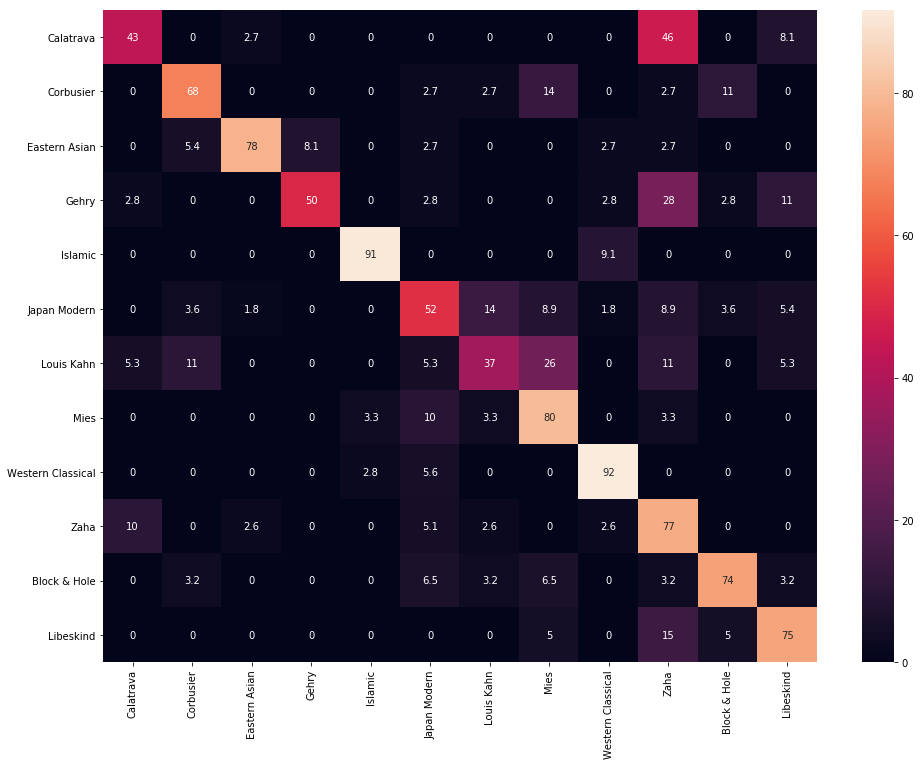

In [114]:
final_cm = confusion_matrix(np.argmax(style_test_targets, axis=1), final_predictions)
import seaborn as sn
import pandas as pd
import matplotlib.pyplot as plt
array =[[16,  0,  1,  0,  0,  0,  0,  0,  0, 17,  0,  3],
       [ 0, 25,  0,  0,  0,  1,  1,  5,  0,  1,  4,  0],
       [ 0,  2, 29,  3,  0,  1,  0,  0,  1,  1,  0,  0],
       [ 1,  0,  0, 18,  0,  1,  0,  0,  1, 10,  1,  4],
       [ 0,  0,  0,  0, 20,  0,  0,  0,  2,  0,  0,  0],
       [ 0,  2,  1,  0,  0, 29,  8,  5,  1,  5,  2,  3],
       [ 1,  2,  0,  0,  0,  1,  7,  5,  0,  2,  0,  1],
       [ 0,  0,  0,  0,  1,  3,  1, 24,  0,  1,  0,  0],
       [ 0,  0,  0,  0,  1,  2,  0,  0, 33,  0,  0,  0],
       [ 4,  0,  1,  0,  0,  2,  1,  0,  1, 30,  0,  0],
       [ 0,  1,  0,  0,  0,  2,  1,  2,  0,  1, 23,  1],
       [ 0,  0,  0,  0,  0,  0,  0,  1,  0,  3,  1, 15]]
# Normalize the array
array=[[100*i/sum(row) for i in row] for row in array]
df_cm = pd.DataFrame(array, index = [i[13:-1] for i in style_names],
                  columns = [i[13:-1] for i in style_names])
plt.figure(figsize = (16,12))
sn.heatmap(df_cm, annot=True)

### GridSearch

In [44]:
x_train=np.vstack([VGG_features_train, VGG_features_val])
y_train=np.vstack([style_train_targets, style_val_targets])
print(x_train.shape, y_train.shape)


(1597, 9, 9, 512) (1597, 12)


In [65]:
y_train=np.argmax(y_train, axis=1)
print(y_train.shape)

(1597,)


In [46]:
from keras.wrappers.scikit_learn import KerasClassifier
from sklearn.model_selection import GridSearchCV

def build_classifier(optimizer, dropout):
    classifier=Sequential()
    classifier.add(GlobalAveragePooling2D(input_shape=[9,9,512]))
    classifier.add(Dropout(dropout))
    classifier.add(Dense(256, activation='relu'))
    classifier.add(Dropout(dropout))
    classifier.add(Dense(12, activation='softmax'))
    
    classifier.compile(optimizer = optimizer, loss ='categorical_crossentropy', metrics = ['accuracy'])
    return classifier

classifier=KerasClassifier(build_fn=build_classifier)
parameters = {'batch_size':[8,16,32], 'epochs':[50,70], 
              'optimizer': ['adam', 'rmsprop'], 'dropout': [0.2,0.3,0.4]}
grid_search=GridSearchCV(estimator= classifier, param_grid = parameters, scoring='accuracy', cv=6)
grid_search=grid_search.fit(x_train, y_train)
best_parameters = grid_search.best_params_
best_accuracy = grid_search.best_score_

Epoch 1/50
1330/1330 [==============================] - ETA: 45s - loss: 2.7482 - acc: 0.12 - ETA: 3s - loss: 2.6446 - acc: 0.0962 - ETA: 2s - loss: 2.5762 - acc: 0.110 - ETA: 1s - loss: 2.5606 - acc: 0.118 - ETA: 1s - loss: 2.5026 - acc: 0.144 - ETA: 0s - loss: 2.4582 - acc: 0.163 - ETA: 0s - loss: 2.4243 - acc: 0.170 - ETA: 0s - loss: 2.3858 - acc: 0.177 - ETA: 0s - loss: 2.3671 - acc: 0.184 - ETA: 0s - loss: 2.3338 - acc: 0.205 - ETA: 0s - loss: 2.2911 - acc: 0.222 - ETA: 0s - loss: 2.2619 - acc: 0.234 - ETA: 0s - loss: 2.2385 - acc: 0.239 - 1s 693us/step - loss: 2.2308 - acc: 0.2406
Epoch 2/50
1330/1330 [==============================] - ETA: 0s - loss: 1.9644 - acc: 0.375 - ETA: 0s - loss: 1.8029 - acc: 0.416 - ETA: 0s - loss: 1.7268 - acc: 0.456 - ETA: 0s - loss: 1.6969 - acc: 0.465 - ETA: 0s - loss: 1.7164 - acc: 0.464 - ETA: 0s - loss: 1.7173 - acc: 0.454 - ETA: 0s - loss: 1.7204 - acc: 0.462 - ETA: 0s - loss: 1.7121 - acc: 0.465 - ETA: 0s - loss: 1.7215 - acc: 0.446 - ETA: 0s 

1330/1330 [==============================] - ETA: 0s - loss: 0.6252 - acc: 0.750 - ETA: 0s - loss: 0.6435 - acc: 0.758 - ETA: 0s - loss: 0.6965 - acc: 0.750 - ETA: 0s - loss: 0.6964 - acc: 0.743 - ETA: 0s - loss: 0.6893 - acc: 0.750 - ETA: 0s - loss: 0.6833 - acc: 0.768 - ETA: 0s - loss: 0.6882 - acc: 0.760 - ETA: 0s - loss: 0.6660 - acc: 0.770 - ETA: 0s - loss: 0.6687 - acc: 0.771 - ETA: 0s - loss: 0.6645 - acc: 0.773 - ETA: 0s - loss: 0.6515 - acc: 0.781 - ETA: 0s - loss: 0.6543 - acc: 0.776 - ETA: 0s - loss: 0.6564 - acc: 0.774 - ETA: 0s - loss: 0.6511 - acc: 0.776 - 1s 529us/step - loss: 0.6544 - acc: 0.7744
Epoch 28/50
1330/1330 [==============================] - ETA: 0s - loss: 1.4884 - acc: 0.500 - ETA: 0s - loss: 0.5896 - acc: 0.807 - ETA: 0s - loss: 0.6664 - acc: 0.764 - ETA: 0s - loss: 0.6293 - acc: 0.772 - ETA: 0s - loss: 0.6497 - acc: 0.759 - ETA: 0s - loss: 0.6676 - acc: 0.755 - ETA: 0s - loss: 0.6850 - acc: 0.758 - ETA: 0s - loss: 0.6785 - acc: 0.756 - ETA: 0s - loss: 0.6

1331/1331 [==============================] - ETA: 0s - loss: 1.1967 - acc: 0.500 - ETA: 0s - loss: 1.3943 - acc: 0.558 - ETA: 0s - loss: 1.4193 - acc: 0.544 - ETA: 0s - loss: 1.3710 - acc: 0.570 - ETA: 0s - loss: 1.3564 - acc: 0.564 - ETA: 0s - loss: 1.3919 - acc: 0.533 - ETA: 0s - loss: 1.4037 - acc: 0.530 - ETA: 0s - loss: 1.3922 - acc: 0.527 - ETA: 0s - loss: 1.3870 - acc: 0.526 - ETA: 0s - loss: 1.3746 - acc: 0.526 - ETA: 0s - loss: 1.3520 - acc: 0.538 - ETA: 0s - loss: 1.3439 - acc: 0.537 - ETA: 0s - loss: 1.3341 - acc: 0.545 - 1s 480us/step - loss: 1.3359 - acc: 0.5447
Epoch 4/50
1331/1331 [==============================] - ETA: 0s - loss: 0.9670 - acc: 0.875 - ETA: 0s - loss: 1.1582 - acc: 0.596 - ETA: 0s - loss: 1.2827 - acc: 0.564 - ETA: 0s - loss: 1.1830 - acc: 0.603 - ETA: 0s - loss: 1.1906 - acc: 0.597 - ETA: 0s - loss: 1.1691 - acc: 0.602 - ETA: 0s - loss: 1.1835 - acc: 0.600 - ETA: 0s - loss: 1.1950 - acc: 0.605 - ETA: 0s - loss: 1.2034 - acc: 0.604 - ETA: 0s - loss: 1.20

1331/1331 [==============================] - ETA: 0s - loss: 0.9810 - acc: 0.500 - ETA: 0s - loss: 0.5764 - acc: 0.830 - ETA: 0s - loss: 0.5915 - acc: 0.814 - ETA: 0s - loss: 0.6490 - acc: 0.793 - ETA: 0s - loss: 0.6562 - acc: 0.790 - ETA: 0s - loss: 0.6166 - acc: 0.809 - ETA: 0s - loss: 0.6083 - acc: 0.804 - ETA: 0s - loss: 0.6031 - acc: 0.806 - ETA: 0s - loss: 0.6029 - acc: 0.799 - ETA: 0s - loss: 0.5924 - acc: 0.803 - ETA: 0s - loss: 0.6032 - acc: 0.796 - ETA: 0s - loss: 0.6088 - acc: 0.796 - ETA: 0s - loss: 0.6187 - acc: 0.793 - 1s 486us/step - loss: 0.6216 - acc: 0.7949
Epoch 30/50
1331/1331 [==============================] - ETA: 0s - loss: 0.6223 - acc: 0.625 - ETA: 0s - loss: 0.6427 - acc: 0.803 - ETA: 0s - loss: 0.6175 - acc: 0.833 - ETA: 0s - loss: 0.6400 - acc: 0.818 - ETA: 0s - loss: 0.6563 - acc: 0.796 - ETA: 0s - loss: 0.6431 - acc: 0.798 - ETA: 0s - loss: 0.6245 - acc: 0.805 - ETA: 0s - loss: 0.6058 - acc: 0.809 - ETA: 0s - loss: 0.6057 - acc: 0.804 - ETA: 0s - loss: 0.6

1331/1331 [==============================] - ETA: 0s - loss: 0.6771 - acc: 0.750 - ETA: 0s - loss: 1.1471 - acc: 0.596 - ETA: 0s - loss: 1.1303 - acc: 0.596 - ETA: 0s - loss: 1.1456 - acc: 0.586 - ETA: 0s - loss: 1.1721 - acc: 0.591 - ETA: 0s - loss: 1.1675 - acc: 0.598 - ETA: 0s - loss: 1.1604 - acc: 0.595 - ETA: 0s - loss: 1.1581 - acc: 0.598 - ETA: 0s - loss: 1.1617 - acc: 0.592 - ETA: 0s - loss: 1.1476 - acc: 0.593 - ETA: 0s - loss: 1.1436 - acc: 0.601 - ETA: 0s - loss: 1.1289 - acc: 0.608 - ETA: 0s - loss: 1.1284 - acc: 0.609 - ETA: 0s - loss: 1.1424 - acc: 0.608 - 1s 517us/step - loss: 1.1444 - acc: 0.6056
Epoch 6/50
1331/1331 [==============================] - ETA: 0s - loss: 1.4719 - acc: 0.625 - ETA: 0s - loss: 1.2121 - acc: 0.571 - ETA: 0s - loss: 1.1040 - acc: 0.611 - ETA: 0s - loss: 1.0610 - acc: 0.644 - ETA: 0s - loss: 1.0633 - acc: 0.652 - ETA: 0s - loss: 1.0608 - acc: 0.646 - ETA: 0s - loss: 1.0545 - acc: 0.648 - ETA: 0s - loss: 1.0551 - acc: 0.652 - ETA: 0s - loss: 1.04

1331/1331 [==============================] - ETA: 0s - loss: 0.6833 - acc: 0.750 - ETA: 0s - loss: 0.7572 - acc: 0.776 - ETA: 0s - loss: 0.6532 - acc: 0.782 - ETA: 0s - loss: 0.6453 - acc: 0.778 - ETA: 0s - loss: 0.6299 - acc: 0.773 - ETA: 0s - loss: 0.5898 - acc: 0.783 - ETA: 0s - loss: 0.6096 - acc: 0.776 - ETA: 0s - loss: 0.6242 - acc: 0.771 - ETA: 0s - loss: 0.6221 - acc: 0.772 - ETA: 0s - loss: 0.6127 - acc: 0.778 - ETA: 0s - loss: 0.6090 - acc: 0.782 - ETA: 0s - loss: 0.5991 - acc: 0.786 - ETA: 0s - loss: 0.6130 - acc: 0.783 - 1s 490us/step - loss: 0.6105 - acc: 0.7851
Epoch 32/50
1331/1331 [==============================] - ETA: 0s - loss: 1.0836 - acc: 0.750 - ETA: 0s - loss: 0.6747 - acc: 0.750 - ETA: 0s - loss: 0.6711 - acc: 0.741 - ETA: 0s - loss: 0.6354 - acc: 0.759 - ETA: 0s - loss: 0.6372 - acc: 0.763 - ETA: 0s - loss: 0.6216 - acc: 0.772 - ETA: 0s - loss: 0.6381 - acc: 0.771 - ETA: 0s - loss: 0.6246 - acc: 0.779 - ETA: 0s - loss: 0.6215 - acc: 0.781 - ETA: 0s - loss: 0.6

1331/1331 [==============================] - ETA: 0s - loss: 1.3212 - acc: 0.875 - ETA: 0s - loss: 1.1029 - acc: 0.696 - ETA: 0s - loss: 1.0568 - acc: 0.689 - ETA: 0s - loss: 1.0919 - acc: 0.657 - ETA: 0s - loss: 1.1065 - acc: 0.637 - ETA: 0s - loss: 1.0708 - acc: 0.644 - ETA: 0s - loss: 1.0637 - acc: 0.634 - ETA: 0s - loss: 1.0646 - acc: 0.633 - ETA: 0s - loss: 1.0530 - acc: 0.641 - ETA: 0s - loss: 1.0418 - acc: 0.653 - ETA: 0s - loss: 1.0343 - acc: 0.654 - ETA: 0s - loss: 1.0256 - acc: 0.653 - ETA: 0s - loss: 1.0230 - acc: 0.655 - 1s 506us/step - loss: 1.0142 - acc: 0.6627
Epoch 8/50
1331/1331 [==============================] - ETA: 0s - loss: 0.8668 - acc: 0.625 - ETA: 0s - loss: 0.9193 - acc: 0.714 - ETA: 0s - loss: 1.0023 - acc: 0.675 - ETA: 0s - loss: 1.0412 - acc: 0.646 - ETA: 0s - loss: 0.9969 - acc: 0.665 - ETA: 0s - loss: 0.9966 - acc: 0.659 - ETA: 0s - loss: 1.0178 - acc: 0.655 - ETA: 0s - loss: 0.9920 - acc: 0.672 - ETA: 0s - loss: 0.9902 - acc: 0.671 - ETA: 0s - loss: 0.98

1331/1331 [==============================] - ETA: 1s - loss: 0.4605 - acc: 0.875 - ETA: 0s - loss: 0.6447 - acc: 0.772 - ETA: 0s - loss: 0.6121 - acc: 0.801 - ETA: 0s - loss: 0.5588 - acc: 0.819 - ETA: 0s - loss: 0.5871 - acc: 0.800 - ETA: 0s - loss: 0.5795 - acc: 0.805 - ETA: 0s - loss: 0.5856 - acc: 0.808 - ETA: 0s - loss: 0.5993 - acc: 0.800 - ETA: 0s - loss: 0.6051 - acc: 0.797 - ETA: 0s - loss: 0.6211 - acc: 0.792 - ETA: 0s - loss: 0.6174 - acc: 0.793 - ETA: 0s - loss: 0.6085 - acc: 0.796 - ETA: 0s - loss: 0.6012 - acc: 0.798 - ETA: 0s - loss: 0.5871 - acc: 0.803 - ETA: 0s - loss: 0.5867 - acc: 0.801 - 1s 582us/step - loss: 0.5927 - acc: 0.8002
Epoch 32/50
1331/1331 [==============================] - ETA: 0s - loss: 1.3427 - acc: 0.500 - ETA: 0s - loss: 0.7973 - acc: 0.715 - ETA: 0s - loss: 0.6724 - acc: 0.761 - ETA: 0s - loss: 0.6476 - acc: 0.775 - ETA: 0s - loss: 0.6399 - acc: 0.769 - ETA: 0s - loss: 0.6514 - acc: 0.763 - ETA: 0s - loss: 0.6636 - acc: 0.760 - ETA: 0s - loss: 0.6

1331/1331 [==============================] - ETA: 0s - loss: 0.8680 - acc: 0.750 - ETA: 0s - loss: 1.1316 - acc: 0.575 - ETA: 0s - loss: 1.1483 - acc: 0.607 - ETA: 0s - loss: 1.1272 - acc: 0.615 - ETA: 0s - loss: 1.1550 - acc: 0.599 - ETA: 0s - loss: 1.1333 - acc: 0.604 - ETA: 0s - loss: 1.1302 - acc: 0.601 - ETA: 0s - loss: 1.1263 - acc: 0.607 - ETA: 0s - loss: 1.1135 - acc: 0.614 - ETA: 0s - loss: 1.1117 - acc: 0.616 - ETA: 0s - loss: 1.0990 - acc: 0.618 - ETA: 0s - loss: 1.0810 - acc: 0.625 - ETA: 0s - loss: 1.0704 - acc: 0.629 - 1s 486us/step - loss: 1.0736 - acc: 0.6311
Epoch 7/50
1331/1331 [==============================] - ETA: 0s - loss: 1.0031 - acc: 0.625 - ETA: 0s - loss: 0.9740 - acc: 0.651 - ETA: 0s - loss: 1.0004 - acc: 0.648 - ETA: 0s - loss: 0.9960 - acc: 0.637 - ETA: 0s - loss: 1.0337 - acc: 0.634 - ETA: 0s - loss: 1.0563 - acc: 0.634 - ETA: 0s - loss: 1.0538 - acc: 0.631 - ETA: 0s - loss: 1.0323 - acc: 0.637 - ETA: 0s - loss: 1.0415 - acc: 0.632 - ETA: 0s - loss: 1.06

1331/1331 [==============================] - ETA: 0s - loss: 0.8691 - acc: 0.625 - ETA: 0s - loss: 0.5390 - acc: 0.800 - ETA: 0s - loss: 0.5733 - acc: 0.799 - ETA: 0s - loss: 0.5776 - acc: 0.795 - ETA: 0s - loss: 0.5913 - acc: 0.782 - ETA: 0s - loss: 0.5996 - acc: 0.776 - ETA: 0s - loss: 0.6204 - acc: 0.771 - ETA: 0s - loss: 0.6087 - acc: 0.776 - ETA: 0s - loss: 0.6004 - acc: 0.778 - ETA: 0s - loss: 0.6053 - acc: 0.776 - ETA: 0s - loss: 0.6164 - acc: 0.771 - ETA: 0s - loss: 0.6119 - acc: 0.775 - ETA: 0s - loss: 0.6225 - acc: 0.768 - 1s 494us/step - loss: 0.6216 - acc: 0.7671
Epoch 33/50
1331/1331 [==============================] - ETA: 0s - loss: 1.0044 - acc: 0.500 - ETA: 0s - loss: 0.6383 - acc: 0.723 - ETA: 0s - loss: 0.5918 - acc: 0.768 - ETA: 0s - loss: 0.5851 - acc: 0.771 - ETA: 0s - loss: 0.5512 - acc: 0.785 - ETA: 0s - loss: 0.5749 - acc: 0.778 - ETA: 0s - loss: 0.5605 - acc: 0.791 - ETA: 0s - loss: 0.5727 - acc: 0.792 - ETA: 0s - loss: 0.6029 - acc: 0.781 - ETA: 0s - loss: 0.5

1331/1331 [==============================] - ETA: 0s - loss: 0.7755 - acc: 0.750 - ETA: 0s - loss: 0.8819 - acc: 0.696 - ETA: 0s - loss: 0.9013 - acc: 0.703 - ETA: 0s - loss: 0.9552 - acc: 0.700 - ETA: 0s - loss: 0.9676 - acc: 0.684 - ETA: 0s - loss: 0.9541 - acc: 0.684 - ETA: 0s - loss: 0.9646 - acc: 0.676 - ETA: 0s - loss: 0.9953 - acc: 0.666 - ETA: 0s - loss: 0.9925 - acc: 0.667 - ETA: 0s - loss: 0.9984 - acc: 0.663 - ETA: 0s - loss: 1.0042 - acc: 0.662 - ETA: 0s - loss: 1.0040 - acc: 0.661 - ETA: 0s - loss: 0.9913 - acc: 0.667 - ETA: 0s - loss: 0.9925 - acc: 0.665 - 1s 518us/step - loss: 0.9926 - acc: 0.6649
Epoch 9/50
1331/1331 [==============================] - ETA: 0s - loss: 0.8213 - acc: 0.625 - ETA: 0s - loss: 0.8998 - acc: 0.718 - ETA: 0s - loss: 0.9022 - acc: 0.695 - ETA: 0s - loss: 0.9660 - acc: 0.680 - ETA: 0s - loss: 0.9387 - acc: 0.687 - ETA: 0s - loss: 0.9171 - acc: 0.691 - ETA: 0s - loss: 0.9216 - acc: 0.693 - ETA: 0s - loss: 0.9137 - acc: 0.695 - ETA: 0s - loss: 0.91

1331/1331 [==============================] - ETA: 0s - loss: 0.4232 - acc: 0.750 - ETA: 0s - loss: 0.7604 - acc: 0.741 - ETA: 0s - loss: 0.6832 - acc: 0.763 - ETA: 0s - loss: 0.6792 - acc: 0.768 - ETA: 0s - loss: 0.6579 - acc: 0.778 - ETA: 0s - loss: 0.6373 - acc: 0.783 - ETA: 0s - loss: 0.6450 - acc: 0.778 - ETA: 0s - loss: 0.6265 - acc: 0.789 - ETA: 0s - loss: 0.5978 - acc: 0.800 - ETA: 0s - loss: 0.5977 - acc: 0.801 - ETA: 0s - loss: 0.5945 - acc: 0.805 - ETA: 0s - loss: 0.5896 - acc: 0.806 - ETA: 0s - loss: 0.5877 - acc: 0.808 - 1s 486us/step - loss: 0.5854 - acc: 0.8084
Epoch 35/50
1331/1331 [==============================] - ETA: 0s - loss: 1.2287 - acc: 0.375 - ETA: 0s - loss: 0.5737 - acc: 0.776 - ETA: 0s - loss: 0.5908 - acc: 0.800 - ETA: 0s - loss: 0.5975 - acc: 0.800 - ETA: 0s - loss: 0.5609 - acc: 0.811 - ETA: 0s - loss: 0.5526 - acc: 0.814 - ETA: 0s - loss: 0.5677 - acc: 0.809 - ETA: 0s - loss: 0.5686 - acc: 0.800 - ETA: 0s - loss: 0.5701 - acc: 0.796 - ETA: 0s - loss: 0.5

Epoch 11/50
1330/1330 [==============================] - ETA: 0s - loss: 1.0891 - acc: 0.750 - ETA: 0s - loss: 0.9567 - acc: 0.666 - ETA: 0s - loss: 0.9015 - acc: 0.702 - ETA: 0s - loss: 0.9943 - acc: 0.680 - ETA: 0s - loss: 0.9880 - acc: 0.682 - ETA: 0s - loss: 0.9619 - acc: 0.679 - ETA: 0s - loss: 0.9639 - acc: 0.675 - ETA: 0s - loss: 0.9478 - acc: 0.679 - ETA: 0s - loss: 0.9666 - acc: 0.671 - ETA: 0s - loss: 0.9579 - acc: 0.675 - ETA: 0s - loss: 0.9554 - acc: 0.678 - ETA: 0s - loss: 0.9464 - acc: 0.681 - ETA: 0s - loss: 0.9383 - acc: 0.681 - 1s 477us/step - loss: 0.9400 - acc: 0.6805
Epoch 12/50
1330/1330 [==============================] - ETA: 0s - loss: 1.5133 - acc: 0.500 - ETA: 0s - loss: 1.1199 - acc: 0.580 - ETA: 0s - loss: 1.0482 - acc: 0.625 - ETA: 0s - loss: 1.0198 - acc: 0.639 - ETA: 0s - loss: 1.0034 - acc: 0.651 - ETA: 0s - loss: 0.9557 - acc: 0.657 - ETA: 0s - loss: 0.9610 - acc: 0.658 - ETA: 0s - loss: 0.9504 - acc: 0.664 - ETA: 0s - loss: 0.9558 - acc: 0.663 - ETA: 0s

1330/1330 [==============================] - ETA: 0s - loss: 0.2791 - acc: 1.000 - ETA: 0s - loss: 0.5953 - acc: 0.800 - ETA: 0s - loss: 0.6121 - acc: 0.790 - ETA: 0s - loss: 0.6277 - acc: 0.779 - ETA: 0s - loss: 0.6374 - acc: 0.779 - ETA: 0s - loss: 0.6327 - acc: 0.782 - ETA: 0s - loss: 0.6452 - acc: 0.779 - ETA: 0s - loss: 0.6212 - acc: 0.787 - ETA: 0s - loss: 0.6370 - acc: 0.783 - ETA: 0s - loss: 0.6160 - acc: 0.788 - ETA: 0s - loss: 0.6160 - acc: 0.787 - ETA: 0s - loss: 0.6236 - acc: 0.783 - ETA: 0s - loss: 0.6248 - acc: 0.783 - 1s 470us/step - loss: 0.6263 - acc: 0.7827
Epoch 39/50
1330/1330 [==============================] - ETA: 0s - loss: 0.5542 - acc: 0.750 - ETA: 0s - loss: 0.7002 - acc: 0.723 - ETA: 0s - loss: 0.7031 - acc: 0.763 - ETA: 0s - loss: 0.6566 - acc: 0.776 - ETA: 0s - loss: 0.6336 - acc: 0.781 - ETA: 0s - loss: 0.6282 - acc: 0.783 - ETA: 0s - loss: 0.6678 - acc: 0.779 - ETA: 0s - loss: 0.6386 - acc: 0.785 - ETA: 0s - loss: 0.6109 - acc: 0.793 - ETA: 0s - loss: 0.6

1331/1331 [==============================] - ETA: 0s - loss: 0.7468 - acc: 0.875 - ETA: 0s - loss: 0.7877 - acc: 0.683 - ETA: 0s - loss: 0.7262 - acc: 0.709 - ETA: 0s - loss: 0.7646 - acc: 0.729 - ETA: 0s - loss: 0.7806 - acc: 0.727 - ETA: 0s - loss: 0.8203 - acc: 0.720 - ETA: 0s - loss: 0.8030 - acc: 0.721 - ETA: 0s - loss: 0.8139 - acc: 0.717 - ETA: 0s - loss: 0.8298 - acc: 0.704 - ETA: 0s - loss: 0.8033 - acc: 0.721 - ETA: 0s - loss: 0.8145 - acc: 0.721 - ETA: 0s - loss: 0.8199 - acc: 0.721 - ETA: 0s - loss: 0.8402 - acc: 0.716 - 1s 479us/step - loss: 0.8355 - acc: 0.7183
Epoch 16/50
1331/1331 [==============================] - ETA: 0s - loss: 0.9241 - acc: 0.625 - ETA: 0s - loss: 0.8077 - acc: 0.758 - ETA: 0s - loss: 0.9307 - acc: 0.699 - ETA: 0s - loss: 0.8518 - acc: 0.725 - ETA: 0s - loss: 0.8156 - acc: 0.735 - ETA: 0s - loss: 0.8238 - acc: 0.736 - ETA: 0s - loss: 0.8381 - acc: 0.724 - ETA: 0s - loss: 0.8056 - acc: 0.731 - ETA: 0s - loss: 0.8135 - acc: 0.725 - ETA: 0s - loss: 0.8

1331/1331 [==============================] - ETA: 0s - loss: 0.1739 - acc: 1.000 - ETA: 0s - loss: 0.4515 - acc: 0.826 - ETA: 0s - loss: 0.5419 - acc: 0.817 - ETA: 0s - loss: 0.5959 - acc: 0.788 - ETA: 0s - loss: 0.5541 - acc: 0.805 - ETA: 0s - loss: 0.5815 - acc: 0.795 - ETA: 0s - loss: 0.5875 - acc: 0.789 - ETA: 0s - loss: 0.5737 - acc: 0.795 - ETA: 0s - loss: 0.5653 - acc: 0.796 - ETA: 0s - loss: 0.5764 - acc: 0.798 - ETA: 0s - loss: 0.5875 - acc: 0.798 - ETA: 0s - loss: 0.5881 - acc: 0.796 - ETA: 0s - loss: 0.5785 - acc: 0.796 - 1s 488us/step - loss: 0.5747 - acc: 0.7971
Epoch 42/50
1331/1331 [==============================] - ETA: 0s - loss: 0.8704 - acc: 0.750 - ETA: 0s - loss: 0.4835 - acc: 0.812 - ETA: 0s - loss: 0.5138 - acc: 0.819 - ETA: 0s - loss: 0.5546 - acc: 0.809 - ETA: 0s - loss: 0.5646 - acc: 0.805 - ETA: 0s - loss: 0.5688 - acc: 0.797 - ETA: 0s - loss: 0.5652 - acc: 0.793 - ETA: 0s - loss: 0.5447 - acc: 0.800 - ETA: 0s - loss: 0.5699 - acc: 0.793 - ETA: 0s - loss: 0.5

1331/1331 [==============================] - ETA: 0s - loss: 0.9329 - acc: 0.625 - ETA: 0s - loss: 0.8305 - acc: 0.682 - ETA: 0s - loss: 0.7870 - acc: 0.716 - ETA: 0s - loss: 0.7830 - acc: 0.714 - ETA: 0s - loss: 0.7342 - acc: 0.731 - ETA: 0s - loss: 0.7548 - acc: 0.719 - ETA: 0s - loss: 0.7521 - acc: 0.724 - ETA: 0s - loss: 0.7661 - acc: 0.722 - ETA: 0s - loss: 0.7706 - acc: 0.721 - ETA: 0s - loss: 0.7735 - acc: 0.717 - ETA: 0s - loss: 0.7756 - acc: 0.718 - ETA: 0s - loss: 0.7864 - acc: 0.714 - ETA: 0s - loss: 0.7863 - acc: 0.715 - 1s 487us/step - loss: 0.7856 - acc: 0.7160
Epoch 18/50
1331/1331 [==============================] - ETA: 0s - loss: 1.5179 - acc: 0.625 - ETA: 0s - loss: 0.7432 - acc: 0.723 - ETA: 0s - loss: 0.7589 - acc: 0.717 - ETA: 0s - loss: 0.7592 - acc: 0.731 - ETA: 0s - loss: 0.7575 - acc: 0.728 - ETA: 0s - loss: 0.7709 - acc: 0.729 - ETA: 0s - loss: 0.7698 - acc: 0.729 - ETA: 0s - loss: 0.7932 - acc: 0.721 - ETA: 0s - loss: 0.7819 - acc: 0.722 - ETA: 0s - loss: 0.7

1331/1331 [==============================] - ETA: 0s - loss: 1.0940 - acc: 0.500 - ETA: 0s - loss: 0.5563 - acc: 0.812 - ETA: 0s - loss: 0.5942 - acc: 0.802 - ETA: 0s - loss: 0.5433 - acc: 0.810 - ETA: 0s - loss: 0.5633 - acc: 0.802 - ETA: 0s - loss: 0.5664 - acc: 0.805 - ETA: 0s - loss: 0.5625 - acc: 0.807 - ETA: 0s - loss: 0.5490 - acc: 0.811 - ETA: 0s - loss: 0.5589 - acc: 0.806 - ETA: 0s - loss: 0.5618 - acc: 0.796 - ETA: 0s - loss: 0.5763 - acc: 0.795 - ETA: 0s - loss: 0.5827 - acc: 0.792 - ETA: 0s - loss: 0.5773 - acc: 0.794 - 1s 510us/step - loss: 0.5711 - acc: 0.7949
Epoch 43/50
1331/1331 [==============================] - ETA: 0s - loss: 0.8248 - acc: 0.500 - ETA: 0s - loss: 0.4650 - acc: 0.812 - ETA: 0s - loss: 0.5667 - acc: 0.768 - ETA: 0s - loss: 0.5923 - acc: 0.762 - ETA: 0s - loss: 0.5646 - acc: 0.777 - ETA: 0s - loss: 0.5837 - acc: 0.783 - ETA: 0s - loss: 0.5573 - acc: 0.795 - ETA: 0s - loss: 0.5794 - acc: 0.789 - ETA: 0s - loss: 0.5711 - acc: 0.791 - ETA: 0s - loss: 0.5

1331/1331 [==============================] - ETA: 0s - loss: 0.7000 - acc: 0.625 - ETA: 0s - loss: 0.7215 - acc: 0.750 - ETA: 0s - loss: 0.7581 - acc: 0.745 - ETA: 0s - loss: 0.7591 - acc: 0.730 - ETA: 0s - loss: 0.7708 - acc: 0.735 - ETA: 0s - loss: 0.7341 - acc: 0.742 - ETA: 0s - loss: 0.7515 - acc: 0.734 - ETA: 0s - loss: 0.7816 - acc: 0.728 - ETA: 0s - loss: 0.7864 - acc: 0.729 - ETA: 0s - loss: 0.8004 - acc: 0.727 - ETA: 0s - loss: 0.7918 - acc: 0.728 - ETA: 0s - loss: 0.8043 - acc: 0.723 - ETA: 0s - loss: 0.8009 - acc: 0.724 - ETA: 0s - loss: 0.8008 - acc: 0.729 - 1s 512us/step - loss: 0.7945 - acc: 0.7310
Epoch 19/50
1331/1331 [==============================] - ETA: 0s - loss: 1.2982 - acc: 0.375 - ETA: 0s - loss: 0.6558 - acc: 0.785 - ETA: 0s - loss: 0.7024 - acc: 0.745 - ETA: 0s - loss: 0.7077 - acc: 0.743 - ETA: 0s - loss: 0.7489 - acc: 0.738 - ETA: 0s - loss: 0.7583 - acc: 0.738 - ETA: 0s - loss: 0.7769 - acc: 0.734 - ETA: 0s - loss: 0.7770 - acc: 0.732 - ETA: 0s - loss: 0.7

1331/1331 [==============================] - ETA: 0s - loss: 0.3232 - acc: 0.875 - ETA: 0s - loss: 0.5742 - acc: 0.776 - ETA: 0s - loss: 0.6068 - acc: 0.767 - ETA: 0s - loss: 0.5833 - acc: 0.777 - ETA: 0s - loss: 0.5795 - acc: 0.782 - ETA: 0s - loss: 0.5894 - acc: 0.778 - ETA: 0s - loss: 0.5850 - acc: 0.787 - ETA: 0s - loss: 0.5730 - acc: 0.799 - ETA: 0s - loss: 0.5745 - acc: 0.796 - ETA: 0s - loss: 0.5649 - acc: 0.800 - ETA: 0s - loss: 0.5588 - acc: 0.801 - ETA: 0s - loss: 0.5717 - acc: 0.797 - ETA: 0s - loss: 0.5831 - acc: 0.792 - 1s 492us/step - loss: 0.5865 - acc: 0.7926
Epoch 45/50
1331/1331 [==============================] - ETA: 0s - loss: 0.5819 - acc: 0.625 - ETA: 0s - loss: 0.6518 - acc: 0.758 - ETA: 0s - loss: 0.5892 - acc: 0.796 - ETA: 0s - loss: 0.5557 - acc: 0.806 - ETA: 0s - loss: 0.5517 - acc: 0.809 - ETA: 0s - loss: 0.5362 - acc: 0.812 - ETA: 0s - loss: 0.5660 - acc: 0.796 - ETA: 0s - loss: 0.5645 - acc: 0.793 - ETA: 0s - loss: 0.5478 - acc: 0.800 - ETA: 0s - loss: 0.5

1331/1331 [==============================] - ETA: 0s - loss: 1.2130 - acc: 0.625 - ETA: 0s - loss: 0.7825 - acc: 0.775 - ETA: 0s - loss: 0.8276 - acc: 0.745 - ETA: 0s - loss: 0.7533 - acc: 0.750 - ETA: 0s - loss: 0.7696 - acc: 0.735 - ETA: 0s - loss: 0.7585 - acc: 0.734 - ETA: 0s - loss: 0.7707 - acc: 0.726 - ETA: 0s - loss: 0.7605 - acc: 0.730 - ETA: 0s - loss: 0.7773 - acc: 0.725 - ETA: 0s - loss: 0.7808 - acc: 0.725 - ETA: 0s - loss: 0.7600 - acc: 0.730 - ETA: 0s - loss: 0.7776 - acc: 0.725 - ETA: 0s - loss: 0.7824 - acc: 0.724 - 1s 503us/step - loss: 0.7851 - acc: 0.7228
Epoch 21/50
1331/1331 [==============================] - ETA: 0s - loss: 0.7274 - acc: 0.625 - ETA: 0s - loss: 0.6925 - acc: 0.723 - ETA: 0s - loss: 0.6321 - acc: 0.754 - ETA: 0s - loss: 0.7078 - acc: 0.731 - ETA: 0s - loss: 0.7396 - acc: 0.714 - ETA: 0s - loss: 0.7406 - acc: 0.725 - ETA: 0s - loss: 0.7228 - acc: 0.740 - ETA: 0s - loss: 0.7409 - acc: 0.736 - ETA: 0s - loss: 0.7606 - acc: 0.736 - ETA: 0s - loss: 0.7

1331/1331 [==============================] - ETA: 0s - loss: 0.3189 - acc: 0.875 - ETA: 0s - loss: 0.8612 - acc: 0.723 - ETA: 0s - loss: 0.6953 - acc: 0.759 - ETA: 0s - loss: 0.6705 - acc: 0.775 - ETA: 0s - loss: 0.6460 - acc: 0.775 - ETA: 0s - loss: 0.6177 - acc: 0.787 - ETA: 0s - loss: 0.6179 - acc: 0.791 - ETA: 0s - loss: 0.5927 - acc: 0.797 - ETA: 0s - loss: 0.6011 - acc: 0.794 - ETA: 0s - loss: 0.5897 - acc: 0.799 - ETA: 0s - loss: 0.5910 - acc: 0.796 - ETA: 0s - loss: 0.5900 - acc: 0.794 - ETA: 0s - loss: 0.5770 - acc: 0.794 - 1s 488us/step - loss: 0.5907 - acc: 0.7904
Epoch 47/50
1331/1331 [==============================] - ETA: 0s - loss: 0.2363 - acc: 0.875 - ETA: 0s - loss: 0.4863 - acc: 0.821 - ETA: 0s - loss: 0.5221 - acc: 0.828 - ETA: 0s - loss: 0.5386 - acc: 0.815 - ETA: 0s - loss: 0.5656 - acc: 0.813 - ETA: 0s - loss: 0.5612 - acc: 0.806 - ETA: 0s - loss: 0.5889 - acc: 0.808 - ETA: 0s - loss: 0.5701 - acc: 0.812 - ETA: 0s - loss: 0.5432 - acc: 0.821 - ETA: 0s - loss: 0.5

1331/1331 [==============================] - ETA: 0s - loss: 0.9566 - acc: 0.625 - ETA: 0s - loss: 1.0736 - acc: 0.607 - ETA: 0s - loss: 0.8775 - acc: 0.692 - ETA: 0s - loss: 0.8039 - acc: 0.714 - ETA: 0s - loss: 0.7695 - acc: 0.728 - ETA: 0s - loss: 0.7853 - acc: 0.726 - ETA: 0s - loss: 0.7703 - acc: 0.734 - ETA: 0s - loss: 0.8061 - acc: 0.717 - ETA: 0s - loss: 0.7993 - acc: 0.720 - ETA: 0s - loss: 0.7723 - acc: 0.731 - ETA: 0s - loss: 0.7646 - acc: 0.735 - ETA: 0s - loss: 0.7666 - acc: 0.732 - ETA: 0s - loss: 0.7874 - acc: 0.722 - 1s 501us/step - loss: 0.7843 - acc: 0.7243
Epoch 23/50
1331/1331 [==============================] - ETA: 0s - loss: 1.1001 - acc: 0.625 - ETA: 0s - loss: 0.6236 - acc: 0.776 - ETA: 0s - loss: 0.6324 - acc: 0.777 - ETA: 0s - loss: 0.6973 - acc: 0.775 - ETA: 0s - loss: 0.7395 - acc: 0.752 - ETA: 0s - loss: 0.7271 - acc: 0.755 - ETA: 0s - loss: 0.7353 - acc: 0.758 - ETA: 0s - loss: 0.7661 - acc: 0.747 - ETA: 0s - loss: 0.7645 - acc: 0.742 - ETA: 0s - loss: 0.7

1331/1331 [==============================] - ETA: 0s - loss: 0.0817 - acc: 1.000 - ETA: 0s - loss: 0.5114 - acc: 0.812 - ETA: 0s - loss: 0.5526 - acc: 0.799 - ETA: 0s - loss: 0.6072 - acc: 0.786 - ETA: 0s - loss: 0.6082 - acc: 0.786 - ETA: 0s - loss: 0.6013 - acc: 0.788 - ETA: 0s - loss: 0.5767 - acc: 0.794 - ETA: 0s - loss: 0.5827 - acc: 0.795 - ETA: 0s - loss: 0.5681 - acc: 0.800 - ETA: 0s - loss: 0.5659 - acc: 0.802 - ETA: 0s - loss: 0.5616 - acc: 0.802 - ETA: 0s - loss: 0.5585 - acc: 0.800 - ETA: 0s - loss: 0.5457 - acc: 0.803 - 1s 488us/step - loss: 0.5551 - acc: 0.8002
Epoch 49/50
1331/1331 [==============================] - ETA: 0s - loss: 0.3002 - acc: 0.875 - ETA: 0s - loss: 0.8462 - acc: 0.701 - ETA: 0s - loss: 0.8083 - acc: 0.730 - ETA: 0s - loss: 0.7567 - acc: 0.753 - ETA: 0s - loss: 0.7105 - acc: 0.764 - ETA: 0s - loss: 0.6608 - acc: 0.780 - ETA: 0s - loss: 0.6564 - acc: 0.781 - ETA: 0s - loss: 0.6195 - acc: 0.792 - ETA: 0s - loss: 0.6268 - acc: 0.789 - ETA: 0s - loss: 0.6

1330/1330 [==============================] - ETA: 0s - loss: 0.3511 - acc: 1.000 - ETA: 0s - loss: 0.6012 - acc: 0.767 - ETA: 0s - loss: 0.6439 - acc: 0.750 - ETA: 0s - loss: 0.6522 - acc: 0.746 - ETA: 0s - loss: 0.6620 - acc: 0.745 - ETA: 0s - loss: 0.6851 - acc: 0.753 - ETA: 0s - loss: 0.6795 - acc: 0.759 - ETA: 0s - loss: 0.6700 - acc: 0.764 - ETA: 0s - loss: 0.6775 - acc: 0.760 - ETA: 0s - loss: 0.6749 - acc: 0.764 - ETA: 0s - loss: 0.6755 - acc: 0.761 - ETA: 0s - loss: 0.6777 - acc: 0.761 - ETA: 0s - loss: 0.6763 - acc: 0.761 - 1s 496us/step - loss: 0.6762 - acc: 0.7632
Epoch 25/70
1330/1330 [==============================] - ETA: 0s - loss: 0.6683 - acc: 0.750 - ETA: 0s - loss: 0.8174 - acc: 0.642 - ETA: 0s - loss: 0.7247 - acc: 0.713 - ETA: 0s - loss: 0.7491 - acc: 0.715 - ETA: 0s - loss: 0.7573 - acc: 0.721 - ETA: 0s - loss: 0.7415 - acc: 0.729 - ETA: 0s - loss: 0.7144 - acc: 0.742 - ETA: 0s - loss: 0.6962 - acc: 0.751 - ETA: 0s - loss: 0.6851 - acc: 0.757 - ETA: 0s - loss: 0.6

1330/1330 [==============================] - ETA: 0s - loss: 0.2133 - acc: 1.000 - ETA: 0s - loss: 0.4221 - acc: 0.848 - ETA: 0s - loss: 0.4679 - acc: 0.846 - ETA: 0s - loss: 0.4911 - acc: 0.826 - ETA: 0s - loss: 0.5132 - acc: 0.817 - ETA: 0s - loss: 0.4926 - acc: 0.828 - ETA: 0s - loss: 0.5041 - acc: 0.826 - ETA: 0s - loss: 0.5108 - acc: 0.825 - ETA: 0s - loss: 0.5069 - acc: 0.825 - ETA: 0s - loss: 0.5033 - acc: 0.828 - ETA: 0s - loss: 0.5019 - acc: 0.829 - ETA: 0s - loss: 0.4959 - acc: 0.832 - ETA: 0s - loss: 0.4882 - acc: 0.836 - 1s 493us/step - loss: 0.4830 - acc: 0.8376
Epoch 51/70
1330/1330 [==============================] - ETA: 0s - loss: 0.5502 - acc: 0.750 - ETA: 0s - loss: 0.4103 - acc: 0.848 - ETA: 0s - loss: 0.4553 - acc: 0.833 - ETA: 0s - loss: 0.5094 - acc: 0.809 - ETA: 0s - loss: 0.4835 - acc: 0.817 - ETA: 0s - loss: 0.5070 - acc: 0.809 - ETA: 0s - loss: 0.5155 - acc: 0.804 - ETA: 0s - loss: 0.5279 - acc: 0.802 - ETA: 0s - loss: 0.5362 - acc: 0.802 - ETA: 0s - loss: 0.5

1331/1331 [==============================] - ETA: 0s - loss: 0.6628 - acc: 0.625 - ETA: 0s - loss: 1.1954 - acc: 0.571 - ETA: 0s - loss: 1.1201 - acc: 0.592 - ETA: 0s - loss: 1.1288 - acc: 0.599 - ETA: 0s - loss: 1.1371 - acc: 0.576 - ETA: 0s - loss: 1.1381 - acc: 0.580 - ETA: 0s - loss: 1.1103 - acc: 0.592 - ETA: 0s - loss: 1.1123 - acc: 0.587 - ETA: 0s - loss: 1.0944 - acc: 0.598 - ETA: 0s - loss: 1.0915 - acc: 0.604 - ETA: 0s - loss: 1.0845 - acc: 0.607 - ETA: 0s - loss: 1.0872 - acc: 0.606 - ETA: 0s - loss: 1.0698 - acc: 0.617 - ETA: 0s - loss: 1.0665 - acc: 0.620 - 1s 519us/step - loss: 1.0659 - acc: 0.6213
Epoch 7/70
1331/1331 [==============================] - ETA: 0s - loss: 1.0304 - acc: 0.625 - ETA: 0s - loss: 0.9318 - acc: 0.682 - ETA: 0s - loss: 1.0718 - acc: 0.640 - ETA: 0s - loss: 1.0256 - acc: 0.648 - ETA: 0s - loss: 1.0225 - acc: 0.650 - ETA: 0s - loss: 1.0480 - acc: 0.637 - ETA: 0s - loss: 1.0347 - acc: 0.645 - ETA: 0s - loss: 1.0573 - acc: 0.642 - ETA: 0s - loss: 1.04

1331/1331 [==============================] - ETA: 0s - loss: 0.7736 - acc: 0.625 - ETA: 0s - loss: 0.4597 - acc: 0.848 - ETA: 0s - loss: 0.5236 - acc: 0.796 - ETA: 0s - loss: 0.5519 - acc: 0.793 - ETA: 0s - loss: 0.5348 - acc: 0.802 - ETA: 0s - loss: 0.5178 - acc: 0.813 - ETA: 0s - loss: 0.5115 - acc: 0.816 - ETA: 0s - loss: 0.5325 - acc: 0.806 - ETA: 0s - loss: 0.5567 - acc: 0.795 - ETA: 0s - loss: 0.5569 - acc: 0.798 - ETA: 0s - loss: 0.5534 - acc: 0.799 - ETA: 0s - loss: 0.5509 - acc: 0.802 - ETA: 0s - loss: 0.5441 - acc: 0.805 - ETA: 0s - loss: 0.5400 - acc: 0.808 - 1s 527us/step - loss: 0.5432 - acc: 0.8062
Epoch 32/70
1331/1331 [==============================] - ETA: 0s - loss: 0.3295 - acc: 0.875 - ETA: 0s - loss: 0.5880 - acc: 0.759 - ETA: 0s - loss: 0.5223 - acc: 0.805 - ETA: 0s - loss: 0.5366 - acc: 0.800 - ETA: 0s - loss: 0.5536 - acc: 0.807 - ETA: 0s - loss: 0.5661 - acc: 0.798 - ETA: 0s - loss: 0.5784 - acc: 0.793 - ETA: 0s - loss: 0.5415 - acc: 0.811 - ETA: 0s - loss: 0.5

1331/1331 [==============================] - ETA: 0s - loss: 0.9027 - acc: 0.625 - ETA: 0s - loss: 0.4467 - acc: 0.821 - ETA: 0s - loss: 0.3714 - acc: 0.865 - ETA: 0s - loss: 0.3673 - acc: 0.868 - ETA: 0s - loss: 0.3768 - acc: 0.865 - ETA: 0s - loss: 0.4129 - acc: 0.855 - ETA: 0s - loss: 0.4256 - acc: 0.853 - ETA: 0s - loss: 0.4276 - acc: 0.848 - ETA: 0s - loss: 0.4233 - acc: 0.850 - ETA: 0s - loss: 0.4192 - acc: 0.852 - ETA: 0s - loss: 0.4088 - acc: 0.857 - ETA: 0s - loss: 0.4252 - acc: 0.852 - ETA: 0s - loss: 0.4290 - acc: 0.852 - ETA: 0s - loss: 0.4389 - acc: 0.847 - 1s 512us/step - loss: 0.4362 - acc: 0.8490
Epoch 58/70
1331/1331 [==============================] - ETA: 0s - loss: 0.4141 - acc: 0.875 - ETA: 0s - loss: 0.3427 - acc: 0.875 - ETA: 0s - loss: 0.3994 - acc: 0.845 - ETA: 0s - loss: 0.4438 - acc: 0.828 - ETA: 0s - loss: 0.4348 - acc: 0.838 - ETA: 0s - loss: 0.4257 - acc: 0.845 - ETA: 0s - loss: 0.4161 - acc: 0.850 - ETA: 0s - loss: 0.4164 - acc: 0.851 - ETA: 0s - loss: 0.4

1331/1331 [==============================] - ETA: 0s - loss: 1.1759 - acc: 0.500 - ETA: 0s - loss: 0.8176 - acc: 0.678 - ETA: 0s - loss: 0.7636 - acc: 0.736 - ETA: 0s - loss: 0.8524 - acc: 0.685 - ETA: 0s - loss: 0.8406 - acc: 0.688 - ETA: 0s - loss: 0.8250 - acc: 0.695 - ETA: 0s - loss: 0.8419 - acc: 0.697 - ETA: 0s - loss: 0.8385 - acc: 0.696 - ETA: 0s - loss: 0.8360 - acc: 0.695 - ETA: 0s - loss: 0.8368 - acc: 0.695 - ETA: 0s - loss: 0.8292 - acc: 0.699 - ETA: 0s - loss: 0.8231 - acc: 0.706 - ETA: 0s - loss: 0.8221 - acc: 0.709 - ETA: 0s - loss: 0.8338 - acc: 0.703 - ETA: 0s - loss: 0.8326 - acc: 0.705 - 1s 567us/step - loss: 0.8354 - acc: 0.7047
Epoch 14/70
1331/1331 [==============================] - ETA: 0s - loss: 0.5850 - acc: 0.750 - ETA: 0s - loss: 0.8164 - acc: 0.730 - ETA: 0s - loss: 0.8946 - acc: 0.655 - ETA: 0s - loss: 0.8580 - acc: 0.671 - ETA: 0s - loss: 0.9046 - acc: 0.657 - ETA: 0s - loss: 0.8458 - acc: 0.685 - ETA: 0s - loss: 0.8330 - acc: 0.686 - ETA: 0s - loss: 0.8

1331/1331 [==============================] - ETA: 0s - loss: 0.5972 - acc: 0.875 - ETA: 0s - loss: 0.5056 - acc: 0.812 - ETA: 0s - loss: 0.4315 - acc: 0.851 - ETA: 0s - loss: 0.4672 - acc: 0.826 - ETA: 0s - loss: 0.4879 - acc: 0.814 - ETA: 0s - loss: 0.4933 - acc: 0.815 - ETA: 0s - loss: 0.5028 - acc: 0.812 - ETA: 0s - loss: 0.4992 - acc: 0.813 - ETA: 0s - loss: 0.5149 - acc: 0.807 - ETA: 0s - loss: 0.5248 - acc: 0.806 - ETA: 0s - loss: 0.5297 - acc: 0.807 - ETA: 0s - loss: 0.5246 - acc: 0.810 - ETA: 0s - loss: 0.5252 - acc: 0.811 - ETA: 0s - loss: 0.5371 - acc: 0.805 - 1s 532us/step - loss: 0.5434 - acc: 0.8054
Epoch 40/70
1331/1331 [==============================] - ETA: 0s - loss: 0.6958 - acc: 0.750 - ETA: 0s - loss: 0.5465 - acc: 0.788 - ETA: 0s - loss: 0.6080 - acc: 0.800 - ETA: 0s - loss: 0.5959 - acc: 0.791 - ETA: 0s - loss: 0.5650 - acc: 0.802 - ETA: 0s - loss: 0.5661 - acc: 0.805 - ETA: 0s - loss: 0.5665 - acc: 0.805 - ETA: 0s - loss: 0.5443 - acc: 0.808 - ETA: 0s - loss: 0.5

1331/1331 [==============================] - ETA: 0s - loss: 0.2259 - acc: 1.000 - ETA: 0s - loss: 0.4086 - acc: 0.866 - ETA: 0s - loss: 0.3306 - acc: 0.888 - ETA: 0s - loss: 0.3440 - acc: 0.878 - ETA: 0s - loss: 0.3713 - acc: 0.870 - ETA: 0s - loss: 0.3777 - acc: 0.873 - ETA: 0s - loss: 0.3746 - acc: 0.871 - ETA: 0s - loss: 0.3946 - acc: 0.865 - ETA: 0s - loss: 0.3987 - acc: 0.861 - ETA: 0s - loss: 0.3941 - acc: 0.864 - ETA: 0s - loss: 0.3946 - acc: 0.861 - ETA: 0s - loss: 0.3874 - acc: 0.862 - ETA: 0s - loss: 0.3828 - acc: 0.865 - ETA: 0s - loss: 0.3877 - acc: 0.866 - 1s 515us/step - loss: 0.3877 - acc: 0.8663
Epoch 66/70
1331/1331 [==============================] - ETA: 0s - loss: 0.4248 - acc: 0.750 - ETA: 0s - loss: 0.4629 - acc: 0.817 - ETA: 0s - loss: 0.3275 - acc: 0.895 - ETA: 0s - loss: 0.3817 - acc: 0.858 - ETA: 0s - loss: 0.3903 - acc: 0.857 - ETA: 0s - loss: 0.3644 - acc: 0.870 - ETA: 0s - loss: 0.3785 - acc: 0.863 - ETA: 0s - loss: 0.3728 - acc: 0.867 - ETA: 0s - loss: 0.3

1331/1331 [==============================] - ETA: 0s - loss: 0.6996 - acc: 0.875 - ETA: 0s - loss: 0.6198 - acc: 0.767 - ETA: 0s - loss: 0.7332 - acc: 0.740 - ETA: 0s - loss: 0.7630 - acc: 0.725 - ETA: 0s - loss: 0.7950 - acc: 0.714 - ETA: 0s - loss: 0.7808 - acc: 0.717 - ETA: 0s - loss: 0.7758 - acc: 0.724 - ETA: 0s - loss: 0.7958 - acc: 0.714 - ETA: 0s - loss: 0.7836 - acc: 0.717 - ETA: 0s - loss: 0.7808 - acc: 0.722 - ETA: 0s - loss: 0.7829 - acc: 0.721 - ETA: 0s - loss: 0.7664 - acc: 0.732 - ETA: 0s - loss: 0.7707 - acc: 0.731 - 1s 506us/step - loss: 0.7674 - acc: 0.7310
Epoch 21/70
1331/1331 [==============================] - ETA: 0s - loss: 0.9122 - acc: 0.625 - ETA: 0s - loss: 0.7559 - acc: 0.750 - ETA: 0s - loss: 0.7333 - acc: 0.740 - ETA: 0s - loss: 0.6946 - acc: 0.746 - ETA: 0s - loss: 0.7293 - acc: 0.735 - ETA: 0s - loss: 0.7145 - acc: 0.742 - ETA: 0s - loss: 0.7267 - acc: 0.751 - ETA: 0s - loss: 0.7136 - acc: 0.759 - ETA: 0s - loss: 0.7247 - acc: 0.756 - ETA: 0s - loss: 0.7

Epoch 46/70
1331/1331 [==============================] - ETA: 0s - loss: 0.3446 - acc: 0.875 - ETA: 0s - loss: 0.4752 - acc: 0.821 - ETA: 0s - loss: 0.4634 - acc: 0.836 - ETA: 0s - loss: 0.4900 - acc: 0.823 - ETA: 0s - loss: 0.5075 - acc: 0.817 - ETA: 0s - loss: 0.5032 - acc: 0.813 - ETA: 0s - loss: 0.4985 - acc: 0.815 - ETA: 0s - loss: 0.5040 - acc: 0.813 - ETA: 0s - loss: 0.4999 - acc: 0.816 - ETA: 0s - loss: 0.4885 - acc: 0.824 - ETA: 0s - loss: 0.4985 - acc: 0.819 - ETA: 0s - loss: 0.4939 - acc: 0.819 - ETA: 0s - loss: 0.4927 - acc: 0.821 - 1s 511us/step - loss: 0.4888 - acc: 0.8227
Epoch 47/70
1331/1331 [==============================] - ETA: 0s - loss: 0.1156 - acc: 1.000 - ETA: 0s - loss: 0.6609 - acc: 0.785 - ETA: 0s - loss: 0.5399 - acc: 0.822 - ETA: 0s - loss: 0.4984 - acc: 0.838 - ETA: 0s - loss: 0.5153 - acc: 0.821 - ETA: 0s - loss: 0.5248 - acc: 0.811 - ETA: 0s - loss: 0.5181 - acc: 0.814 - ETA: 0s - loss: 0.5327 - acc: 0.809 - ETA: 0s - loss: 0.5243 - acc: 0.815 - ETA: 0s

1331/1331 [==============================] - ETA: 0s - loss: 1.6200 - acc: 0.375 - ETA: 0s - loss: 1.8427 - acc: 0.366 - ETA: 0s - loss: 1.8918 - acc: 0.370 - ETA: 0s - loss: 1.8654 - acc: 0.378 - ETA: 0s - loss: 1.8125 - acc: 0.419 - ETA: 0s - loss: 1.7803 - acc: 0.425 - ETA: 0s - loss: 1.7781 - acc: 0.413 - ETA: 0s - loss: 1.7664 - acc: 0.423 - ETA: 0s - loss: 1.7384 - acc: 0.428 - ETA: 0s - loss: 1.7264 - acc: 0.434 - ETA: 0s - loss: 1.7255 - acc: 0.435 - ETA: 0s - loss: 1.7064 - acc: 0.435 - ETA: 0s - loss: 1.6881 - acc: 0.440 - ETA: 0s - loss: 1.6709 - acc: 0.446 - 1s 524us/step - loss: 1.6684 - acc: 0.4485
Epoch 3/70
1331/1331 [==============================] - ETA: 0s - loss: 1.2379 - acc: 0.500 - ETA: 0s - loss: 1.3882 - acc: 0.576 - ETA: 0s - loss: 1.4043 - acc: 0.572 - ETA: 0s - loss: 1.4469 - acc: 0.542 - ETA: 0s - loss: 1.4343 - acc: 0.551 - ETA: 0s - loss: 1.4238 - acc: 0.553 - ETA: 0s - loss: 1.4252 - acc: 0.552 - ETA: 0s - loss: 1.3967 - acc: 0.563 - ETA: 0s - loss: 1.40

1331/1331 [==============================] - ETA: 0s - loss: 0.4625 - acc: 0.750 - ETA: 0s - loss: 0.6386 - acc: 0.750 - ETA: 0s - loss: 0.5920 - acc: 0.750 - ETA: 0s - loss: 0.6300 - acc: 0.759 - ETA: 0s - loss: 0.6534 - acc: 0.752 - ETA: 0s - loss: 0.6665 - acc: 0.758 - ETA: 0s - loss: 0.6725 - acc: 0.758 - ETA: 0s - loss: 0.6641 - acc: 0.757 - ETA: 0s - loss: 0.6621 - acc: 0.756 - ETA: 0s - loss: 0.6581 - acc: 0.760 - ETA: 0s - loss: 0.6470 - acc: 0.766 - ETA: 0s - loss: 0.6479 - acc: 0.763 - ETA: 0s - loss: 0.6571 - acc: 0.762 - ETA: 0s - loss: 0.6553 - acc: 0.765 - 1s 529us/step - loss: 0.6508 - acc: 0.7686
Epoch 29/70
1331/1331 [==============================] - ETA: 0s - loss: 0.4228 - acc: 0.875 - ETA: 0s - loss: 0.6910 - acc: 0.750 - ETA: 0s - loss: 0.7384 - acc: 0.745 - ETA: 0s - loss: 0.6998 - acc: 0.750 - ETA: 0s - loss: 0.6865 - acc: 0.757 - ETA: 0s - loss: 0.6399 - acc: 0.780 - ETA: 0s - loss: 0.6481 - acc: 0.772 - ETA: 0s - loss: 0.6386 - acc: 0.774 - ETA: 0s - loss: 0.6

1331/1331 [==============================] - ETA: 0s - loss: 0.2053 - acc: 1.000 - ETA: 0s - loss: 0.3994 - acc: 0.855 - ETA: 0s - loss: 0.4453 - acc: 0.831 - ETA: 0s - loss: 0.4174 - acc: 0.848 - ETA: 0s - loss: 0.4260 - acc: 0.848 - ETA: 0s - loss: 0.4372 - acc: 0.839 - ETA: 0s - loss: 0.4491 - acc: 0.835 - ETA: 0s - loss: 0.4727 - acc: 0.830 - ETA: 0s - loss: 0.4792 - acc: 0.828 - ETA: 0s - loss: 0.4763 - acc: 0.831 - ETA: 0s - loss: 0.4808 - acc: 0.833 - ETA: 0s - loss: 0.4687 - acc: 0.837 - ETA: 0s - loss: 0.4620 - acc: 0.838 - ETA: 0s - loss: 0.4670 - acc: 0.836 - 1s 513us/step - loss: 0.4678 - acc: 0.8362
Epoch 53/70
1331/1331 [==============================] - ETA: 0s - loss: 0.5325 - acc: 0.875 - ETA: 0s - loss: 0.4545 - acc: 0.857 - ETA: 0s - loss: 0.4454 - acc: 0.838 - ETA: 0s - loss: 0.4472 - acc: 0.831 - ETA: 0s - loss: 0.4720 - acc: 0.823 - ETA: 0s - loss: 0.4655 - acc: 0.828 - ETA: 0s - loss: 0.4367 - acc: 0.840 - ETA: 0s - loss: 0.4380 - acc: 0.839 - ETA: 0s - loss: 0.4

1331/1331 [==============================] - ETA: 0s - loss: 0.6644 - acc: 1.000 - ETA: 0s - loss: 1.0105 - acc: 0.663 - ETA: 0s - loss: 1.0102 - acc: 0.675 - ETA: 0s - loss: 1.0147 - acc: 0.679 - ETA: 0s - loss: 1.0375 - acc: 0.685 - ETA: 0s - loss: 1.0507 - acc: 0.674 - ETA: 0s - loss: 1.0738 - acc: 0.667 - ETA: 0s - loss: 1.0925 - acc: 0.649 - ETA: 0s - loss: 1.1025 - acc: 0.649 - ETA: 0s - loss: 1.1008 - acc: 0.650 - ETA: 0s - loss: 1.1157 - acc: 0.644 - ETA: 0s - loss: 1.1068 - acc: 0.645 - ETA: 0s - loss: 1.0986 - acc: 0.647 - ETA: 0s - loss: 1.0963 - acc: 0.645 - ETA: 0s - loss: 1.0855 - acc: 0.648 - 1s 559us/step - loss: 1.0852 - acc: 0.6499
Epoch 7/70
1331/1331 [==============================] - ETA: 0s - loss: 0.9992 - acc: 0.750 - ETA: 0s - loss: 0.9980 - acc: 0.656 - ETA: 0s - loss: 1.0854 - acc: 0.625 - ETA: 0s - loss: 1.0949 - acc: 0.625 - ETA: 0s - loss: 1.0466 - acc: 0.641 - ETA: 0s - loss: 1.0484 - acc: 0.640 - ETA: 0s - loss: 1.0635 - acc: 0.634 - ETA: 0s - loss: 1.04

1331/1331 [==============================] - ETA: 0s - loss: 0.8641 - acc: 0.500 - ETA: 0s - loss: 0.7899 - acc: 0.701 - ETA: 0s - loss: 0.7552 - acc: 0.715 - ETA: 0s - loss: 0.6829 - acc: 0.753 - ETA: 0s - loss: 0.6736 - acc: 0.752 - ETA: 0s - loss: 0.6668 - acc: 0.759 - ETA: 0s - loss: 0.6815 - acc: 0.761 - ETA: 0s - loss: 0.6712 - acc: 0.761 - ETA: 0s - loss: 0.6542 - acc: 0.766 - ETA: 0s - loss: 0.6624 - acc: 0.761 - ETA: 0s - loss: 0.6628 - acc: 0.763 - ETA: 0s - loss: 0.6569 - acc: 0.768 - ETA: 0s - loss: 0.6453 - acc: 0.772 - ETA: 0s - loss: 0.6484 - acc: 0.771 - 1s 524us/step - loss: 0.6470 - acc: 0.7708
Epoch 31/70
1331/1331 [==============================] - ETA: 0s - loss: 0.9071 - acc: 0.625 - ETA: 0s - loss: 0.7489 - acc: 0.730 - ETA: 0s - loss: 0.6754 - acc: 0.770 - ETA: 0s - loss: 0.6321 - acc: 0.779 - ETA: 0s - loss: 0.6085 - acc: 0.790 - ETA: 0s - loss: 0.6131 - acc: 0.782 - ETA: 0s - loss: 0.5984 - acc: 0.787 - ETA: 0s - loss: 0.6134 - acc: 0.780 - ETA: 0s - loss: 0.6

1331/1331 [==============================] - ETA: 0s - loss: 0.0874 - acc: 1.000 - ETA: 0s - loss: 0.4273 - acc: 0.803 - ETA: 0s - loss: 0.4369 - acc: 0.828 - ETA: 0s - loss: 0.4062 - acc: 0.843 - ETA: 0s - loss: 0.4634 - acc: 0.822 - ETA: 0s - loss: 0.4756 - acc: 0.816 - ETA: 0s - loss: 0.4680 - acc: 0.819 - ETA: 0s - loss: 0.4667 - acc: 0.823 - ETA: 0s - loss: 0.4725 - acc: 0.821 - ETA: 0s - loss: 0.4762 - acc: 0.818 - ETA: 0s - loss: 0.4943 - acc: 0.815 - ETA: 0s - loss: 0.4852 - acc: 0.824 - ETA: 0s - loss: 0.4838 - acc: 0.824 - ETA: 0s - loss: 0.4852 - acc: 0.824 - 1s 520us/step - loss: 0.4830 - acc: 0.8242
Epoch 55/70
1331/1331 [==============================] - ETA: 0s - loss: 0.4455 - acc: 0.750 - ETA: 0s - loss: 0.5928 - acc: 0.802 - ETA: 0s - loss: 0.5799 - acc: 0.796 - ETA: 0s - loss: 0.5702 - acc: 0.816 - ETA: 0s - loss: 0.5682 - acc: 0.817 - ETA: 0s - loss: 0.5302 - acc: 0.834 - ETA: 0s - loss: 0.5176 - acc: 0.839 - ETA: 0s - loss: 0.5171 - acc: 0.832 - ETA: 0s - loss: 0.5

Epoch 67/70
1331/1331 [==============================] - ETA: 0s - loss: 0.6895 - acc: 0.625 - ETA: 0s - loss: 0.2660 - acc: 0.913 - ETA: 0s - loss: 0.3394 - acc: 0.885 - ETA: 0s - loss: 0.3286 - acc: 0.888 - ETA: 0s - loss: 0.3543 - acc: 0.882 - ETA: 0s - loss: 0.3515 - acc: 0.887 - ETA: 0s - loss: 0.3509 - acc: 0.883 - ETA: 0s - loss: 0.3676 - acc: 0.880 - ETA: 0s - loss: 0.3754 - acc: 0.878 - ETA: 0s - loss: 0.3760 - acc: 0.878 - ETA: 0s - loss: 0.3871 - acc: 0.873 - ETA: 0s - loss: 0.3835 - acc: 0.874 - ETA: 0s - loss: 0.3881 - acc: 0.870 - ETA: 0s - loss: 0.3778 - acc: 0.875 - 1s 528us/step - loss: 0.3757 - acc: 0.8745
Epoch 68/70
1331/1331 [==============================] - ETA: 0s - loss: 0.2426 - acc: 0.875 - ETA: 0s - loss: 0.2803 - acc: 0.903 - ETA: 0s - loss: 0.2911 - acc: 0.900 - ETA: 0s - loss: 0.3201 - acc: 0.898 - ETA: 0s - loss: 0.3436 - acc: 0.882 - ETA: 0s - loss: 0.3386 - acc: 0.881 - ETA: 0s - loss: 0.3468 - acc: 0.883 - ETA: 0s - loss: 0.3526 - acc: 0.879 - ETA: 0s

1330/1330 [==============================] - ETA: 0s - loss: 0.1681 - acc: 1.000 - ETA: 0s - loss: 0.7131 - acc: 0.821 - ETA: 0s - loss: 0.7567 - acc: 0.787 - ETA: 0s - loss: 0.7687 - acc: 0.778 - ETA: 0s - loss: 0.7295 - acc: 0.773 - ETA: 0s - loss: 0.7183 - acc: 0.774 - ETA: 0s - loss: 0.7209 - acc: 0.768 - ETA: 0s - loss: 0.7433 - acc: 0.755 - ETA: 0s - loss: 0.7442 - acc: 0.758 - ETA: 0s - loss: 0.7817 - acc: 0.750 - ETA: 0s - loss: 0.7772 - acc: 0.747 - ETA: 0s - loss: 0.7953 - acc: 0.741 - ETA: 0s - loss: 0.7796 - acc: 0.746 - 1s 499us/step - loss: 0.7704 - acc: 0.7481
Epoch 24/70
1330/1330 [==============================] - ETA: 0s - loss: 0.4874 - acc: 0.750 - ETA: 0s - loss: 0.7986 - acc: 0.767 - ETA: 0s - loss: 0.7680 - acc: 0.726 - ETA: 0s - loss: 0.7997 - acc: 0.713 - ETA: 0s - loss: 0.7489 - acc: 0.735 - ETA: 0s - loss: 0.7201 - acc: 0.746 - ETA: 0s - loss: 0.7217 - acc: 0.745 - ETA: 0s - loss: 0.7198 - acc: 0.742 - ETA: 0s - loss: 0.6999 - acc: 0.752 - ETA: 0s - loss: 0.7

1330/1330 [==============================] - ETA: 0s - loss: 0.9825 - acc: 0.625 - ETA: 0s - loss: 0.6475 - acc: 0.778 - ETA: 0s - loss: 0.5693 - acc: 0.812 - ETA: 0s - loss: 0.5876 - acc: 0.798 - ETA: 0s - loss: 0.5912 - acc: 0.799 - ETA: 0s - loss: 0.6021 - acc: 0.788 - ETA: 0s - loss: 0.5968 - acc: 0.787 - ETA: 0s - loss: 0.5890 - acc: 0.787 - ETA: 0s - loss: 0.5798 - acc: 0.792 - ETA: 0s - loss: 0.5677 - acc: 0.794 - ETA: 0s - loss: 0.5666 - acc: 0.796 - ETA: 0s - loss: 0.5703 - acc: 0.795 - ETA: 0s - loss: 0.5769 - acc: 0.793 - ETA: 0s - loss: 0.5721 - acc: 0.797 - 1s 514us/step - loss: 0.5722 - acc: 0.7977
Epoch 50/70
1330/1330 [==============================] - ETA: 0s - loss: 0.8660 - acc: 0.750 - ETA: 0s - loss: 0.5398 - acc: 0.821 - ETA: 0s - loss: 0.5149 - acc: 0.822 - ETA: 0s - loss: 0.5219 - acc: 0.823 - ETA: 0s - loss: 0.5241 - acc: 0.819 - ETA: 0s - loss: 0.5253 - acc: 0.825 - ETA: 0s - loss: 0.5110 - acc: 0.829 - ETA: 0s - loss: 0.5258 - acc: 0.823 - ETA: 0s - loss: 0.5

Epoch 4/70
1331/1331 [==============================] - ETA: 0s - loss: 0.5153 - acc: 0.875 - ETA: 0s - loss: 1.1353 - acc: 0.625 - ETA: 0s - loss: 1.2575 - acc: 0.578 - ETA: 0s - loss: 1.2357 - acc: 0.581 - ETA: 0s - loss: 1.2053 - acc: 0.584 - ETA: 0s - loss: 1.2178 - acc: 0.581 - ETA: 0s - loss: 1.2366 - acc: 0.575 - ETA: 0s - loss: 1.2234 - acc: 0.583 - ETA: 0s - loss: 1.2103 - acc: 0.594 - ETA: 0s - loss: 1.2055 - acc: 0.595 - ETA: 0s - loss: 1.2045 - acc: 0.596 - ETA: 0s - loss: 1.2137 - acc: 0.589 - ETA: 0s - loss: 1.2232 - acc: 0.590 - 1s 509us/step - loss: 1.2150 - acc: 0.5943
Epoch 5/70
1331/1331 [==============================] - ETA: 0s - loss: 0.9057 - acc: 0.625 - ETA: 0s - loss: 1.0856 - acc: 0.651 - ETA: 0s - loss: 1.0842 - acc: 0.663 - ETA: 0s - loss: 1.1085 - acc: 0.631 - ETA: 0s - loss: 1.0974 - acc: 0.632 - ETA: 0s - loss: 1.0772 - acc: 0.642 - ETA: 0s - loss: 1.1032 - acc: 0.631 - ETA: 0s - loss: 1.1189 - acc: 0.627 - ETA: 0s - loss: 1.1284 - acc: 0.627 - ETA: 0s -

1331/1331 [==============================] - ETA: 0s - loss: 1.1765 - acc: 0.875 - ETA: 0s - loss: 0.6416 - acc: 0.767 - ETA: 0s - loss: 0.7061 - acc: 0.763 - ETA: 0s - loss: 0.6678 - acc: 0.775 - ETA: 0s - loss: 0.6378 - acc: 0.785 - ETA: 0s - loss: 0.6424 - acc: 0.788 - ETA: 0s - loss: 0.6494 - acc: 0.788 - ETA: 0s - loss: 0.6390 - acc: 0.784 - ETA: 0s - loss: 0.6235 - acc: 0.792 - ETA: 0s - loss: 0.6231 - acc: 0.787 - ETA: 0s - loss: 0.6215 - acc: 0.784 - ETA: 0s - loss: 0.6308 - acc: 0.777 - ETA: 0s - loss: 0.6291 - acc: 0.777 - ETA: 0s - loss: 0.6457 - acc: 0.772 - 1s 513us/step - loss: 0.6447 - acc: 0.7731
Epoch 31/70
1331/1331 [==============================] - ETA: 0s - loss: 0.2159 - acc: 0.875 - ETA: 0s - loss: 0.7025 - acc: 0.750 - ETA: 0s - loss: 0.6204 - acc: 0.782 - ETA: 0s - loss: 0.5582 - acc: 0.810 - ETA: 0s - loss: 0.5476 - acc: 0.805 - ETA: 0s - loss: 0.6075 - acc: 0.782 - ETA: 0s - loss: 0.6349 - acc: 0.778 - ETA: 0s - loss: 0.6275 - acc: 0.774 - ETA: 0s - loss: 0.6

1331/1331 [==============================] - ETA: 0s - loss: 0.2436 - acc: 1.000 - ETA: 0s - loss: 0.5693 - acc: 0.776 - ETA: 0s - loss: 0.5732 - acc: 0.798 - ETA: 0s - loss: 0.6404 - acc: 0.791 - ETA: 0s - loss: 0.5921 - acc: 0.795 - ETA: 0s - loss: 0.5383 - acc: 0.817 - ETA: 0s - loss: 0.5583 - acc: 0.808 - ETA: 0s - loss: 0.5240 - acc: 0.817 - ETA: 0s - loss: 0.5108 - acc: 0.822 - ETA: 0s - loss: 0.5184 - acc: 0.821 - ETA: 0s - loss: 0.5133 - acc: 0.819 - ETA: 0s - loss: 0.5122 - acc: 0.819 - ETA: 0s - loss: 0.5125 - acc: 0.818 - 1s 497us/step - loss: 0.5155 - acc: 0.8159
Epoch 57/70
1331/1331 [==============================] - ETA: 0s - loss: 0.0819 - acc: 1.000 - ETA: 0s - loss: 0.4455 - acc: 0.866 - ETA: 0s - loss: 0.4583 - acc: 0.846 - ETA: 0s - loss: 0.4538 - acc: 0.846 - ETA: 0s - loss: 0.4376 - acc: 0.841 - ETA: 0s - loss: 0.4365 - acc: 0.839 - ETA: 0s - loss: 0.4306 - acc: 0.847 - ETA: 0s - loss: 0.4446 - acc: 0.842 - ETA: 0s - loss: 0.4449 - acc: 0.841 - ETA: 0s - loss: 0.4

1331/1331 [==============================] - ETA: 0s - loss: 1.0170 - acc: 0.500 - ETA: 0s - loss: 0.9643 - acc: 0.625 - ETA: 0s - loss: 0.8527 - acc: 0.668 - ETA: 0s - loss: 0.8313 - acc: 0.697 - ETA: 0s - loss: 0.8798 - acc: 0.691 - ETA: 0s - loss: 0.8721 - acc: 0.697 - ETA: 0s - loss: 0.9090 - acc: 0.685 - ETA: 0s - loss: 0.9158 - acc: 0.679 - ETA: 0s - loss: 0.8904 - acc: 0.688 - ETA: 0s - loss: 0.8825 - acc: 0.694 - ETA: 0s - loss: 0.8791 - acc: 0.694 - ETA: 0s - loss: 0.8813 - acc: 0.695 - ETA: 0s - loss: 0.8731 - acc: 0.701 - ETA: 0s - loss: 0.8768 - acc: 0.698 - 1s 512us/step - loss: 0.8780 - acc: 0.6980
Epoch 13/70
1331/1331 [==============================] - ETA: 0s - loss: 0.8268 - acc: 0.625 - ETA: 0s - loss: 0.8814 - acc: 0.701 - ETA: 0s - loss: 0.7921 - acc: 0.735 - ETA: 0s - loss: 0.8349 - acc: 0.723 - ETA: 0s - loss: 0.8807 - acc: 0.698 - ETA: 0s - loss: 0.8803 - acc: 0.696 - ETA: 0s - loss: 0.8694 - acc: 0.697 - ETA: 0s - loss: 0.8644 - acc: 0.693 - ETA: 0s - loss: 0.8

1331/1331 [==============================] - ETA: 1s - loss: 0.0818 - acc: 1.000 - ETA: 0s - loss: 0.4700 - acc: 0.826 - ETA: 0s - loss: 0.5385 - acc: 0.790 - ETA: 0s - loss: 0.5591 - acc: 0.793 - ETA: 0s - loss: 0.5924 - acc: 0.783 - ETA: 0s - loss: 0.5774 - acc: 0.780 - ETA: 0s - loss: 0.5798 - acc: 0.784 - ETA: 0s - loss: 0.5735 - acc: 0.788 - ETA: 0s - loss: 0.5963 - acc: 0.783 - ETA: 0s - loss: 0.6146 - acc: 0.778 - ETA: 0s - loss: 0.6049 - acc: 0.781 - ETA: 0s - loss: 0.6078 - acc: 0.778 - ETA: 0s - loss: 0.6139 - acc: 0.775 - ETA: 0s - loss: 0.6261 - acc: 0.773 - 1s 539us/step - loss: 0.6292 - acc: 0.7716
Epoch 38/70
1331/1331 [==============================] - ETA: 0s - loss: 0.7278 - acc: 0.625 - ETA: 0s - loss: 0.5143 - acc: 0.812 - ETA: 0s - loss: 0.4847 - acc: 0.822 - ETA: 0s - loss: 0.5486 - acc: 0.792 - ETA: 0s - loss: 0.5528 - acc: 0.787 - ETA: 0s - loss: 0.5659 - acc: 0.789 - ETA: 0s - loss: 0.5469 - acc: 0.799 - ETA: 0s - loss: 0.5656 - acc: 0.800 - ETA: 0s - loss: 0.5

Epoch 50/70
1331/1331 [==============================] - ETA: 0s - loss: 1.0129 - acc: 0.750 - ETA: 0s - loss: 0.4974 - acc: 0.839 - ETA: 0s - loss: 0.5514 - acc: 0.807 - ETA: 0s - loss: 0.5204 - acc: 0.820 - ETA: 0s - loss: 0.5220 - acc: 0.817 - ETA: 0s - loss: 0.5221 - acc: 0.809 - ETA: 0s - loss: 0.5314 - acc: 0.811 - ETA: 0s - loss: 0.5435 - acc: 0.809 - ETA: 0s - loss: 0.5325 - acc: 0.815 - ETA: 0s - loss: 0.5483 - acc: 0.807 - ETA: 0s - loss: 0.5453 - acc: 0.809 - ETA: 0s - loss: 0.5421 - acc: 0.812 - ETA: 0s - loss: 0.5410 - acc: 0.814 - ETA: 0s - loss: 0.5365 - acc: 0.817 - 1s 517us/step - loss: 0.5413 - acc: 0.8152
Epoch 51/70
1331/1331 [==============================] - ETA: 0s - loss: 0.5621 - acc: 0.625 - ETA: 0s - loss: 0.4182 - acc: 0.836 - ETA: 0s - loss: 0.4622 - acc: 0.840 - ETA: 0s - loss: 0.4699 - acc: 0.845 - ETA: 0s - loss: 0.4968 - acc: 0.845 - ETA: 0s - loss: 0.5027 - acc: 0.835 - ETA: 0s - loss: 0.5220 - acc: 0.825 - ETA: 0s - loss: 0.5181 - acc: 0.831 - ETA: 0s

1331/1331 [==============================] - ETA: 0s - loss: 1.0349 - acc: 0.625 - ETA: 0s - loss: 1.2017 - acc: 0.541 - ETA: 0s - loss: 1.1341 - acc: 0.597 - ETA: 0s - loss: 1.1605 - acc: 0.606 - ETA: 0s - loss: 1.1267 - acc: 0.603 - ETA: 0s - loss: 1.1261 - acc: 0.596 - ETA: 0s - loss: 1.0787 - acc: 0.620 - ETA: 0s - loss: 1.1157 - acc: 0.601 - ETA: 0s - loss: 1.1300 - acc: 0.602 - ETA: 0s - loss: 1.1092 - acc: 0.612 - ETA: 0s - loss: 1.1001 - acc: 0.619 - ETA: 0s - loss: 1.1050 - acc: 0.621 - ETA: 0s - loss: 1.1043 - acc: 0.620 - 1s 487us/step - loss: 1.1056 - acc: 0.6221
Epoch 7/70
1331/1331 [==============================] - ETA: 0s - loss: 0.6435 - acc: 0.750 - ETA: 0s - loss: 1.0516 - acc: 0.625 - ETA: 0s - loss: 1.0629 - acc: 0.620 - ETA: 0s - loss: 1.0788 - acc: 0.625 - ETA: 0s - loss: 1.0489 - acc: 0.636 - ETA: 0s - loss: 1.0788 - acc: 0.619 - ETA: 0s - loss: 1.0601 - acc: 0.621 - ETA: 0s - loss: 1.0570 - acc: 0.629 - ETA: 0s - loss: 1.0474 - acc: 0.628 - ETA: 0s - loss: 1.02

1331/1331 [==============================] - ETA: 0s - loss: 0.4023 - acc: 0.875 - ETA: 0s - loss: 0.5821 - acc: 0.808 - ETA: 0s - loss: 0.7199 - acc: 0.754 - ETA: 0s - loss: 0.6846 - acc: 0.782 - ETA: 0s - loss: 0.6862 - acc: 0.784 - ETA: 0s - loss: 0.6869 - acc: 0.778 - ETA: 0s - loss: 0.7028 - acc: 0.782 - ETA: 0s - loss: 0.6721 - acc: 0.788 - ETA: 0s - loss: 0.6901 - acc: 0.782 - ETA: 0s - loss: 0.6727 - acc: 0.782 - ETA: 0s - loss: 0.6636 - acc: 0.787 - ETA: 0s - loss: 0.6594 - acc: 0.784 - ETA: 0s - loss: 0.6677 - acc: 0.781 - 1s 491us/step - loss: 0.6643 - acc: 0.7814
Epoch 33/70
1331/1331 [==============================] - ETA: 0s - loss: 1.0410 - acc: 0.625 - ETA: 0s - loss: 0.7380 - acc: 0.750 - ETA: 0s - loss: 0.7251 - acc: 0.754 - ETA: 0s - loss: 0.7729 - acc: 0.750 - ETA: 0s - loss: 0.7476 - acc: 0.754 - ETA: 0s - loss: 0.7174 - acc: 0.759 - ETA: 0s - loss: 0.7174 - acc: 0.750 - ETA: 0s - loss: 0.6864 - acc: 0.759 - ETA: 0s - loss: 0.6864 - acc: 0.755 - ETA: 0s - loss: 0.6

1331/1331 [==============================] - ETA: 0s - loss: 0.4747 - acc: 0.875 - ETA: 0s - loss: 0.4172 - acc: 0.875 - ETA: 0s - loss: 0.4305 - acc: 0.843 - ETA: 0s - loss: 0.4862 - acc: 0.807 - ETA: 0s - loss: 0.5043 - acc: 0.811 - ETA: 0s - loss: 0.5287 - acc: 0.793 - ETA: 0s - loss: 0.5449 - acc: 0.789 - ETA: 0s - loss: 0.5270 - acc: 0.797 - ETA: 0s - loss: 0.5085 - acc: 0.807 - ETA: 0s - loss: 0.4921 - acc: 0.812 - ETA: 0s - loss: 0.4862 - acc: 0.815 - ETA: 0s - loss: 0.4699 - acc: 0.821 - ETA: 0s - loss: 0.4941 - acc: 0.816 - 1s 490us/step - loss: 0.4964 - acc: 0.8152
Epoch 59/70
1331/1331 [==============================] - ETA: 0s - loss: 0.1735 - acc: 1.000 - ETA: 0s - loss: 0.4145 - acc: 0.883 - ETA: 0s - loss: 0.4296 - acc: 0.861 - ETA: 0s - loss: 0.4340 - acc: 0.862 - ETA: 0s - loss: 0.4777 - acc: 0.845 - ETA: 0s - loss: 0.4877 - acc: 0.841 - ETA: 0s - loss: 0.4935 - acc: 0.841 - ETA: 0s - loss: 0.4989 - acc: 0.837 - ETA: 0s - loss: 0.4944 - acc: 0.840 - ETA: 0s - loss: 0.4

1331/1331 [==============================] - ETA: 0s - loss: 1.0761 - acc: 0.750 - ETA: 0s - loss: 0.8629 - acc: 0.733 - ETA: 0s - loss: 0.8669 - acc: 0.714 - ETA: 0s - loss: 0.8615 - acc: 0.710 - ETA: 0s - loss: 0.8787 - acc: 0.695 - ETA: 0s - loss: 0.8685 - acc: 0.692 - ETA: 0s - loss: 0.8425 - acc: 0.693 - ETA: 0s - loss: 0.8451 - acc: 0.696 - ETA: 0s - loss: 0.8406 - acc: 0.709 - ETA: 0s - loss: 0.8412 - acc: 0.707 - ETA: 0s - loss: 0.8487 - acc: 0.700 - ETA: 0s - loss: 0.8396 - acc: 0.707 - ETA: 0s - loss: 0.8449 - acc: 0.703 - 1s 475us/step - loss: 0.8465 - acc: 0.7032
Epoch 15/70
1331/1331 [==============================] - ETA: 0s - loss: 0.5966 - acc: 0.750 - ETA: 0s - loss: 0.8659 - acc: 0.700 - ETA: 0s - loss: 0.8797 - acc: 0.692 - ETA: 0s - loss: 0.8986 - acc: 0.702 - ETA: 0s - loss: 0.8997 - acc: 0.698 - ETA: 0s - loss: 0.8703 - acc: 0.712 - ETA: 0s - loss: 0.8437 - acc: 0.714 - ETA: 0s - loss: 0.8265 - acc: 0.720 - ETA: 0s - loss: 0.8260 - acc: 0.718 - ETA: 0s - loss: 0.8

Epoch 28/70
1331/1331 [==============================] - ETA: 0s - loss: 0.7606 - acc: 0.750 - ETA: 0s - loss: 0.7578 - acc: 0.767 - ETA: 0s - loss: 0.7949 - acc: 0.732 - ETA: 0s - loss: 0.7718 - acc: 0.734 - ETA: 0s - loss: 0.7285 - acc: 0.756 - ETA: 0s - loss: 0.7116 - acc: 0.766 - ETA: 0s - loss: 0.7065 - acc: 0.763 - ETA: 0s - loss: 0.6964 - acc: 0.761 - ETA: 0s - loss: 0.6824 - acc: 0.772 - ETA: 0s - loss: 0.6920 - acc: 0.769 - ETA: 0s - loss: 0.6797 - acc: 0.772 - ETA: 0s - loss: 0.6805 - acc: 0.771 - ETA: 0s - loss: 0.6737 - acc: 0.771 - 1s 479us/step - loss: 0.6801 - acc: 0.7686
Epoch 29/70
1331/1331 [==============================] - ETA: 0s - loss: 0.7658 - acc: 0.750 - ETA: 0s - loss: 0.7013 - acc: 0.758 - ETA: 0s - loss: 0.7105 - acc: 0.758 - ETA: 0s - loss: 0.6734 - acc: 0.767 - ETA: 0s - loss: 0.6580 - acc: 0.781 - ETA: 0s - loss: 0.6511 - acc: 0.784 - ETA: 0s - loss: 0.6528 - acc: 0.780 - ETA: 0s - loss: 0.6549 - acc: 0.781 - ETA: 0s - loss: 0.6697 - acc: 0.775 - ETA: 0s

Epoch 42/70
1331/1331 [==============================] - ETA: 0s - loss: 0.5144 - acc: 0.875 - ETA: 0s - loss: 0.6224 - acc: 0.808 - ETA: 0s - loss: 0.6172 - acc: 0.801 - ETA: 0s - loss: 0.5655 - acc: 0.827 - ETA: 0s - loss: 0.5760 - acc: 0.820 - ETA: 0s - loss: 0.5902 - acc: 0.808 - ETA: 0s - loss: 0.6200 - acc: 0.801 - ETA: 0s - loss: 0.6222 - acc: 0.800 - ETA: 0s - loss: 0.6098 - acc: 0.803 - ETA: 0s - loss: 0.6197 - acc: 0.796 - ETA: 0s - loss: 0.6011 - acc: 0.802 - ETA: 0s - loss: 0.6023 - acc: 0.798 - ETA: 0s - loss: 0.5982 - acc: 0.801 - 1s 475us/step - loss: 0.5981 - acc: 0.8009
Epoch 43/70
1331/1331 [==============================] - ETA: 1s - loss: 0.9215 - acc: 0.625 - ETA: 0s - loss: 0.5447 - acc: 0.803 - ETA: 0s - loss: 0.5466 - acc: 0.812 - ETA: 0s - loss: 0.5418 - acc: 0.806 - ETA: 0s - loss: 0.5388 - acc: 0.810 - ETA: 0s - loss: 0.6035 - acc: 0.797 - ETA: 0s - loss: 0.5889 - acc: 0.799 - ETA: 0s - loss: 0.5771 - acc: 0.795 - ETA: 0s - loss: 0.5752 - acc: 0.795 - ETA: 0s

1331/1331 [==============================] - ETA: 0s - loss: 0.7524 - acc: 0.625 - ETA: 0s - loss: 0.5649 - acc: 0.794 - ETA: 0s - loss: 0.4906 - acc: 0.819 - ETA: 0s - loss: 0.4753 - acc: 0.834 - ETA: 0s - loss: 0.5069 - acc: 0.823 - ETA: 0s - loss: 0.4798 - acc: 0.833 - ETA: 0s - loss: 0.4453 - acc: 0.843 - ETA: 0s - loss: 0.4430 - acc: 0.845 - ETA: 0s - loss: 0.4420 - acc: 0.847 - ETA: 0s - loss: 0.4691 - acc: 0.834 - ETA: 0s - loss: 0.4699 - acc: 0.832 - ETA: 0s - loss: 0.4595 - acc: 0.832 - ETA: 0s - loss: 0.4619 - acc: 0.831 - 1s 483us/step - loss: 0.4638 - acc: 0.8310
Epoch 69/70
1331/1331 [==============================] - ETA: 0s - loss: 0.2401 - acc: 0.875 - ETA: 0s - loss: 0.3140 - acc: 0.908 - ETA: 0s - loss: 0.3822 - acc: 0.875 - ETA: 0s - loss: 0.4237 - acc: 0.857 - ETA: 0s - loss: 0.3969 - acc: 0.859 - ETA: 0s - loss: 0.3909 - acc: 0.857 - ETA: 0s - loss: 0.3992 - acc: 0.852 - ETA: 0s - loss: 0.4047 - acc: 0.852 - ETA: 0s - loss: 0.4198 - acc: 0.848 - ETA: 0s - loss: 0.4

1331/1331 [==============================] - ETA: 0s - loss: 0.7030 - acc: 0.625 - ETA: 0s - loss: 0.8053 - acc: 0.725 - ETA: 0s - loss: 0.7668 - acc: 0.754 - ETA: 0s - loss: 0.7461 - acc: 0.759 - ETA: 0s - loss: 0.6885 - acc: 0.773 - ETA: 0s - loss: 0.7127 - acc: 0.766 - ETA: 0s - loss: 0.7199 - acc: 0.760 - ETA: 0s - loss: 0.7353 - acc: 0.756 - ETA: 0s - loss: 0.7563 - acc: 0.751 - ETA: 0s - loss: 0.7488 - acc: 0.757 - ETA: 0s - loss: 0.7390 - acc: 0.757 - ETA: 0s - loss: 0.7459 - acc: 0.755 - ETA: 0s - loss: 0.7395 - acc: 0.755 - 1s 482us/step - loss: 0.7386 - acc: 0.7566
Epoch 25/70
1331/1331 [==============================] - ETA: 0s - loss: 0.6901 - acc: 0.750 - ETA: 0s - loss: 0.8760 - acc: 0.723 - ETA: 0s - loss: 0.8203 - acc: 0.736 - ETA: 0s - loss: 0.7947 - acc: 0.734 - ETA: 0s - loss: 0.7690 - acc: 0.742 - ETA: 0s - loss: 0.7777 - acc: 0.731 - ETA: 0s - loss: 0.7696 - acc: 0.735 - ETA: 0s - loss: 0.7317 - acc: 0.748 - ETA: 0s - loss: 0.7471 - acc: 0.744 - ETA: 0s - loss: 0.7

1331/1331 [==============================] - ETA: 0s - loss: 0.6834 - acc: 0.625 - ETA: 0s - loss: 0.5180 - acc: 0.750 - ETA: 0s - loss: 0.5220 - acc: 0.790 - ETA: 0s - loss: 0.5276 - acc: 0.788 - ETA: 0s - loss: 0.5334 - acc: 0.781 - ETA: 0s - loss: 0.4953 - acc: 0.800 - ETA: 0s - loss: 0.4861 - acc: 0.809 - ETA: 0s - loss: 0.4972 - acc: 0.805 - ETA: 0s - loss: 0.5147 - acc: 0.802 - ETA: 0s - loss: 0.5284 - acc: 0.801 - ETA: 0s - loss: 0.5424 - acc: 0.797 - ETA: 0s - loss: 0.5464 - acc: 0.799 - ETA: 0s - loss: 0.5445 - acc: 0.799 - 1s 479us/step - loss: 0.5409 - acc: 0.8009
Epoch 51/70
1331/1331 [==============================] - ETA: 0s - loss: 0.0867 - acc: 1.000 - ETA: 0s - loss: 0.4599 - acc: 0.816 - ETA: 0s - loss: 0.4811 - acc: 0.806 - ETA: 0s - loss: 0.5451 - acc: 0.780 - ETA: 0s - loss: 0.5581 - acc: 0.789 - ETA: 0s - loss: 0.5432 - acc: 0.792 - ETA: 0s - loss: 0.5333 - acc: 0.791 - ETA: 0s - loss: 0.5335 - acc: 0.791 - ETA: 0s - loss: 0.5308 - acc: 0.795 - ETA: 0s - loss: 0.5

1330/1330 [==============================] - ETA: 0s - loss: 1.1852 - acc: 0.625 - ETA: 0s - loss: 1.2017 - acc: 0.562 - ETA: 0s - loss: 1.2760 - acc: 0.569 - ETA: 0s - loss: 1.3019 - acc: 0.546 - ETA: 0s - loss: 1.3060 - acc: 0.535 - ETA: 0s - loss: 1.2784 - acc: 0.554 - ETA: 0s - loss: 1.2640 - acc: 0.557 - ETA: 0s - loss: 1.2393 - acc: 0.574 - ETA: 0s - loss: 1.2403 - acc: 0.574 - ETA: 0s - loss: 1.2500 - acc: 0.568 - ETA: 0s - loss: 1.2426 - acc: 0.573 - ETA: 0s - loss: 1.2416 - acc: 0.575 - ETA: 0s - loss: 1.2571 - acc: 0.568 - 1s 498us/step - loss: 1.2583 - acc: 0.5707
Epoch 7/50
1330/1330 [==============================] - ETA: 0s - loss: 0.8525 - acc: 0.625 - ETA: 0s - loss: 1.2378 - acc: 0.598 - ETA: 0s - loss: 1.1630 - acc: 0.634 - ETA: 0s - loss: 1.1830 - acc: 0.618 - ETA: 0s - loss: 1.2313 - acc: 0.589 - ETA: 0s - loss: 1.2171 - acc: 0.590 - ETA: 0s - loss: 1.2248 - acc: 0.583 - ETA: 0s - loss: 1.2065 - acc: 0.591 - ETA: 0s - loss: 1.2027 - acc: 0.587 - ETA: 0s - loss: 1.20

1330/1330 [==============================] - ETA: 0s - loss: 0.9724 - acc: 0.750 - ETA: 0s - loss: 0.7150 - acc: 0.758 - ETA: 0s - loss: 0.8252 - acc: 0.731 - ETA: 0s - loss: 0.8844 - acc: 0.712 - ETA: 0s - loss: 0.8664 - acc: 0.719 - ETA: 0s - loss: 0.8299 - acc: 0.736 - ETA: 0s - loss: 0.8115 - acc: 0.737 - ETA: 0s - loss: 0.7923 - acc: 0.737 - ETA: 0s - loss: 0.7835 - acc: 0.740 - ETA: 0s - loss: 0.7873 - acc: 0.735 - ETA: 0s - loss: 0.7985 - acc: 0.733 - ETA: 0s - loss: 0.7954 - acc: 0.736 - ETA: 0s - loss: 0.7954 - acc: 0.733 - 1s 493us/step - loss: 0.8014 - acc: 0.7323
Epoch 33/50
1330/1330 [==============================] - ETA: 0s - loss: 1.2150 - acc: 0.625 - ETA: 0s - loss: 0.7921 - acc: 0.733 - ETA: 0s - loss: 0.7974 - acc: 0.732 - ETA: 0s - loss: 0.7990 - acc: 0.731 - ETA: 0s - loss: 0.8044 - acc: 0.719 - ETA: 0s - loss: 0.7800 - acc: 0.729 - ETA: 0s - loss: 0.7942 - acc: 0.725 - ETA: 0s - loss: 0.7897 - acc: 0.725 - ETA: 0s - loss: 0.7834 - acc: 0.725 - ETA: 0s - loss: 0.7

1331/1331 [==============================] - ETA: 0s - loss: 1.0297 - acc: 0.625 - ETA: 0s - loss: 1.1927 - acc: 0.598 - ETA: 0s - loss: 1.1093 - acc: 0.639 - ETA: 0s - loss: 1.1446 - acc: 0.605 - ETA: 0s - loss: 1.0833 - acc: 0.632 - ETA: 0s - loss: 1.0881 - acc: 0.632 - ETA: 0s - loss: 1.0775 - acc: 0.634 - ETA: 0s - loss: 1.0777 - acc: 0.641 - ETA: 0s - loss: 1.0894 - acc: 0.628 - ETA: 0s - loss: 1.1002 - acc: 0.623 - ETA: 0s - loss: 1.0863 - acc: 0.634 - ETA: 0s - loss: 1.1078 - acc: 0.627 - ETA: 0s - loss: 1.0917 - acc: 0.633 - 1s 498us/step - loss: 1.0880 - acc: 0.6334
Epoch 9/50
1331/1331 [==============================] - ETA: 0s - loss: 0.9956 - acc: 0.625 - ETA: 0s - loss: 0.9994 - acc: 0.633 - ETA: 0s - loss: 1.0166 - acc: 0.638 - ETA: 0s - loss: 1.0901 - acc: 0.615 - ETA: 0s - loss: 1.0647 - acc: 0.632 - ETA: 0s - loss: 1.0734 - acc: 0.627 - ETA: 0s - loss: 1.0556 - acc: 0.631 - ETA: 0s - loss: 1.0383 - acc: 0.639 - ETA: 0s - loss: 1.0592 - acc: 0.637 - ETA: 0s - loss: 1.06

Epoch 34/50
1331/1331 [==============================] - ETA: 0s - loss: 1.5071 - acc: 0.625 - ETA: 0s - loss: 0.7431 - acc: 0.740 - ETA: 0s - loss: 0.7865 - acc: 0.700 - ETA: 0s - loss: 0.7568 - acc: 0.736 - ETA: 0s - loss: 0.7349 - acc: 0.752 - ETA: 0s - loss: 0.7491 - acc: 0.750 - ETA: 0s - loss: 0.7488 - acc: 0.754 - ETA: 0s - loss: 0.7491 - acc: 0.755 - ETA: 0s - loss: 0.7477 - acc: 0.752 - ETA: 0s - loss: 0.7474 - acc: 0.747 - ETA: 0s - loss: 0.7467 - acc: 0.747 - ETA: 0s - loss: 0.7304 - acc: 0.755 - ETA: 0s - loss: 0.7429 - acc: 0.748 - ETA: 0s - loss: 0.7383 - acc: 0.750 - 1s 518us/step - loss: 0.7371 - acc: 0.7506
Epoch 35/50
1331/1331 [==============================] - ETA: 0s - loss: 0.8491 - acc: 0.625 - ETA: 0s - loss: 0.7485 - acc: 0.714 - ETA: 0s - loss: 0.6403 - acc: 0.750 - ETA: 0s - loss: 0.7159 - acc: 0.714 - ETA: 0s - loss: 0.7139 - acc: 0.720 - ETA: 0s - loss: 0.7005 - acc: 0.732 - ETA: 0s - loss: 0.7027 - acc: 0.731 - ETA: 0s - loss: 0.7212 - acc: 0.728 - ETA: 0s

1331/1331 [==============================] - ETA: 0s - loss: 1.3691 - acc: 0.625 - ETA: 0s - loss: 1.0511 - acc: 0.696 - ETA: 0s - loss: 1.0561 - acc: 0.661 - ETA: 0s - loss: 1.0096 - acc: 0.665 - ETA: 0s - loss: 1.0535 - acc: 0.653 - ETA: 0s - loss: 1.0912 - acc: 0.631 - ETA: 0s - loss: 1.0661 - acc: 0.643 - ETA: 0s - loss: 1.0519 - acc: 0.648 - ETA: 0s - loss: 1.0595 - acc: 0.641 - ETA: 0s - loss: 1.0628 - acc: 0.635 - ETA: 0s - loss: 1.0620 - acc: 0.634 - ETA: 0s - loss: 1.0620 - acc: 0.628 - ETA: 0s - loss: 1.0682 - acc: 0.630 - ETA: 0s - loss: 1.0726 - acc: 0.629 - 1s 526us/step - loss: 1.0709 - acc: 0.6281
Epoch 11/50
1331/1331 [==============================] - ETA: 0s - loss: 1.0427 - acc: 0.625 - ETA: 0s - loss: 1.0262 - acc: 0.663 - ETA: 0s - loss: 1.0983 - acc: 0.644 - ETA: 0s - loss: 1.0480 - acc: 0.667 - ETA: 0s - loss: 1.1042 - acc: 0.635 - ETA: 0s - loss: 1.0848 - acc: 0.644 - ETA: 0s - loss: 1.0722 - acc: 0.644 - ETA: 0s - loss: 1.0761 - acc: 0.648 - ETA: 0s - loss: 1.0

1331/1331 [==============================] - ETA: 0s - loss: 1.0416 - acc: 0.625 - ETA: 0s - loss: 0.6927 - acc: 0.723 - ETA: 0s - loss: 0.7379 - acc: 0.708 - ETA: 0s - loss: 0.7683 - acc: 0.703 - ETA: 0s - loss: 0.7431 - acc: 0.714 - ETA: 0s - loss: 0.7282 - acc: 0.729 - ETA: 0s - loss: 0.7468 - acc: 0.729 - ETA: 0s - loss: 0.7510 - acc: 0.729 - ETA: 0s - loss: 0.7502 - acc: 0.732 - ETA: 0s - loss: 0.7480 - acc: 0.737 - ETA: 0s - loss: 0.7698 - acc: 0.735 - ETA: 0s - loss: 0.7708 - acc: 0.740 - ETA: 0s - loss: 0.7572 - acc: 0.742 - 1s 495us/step - loss: 0.7540 - acc: 0.7415
Epoch 37/50
1331/1331 [==============================] - ETA: 0s - loss: 1.0811 - acc: 0.875 - ETA: 0s - loss: 0.7953 - acc: 0.767 - ETA: 0s - loss: 0.7557 - acc: 0.745 - ETA: 0s - loss: 0.7555 - acc: 0.740 - ETA: 0s - loss: 0.7092 - acc: 0.757 - ETA: 0s - loss: 0.6982 - acc: 0.753 - ETA: 0s - loss: 0.6887 - acc: 0.754 - ETA: 0s - loss: 0.7038 - acc: 0.752 - ETA: 0s - loss: 0.7158 - acc: 0.750 - ETA: 0s - loss: 0.7

1331/1331 [==============================] - ETA: 0s - loss: 1.2046 - acc: 0.625 - ETA: 0s - loss: 1.0182 - acc: 0.669 - ETA: 0s - loss: 1.0635 - acc: 0.638 - ETA: 0s - loss: 1.1148 - acc: 0.628 - ETA: 0s - loss: 1.1144 - acc: 0.608 - ETA: 0s - loss: 1.0674 - acc: 0.617 - ETA: 0s - loss: 1.0828 - acc: 0.609 - ETA: 0s - loss: 1.0635 - acc: 0.615 - ETA: 0s - loss: 1.0373 - acc: 0.627 - ETA: 0s - loss: 1.0236 - acc: 0.634 - ETA: 0s - loss: 1.0305 - acc: 0.629 - ETA: 0s - loss: 1.0194 - acc: 0.633 - ETA: 0s - loss: 1.0258 - acc: 0.635 - 1s 506us/step - loss: 1.0309 - acc: 0.6304
Epoch 13/50
1331/1331 [==============================] - ETA: 0s - loss: 1.3850 - acc: 0.375 - ETA: 0s - loss: 0.9825 - acc: 0.651 - ETA: 0s - loss: 1.0473 - acc: 0.639 - ETA: 0s - loss: 1.0006 - acc: 0.666 - ETA: 0s - loss: 0.9902 - acc: 0.664 - ETA: 0s - loss: 0.9754 - acc: 0.666 - ETA: 0s - loss: 0.9729 - acc: 0.664 - ETA: 0s - loss: 1.0184 - acc: 0.648 - ETA: 0s - loss: 1.0260 - acc: 0.639 - ETA: 0s - loss: 1.0

1331/1331 [==============================] - ETA: 0s - loss: 0.3688 - acc: 0.875 - ETA: 0s - loss: 0.6653 - acc: 0.803 - ETA: 0s - loss: 0.6872 - acc: 0.777 - ETA: 0s - loss: 0.7260 - acc: 0.753 - ETA: 0s - loss: 0.7108 - acc: 0.766 - ETA: 0s - loss: 0.6739 - acc: 0.774 - ETA: 0s - loss: 0.6886 - acc: 0.764 - ETA: 0s - loss: 0.6839 - acc: 0.764 - ETA: 0s - loss: 0.7118 - acc: 0.759 - ETA: 0s - loss: 0.7221 - acc: 0.754 - ETA: 0s - loss: 0.7226 - acc: 0.751 - ETA: 0s - loss: 0.7261 - acc: 0.746 - ETA: 0s - loss: 0.7294 - acc: 0.747 - 1s 500us/step - loss: 0.7239 - acc: 0.7506
Epoch 39/50
1331/1331 [==============================] - ETA: 0s - loss: 0.9459 - acc: 0.750 - ETA: 0s - loss: 0.7181 - acc: 0.696 - ETA: 0s - loss: 0.6921 - acc: 0.731 - ETA: 0s - loss: 0.6707 - acc: 0.740 - ETA: 0s - loss: 0.6933 - acc: 0.728 - ETA: 0s - loss: 0.7224 - acc: 0.726 - ETA: 0s - loss: 0.7229 - acc: 0.731 - ETA: 0s - loss: 0.7108 - acc: 0.737 - ETA: 0s - loss: 0.7154 - acc: 0.739 - ETA: 0s - loss: 0.7

Epoch 14/50
1331/1331 [==============================] - ETA: 0s - loss: 1.2719 - acc: 0.625 - ETA: 0s - loss: 1.1053 - acc: 0.615 - ETA: 0s - loss: 1.0521 - acc: 0.645 - ETA: 0s - loss: 0.9340 - acc: 0.689 - ETA: 0s - loss: 0.9254 - acc: 0.686 - ETA: 0s - loss: 0.9294 - acc: 0.663 - ETA: 0s - loss: 0.9273 - acc: 0.668 - ETA: 0s - loss: 0.9444 - acc: 0.657 - ETA: 0s - loss: 0.9521 - acc: 0.655 - ETA: 0s - loss: 0.9658 - acc: 0.653 - ETA: 0s - loss: 0.9734 - acc: 0.652 - ETA: 0s - loss: 0.9858 - acc: 0.650 - ETA: 0s - loss: 0.9901 - acc: 0.647 - ETA: 0s - loss: 0.9810 - acc: 0.651 - 1s 530us/step - loss: 0.9907 - acc: 0.6506
Epoch 15/50
1331/1331 [==============================] - ETA: 0s - loss: 0.8247 - acc: 0.750 - ETA: 0s - loss: 0.9242 - acc: 0.651 - ETA: 0s - loss: 0.9515 - acc: 0.653 - ETA: 0s - loss: 1.0058 - acc: 0.621 - ETA: 0s - loss: 0.9927 - acc: 0.641 - ETA: 0s - loss: 0.9699 - acc: 0.650 - ETA: 0s - loss: 0.9502 - acc: 0.657 - ETA: 0s - loss: 0.9657 - acc: 0.653 - ETA: 0s

Epoch 27/50
1331/1331 [==============================] - ETA: 0s - loss: 0.9997 - acc: 0.625 - ETA: 0s - loss: 0.7860 - acc: 0.705 - ETA: 0s - loss: 0.7463 - acc: 0.721 - ETA: 0s - loss: 0.7692 - acc: 0.721 - ETA: 0s - loss: 0.7977 - acc: 0.713 - ETA: 0s - loss: 0.8105 - acc: 0.712 - ETA: 0s - loss: 0.7941 - acc: 0.721 - ETA: 0s - loss: 0.7870 - acc: 0.722 - ETA: 0s - loss: 0.7992 - acc: 0.721 - ETA: 0s - loss: 0.7918 - acc: 0.726 - ETA: 0s - loss: 0.8128 - acc: 0.718 - ETA: 0s - loss: 0.8134 - acc: 0.717 - ETA: 0s - loss: 0.8192 - acc: 0.716 - ETA: 0s - loss: 0.8170 - acc: 0.718 - 1s 527us/step - loss: 0.8159 - acc: 0.7175
Epoch 28/50
1331/1331 [==============================] - ETA: 0s - loss: 1.0427 - acc: 0.625 - ETA: 0s - loss: 0.8702 - acc: 0.714 - ETA: 0s - loss: 0.8791 - acc: 0.677 - ETA: 0s - loss: 0.8358 - acc: 0.707 - ETA: 0s - loss: 0.8308 - acc: 0.715 - ETA: 0s - loss: 0.8144 - acc: 0.717 - ETA: 0s - loss: 0.8226 - acc: 0.714 - ETA: 0s - loss: 0.8074 - acc: 0.725 - ETA: 0s

Epoch 40/50
1331/1331 [==============================] - ETA: 0s - loss: 0.7739 - acc: 0.875 - ETA: 0s - loss: 0.6884 - acc: 0.767 - ETA: 0s - loss: 0.7034 - acc: 0.754 - ETA: 0s - loss: 0.6649 - acc: 0.763 - ETA: 0s - loss: 0.6806 - acc: 0.757 - ETA: 0s - loss: 0.6881 - acc: 0.752 - ETA: 0s - loss: 0.6999 - acc: 0.748 - ETA: 0s - loss: 0.6856 - acc: 0.758 - ETA: 0s - loss: 0.6944 - acc: 0.758 - ETA: 0s - loss: 0.7122 - acc: 0.754 - ETA: 0s - loss: 0.7174 - acc: 0.751 - ETA: 0s - loss: 0.7239 - acc: 0.746 - ETA: 0s - loss: 0.7380 - acc: 0.742 - ETA: 0s - loss: 0.7315 - acc: 0.743 - 1s 536us/step - loss: 0.7241 - acc: 0.7461
Epoch 41/50
1331/1331 [==============================] - ETA: 0s - loss: 0.3893 - acc: 1.000 - ETA: 0s - loss: 0.7363 - acc: 0.785 - ETA: 0s - loss: 0.7111 - acc: 0.764 - ETA: 0s - loss: 0.7601 - acc: 0.753 - ETA: 0s - loss: 0.7519 - acc: 0.759 - ETA: 0s - loss: 0.7498 - acc: 0.748 - ETA: 0s - loss: 0.7617 - acc: 0.743 - ETA: 0s - loss: 0.7578 - acc: 0.748 - ETA: 0s

1331/1331 [==============================] - ETA: 0s - loss: 0.5618 - acc: 0.875 - ETA: 0s - loss: 1.0416 - acc: 0.616 - ETA: 0s - loss: 0.9542 - acc: 0.671 - ETA: 0s - loss: 0.9601 - acc: 0.660 - ETA: 0s - loss: 0.9811 - acc: 0.646 - ETA: 0s - loss: 0.9535 - acc: 0.663 - ETA: 0s - loss: 0.9260 - acc: 0.677 - ETA: 0s - loss: 0.9278 - acc: 0.675 - ETA: 0s - loss: 0.9488 - acc: 0.668 - ETA: 0s - loss: 0.9450 - acc: 0.666 - ETA: 0s - loss: 0.9502 - acc: 0.666 - ETA: 0s - loss: 0.9530 - acc: 0.665 - ETA: 0s - loss: 0.9413 - acc: 0.672 - 1s 509us/step - loss: 0.9379 - acc: 0.6687
Epoch 17/50
1331/1331 [==============================] - ETA: 0s - loss: 1.0012 - acc: 0.500 - ETA: 0s - loss: 0.8342 - acc: 0.678 - ETA: 0s - loss: 0.9812 - acc: 0.682 - ETA: 0s - loss: 0.8988 - acc: 0.692 - ETA: 0s - loss: 0.9160 - acc: 0.689 - ETA: 0s - loss: 0.9202 - acc: 0.682 - ETA: 0s - loss: 0.9341 - acc: 0.682 - ETA: 0s - loss: 0.9453 - acc: 0.681 - ETA: 0s - loss: 0.9496 - acc: 0.679 - ETA: 0s - loss: 0.9

1331/1331 [==============================] - ETA: 0s - loss: 1.2252 - acc: 0.625 - ETA: 0s - loss: 0.7348 - acc: 0.758 - ETA: 0s - loss: 0.7968 - acc: 0.722 - ETA: 0s - loss: 0.7518 - acc: 0.743 - ETA: 0s - loss: 0.7308 - acc: 0.742 - ETA: 0s - loss: 0.7091 - acc: 0.753 - ETA: 0s - loss: 0.6981 - acc: 0.761 - ETA: 0s - loss: 0.6939 - acc: 0.763 - ETA: 0s - loss: 0.7034 - acc: 0.762 - ETA: 0s - loss: 0.7100 - acc: 0.765 - ETA: 0s - loss: 0.6967 - acc: 0.768 - ETA: 0s - loss: 0.6977 - acc: 0.766 - ETA: 0s - loss: 0.6935 - acc: 0.766 - 1s 497us/step - loss: 0.6977 - acc: 0.7663
Epoch 43/50
1331/1331 [==============================] - ETA: 0s - loss: 0.6181 - acc: 0.750 - ETA: 0s - loss: 0.7462 - acc: 0.705 - ETA: 0s - loss: 0.7086 - acc: 0.750 - ETA: 0s - loss: 0.8028 - acc: 0.734 - ETA: 0s - loss: 0.7929 - acc: 0.738 - ETA: 0s - loss: 0.7556 - acc: 0.748 - ETA: 0s - loss: 0.7423 - acc: 0.746 - ETA: 0s - loss: 0.7513 - acc: 0.735 - ETA: 0s - loss: 0.7454 - acc: 0.739 - ETA: 0s - loss: 0.7

1330/1330 [==============================] - ETA: 1s - loss: 0.9748 - acc: 0.750 - ETA: 0s - loss: 0.8874 - acc: 0.663 - ETA: 0s - loss: 0.9026 - acc: 0.675 - ETA: 0s - loss: 0.9286 - acc: 0.679 - ETA: 0s - loss: 0.9479 - acc: 0.660 - ETA: 0s - loss: 0.9534 - acc: 0.667 - ETA: 0s - loss: 0.9920 - acc: 0.660 - ETA: 0s - loss: 0.9945 - acc: 0.659 - ETA: 0s - loss: 1.0075 - acc: 0.656 - ETA: 0s - loss: 1.0068 - acc: 0.662 - ETA: 0s - loss: 0.9886 - acc: 0.669 - ETA: 0s - loss: 1.0156 - acc: 0.662 - ETA: 0s - loss: 1.0078 - acc: 0.662 - ETA: 0s - loss: 0.9999 - acc: 0.667 - 1s 524us/step - loss: 1.0043 - acc: 0.6669
Epoch 19/50
1330/1330 [==============================] - ETA: 0s - loss: 0.5366 - acc: 0.750 - ETA: 0s - loss: 1.0693 - acc: 0.633 - ETA: 0s - loss: 1.0711 - acc: 0.629 - ETA: 0s - loss: 1.0856 - acc: 0.618 - ETA: 0s - loss: 1.0593 - acc: 0.634 - ETA: 0s - loss: 1.0612 - acc: 0.642 - ETA: 0s - loss: 1.0422 - acc: 0.641 - ETA: 0s - loss: 1.0338 - acc: 0.644 - ETA: 0s - loss: 1.0

Epoch 44/50
1330/1330 [==============================] - ETA: 0s - loss: 0.3310 - acc: 0.875 - ETA: 0s - loss: 0.8479 - acc: 0.714 - ETA: 0s - loss: 0.8354 - acc: 0.706 - ETA: 0s - loss: 0.8513 - acc: 0.711 - ETA: 0s - loss: 0.8071 - acc: 0.727 - ETA: 0s - loss: 0.7764 - acc: 0.738 - ETA: 0s - loss: 0.8099 - acc: 0.728 - ETA: 0s - loss: 0.8041 - acc: 0.725 - ETA: 0s - loss: 0.7909 - acc: 0.730 - ETA: 0s - loss: 0.7926 - acc: 0.729 - ETA: 0s - loss: 0.7985 - acc: 0.724 - ETA: 0s - loss: 0.8075 - acc: 0.721 - ETA: 0s - loss: 0.8057 - acc: 0.715 - ETA: 0s - loss: 0.8142 - acc: 0.715 - 1s 517us/step - loss: 0.8122 - acc: 0.7158
Epoch 45/50
1330/1330 [==============================] - ETA: 0s - loss: 0.9261 - acc: 0.750 - ETA: 0s - loss: 0.9148 - acc: 0.705 - ETA: 0s - loss: 0.7932 - acc: 0.740 - ETA: 0s - loss: 0.7595 - acc: 0.746 - ETA: 0s - loss: 0.7762 - acc: 0.735 - ETA: 0s - loss: 0.7623 - acc: 0.730 - ETA: 0s - loss: 0.7796 - acc: 0.727 - ETA: 0s - loss: 0.7824 - acc: 0.721 - ETA: 0s

Epoch 7/50
1331/1331 [==============================] - ETA: 0s - loss: 0.9347 - acc: 0.500 - ETA: 0s - loss: 1.5618 - acc: 0.473 - ETA: 0s - loss: 1.3839 - acc: 0.541 - ETA: 0s - loss: 1.2532 - acc: 0.578 - ETA: 0s - loss: 1.2278 - acc: 0.580 - ETA: 0s - loss: 1.1984 - acc: 0.587 - ETA: 0s - loss: 1.2317 - acc: 0.572 - ETA: 0s - loss: 1.2317 - acc: 0.577 - ETA: 0s - loss: 1.2175 - acc: 0.583 - ETA: 0s - loss: 1.2246 - acc: 0.585 - ETA: 0s - loss: 1.2246 - acc: 0.588 - ETA: 0s - loss: 1.2182 - acc: 0.586 - ETA: 0s - loss: 1.2195 - acc: 0.585 - 1s 506us/step - loss: 1.2178 - acc: 0.5860
Epoch 8/50
1331/1331 [==============================] - ETA: 0s - loss: 1.1355 - acc: 0.750 - ETA: 0s - loss: 1.1209 - acc: 0.696 - ETA: 0s - loss: 1.0956 - acc: 0.649 - ETA: 0s - loss: 1.0397 - acc: 0.660 - ETA: 0s - loss: 1.0953 - acc: 0.644 - ETA: 0s - loss: 1.1250 - acc: 0.634 - ETA: 0s - loss: 1.1154 - acc: 0.626 - ETA: 0s - loss: 1.1065 - acc: 0.630 - ETA: 0s - loss: 1.0931 - acc: 0.632 - ETA: 0s -

1331/1331 [==============================] - ETA: 0s - loss: 0.5903 - acc: 0.750 - ETA: 0s - loss: 0.8140 - acc: 0.767 - ETA: 0s - loss: 0.8103 - acc: 0.726 - ETA: 0s - loss: 0.7969 - acc: 0.730 - ETA: 0s - loss: 0.7436 - acc: 0.747 - ETA: 0s - loss: 0.7595 - acc: 0.738 - ETA: 0s - loss: 0.7539 - acc: 0.735 - ETA: 0s - loss: 0.7925 - acc: 0.731 - ETA: 0s - loss: 0.7928 - acc: 0.731 - ETA: 0s - loss: 0.7739 - acc: 0.735 - ETA: 0s - loss: 0.7940 - acc: 0.728 - ETA: 0s - loss: 0.7890 - acc: 0.731 - ETA: 0s - loss: 0.7973 - acc: 0.727 - ETA: 0s - loss: 0.8076 - acc: 0.728 - 1s 511us/step - loss: 0.8068 - acc: 0.7280
Epoch 34/50
1331/1331 [==============================] - ETA: 0s - loss: 0.8782 - acc: 0.625 - ETA: 0s - loss: 0.9340 - acc: 0.615 - ETA: 0s - loss: 0.8904 - acc: 0.663 - ETA: 0s - loss: 0.8718 - acc: 0.669 - ETA: 0s - loss: 0.8592 - acc: 0.675 - ETA: 0s - loss: 0.8423 - acc: 0.692 - ETA: 0s - loss: 0.8483 - acc: 0.687 - ETA: 0s - loss: 0.8135 - acc: 0.702 - ETA: 0s - loss: 0.8

1331/1331 [==============================] - ETA: 0s - loss: 0.4927 - acc: 0.875 - ETA: 0s - loss: 1.1273 - acc: 0.625 - ETA: 0s - loss: 1.1100 - acc: 0.630 - ETA: 0s - loss: 1.1758 - acc: 0.598 - ETA: 0s - loss: 1.1088 - acc: 0.634 - ETA: 0s - loss: 1.1251 - acc: 0.625 - ETA: 0s - loss: 1.0946 - acc: 0.634 - ETA: 0s - loss: 1.0749 - acc: 0.638 - ETA: 0s - loss: 1.0916 - acc: 0.628 - ETA: 0s - loss: 1.0752 - acc: 0.632 - ETA: 0s - loss: 1.0739 - acc: 0.631 - ETA: 0s - loss: 1.0900 - acc: 0.625 - ETA: 0s - loss: 1.0861 - acc: 0.628 - 1s 505us/step - loss: 1.0940 - acc: 0.6243
Epoch 10/50
1331/1331 [==============================] - ETA: 0s - loss: 1.5274 - acc: 0.375 - ETA: 0s - loss: 1.1821 - acc: 0.589 - ETA: 0s - loss: 1.1610 - acc: 0.611 - ETA: 0s - loss: 1.0777 - acc: 0.640 - ETA: 0s - loss: 1.0654 - acc: 0.641 - ETA: 0s - loss: 1.0581 - acc: 0.640 - ETA: 0s - loss: 1.0637 - acc: 0.631 - ETA: 0s - loss: 1.0804 - acc: 0.620 - ETA: 0s - loss: 1.1045 - acc: 0.614 - ETA: 0s - loss: 1.0

1331/1331 [==============================] - ETA: 0s - loss: 0.7985 - acc: 0.625 - ETA: 0s - loss: 0.7568 - acc: 0.794 - ETA: 0s - loss: 0.7857 - acc: 0.777 - ETA: 0s - loss: 0.7642 - acc: 0.768 - ETA: 0s - loss: 0.7686 - acc: 0.754 - ETA: 0s - loss: 0.7722 - acc: 0.751 - ETA: 0s - loss: 0.7691 - acc: 0.740 - ETA: 0s - loss: 0.7553 - acc: 0.745 - ETA: 0s - loss: 0.7847 - acc: 0.745 - ETA: 0s - loss: 0.7684 - acc: 0.748 - ETA: 0s - loss: 0.7805 - acc: 0.739 - ETA: 0s - loss: 0.7961 - acc: 0.728 - ETA: 0s - loss: 0.7976 - acc: 0.729 - 1s 506us/step - loss: 0.8071 - acc: 0.7265
Epoch 36/50
1331/1331 [==============================] - ETA: 0s - loss: 1.0189 - acc: 0.625 - ETA: 0s - loss: 0.7363 - acc: 0.750 - ETA: 0s - loss: 0.7504 - acc: 0.763 - ETA: 0s - loss: 0.8541 - acc: 0.727 - ETA: 0s - loss: 0.8400 - acc: 0.738 - ETA: 0s - loss: 0.7911 - acc: 0.746 - ETA: 0s - loss: 0.8092 - acc: 0.741 - ETA: 0s - loss: 0.8141 - acc: 0.738 - ETA: 0s - loss: 0.8293 - acc: 0.731 - ETA: 0s - loss: 0.8

1331/1331 [==============================] - ETA: 0s - loss: 1.0823 - acc: 0.625 - ETA: 0s - loss: 1.1574 - acc: 0.591 - ETA: 0s - loss: 1.1928 - acc: 0.571 - ETA: 0s - loss: 1.1889 - acc: 0.579 - ETA: 0s - loss: 1.1017 - acc: 0.608 - ETA: 0s - loss: 1.1103 - acc: 0.613 - ETA: 0s - loss: 1.0877 - acc: 0.620 - ETA: 0s - loss: 1.0977 - acc: 0.622 - ETA: 0s - loss: 1.1070 - acc: 0.620 - ETA: 0s - loss: 1.0814 - acc: 0.628 - ETA: 0s - loss: 1.0890 - acc: 0.628 - ETA: 0s - loss: 1.1030 - acc: 0.628 - ETA: 0s - loss: 1.1132 - acc: 0.625 - 1s 491us/step - loss: 1.1088 - acc: 0.6266
Epoch 12/50
1331/1331 [==============================] - ETA: 0s - loss: 0.7819 - acc: 0.625 - ETA: 0s - loss: 1.1004 - acc: 0.625 - ETA: 0s - loss: 1.0695 - acc: 0.620 - ETA: 0s - loss: 1.0242 - acc: 0.634 - ETA: 0s - loss: 0.9662 - acc: 0.668 - ETA: 0s - loss: 1.0233 - acc: 0.650 - ETA: 0s - loss: 1.0402 - acc: 0.649 - ETA: 0s - loss: 1.0461 - acc: 0.641 - ETA: 0s - loss: 1.0578 - acc: 0.639 - ETA: 0s - loss: 1.0

1331/1331 [==============================] - ETA: 0s - loss: 0.5315 - acc: 0.750 - ETA: 0s - loss: 0.7210 - acc: 0.714 - ETA: 0s - loss: 0.7201 - acc: 0.750 - ETA: 0s - loss: 0.6829 - acc: 0.786 - ETA: 0s - loss: 0.7115 - acc: 0.781 - ETA: 0s - loss: 0.7360 - acc: 0.769 - ETA: 0s - loss: 0.7394 - acc: 0.759 - ETA: 0s - loss: 0.7657 - acc: 0.745 - ETA: 0s - loss: 0.7928 - acc: 0.736 - ETA: 0s - loss: 0.7999 - acc: 0.730 - ETA: 0s - loss: 0.8138 - acc: 0.722 - ETA: 0s - loss: 0.8062 - acc: 0.727 - ETA: 0s - loss: 0.7929 - acc: 0.732 - ETA: 0s - loss: 0.8066 - acc: 0.730 - 1s 519us/step - loss: 0.8049 - acc: 0.7310
Epoch 38/50
1331/1331 [==============================] - ETA: 0s - loss: 0.6930 - acc: 0.500 - ETA: 0s - loss: 0.7375 - acc: 0.740 - ETA: 0s - loss: 0.7946 - acc: 0.725 - ETA: 0s - loss: 0.7674 - acc: 0.739 - ETA: 0s - loss: 0.7952 - acc: 0.712 - ETA: 0s - loss: 0.7659 - acc: 0.721 - ETA: 0s - loss: 0.7972 - acc: 0.716 - ETA: 0s - loss: 0.7717 - acc: 0.732 - ETA: 0s - loss: 0.7

1331/1331 [==============================] - ETA: 0s - loss: 1.3989 - acc: 0.625 - ETA: 0s - loss: 0.9938 - acc: 0.723 - ETA: 0s - loss: 0.9827 - acc: 0.692 - ETA: 0s - loss: 1.0294 - acc: 0.669 - ETA: 0s - loss: 1.0129 - acc: 0.673 - ETA: 0s - loss: 1.0400 - acc: 0.659 - ETA: 0s - loss: 1.0564 - acc: 0.652 - ETA: 0s - loss: 1.0564 - acc: 0.652 - ETA: 0s - loss: 1.0400 - acc: 0.657 - ETA: 0s - loss: 1.0594 - acc: 0.649 - ETA: 0s - loss: 1.0593 - acc: 0.647 - ETA: 0s - loss: 1.0706 - acc: 0.639 - ETA: 0s - loss: 1.0744 - acc: 0.636 - ETA: 0s - loss: 1.0737 - acc: 0.635 - 1s 530us/step - loss: 1.0806 - acc: 0.6356
Epoch 12/50
1331/1331 [==============================] - ETA: 0s - loss: 0.2800 - acc: 1.000 - ETA: 0s - loss: 1.2369 - acc: 0.586 - ETA: 0s - loss: 1.2429 - acc: 0.595 - ETA: 0s - loss: 1.1979 - acc: 0.601 - ETA: 0s - loss: 1.1663 - acc: 0.604 - ETA: 0s - loss: 1.1099 - acc: 0.629 - ETA: 0s - loss: 1.1304 - acc: 0.626 - ETA: 0s - loss: 1.1339 - acc: 0.625 - ETA: 0s - loss: 1.1

1331/1331 [==============================] - ETA: 0s - loss: 0.3000 - acc: 1.000 - ETA: 0s - loss: 0.8393 - acc: 0.678 - ETA: 0s - loss: 0.8148 - acc: 0.699 - ETA: 0s - loss: 0.7721 - acc: 0.718 - ETA: 0s - loss: 0.7379 - acc: 0.735 - ETA: 0s - loss: 0.7275 - acc: 0.742 - ETA: 0s - loss: 0.7326 - acc: 0.735 - ETA: 0s - loss: 0.7986 - acc: 0.722 - ETA: 0s - loss: 0.8041 - acc: 0.723 - ETA: 0s - loss: 0.7962 - acc: 0.726 - ETA: 0s - loss: 0.7992 - acc: 0.719 - ETA: 0s - loss: 0.7979 - acc: 0.720 - ETA: 0s - loss: 0.7978 - acc: 0.722 - ETA: 0s - loss: 0.7958 - acc: 0.722 - 1s 511us/step - loss: 0.7924 - acc: 0.7235
Epoch 36/50
1331/1331 [==============================] - ETA: 0s - loss: 0.9219 - acc: 0.625 - ETA: 0s - loss: 1.0219 - acc: 0.669 - ETA: 0s - loss: 0.9171 - acc: 0.703 - ETA: 0s - loss: 0.8467 - acc: 0.718 - ETA: 0s - loss: 0.8551 - acc: 0.714 - ETA: 0s - loss: 0.8654 - acc: 0.702 - ETA: 0s - loss: 0.8214 - acc: 0.716 - ETA: 0s - loss: 0.8225 - acc: 0.715 - ETA: 0s - loss: 0.7

1331/1331 [==============================] - ETA: 0s - loss: 1.7591 - acc: 0.375 - ETA: 0s - loss: 1.2313 - acc: 0.596 - ETA: 0s - loss: 1.1439 - acc: 0.615 - ETA: 0s - loss: 1.1016 - acc: 0.614 - ETA: 0s - loss: 1.0939 - acc: 0.612 - ETA: 0s - loss: 1.0758 - acc: 0.625 - ETA: 0s - loss: 1.1129 - acc: 0.616 - ETA: 0s - loss: 1.1178 - acc: 0.619 - ETA: 0s - loss: 1.0962 - acc: 0.626 - ETA: 0s - loss: 1.0772 - acc: 0.634 - ETA: 0s - loss: 1.0821 - acc: 0.633 - ETA: 0s - loss: 1.0697 - acc: 0.634 - ETA: 0s - loss: 1.0707 - acc: 0.633 - ETA: 0s - loss: 1.0651 - acc: 0.636 - 1s 534us/step - loss: 1.0759 - acc: 0.6319
Epoch 12/50
1331/1331 [==============================] - ETA: 0s - loss: 1.1495 - acc: 0.625 - ETA: 0s - loss: 1.1524 - acc: 0.548 - ETA: 0s - loss: 1.0326 - acc: 0.625 - ETA: 0s - loss: 1.0408 - acc: 0.631 - ETA: 0s - loss: 1.0622 - acc: 0.640 - ETA: 0s - loss: 1.0319 - acc: 0.653 - ETA: 0s - loss: 1.0405 - acc: 0.643 - ETA: 0s - loss: 1.0517 - acc: 0.642 - ETA: 0s - loss: 1.0

1331/1331 [==============================] - ETA: 0s - loss: 1.0776 - acc: 0.625 - ETA: 0s - loss: 0.7661 - acc: 0.750 - ETA: 0s - loss: 0.8426 - acc: 0.713 - ETA: 0s - loss: 0.8564 - acc: 0.706 - ETA: 0s - loss: 0.8846 - acc: 0.702 - ETA: 0s - loss: 0.8312 - acc: 0.725 - ETA: 0s - loss: 0.8126 - acc: 0.731 - ETA: 0s - loss: 0.8158 - acc: 0.726 - ETA: 0s - loss: 0.8034 - acc: 0.723 - ETA: 0s - loss: 0.8155 - acc: 0.719 - ETA: 0s - loss: 0.8107 - acc: 0.721 - ETA: 0s - loss: 0.8064 - acc: 0.721 - ETA: 0s - loss: 0.8095 - acc: 0.720 - 1s 491us/step - loss: 0.8192 - acc: 0.7168
Epoch 38/50
1331/1331 [==============================] - ETA: 0s - loss: 0.2051 - acc: 0.875 - ETA: 0s - loss: 0.8116 - acc: 0.741 - ETA: 0s - loss: 0.8044 - acc: 0.732 - ETA: 0s - loss: 0.8669 - acc: 0.722 - ETA: 0s - loss: 0.8763 - acc: 0.715 - ETA: 0s - loss: 0.8831 - acc: 0.710 - ETA: 0s - loss: 0.8784 - acc: 0.712 - ETA: 0s - loss: 0.8588 - acc: 0.718 - ETA: 0s - loss: 0.8523 - acc: 0.718 - ETA: 0s - loss: 0.8

1330/1330 [==============================] - ETA: 0s - loss: 1.1095 - acc: 0.750 - ETA: 0s - loss: 1.0834 - acc: 0.633 - ETA: 0s - loss: 1.0378 - acc: 0.643 - ETA: 0s - loss: 1.0927 - acc: 0.621 - ETA: 0s - loss: 1.0835 - acc: 0.620 - ETA: 0s - loss: 1.0844 - acc: 0.623 - ETA: 0s - loss: 1.0834 - acc: 0.629 - ETA: 0s - loss: 1.0958 - acc: 0.620 - ETA: 0s - loss: 1.1022 - acc: 0.617 - ETA: 0s - loss: 1.0988 - acc: 0.616 - ETA: 0s - loss: 1.1000 - acc: 0.618 - ETA: 0s - loss: 1.1153 - acc: 0.611 - ETA: 0s - loss: 1.1030 - acc: 0.616 - ETA: 0s - loss: 1.0917 - acc: 0.619 - 1s 516us/step - loss: 1.0921 - acc: 0.6195
Epoch 12/70
1330/1330 [==============================] - ETA: 0s - loss: 0.7570 - acc: 0.625 - ETA: 0s - loss: 0.9832 - acc: 0.651 - ETA: 0s - loss: 0.9723 - acc: 0.652 - ETA: 0s - loss: 0.9779 - acc: 0.646 - ETA: 0s - loss: 1.0079 - acc: 0.641 - ETA: 0s - loss: 1.0156 - acc: 0.636 - ETA: 0s - loss: 1.0415 - acc: 0.620 - ETA: 0s - loss: 1.0506 - acc: 0.625 - ETA: 0s - loss: 1.0

1330/1330 [==============================] - ETA: 0s - loss: 0.6312 - acc: 0.750 - ETA: 0s - loss: 0.7163 - acc: 0.769 - ETA: 0s - loss: 0.7019 - acc: 0.755 - ETA: 0s - loss: 0.7327 - acc: 0.727 - ETA: 0s - loss: 0.7412 - acc: 0.732 - ETA: 0s - loss: 0.7418 - acc: 0.727 - ETA: 0s - loss: 0.7385 - acc: 0.731 - ETA: 0s - loss: 0.7306 - acc: 0.734 - ETA: 0s - loss: 0.7470 - acc: 0.731 - ETA: 0s - loss: 0.7526 - acc: 0.732 - ETA: 0s - loss: 0.7560 - acc: 0.728 - ETA: 0s - loss: 0.7536 - acc: 0.730 - ETA: 0s - loss: 0.7429 - acc: 0.734 - ETA: 0s - loss: 0.7485 - acc: 0.730 - 1s 531us/step - loss: 0.7529 - acc: 0.7271
Epoch 37/70
1330/1330 [==============================] - ETA: 0s - loss: 0.7142 - acc: 0.625 - ETA: 0s - loss: 0.7630 - acc: 0.673 - ETA: 0s - loss: 0.7422 - acc: 0.695 - ETA: 0s - loss: 0.7478 - acc: 0.712 - ETA: 0s - loss: 0.7287 - acc: 0.721 - ETA: 0s - loss: 0.7249 - acc: 0.729 - ETA: 0s - loss: 0.7226 - acc: 0.739 - ETA: 0s - loss: 0.7225 - acc: 0.741 - ETA: 0s - loss: 0.7

1330/1330 [==============================] - ETA: 0s - loss: 0.5124 - acc: 0.750 - ETA: 0s - loss: 0.6872 - acc: 0.741 - ETA: 0s - loss: 0.6191 - acc: 0.782 - ETA: 0s - loss: 0.6219 - acc: 0.789 - ETA: 0s - loss: 0.6020 - acc: 0.789 - ETA: 0s - loss: 0.5896 - acc: 0.791 - ETA: 0s - loss: 0.5985 - acc: 0.792 - ETA: 0s - loss: 0.6037 - acc: 0.785 - ETA: 0s - loss: 0.6078 - acc: 0.783 - ETA: 0s - loss: 0.6200 - acc: 0.776 - ETA: 0s - loss: 0.6202 - acc: 0.779 - ETA: 0s - loss: 0.6260 - acc: 0.782 - ETA: 0s - loss: 0.6267 - acc: 0.776 - ETA: 0s - loss: 0.6433 - acc: 0.769 - 1s 519us/step - loss: 0.6416 - acc: 0.7714
Epoch 62/70
1330/1330 [==============================] - ETA: 0s - loss: 0.4537 - acc: 0.875 - ETA: 0s - loss: 0.5356 - acc: 0.812 - ETA: 0s - loss: 0.5944 - acc: 0.800 - ETA: 0s - loss: 0.6215 - acc: 0.803 - ETA: 0s - loss: 0.6505 - acc: 0.785 - ETA: 0s - loss: 0.6286 - acc: 0.784 - ETA: 0s - loss: 0.6274 - acc: 0.786 - ETA: 0s - loss: 0.6132 - acc: 0.792 - ETA: 0s - loss: 0.6

1331/1331 [==============================] - ETA: 0s - loss: 0.5639 - acc: 0.875 - ETA: 0s - loss: 0.7413 - acc: 0.750 - ETA: 0s - loss: 0.7521 - acc: 0.726 - ETA: 0s - loss: 0.7557 - acc: 0.720 - ETA: 0s - loss: 0.7370 - acc: 0.730 - ETA: 0s - loss: 0.8159 - acc: 0.708 - ETA: 0s - loss: 0.8426 - acc: 0.697 - ETA: 0s - loss: 0.8521 - acc: 0.691 - ETA: 0s - loss: 0.8616 - acc: 0.692 - ETA: 0s - loss: 0.8697 - acc: 0.689 - ETA: 0s - loss: 0.8682 - acc: 0.689 - ETA: 0s - loss: 0.8755 - acc: 0.690 - ETA: 0s - loss: 0.8881 - acc: 0.688 - ETA: 0s - loss: 0.8933 - acc: 0.688 - 1s 521us/step - loss: 0.9032 - acc: 0.6837
Epoch 17/70
1331/1331 [==============================] - ETA: 0s - loss: 0.5270 - acc: 0.875 - ETA: 0s - loss: 0.8193 - acc: 0.714 - ETA: 0s - loss: 0.8589 - acc: 0.680 - ETA: 0s - loss: 0.8938 - acc: 0.675 - ETA: 0s - loss: 0.9131 - acc: 0.674 - ETA: 0s - loss: 0.9289 - acc: 0.676 - ETA: 0s - loss: 0.9382 - acc: 0.684 - ETA: 0s - loss: 0.9292 - acc: 0.680 - ETA: 0s - loss: 0.9

Epoch 29/70
1331/1331 [==============================] - ETA: 0s - loss: 0.9343 - acc: 0.750 - ETA: 0s - loss: 0.7017 - acc: 0.776 - ETA: 0s - loss: 0.6510 - acc: 0.773 - ETA: 0s - loss: 0.6715 - acc: 0.775 - ETA: 0s - loss: 0.6668 - acc: 0.776 - ETA: 0s - loss: 0.6713 - acc: 0.775 - ETA: 0s - loss: 0.6769 - acc: 0.766 - ETA: 0s - loss: 0.6955 - acc: 0.762 - ETA: 0s - loss: 0.7014 - acc: 0.752 - ETA: 0s - loss: 0.7026 - acc: 0.750 - ETA: 0s - loss: 0.7097 - acc: 0.750 - ETA: 0s - loss: 0.7156 - acc: 0.748 - ETA: 0s - loss: 0.7192 - acc: 0.748 - ETA: 0s - loss: 0.7213 - acc: 0.747 - 1s 515us/step - loss: 0.7219 - acc: 0.7476
Epoch 30/70
1331/1331 [==============================] - ETA: 0s - loss: 0.7155 - acc: 0.875 - ETA: 0s - loss: 0.5891 - acc: 0.826 - ETA: 0s - loss: 0.6660 - acc: 0.785 - ETA: 0s - loss: 0.6737 - acc: 0.787 - ETA: 0s - loss: 0.6734 - acc: 0.780 - ETA: 0s - loss: 0.6686 - acc: 0.778 - ETA: 0s - loss: 0.6838 - acc: 0.766 - ETA: 0s - loss: 0.7250 - acc: 0.748 - ETA: 0s

Epoch 42/70
1331/1331 [==============================] - ETA: 0s - loss: 0.5045 - acc: 0.750 - ETA: 0s - loss: 0.6742 - acc: 0.758 - ETA: 0s - loss: 0.6255 - acc: 0.774 - ETA: 0s - loss: 0.6526 - acc: 0.759 - ETA: 0s - loss: 0.6576 - acc: 0.770 - ETA: 0s - loss: 0.6582 - acc: 0.770 - ETA: 0s - loss: 0.6792 - acc: 0.756 - ETA: 0s - loss: 0.6736 - acc: 0.761 - ETA: 0s - loss: 0.6626 - acc: 0.763 - ETA: 0s - loss: 0.6537 - acc: 0.766 - ETA: 0s - loss: 0.6666 - acc: 0.766 - ETA: 0s - loss: 0.6678 - acc: 0.771 - ETA: 0s - loss: 0.6627 - acc: 0.773 - ETA: 0s - loss: 0.6775 - acc: 0.765 - 1s 527us/step - loss: 0.6772 - acc: 0.7656
Epoch 43/70
1331/1331 [==============================] - ETA: 0s - loss: 0.6336 - acc: 0.750 - ETA: 0s - loss: 0.6666 - acc: 0.750 - ETA: 0s - loss: 0.6408 - acc: 0.750 - ETA: 0s - loss: 0.6427 - acc: 0.750 - ETA: 0s - loss: 0.6308 - acc: 0.757 - ETA: 0s - loss: 0.6229 - acc: 0.774 - ETA: 0s - loss: 0.6185 - acc: 0.777 - ETA: 0s - loss: 0.6239 - acc: 0.776 - ETA: 0s

Epoch 55/70
1331/1331 [==============================] - ETA: 0s - loss: 0.1601 - acc: 1.000 - ETA: 0s - loss: 0.6748 - acc: 0.741 - ETA: 0s - loss: 0.6548 - acc: 0.740 - ETA: 0s - loss: 0.6148 - acc: 0.759 - ETA: 0s - loss: 0.6117 - acc: 0.769 - ETA: 0s - loss: 0.5772 - acc: 0.785 - ETA: 0s - loss: 0.5945 - acc: 0.784 - ETA: 0s - loss: 0.6060 - acc: 0.785 - ETA: 0s - loss: 0.6068 - acc: 0.790 - ETA: 0s - loss: 0.5951 - acc: 0.793 - ETA: 0s - loss: 0.5897 - acc: 0.793 - ETA: 0s - loss: 0.5934 - acc: 0.793 - ETA: 0s - loss: 0.5922 - acc: 0.792 - ETA: 0s - loss: 0.5925 - acc: 0.791 - 1s 528us/step - loss: 0.5954 - acc: 0.7889
Epoch 56/70
1331/1331 [==============================] - ETA: 0s - loss: 0.6361 - acc: 0.875 - ETA: 0s - loss: 0.6556 - acc: 0.776 - ETA: 0s - loss: 0.6597 - acc: 0.759 - ETA: 0s - loss: 0.6503 - acc: 0.759 - ETA: 0s - loss: 0.6242 - acc: 0.767 - ETA: 0s - loss: 0.6240 - acc: 0.768 - ETA: 0s - loss: 0.6321 - acc: 0.765 - ETA: 0s - loss: 0.6129 - acc: 0.773 - ETA: 0s

Epoch 68/70
1331/1331 [==============================] - ETA: 0s - loss: 0.2829 - acc: 0.875 - ETA: 0s - loss: 0.5360 - acc: 0.785 - ETA: 0s - loss: 0.5296 - acc: 0.788 - ETA: 0s - loss: 0.5421 - acc: 0.802 - ETA: 0s - loss: 0.5339 - acc: 0.802 - ETA: 0s - loss: 0.5334 - acc: 0.799 - ETA: 0s - loss: 0.5065 - acc: 0.811 - ETA: 0s - loss: 0.5106 - acc: 0.816 - ETA: 0s - loss: 0.5116 - acc: 0.815 - ETA: 0s - loss: 0.5135 - acc: 0.813 - ETA: 0s - loss: 0.5351 - acc: 0.804 - ETA: 0s - loss: 0.5441 - acc: 0.802 - ETA: 0s - loss: 0.5520 - acc: 0.797 - ETA: 0s - loss: 0.5442 - acc: 0.800 - 1s 528us/step - loss: 0.5502 - acc: 0.7964
Epoch 69/70
1331/1331 [==============================] - ETA: 0s - loss: 0.4663 - acc: 0.875 - ETA: 0s - loss: 0.5927 - acc: 0.759 - ETA: 0s - loss: 0.4907 - acc: 0.810 - ETA: 0s - loss: 0.4669 - acc: 0.810 - ETA: 0s - loss: 0.4954 - acc: 0.808 - ETA: 0s - loss: 0.5351 - acc: 0.810 - ETA: 0s - loss: 0.5587 - acc: 0.805 - ETA: 0s - loss: 0.5482 - acc: 0.813 - ETA: 0s

1331/1331 [==============================] - ETA: 0s - loss: 0.3535 - acc: 1.000 - ETA: 0s - loss: 0.8229 - acc: 0.697 - ETA: 0s - loss: 0.9483 - acc: 0.671 - ETA: 0s - loss: 0.9031 - acc: 0.697 - ETA: 0s - loss: 0.8890 - acc: 0.690 - ETA: 0s - loss: 0.8901 - acc: 0.687 - ETA: 0s - loss: 0.8703 - acc: 0.694 - ETA: 0s - loss: 0.8442 - acc: 0.708 - ETA: 0s - loss: 0.8408 - acc: 0.716 - ETA: 0s - loss: 0.8324 - acc: 0.719 - ETA: 0s - loss: 0.8348 - acc: 0.720 - ETA: 0s - loss: 0.8614 - acc: 0.707 - ETA: 0s - loss: 0.8666 - acc: 0.701 - ETA: 0s - loss: 0.8678 - acc: 0.702 - 1s 527us/step - loss: 0.8704 - acc: 0.6987
Epoch 25/70
1331/1331 [==============================] - ETA: 0s - loss: 0.4109 - acc: 1.000 - ETA: 0s - loss: 0.8191 - acc: 0.750 - ETA: 0s - loss: 0.8704 - acc: 0.726 - ETA: 0s - loss: 0.8237 - acc: 0.730 - ETA: 0s - loss: 0.8151 - acc: 0.715 - ETA: 0s - loss: 0.7966 - acc: 0.720 - ETA: 0s - loss: 0.8127 - acc: 0.723 - ETA: 0s - loss: 0.8203 - acc: 0.722 - ETA: 0s - loss: 0.8

1331/1331 [==============================] - ETA: 0s - loss: 1.1282 - acc: 0.625 - ETA: 0s - loss: 0.6576 - acc: 0.794 - ETA: 0s - loss: 0.6454 - acc: 0.807 - ETA: 0s - loss: 0.6868 - acc: 0.779 - ETA: 0s - loss: 0.6621 - acc: 0.795 - ETA: 0s - loss: 0.6577 - acc: 0.795 - ETA: 0s - loss: 0.6679 - acc: 0.791 - ETA: 0s - loss: 0.6611 - acc: 0.786 - ETA: 0s - loss: 0.6725 - acc: 0.783 - ETA: 0s - loss: 0.6814 - acc: 0.779 - ETA: 0s - loss: 0.6919 - acc: 0.773 - ETA: 0s - loss: 0.6970 - acc: 0.772 - ETA: 0s - loss: 0.6844 - acc: 0.778 - ETA: 0s - loss: 0.6902 - acc: 0.771 - 1s 522us/step - loss: 0.6886 - acc: 0.7701
Epoch 49/70
1331/1331 [==============================] - ETA: 0s - loss: 0.8592 - acc: 0.750 - ETA: 0s - loss: 0.6602 - acc: 0.785 - ETA: 0s - loss: 0.7136 - acc: 0.745 - ETA: 0s - loss: 0.6623 - acc: 0.750 - ETA: 0s - loss: 0.6723 - acc: 0.759 - ETA: 0s - loss: 0.6556 - acc: 0.765 - ETA: 0s - loss: 0.6315 - acc: 0.774 - ETA: 0s - loss: 0.6310 - acc: 0.775 - ETA: 0s - loss: 0.6

Epoch 61/70
1331/1331 [==============================] - ETA: 0s - loss: 0.4430 - acc: 0.875 - ETA: 0s - loss: 0.5024 - acc: 0.836 - ETA: 0s - loss: 0.4991 - acc: 0.815 - ETA: 0s - loss: 0.5448 - acc: 0.802 - ETA: 0s - loss: 0.5664 - acc: 0.792 - ETA: 0s - loss: 0.5703 - acc: 0.782 - ETA: 0s - loss: 0.5768 - acc: 0.781 - ETA: 0s - loss: 0.5900 - acc: 0.774 - ETA: 0s - loss: 0.6063 - acc: 0.772 - ETA: 0s - loss: 0.6083 - acc: 0.770 - ETA: 0s - loss: 0.6181 - acc: 0.766 - ETA: 0s - loss: 0.6187 - acc: 0.769 - ETA: 0s - loss: 0.6174 - acc: 0.772 - ETA: 0s - loss: 0.6169 - acc: 0.771 - 1s 523us/step - loss: 0.6121 - acc: 0.7724
Epoch 62/70
1331/1331 [==============================] - ETA: 0s - loss: 0.2029 - acc: 1.000 - ETA: 0s - loss: 0.5109 - acc: 0.836 - ETA: 0s - loss: 0.5705 - acc: 0.826 - ETA: 0s - loss: 0.5867 - acc: 0.814 - ETA: 0s - loss: 0.5847 - acc: 0.814 - ETA: 0s - loss: 0.5832 - acc: 0.806 - ETA: 0s - loss: 0.5697 - acc: 0.809 - ETA: 0s - loss: 0.5735 - acc: 0.803 - ETA: 0s

Epoch 16/70
1331/1331 [==============================] - ETA: 0s - loss: 0.6300 - acc: 0.875 - ETA: 0s - loss: 0.8414 - acc: 0.705 - ETA: 0s - loss: 0.9473 - acc: 0.657 - ETA: 0s - loss: 0.9898 - acc: 0.657 - ETA: 0s - loss: 1.0103 - acc: 0.659 - ETA: 0s - loss: 1.0219 - acc: 0.656 - ETA: 0s - loss: 1.0195 - acc: 0.653 - ETA: 0s - loss: 1.0111 - acc: 0.657 - ETA: 0s - loss: 0.9963 - acc: 0.658 - ETA: 0s - loss: 0.9636 - acc: 0.668 - ETA: 0s - loss: 0.9648 - acc: 0.668 - ETA: 0s - loss: 0.9641 - acc: 0.669 - ETA: 0s - loss: 0.9579 - acc: 0.670 - ETA: 0s - loss: 0.9516 - acc: 0.670 - 1s 530us/step - loss: 0.9504 - acc: 0.6717
Epoch 17/70
1331/1331 [==============================] - ETA: 0s - loss: 1.4913 - acc: 0.500 - ETA: 0s - loss: 0.8679 - acc: 0.714 - ETA: 0s - loss: 0.9124 - acc: 0.689 - ETA: 0s - loss: 0.9613 - acc: 0.660 - ETA: 0s - loss: 0.9224 - acc: 0.681 - ETA: 0s - loss: 0.9308 - acc: 0.676 - ETA: 0s - loss: 0.9433 - acc: 0.671 - ETA: 0s - loss: 0.9444 - acc: 0.665 - ETA: 0s

1331/1331 [==============================] - ETA: 0s - loss: 0.4075 - acc: 0.750 - ETA: 0s - loss: 0.6327 - acc: 0.767 - ETA: 0s - loss: 0.6170 - acc: 0.788 - ETA: 0s - loss: 0.6709 - acc: 0.750 - ETA: 0s - loss: 0.6945 - acc: 0.747 - ETA: 0s - loss: 0.6846 - acc: 0.754 - ETA: 0s - loss: 0.6842 - acc: 0.755 - ETA: 0s - loss: 0.6633 - acc: 0.761 - ETA: 0s - loss: 0.6798 - acc: 0.758 - ETA: 0s - loss: 0.7087 - acc: 0.751 - ETA: 0s - loss: 0.7102 - acc: 0.753 - ETA: 0s - loss: 0.7035 - acc: 0.756 - ETA: 0s - loss: 0.6968 - acc: 0.757 - ETA: 0s - loss: 0.6927 - acc: 0.754 - 1s 521us/step - loss: 0.6929 - acc: 0.7536
Epoch 41/70
1331/1331 [==============================] - ETA: 0s - loss: 0.8386 - acc: 0.750 - ETA: 0s - loss: 0.6378 - acc: 0.759 - ETA: 0s - loss: 0.6305 - acc: 0.750 - ETA: 0s - loss: 0.6573 - acc: 0.746 - ETA: 0s - loss: 0.6652 - acc: 0.764 - ETA: 0s - loss: 0.6412 - acc: 0.769 - ETA: 0s - loss: 0.6410 - acc: 0.778 - ETA: 0s - loss: 0.6659 - acc: 0.764 - ETA: 0s - loss: 0.6

1331/1331 [==============================] - ETA: 0s - loss: 0.4340 - acc: 0.750 - ETA: 0s - loss: 0.5015 - acc: 0.826 - ETA: 0s - loss: 0.5652 - acc: 0.793 - ETA: 0s - loss: 0.6467 - acc: 0.779 - ETA: 0s - loss: 0.6177 - acc: 0.789 - ETA: 0s - loss: 0.6504 - acc: 0.778 - ETA: 0s - loss: 0.6189 - acc: 0.784 - ETA: 0s - loss: 0.6140 - acc: 0.785 - ETA: 0s - loss: 0.6168 - acc: 0.785 - ETA: 0s - loss: 0.6044 - acc: 0.791 - ETA: 0s - loss: 0.6012 - acc: 0.790 - ETA: 0s - loss: 0.6174 - acc: 0.783 - ETA: 0s - loss: 0.6169 - acc: 0.782 - ETA: 0s - loss: 0.6100 - acc: 0.787 - ETA: 0s - loss: 0.5960 - acc: 0.790 - 1s 556us/step - loss: 0.5948 - acc: 0.7919
Epoch 65/70
1331/1331 [==============================] - ETA: 0s - loss: 0.7716 - acc: 0.625 - ETA: 0s - loss: 0.4850 - acc: 0.848 - ETA: 0s - loss: 0.5062 - acc: 0.822 - ETA: 0s - loss: 0.4814 - acc: 0.833 - ETA: 0s - loss: 0.4966 - acc: 0.824 - ETA: 0s - loss: 0.5034 - acc: 0.824 - ETA: 0s - loss: 0.5378 - acc: 0.807 - ETA: 0s - loss: 0.5

Epoch 19/70
1331/1331 [==============================] - ETA: 0s - loss: 1.0636 - acc: 0.750 - ETA: 0s - loss: 1.0309 - acc: 0.642 - ETA: 0s - loss: 0.9266 - acc: 0.666 - ETA: 0s - loss: 0.8882 - acc: 0.701 - ETA: 0s - loss: 0.9007 - acc: 0.687 - ETA: 0s - loss: 0.9113 - acc: 0.671 - ETA: 0s - loss: 0.8884 - acc: 0.680 - ETA: 0s - loss: 0.8844 - acc: 0.683 - ETA: 0s - loss: 0.8881 - acc: 0.683 - ETA: 0s - loss: 0.8984 - acc: 0.684 - ETA: 0s - loss: 0.9151 - acc: 0.680 - ETA: 0s - loss: 0.9181 - acc: 0.680 - ETA: 0s - loss: 0.9212 - acc: 0.680 - ETA: 0s - loss: 0.9235 - acc: 0.678 - 1s 522us/step - loss: 0.9182 - acc: 0.6769
Epoch 20/70
1331/1331 [==============================] - ETA: 0s - loss: 0.5931 - acc: 0.625 - ETA: 0s - loss: 0.7870 - acc: 0.741 - ETA: 0s - loss: 0.7461 - acc: 0.764 - ETA: 0s - loss: 0.7511 - acc: 0.762 - ETA: 0s - loss: 0.8300 - acc: 0.737 - ETA: 0s - loss: 0.8422 - acc: 0.716 - ETA: 0s - loss: 0.8359 - acc: 0.725 - ETA: 0s - loss: 0.8736 - acc: 0.717 - ETA: 0s

1331/1331 [==============================] - ETA: 0s - loss: 0.7381 - acc: 0.750 - ETA: 0s - loss: 0.8394 - acc: 0.759 - ETA: 0s - loss: 0.7645 - acc: 0.745 - ETA: 0s - loss: 0.8043 - acc: 0.719 - ETA: 0s - loss: 0.7689 - acc: 0.737 - ETA: 0s - loss: 0.7404 - acc: 0.748 - ETA: 0s - loss: 0.7140 - acc: 0.761 - ETA: 0s - loss: 0.7005 - acc: 0.765 - ETA: 0s - loss: 0.7090 - acc: 0.765 - ETA: 0s - loss: 0.7190 - acc: 0.764 - ETA: 0s - loss: 0.7061 - acc: 0.766 - ETA: 0s - loss: 0.7048 - acc: 0.763 - ETA: 0s - loss: 0.7080 - acc: 0.761 - ETA: 0s - loss: 0.7050 - acc: 0.761 - 1s 524us/step - loss: 0.7053 - acc: 0.7626
Epoch 44/70
1331/1331 [==============================] - ETA: 0s - loss: 0.6437 - acc: 0.750 - ETA: 0s - loss: 0.6355 - acc: 0.788 - ETA: 0s - loss: 0.6605 - acc: 0.774 - ETA: 0s - loss: 0.6430 - acc: 0.779 - ETA: 0s - loss: 0.6106 - acc: 0.785 - ETA: 0s - loss: 0.6345 - acc: 0.776 - ETA: 0s - loss: 0.6135 - acc: 0.780 - ETA: 0s - loss: 0.6449 - acc: 0.767 - ETA: 0s - loss: 0.6

Epoch 56/70
1331/1331 [==============================] - ETA: 0s - loss: 0.8323 - acc: 0.625 - ETA: 0s - loss: 0.7052 - acc: 0.759 - ETA: 0s - loss: 0.6851 - acc: 0.765 - ETA: 0s - loss: 0.6839 - acc: 0.756 - ETA: 0s - loss: 0.6884 - acc: 0.760 - ETA: 0s - loss: 0.6686 - acc: 0.774 - ETA: 0s - loss: 0.6612 - acc: 0.780 - ETA: 0s - loss: 0.6550 - acc: 0.777 - ETA: 0s - loss: 0.6345 - acc: 0.784 - ETA: 0s - loss: 0.6288 - acc: 0.787 - ETA: 0s - loss: 0.6135 - acc: 0.789 - ETA: 0s - loss: 0.6139 - acc: 0.787 - ETA: 0s - loss: 0.6236 - acc: 0.783 - ETA: 0s - loss: 0.6156 - acc: 0.787 - 1s 524us/step - loss: 0.6153 - acc: 0.7881
Epoch 57/70
1331/1331 [==============================] - ETA: 0s - loss: 0.4512 - acc: 0.750 - ETA: 0s - loss: 0.6309 - acc: 0.821 - ETA: 0s - loss: 0.6094 - acc: 0.807 - ETA: 0s - loss: 0.6541 - acc: 0.775 - ETA: 0s - loss: 0.6355 - acc: 0.772 - ETA: 0s - loss: 0.6502 - acc: 0.771 - ETA: 0s - loss: 0.6291 - acc: 0.780 - ETA: 0s - loss: 0.6377 - acc: 0.774 - ETA: 0s

Epoch 69/70
1331/1331 [==============================] - ETA: 0s - loss: 0.5341 - acc: 0.750 - ETA: 0s - loss: 0.5434 - acc: 0.830 - ETA: 0s - loss: 0.6082 - acc: 0.802 - ETA: 0s - loss: 0.5846 - acc: 0.799 - ETA: 0s - loss: 0.5600 - acc: 0.810 - ETA: 0s - loss: 0.5751 - acc: 0.793 - ETA: 0s - loss: 0.5737 - acc: 0.797 - ETA: 0s - loss: 0.5553 - acc: 0.805 - ETA: 0s - loss: 0.5652 - acc: 0.805 - ETA: 0s - loss: 0.5614 - acc: 0.801 - ETA: 0s - loss: 0.5588 - acc: 0.805 - ETA: 0s - loss: 0.5536 - acc: 0.806 - ETA: 0s - loss: 0.5531 - acc: 0.806 - ETA: 0s - loss: 0.5625 - acc: 0.804 - 1s 523us/step - loss: 0.5599 - acc: 0.8062
Epoch 70/70
1331/1331 [==============================] - ETA: 0s - loss: 0.1255 - acc: 1.000 - ETA: 0s - loss: 0.5310 - acc: 0.817 - ETA: 0s - loss: 0.6521 - acc: 0.778 - ETA: 0s - loss: 0.6552 - acc: 0.773 - ETA: 0s - loss: 0.6407 - acc: 0.777 - ETA: 0s - loss: 0.6275 - acc: 0.773 - ETA: 0s - loss: 0.6068 - acc: 0.784 - ETA: 0s - loss: 0.5916 - acc: 0.785 - ETA: 0s

Epoch 12/70
1331/1331 [==============================] - ETA: 0s - loss: 1.2692 - acc: 0.500 - ETA: 0s - loss: 1.0123 - acc: 0.644 - ETA: 0s - loss: 1.0233 - acc: 0.658 - ETA: 0s - loss: 1.0467 - acc: 0.650 - ETA: 0s - loss: 1.0635 - acc: 0.641 - ETA: 0s - loss: 1.0477 - acc: 0.648 - ETA: 0s - loss: 1.0298 - acc: 0.660 - ETA: 0s - loss: 1.0264 - acc: 0.657 - ETA: 0s - loss: 1.0575 - acc: 0.654 - ETA: 0s - loss: 1.0328 - acc: 0.665 - ETA: 0s - loss: 1.0177 - acc: 0.668 - ETA: 0s - loss: 1.0125 - acc: 0.667 - ETA: 0s - loss: 1.0238 - acc: 0.663 - ETA: 0s - loss: 1.0323 - acc: 0.657 - 1s 521us/step - loss: 1.0358 - acc: 0.6566
Epoch 13/70
1331/1331 [==============================] - ETA: 0s - loss: 0.3704 - acc: 0.875 - ETA: 0s - loss: 1.0850 - acc: 0.625 - ETA: 0s - loss: 0.9944 - acc: 0.658 - ETA: 0s - loss: 0.9802 - acc: 0.680 - ETA: 0s - loss: 1.0060 - acc: 0.666 - ETA: 0s - loss: 0.9786 - acc: 0.686 - ETA: 0s - loss: 0.9434 - acc: 0.686 - ETA: 0s - loss: 0.9593 - acc: 0.671 - ETA: 0s

Epoch 25/70
1331/1331 [==============================] - ETA: 0s - loss: 1.9044 - acc: 0.375 - ETA: 0s - loss: 0.8961 - acc: 0.633 - ETA: 0s - loss: 0.9513 - acc: 0.648 - ETA: 0s - loss: 0.9367 - acc: 0.650 - ETA: 0s - loss: 0.9064 - acc: 0.673 - ETA: 0s - loss: 0.8800 - acc: 0.693 - ETA: 0s - loss: 0.8999 - acc: 0.677 - ETA: 0s - loss: 0.8817 - acc: 0.684 - ETA: 0s - loss: 0.8606 - acc: 0.695 - ETA: 0s - loss: 0.8655 - acc: 0.697 - ETA: 0s - loss: 0.8569 - acc: 0.700 - ETA: 0s - loss: 0.8586 - acc: 0.703 - ETA: 0s - loss: 0.8651 - acc: 0.697 - ETA: 0s - loss: 0.8562 - acc: 0.700 - 1s 521us/step - loss: 0.8553 - acc: 0.7002
Epoch 26/70
1331/1331 [==============================] - ETA: 0s - loss: 0.7392 - acc: 0.750 - ETA: 0s - loss: 0.9261 - acc: 0.682 - ETA: 0s - loss: 0.8714 - acc: 0.706 - ETA: 0s - loss: 0.7936 - acc: 0.740 - ETA: 0s - loss: 0.8012 - acc: 0.732 - ETA: 0s - loss: 0.8373 - acc: 0.718 - ETA: 0s - loss: 0.8244 - acc: 0.718 - ETA: 0s - loss: 0.8359 - acc: 0.706 - ETA: 0s

Epoch 38/70
1331/1331 [==============================] - ETA: 0s - loss: 0.8354 - acc: 0.875 - ETA: 0s - loss: 0.6052 - acc: 0.803 - ETA: 0s - loss: 0.6742 - acc: 0.802 - ETA: 0s - loss: 0.6593 - acc: 0.791 - ETA: 0s - loss: 0.7077 - acc: 0.767 - ETA: 0s - loss: 0.7250 - acc: 0.750 - ETA: 0s - loss: 0.7364 - acc: 0.750 - ETA: 0s - loss: 0.7398 - acc: 0.754 - ETA: 0s - loss: 0.7545 - acc: 0.745 - ETA: 0s - loss: 0.7570 - acc: 0.746 - ETA: 0s - loss: 0.7494 - acc: 0.749 - ETA: 0s - loss: 0.7477 - acc: 0.750 - ETA: 0s - loss: 0.7811 - acc: 0.735 - ETA: 0s - loss: 0.7790 - acc: 0.737 - 1s 519us/step - loss: 0.7736 - acc: 0.7393
Epoch 39/70
1331/1331 [==============================] - ETA: 0s - loss: 0.1605 - acc: 1.000 - ETA: 0s - loss: 0.7630 - acc: 0.678 - ETA: 0s - loss: 0.7519 - acc: 0.711 - ETA: 0s - loss: 0.7356 - acc: 0.727 - ETA: 0s - loss: 0.7451 - acc: 0.732 - ETA: 0s - loss: 0.7121 - acc: 0.748 - ETA: 0s - loss: 0.7095 - acc: 0.753 - ETA: 0s - loss: 0.7224 - acc: 0.750 - ETA: 0s

Epoch 51/70
1331/1331 [==============================] - ETA: 0s - loss: 1.6133 - acc: 0.500 - ETA: 0s - loss: 0.6557 - acc: 0.778 - ETA: 0s - loss: 0.5946 - acc: 0.800 - ETA: 0s - loss: 0.6077 - acc: 0.793 - ETA: 0s - loss: 0.6390 - acc: 0.783 - ETA: 0s - loss: 0.6586 - acc: 0.776 - ETA: 0s - loss: 0.6762 - acc: 0.775 - ETA: 0s - loss: 0.6682 - acc: 0.773 - ETA: 0s - loss: 0.6602 - acc: 0.773 - ETA: 0s - loss: 0.6612 - acc: 0.773 - ETA: 0s - loss: 0.6749 - acc: 0.769 - ETA: 0s - loss: 0.6747 - acc: 0.768 - ETA: 0s - loss: 0.6719 - acc: 0.770 - ETA: 0s - loss: 0.6723 - acc: 0.769 - 1s 524us/step - loss: 0.6721 - acc: 0.7686
Epoch 52/70
1331/1331 [==============================] - ETA: 0s - loss: 0.5857 - acc: 0.875 - ETA: 0s - loss: 0.6334 - acc: 0.812 - ETA: 0s - loss: 0.6526 - acc: 0.791 - ETA: 0s - loss: 0.6757 - acc: 0.782 - ETA: 0s - loss: 0.6438 - acc: 0.790 - ETA: 0s - loss: 0.6455 - acc: 0.785 - ETA: 0s - loss: 0.6562 - acc: 0.782 - ETA: 0s - loss: 0.6578 - acc: 0.781 - ETA: 0s

1330/1330 [==============================] - ETA: 0s - loss: 1.2987 - acc: 0.500 - ETA: 0s - loss: 1.4120 - acc: 0.548 - ETA: 0s - loss: 1.4011 - acc: 0.500 - ETA: 0s - loss: 1.3958 - acc: 0.503 - ETA: 0s - loss: 1.3664 - acc: 0.519 - ETA: 0s - loss: 1.3321 - acc: 0.519 - ETA: 0s - loss: 1.3192 - acc: 0.523 - ETA: 0s - loss: 1.3265 - acc: 0.518 - ETA: 0s - loss: 1.3635 - acc: 0.509 - ETA: 0s - loss: 1.3734 - acc: 0.504 - ETA: 0s - loss: 1.3517 - acc: 0.517 - ETA: 0s - loss: 1.3494 - acc: 0.520 - ETA: 0s - loss: 1.3556 - acc: 0.526 - ETA: 0s - loss: 1.3706 - acc: 0.523 - ETA: 0s - loss: 1.3724 - acc: 0.521 - 1s 559us/step - loss: 1.3647 - acc: 0.5256
Epoch 6/70
1330/1330 [==============================] - ETA: 0s - loss: 1.3587 - acc: 0.375 - ETA: 0s - loss: 1.1369 - acc: 0.576 - ETA: 0s - loss: 1.1316 - acc: 0.630 - ETA: 0s - loss: 1.1444 - acc: 0.625 - ETA: 0s - loss: 1.2049 - acc: 0.588 - ETA: 0s - loss: 1.2517 - acc: 0.580 - ETA: 0s - loss: 1.2704 - acc: 0.568 - ETA: 0s - loss: 1.29

1330/1330 [==============================] - ETA: 0s - loss: 0.6220 - acc: 0.625 - ETA: 0s - loss: 0.8380 - acc: 0.682 - ETA: 0s - loss: 0.7850 - acc: 0.705 - ETA: 0s - loss: 0.7943 - acc: 0.692 - ETA: 0s - loss: 0.8012 - acc: 0.703 - ETA: 0s - loss: 0.8007 - acc: 0.703 - ETA: 0s - loss: 0.8367 - acc: 0.701 - ETA: 0s - loss: 0.8635 - acc: 0.696 - ETA: 0s - loss: 0.8692 - acc: 0.690 - ETA: 0s - loss: 0.8677 - acc: 0.697 - ETA: 0s - loss: 0.8845 - acc: 0.692 - ETA: 0s - loss: 0.8637 - acc: 0.703 - ETA: 0s - loss: 0.8636 - acc: 0.705 - ETA: 0s - loss: 0.8638 - acc: 0.704 - ETA: 0s - loss: 0.8614 - acc: 0.704 - 1s 580us/step - loss: 0.8734 - acc: 0.7008
Epoch 30/70
1330/1330 [==============================] - ETA: 0s - loss: 0.6900 - acc: 0.750 - ETA: 0s - loss: 0.7481 - acc: 0.729 - ETA: 0s - loss: 0.8027 - acc: 0.713 - ETA: 0s - loss: 0.8243 - acc: 0.691 - ETA: 0s - loss: 0.7956 - acc: 0.700 - ETA: 0s - loss: 0.8296 - acc: 0.703 - ETA: 0s - loss: 0.8301 - acc: 0.710 - ETA: 0s - loss: 0.8

Epoch 54/70
1330/1330 [==============================] - ETA: 0s - loss: 0.2307 - acc: 1.000 - ETA: 0s - loss: 0.7756 - acc: 0.759 - ETA: 0s - loss: 0.7172 - acc: 0.765 - ETA: 0s - loss: 0.6882 - acc: 0.760 - ETA: 0s - loss: 0.7133 - acc: 0.742 - ETA: 0s - loss: 0.7140 - acc: 0.750 - ETA: 0s - loss: 0.7128 - acc: 0.746 - ETA: 0s - loss: 0.6987 - acc: 0.750 - ETA: 0s - loss: 0.6956 - acc: 0.753 - ETA: 0s - loss: 0.7074 - acc: 0.745 - ETA: 0s - loss: 0.7226 - acc: 0.744 - ETA: 0s - loss: 0.7109 - acc: 0.749 - ETA: 0s - loss: 0.7401 - acc: 0.740 - ETA: 0s - loss: 0.7341 - acc: 0.742 - 1s 529us/step - loss: 0.7378 - acc: 0.7421
Epoch 55/70
1330/1330 [==============================] - ETA: 0s - loss: 0.7792 - acc: 0.750 - ETA: 0s - loss: 0.8817 - acc: 0.730 - ETA: 0s - loss: 0.8053 - acc: 0.740 - ETA: 0s - loss: 0.7673 - acc: 0.753 - ETA: 0s - loss: 0.8066 - acc: 0.737 - ETA: 0s - loss: 0.8257 - acc: 0.725 - ETA: 0s - loss: 0.8019 - acc: 0.726 - ETA: 0s - loss: 0.7996 - acc: 0.731 - ETA: 0s

Epoch 67/70
1330/1330 [==============================] - ETA: 0s - loss: 0.7627 - acc: 0.750 - ETA: 0s - loss: 0.5931 - acc: 0.785 - ETA: 0s - loss: 0.5701 - acc: 0.807 - ETA: 0s - loss: 0.5756 - acc: 0.812 - ETA: 0s - loss: 0.6108 - acc: 0.792 - ETA: 0s - loss: 0.6307 - acc: 0.782 - ETA: 0s - loss: 0.6725 - acc: 0.777 - ETA: 0s - loss: 0.7004 - acc: 0.760 - ETA: 0s - loss: 0.7182 - acc: 0.760 - ETA: 0s - loss: 0.7080 - acc: 0.761 - ETA: 0s - loss: 0.6874 - acc: 0.766 - ETA: 0s - loss: 0.6861 - acc: 0.765 - ETA: 0s - loss: 0.6870 - acc: 0.764 - ETA: 0s - loss: 0.6944 - acc: 0.762 - 1s 541us/step - loss: 0.6873 - acc: 0.7647
Epoch 68/70
1330/1330 [==============================] - ETA: 0s - loss: 0.4965 - acc: 0.625 - ETA: 0s - loss: 0.6410 - acc: 0.788 - ETA: 0s - loss: 0.6492 - acc: 0.798 - ETA: 0s - loss: 0.7577 - acc: 0.763 - ETA: 0s - loss: 0.7484 - acc: 0.765 - ETA: 0s - loss: 0.7345 - acc: 0.760 - ETA: 0s - loss: 0.7222 - acc: 0.756 - ETA: 0s - loss: 0.7475 - acc: 0.752 - ETA: 0s

1331/1331 [==============================] - ETA: 0s - loss: 0.8001 - acc: 0.750 - ETA: 0s - loss: 1.0603 - acc: 0.653 - ETA: 0s - loss: 0.8681 - acc: 0.721 - ETA: 0s - loss: 0.8777 - acc: 0.713 - ETA: 0s - loss: 0.8738 - acc: 0.703 - ETA: 0s - loss: 0.8520 - acc: 0.716 - ETA: 0s - loss: 0.8252 - acc: 0.728 - ETA: 0s - loss: 0.8585 - acc: 0.716 - ETA: 0s - loss: 0.8808 - acc: 0.718 - ETA: 0s - loss: 0.8676 - acc: 0.719 - ETA: 0s - loss: 0.8616 - acc: 0.713 - ETA: 0s - loss: 0.8545 - acc: 0.713 - ETA: 0s - loss: 0.8530 - acc: 0.712 - ETA: 0s - loss: 0.8632 - acc: 0.709 - 1s 518us/step - loss: 0.8608 - acc: 0.7092
Epoch 24/70
1331/1331 [==============================] - ETA: 0s - loss: 1.0404 - acc: 0.625 - ETA: 0s - loss: 0.7294 - acc: 0.705 - ETA: 0s - loss: 0.9332 - acc: 0.675 - ETA: 0s - loss: 0.9137 - acc: 0.678 - ETA: 0s - loss: 0.9428 - acc: 0.674 - ETA: 0s - loss: 0.9149 - acc: 0.687 - ETA: 0s - loss: 0.9183 - acc: 0.691 - ETA: 0s - loss: 0.9067 - acc: 0.695 - ETA: 0s - loss: 0.9

1331/1331 [==============================] - ETA: 0s - loss: 0.8856 - acc: 0.750 - ETA: 0s - loss: 0.9917 - acc: 0.653 - ETA: 0s - loss: 0.7975 - acc: 0.725 - ETA: 0s - loss: 0.7526 - acc: 0.743 - ETA: 0s - loss: 0.7753 - acc: 0.740 - ETA: 0s - loss: 0.8042 - acc: 0.738 - ETA: 0s - loss: 0.8287 - acc: 0.719 - ETA: 0s - loss: 0.7811 - acc: 0.736 - ETA: 0s - loss: 0.7936 - acc: 0.733 - ETA: 0s - loss: 0.7787 - acc: 0.734 - ETA: 0s - loss: 0.7710 - acc: 0.737 - ETA: 0s - loss: 0.7514 - acc: 0.743 - ETA: 0s - loss: 0.7419 - acc: 0.745 - ETA: 0s - loss: 0.7336 - acc: 0.747 - 1s 514us/step - loss: 0.7320 - acc: 0.7483
Epoch 50/70
1331/1331 [==============================] - ETA: 0s - loss: 0.6019 - acc: 0.875 - ETA: 0s - loss: 0.8224 - acc: 0.705 - ETA: 0s - loss: 0.6532 - acc: 0.773 - ETA: 0s - loss: 0.6591 - acc: 0.784 - ETA: 0s - loss: 0.7066 - acc: 0.764 - ETA: 0s - loss: 0.7294 - acc: 0.751 - ETA: 0s - loss: 0.7257 - acc: 0.748 - ETA: 0s - loss: 0.7265 - acc: 0.755 - ETA: 0s - loss: 0.7

1331/1331 [==============================] - ETA: 0s - loss: 0.8526 - acc: 0.625 - ETA: 0s - loss: 1.2049 - acc: 0.586 - ETA: 0s - loss: 1.3313 - acc: 0.570 - ETA: 0s - loss: 1.3445 - acc: 0.564 - ETA: 0s - loss: 1.3633 - acc: 0.556 - ETA: 0s - loss: 1.3588 - acc: 0.554 - ETA: 0s - loss: 1.3531 - acc: 0.557 - ETA: 0s - loss: 1.3398 - acc: 0.553 - ETA: 0s - loss: 1.3502 - acc: 0.546 - ETA: 0s - loss: 1.3275 - acc: 0.548 - ETA: 0s - loss: 1.3598 - acc: 0.539 - ETA: 0s - loss: 1.3521 - acc: 0.537 - ETA: 0s - loss: 1.3594 - acc: 0.537 - ETA: 0s - loss: 1.3538 - acc: 0.538 - 1s 541us/step - loss: 1.3491 - acc: 0.5402
Epoch 6/70
1331/1331 [==============================] - ETA: 0s - loss: 1.7728 - acc: 0.375 - ETA: 0s - loss: 1.1184 - acc: 0.567 - ETA: 0s - loss: 1.2100 - acc: 0.557 - ETA: 0s - loss: 1.2086 - acc: 0.584 - ETA: 0s - loss: 1.2026 - acc: 0.565 - ETA: 0s - loss: 1.2348 - acc: 0.564 - ETA: 0s - loss: 1.2703 - acc: 0.562 - ETA: 0s - loss: 1.2747 - acc: 0.567 - ETA: 0s - loss: 1.27

1331/1331 [==============================] - ETA: 1s - loss: 0.6056 - acc: 0.750 - ETA: 0s - loss: 0.6219 - acc: 0.794 - ETA: 0s - loss: 0.7736 - acc: 0.782 - ETA: 0s - loss: 0.7891 - acc: 0.765 - ETA: 0s - loss: 0.7888 - acc: 0.757 - ETA: 0s - loss: 0.8084 - acc: 0.739 - ETA: 0s - loss: 0.8160 - acc: 0.743 - ETA: 0s - loss: 0.8254 - acc: 0.738 - ETA: 0s - loss: 0.8181 - acc: 0.741 - ETA: 0s - loss: 0.8113 - acc: 0.743 - ETA: 0s - loss: 0.8188 - acc: 0.743 - ETA: 0s - loss: 0.8225 - acc: 0.739 - ETA: 0s - loss: 0.8111 - acc: 0.742 - ETA: 0s - loss: 0.8207 - acc: 0.736 - 1s 522us/step - loss: 0.8180 - acc: 0.7355
Epoch 32/70
1331/1331 [==============================] - ETA: 0s - loss: 0.6331 - acc: 0.750 - ETA: 0s - loss: 0.6910 - acc: 0.732 - ETA: 0s - loss: 0.8130 - acc: 0.703 - ETA: 0s - loss: 0.9132 - acc: 0.671 - ETA: 0s - loss: 0.8633 - acc: 0.693 - ETA: 0s - loss: 0.8060 - acc: 0.714 - ETA: 0s - loss: 0.8014 - acc: 0.718 - ETA: 0s - loss: 0.7992 - acc: 0.721 - ETA: 0s - loss: 0.7

1331/1331 [==============================] - ETA: 0s - loss: 1.0224 - acc: 0.500 - ETA: 0s - loss: 0.6598 - acc: 0.758 - ETA: 0s - loss: 0.6201 - acc: 0.768 - ETA: 0s - loss: 0.6360 - acc: 0.762 - ETA: 0s - loss: 0.6268 - acc: 0.766 - ETA: 0s - loss: 0.6456 - acc: 0.767 - ETA: 0s - loss: 0.6294 - acc: 0.770 - ETA: 0s - loss: 0.6144 - acc: 0.774 - ETA: 0s - loss: 0.6184 - acc: 0.771 - ETA: 0s - loss: 0.6182 - acc: 0.776 - ETA: 0s - loss: 0.6469 - acc: 0.769 - ETA: 0s - loss: 0.6728 - acc: 0.763 - ETA: 0s - loss: 0.6799 - acc: 0.764 - 1s 497us/step - loss: 0.6926 - acc: 0.7648
Epoch 58/70
1331/1331 [==============================] - ETA: 0s - loss: 0.4983 - acc: 0.875 - ETA: 0s - loss: 0.6669 - acc: 0.741 - ETA: 0s - loss: 0.6394 - acc: 0.759 - ETA: 0s - loss: 0.5907 - acc: 0.778 - ETA: 0s - loss: 0.6477 - acc: 0.783 - ETA: 0s - loss: 0.6434 - acc: 0.786 - ETA: 0s - loss: 0.6844 - acc: 0.778 - ETA: 0s - loss: 0.6762 - acc: 0.784 - ETA: 0s - loss: 0.6750 - acc: 0.782 - ETA: 0s - loss: 0.6

1331/1331 [==============================] - ETA: 0s - loss: 1.2651 - acc: 0.625 - ETA: 0s - loss: 1.1318 - acc: 0.625 - ETA: 0s - loss: 1.0034 - acc: 0.660 - ETA: 0s - loss: 1.0095 - acc: 0.659 - ETA: 0s - loss: 1.0419 - acc: 0.638 - ETA: 0s - loss: 1.0060 - acc: 0.643 - ETA: 0s - loss: 1.0240 - acc: 0.641 - ETA: 0s - loss: 1.0188 - acc: 0.653 - ETA: 0s - loss: 1.0061 - acc: 0.657 - ETA: 0s - loss: 1.0138 - acc: 0.657 - ETA: 0s - loss: 1.0160 - acc: 0.651 - ETA: 0s - loss: 1.0171 - acc: 0.652 - ETA: 0s - loss: 1.0255 - acc: 0.646 - ETA: 0s - loss: 1.0230 - acc: 0.649 - 1s 514us/step - loss: 1.0241 - acc: 0.6476
Epoch 14/70
1331/1331 [==============================] - ETA: 0s - loss: 0.4152 - acc: 0.750 - ETA: 0s - loss: 0.7957 - acc: 0.750 - ETA: 0s - loss: 0.9270 - acc: 0.699 - ETA: 0s - loss: 0.9688 - acc: 0.678 - ETA: 0s - loss: 0.9405 - acc: 0.686 - ETA: 0s - loss: 0.9655 - acc: 0.682 - ETA: 0s - loss: 0.9940 - acc: 0.672 - ETA: 0s - loss: 0.9784 - acc: 0.669 - ETA: 0s - loss: 0.9

1331/1331 [==============================] - ETA: 1s - loss: 1.0538 - acc: 0.625 - ETA: 0s - loss: 0.6526 - acc: 0.750 - ETA: 0s - loss: 0.6524 - acc: 0.774 - ETA: 0s - loss: 0.6782 - acc: 0.756 - ETA: 0s - loss: 0.7210 - acc: 0.745 - ETA: 0s - loss: 0.7236 - acc: 0.740 - ETA: 0s - loss: 0.7209 - acc: 0.742 - ETA: 0s - loss: 0.7330 - acc: 0.728 - ETA: 0s - loss: 0.7542 - acc: 0.724 - ETA: 0s - loss: 0.7749 - acc: 0.723 - ETA: 0s - loss: 0.7801 - acc: 0.723 - ETA: 0s - loss: 0.7616 - acc: 0.731 - ETA: 0s - loss: 0.7668 - acc: 0.728 - 1s 505us/step - loss: 0.7790 - acc: 0.7235
Epoch 40/70
1331/1331 [==============================] - ETA: 0s - loss: 0.6738 - acc: 0.875 - ETA: 0s - loss: 0.8705 - acc: 0.714 - ETA: 0s - loss: 0.7942 - acc: 0.740 - ETA: 0s - loss: 0.8099 - acc: 0.737 - ETA: 0s - loss: 0.7685 - acc: 0.752 - ETA: 0s - loss: 0.7545 - acc: 0.753 - ETA: 0s - loss: 0.7227 - acc: 0.765 - ETA: 0s - loss: 0.7276 - acc: 0.759 - ETA: 0s - loss: 0.7312 - acc: 0.757 - ETA: 0s - loss: 0.7

1331/1331 [==============================] - ETA: 0s - loss: 1.0616 - acc: 0.625 - ETA: 0s - loss: 0.7056 - acc: 0.778 - ETA: 0s - loss: 0.6970 - acc: 0.786 - ETA: 0s - loss: 0.6716 - acc: 0.783 - ETA: 0s - loss: 0.6323 - acc: 0.798 - ETA: 0s - loss: 0.6709 - acc: 0.778 - ETA: 0s - loss: 0.6708 - acc: 0.780 - ETA: 0s - loss: 0.7060 - acc: 0.770 - ETA: 0s - loss: 0.6928 - acc: 0.772 - ETA: 0s - loss: 0.6845 - acc: 0.775 - ETA: 0s - loss: 0.6833 - acc: 0.773 - ETA: 0s - loss: 0.6854 - acc: 0.771 - ETA: 0s - loss: 0.6921 - acc: 0.771 - ETA: 0s - loss: 0.7012 - acc: 0.768 - 1s 525us/step - loss: 0.7014 - acc: 0.7663
Epoch 64/70
1331/1331 [==============================] - ETA: 0s - loss: 0.4723 - acc: 0.750 - ETA: 0s - loss: 0.5756 - acc: 0.826 - ETA: 0s - loss: 0.6777 - acc: 0.785 - ETA: 0s - loss: 0.6879 - acc: 0.766 - ETA: 0s - loss: 0.6909 - acc: 0.765 - ETA: 0s - loss: 0.6566 - acc: 0.780 - ETA: 0s - loss: 0.6543 - acc: 0.777 - ETA: 0s - loss: 0.6635 - acc: 0.784 - ETA: 0s - loss: 0.6

1331/1331 [==============================] - ETA: 0s - loss: 0.5189 - acc: 0.750 - ETA: 0s - loss: 0.9480 - acc: 0.644 - ETA: 0s - loss: 1.0341 - acc: 0.635 - ETA: 0s - loss: 1.0134 - acc: 0.631 - ETA: 0s - loss: 0.9553 - acc: 0.653 - ETA: 0s - loss: 0.9522 - acc: 0.645 - ETA: 0s - loss: 0.9447 - acc: 0.660 - ETA: 0s - loss: 0.9296 - acc: 0.666 - ETA: 0s - loss: 0.9360 - acc: 0.668 - ETA: 0s - loss: 0.9466 - acc: 0.663 - ETA: 0s - loss: 0.9429 - acc: 0.661 - ETA: 0s - loss: 0.9413 - acc: 0.661 - ETA: 0s - loss: 0.9431 - acc: 0.664 - ETA: 0s - loss: 0.9474 - acc: 0.664 - 1s 518us/step - loss: 0.9449 - acc: 0.6657
Epoch 20/70
1331/1331 [==============================] - ETA: 0s - loss: 0.9060 - acc: 0.750 - ETA: 0s - loss: 0.8715 - acc: 0.642 - ETA: 0s - loss: 0.8737 - acc: 0.648 - ETA: 0s - loss: 0.8886 - acc: 0.663 - ETA: 0s - loss: 0.8707 - acc: 0.675 - ETA: 0s - loss: 0.8985 - acc: 0.665 - ETA: 0s - loss: 0.9051 - acc: 0.668 - ETA: 0s - loss: 0.9049 - acc: 0.671 - ETA: 0s - loss: 0.8

1331/1331 [==============================] - ETA: 0s - loss: 0.4328 - acc: 0.875 - ETA: 0s - loss: 0.7101 - acc: 0.750 - ETA: 0s - loss: 0.7389 - acc: 0.754 - ETA: 0s - loss: 0.7204 - acc: 0.762 - ETA: 0s - loss: 0.7050 - acc: 0.764 - ETA: 0s - loss: 0.7085 - acc: 0.750 - ETA: 0s - loss: 0.7147 - acc: 0.748 - ETA: 0s - loss: 0.7366 - acc: 0.743 - ETA: 0s - loss: 0.7380 - acc: 0.742 - ETA: 0s - loss: 0.7265 - acc: 0.746 - ETA: 0s - loss: 0.7206 - acc: 0.747 - ETA: 0s - loss: 0.7302 - acc: 0.742 - ETA: 0s - loss: 0.7412 - acc: 0.734 - 1s 503us/step - loss: 0.7444 - acc: 0.7370
Epoch 46/70
1331/1331 [==============================] - ETA: 0s - loss: 1.0300 - acc: 0.500 - ETA: 0s - loss: 0.7110 - acc: 0.696 - ETA: 0s - loss: 0.7452 - acc: 0.703 - ETA: 0s - loss: 0.7228 - acc: 0.728 - ETA: 0s - loss: 0.7374 - acc: 0.724 - ETA: 0s - loss: 0.7373 - acc: 0.721 - ETA: 0s - loss: 0.7382 - acc: 0.726 - ETA: 0s - loss: 0.7713 - acc: 0.718 - ETA: 0s - loss: 0.7771 - acc: 0.723 - ETA: 0s - loss: 0.7

1331/1331 [==============================] - ETA: 3:32 - loss: 3.3067 - acc: 0.125 - ETA: 15s - loss: 2.6572 - acc: 0.086 - ETA: 8s - loss: 2.6180 - acc: 0.1042 - ETA: 5s - loss: 2.6148 - acc: 0.111 - ETA: 3s - loss: 2.5933 - acc: 0.112 - ETA: 2s - loss: 2.5746 - acc: 0.122 - ETA: 2s - loss: 2.5542 - acc: 0.126 - ETA: 1s - loss: 2.5073 - acc: 0.142 - ETA: 1s - loss: 2.4797 - acc: 0.156 - ETA: 0s - loss: 2.4511 - acc: 0.169 - ETA: 0s - loss: 2.4245 - acc: 0.174 - ETA: 0s - loss: 2.4037 - acc: 0.182 - ETA: 0s - loss: 2.3825 - acc: 0.186 - ETA: 0s - loss: 2.3585 - acc: 0.194 - 2s 2ms/step - loss: 2.3417 - acc: 0.1998
Epoch 2/70
1331/1331 [==============================] - ETA: 0s - loss: 2.3947 - acc: 0.125 - ETA: 0s - loss: 2.0894 - acc: 0.250 - ETA: 0s - loss: 2.1019 - acc: 0.260 - ETA: 0s - loss: 2.0475 - acc: 0.293 - ETA: 0s - loss: 2.0415 - acc: 0.283 - ETA: 0s - loss: 2.0232 - acc: 0.296 - ETA: 0s - loss: 2.0017 - acc: 0.298 - ETA: 0s - loss: 1.9924 - acc: 0.310 - ETA: 0s - loss: 1.

1331/1331 [==============================] - ETA: 0s - loss: 0.4933 - acc: 0.750 - ETA: 0s - loss: 0.8937 - acc: 0.645 - ETA: 0s - loss: 0.8804 - acc: 0.681 - ETA: 0s - loss: 0.8662 - acc: 0.687 - ETA: 0s - loss: 0.8856 - acc: 0.677 - ETA: 0s - loss: 0.9017 - acc: 0.669 - ETA: 0s - loss: 0.8814 - acc: 0.684 - ETA: 0s - loss: 0.8745 - acc: 0.692 - ETA: 0s - loss: 0.9180 - acc: 0.680 - ETA: 0s - loss: 0.8852 - acc: 0.695 - ETA: 0s - loss: 0.8788 - acc: 0.692 - ETA: 0s - loss: 0.8820 - acc: 0.690 - ETA: 0s - loss: 0.8657 - acc: 0.694 - ETA: 0s - loss: 0.8490 - acc: 0.704 - ETA: 0s - loss: 0.8275 - acc: 0.714 - 1s 558us/step - loss: 0.8354 - acc: 0.7107
Epoch 27/70
1331/1331 [==============================] - ETA: 0s - loss: 1.4948 - acc: 0.500 - ETA: 0s - loss: 0.9895 - acc: 0.673 - ETA: 0s - loss: 0.8697 - acc: 0.715 - ETA: 0s - loss: 0.8315 - acc: 0.736 - ETA: 0s - loss: 0.8490 - acc: 0.719 - ETA: 0s - loss: 0.8502 - acc: 0.720 - ETA: 0s - loss: 0.8207 - acc: 0.733 - ETA: 0s - loss: 0.8

1331/1331 [==============================] - ETA: 0s - loss: 0.6585 - acc: 0.750 - ETA: 0s - loss: 0.9155 - acc: 0.714 - ETA: 0s - loss: 0.9122 - acc: 0.697 - ETA: 0s - loss: 0.8596 - acc: 0.711 - ETA: 0s - loss: 0.7956 - acc: 0.727 - ETA: 0s - loss: 0.7802 - acc: 0.732 - ETA: 0s - loss: 0.7960 - acc: 0.733 - ETA: 0s - loss: 0.8318 - acc: 0.718 - ETA: 0s - loss: 0.7767 - acc: 0.738 - ETA: 0s - loss: 0.7769 - acc: 0.744 - ETA: 0s - loss: 0.7845 - acc: 0.744 - ETA: 0s - loss: 0.7667 - acc: 0.749 - ETA: 0s - loss: 0.7629 - acc: 0.745 - ETA: 0s - loss: 0.7540 - acc: 0.750 - 1s 528us/step - loss: 0.7618 - acc: 0.7491
Epoch 51/70
1331/1331 [==============================] - ETA: 0s - loss: 1.4529 - acc: 0.625 - ETA: 0s - loss: 1.0221 - acc: 0.673 - ETA: 0s - loss: 0.9470 - acc: 0.710 - ETA: 0s - loss: 0.8988 - acc: 0.710 - ETA: 0s - loss: 0.8514 - acc: 0.717 - ETA: 0s - loss: 0.7836 - acc: 0.731 - ETA: 0s - loss: 0.7789 - acc: 0.735 - ETA: 0s - loss: 0.7740 - acc: 0.738 - ETA: 0s - loss: 0.7

1330/1330 [==============================] - ETA: 0s - loss: 1.4134 - acc: 0.500 - ETA: 0s - loss: 1.3294 - acc: 0.528 - ETA: 0s - loss: 1.3370 - acc: 0.530 - ETA: 0s - loss: 1.3864 - acc: 0.503 - ETA: 0s - loss: 1.4632 - acc: 0.497 - ETA: 0s - loss: 1.5145 - acc: 0.473 - ETA: 0s - loss: 1.4727 - acc: 0.489 - ETA: 0s - loss: 1.4657 - acc: 0.500 - ETA: 0s - loss: 1.4719 - acc: 0.501 - ETA: 0s - loss: 1.4761 - acc: 0.498 - ETA: 0s - loss: 1.4966 - acc: 0.494 - ETA: 0s - loss: 1.4838 - acc: 0.497 - ETA: 0s - loss: 1.4875 - acc: 0.502 - ETA: 0s - loss: 1.4846 - acc: 0.500 - 1s 526us/step - loss: 1.4869 - acc: 0.4985
Epoch 6/50
1330/1330 [==============================] - ETA: 0s - loss: 1.1689 - acc: 0.500 - ETA: 0s - loss: 1.3980 - acc: 0.490 - ETA: 0s - loss: 1.3713 - acc: 0.520 - ETA: 0s - loss: 1.3907 - acc: 0.510 - ETA: 0s - loss: 1.4243 - acc: 0.497 - ETA: 0s - loss: 1.4345 - acc: 0.487 - ETA: 0s - loss: 1.4195 - acc: 0.494 - ETA: 0s - loss: 1.4111 - acc: 0.495 - ETA: 0s - loss: 1.43

Epoch 18/50
1330/1330 [==============================] - ETA: 0s - loss: 1.4969 - acc: 0.625 - ETA: 0s - loss: 1.2081 - acc: 0.576 - ETA: 0s - loss: 1.1164 - acc: 0.620 - ETA: 0s - loss: 1.1220 - acc: 0.628 - ETA: 0s - loss: 1.1107 - acc: 0.619 - ETA: 0s - loss: 1.0991 - acc: 0.618 - ETA: 0s - loss: 1.0763 - acc: 0.623 - ETA: 0s - loss: 1.0994 - acc: 0.616 - ETA: 0s - loss: 1.1263 - acc: 0.605 - ETA: 0s - loss: 1.1241 - acc: 0.608 - ETA: 0s - loss: 1.1149 - acc: 0.614 - ETA: 0s - loss: 1.1073 - acc: 0.619 - ETA: 0s - loss: 1.1056 - acc: 0.618 - ETA: 0s - loss: 1.1094 - acc: 0.614 - 1s 523us/step - loss: 1.1104 - acc: 0.6173
Epoch 19/50
1330/1330 [==============================] - ETA: 0s - loss: 0.6570 - acc: 0.875 - ETA: 0s - loss: 1.0370 - acc: 0.732 - ETA: 0s - loss: 1.1228 - acc: 0.677 - ETA: 0s - loss: 1.0978 - acc: 0.664 - ETA: 0s - loss: 1.1473 - acc: 0.625 - ETA: 0s - loss: 1.1022 - acc: 0.640 - ETA: 0s - loss: 1.0990 - acc: 0.641 - ETA: 0s - loss: 1.1268 - acc: 0.627 - ETA: 0s

Epoch 31/50
1330/1330 [==============================] - ETA: 0s - loss: 0.9455 - acc: 0.500 - ETA: 0s - loss: 1.0792 - acc: 0.576 - ETA: 0s - loss: 1.0137 - acc: 0.620 - ETA: 0s - loss: 0.9995 - acc: 0.638 - ETA: 0s - loss: 0.9872 - acc: 0.652 - ETA: 0s - loss: 0.9784 - acc: 0.658 - ETA: 0s - loss: 0.9702 - acc: 0.656 - ETA: 0s - loss: 0.9884 - acc: 0.649 - ETA: 0s - loss: 0.9929 - acc: 0.648 - ETA: 0s - loss: 0.9906 - acc: 0.649 - ETA: 0s - loss: 0.9909 - acc: 0.650 - ETA: 0s - loss: 0.9697 - acc: 0.655 - ETA: 0s - loss: 0.9577 - acc: 0.662 - ETA: 0s - loss: 0.9719 - acc: 0.658 - 1s 520us/step - loss: 0.9698 - acc: 0.6602
Epoch 32/50
1330/1330 [==============================] - ETA: 0s - loss: 0.8012 - acc: 0.750 - ETA: 0s - loss: 0.9450 - acc: 0.687 - ETA: 0s - loss: 0.9890 - acc: 0.666 - ETA: 0s - loss: 0.9829 - acc: 0.647 - ETA: 0s - loss: 0.9889 - acc: 0.649 - ETA: 0s - loss: 0.9853 - acc: 0.650 - ETA: 0s - loss: 0.9798 - acc: 0.649 - ETA: 0s - loss: 0.9592 - acc: 0.659 - ETA: 0s

Epoch 44/50
1330/1330 [==============================] - ETA: 0s - loss: 0.9588 - acc: 0.625 - ETA: 0s - loss: 1.1076 - acc: 0.615 - ETA: 0s - loss: 0.9306 - acc: 0.680 - ETA: 0s - loss: 0.9502 - acc: 0.671 - ETA: 0s - loss: 0.9287 - acc: 0.671 - ETA: 0s - loss: 0.9437 - acc: 0.652 - ETA: 0s - loss: 0.8961 - acc: 0.677 - ETA: 0s - loss: 0.8726 - acc: 0.689 - ETA: 0s - loss: 0.8652 - acc: 0.693 - ETA: 0s - loss: 0.8494 - acc: 0.703 - ETA: 0s - loss: 0.8639 - acc: 0.698 - ETA: 0s - loss: 0.8573 - acc: 0.700 - ETA: 0s - loss: 0.8691 - acc: 0.698 - ETA: 0s - loss: 0.8641 - acc: 0.699 - 1s 528us/step - loss: 0.8766 - acc: 0.6955
Epoch 45/50
1330/1330 [==============================] - ETA: 0s - loss: 1.7632 - acc: 0.500 - ETA: 0s - loss: 0.8827 - acc: 0.696 - ETA: 0s - loss: 0.9089 - acc: 0.711 - ETA: 0s - loss: 0.9386 - acc: 0.687 - ETA: 0s - loss: 0.9454 - acc: 0.692 - ETA: 0s - loss: 0.9243 - acc: 0.691 - ETA: 0s - loss: 0.9323 - acc: 0.687 - ETA: 0s - loss: 0.9357 - acc: 0.688 - ETA: 0s

1331/1331 [==============================] - ETA: 0s - loss: 1.8070 - acc: 0.250 - ETA: 0s - loss: 0.9853 - acc: 0.682 - ETA: 0s - loss: 0.9799 - acc: 0.690 - ETA: 0s - loss: 1.0378 - acc: 0.658 - ETA: 0s - loss: 1.0058 - acc: 0.653 - ETA: 0s - loss: 1.0220 - acc: 0.645 - ETA: 0s - loss: 1.0555 - acc: 0.625 - ETA: 0s - loss: 1.0494 - acc: 0.632 - ETA: 0s - loss: 1.0493 - acc: 0.630 - ETA: 0s - loss: 1.0379 - acc: 0.633 - ETA: 0s - loss: 1.0317 - acc: 0.634 - ETA: 0s - loss: 1.0383 - acc: 0.633 - ETA: 0s - loss: 1.0247 - acc: 0.634 - ETA: 0s - loss: 1.0354 - acc: 0.636 - 1s 525us/step - loss: 1.0332 - acc: 0.6386
Epoch 20/50
1331/1331 [==============================] - ETA: 0s - loss: 0.5365 - acc: 0.750 - ETA: 0s - loss: 0.8831 - acc: 0.723 - ETA: 0s - loss: 0.9891 - acc: 0.694 - ETA: 0s - loss: 0.9827 - acc: 0.673 - ETA: 0s - loss: 1.0149 - acc: 0.663 - ETA: 0s - loss: 1.0106 - acc: 0.662 - ETA: 0s - loss: 0.9887 - acc: 0.669 - ETA: 0s - loss: 0.9808 - acc: 0.667 - ETA: 0s - loss: 0.9

Epoch 32/50
1331/1331 [==============================] - ETA: 0s - loss: 0.6628 - acc: 0.875 - ETA: 0s - loss: 0.8698 - acc: 0.701 - ETA: 0s - loss: 0.8608 - acc: 0.690 - ETA: 0s - loss: 0.9249 - acc: 0.684 - ETA: 0s - loss: 0.9245 - acc: 0.700 - ETA: 0s - loss: 0.9054 - acc: 0.714 - ETA: 0s - loss: 0.9004 - acc: 0.711 - ETA: 0s - loss: 0.9261 - acc: 0.704 - ETA: 0s - loss: 0.9204 - acc: 0.703 - ETA: 0s - loss: 0.9236 - acc: 0.699 - ETA: 0s - loss: 0.9153 - acc: 0.700 - ETA: 0s - loss: 0.8988 - acc: 0.699 - ETA: 0s - loss: 0.9115 - acc: 0.694 - ETA: 0s - loss: 0.9086 - acc: 0.696 - 1s 526us/step - loss: 0.9048 - acc: 0.6987
Epoch 33/50
1331/1331 [==============================] - ETA: 0s - loss: 0.5833 - acc: 0.875 - ETA: 0s - loss: 1.0173 - acc: 0.682 - ETA: 0s - loss: 0.8975 - acc: 0.710 - ETA: 0s - loss: 0.9407 - acc: 0.695 - ETA: 0s - loss: 0.8951 - acc: 0.697 - ETA: 0s - loss: 0.8481 - acc: 0.714 - ETA: 0s - loss: 0.8908 - acc: 0.701 - ETA: 0s - loss: 0.9218 - acc: 0.691 - ETA: 0s

Epoch 45/50
1331/1331 [==============================] - ETA: 0s - loss: 0.3948 - acc: 0.875 - ETA: 0s - loss: 0.8524 - acc: 0.711 - ETA: 0s - loss: 0.7948 - acc: 0.705 - ETA: 0s - loss: 0.8456 - acc: 0.707 - ETA: 0s - loss: 0.8946 - acc: 0.692 - ETA: 0s - loss: 0.8742 - acc: 0.705 - ETA: 0s - loss: 0.8665 - acc: 0.711 - ETA: 0s - loss: 0.8657 - acc: 0.711 - ETA: 0s - loss: 0.8682 - acc: 0.710 - ETA: 0s - loss: 0.8725 - acc: 0.704 - ETA: 0s - loss: 0.8899 - acc: 0.696 - ETA: 0s - loss: 0.8845 - acc: 0.698 - ETA: 0s - loss: 0.8835 - acc: 0.697 - ETA: 0s - loss: 0.8773 - acc: 0.696 - 1s 521us/step - loss: 0.8818 - acc: 0.6942
Epoch 46/50
1331/1331 [==============================] - ETA: 0s - loss: 0.9549 - acc: 0.500 - ETA: 0s - loss: 0.6772 - acc: 0.750 - ETA: 0s - loss: 0.7450 - acc: 0.697 - ETA: 0s - loss: 0.7290 - acc: 0.727 - ETA: 0s - loss: 0.7584 - acc: 0.718 - ETA: 0s - loss: 0.7685 - acc: 0.710 - ETA: 0s - loss: 0.7974 - acc: 0.703 - ETA: 0s - loss: 0.8245 - acc: 0.695 - ETA: 0s

Epoch 8/50
1331/1331 [==============================] - ETA: 0s - loss: 1.5900 - acc: 0.625 - ETA: 0s - loss: 1.1500 - acc: 0.615 - ETA: 0s - loss: 1.2889 - acc: 0.560 - ETA: 0s - loss: 1.3058 - acc: 0.537 - ETA: 0s - loss: 1.2996 - acc: 0.553 - ETA: 0s - loss: 1.3073 - acc: 0.560 - ETA: 0s - loss: 1.3094 - acc: 0.549 - ETA: 0s - loss: 1.3079 - acc: 0.555 - ETA: 0s - loss: 1.3433 - acc: 0.544 - ETA: 0s - loss: 1.3335 - acc: 0.551 - ETA: 0s - loss: 1.3314 - acc: 0.554 - ETA: 0s - loss: 1.3440 - acc: 0.549 - ETA: 0s - loss: 1.3376 - acc: 0.547 - ETA: 0s - loss: 1.3329 - acc: 0.548 - 1s 527us/step - loss: 1.3356 - acc: 0.5477
Epoch 9/50
1331/1331 [==============================] - ETA: 0s - loss: 1.2260 - acc: 0.625 - ETA: 0s - loss: 1.2616 - acc: 0.557 - ETA: 0s - loss: 1.2349 - acc: 0.590 - ETA: 0s - loss: 1.2260 - acc: 0.587 - ETA: 0s - loss: 1.2202 - acc: 0.591 - ETA: 0s - loss: 1.2295 - acc: 0.588 - ETA: 0s - loss: 1.2487 - acc: 0.582 - ETA: 0s - loss: 1.2664 - acc: 0.573 - ETA: 0s -

Epoch 21/50
1331/1331 [==============================] - ETA: 0s - loss: 1.7933 - acc: 0.250 - ETA: 0s - loss: 1.1519 - acc: 0.567 - ETA: 0s - loss: 1.1091 - acc: 0.595 - ETA: 0s - loss: 1.0667 - acc: 0.614 - ETA: 0s - loss: 1.0648 - acc: 0.622 - ETA: 0s - loss: 1.0685 - acc: 0.619 - ETA: 0s - loss: 1.0644 - acc: 0.633 - ETA: 0s - loss: 1.0482 - acc: 0.642 - ETA: 0s - loss: 1.0708 - acc: 0.635 - ETA: 0s - loss: 1.0740 - acc: 0.640 - ETA: 0s - loss: 1.0725 - acc: 0.641 - ETA: 0s - loss: 1.0795 - acc: 0.638 - ETA: 0s - loss: 1.0873 - acc: 0.631 - ETA: 0s - loss: 1.0794 - acc: 0.632 - 1s 527us/step - loss: 1.0851 - acc: 0.6273
Epoch 22/50
1331/1331 [==============================] - ETA: 0s - loss: 1.2090 - acc: 0.750 - ETA: 0s - loss: 1.0838 - acc: 0.616 - ETA: 0s - loss: 1.1617 - acc: 0.615 - ETA: 0s - loss: 1.0937 - acc: 0.628 - ETA: 0s - loss: 1.0830 - acc: 0.632 - ETA: 0s - loss: 1.0854 - acc: 0.638 - ETA: 0s - loss: 1.0690 - acc: 0.633 - ETA: 0s - loss: 1.0700 - acc: 0.632 - ETA: 0s

Epoch 46/50
1331/1331 [==============================] - ETA: 0s - loss: 0.5966 - acc: 0.875 - ETA: 0s - loss: 0.6957 - acc: 0.785 - ETA: 0s - loss: 0.8088 - acc: 0.711 - ETA: 0s - loss: 0.8204 - acc: 0.703 - ETA: 0s - loss: 0.8062 - acc: 0.705 - ETA: 0s - loss: 0.8176 - acc: 0.713 - ETA: 0s - loss: 0.8508 - acc: 0.694 - ETA: 0s - loss: 0.8496 - acc: 0.696 - ETA: 0s - loss: 0.8477 - acc: 0.697 - ETA: 0s - loss: 0.8662 - acc: 0.693 - ETA: 0s - loss: 0.8688 - acc: 0.693 - ETA: 0s - loss: 0.8734 - acc: 0.691 - ETA: 0s - loss: 0.8680 - acc: 0.698 - ETA: 0s - loss: 0.8742 - acc: 0.698 - 1s 526us/step - loss: 0.8635 - acc: 0.7010
Epoch 47/50
1331/1331 [==============================] - ETA: 0s - loss: 0.3533 - acc: 0.875 - ETA: 0s - loss: 0.6969 - acc: 0.769 - ETA: 0s - loss: 0.7026 - acc: 0.769 - ETA: 0s - loss: 0.6680 - acc: 0.776 - ETA: 0s - loss: 0.7475 - acc: 0.742 - ETA: 0s - loss: 0.7829 - acc: 0.731 - ETA: 0s - loss: 0.7861 - acc: 0.731 - ETA: 0s - loss: 0.8014 - acc: 0.731 - ETA: 0s

Epoch 9/50
1331/1331 [==============================] - ETA: 0s - loss: 2.0005 - acc: 0.125 - ETA: 0s - loss: 1.3122 - acc: 0.535 - ETA: 0s - loss: 1.2769 - acc: 0.548 - ETA: 0s - loss: 1.3219 - acc: 0.532 - ETA: 0s - loss: 1.3006 - acc: 0.547 - ETA: 0s - loss: 1.2919 - acc: 0.556 - ETA: 0s - loss: 1.2907 - acc: 0.557 - ETA: 0s - loss: 1.3028 - acc: 0.556 - ETA: 0s - loss: 1.3011 - acc: 0.550 - ETA: 0s - loss: 1.2971 - acc: 0.551 - ETA: 0s - loss: 1.2982 - acc: 0.551 - ETA: 0s - loss: 1.2843 - acc: 0.552 - ETA: 0s - loss: 1.2794 - acc: 0.553 - ETA: 0s - loss: 1.2800 - acc: 0.552 - 1s 525us/step - loss: 1.2796 - acc: 0.5522
Epoch 10/50
1331/1331 [==============================] - ETA: 0s - loss: 1.4681 - acc: 0.375 - ETA: 0s - loss: 1.3036 - acc: 0.548 - ETA: 0s - loss: 1.2865 - acc: 0.535 - ETA: 0s - loss: 1.2799 - acc: 0.547 - ETA: 0s - loss: 1.3471 - acc: 0.535 - ETA: 0s - loss: 1.2873 - acc: 0.557 - ETA: 0s - loss: 1.2616 - acc: 0.575 - ETA: 0s - loss: 1.2502 - acc: 0.577 - ETA: 0s 

1331/1331 [==============================] - ETA: 0s - loss: 1.4015 - acc: 0.625 - ETA: 0s - loss: 1.0152 - acc: 0.625 - ETA: 0s - loss: 1.0070 - acc: 0.666 - ETA: 0s - loss: 0.9599 - acc: 0.680 - ETA: 0s - loss: 0.9381 - acc: 0.690 - ETA: 0s - loss: 0.9363 - acc: 0.683 - ETA: 0s - loss: 0.9187 - acc: 0.688 - ETA: 0s - loss: 0.9368 - acc: 0.681 - ETA: 0s - loss: 0.9647 - acc: 0.667 - ETA: 0s - loss: 0.9587 - acc: 0.673 - ETA: 0s - loss: 0.9386 - acc: 0.680 - ETA: 0s - loss: 0.9429 - acc: 0.678 - ETA: 0s - loss: 0.9384 - acc: 0.679 - ETA: 0s - loss: 0.9405 - acc: 0.677 - ETA: 0s - loss: 0.9531 - acc: 0.670 - 1s 561us/step - loss: 0.9498 - acc: 0.6709
Epoch 34/50
1331/1331 [==============================] - ETA: 0s - loss: 1.4600 - acc: 0.500 - ETA: 0s - loss: 0.9873 - acc: 0.663 - ETA: 0s - loss: 0.9827 - acc: 0.655 - ETA: 0s - loss: 1.0030 - acc: 0.654 - ETA: 0s - loss: 0.9567 - acc: 0.671 - ETA: 0s - loss: 0.8957 - acc: 0.701 - ETA: 0s - loss: 0.8850 - acc: 0.706 - ETA: 0s - loss: 0.8

1331/1331 [==============================] - ETA: 0s - loss: 1.3231 - acc: 0.625 - ETA: 0s - loss: 1.3364 - acc: 0.526 - ETA: 0s - loss: 1.3232 - acc: 0.543 - ETA: 0s - loss: 1.3495 - acc: 0.536 - ETA: 0s - loss: 1.3946 - acc: 0.525 - ETA: 0s - loss: 1.3662 - acc: 0.540 - ETA: 0s - loss: 1.3613 - acc: 0.533 - ETA: 0s - loss: 1.3587 - acc: 0.532 - ETA: 0s - loss: 1.3586 - acc: 0.535 - ETA: 0s - loss: 1.3623 - acc: 0.535 - ETA: 0s - loss: 1.3703 - acc: 0.535 - ETA: 0s - loss: 1.3767 - acc: 0.533 - ETA: 0s - loss: 1.3781 - acc: 0.531 - ETA: 0s - loss: 1.3824 - acc: 0.532 - 1s 527us/step - loss: 1.3797 - acc: 0.5312
Epoch 8/50
1331/1331 [==============================] - ETA: 0s - loss: 0.9207 - acc: 0.625 - ETA: 0s - loss: 1.1345 - acc: 0.615 - ETA: 0s - loss: 1.2382 - acc: 0.610 - ETA: 0s - loss: 1.3277 - acc: 0.570 - ETA: 0s - loss: 1.3019 - acc: 0.568 - ETA: 0s - loss: 1.3015 - acc: 0.574 - ETA: 0s - loss: 1.2985 - acc: 0.566 - ETA: 0s - loss: 1.2839 - acc: 0.567 - ETA: 0s - loss: 1.27

1331/1331 [==============================] - ETA: 0s - loss: 0.5986 - acc: 0.875 - ETA: 0s - loss: 0.9460 - acc: 0.705 - ETA: 0s - loss: 0.9495 - acc: 0.666 - ETA: 0s - loss: 0.9398 - acc: 0.663 - ETA: 0s - loss: 0.9290 - acc: 0.668 - ETA: 0s - loss: 0.9507 - acc: 0.664 - ETA: 0s - loss: 0.9542 - acc: 0.664 - ETA: 0s - loss: 0.9457 - acc: 0.668 - ETA: 0s - loss: 0.9437 - acc: 0.669 - ETA: 0s - loss: 0.9380 - acc: 0.673 - ETA: 0s - loss: 0.9353 - acc: 0.672 - ETA: 0s - loss: 0.9509 - acc: 0.672 - ETA: 0s - loss: 0.9554 - acc: 0.670 - ETA: 0s - loss: 0.9476 - acc: 0.676 - 1s 521us/step - loss: 0.9435 - acc: 0.6784
Epoch 32/50
1331/1331 [==============================] - ETA: 0s - loss: 1.5418 - acc: 0.625 - ETA: 0s - loss: 1.0377 - acc: 0.673 - ETA: 0s - loss: 0.9746 - acc: 0.663 - ETA: 0s - loss: 0.9459 - acc: 0.685 - ETA: 0s - loss: 0.9135 - acc: 0.704 - ETA: 0s - loss: 0.9371 - acc: 0.683 - ETA: 0s - loss: 0.9171 - acc: 0.688 - ETA: 0s - loss: 0.9590 - acc: 0.675 - ETA: 0s - loss: 0.9

Epoch 44/50
1331/1331 [==============================] - ETA: 0s - loss: 0.9364 - acc: 0.500 - ETA: 0s - loss: 0.8166 - acc: 0.711 - ETA: 0s - loss: 0.8389 - acc: 0.715 - ETA: 0s - loss: 0.8270 - acc: 0.703 - ETA: 0s - loss: 0.7906 - acc: 0.722 - ETA: 0s - loss: 0.7880 - acc: 0.721 - ETA: 0s - loss: 0.8074 - acc: 0.712 - ETA: 0s - loss: 0.8297 - acc: 0.708 - ETA: 0s - loss: 0.8213 - acc: 0.711 - ETA: 0s - loss: 0.8294 - acc: 0.706 - ETA: 0s - loss: 0.8453 - acc: 0.699 - ETA: 0s - loss: 0.8544 - acc: 0.695 - ETA: 0s - loss: 0.8582 - acc: 0.694 - ETA: 0s - loss: 0.8534 - acc: 0.694 - 1s 535us/step - loss: 0.8515 - acc: 0.6927
Epoch 45/50
1331/1331 [==============================] - ETA: 0s - loss: 0.5309 - acc: 0.875 - ETA: 0s - loss: 0.8145 - acc: 0.682 - ETA: 0s - loss: 0.7181 - acc: 0.754 - ETA: 0s - loss: 0.7132 - acc: 0.759 - ETA: 0s - loss: 0.7307 - acc: 0.750 - ETA: 0s - loss: 0.7661 - acc: 0.742 - ETA: 0s - loss: 0.7939 - acc: 0.736 - ETA: 0s - loss: 0.8023 - acc: 0.731 - ETA: 0s

1331/1331 [==============================] - ETA: 0s - loss: 1.1542 - acc: 0.625 - ETA: 0s - loss: 1.1656 - acc: 0.567 - ETA: 0s - loss: 1.1254 - acc: 0.578 - ETA: 0s - loss: 1.1550 - acc: 0.576 - ETA: 0s - loss: 1.1338 - acc: 0.598 - ETA: 0s - loss: 1.1064 - acc: 0.618 - ETA: 0s - loss: 1.1061 - acc: 0.625 - ETA: 0s - loss: 1.1028 - acc: 0.631 - ETA: 0s - loss: 1.0909 - acc: 0.635 - ETA: 0s - loss: 1.0807 - acc: 0.641 - ETA: 0s - loss: 1.0967 - acc: 0.631 - ETA: 0s - loss: 1.1064 - acc: 0.625 - ETA: 0s - loss: 1.1067 - acc: 0.620 - ETA: 0s - loss: 1.1110 - acc: 0.617 - 1s 535us/step - loss: 1.1057 - acc: 0.6221
Epoch 19/50
1331/1331 [==============================] - ETA: 0s - loss: 0.8390 - acc: 0.875 - ETA: 0s - loss: 0.9174 - acc: 0.682 - ETA: 0s - loss: 0.9512 - acc: 0.675 - ETA: 0s - loss: 0.9513 - acc: 0.658 - ETA: 0s - loss: 1.0237 - acc: 0.630 - ETA: 0s - loss: 1.0211 - acc: 0.627 - ETA: 0s - loss: 1.0465 - acc: 0.626 - ETA: 0s - loss: 1.0679 - acc: 0.623 - ETA: 0s - loss: 1.0

Epoch 31/50
1331/1331 [==============================] - ETA: 0s - loss: 1.5396 - acc: 0.500 - ETA: 0s - loss: 0.9886 - acc: 0.651 - ETA: 0s - loss: 1.0829 - acc: 0.611 - ETA: 0s - loss: 1.0917 - acc: 0.600 - ETA: 0s - loss: 1.0716 - acc: 0.615 - ETA: 0s - loss: 1.0596 - acc: 0.619 - ETA: 0s - loss: 1.0432 - acc: 0.625 - ETA: 0s - loss: 1.0378 - acc: 0.629 - ETA: 0s - loss: 1.0129 - acc: 0.642 - ETA: 0s - loss: 0.9921 - acc: 0.651 - ETA: 0s - loss: 0.9768 - acc: 0.653 - ETA: 0s - loss: 0.9747 - acc: 0.657 - ETA: 0s - loss: 0.9859 - acc: 0.656 - ETA: 0s - loss: 0.9905 - acc: 0.658 - 1s 521us/step - loss: 0.9874 - acc: 0.6589
Epoch 32/50
1331/1331 [==============================] - ETA: 0s - loss: 0.2124 - acc: 1.000 - ETA: 0s - loss: 0.9470 - acc: 0.642 - ETA: 0s - loss: 0.9896 - acc: 0.634 - ETA: 0s - loss: 1.0248 - acc: 0.644 - ETA: 0s - loss: 0.9970 - acc: 0.649 - ETA: 0s - loss: 0.9728 - acc: 0.658 - ETA: 0s - loss: 0.9946 - acc: 0.646 - ETA: 0s - loss: 0.9885 - acc: 0.637 - ETA: 0s

1330/1330 [==============================] - ETA: 0s - loss: 1.7839 - acc: 0.375 - ETA: 0s - loss: 1.3827 - acc: 0.508 - ETA: 0s - loss: 1.4458 - acc: 0.461 - ETA: 0s - loss: 1.4540 - acc: 0.477 - ETA: 0s - loss: 1.4751 - acc: 0.466 - ETA: 0s - loss: 1.5064 - acc: 0.459 - ETA: 0s - loss: 1.5127 - acc: 0.457 - ETA: 0s - loss: 1.5235 - acc: 0.446 - ETA: 0s - loss: 1.5180 - acc: 0.449 - ETA: 0s - loss: 1.5120 - acc: 0.453 - ETA: 0s - loss: 1.4850 - acc: 0.471 - ETA: 0s - loss: 1.4836 - acc: 0.475 - ETA: 0s - loss: 1.4894 - acc: 0.473 - ETA: 0s - loss: 1.4971 - acc: 0.469 - 1s 514us/step - loss: 1.4962 - acc: 0.4707
Epoch 7/50
1330/1330 [==============================] - ETA: 0s - loss: 1.5676 - acc: 0.375 - ETA: 0s - loss: 1.3778 - acc: 0.562 - ETA: 0s - loss: 1.5148 - acc: 0.530 - ETA: 0s - loss: 1.4925 - acc: 0.523 - ETA: 0s - loss: 1.4817 - acc: 0.514 - ETA: 0s - loss: 1.4587 - acc: 0.511 - ETA: 0s - loss: 1.4302 - acc: 0.531 - ETA: 0s - loss: 1.4201 - acc: 0.535 - ETA: 0s - loss: 1.41

Epoch 19/50
1330/1330 [==============================] - ETA: 0s - loss: 1.0787 - acc: 0.750 - ETA: 0s - loss: 0.9386 - acc: 0.714 - ETA: 0s - loss: 1.0627 - acc: 0.680 - ETA: 0s - loss: 1.0642 - acc: 0.653 - ETA: 0s - loss: 1.1059 - acc: 0.646 - ETA: 0s - loss: 1.0623 - acc: 0.655 - ETA: 0s - loss: 1.0792 - acc: 0.650 - ETA: 0s - loss: 1.0591 - acc: 0.655 - ETA: 0s - loss: 1.0816 - acc: 0.646 - ETA: 0s - loss: 1.0718 - acc: 0.648 - ETA: 0s - loss: 1.0786 - acc: 0.642 - ETA: 0s - loss: 1.1030 - acc: 0.632 - ETA: 0s - loss: 1.1129 - acc: 0.629 - 1s 508us/step - loss: 1.1282 - acc: 0.6211
Epoch 20/50
1330/1330 [==============================] - ETA: 0s - loss: 1.1598 - acc: 0.500 - ETA: 0s - loss: 1.0459 - acc: 0.651 - ETA: 0s - loss: 1.0628 - acc: 0.596 - ETA: 0s - loss: 1.0826 - acc: 0.602 - ETA: 0s - loss: 1.0966 - acc: 0.613 - ETA: 0s - loss: 1.1054 - acc: 0.605 - ETA: 0s - loss: 1.0981 - acc: 0.615 - ETA: 0s - loss: 1.0990 - acc: 0.612 - ETA: 0s - loss: 1.1212 - acc: 0.610 - ETA: 0s

Epoch 45/50
1330/1330 [==============================] - ETA: 0s - loss: 0.9997 - acc: 0.875 - ETA: 0s - loss: 0.9068 - acc: 0.705 - ETA: 0s - loss: 0.9501 - acc: 0.699 - ETA: 0s - loss: 0.9439 - acc: 0.700 - ETA: 0s - loss: 0.9776 - acc: 0.685 - ETA: 0s - loss: 0.9565 - acc: 0.685 - ETA: 0s - loss: 0.9462 - acc: 0.678 - ETA: 0s - loss: 0.9192 - acc: 0.682 - ETA: 0s - loss: 0.9400 - acc: 0.681 - ETA: 0s - loss: 0.9566 - acc: 0.678 - ETA: 0s - loss: 0.9524 - acc: 0.680 - ETA: 0s - loss: 0.9589 - acc: 0.675 - ETA: 0s - loss: 0.9690 - acc: 0.678 - ETA: 0s - loss: 0.9715 - acc: 0.676 - 1s 517us/step - loss: 0.9792 - acc: 0.6752
Epoch 46/50
1330/1330 [==============================] - ETA: 0s - loss: 0.6933 - acc: 0.750 - ETA: 0s - loss: 0.8121 - acc: 0.723 - ETA: 0s - loss: 0.9020 - acc: 0.706 - ETA: 0s - loss: 0.8824 - acc: 0.698 - ETA: 0s - loss: 0.8943 - acc: 0.701 - ETA: 0s - loss: 0.9549 - acc: 0.691 - ETA: 0s - loss: 0.9376 - acc: 0.690 - ETA: 0s - loss: 0.9343 - acc: 0.688 - ETA: 0s

Epoch 8/50
1331/1331 [==============================] - ETA: 1s - loss: 1.3458 - acc: 0.500 - ETA: 0s - loss: 1.3526 - acc: 0.528 - ETA: 0s - loss: 1.2584 - acc: 0.565 - ETA: 0s - loss: 1.2723 - acc: 0.560 - ETA: 0s - loss: 1.2876 - acc: 0.551 - ETA: 0s - loss: 1.2718 - acc: 0.565 - ETA: 0s - loss: 1.3109 - acc: 0.549 - ETA: 0s - loss: 1.3000 - acc: 0.554 - ETA: 0s - loss: 1.3234 - acc: 0.546 - ETA: 0s - loss: 1.3259 - acc: 0.547 - ETA: 0s - loss: 1.3131 - acc: 0.554 - ETA: 0s - loss: 1.3061 - acc: 0.554 - ETA: 0s - loss: 1.3030 - acc: 0.551 - ETA: 0s - loss: 1.3042 - acc: 0.546 - 1s 536us/step - loss: 1.2979 - acc: 0.5470
Epoch 9/50
1331/1331 [==============================] - ETA: 0s - loss: 0.9014 - acc: 0.750 - ETA: 0s - loss: 1.3653 - acc: 0.562 - ETA: 0s - loss: 1.3582 - acc: 0.572 - ETA: 0s - loss: 1.3184 - acc: 0.585 - ETA: 0s - loss: 1.2653 - acc: 0.597 - ETA: 0s - loss: 1.2743 - acc: 0.585 - ETA: 0s - loss: 1.2863 - acc: 0.578 - ETA: 0s - loss: 1.2955 - acc: 0.574 - ETA: 0s -

1331/1331 [==============================] - ETA: 0s - loss: 0.6563 - acc: 0.750 - ETA: 0s - loss: 0.9891 - acc: 0.705 - ETA: 0s - loss: 0.9973 - acc: 0.703 - ETA: 0s - loss: 0.9760 - acc: 0.711 - ETA: 0s - loss: 0.9744 - acc: 0.685 - ETA: 0s - loss: 0.9930 - acc: 0.671 - ETA: 0s - loss: 0.9495 - acc: 0.686 - ETA: 0s - loss: 0.9390 - acc: 0.691 - ETA: 0s - loss: 0.9566 - acc: 0.689 - ETA: 0s - loss: 0.9332 - acc: 0.693 - ETA: 0s - loss: 0.9272 - acc: 0.692 - ETA: 0s - loss: 0.9338 - acc: 0.688 - ETA: 0s - loss: 0.9389 - acc: 0.683 - ETA: 0s - loss: 0.9759 - acc: 0.675 - 1s 527us/step - loss: 0.9773 - acc: 0.6754
Epoch 33/50
1331/1331 [==============================] - ETA: 0s - loss: 0.5302 - acc: 0.875 - ETA: 0s - loss: 1.0436 - acc: 0.663 - ETA: 0s - loss: 0.9339 - acc: 0.675 - ETA: 0s - loss: 0.9327 - acc: 0.675 - ETA: 0s - loss: 0.9755 - acc: 0.663 - ETA: 0s - loss: 0.9946 - acc: 0.657 - ETA: 0s - loss: 0.9584 - acc: 0.666 - ETA: 0s - loss: 0.9599 - acc: 0.658 - ETA: 0s - loss: 0.9

Epoch 45/50
1331/1331 [==============================] - ETA: 0s - loss: 0.7020 - acc: 0.750 - ETA: 0s - loss: 0.8868 - acc: 0.692 - ETA: 0s - loss: 0.9429 - acc: 0.690 - ETA: 0s - loss: 0.9551 - acc: 0.692 - ETA: 0s - loss: 0.9504 - acc: 0.688 - ETA: 0s - loss: 0.9056 - acc: 0.702 - ETA: 0s - loss: 0.9262 - acc: 0.695 - ETA: 0s - loss: 0.9345 - acc: 0.691 - ETA: 0s - loss: 0.9342 - acc: 0.693 - ETA: 0s - loss: 0.9590 - acc: 0.683 - ETA: 0s - loss: 0.9764 - acc: 0.678 - ETA: 0s - loss: 0.9903 - acc: 0.673 - ETA: 0s - loss: 0.9804 - acc: 0.673 - ETA: 0s - loss: 0.9594 - acc: 0.678 - 1s 527us/step - loss: 0.9542 - acc: 0.6807
Epoch 46/50
1331/1331 [==============================] - ETA: 0s - loss: 0.6472 - acc: 0.750 - ETA: 0s - loss: 1.0151 - acc: 0.682 - ETA: 0s - loss: 1.1771 - acc: 0.653 - ETA: 0s - loss: 1.1065 - acc: 0.671 - ETA: 0s - loss: 1.1301 - acc: 0.647 - ETA: 0s - loss: 1.1211 - acc: 0.651 - ETA: 0s - loss: 1.0866 - acc: 0.663 - ETA: 0s - loss: 1.0805 - acc: 0.662 - ETA: 0s

1331/1331 [==============================] - ETA: 0s - loss: 0.7663 - acc: 0.625 - ETA: 0s - loss: 0.9780 - acc: 0.607 - ETA: 0s - loss: 1.1437 - acc: 0.569 - ETA: 0s - loss: 1.1665 - acc: 0.565 - ETA: 0s - loss: 1.1232 - acc: 0.594 - ETA: 0s - loss: 1.1299 - acc: 0.590 - ETA: 0s - loss: 1.1045 - acc: 0.604 - ETA: 0s - loss: 1.1148 - acc: 0.603 - ETA: 0s - loss: 1.1107 - acc: 0.606 - ETA: 0s - loss: 1.1087 - acc: 0.610 - ETA: 0s - loss: 1.1215 - acc: 0.605 - ETA: 0s - loss: 1.1213 - acc: 0.604 - ETA: 0s - loss: 1.1132 - acc: 0.609 - 1s 500us/step - loss: 1.1070 - acc: 0.6116
Epoch 20/50
1331/1331 [==============================] - ETA: 0s - loss: 0.9841 - acc: 0.500 - ETA: 0s - loss: 0.9815 - acc: 0.705 - ETA: 0s - loss: 1.0561 - acc: 0.680 - ETA: 0s - loss: 1.1107 - acc: 0.646 - ETA: 0s - loss: 1.0384 - acc: 0.650 - ETA: 0s - loss: 1.0698 - acc: 0.630 - ETA: 0s - loss: 1.0554 - acc: 0.637 - ETA: 0s - loss: 1.0898 - acc: 0.630 - ETA: 0s - loss: 1.0931 - acc: 0.632 - ETA: 0s - loss: 1.1

1331/1331 [==============================] - ETA: 0s - loss: 1.2055 - acc: 0.625 - ETA: 0s - loss: 0.7903 - acc: 0.705 - ETA: 0s - loss: 0.8642 - acc: 0.689 - ETA: 0s - loss: 0.8744 - acc: 0.693 - ETA: 0s - loss: 0.9528 - acc: 0.674 - ETA: 0s - loss: 0.9703 - acc: 0.668 - ETA: 0s - loss: 0.9597 - acc: 0.670 - ETA: 0s - loss: 0.9490 - acc: 0.677 - ETA: 0s - loss: 0.9610 - acc: 0.663 - ETA: 0s - loss: 0.9575 - acc: 0.665 - ETA: 0s - loss: 0.9656 - acc: 0.664 - ETA: 0s - loss: 0.9805 - acc: 0.664 - ETA: 0s - loss: 0.9744 - acc: 0.664 - ETA: 0s - loss: 0.9688 - acc: 0.666 - 1s 517us/step - loss: 0.9708 - acc: 0.6672
Epoch 46/50
1331/1331 [==============================] - ETA: 0s - loss: 0.5896 - acc: 0.750 - ETA: 0s - loss: 0.9012 - acc: 0.696 - ETA: 0s - loss: 0.8915 - acc: 0.666 - ETA: 0s - loss: 0.9138 - acc: 0.673 - ETA: 0s - loss: 0.8937 - acc: 0.682 - ETA: 0s - loss: 0.9397 - acc: 0.675 - ETA: 0s - loss: 0.9306 - acc: 0.682 - ETA: 0s - loss: 0.9349 - acc: 0.688 - ETA: 0s - loss: 0.9

Epoch 21/50
1331/1331 [==============================] - ETA: 0s - loss: 1.6140 - acc: 0.625 - ETA: 0s - loss: 1.1195 - acc: 0.625 - ETA: 0s - loss: 1.1864 - acc: 0.615 - ETA: 0s - loss: 1.1678 - acc: 0.611 - ETA: 0s - loss: 1.1683 - acc: 0.607 - ETA: 0s - loss: 1.1123 - acc: 0.618 - ETA: 0s - loss: 1.1065 - acc: 0.611 - ETA: 0s - loss: 1.0947 - acc: 0.619 - ETA: 0s - loss: 1.0874 - acc: 0.625 - ETA: 0s - loss: 1.0830 - acc: 0.629 - ETA: 0s - loss: 1.0730 - acc: 0.634 - ETA: 0s - loss: 1.0759 - acc: 0.632 - ETA: 0s - loss: 1.0813 - acc: 0.634 - ETA: 0s - loss: 1.0760 - acc: 0.637 - 1s 546us/step - loss: 1.0784 - acc: 0.6401
Epoch 22/50
1331/1331 [==============================] - ETA: 0s - loss: 1.1239 - acc: 0.625 - ETA: 0s - loss: 1.2841 - acc: 0.548 - ETA: 0s - loss: 1.0990 - acc: 0.615 - ETA: 0s - loss: 1.1680 - acc: 0.598 - ETA: 0s - loss: 1.1847 - acc: 0.612 - ETA: 0s - loss: 1.1285 - acc: 0.620 - ETA: 0s - loss: 1.1035 - acc: 0.626 - ETA: 0s - loss: 1.0615 - acc: 0.632 - ETA: 0s

1331/1331 [==============================] - ETA: 0s - loss: 1.2130 - acc: 0.750 - ETA: 0s - loss: 1.2867 - acc: 0.567 - ETA: 0s - loss: 1.1875 - acc: 0.590 - ETA: 0s - loss: 1.1455 - acc: 0.611 - ETA: 0s - loss: 1.1448 - acc: 0.620 - ETA: 0s - loss: 1.1013 - acc: 0.639 - ETA: 0s - loss: 1.0512 - acc: 0.656 - ETA: 0s - loss: 1.0199 - acc: 0.663 - ETA: 0s - loss: 1.0035 - acc: 0.673 - ETA: 0s - loss: 0.9797 - acc: 0.677 - ETA: 0s - loss: 0.9631 - acc: 0.681 - ETA: 0s - loss: 0.9666 - acc: 0.680 - ETA: 0s - loss: 0.9552 - acc: 0.678 - ETA: 0s - loss: 0.9522 - acc: 0.679 - 1s 542us/step - loss: 0.9559 - acc: 0.6822
Epoch 46/50
1331/1331 [==============================] - ETA: 0s - loss: 0.9034 - acc: 0.750 - ETA: 0s - loss: 1.1246 - acc: 0.605 - ETA: 0s - loss: 1.0502 - acc: 0.635 - ETA: 0s - loss: 1.0241 - acc: 0.649 - ETA: 0s - loss: 0.9653 - acc: 0.677 - ETA: 0s - loss: 1.0079 - acc: 0.658 - ETA: 0s - loss: 1.0315 - acc: 0.643 - ETA: 0s - loss: 1.0025 - acc: 0.658 - ETA: 0s - loss: 1.0

1331/1331 [==============================] - ETA: 0s - loss: 0.4743 - acc: 1.000 - ETA: 0s - loss: 1.0517 - acc: 0.692 - ETA: 0s - loss: 1.2510 - acc: 0.640 - ETA: 0s - loss: 1.2679 - acc: 0.628 - ETA: 0s - loss: 1.2505 - acc: 0.627 - ETA: 0s - loss: 1.2397 - acc: 0.627 - ETA: 0s - loss: 1.2216 - acc: 0.619 - ETA: 0s - loss: 1.1687 - acc: 0.634 - ETA: 0s - loss: 1.1595 - acc: 0.630 - ETA: 0s - loss: 1.1329 - acc: 0.633 - ETA: 0s - loss: 1.1481 - acc: 0.625 - ETA: 0s - loss: 1.1529 - acc: 0.622 - ETA: 0s - loss: 1.1495 - acc: 0.620 - ETA: 0s - loss: 1.1415 - acc: 0.625 - ETA: 0s - loss: 1.1349 - acc: 0.623 - 1s 567us/step - loss: 1.1307 - acc: 0.6273
Epoch 20/50
1331/1331 [==============================] - ETA: 0s - loss: 2.0711 - acc: 0.375 - ETA: 0s - loss: 0.9448 - acc: 0.656 - ETA: 0s - loss: 0.9269 - acc: 0.663 - ETA: 0s - loss: 1.0318 - acc: 0.632 - ETA: 0s - loss: 1.0800 - acc: 0.614 - ETA: 0s - loss: 1.1188 - acc: 0.611 - ETA: 0s - loss: 1.1490 - acc: 0.615 - ETA: 0s - loss: 1.1

1331/1331 [==============================] - ETA: 0s - loss: 0.4713 - acc: 0.875 - ETA: 0s - loss: 0.9510 - acc: 0.633 - ETA: 0s - loss: 0.9940 - acc: 0.657 - ETA: 0s - loss: 1.0703 - acc: 0.663 - ETA: 0s - loss: 1.0183 - acc: 0.676 - ETA: 0s - loss: 0.9985 - acc: 0.680 - ETA: 0s - loss: 0.9847 - acc: 0.679 - ETA: 0s - loss: 0.9774 - acc: 0.681 - ETA: 0s - loss: 0.9596 - acc: 0.681 - ETA: 0s - loss: 0.9862 - acc: 0.673 - ETA: 0s - loss: 1.0013 - acc: 0.667 - ETA: 0s - loss: 1.0115 - acc: 0.664 - ETA: 0s - loss: 1.0095 - acc: 0.656 - ETA: 0s - loss: 1.0147 - acc: 0.656 - 1s 527us/step - loss: 1.0152 - acc: 0.6566
Epoch 44/50
1331/1331 [==============================] - ETA: 0s - loss: 1.2304 - acc: 0.625 - ETA: 0s - loss: 1.1304 - acc: 0.616 - ETA: 0s - loss: 1.1361 - acc: 0.625 - ETA: 0s - loss: 1.1302 - acc: 0.621 - ETA: 0s - loss: 1.1062 - acc: 0.630 - ETA: 0s - loss: 1.1002 - acc: 0.629 - ETA: 0s - loss: 1.1125 - acc: 0.641 - ETA: 0s - loss: 1.0744 - acc: 0.650 - ETA: 0s - loss: 1.0

1331/1331 [==============================] - ETA: 0s - loss: 0.9744 - acc: 0.625 - ETA: 0s - loss: 1.0607 - acc: 0.651 - ETA: 0s - loss: 1.1619 - acc: 0.625 - ETA: 0s - loss: 1.1507 - acc: 0.634 - ETA: 0s - loss: 1.1575 - acc: 0.632 - ETA: 0s - loss: 1.1075 - acc: 0.646 - ETA: 0s - loss: 1.0861 - acc: 0.653 - ETA: 0s - loss: 1.0743 - acc: 0.653 - ETA: 0s - loss: 1.0902 - acc: 0.650 - ETA: 0s - loss: 1.0956 - acc: 0.639 - ETA: 0s - loss: 1.0868 - acc: 0.636 - ETA: 0s - loss: 1.0979 - acc: 0.626 - ETA: 0s - loss: 1.1115 - acc: 0.619 - ETA: 0s - loss: 1.1081 - acc: 0.619 - 1s 524us/step - loss: 1.1141 - acc: 0.6153
Epoch 19/50
1331/1331 [==============================] - ETA: 0s - loss: 0.3868 - acc: 1.000 - ETA: 0s - loss: 1.0851 - acc: 0.687 - ETA: 0s - loss: 1.1090 - acc: 0.673 - ETA: 0s - loss: 1.1340 - acc: 0.647 - ETA: 0s - loss: 1.1340 - acc: 0.634 - ETA: 0s - loss: 1.1388 - acc: 0.621 - ETA: 0s - loss: 1.1536 - acc: 0.610 - ETA: 0s - loss: 1.1298 - acc: 0.619 - ETA: 0s - loss: 1.1

1331/1331 [==============================] - ETA: 0s - loss: 0.2791 - acc: 1.000 - ETA: 0s - loss: 1.0703 - acc: 0.673 - ETA: 0s - loss: 0.9391 - acc: 0.705 - ETA: 0s - loss: 1.0034 - acc: 0.684 - ETA: 0s - loss: 1.0366 - acc: 0.660 - ETA: 0s - loss: 1.0041 - acc: 0.670 - ETA: 0s - loss: 0.9860 - acc: 0.671 - ETA: 0s - loss: 1.0260 - acc: 0.657 - ETA: 0s - loss: 1.0154 - acc: 0.663 - ETA: 0s - loss: 1.0125 - acc: 0.662 - ETA: 0s - loss: 1.0034 - acc: 0.670 - ETA: 0s - loss: 1.0140 - acc: 0.673 - ETA: 0s - loss: 1.0244 - acc: 0.667 - ETA: 0s - loss: 1.0445 - acc: 0.665 - 1s 535us/step - loss: 1.0466 - acc: 0.6612
Epoch 45/50
1331/1331 [==============================] - ETA: 0s - loss: 1.6310 - acc: 0.375 - ETA: 0s - loss: 1.0271 - acc: 0.616 - ETA: 0s - loss: 0.9080 - acc: 0.634 - ETA: 0s - loss: 0.9566 - acc: 0.641 - ETA: 0s - loss: 0.9278 - acc: 0.656 - ETA: 0s - loss: 0.8972 - acc: 0.664 - ETA: 0s - loss: 0.9000 - acc: 0.669 - ETA: 0s - loss: 0.9111 - acc: 0.667 - ETA: 0s - loss: 0.8

Epoch 7/70
1330/1330 [==============================] - ETA: 0s - loss: 2.7784 - acc: 0.125 - ETA: 0s - loss: 1.3500 - acc: 0.557 - ETA: 0s - loss: 1.4304 - acc: 0.505 - ETA: 0s - loss: 1.4256 - acc: 0.513 - ETA: 0s - loss: 1.4286 - acc: 0.523 - ETA: 0s - loss: 1.4438 - acc: 0.512 - ETA: 0s - loss: 1.4386 - acc: 0.513 - ETA: 0s - loss: 1.4058 - acc: 0.523 - ETA: 0s - loss: 1.4172 - acc: 0.519 - ETA: 0s - loss: 1.4031 - acc: 0.527 - ETA: 0s - loss: 1.3993 - acc: 0.528 - ETA: 0s - loss: 1.4068 - acc: 0.522 - ETA: 0s - loss: 1.4040 - acc: 0.522 - ETA: 0s - loss: 1.3917 - acc: 0.529 - ETA: 0s - loss: 1.3949 - acc: 0.528 - 1s 544us/step - loss: 1.3898 - acc: 0.5301
Epoch 8/70
1330/1330 [==============================] - ETA: 0s - loss: 1.1045 - acc: 0.750 - ETA: 0s - loss: 1.2657 - acc: 0.562 - ETA: 0s - loss: 1.3365 - acc: 0.533 - ETA: 0s - loss: 1.3528 - acc: 0.526 - ETA: 0s - loss: 1.3255 - acc: 0.547 - ETA: 0s - loss: 1.3260 - acc: 0.548 - ETA: 0s - loss: 1.3403 - acc: 0.552 - ETA: 0s -

1330/1330 [==============================] - ETA: 0s - loss: 1.0155 - acc: 0.625 - ETA: 0s - loss: 0.9423 - acc: 0.692 - ETA: 0s - loss: 0.9331 - acc: 0.690 - ETA: 0s - loss: 0.9778 - acc: 0.692 - ETA: 0s - loss: 0.9571 - acc: 0.693 - ETA: 0s - loss: 0.9905 - acc: 0.678 - ETA: 0s - loss: 0.9724 - acc: 0.683 - ETA: 0s - loss: 0.9669 - acc: 0.689 - ETA: 0s - loss: 0.9433 - acc: 0.697 - ETA: 0s - loss: 0.9302 - acc: 0.704 - ETA: 0s - loss: 0.9389 - acc: 0.699 - ETA: 0s - loss: 0.9343 - acc: 0.699 - ETA: 0s - loss: 0.9483 - acc: 0.691 - ETA: 0s - loss: 0.9553 - acc: 0.689 - 1s 538us/step - loss: 0.9494 - acc: 0.6910
Epoch 32/70
1330/1330 [==============================] - ETA: 1s - loss: 1.2475 - acc: 0.625 - ETA: 0s - loss: 0.8867 - acc: 0.700 - ETA: 0s - loss: 0.8889 - acc: 0.702 - ETA: 0s - loss: 0.9329 - acc: 0.678 - ETA: 0s - loss: 0.9448 - acc: 0.672 - ETA: 0s - loss: 0.9340 - acc: 0.682 - ETA: 0s - loss: 0.9643 - acc: 0.673 - ETA: 0s - loss: 0.9718 - acc: 0.668 - ETA: 0s - loss: 0.9

Epoch 56/70
1330/1330 [==============================] - ETA: 0s - loss: 1.2046 - acc: 0.500 - ETA: 0s - loss: 0.7347 - acc: 0.711 - ETA: 0s - loss: 0.7324 - acc: 0.740 - ETA: 0s - loss: 0.8035 - acc: 0.709 - ETA: 0s - loss: 0.8217 - acc: 0.709 - ETA: 0s - loss: 0.8007 - acc: 0.721 - ETA: 0s - loss: 0.8046 - acc: 0.717 - ETA: 0s - loss: 0.8166 - acc: 0.707 - ETA: 0s - loss: 0.7974 - acc: 0.718 - ETA: 0s - loss: 0.7957 - acc: 0.718 - ETA: 0s - loss: 0.8064 - acc: 0.718 - ETA: 0s - loss: 0.8065 - acc: 0.715 - ETA: 0s - loss: 0.7921 - acc: 0.720 - ETA: 0s - loss: 0.8009 - acc: 0.718 - 1s 538us/step - loss: 0.8176 - acc: 0.7120
Epoch 57/70
1330/1330 [==============================] - ETA: 0s - loss: 1.4278 - acc: 0.500 - ETA: 0s - loss: 0.9716 - acc: 0.692 - ETA: 0s - loss: 0.9861 - acc: 0.682 - ETA: 0s - loss: 0.9588 - acc: 0.674 - ETA: 0s - loss: 0.8813 - acc: 0.701 - ETA: 0s - loss: 0.8431 - acc: 0.714 - ETA: 0s - loss: 0.8461 - acc: 0.701 - ETA: 0s - loss: 0.8330 - acc: 0.709 - ETA: 0s

Epoch 69/70
1330/1330 [==============================] - ETA: 0s - loss: 0.5766 - acc: 0.750 - ETA: 0s - loss: 0.7689 - acc: 0.721 - ETA: 0s - loss: 0.7435 - acc: 0.710 - ETA: 0s - loss: 0.7048 - acc: 0.736 - ETA: 0s - loss: 0.7277 - acc: 0.716 - ETA: 0s - loss: 0.7576 - acc: 0.702 - ETA: 0s - loss: 0.7836 - acc: 0.702 - ETA: 0s - loss: 0.7882 - acc: 0.703 - ETA: 0s - loss: 0.8164 - acc: 0.690 - ETA: 0s - loss: 0.7992 - acc: 0.701 - ETA: 0s - loss: 0.8043 - acc: 0.704 - ETA: 0s - loss: 0.7961 - acc: 0.705 - ETA: 0s - loss: 0.7897 - acc: 0.710 - ETA: 0s - loss: 0.7858 - acc: 0.713 - 1s 535us/step - loss: 0.7839 - acc: 0.7165
Epoch 70/70
1330/1330 [==============================] - ETA: 0s - loss: 0.4240 - acc: 0.875 - ETA: 0s - loss: 0.8052 - acc: 0.682 - ETA: 0s - loss: 0.7840 - acc: 0.710 - ETA: 0s - loss: 0.7956 - acc: 0.719 - ETA: 0s - loss: 0.7689 - acc: 0.721 - ETA: 0s - loss: 0.7705 - acc: 0.725 - ETA: 0s - loss: 0.7745 - acc: 0.726 - ETA: 0s - loss: 0.7637 - acc: 0.726 - ETA: 0s

1331/1331 [==============================] - ETA: 0s - loss: 1.1309 - acc: 0.500 - ETA: 0s - loss: 1.1098 - acc: 0.605 - ETA: 0s - loss: 1.0029 - acc: 0.645 - ETA: 0s - loss: 0.9613 - acc: 0.671 - ETA: 0s - loss: 1.0083 - acc: 0.664 - ETA: 0s - loss: 0.9903 - acc: 0.667 - ETA: 0s - loss: 0.9940 - acc: 0.669 - ETA: 0s - loss: 0.9997 - acc: 0.661 - ETA: 0s - loss: 1.0032 - acc: 0.667 - ETA: 0s - loss: 0.9850 - acc: 0.672 - ETA: 0s - loss: 0.9807 - acc: 0.669 - ETA: 0s - loss: 0.9817 - acc: 0.667 - ETA: 0s - loss: 0.9708 - acc: 0.672 - ETA: 0s - loss: 0.9687 - acc: 0.670 - 1s 545us/step - loss: 0.9693 - acc: 0.6679
Epoch 24/70
1331/1331 [==============================] - ETA: 0s - loss: 1.3380 - acc: 0.375 - ETA: 0s - loss: 1.1619 - acc: 0.634 - ETA: 0s - loss: 1.0978 - acc: 0.635 - ETA: 0s - loss: 1.0910 - acc: 0.628 - ETA: 0s - loss: 1.0806 - acc: 0.635 - ETA: 0s - loss: 1.0438 - acc: 0.659 - ETA: 0s - loss: 1.0445 - acc: 0.652 - ETA: 0s - loss: 1.0563 - acc: 0.657 - ETA: 0s - loss: 1.0

1331/1331 [==============================] - ETA: 0s - loss: 0.7171 - acc: 0.750 - ETA: 0s - loss: 0.9084 - acc: 0.644 - ETA: 0s - loss: 0.8535 - acc: 0.687 - ETA: 0s - loss: 0.8641 - acc: 0.677 - ETA: 0s - loss: 0.8481 - acc: 0.696 - ETA: 0s - loss: 0.8554 - acc: 0.698 - ETA: 0s - loss: 0.8847 - acc: 0.684 - ETA: 0s - loss: 0.8911 - acc: 0.692 - ETA: 0s - loss: 0.8736 - acc: 0.697 - ETA: 0s - loss: 0.8987 - acc: 0.686 - ETA: 0s - loss: 0.8927 - acc: 0.695 - ETA: 0s - loss: 0.8945 - acc: 0.696 - ETA: 0s - loss: 0.8899 - acc: 0.697 - ETA: 0s - loss: 0.8782 - acc: 0.699 - 1s 537us/step - loss: 0.8699 - acc: 0.7002
Epoch 48/70
1331/1331 [==============================] - ETA: 0s - loss: 0.7114 - acc: 0.750 - ETA: 0s - loss: 0.6805 - acc: 0.732 - ETA: 0s - loss: 0.6848 - acc: 0.750 - ETA: 0s - loss: 0.7174 - acc: 0.730 - ETA: 0s - loss: 0.7328 - acc: 0.722 - ETA: 0s - loss: 0.7159 - acc: 0.731 - ETA: 0s - loss: 0.7522 - acc: 0.726 - ETA: 0s - loss: 0.7404 - acc: 0.736 - ETA: 0s - loss: 0.7

1331/1331 [==============================] - ETA: 4:18 - loss: 3.7180 - acc: 0.125 - ETA: 19s - loss: 2.9216 - acc: 0.115 - ETA: 9s - loss: 2.8356 - acc: 0.1100 - ETA: 6s - loss: 2.7425 - acc: 0.104 - ETA: 4s - loss: 2.7289 - acc: 0.096 - ETA: 3s - loss: 2.6917 - acc: 0.088 - ETA: 2s - loss: 2.6657 - acc: 0.101 - ETA: 1s - loss: 2.6244 - acc: 0.113 - ETA: 1s - loss: 2.6007 - acc: 0.122 - ETA: 1s - loss: 2.5763 - acc: 0.126 - ETA: 0s - loss: 2.5484 - acc: 0.132 - ETA: 0s - loss: 2.5216 - acc: 0.141 - ETA: 0s - loss: 2.4948 - acc: 0.150 - ETA: 0s - loss: 2.4731 - acc: 0.157 - 2s 2ms/step - loss: 2.4724 - acc: 0.1548
Epoch 2/70
1331/1331 [==============================] - ETA: 0s - loss: 2.1555 - acc: 0.375 - ETA: 0s - loss: 2.1331 - acc: 0.258 - ETA: 0s - loss: 2.1183 - acc: 0.254 - ETA: 0s - loss: 2.1122 - acc: 0.250 - ETA: 0s - loss: 2.0894 - acc: 0.265 - ETA: 0s - loss: 2.0874 - acc: 0.268 - ETA: 0s - loss: 2.0949 - acc: 0.263 - ETA: 0s - loss: 2.0731 - acc: 0.277 - ETA: 0s - loss: 2.

Epoch 14/70
1331/1331 [==============================] - ETA: 0s - loss: 0.4192 - acc: 1.000 - ETA: 0s - loss: 0.9403 - acc: 0.660 - ETA: 0s - loss: 1.0465 - acc: 0.596 - ETA: 0s - loss: 0.9945 - acc: 0.615 - ETA: 0s - loss: 1.0427 - acc: 0.615 - ETA: 0s - loss: 1.0725 - acc: 0.604 - ETA: 0s - loss: 1.0647 - acc: 0.613 - ETA: 0s - loss: 1.0641 - acc: 0.610 - ETA: 0s - loss: 1.0490 - acc: 0.617 - ETA: 0s - loss: 1.0562 - acc: 0.618 - ETA: 0s - loss: 1.0814 - acc: 0.607 - ETA: 0s - loss: 1.0854 - acc: 0.610 - ETA: 0s - loss: 1.0976 - acc: 0.608 - ETA: 0s - loss: 1.0996 - acc: 0.610 - 1s 535us/step - loss: 1.1003 - acc: 0.6123
Epoch 15/70
1331/1331 [==============================] - ETA: 0s - loss: 1.2472 - acc: 0.500 - ETA: 0s - loss: 1.0367 - acc: 0.633 - ETA: 0s - loss: 1.0249 - acc: 0.658 - ETA: 0s - loss: 1.0388 - acc: 0.657 - ETA: 0s - loss: 1.0684 - acc: 0.640 - ETA: 0s - loss: 1.0289 - acc: 0.649 - ETA: 0s - loss: 1.0537 - acc: 0.645 - ETA: 0s - loss: 1.0760 - acc: 0.646 - ETA: 0s

1331/1331 [==============================] - ETA: 0s - loss: 0.6240 - acc: 0.625 - ETA: 0s - loss: 0.9219 - acc: 0.663 - ETA: 0s - loss: 0.9408 - acc: 0.680 - ETA: 0s - loss: 0.9082 - acc: 0.689 - ETA: 0s - loss: 0.9008 - acc: 0.678 - ETA: 0s - loss: 0.8974 - acc: 0.678 - ETA: 0s - loss: 0.8680 - acc: 0.687 - ETA: 0s - loss: 0.8708 - acc: 0.691 - ETA: 0s - loss: 0.8817 - acc: 0.688 - ETA: 0s - loss: 0.8805 - acc: 0.685 - ETA: 0s - loss: 0.8973 - acc: 0.678 - ETA: 0s - loss: 0.8990 - acc: 0.678 - ETA: 0s - loss: 0.8850 - acc: 0.683 - ETA: 0s - loss: 0.8778 - acc: 0.684 - 1s 541us/step - loss: 0.8868 - acc: 0.6792
Epoch 39/70
1331/1331 [==============================] - ETA: 0s - loss: 0.3504 - acc: 0.875 - ETA: 0s - loss: 0.8191 - acc: 0.692 - ETA: 0s - loss: 0.9597 - acc: 0.665 - ETA: 0s - loss: 0.9347 - acc: 0.666 - ETA: 0s - loss: 0.9077 - acc: 0.684 - ETA: 0s - loss: 0.8948 - acc: 0.695 - ETA: 0s - loss: 0.8817 - acc: 0.697 - ETA: 0s - loss: 0.8925 - acc: 0.689 - ETA: 0s - loss: 0.8

Epoch 63/70
1331/1331 [==============================] - ETA: 0s - loss: 0.1926 - acc: 1.000 - ETA: 0s - loss: 0.5228 - acc: 0.798 - ETA: 0s - loss: 0.6725 - acc: 0.745 - ETA: 0s - loss: 0.6957 - acc: 0.729 - ETA: 0s - loss: 0.7396 - acc: 0.724 - ETA: 0s - loss: 0.7634 - acc: 0.707 - ETA: 0s - loss: 0.7579 - acc: 0.712 - ETA: 0s - loss: 0.7618 - acc: 0.714 - ETA: 0s - loss: 0.7723 - acc: 0.716 - ETA: 0s - loss: 0.7907 - acc: 0.715 - ETA: 0s - loss: 0.7883 - acc: 0.716 - ETA: 0s - loss: 0.7926 - acc: 0.712 - ETA: 0s - loss: 0.7911 - acc: 0.715 - ETA: 0s - loss: 0.7870 - acc: 0.716 - 1s 539us/step - loss: 0.7987 - acc: 0.7100
Epoch 64/70
1331/1331 [==============================] - ETA: 0s - loss: 0.5842 - acc: 0.750 - ETA: 0s - loss: 0.6170 - acc: 0.781 - ETA: 0s - loss: 0.7787 - acc: 0.722 - ETA: 0s - loss: 0.7638 - acc: 0.735 - ETA: 0s - loss: 0.7472 - acc: 0.739 - ETA: 0s - loss: 0.7184 - acc: 0.743 - ETA: 0s - loss: 0.7367 - acc: 0.742 - ETA: 0s - loss: 0.7337 - acc: 0.742 - ETA: 0s

1331/1331 [==============================] - ETA: 0s - loss: 1.0681 - acc: 0.750 - ETA: 0s - loss: 1.1561 - acc: 0.593 - ETA: 0s - loss: 1.0953 - acc: 0.609 - ETA: 0s - loss: 1.0864 - acc: 0.607 - ETA: 0s - loss: 1.0909 - acc: 0.608 - ETA: 0s - loss: 1.1105 - acc: 0.611 - ETA: 0s - loss: 1.1246 - acc: 0.597 - ETA: 0s - loss: 1.1103 - acc: 0.612 - ETA: 0s - loss: 1.1251 - acc: 0.612 - ETA: 0s - loss: 1.0987 - acc: 0.616 - ETA: 0s - loss: 1.0750 - acc: 0.618 - ETA: 0s - loss: 1.0863 - acc: 0.616 - ETA: 0s - loss: 1.0817 - acc: 0.615 - ETA: 0s - loss: 1.0824 - acc: 0.617 - ETA: 0s - loss: 1.0884 - acc: 0.612 - 1s 588us/step - loss: 1.0812 - acc: 0.6191
Epoch 18/70
1331/1331 [==============================] - ETA: 0s - loss: 1.5200 - acc: 0.375 - ETA: 0s - loss: 1.2453 - acc: 0.605 - ETA: 0s - loss: 1.2817 - acc: 0.578 - ETA: 0s - loss: 1.2388 - acc: 0.550 - ETA: 0s - loss: 1.1841 - acc: 0.583 - ETA: 0s - loss: 1.1819 - acc: 0.575 - ETA: 0s - loss: 1.1708 - acc: 0.572 - ETA: 0s - loss: 1.1

1331/1331 [==============================] - ETA: 0s - loss: 0.9864 - acc: 0.625 - ETA: 0s - loss: 1.0176 - acc: 0.625 - ETA: 0s - loss: 0.9130 - acc: 0.648 - ETA: 0s - loss: 0.9477 - acc: 0.664 - ETA: 0s - loss: 0.9588 - acc: 0.657 - ETA: 0s - loss: 0.9362 - acc: 0.663 - ETA: 0s - loss: 0.9378 - acc: 0.666 - ETA: 0s - loss: 0.9256 - acc: 0.673 - ETA: 0s - loss: 0.9341 - acc: 0.667 - ETA: 0s - loss: 0.9305 - acc: 0.667 - ETA: 0s - loss: 0.9280 - acc: 0.667 - ETA: 0s - loss: 0.9212 - acc: 0.673 - ETA: 0s - loss: 0.9085 - acc: 0.675 - ETA: 0s - loss: 0.9079 - acc: 0.674 - ETA: 0s - loss: 0.8956 - acc: 0.679 - ETA: 0s - loss: 0.8988 - acc: 0.679 - 1s 595us/step - loss: 0.8990 - acc: 0.6799
Epoch 42/70
1331/1331 [==============================] - ETA: 0s - loss: 1.0284 - acc: 0.750 - ETA: 0s - loss: 0.9824 - acc: 0.687 - ETA: 0s - loss: 1.0182 - acc: 0.657 - ETA: 0s - loss: 0.9730 - acc: 0.678 - ETA: 0s - loss: 0.9664 - acc: 0.682 - ETA: 0s - loss: 0.9645 - acc: 0.675 - ETA: 0s - loss: 0.9

1331/1331 [==============================] - ETA: 0s - loss: 0.6261 - acc: 0.875 - ETA: 0s - loss: 0.9239 - acc: 0.711 - ETA: 0s - loss: 0.8768 - acc: 0.685 - ETA: 0s - loss: 0.7958 - acc: 0.711 - ETA: 0s - loss: 0.7917 - acc: 0.716 - ETA: 0s - loss: 0.7934 - acc: 0.716 - ETA: 0s - loss: 0.7818 - acc: 0.718 - ETA: 0s - loss: 0.8022 - acc: 0.713 - ETA: 0s - loss: 0.7965 - acc: 0.718 - ETA: 0s - loss: 0.8187 - acc: 0.712 - ETA: 0s - loss: 0.8030 - acc: 0.718 - ETA: 0s - loss: 0.8029 - acc: 0.718 - ETA: 0s - loss: 0.7927 - acc: 0.720 - ETA: 0s - loss: 0.7877 - acc: 0.721 - ETA: 0s - loss: 0.7801 - acc: 0.726 - 1s 565us/step - loss: 0.7710 - acc: 0.7295
Epoch 66/70
1331/1331 [==============================] - ETA: 0s - loss: 1.3131 - acc: 0.500 - ETA: 0s - loss: 0.9336 - acc: 0.653 - ETA: 0s - loss: 0.8573 - acc: 0.697 - ETA: 0s - loss: 0.8264 - acc: 0.715 - ETA: 0s - loss: 0.8168 - acc: 0.718 - ETA: 0s - loss: 0.8108 - acc: 0.728 - ETA: 0s - loss: 0.7855 - acc: 0.733 - ETA: 0s - loss: 0.7

1331/1331 [==============================] - ETA: 0s - loss: 1.0571 - acc: 0.750 - ETA: 0s - loss: 0.9174 - acc: 0.730 - ETA: 0s - loss: 0.8794 - acc: 0.755 - ETA: 0s - loss: 1.0230 - acc: 0.675 - ETA: 0s - loss: 1.0515 - acc: 0.663 - ETA: 0s - loss: 1.0626 - acc: 0.646 - ETA: 0s - loss: 1.0896 - acc: 0.635 - ETA: 0s - loss: 1.1217 - acc: 0.625 - ETA: 0s - loss: 1.1275 - acc: 0.619 - ETA: 0s - loss: 1.1086 - acc: 0.622 - ETA: 0s - loss: 1.1139 - acc: 0.622 - ETA: 0s - loss: 1.1104 - acc: 0.624 - ETA: 0s - loss: 1.0999 - acc: 0.628 - ETA: 0s - loss: 1.0948 - acc: 0.627 - ETA: 0s - loss: 1.1055 - acc: 0.625 - 1s 570us/step - loss: 1.1004 - acc: 0.6266
Epoch 20/70
1331/1331 [==============================] - ETA: 0s - loss: 0.3174 - acc: 0.875 - ETA: 0s - loss: 0.9197 - acc: 0.708 - ETA: 0s - loss: 0.9602 - acc: 0.668 - ETA: 0s - loss: 0.9373 - acc: 0.703 - ETA: 0s - loss: 0.9278 - acc: 0.698 - ETA: 0s - loss: 0.9494 - acc: 0.681 - ETA: 0s - loss: 0.9670 - acc: 0.672 - ETA: 0s - loss: 1.0

1331/1331 [==============================] - ETA: 0s - loss: 0.7041 - acc: 0.750 - ETA: 0s - loss: 0.7192 - acc: 0.781 - ETA: 0s - loss: 0.8123 - acc: 0.739 - ETA: 0s - loss: 0.8087 - acc: 0.750 - ETA: 0s - loss: 0.8402 - acc: 0.730 - ETA: 0s - loss: 0.8272 - acc: 0.729 - ETA: 0s - loss: 0.8476 - acc: 0.715 - ETA: 0s - loss: 0.8349 - acc: 0.713 - ETA: 0s - loss: 0.8426 - acc: 0.707 - ETA: 0s - loss: 0.8545 - acc: 0.699 - ETA: 0s - loss: 0.8358 - acc: 0.707 - ETA: 0s - loss: 0.8529 - acc: 0.704 - ETA: 0s - loss: 0.8667 - acc: 0.694 - ETA: 0s - loss: 0.8625 - acc: 0.696 - ETA: 0s - loss: 0.8683 - acc: 0.695 - 1s 580us/step - loss: 0.8778 - acc: 0.6920
Epoch 43/70
1331/1331 [==============================] - ETA: 0s - loss: 1.0793 - acc: 0.625 - ETA: 0s - loss: 0.9018 - acc: 0.653 - ETA: 0s - loss: 0.8648 - acc: 0.697 - ETA: 0s - loss: 0.9072 - acc: 0.691 - ETA: 0s - loss: 0.8541 - acc: 0.710 - ETA: 0s - loss: 0.8582 - acc: 0.702 - ETA: 0s - loss: 0.8601 - acc: 0.697 - ETA: 0s - loss: 0.8

1331/1331 [==============================] - ETA: 0s - loss: 0.5319 - acc: 0.875 - ETA: 0s - loss: 0.8046 - acc: 0.721 - ETA: 0s - loss: 0.6704 - acc: 0.770 - ETA: 0s - loss: 0.6850 - acc: 0.760 - ETA: 0s - loss: 0.7221 - acc: 0.752 - ETA: 0s - loss: 0.6988 - acc: 0.760 - ETA: 0s - loss: 0.7291 - acc: 0.743 - ETA: 0s - loss: 0.7457 - acc: 0.738 - ETA: 0s - loss: 0.7758 - acc: 0.732 - ETA: 0s - loss: 0.8122 - acc: 0.715 - ETA: 0s - loss: 0.7975 - acc: 0.721 - ETA: 0s - loss: 0.7953 - acc: 0.720 - ETA: 0s - loss: 0.8080 - acc: 0.712 - ETA: 0s - loss: 0.7927 - acc: 0.715 - ETA: 0s - loss: 0.7949 - acc: 0.719 - ETA: 0s - loss: 0.7935 - acc: 0.721 - 1s 592us/step - loss: 0.7930 - acc: 0.7213
Epoch 67/70
1331/1331 [==============================] - ETA: 0s - loss: 0.5566 - acc: 0.750 - ETA: 0s - loss: 0.7317 - acc: 0.750 - ETA: 0s - loss: 0.7458 - acc: 0.750 - ETA: 0s - loss: 0.8452 - acc: 0.725 - ETA: 0s - loss: 0.8596 - acc: 0.710 - ETA: 0s - loss: 0.8277 - acc: 0.711 - ETA: 0s - loss: 0.8

1331/1331 [==============================] - ETA: 0s - loss: 0.5533 - acc: 0.750 - ETA: 0s - loss: 1.1356 - acc: 0.572 - ETA: 0s - loss: 1.1108 - acc: 0.614 - ETA: 0s - loss: 1.0664 - acc: 0.606 - ETA: 0s - loss: 1.1390 - acc: 0.575 - ETA: 0s - loss: 1.1312 - acc: 0.584 - ETA: 0s - loss: 1.0965 - acc: 0.598 - ETA: 0s - loss: 1.0760 - acc: 0.609 - ETA: 0s - loss: 1.0788 - acc: 0.611 - ETA: 0s - loss: 1.0694 - acc: 0.613 - ETA: 0s - loss: 1.0749 - acc: 0.612 - ETA: 0s - loss: 1.0898 - acc: 0.610 - ETA: 0s - loss: 1.0837 - acc: 0.619 - ETA: 0s - loss: 1.0890 - acc: 0.620 - ETA: 0s - loss: 1.0896 - acc: 0.620 - ETA: 0s - loss: 1.0734 - acc: 0.619 - 1s 591us/step - loss: 1.0728 - acc: 0.6198
Epoch 19/70
1331/1331 [==============================] - ETA: 0s - loss: 1.6930 - acc: 0.375 - ETA: 0s - loss: 1.0192 - acc: 0.635 - ETA: 0s - loss: 1.1311 - acc: 0.592 - ETA: 0s - loss: 1.0959 - acc: 0.591 - ETA: 0s - loss: 1.0608 - acc: 0.619 - ETA: 0s - loss: 1.0668 - acc: 0.622 - ETA: 0s - loss: 1.0

1331/1331 [==============================] - ETA: 0s - loss: 0.7718 - acc: 0.750 - ETA: 0s - loss: 0.8180 - acc: 0.701 - ETA: 0s - loss: 0.8273 - acc: 0.713 - ETA: 0s - loss: 0.9106 - acc: 0.700 - ETA: 0s - loss: 0.8976 - acc: 0.709 - ETA: 0s - loss: 0.8898 - acc: 0.708 - ETA: 0s - loss: 0.8702 - acc: 0.707 - ETA: 0s - loss: 0.8805 - acc: 0.704 - ETA: 0s - loss: 0.8864 - acc: 0.698 - ETA: 0s - loss: 0.8908 - acc: 0.691 - ETA: 0s - loss: 0.8879 - acc: 0.692 - ETA: 0s - loss: 0.9100 - acc: 0.679 - ETA: 0s - loss: 0.9230 - acc: 0.670 - ETA: 0s - loss: 0.9177 - acc: 0.674 - ETA: 0s - loss: 0.9160 - acc: 0.673 - ETA: 0s - loss: 0.9125 - acc: 0.674 - 1s 594us/step - loss: 0.9139 - acc: 0.6739
Epoch 41/70
1331/1331 [==============================] - ETA: 0s - loss: 0.6420 - acc: 0.750 - ETA: 0s - loss: 0.8303 - acc: 0.718 - ETA: 0s - loss: 0.9838 - acc: 0.679 - ETA: 0s - loss: 0.9329 - acc: 0.664 - ETA: 0s - loss: 0.9170 - acc: 0.682 - ETA: 0s - loss: 0.9308 - acc: 0.679 - ETA: 0s - loss: 0.9

Epoch 52/70
1331/1331 [==============================] - ETA: 0s - loss: 0.9455 - acc: 0.750 - ETA: 0s - loss: 0.7596 - acc: 0.729 - ETA: 0s - loss: 0.7964 - acc: 0.733 - ETA: 0s - loss: 0.7843 - acc: 0.734 - ETA: 0s - loss: 0.7563 - acc: 0.744 - ETA: 0s - loss: 0.7949 - acc: 0.738 - ETA: 0s - loss: 0.7906 - acc: 0.744 - ETA: 0s - loss: 0.8192 - acc: 0.733 - ETA: 0s - loss: 0.8197 - acc: 0.719 - ETA: 0s - loss: 0.8198 - acc: 0.717 - ETA: 0s - loss: 0.8387 - acc: 0.709 - ETA: 0s - loss: 0.8287 - acc: 0.709 - ETA: 0s - loss: 0.8266 - acc: 0.708 - ETA: 0s - loss: 0.8267 - acc: 0.707 - ETA: 0s - loss: 0.8446 - acc: 0.705 - ETA: 0s - loss: 0.8279 - acc: 0.711 - 1s 607us/step - loss: 0.8419 - acc: 0.7062
Epoch 53/70
1331/1331 [==============================] - ETA: 0s - loss: 0.9005 - acc: 0.750 - ETA: 0s - loss: 0.8310 - acc: 0.715 - ETA: 0s - loss: 0.8192 - acc: 0.718 - ETA: 0s - loss: 0.7415 - acc: 0.758 - ETA: 0s - loss: 0.8239 - acc: 0.743 - ETA: 0s - loss: 0.8122 - acc: 0.757 - ETA: 0s

Epoch 5/70
1330/1330 [==============================] - ETA: 0s - loss: 1.3802 - acc: 0.625 - ETA: 0s - loss: 1.5167 - acc: 0.489 - ETA: 0s - loss: 1.4757 - acc: 0.483 - ETA: 0s - loss: 1.5033 - acc: 0.471 - ETA: 0s - loss: 1.5323 - acc: 0.464 - ETA: 0s - loss: 1.5315 - acc: 0.447 - ETA: 0s - loss: 1.5192 - acc: 0.460 - ETA: 0s - loss: 1.4990 - acc: 0.473 - ETA: 0s - loss: 1.4995 - acc: 0.476 - ETA: 0s - loss: 1.5081 - acc: 0.470 - ETA: 0s - loss: 1.5095 - acc: 0.476 - ETA: 0s - loss: 1.5108 - acc: 0.475 - ETA: 0s - loss: 1.5196 - acc: 0.473 - ETA: 0s - loss: 1.5178 - acc: 0.474 - ETA: 0s - loss: 1.5171 - acc: 0.476 - 1s 575us/step - loss: 1.5148 - acc: 0.4752
Epoch 6/70
1330/1330 [==============================] - ETA: 0s - loss: 0.8661 - acc: 0.625 - ETA: 0s - loss: 1.4596 - acc: 0.425 - ETA: 0s - loss: 1.5333 - acc: 0.410 - ETA: 0s - loss: 1.4576 - acc: 0.457 - ETA: 0s - loss: 1.4148 - acc: 0.491 - ETA: 0s - loss: 1.4198 - acc: 0.493 - ETA: 0s - loss: 1.3953 - acc: 0.513 - ETA: 0s -

1330/1330 [==============================] - ETA: 0s - loss: 1.2942 - acc: 0.375 - ETA: 0s - loss: 0.9417 - acc: 0.673 - ETA: 0s - loss: 0.8798 - acc: 0.695 - ETA: 0s - loss: 0.8780 - acc: 0.697 - ETA: 0s - loss: 0.8944 - acc: 0.688 - ETA: 0s - loss: 0.9287 - acc: 0.670 - ETA: 0s - loss: 0.9266 - acc: 0.666 - ETA: 0s - loss: 0.9394 - acc: 0.662 - ETA: 0s - loss: 0.9467 - acc: 0.664 - ETA: 0s - loss: 0.9585 - acc: 0.670 - ETA: 0s - loss: 0.9725 - acc: 0.666 - ETA: 0s - loss: 0.9886 - acc: 0.663 - ETA: 0s - loss: 1.0068 - acc: 0.657 - ETA: 0s - loss: 1.0198 - acc: 0.656 - ETA: 0s - loss: 1.0529 - acc: 0.652 - 1s 576us/step - loss: 1.0538 - acc: 0.6534
Epoch 30/70
1330/1330 [==============================] - ETA: 0s - loss: 0.9558 - acc: 0.750 - ETA: 0s - loss: 0.9870 - acc: 0.697 - ETA: 0s - loss: 1.0418 - acc: 0.671 - ETA: 0s - loss: 1.0040 - acc: 0.685 - ETA: 0s - loss: 0.9735 - acc: 0.667 - ETA: 0s - loss: 1.0293 - acc: 0.653 - ETA: 0s - loss: 1.0086 - acc: 0.663 - ETA: 0s - loss: 1.0

1330/1330 [==============================] - ETA: 0s - loss: 0.7078 - acc: 0.625 - ETA: 0s - loss: 1.1132 - acc: 0.692 - ETA: 0s - loss: 1.0570 - acc: 0.700 - ETA: 0s - loss: 1.0082 - acc: 0.679 - ETA: 0s - loss: 1.0097 - acc: 0.678 - ETA: 0s - loss: 1.0095 - acc: 0.672 - ETA: 0s - loss: 0.9969 - acc: 0.675 - ETA: 0s - loss: 0.9917 - acc: 0.671 - ETA: 0s - loss: 0.9897 - acc: 0.674 - ETA: 0s - loss: 0.9700 - acc: 0.682 - ETA: 0s - loss: 0.9436 - acc: 0.687 - ETA: 0s - loss: 0.9586 - acc: 0.685 - ETA: 0s - loss: 0.9706 - acc: 0.686 - ETA: 0s - loss: 0.9527 - acc: 0.693 - ETA: 0s - loss: 0.9638 - acc: 0.692 - 1s 566us/step - loss: 0.9639 - acc: 0.6925
Epoch 54/70
1330/1330 [==============================] - ETA: 0s - loss: 1.2874 - acc: 0.625 - ETA: 0s - loss: 1.2399 - acc: 0.653 - ETA: 0s - loss: 1.0261 - acc: 0.682 - ETA: 0s - loss: 0.9911 - acc: 0.689 - ETA: 0s - loss: 0.9896 - acc: 0.687 - ETA: 0s - loss: 0.9599 - acc: 0.693 - ETA: 0s - loss: 0.9625 - acc: 0.683 - ETA: 0s - loss: 0.9

1331/1331 [==============================] - ETA: 0s - loss: 1.0776 - acc: 0.625 - ETA: 0s - loss: 1.2834 - acc: 0.552 - ETA: 0s - loss: 1.3505 - acc: 0.521 - ETA: 0s - loss: 1.3671 - acc: 0.525 - ETA: 0s - loss: 1.3736 - acc: 0.527 - ETA: 0s - loss: 1.3244 - acc: 0.542 - ETA: 0s - loss: 1.3395 - acc: 0.541 - ETA: 0s - loss: 1.3492 - acc: 0.543 - ETA: 0s - loss: 1.3385 - acc: 0.544 - ETA: 0s - loss: 1.3365 - acc: 0.542 - ETA: 0s - loss: 1.3363 - acc: 0.539 - ETA: 0s - loss: 1.3450 - acc: 0.536 - ETA: 0s - loss: 1.3549 - acc: 0.536 - ETA: 0s - loss: 1.3483 - acc: 0.535 - ETA: 0s - loss: 1.3351 - acc: 0.539 - ETA: 0s - loss: 1.3381 - acc: 0.540 - 1s 592us/step - loss: 1.3411 - acc: 0.5402
Epoch 8/70
1331/1331 [==============================] - ETA: 0s - loss: 1.8126 - acc: 0.500 - ETA: 0s - loss: 1.3159 - acc: 0.590 - ETA: 0s - loss: 1.3444 - acc: 0.571 - ETA: 0s - loss: 1.3844 - acc: 0.526 - ETA: 0s - loss: 1.3555 - acc: 0.531 - ETA: 0s - loss: 1.3403 - acc: 0.540 - ETA: 0s - loss: 1.29

Epoch 31/70
1331/1331 [==============================] - ETA: 0s - loss: 0.8900 - acc: 0.750 - ETA: 0s - loss: 0.8619 - acc: 0.697 - ETA: 0s - loss: 0.9016 - acc: 0.664 - ETA: 0s - loss: 0.9610 - acc: 0.659 - ETA: 0s - loss: 0.8990 - acc: 0.684 - ETA: 0s - loss: 0.9381 - acc: 0.669 - ETA: 0s - loss: 0.9283 - acc: 0.668 - ETA: 0s - loss: 0.9545 - acc: 0.656 - ETA: 0s - loss: 0.9388 - acc: 0.652 - ETA: 0s - loss: 0.9489 - acc: 0.653 - ETA: 0s - loss: 0.9718 - acc: 0.645 - ETA: 0s - loss: 0.9732 - acc: 0.652 - ETA: 0s - loss: 1.0004 - acc: 0.650 - ETA: 0s - loss: 1.0091 - acc: 0.648 - ETA: 0s - loss: 1.0046 - acc: 0.650 - ETA: 0s - loss: 0.9995 - acc: 0.651 - 1s 598us/step - loss: 0.9920 - acc: 0.6529
Epoch 32/70
1331/1331 [==============================] - ETA: 0s - loss: 1.1253 - acc: 0.625 - ETA: 0s - loss: 1.1681 - acc: 0.583 - ETA: 0s - loss: 1.0499 - acc: 0.599 - ETA: 0s - loss: 0.9782 - acc: 0.635 - ETA: 0s - loss: 0.9988 - acc: 0.640 - ETA: 0s - loss: 0.9648 - acc: 0.656 - ETA: 0s

1331/1331 [==============================] - ETA: 0s - loss: 0.6537 - acc: 0.625 - ETA: 0s - loss: 0.9643 - acc: 0.666 - ETA: 0s - loss: 0.7824 - acc: 0.717 - ETA: 0s - loss: 0.8438 - acc: 0.698 - ETA: 0s - loss: 0.8871 - acc: 0.702 - ETA: 0s - loss: 0.8967 - acc: 0.685 - ETA: 0s - loss: 0.9351 - acc: 0.679 - ETA: 0s - loss: 0.9877 - acc: 0.668 - ETA: 0s - loss: 0.9737 - acc: 0.665 - ETA: 0s - loss: 0.9562 - acc: 0.674 - ETA: 0s - loss: 0.9406 - acc: 0.678 - ETA: 0s - loss: 0.9507 - acc: 0.675 - ETA: 0s - loss: 0.9293 - acc: 0.682 - ETA: 0s - loss: 0.9668 - acc: 0.671 - ETA: 0s - loss: 0.9660 - acc: 0.676 - ETA: 0s - loss: 0.9699 - acc: 0.676 - 1s 592us/step - loss: 0.9652 - acc: 0.6784
Epoch 54/70
1331/1331 [==============================] - ETA: 0s - loss: 1.5648 - acc: 0.500 - ETA: 0s - loss: 0.9030 - acc: 0.673 - ETA: 0s - loss: 0.9294 - acc: 0.665 - ETA: 0s - loss: 0.9480 - acc: 0.658 - ETA: 0s - loss: 0.9015 - acc: 0.678 - ETA: 0s - loss: 0.9164 - acc: 0.683 - ETA: 0s - loss: 0.9

1331/1331 [==============================] - ETA: 0s - loss: 1.5621 - acc: 0.375 - ETA: 0s - loss: 1.4898 - acc: 0.473 - ETA: 0s - loss: 1.4594 - acc: 0.504 - ETA: 0s - loss: 1.4841 - acc: 0.490 - ETA: 0s - loss: 1.4552 - acc: 0.515 - ETA: 0s - loss: 1.4302 - acc: 0.521 - ETA: 0s - loss: 1.4003 - acc: 0.523 - ETA: 0s - loss: 1.4056 - acc: 0.515 - ETA: 0s - loss: 1.3695 - acc: 0.530 - ETA: 0s - loss: 1.3646 - acc: 0.532 - ETA: 0s - loss: 1.3884 - acc: 0.525 - ETA: 0s - loss: 1.3846 - acc: 0.526 - ETA: 0s - loss: 1.3788 - acc: 0.525 - ETA: 0s - loss: 1.3785 - acc: 0.526 - 1s 526us/step - loss: 1.3801 - acc: 0.5267
Epoch 8/70
1331/1331 [==============================] - ETA: 0s - loss: 1.8104 - acc: 0.625 - ETA: 0s - loss: 1.3228 - acc: 0.596 - ETA: 0s - loss: 1.2918 - acc: 0.585 - ETA: 0s - loss: 1.3471 - acc: 0.564 - ETA: 0s - loss: 1.3404 - acc: 0.551 - ETA: 0s - loss: 1.3244 - acc: 0.547 - ETA: 0s - loss: 1.3239 - acc: 0.549 - ETA: 0s - loss: 1.3455 - acc: 0.539 - ETA: 0s - loss: 1.33

Epoch 20/70
1331/1331 [==============================] - ETA: 0s - loss: 0.4683 - acc: 0.875 - ETA: 0s - loss: 1.1346 - acc: 0.696 - ETA: 0s - loss: 1.1676 - acc: 0.663 - ETA: 0s - loss: 1.1702 - acc: 0.634 - ETA: 0s - loss: 1.2056 - acc: 0.620 - ETA: 0s - loss: 1.1495 - acc: 0.627 - ETA: 0s - loss: 1.1376 - acc: 0.620 - ETA: 0s - loss: 1.1449 - acc: 0.617 - ETA: 0s - loss: 1.1274 - acc: 0.612 - ETA: 0s - loss: 1.1416 - acc: 0.607 - ETA: 0s - loss: 1.1218 - acc: 0.614 - ETA: 0s - loss: 1.1318 - acc: 0.612 - ETA: 0s - loss: 1.1200 - acc: 0.617 - ETA: 0s - loss: 1.1229 - acc: 0.617 - 1s 540us/step - loss: 1.1194 - acc: 0.6191
Epoch 21/70
1331/1331 [==============================] - ETA: 0s - loss: 1.8820 - acc: 0.375 - ETA: 0s - loss: 1.0714 - acc: 0.663 - ETA: 0s - loss: 1.0838 - acc: 0.685 - ETA: 0s - loss: 1.1233 - acc: 0.672 - ETA: 0s - loss: 1.1224 - acc: 0.658 - ETA: 0s - loss: 1.1015 - acc: 0.652 - ETA: 0s - loss: 1.1240 - acc: 0.635 - ETA: 0s - loss: 1.1205 - acc: 0.635 - ETA: 0s

Epoch 33/70
1331/1331 [==============================] - ETA: 0s - loss: 2.2942 - acc: 0.250 - ETA: 0s - loss: 1.3255 - acc: 0.576 - ETA: 0s - loss: 1.2097 - acc: 0.605 - ETA: 0s - loss: 1.2008 - acc: 0.631 - ETA: 0s - loss: 1.1797 - acc: 0.630 - ETA: 0s - loss: 1.1170 - acc: 0.645 - ETA: 0s - loss: 1.0816 - acc: 0.655 - ETA: 0s - loss: 1.0834 - acc: 0.654 - ETA: 0s - loss: 1.0814 - acc: 0.651 - ETA: 0s - loss: 1.0932 - acc: 0.644 - ETA: 0s - loss: 1.1092 - acc: 0.639 - ETA: 0s - loss: 1.0859 - acc: 0.643 - ETA: 0s - loss: 1.0693 - acc: 0.649 - ETA: 0s - loss: 1.0672 - acc: 0.644 - 1s 535us/step - loss: 1.0691 - acc: 0.6439
Epoch 34/70
1331/1331 [==============================] - ETA: 0s - loss: 1.1554 - acc: 0.750 - ETA: 0s - loss: 1.2768 - acc: 0.615 - ETA: 0s - loss: 1.0130 - acc: 0.645 - ETA: 0s - loss: 1.0105 - acc: 0.648 - ETA: 0s - loss: 0.9678 - acc: 0.663 - ETA: 0s - loss: 0.9563 - acc: 0.666 - ETA: 0s - loss: 0.9985 - acc: 0.654 - ETA: 0s - loss: 1.0206 - acc: 0.650 - ETA: 0s

1331/1331 [==============================] - ETA: 0s - loss: 0.6788 - acc: 0.750 - ETA: 0s - loss: 0.7044 - acc: 0.778 - ETA: 0s - loss: 0.8322 - acc: 0.740 - ETA: 0s - loss: 0.8836 - acc: 0.733 - ETA: 0s - loss: 0.8959 - acc: 0.716 - ETA: 0s - loss: 0.9326 - acc: 0.694 - ETA: 0s - loss: 0.9521 - acc: 0.688 - ETA: 0s - loss: 0.9299 - acc: 0.698 - ETA: 0s - loss: 0.9495 - acc: 0.692 - ETA: 0s - loss: 0.9599 - acc: 0.689 - ETA: 0s - loss: 0.9818 - acc: 0.689 - ETA: 0s - loss: 0.9759 - acc: 0.685 - ETA: 0s - loss: 0.9730 - acc: 0.685 - ETA: 0s - loss: 0.9663 - acc: 0.683 - 1s 544us/step - loss: 0.9701 - acc: 0.6844
Epoch 58/70
1331/1331 [==============================] - ETA: 0s - loss: 0.8034 - acc: 0.625 - ETA: 0s - loss: 0.8726 - acc: 0.660 - ETA: 0s - loss: 0.8849 - acc: 0.687 - ETA: 0s - loss: 0.8620 - acc: 0.689 - ETA: 0s - loss: 0.8429 - acc: 0.705 - ETA: 0s - loss: 0.8613 - acc: 0.705 - ETA: 0s - loss: 0.9058 - acc: 0.696 - ETA: 0s - loss: 0.9107 - acc: 0.692 - ETA: 0s - loss: 0.9

Epoch 70/70
1331/1331 [==============================] - ETA: 0s - loss: 0.7053 - acc: 0.875 - ETA: 0s - loss: 0.8445 - acc: 0.711 - ETA: 0s - loss: 0.9351 - acc: 0.697 - ETA: 0s - loss: 0.9470 - acc: 0.662 - ETA: 0s - loss: 0.9253 - acc: 0.681 - ETA: 0s - loss: 0.9068 - acc: 0.680 - ETA: 0s - loss: 0.9170 - acc: 0.675 - ETA: 0s - loss: 0.9022 - acc: 0.675 - ETA: 0s - loss: 0.8964 - acc: 0.681 - ETA: 0s - loss: 0.8826 - acc: 0.688 - ETA: 0s - loss: 0.8913 - acc: 0.694 - ETA: 0s - loss: 0.8862 - acc: 0.694 - ETA: 0s - loss: 0.8947 - acc: 0.693 - ETA: 0s - loss: 0.8845 - acc: 0.694 - 1s 528us/step - loss: 0.8759 - acc: 0.7010
Epoch 1/70
1331/1331 [==============================] - ETA: 4:42 - loss: 2.5172 - acc: 0.125 - ETA: 22s - loss: 2.7963 - acc: 0.114 - ETA: 11s - loss: 2.7623 - acc: 0.12 - ETA: 7s - loss: 2.6785 - acc: 0.1250 - ETA: 5s - loss: 2.6492 - acc: 0.127 - ETA: 4s - loss: 2.6034 - acc: 0.129 - ETA: 3s - loss: 2.5813 - acc: 0.125 - ETA: 2s - loss: 2.5566 - acc: 0.120 - ETA:

Epoch 24/70
1331/1331 [==============================] - ETA: 0s - loss: 1.6116 - acc: 0.625 - ETA: 0s - loss: 0.9197 - acc: 0.729 - ETA: 0s - loss: 1.0071 - acc: 0.673 - ETA: 0s - loss: 1.0997 - acc: 0.647 - ETA: 0s - loss: 1.1022 - acc: 0.633 - ETA: 0s - loss: 1.1051 - acc: 0.640 - ETA: 0s - loss: 1.1056 - acc: 0.634 - ETA: 0s - loss: 1.0972 - acc: 0.637 - ETA: 0s - loss: 1.1059 - acc: 0.631 - ETA: 0s - loss: 1.0979 - acc: 0.629 - ETA: 0s - loss: 1.0958 - acc: 0.631 - ETA: 0s - loss: 1.0867 - acc: 0.633 - ETA: 0s - loss: 1.0889 - acc: 0.629 - ETA: 0s - loss: 1.0798 - acc: 0.631 - ETA: 0s - loss: 1.0790 - acc: 0.636 - 1s 576us/step - loss: 1.0804 - acc: 0.6356
Epoch 25/70
1331/1331 [==============================] - ETA: 0s - loss: 0.9124 - acc: 0.750 - ETA: 0s - loss: 1.0199 - acc: 0.653 - ETA: 0s - loss: 1.0957 - acc: 0.630 - ETA: 0s - loss: 1.1044 - acc: 0.621 - ETA: 0s - loss: 1.0656 - acc: 0.638 - ETA: 0s - loss: 1.1233 - acc: 0.627 - ETA: 0s - loss: 1.1082 - acc: 0.625 - ETA: 0s

1331/1331 [==============================] - ETA: 0s - loss: 0.4095 - acc: 1.000 - ETA: 0s - loss: 1.1433 - acc: 0.677 - ETA: 0s - loss: 1.0011 - acc: 0.682 - ETA: 0s - loss: 0.9866 - acc: 0.664 - ETA: 0s - loss: 1.0257 - acc: 0.638 - ETA: 0s - loss: 0.9731 - acc: 0.655 - ETA: 0s - loss: 0.9801 - acc: 0.666 - ETA: 0s - loss: 0.9523 - acc: 0.670 - ETA: 0s - loss: 0.9833 - acc: 0.664 - ETA: 0s - loss: 0.9651 - acc: 0.671 - ETA: 0s - loss: 0.9703 - acc: 0.670 - ETA: 0s - loss: 0.9753 - acc: 0.665 - ETA: 0s - loss: 0.9655 - acc: 0.669 - ETA: 0s - loss: 0.9472 - acc: 0.675 - ETA: 0s - loss: 0.9519 - acc: 0.677 - 1s 573us/step - loss: 0.9407 - acc: 0.6784
Epoch 49/70
1331/1331 [==============================] - ETA: 0s - loss: 1.5052 - acc: 0.250 - ETA: 0s - loss: 1.0001 - acc: 0.615 - ETA: 0s - loss: 0.8370 - acc: 0.695 - ETA: 0s - loss: 0.8630 - acc: 0.687 - ETA: 0s - loss: 0.8626 - acc: 0.692 - ETA: 0s - loss: 0.8965 - acc: 0.690 - ETA: 0s - loss: 0.9103 - acc: 0.690 - ETA: 0s - loss: 0.9

1331/1331 [==============================] - ETA: 0s - loss: 1.9792 - acc: 0.375 - ETA: 0s - loss: 2.1411 - acc: 0.317 - ETA: 0s - loss: 2.0738 - acc: 0.305 - ETA: 0s - loss: 2.0839 - acc: 0.300 - ETA: 0s - loss: 2.0863 - acc: 0.280 - ETA: 0s - loss: 2.0490 - acc: 0.303 - ETA: 0s - loss: 2.0534 - acc: 0.290 - ETA: 0s - loss: 2.0615 - acc: 0.280 - ETA: 0s - loss: 2.0610 - acc: 0.279 - ETA: 0s - loss: 2.0494 - acc: 0.283 - ETA: 0s - loss: 2.0490 - acc: 0.283 - ETA: 0s - loss: 2.0375 - acc: 0.289 - ETA: 0s - loss: 2.0288 - acc: 0.293 - ETA: 0s - loss: 2.0264 - acc: 0.293 - 1s 533us/step - loss: 2.0112 - acc: 0.2983
Epoch 3/70
1331/1331 [==============================] - ETA: 0s - loss: 1.8945 - acc: 0.0000e+0 - ETA: 0s - loss: 1.8634 - acc: 0.3077    - ETA: 0s - loss: 1.7841 - acc: 0.375 - ETA: 0s - loss: 1.7829 - acc: 0.381 - ETA: 0s - loss: 1.7970 - acc: 0.377 - ETA: 0s - loss: 1.8022 - acc: 0.379 - ETA: 0s - loss: 1.8372 - acc: 0.369 - ETA: 0s - loss: 1.8470 - acc: 0.363 - ETA: 0s - lo

Epoch 27/70
1331/1331 [==============================] - ETA: 0s - loss: 0.4799 - acc: 0.875 - ETA: 0s - loss: 1.0687 - acc: 0.586 - ETA: 0s - loss: 0.9727 - acc: 0.668 - ETA: 0s - loss: 0.9406 - acc: 0.671 - ETA: 0s - loss: 0.9507 - acc: 0.670 - ETA: 0s - loss: 0.9654 - acc: 0.665 - ETA: 0s - loss: 0.9834 - acc: 0.660 - ETA: 0s - loss: 0.9928 - acc: 0.657 - ETA: 0s - loss: 1.0384 - acc: 0.639 - ETA: 0s - loss: 1.0345 - acc: 0.640 - ETA: 0s - loss: 1.0320 - acc: 0.642 - ETA: 0s - loss: 1.0334 - acc: 0.640 - ETA: 0s - loss: 1.0261 - acc: 0.643 - ETA: 0s - loss: 1.0454 - acc: 0.641 - 1s 523us/step - loss: 1.0474 - acc: 0.6439
Epoch 28/70
1331/1331 [==============================] - ETA: 0s - loss: 0.9297 - acc: 0.625 - ETA: 0s - loss: 1.0974 - acc: 0.567 - ETA: 0s - loss: 1.1076 - acc: 0.590 - ETA: 0s - loss: 1.0780 - acc: 0.608 - ETA: 0s - loss: 1.0402 - acc: 0.619 - ETA: 0s - loss: 1.0833 - acc: 0.604 - ETA: 0s - loss: 1.0897 - acc: 0.604 - ETA: 0s - loss: 1.0922 - acc: 0.608 - ETA: 0s

Epoch 40/70
1331/1331 [==============================] - ETA: 0s - loss: 0.3906 - acc: 0.750 - ETA: 0s - loss: 0.6944 - acc: 0.732 - ETA: 0s - loss: 0.8155 - acc: 0.711 - ETA: 0s - loss: 0.8540 - acc: 0.710 - ETA: 0s - loss: 0.8381 - acc: 0.708 - ETA: 0s - loss: 0.8787 - acc: 0.698 - ETA: 0s - loss: 0.8998 - acc: 0.690 - ETA: 0s - loss: 0.9022 - acc: 0.695 - ETA: 0s - loss: 0.9059 - acc: 0.697 - ETA: 0s - loss: 0.9371 - acc: 0.689 - ETA: 0s - loss: 0.9475 - acc: 0.679 - ETA: 0s - loss: 0.9641 - acc: 0.674 - ETA: 0s - loss: 0.9764 - acc: 0.672 - ETA: 0s - loss: 0.9730 - acc: 0.676 - 1s 529us/step - loss: 0.9689 - acc: 0.6784
Epoch 41/70
1331/1331 [==============================] - ETA: 0s - loss: 0.8029 - acc: 0.625 - ETA: 0s - loss: 1.2277 - acc: 0.605 - ETA: 0s - loss: 1.1136 - acc: 0.635 - ETA: 0s - loss: 1.1425 - acc: 0.611 - ETA: 0s - loss: 1.0587 - acc: 0.632 - ETA: 0s - loss: 1.0202 - acc: 0.649 - ETA: 0s - loss: 1.0070 - acc: 0.661 - ETA: 0s - loss: 1.0178 - acc: 0.658 - ETA: 0s

Epoch 53/70
1331/1331 [==============================] - ETA: 0s - loss: 0.9674 - acc: 0.875 - ETA: 0s - loss: 0.8153 - acc: 0.740 - ETA: 0s - loss: 0.9653 - acc: 0.715 - ETA: 0s - loss: 0.8856 - acc: 0.710 - ETA: 0s - loss: 0.9167 - acc: 0.696 - ETA: 0s - loss: 0.8843 - acc: 0.708 - ETA: 0s - loss: 0.8804 - acc: 0.713 - ETA: 0s - loss: 0.8793 - acc: 0.710 - ETA: 0s - loss: 0.8898 - acc: 0.706 - ETA: 0s - loss: 0.8966 - acc: 0.702 - ETA: 0s - loss: 0.9204 - acc: 0.696 - ETA: 0s - loss: 0.9029 - acc: 0.702 - ETA: 0s - loss: 0.9097 - acc: 0.697 - ETA: 0s - loss: 0.9161 - acc: 0.691 - 1s 527us/step - loss: 0.9244 - acc: 0.6875
Epoch 54/70
1331/1331 [==============================] - ETA: 1s - loss: 0.8364 - acc: 0.625 - ETA: 0s - loss: 1.0087 - acc: 0.669 - ETA: 0s - loss: 0.9643 - acc: 0.687 - ETA: 0s - loss: 0.9260 - acc: 0.690 - ETA: 0s - loss: 0.8996 - acc: 0.695 - ETA: 0s - loss: 0.8883 - acc: 0.695 - ETA: 0s - loss: 0.9002 - acc: 0.696 - ETA: 0s - loss: 0.9209 - acc: 0.683 - ETA: 0s

Epoch 66/70
1331/1331 [==============================] - ETA: 0s - loss: 0.5801 - acc: 0.750 - ETA: 0s - loss: 0.9693 - acc: 0.653 - ETA: 0s - loss: 1.0238 - acc: 0.660 - ETA: 0s - loss: 0.9974 - acc: 0.674 - ETA: 0s - loss: 0.9570 - acc: 0.680 - ETA: 0s - loss: 0.9528 - acc: 0.685 - ETA: 0s - loss: 0.9464 - acc: 0.684 - ETA: 0s - loss: 0.9453 - acc: 0.684 - ETA: 0s - loss: 0.9383 - acc: 0.688 - ETA: 0s - loss: 0.9534 - acc: 0.685 - ETA: 0s - loss: 0.9411 - acc: 0.686 - ETA: 0s - loss: 0.9440 - acc: 0.686 - ETA: 0s - loss: 0.9555 - acc: 0.683 - ETA: 0s - loss: 0.9665 - acc: 0.679 - 1s 529us/step - loss: 0.9629 - acc: 0.6799
Epoch 67/70
1331/1331 [==============================] - ETA: 0s - loss: 1.2277 - acc: 0.500 - ETA: 0s - loss: 0.8097 - acc: 0.711 - ETA: 0s - loss: 0.8429 - acc: 0.735 - ETA: 0s - loss: 0.8347 - acc: 0.729 - ETA: 0s - loss: 0.8143 - acc: 0.737 - ETA: 0s - loss: 0.8278 - acc: 0.729 - ETA: 0s - loss: 0.8144 - acc: 0.739 - ETA: 0s - loss: 0.8239 - acc: 0.732 - ETA: 0s

Epoch 9/70
1331/1331 [==============================] - ETA: 0s - loss: 1.8869 - acc: 0.375 - ETA: 0s - loss: 1.4475 - acc: 0.461 - ETA: 0s - loss: 1.3892 - acc: 0.520 - ETA: 0s - loss: 1.3584 - acc: 0.520 - ETA: 0s - loss: 1.3440 - acc: 0.533 - ETA: 0s - loss: 1.3569 - acc: 0.536 - ETA: 0s - loss: 1.3361 - acc: 0.532 - ETA: 0s - loss: 1.3343 - acc: 0.527 - ETA: 0s - loss: 1.3194 - acc: 0.533 - ETA: 0s - loss: 1.3176 - acc: 0.535 - ETA: 0s - loss: 1.3251 - acc: 0.533 - ETA: 0s - loss: 1.3272 - acc: 0.532 - ETA: 0s - loss: 1.3309 - acc: 0.531 - ETA: 0s - loss: 1.3176 - acc: 0.542 - 1s 532us/step - loss: 1.3118 - acc: 0.5417
Epoch 10/70
1331/1331 [==============================] - ETA: 0s - loss: 1.2749 - acc: 0.375 - ETA: 0s - loss: 1.1913 - acc: 0.562 - ETA: 0s - loss: 1.2650 - acc: 0.533 - ETA: 0s - loss: 1.2325 - acc: 0.549 - ETA: 0s - loss: 1.2058 - acc: 0.565 - ETA: 0s - loss: 1.2553 - acc: 0.554 - ETA: 0s - loss: 1.2337 - acc: 0.569 - ETA: 0s - loss: 1.2452 - acc: 0.571 - ETA: 0s 

1331/1331 [==============================] - ETA: 0s - loss: 1.1792 - acc: 0.625 - ETA: 0s - loss: 1.0217 - acc: 0.673 - ETA: 0s - loss: 1.0286 - acc: 0.670 - ETA: 0s - loss: 1.0100 - acc: 0.679 - ETA: 0s - loss: 1.0320 - acc: 0.663 - ETA: 0s - loss: 1.0335 - acc: 0.661 - ETA: 0s - loss: 1.0057 - acc: 0.666 - ETA: 0s - loss: 0.9985 - acc: 0.663 - ETA: 0s - loss: 1.0212 - acc: 0.661 - ETA: 0s - loss: 1.0515 - acc: 0.654 - ETA: 0s - loss: 1.0213 - acc: 0.663 - ETA: 0s - loss: 1.0166 - acc: 0.663 - ETA: 0s - loss: 1.0152 - acc: 0.660 - ETA: 0s - loss: 0.9910 - acc: 0.664 - 1s 528us/step - loss: 1.0052 - acc: 0.6589
Epoch 34/70
1331/1331 [==============================] - ETA: 0s - loss: 1.2479 - acc: 0.375 - ETA: 0s - loss: 1.1998 - acc: 0.625 - ETA: 0s - loss: 1.1340 - acc: 0.610 - ETA: 0s - loss: 1.0870 - acc: 0.625 - ETA: 0s - loss: 1.0780 - acc: 0.637 - ETA: 0s - loss: 1.0513 - acc: 0.641 - ETA: 0s - loss: 1.0411 - acc: 0.658 - ETA: 0s - loss: 1.0038 - acc: 0.668 - ETA: 0s - loss: 1.0

Epoch 46/70
1331/1331 [==============================] - ETA: 0s - loss: 0.5078 - acc: 0.750 - ETA: 0s - loss: 0.8622 - acc: 0.730 - ETA: 0s - loss: 0.9545 - acc: 0.708 - ETA: 0s - loss: 0.9683 - acc: 0.691 - ETA: 0s - loss: 0.9832 - acc: 0.679 - ETA: 0s - loss: 1.0384 - acc: 0.675 - ETA: 0s - loss: 1.0177 - acc: 0.666 - ETA: 0s - loss: 0.9909 - acc: 0.660 - ETA: 0s - loss: 1.0029 - acc: 0.662 - ETA: 0s - loss: 0.9829 - acc: 0.670 - ETA: 0s - loss: 0.9813 - acc: 0.669 - ETA: 0s - loss: 0.9809 - acc: 0.674 - ETA: 0s - loss: 0.9690 - acc: 0.679 - ETA: 0s - loss: 0.9689 - acc: 0.683 - 1s 530us/step - loss: 0.9544 - acc: 0.6867
Epoch 47/70
1331/1331 [==============================] - ETA: 0s - loss: 1.3214 - acc: 0.375 - ETA: 0s - loss: 1.0959 - acc: 0.642 - ETA: 0s - loss: 0.9811 - acc: 0.677 - ETA: 0s - loss: 0.9171 - acc: 0.677 - ETA: 0s - loss: 0.9244 - acc: 0.672 - ETA: 0s - loss: 0.9419 - acc: 0.669 - ETA: 0s - loss: 0.9212 - acc: 0.670 - ETA: 0s - loss: 0.9691 - acc: 0.667 - ETA: 0s

1331/1331 [==============================] - ETA: 0s - loss: 0.9264 - acc: 0.750 - ETA: 0s - loss: 0.9706 - acc: 0.666 - ETA: 0s - loss: 0.8974 - acc: 0.698 - ETA: 0s - loss: 0.8717 - acc: 0.719 - ETA: 0s - loss: 0.8634 - acc: 0.718 - ETA: 0s - loss: 0.8739 - acc: 0.718 - ETA: 0s - loss: 0.8716 - acc: 0.717 - ETA: 0s - loss: 0.8472 - acc: 0.729 - ETA: 0s - loss: 0.8720 - acc: 0.731 - ETA: 0s - loss: 0.8988 - acc: 0.718 - ETA: 0s - loss: 0.9077 - acc: 0.709 - ETA: 0s - loss: 0.9160 - acc: 0.710 - ETA: 0s - loss: 0.9148 - acc: 0.702 - ETA: 0s - loss: 0.9094 - acc: 0.703 - ETA: 0s - loss: 0.9252 - acc: 0.705 - ETA: 0s - loss: 0.9100 - acc: 0.704 - 1s 615us/step - loss: 0.9032 - acc: 0.7070
Epoch 1/50
1330/1330 [==============================] - ETA: 2:16 - loss: 2.5403 - acc: 0.187 - ETA: 12s - loss: 2.5393 - acc: 0.137 - ETA: 5s - loss: 2.5537 - acc: 0.1118 - ETA: 3s - loss: 2.5350 - acc: 0.107 - ETA: 2s - loss: 2.5009 - acc: 0.125 - ETA: 1s - loss: 2.4564 - acc: 0.139 - ETA: 0s - loss: 

1330/1330 [==============================] - ETA: 0s - loss: 0.5190 - acc: 0.750 - ETA: 0s - loss: 0.6468 - acc: 0.775 - ETA: 0s - loss: 0.6191 - acc: 0.776 - ETA: 0s - loss: 0.6121 - acc: 0.787 - ETA: 0s - loss: 0.6013 - acc: 0.792 - ETA: 0s - loss: 0.6297 - acc: 0.777 - ETA: 0s - loss: 0.6422 - acc: 0.772 - ETA: 0s - loss: 0.6579 - acc: 0.768 - ETA: 0s - loss: 0.6411 - acc: 0.774 - ETA: 0s - loss: 0.6360 - acc: 0.774 - 0s 373us/step - loss: 0.6344 - acc: 0.7759
Epoch 35/50
1330/1330 [==============================] - ETA: 0s - loss: 0.5902 - acc: 0.812 - ETA: 0s - loss: 0.7119 - acc: 0.750 - ETA: 0s - loss: 0.7121 - acc: 0.753 - ETA: 0s - loss: 0.6517 - acc: 0.787 - ETA: 0s - loss: 0.6458 - acc: 0.785 - ETA: 0s - loss: 0.6298 - acc: 0.797 - ETA: 0s - loss: 0.6411 - acc: 0.784 - ETA: 0s - loss: 0.6266 - acc: 0.789 - ETA: 0s - loss: 0.6235 - acc: 0.791 - ETA: 0s - loss: 0.6238 - acc: 0.788 - 0s 362us/step - loss: 0.6272 - acc: 0.7872
Epoch 36/50
1330/1330 [=============================

1331/1331 [==============================] - ETA: 0s - loss: 0.5289 - acc: 0.812 - ETA: 0s - loss: 0.8477 - acc: 0.700 - ETA: 0s - loss: 0.8059 - acc: 0.729 - ETA: 0s - loss: 0.7866 - acc: 0.750 - ETA: 0s - loss: 0.7618 - acc: 0.760 - ETA: 0s - loss: 0.7599 - acc: 0.761 - ETA: 0s - loss: 0.7926 - acc: 0.747 - ETA: 0s - loss: 0.7843 - acc: 0.747 - ETA: 0s - loss: 0.7941 - acc: 0.744 - ETA: 0s - loss: 0.7773 - acc: 0.748 - 0s 370us/step - loss: 0.7759 - acc: 0.7491
Epoch 19/50
1331/1331 [==============================] - ETA: 0s - loss: 0.6784 - acc: 0.687 - ETA: 0s - loss: 0.6023 - acc: 0.787 - ETA: 0s - loss: 0.6975 - acc: 0.759 - ETA: 0s - loss: 0.6854 - acc: 0.763 - ETA: 0s - loss: 0.6965 - acc: 0.756 - ETA: 0s - loss: 0.7318 - acc: 0.743 - ETA: 0s - loss: 0.7504 - acc: 0.735 - ETA: 0s - loss: 0.7669 - acc: 0.731 - ETA: 0s - loss: 0.7693 - acc: 0.731 - ETA: 0s - loss: 0.7644 - acc: 0.735 - 0s 373us/step - loss: 0.7651 - acc: 0.7340
Epoch 20/50
1331/1331 [=============================

1331/1331 [==============================] - ETA: 0s - loss: 2.1514 - acc: 0.312 - ETA: 0s - loss: 2.0134 - acc: 0.386 - ETA: 0s - loss: 1.9785 - acc: 0.378 - ETA: 0s - loss: 1.9722 - acc: 0.362 - ETA: 0s - loss: 1.9431 - acc: 0.371 - ETA: 0s - loss: 1.9186 - acc: 0.387 - ETA: 0s - loss: 1.8938 - acc: 0.396 - ETA: 0s - loss: 1.8773 - acc: 0.395 - ETA: 0s - loss: 1.8609 - acc: 0.405 - ETA: 0s - loss: 1.8252 - acc: 0.417 - 0s 364us/step - loss: 1.8210 - acc: 0.4177
Epoch 3/50
1331/1331 [==============================] - ETA: 0s - loss: 1.4066 - acc: 0.500 - ETA: 0s - loss: 1.5335 - acc: 0.500 - ETA: 0s - loss: 1.5982 - acc: 0.457 - ETA: 0s - loss: 1.5663 - acc: 0.475 - ETA: 0s - loss: 1.5633 - acc: 0.468 - ETA: 0s - loss: 1.5356 - acc: 0.475 - ETA: 0s - loss: 1.5280 - acc: 0.474 - ETA: 0s - loss: 1.5213 - acc: 0.482 - ETA: 0s - loss: 1.4949 - acc: 0.504 - ETA: 0s - loss: 1.4892 - acc: 0.503 - 1s 386us/step - loss: 1.4919 - acc: 0.5011
Epoch 4/50
1331/1331 [==============================]

1331/1331 [==============================] - ETA: 0s - loss: 0.8232 - acc: 0.812 - ETA: 0s - loss: 0.5649 - acc: 0.768 - ETA: 0s - loss: 0.5684 - acc: 0.792 - ETA: 0s - loss: 0.6026 - acc: 0.785 - ETA: 0s - loss: 0.6008 - acc: 0.792 - ETA: 0s - loss: 0.6010 - acc: 0.796 - ETA: 0s - loss: 0.6208 - acc: 0.779 - ETA: 0s - loss: 0.5964 - acc: 0.788 - ETA: 0s - loss: 0.6072 - acc: 0.780 - 0s 351us/step - loss: 0.6101 - acc: 0.7829
Epoch 38/50
1331/1331 [==============================] - ETA: 0s - loss: 0.1541 - acc: 1.000 - ETA: 0s - loss: 0.6500 - acc: 0.772 - ETA: 0s - loss: 0.6164 - acc: 0.792 - ETA: 0s - loss: 0.6488 - acc: 0.779 - ETA: 0s - loss: 0.6199 - acc: 0.787 - ETA: 0s - loss: 0.6189 - acc: 0.789 - ETA: 0s - loss: 0.6135 - acc: 0.795 - ETA: 0s - loss: 0.6102 - acc: 0.794 - ETA: 0s - loss: 0.6072 - acc: 0.795 - 0s 361us/step - loss: 0.6012 - acc: 0.7949
Epoch 39/50
1331/1331 [==============================] - ETA: 0s - loss: 0.8510 - acc: 0.500 - ETA: 0s - loss: 0.5813 - acc: 0.7

1331/1331 [==============================] - ETA: 0s - loss: 0.7084 - acc: 0.750 - ETA: 0s - loss: 0.6476 - acc: 0.791 - ETA: 0s - loss: 0.6842 - acc: 0.775 - ETA: 0s - loss: 0.7093 - acc: 0.775 - ETA: 0s - loss: 0.7285 - acc: 0.764 - ETA: 0s - loss: 0.7384 - acc: 0.767 - ETA: 0s - loss: 0.7458 - acc: 0.765 - ETA: 0s - loss: 0.7320 - acc: 0.764 - ETA: 0s - loss: 0.7179 - acc: 0.769 - ETA: 0s - loss: 0.7205 - acc: 0.762 - 0s 372us/step - loss: 0.7262 - acc: 0.7603
Epoch 24/50
1331/1331 [==============================] - ETA: 0s - loss: 0.9214 - acc: 0.687 - ETA: 0s - loss: 0.7051 - acc: 0.762 - ETA: 0s - loss: 0.6810 - acc: 0.773 - ETA: 0s - loss: 0.6684 - acc: 0.772 - ETA: 0s - loss: 0.6804 - acc: 0.758 - ETA: 0s - loss: 0.7181 - acc: 0.750 - ETA: 0s - loss: 0.7409 - acc: 0.737 - ETA: 0s - loss: 0.7328 - acc: 0.738 - ETA: 0s - loss: 0.7373 - acc: 0.735 - ETA: 0s - loss: 0.7331 - acc: 0.736 - 0s 373us/step - loss: 0.7329 - acc: 0.7355
Epoch 25/50
1331/1331 [=============================

1331/1331 [==============================] - ETA: 0s - loss: 1.2683 - acc: 0.500 - ETA: 0s - loss: 1.0340 - acc: 0.670 - ETA: 0s - loss: 1.1055 - acc: 0.643 - ETA: 0s - loss: 1.1195 - acc: 0.620 - ETA: 0s - loss: 1.1207 - acc: 0.618 - ETA: 0s - loss: 1.1059 - acc: 0.621 - ETA: 0s - loss: 1.1213 - acc: 0.618 - ETA: 0s - loss: 1.1253 - acc: 0.615 - ETA: 0s - loss: 1.1269 - acc: 0.615 - 0s 346us/step - loss: 1.1274 - acc: 0.6191
Epoch 8/50
1331/1331 [==============================] - ETA: 0s - loss: 1.0545 - acc: 0.750 - ETA: 0s - loss: 1.2160 - acc: 0.596 - ETA: 0s - loss: 1.1312 - acc: 0.625 - ETA: 0s - loss: 1.1099 - acc: 0.631 - ETA: 0s - loss: 1.0926 - acc: 0.646 - ETA: 0s - loss: 1.0789 - acc: 0.650 - ETA: 0s - loss: 1.0703 - acc: 0.649 - ETA: 0s - loss: 1.0786 - acc: 0.645 - ETA: 0s - loss: 1.0653 - acc: 0.649 - 0s 343us/step - loss: 1.0718 - acc: 0.6469
Epoch 9/50
1331/1331 [==============================] - ETA: 0s - loss: 0.9365 - acc: 0.625 - ETA: 0s - loss: 0.9941 - acc: 0.653

1331/1331 [==============================] - ETA: 0s - loss: 0.8168 - acc: 0.812 - ETA: 0s - loss: 0.5877 - acc: 0.787 - ETA: 0s - loss: 0.6651 - acc: 0.746 - ETA: 0s - loss: 0.6043 - acc: 0.775 - ETA: 0s - loss: 0.6112 - acc: 0.778 - ETA: 0s - loss: 0.6058 - acc: 0.777 - ETA: 0s - loss: 0.5797 - acc: 0.789 - ETA: 0s - loss: 0.5721 - acc: 0.794 - ETA: 0s - loss: 0.5749 - acc: 0.791 - 0s 343us/step - loss: 0.5689 - acc: 0.7956
Epoch 44/50
1331/1331 [==============================] - ETA: 0s - loss: 0.9736 - acc: 0.750 - ETA: 0s - loss: 0.6330 - acc: 0.767 - ETA: 0s - loss: 0.6135 - acc: 0.770 - ETA: 0s - loss: 0.5989 - acc: 0.774 - ETA: 0s - loss: 0.5942 - acc: 0.782 - ETA: 0s - loss: 0.5922 - acc: 0.781 - ETA: 0s - loss: 0.5886 - acc: 0.786 - ETA: 0s - loss: 0.5939 - acc: 0.785 - ETA: 0s - loss: 0.5880 - acc: 0.787 - 0s 347us/step - loss: 0.5958 - acc: 0.7851
Epoch 45/50
1331/1331 [==============================] - ETA: 0s - loss: 0.3993 - acc: 0.875 - ETA: 0s - loss: 0.6336 - acc: 0.7

1331/1331 [==============================] - ETA: 0s - loss: 0.6555 - acc: 0.750 - ETA: 0s - loss: 0.6259 - acc: 0.784 - ETA: 0s - loss: 0.6088 - acc: 0.803 - ETA: 0s - loss: 0.6395 - acc: 0.785 - ETA: 0s - loss: 0.6670 - acc: 0.777 - ETA: 0s - loss: 0.6920 - acc: 0.765 - ETA: 0s - loss: 0.6847 - acc: 0.765 - ETA: 0s - loss: 0.6784 - acc: 0.765 - ETA: 0s - loss: 0.6901 - acc: 0.762 - 0s 347us/step - loss: 0.6905 - acc: 0.7633
Epoch 30/50
1331/1331 [==============================] - ETA: 0s - loss: 0.3953 - acc: 0.875 - ETA: 0s - loss: 0.6888 - acc: 0.781 - ETA: 0s - loss: 0.7041 - acc: 0.766 - ETA: 0s - loss: 0.7502 - acc: 0.747 - ETA: 0s - loss: 0.7523 - acc: 0.750 - ETA: 0s - loss: 0.7017 - acc: 0.767 - ETA: 0s - loss: 0.6969 - acc: 0.765 - ETA: 0s - loss: 0.6754 - acc: 0.770 - ETA: 0s - loss: 0.6704 - acc: 0.771 - 0s 346us/step - loss: 0.6632 - acc: 0.7746
Epoch 31/50
1331/1331 [==============================] - ETA: 0s - loss: 0.5296 - acc: 0.750 - ETA: 0s - loss: 0.6596 - acc: 0.7

1330/1330 [==============================] - ETA: 0s - loss: 0.9760 - acc: 0.687 - ETA: 0s - loss: 0.9686 - acc: 0.662 - ETA: 0s - loss: 0.8828 - acc: 0.703 - ETA: 0s - loss: 0.8783 - acc: 0.696 - ETA: 0s - loss: 0.8901 - acc: 0.692 - ETA: 0s - loss: 0.9127 - acc: 0.677 - ETA: 0s - loss: 0.9138 - acc: 0.682 - ETA: 0s - loss: 0.9075 - acc: 0.684 - ETA: 0s - loss: 0.9029 - acc: 0.681 - 0s 345us/step - loss: 0.8907 - acc: 0.6812
Epoch 16/50
1330/1330 [==============================] - ETA: 0s - loss: 0.8345 - acc: 0.687 - ETA: 0s - loss: 0.9086 - acc: 0.721 - ETA: 0s - loss: 0.8750 - acc: 0.708 - ETA: 0s - loss: 0.8619 - acc: 0.707 - ETA: 0s - loss: 0.8496 - acc: 0.714 - ETA: 0s - loss: 0.8609 - acc: 0.707 - ETA: 0s - loss: 0.8682 - acc: 0.699 - ETA: 0s - loss: 0.8603 - acc: 0.703 - ETA: 0s - loss: 0.8783 - acc: 0.696 - 0s 344us/step - loss: 0.8780 - acc: 0.6962
Epoch 17/50
1330/1330 [==============================] - ETA: 0s - loss: 0.4534 - acc: 0.812 - ETA: 0s - loss: 0.7854 - acc: 0.7

1331/1331 [==============================] - ETA: 2:32 - loss: 2.7988 - acc: 0.0000e+0 - ETA: 12s - loss: 2.5474 - acc: 0.1477    - ETA: 6s - loss: 2.4838 - acc: 0.1500 - ETA: 3s - loss: 2.4374 - acc: 0.176 - ETA: 2s - loss: 2.3976 - acc: 0.173 - ETA: 1s - loss: 2.3472 - acc: 0.188 - ETA: 0s - loss: 2.3206 - acc: 0.195 - ETA: 0s - loss: 2.2905 - acc: 0.205 - ETA: 0s - loss: 2.2488 - acc: 0.216 - 2s 2ms/step - loss: 2.2316 - acc: 0.2246
Epoch 2/50
1331/1331 [==============================] - ETA: 0s - loss: 1.9616 - acc: 0.250 - ETA: 0s - loss: 1.8449 - acc: 0.409 - ETA: 0s - loss: 1.8198 - acc: 0.392 - ETA: 0s - loss: 1.7988 - acc: 0.399 - ETA: 0s - loss: 1.7762 - acc: 0.410 - ETA: 0s - loss: 1.7780 - acc: 0.404 - ETA: 0s - loss: 1.7636 - acc: 0.410 - ETA: 0s - loss: 1.7400 - acc: 0.423 - ETA: 0s - loss: 1.7320 - acc: 0.423 - 0s 340us/step - loss: 1.7285 - acc: 0.4245
Epoch 3/50
1331/1331 [==============================] - ETA: 0s - loss: 1.7584 - acc: 0.250 - ETA: 0s - loss: 1.6067 - 

1331/1331 [==============================] - ETA: 0s - loss: 0.5106 - acc: 0.875 - ETA: 0s - loss: 0.5502 - acc: 0.818 - ETA: 0s - loss: 0.6375 - acc: 0.796 - ETA: 0s - loss: 0.6012 - acc: 0.802 - ETA: 0s - loss: 0.5844 - acc: 0.809 - ETA: 0s - loss: 0.5995 - acc: 0.803 - ETA: 0s - loss: 0.6127 - acc: 0.795 - ETA: 0s - loss: 0.6126 - acc: 0.792 - ETA: 0s - loss: 0.6159 - acc: 0.786 - 0s 340us/step - loss: 0.6183 - acc: 0.7881
Epoch 38/50
1331/1331 [==============================] - ETA: 0s - loss: 0.6639 - acc: 0.687 - ETA: 0s - loss: 0.6276 - acc: 0.823 - ETA: 0s - loss: 0.6854 - acc: 0.781 - ETA: 0s - loss: 0.6351 - acc: 0.795 - ETA: 0s - loss: 0.6150 - acc: 0.804 - ETA: 0s - loss: 0.6306 - acc: 0.791 - ETA: 0s - loss: 0.6043 - acc: 0.800 - ETA: 0s - loss: 0.6023 - acc: 0.795 - ETA: 0s - loss: 0.5905 - acc: 0.801 - 0s 343us/step - loss: 0.5959 - acc: 0.7979
Epoch 39/50
1331/1331 [==============================] - ETA: 0s - loss: 0.5853 - acc: 0.750 - ETA: 0s - loss: 0.5349 - acc: 0.7

1331/1331 [==============================] - ETA: 0s - loss: 0.5550 - acc: 0.750 - ETA: 0s - loss: 0.9355 - acc: 0.700 - ETA: 0s - loss: 0.8207 - acc: 0.730 - ETA: 0s - loss: 0.7940 - acc: 0.734 - ETA: 0s - loss: 0.8036 - acc: 0.736 - ETA: 0s - loss: 0.7859 - acc: 0.741 - ETA: 0s - loss: 0.8018 - acc: 0.736 - ETA: 0s - loss: 0.7895 - acc: 0.734 - ETA: 0s - loss: 0.7853 - acc: 0.735 - ETA: 0s - loss: 0.7778 - acc: 0.735 - 1s 378us/step - loss: 0.7716 - acc: 0.7370
Epoch 22/50
1331/1331 [==============================] - ETA: 0s - loss: 0.8597 - acc: 0.687 - ETA: 0s - loss: 0.7594 - acc: 0.725 - ETA: 0s - loss: 0.7595 - acc: 0.733 - ETA: 0s - loss: 0.7262 - acc: 0.752 - ETA: 0s - loss: 0.7181 - acc: 0.760 - ETA: 0s - loss: 0.7105 - acc: 0.765 - ETA: 0s - loss: 0.7141 - acc: 0.758 - ETA: 0s - loss: 0.7180 - acc: 0.752 - ETA: 0s - loss: 0.7129 - acc: 0.752 - ETA: 0s - loss: 0.7298 - acc: 0.751 - 1s 376us/step - loss: 0.7297 - acc: 0.7513
Epoch 23/50
1331/1331 [=============================

Epoch 5/50
1331/1331 [==============================] - ETA: 0s - loss: 1.1921 - acc: 0.687 - ETA: 0s - loss: 1.2519 - acc: 0.587 - ETA: 0s - loss: 1.2478 - acc: 0.614 - ETA: 0s - loss: 1.2032 - acc: 0.622 - ETA: 0s - loss: 1.2183 - acc: 0.618 - ETA: 0s - loss: 1.2241 - acc: 0.613 - ETA: 0s - loss: 1.2176 - acc: 0.610 - ETA: 0s - loss: 1.2058 - acc: 0.611 - ETA: 0s - loss: 1.2310 - acc: 0.598 - ETA: 0s - loss: 1.2432 - acc: 0.595 - 0s 375us/step - loss: 1.2422 - acc: 0.5958
Epoch 6/50
1331/1331 [==============================] - ETA: 0s - loss: 1.3531 - acc: 0.500 - ETA: 0s - loss: 1.2969 - acc: 0.543 - ETA: 0s - loss: 1.1710 - acc: 0.605 - ETA: 0s - loss: 1.1725 - acc: 0.620 - ETA: 0s - loss: 1.1738 - acc: 0.621 - ETA: 0s - loss: 1.1905 - acc: 0.611 - ETA: 0s - loss: 1.1800 - acc: 0.609 - ETA: 0s - loss: 1.1819 - acc: 0.606 - ETA: 0s - loss: 1.1721 - acc: 0.606 - ETA: 0s - loss: 1.1636 - acc: 0.609 - 0s 375us/step - loss: 1.1669 - acc: 0.6063
Epoch 7/50
1331/1331 [====================

1331/1331 [==============================] - ETA: 0s - loss: 0.5618 - acc: 0.812 - ETA: 0s - loss: 0.5639 - acc: 0.812 - ETA: 0s - loss: 0.6099 - acc: 0.805 - ETA: 0s - loss: 0.6072 - acc: 0.799 - ETA: 0s - loss: 0.6034 - acc: 0.793 - ETA: 0s - loss: 0.6013 - acc: 0.796 - ETA: 0s - loss: 0.6068 - acc: 0.795 - ETA: 0s - loss: 0.5962 - acc: 0.796 - ETA: 0s - loss: 0.5975 - acc: 0.796 - ETA: 0s - loss: 0.6096 - acc: 0.790 - 0s 372us/step - loss: 0.6122 - acc: 0.7904
Epoch 40/50
1331/1331 [==============================] - ETA: 0s - loss: 0.4510 - acc: 0.875 - ETA: 0s - loss: 0.5466 - acc: 0.818 - ETA: 0s - loss: 0.5898 - acc: 0.789 - ETA: 0s - loss: 0.5849 - acc: 0.796 - ETA: 0s - loss: 0.5860 - acc: 0.792 - ETA: 0s - loss: 0.5890 - acc: 0.792 - ETA: 0s - loss: 0.5718 - acc: 0.803 - ETA: 0s - loss: 0.5714 - acc: 0.803 - ETA: 0s - loss: 0.5834 - acc: 0.796 - ETA: 0s - loss: 0.5951 - acc: 0.793 - 1s 376us/step - loss: 0.5909 - acc: 0.7949
Epoch 41/50
1331/1331 [=============================

1331/1331 [==============================] - ETA: 0s - loss: 0.7689 - acc: 0.625 - ETA: 0s - loss: 0.7246 - acc: 0.737 - ETA: 0s - loss: 0.7343 - acc: 0.743 - ETA: 0s - loss: 0.7562 - acc: 0.738 - ETA: 0s - loss: 0.7695 - acc: 0.731 - ETA: 0s - loss: 0.7777 - acc: 0.731 - ETA: 0s - loss: 0.7672 - acc: 0.740 - ETA: 0s - loss: 0.7655 - acc: 0.739 - ETA: 0s - loss: 0.7723 - acc: 0.741 - ETA: 0s - loss: 0.7699 - acc: 0.742 - 0s 358us/step - loss: 0.7690 - acc: 0.7431
Epoch 24/50
1331/1331 [==============================] - ETA: 0s - loss: 0.8719 - acc: 0.562 - ETA: 0s - loss: 0.8693 - acc: 0.662 - ETA: 0s - loss: 0.8365 - acc: 0.690 - ETA: 0s - loss: 0.8282 - acc: 0.713 - ETA: 0s - loss: 0.8070 - acc: 0.720 - ETA: 0s - loss: 0.8189 - acc: 0.714 - ETA: 0s - loss: 0.7969 - acc: 0.721 - ETA: 0s - loss: 0.7818 - acc: 0.729 - ETA: 0s - loss: 0.7853 - acc: 0.729 - 0s 353us/step - loss: 0.7840 - acc: 0.7288
Epoch 25/50
1331/1331 [==============================] - ETA: 0s - loss: 0.5810 - acc: 0.8

1331/1331 [==============================] - ETA: 0s - loss: 0.8587 - acc: 0.750 - ETA: 0s - loss: 1.2166 - acc: 0.556 - ETA: 0s - loss: 1.1555 - acc: 0.592 - ETA: 0s - loss: 1.1114 - acc: 0.601 - ETA: 0s - loss: 1.1143 - acc: 0.604 - ETA: 0s - loss: 1.1256 - acc: 0.609 - ETA: 0s - loss: 1.1208 - acc: 0.613 - ETA: 0s - loss: 1.1079 - acc: 0.624 - ETA: 0s - loss: 1.1016 - acc: 0.625 - ETA: 0s - loss: 1.0993 - acc: 0.625 - 0s 361us/step - loss: 1.0955 - acc: 0.6266
Epoch 8/50
1331/1331 [==============================] - ETA: 0s - loss: 1.0751 - acc: 0.562 - ETA: 0s - loss: 1.0743 - acc: 0.668 - ETA: 0s - loss: 1.0667 - acc: 0.664 - ETA: 0s - loss: 1.0224 - acc: 0.674 - ETA: 0s - loss: 1.0304 - acc: 0.665 - ETA: 0s - loss: 1.0396 - acc: 0.650 - ETA: 0s - loss: 1.0417 - acc: 0.645 - ETA: 0s - loss: 1.0419 - acc: 0.643 - ETA: 0s - loss: 1.0439 - acc: 0.645 - ETA: 0s - loss: 1.0563 - acc: 0.638 - 0s 372us/step - loss: 1.0501 - acc: 0.6416
Epoch 9/50
1331/1331 [==============================]

1331/1331 [==============================] - ETA: 0s - loss: 0.5698 - acc: 0.750 - ETA: 0s - loss: 0.5215 - acc: 0.837 - ETA: 0s - loss: 0.5373 - acc: 0.822 - ETA: 0s - loss: 0.5581 - acc: 0.817 - ETA: 0s - loss: 0.5590 - acc: 0.816 - ETA: 0s - loss: 0.5765 - acc: 0.800 - ETA: 0s - loss: 0.5860 - acc: 0.799 - ETA: 0s - loss: 0.5951 - acc: 0.793 - ETA: 0s - loss: 0.6033 - acc: 0.791 - ETA: 0s - loss: 0.6139 - acc: 0.788 - 0s 374us/step - loss: 0.6191 - acc: 0.7881
Epoch 42/50
1331/1331 [==============================] - ETA: 0s - loss: 0.3846 - acc: 0.875 - ETA: 0s - loss: 0.6310 - acc: 0.784 - ETA: 0s - loss: 0.5714 - acc: 0.822 - ETA: 0s - loss: 0.6185 - acc: 0.798 - ETA: 0s - loss: 0.6056 - acc: 0.803 - ETA: 0s - loss: 0.6011 - acc: 0.802 - ETA: 0s - loss: 0.5998 - acc: 0.793 - ETA: 0s - loss: 0.6036 - acc: 0.788 - ETA: 0s - loss: 0.6086 - acc: 0.787 - ETA: 0s - loss: 0.5980 - acc: 0.789 - 1s 376us/step - loss: 0.6111 - acc: 0.7851
Epoch 43/50
1331/1331 [=============================

1330/1330 [==============================] - ETA: 0s - loss: 0.5768 - acc: 0.812 - ETA: 0s - loss: 0.7121 - acc: 0.768 - ETA: 0s - loss: 0.6961 - acc: 0.776 - ETA: 0s - loss: 0.7478 - acc: 0.747 - ETA: 0s - loss: 0.7813 - acc: 0.724 - ETA: 0s - loss: 0.7461 - acc: 0.740 - ETA: 0s - loss: 0.7481 - acc: 0.736 - ETA: 0s - loss: 0.7485 - acc: 0.730 - ETA: 0s - loss: 0.7547 - acc: 0.729 - ETA: 0s - loss: 0.7454 - acc: 0.736 - 0s 367us/step - loss: 0.7456 - acc: 0.7368
Epoch 26/70
1330/1330 [==============================] - ETA: 0s - loss: 0.4918 - acc: 0.750 - ETA: 0s - loss: 0.6449 - acc: 0.793 - ETA: 0s - loss: 0.6828 - acc: 0.777 - ETA: 0s - loss: 0.7128 - acc: 0.756 - ETA: 0s - loss: 0.7283 - acc: 0.757 - ETA: 0s - loss: 0.7162 - acc: 0.758 - ETA: 0s - loss: 0.7166 - acc: 0.752 - ETA: 0s - loss: 0.7045 - acc: 0.761 - ETA: 0s - loss: 0.7260 - acc: 0.758 - ETA: 0s - loss: 0.7127 - acc: 0.761 - 1s 380us/step - loss: 0.7211 - acc: 0.7586
Epoch 27/70
1330/1330 [=============================

Epoch 60/70
1330/1330 [==============================] - ETA: 0s - loss: 0.3951 - acc: 0.937 - ETA: 0s - loss: 0.5107 - acc: 0.840 - ETA: 0s - loss: 0.4995 - acc: 0.846 - ETA: 0s - loss: 0.5140 - acc: 0.838 - ETA: 0s - loss: 0.5320 - acc: 0.817 - ETA: 0s - loss: 0.5277 - acc: 0.817 - ETA: 0s - loss: 0.4932 - acc: 0.832 - ETA: 0s - loss: 0.4974 - acc: 0.828 - ETA: 0s - loss: 0.4979 - acc: 0.825 - 0s 349us/step - loss: 0.4958 - acc: 0.8248
Epoch 61/70
1330/1330 [==============================] - ETA: 0s - loss: 0.2895 - acc: 0.937 - ETA: 0s - loss: 0.4889 - acc: 0.818 - ETA: 0s - loss: 0.5145 - acc: 0.818 - ETA: 0s - loss: 0.4844 - acc: 0.835 - ETA: 0s - loss: 0.4844 - acc: 0.839 - ETA: 0s - loss: 0.4932 - acc: 0.835 - ETA: 0s - loss: 0.4986 - acc: 0.835 - ETA: 0s - loss: 0.4883 - acc: 0.836 - ETA: 0s - loss: 0.5028 - acc: 0.832 - 0s 347us/step - loss: 0.4997 - acc: 0.8323
Epoch 62/70
1330/1330 [==============================] - ETA: 0s - loss: 0.7576 - acc: 0.687 - ETA: 0s - loss: 0.526

1331/1331 [==============================] - ETA: 0s - loss: 0.5137 - acc: 0.750 - ETA: 0s - loss: 0.7364 - acc: 0.731 - ETA: 0s - loss: 0.7676 - acc: 0.725 - ETA: 0s - loss: 0.7622 - acc: 0.731 - ETA: 0s - loss: 0.7635 - acc: 0.734 - ETA: 0s - loss: 0.7403 - acc: 0.743 - ETA: 0s - loss: 0.7159 - acc: 0.754 - ETA: 0s - loss: 0.6999 - acc: 0.759 - ETA: 0s - loss: 0.6962 - acc: 0.761 - ETA: 0s - loss: 0.7054 - acc: 0.757 - 1s 378us/step - loss: 0.7045 - acc: 0.7566
Epoch 25/70
1331/1331 [==============================] - ETA: 0s - loss: 0.3104 - acc: 1.000 - ETA: 0s - loss: 0.6567 - acc: 0.781 - ETA: 0s - loss: 0.6413 - acc: 0.796 - ETA: 0s - loss: 0.6638 - acc: 0.779 - ETA: 0s - loss: 0.6759 - acc: 0.770 - ETA: 0s - loss: 0.6680 - acc: 0.766 - ETA: 0s - loss: 0.6929 - acc: 0.760 - ETA: 0s - loss: 0.6996 - acc: 0.756 - ETA: 0s - loss: 0.6899 - acc: 0.760 - ETA: 0s - loss: 0.6929 - acc: 0.764 - 0s 372us/step - loss: 0.6964 - acc: 0.7618
Epoch 26/70
1331/1331 [=============================

1331/1331 [==============================] - ETA: 0s - loss: 0.3630 - acc: 0.875 - ETA: 0s - loss: 0.5391 - acc: 0.812 - ETA: 0s - loss: 0.4641 - acc: 0.850 - ETA: 0s - loss: 0.4790 - acc: 0.849 - ETA: 0s - loss: 0.4933 - acc: 0.838 - ETA: 0s - loss: 0.4728 - acc: 0.844 - ETA: 0s - loss: 0.4793 - acc: 0.839 - ETA: 0s - loss: 0.4760 - acc: 0.842 - ETA: 0s - loss: 0.4772 - acc: 0.838 - ETA: 0s - loss: 0.4721 - acc: 0.841 - 0s 371us/step - loss: 0.4715 - acc: 0.8422
Epoch 59/70
1331/1331 [==============================] - ETA: 0s - loss: 0.4156 - acc: 0.875 - ETA: 0s - loss: 0.3905 - acc: 0.868 - ETA: 0s - loss: 0.4419 - acc: 0.840 - ETA: 0s - loss: 0.4148 - acc: 0.856 - ETA: 0s - loss: 0.4153 - acc: 0.864 - ETA: 0s - loss: 0.4208 - acc: 0.862 - ETA: 0s - loss: 0.4283 - acc: 0.864 - ETA: 0s - loss: 0.4358 - acc: 0.863 - ETA: 0s - loss: 0.4279 - acc: 0.862 - ETA: 0s - loss: 0.4454 - acc: 0.857 - 1s 377us/step - loss: 0.4518 - acc: 0.8557
Epoch 60/70
1331/1331 [=============================

Epoch 5/70
1331/1331 [==============================] - ETA: 0s - loss: 1.4733 - acc: 0.500 - ETA: 0s - loss: 1.2841 - acc: 0.593 - ETA: 0s - loss: 1.2906 - acc: 0.559 - ETA: 0s - loss: 1.3054 - acc: 0.569 - ETA: 0s - loss: 1.2888 - acc: 0.560 - ETA: 0s - loss: 1.2807 - acc: 0.565 - ETA: 0s - loss: 1.2764 - acc: 0.564 - ETA: 0s - loss: 1.2768 - acc: 0.563 - ETA: 0s - loss: 1.2720 - acc: 0.570 - ETA: 0s - loss: 1.2589 - acc: 0.575 - 1s 382us/step - loss: 1.2531 - acc: 0.5793
Epoch 6/70
1331/1331 [==============================] - ETA: 0s - loss: 0.9438 - acc: 0.625 - ETA: 0s - loss: 1.2649 - acc: 0.618 - ETA: 0s - loss: 1.2364 - acc: 0.607 - ETA: 0s - loss: 1.2553 - acc: 0.606 - ETA: 0s - loss: 1.2096 - acc: 0.616 - ETA: 0s - loss: 1.1926 - acc: 0.613 - ETA: 0s - loss: 1.1881 - acc: 0.610 - ETA: 0s - loss: 1.1830 - acc: 0.609 - ETA: 0s - loss: 1.1790 - acc: 0.608 - ETA: 0s - loss: 1.1769 - acc: 0.609 - 1s 385us/step - loss: 1.1708 - acc: 0.6123
Epoch 7/70
1331/1331 [====================

1331/1331 [==============================] - ETA: 0s - loss: 0.5646 - acc: 0.750 - ETA: 0s - loss: 0.6265 - acc: 0.768 - ETA: 0s - loss: 0.6084 - acc: 0.786 - ETA: 0s - loss: 0.5956 - acc: 0.790 - ETA: 0s - loss: 0.6110 - acc: 0.785 - ETA: 0s - loss: 0.6212 - acc: 0.788 - ETA: 0s - loss: 0.6166 - acc: 0.788 - ETA: 0s - loss: 0.5960 - acc: 0.793 - ETA: 0s - loss: 0.6093 - acc: 0.787 - ETA: 0s - loss: 0.6096 - acc: 0.790 - 0s 370us/step - loss: 0.6086 - acc: 0.7904
Epoch 40/70
1331/1331 [==============================] - ETA: 0s - loss: 0.7803 - acc: 0.812 - ETA: 0s - loss: 0.5875 - acc: 0.806 - ETA: 0s - loss: 0.5470 - acc: 0.805 - ETA: 0s - loss: 0.5638 - acc: 0.803 - ETA: 0s - loss: 0.5671 - acc: 0.798 - ETA: 0s - loss: 0.5847 - acc: 0.790 - ETA: 0s - loss: 0.5742 - acc: 0.789 - ETA: 0s - loss: 0.5652 - acc: 0.793 - ETA: 0s - loss: 0.5527 - acc: 0.806 - ETA: 0s - loss: 0.5827 - acc: 0.795 - 1s 376us/step - loss: 0.5893 - acc: 0.7934
Epoch 41/70
1331/1331 [=============================

1331/1331 [==============================] - ETA: 0s - loss: 1.9716 - acc: 0.187 - ETA: 0s - loss: 2.0974 - acc: 0.268 - ETA: 0s - loss: 1.9987 - acc: 0.335 - ETA: 0s - loss: 1.9938 - acc: 0.330 - ETA: 0s - loss: 1.9716 - acc: 0.344 - ETA: 0s - loss: 1.9268 - acc: 0.365 - ETA: 0s - loss: 1.9218 - acc: 0.370 - ETA: 0s - loss: 1.9045 - acc: 0.375 - ETA: 0s - loss: 1.8870 - acc: 0.387 - ETA: 0s - loss: 1.8710 - acc: 0.390 - 0s 373us/step - loss: 1.8675 - acc: 0.3914
Epoch 3/70
1331/1331 [==============================] - ETA: 0s - loss: 1.9903 - acc: 0.312 - ETA: 0s - loss: 1.7264 - acc: 0.437 - ETA: 0s - loss: 1.6801 - acc: 0.457 - ETA: 0s - loss: 1.6847 - acc: 0.448 - ETA: 0s - loss: 1.6650 - acc: 0.452 - ETA: 0s - loss: 1.6360 - acc: 0.462 - ETA: 0s - loss: 1.6032 - acc: 0.476 - ETA: 0s - loss: 1.5789 - acc: 0.486 - ETA: 0s - loss: 1.5664 - acc: 0.488 - ETA: 0s - loss: 1.5559 - acc: 0.497 - 0s 372us/step - loss: 1.5554 - acc: 0.4959
Epoch 4/70
1331/1331 [==============================]

1331/1331 [==============================] - ETA: 0s - loss: 0.3604 - acc: 0.937 - ETA: 0s - loss: 0.5783 - acc: 0.781 - ETA: 0s - loss: 0.5560 - acc: 0.819 - ETA: 0s - loss: 0.5792 - acc: 0.810 - ETA: 0s - loss: 0.5899 - acc: 0.807 - ETA: 0s - loss: 0.6024 - acc: 0.798 - ETA: 0s - loss: 0.6034 - acc: 0.797 - ETA: 0s - loss: 0.6139 - acc: 0.792 - ETA: 0s - loss: 0.6243 - acc: 0.787 - ETA: 0s - loss: 0.6137 - acc: 0.791 - 0s 364us/step - loss: 0.6161 - acc: 0.7904
Epoch 37/70
1331/1331 [==============================] - ETA: 0s - loss: 0.8679 - acc: 0.687 - ETA: 0s - loss: 0.6513 - acc: 0.800 - ETA: 0s - loss: 0.6189 - acc: 0.805 - ETA: 0s - loss: 0.6073 - acc: 0.796 - ETA: 0s - loss: 0.6050 - acc: 0.797 - ETA: 0s - loss: 0.6011 - acc: 0.796 - ETA: 0s - loss: 0.6023 - acc: 0.790 - ETA: 0s - loss: 0.6104 - acc: 0.781 - ETA: 0s - loss: 0.6323 - acc: 0.774 - ETA: 0s - loss: 0.6205 - acc: 0.779 - 0s 370us/step - loss: 0.6180 - acc: 0.7814
Epoch 38/70
1331/1331 [=============================

Epoch 53/70
1331/1331 [==============================] - ETA: 0s - loss: 0.8781 - acc: 0.812 - ETA: 0s - loss: 0.4776 - acc: 0.850 - ETA: 0s - loss: 0.4643 - acc: 0.845 - ETA: 0s - loss: 0.5175 - acc: 0.828 - ETA: 0s - loss: 0.5005 - acc: 0.828 - ETA: 0s - loss: 0.4786 - acc: 0.835 - ETA: 0s - loss: 0.4861 - acc: 0.829 - ETA: 0s - loss: 0.4801 - acc: 0.830 - ETA: 0s - loss: 0.4961 - acc: 0.822 - ETA: 0s - loss: 0.4964 - acc: 0.825 - 1s 398us/step - loss: 0.5004 - acc: 0.8249
Epoch 54/70
1331/1331 [==============================] - ETA: 0s - loss: 0.5288 - acc: 0.875 - ETA: 0s - loss: 0.4067 - acc: 0.881 - ETA: 0s - loss: 0.4547 - acc: 0.864 - ETA: 0s - loss: 0.4793 - acc: 0.840 - ETA: 0s - loss: 0.4956 - acc: 0.834 - ETA: 0s - loss: 0.4696 - acc: 0.845 - ETA: 0s - loss: 0.4740 - acc: 0.841 - ETA: 0s - loss: 0.4733 - acc: 0.842 - ETA: 0s - loss: 0.4759 - acc: 0.835 - ETA: 0s - loss: 0.4701 - acc: 0.839 - ETA: 0s - loss: 0.4739 - acc: 0.842 - 1s 408us/step - loss: 0.4767 - acc: 0.8377
Ep

1331/1331 [==============================] - ETA: 0s - loss: 1.0763 - acc: 0.625 - ETA: 0s - loss: 0.8124 - acc: 0.725 - ETA: 0s - loss: 0.9124 - acc: 0.694 - ETA: 0s - loss: 0.9267 - acc: 0.680 - ETA: 0s - loss: 0.8867 - acc: 0.694 - ETA: 0s - loss: 0.8881 - acc: 0.694 - ETA: 0s - loss: 0.8875 - acc: 0.688 - ETA: 0s - loss: 0.8762 - acc: 0.694 - ETA: 0s - loss: 0.8615 - acc: 0.696 - ETA: 0s - loss: 0.8687 - acc: 0.692 - 1s 382us/step - loss: 0.8711 - acc: 0.6935
Epoch 16/70
1331/1331 [==============================] - ETA: 0s - loss: 1.2255 - acc: 0.562 - ETA: 0s - loss: 0.7510 - acc: 0.743 - ETA: 0s - loss: 0.7998 - acc: 0.722 - ETA: 0s - loss: 0.8089 - acc: 0.729 - ETA: 0s - loss: 0.7756 - acc: 0.741 - ETA: 0s - loss: 0.8009 - acc: 0.729 - ETA: 0s - loss: 0.8106 - acc: 0.721 - ETA: 0s - loss: 0.8115 - acc: 0.723 - ETA: 0s - loss: 0.8398 - acc: 0.713 - ETA: 0s - loss: 0.8523 - acc: 0.709 - 1s 382us/step - loss: 0.8486 - acc: 0.7107
Epoch 17/70
1331/1331 [=============================

1331/1331 [==============================] - ETA: 0s - loss: 0.7199 - acc: 0.812 - ETA: 0s - loss: 0.5425 - acc: 0.806 - ETA: 0s - loss: 0.4961 - acc: 0.828 - ETA: 0s - loss: 0.5150 - acc: 0.825 - ETA: 0s - loss: 0.5303 - acc: 0.815 - ETA: 0s - loss: 0.5289 - acc: 0.813 - ETA: 0s - loss: 0.5315 - acc: 0.814 - ETA: 0s - loss: 0.5109 - acc: 0.823 - ETA: 0s - loss: 0.5255 - acc: 0.817 - ETA: 0s - loss: 0.5300 - acc: 0.815 - 0s 374us/step - loss: 0.5339 - acc: 0.8129
Epoch 49/70
1331/1331 [==============================] - ETA: 0s - loss: 0.6818 - acc: 0.750 - ETA: 0s - loss: 0.4846 - acc: 0.825 - ETA: 0s - loss: 0.4637 - acc: 0.838 - ETA: 0s - loss: 0.4965 - acc: 0.825 - ETA: 0s - loss: 0.5003 - acc: 0.832 - ETA: 0s - loss: 0.4937 - acc: 0.835 - ETA: 0s - loss: 0.4978 - acc: 0.834 - ETA: 0s - loss: 0.5126 - acc: 0.829 - ETA: 0s - loss: 0.5349 - acc: 0.821 - ETA: 0s - loss: 0.5429 - acc: 0.818 - 0s 373us/step - loss: 0.5426 - acc: 0.8197
Epoch 50/70
1331/1331 [=============================

1331/1331 [==============================] - ETA: 0s - loss: 0.5140 - acc: 0.875 - ETA: 0s - loss: 0.7860 - acc: 0.737 - ETA: 0s - loss: 0.8161 - acc: 0.743 - ETA: 0s - loss: 0.8634 - acc: 0.723 - ETA: 0s - loss: 0.8900 - acc: 0.707 - ETA: 0s - loss: 0.9196 - acc: 0.706 - ETA: 0s - loss: 0.9359 - acc: 0.700 - ETA: 0s - loss: 0.9439 - acc: 0.693 - ETA: 0s - loss: 0.9304 - acc: 0.695 - ETA: 0s - loss: 0.9374 - acc: 0.687 - 0s 355us/step - loss: 0.9381 - acc: 0.6875
Epoch 13/70
1331/1331 [==============================] - ETA: 0s - loss: 1.1274 - acc: 0.562 - ETA: 0s - loss: 0.9311 - acc: 0.650 - ETA: 0s - loss: 0.9124 - acc: 0.664 - ETA: 0s - loss: 0.8814 - acc: 0.683 - ETA: 0s - loss: 0.8874 - acc: 0.695 - ETA: 0s - loss: 0.9048 - acc: 0.695 - ETA: 0s - loss: 0.9226 - acc: 0.685 - ETA: 0s - loss: 0.9233 - acc: 0.681 - ETA: 0s - loss: 0.9216 - acc: 0.686 - ETA: 0s - loss: 0.9236 - acc: 0.692 - 0s 355us/step - loss: 0.9215 - acc: 0.6927
Epoch 14/70
1331/1331 [=============================

1331/1331 [==============================] - ETA: 0s - loss: 0.5046 - acc: 0.937 - ETA: 0s - loss: 0.5789 - acc: 0.806 - ETA: 0s - loss: 0.5529 - acc: 0.809 - ETA: 0s - loss: 0.5227 - acc: 0.816 - ETA: 0s - loss: 0.5323 - acc: 0.812 - ETA: 0s - loss: 0.5301 - acc: 0.821 - ETA: 0s - loss: 0.5235 - acc: 0.828 - ETA: 0s - loss: 0.5451 - acc: 0.817 - ETA: 0s - loss: 0.5558 - acc: 0.812 - ETA: 0s - loss: 0.5598 - acc: 0.811 - 0s 352us/step - loss: 0.5595 - acc: 0.8114
Epoch 47/70
1331/1331 [==============================] - ETA: 0s - loss: 0.3034 - acc: 0.937 - ETA: 0s - loss: 0.6377 - acc: 0.781 - ETA: 0s - loss: 0.5836 - acc: 0.796 - ETA: 0s - loss: 0.5416 - acc: 0.817 - ETA: 0s - loss: 0.5524 - acc: 0.809 - ETA: 0s - loss: 0.5313 - acc: 0.812 - ETA: 0s - loss: 0.5440 - acc: 0.806 - ETA: 0s - loss: 0.5442 - acc: 0.808 - ETA: 0s - loss: 0.5464 - acc: 0.807 - ETA: 0s - loss: 0.5486 - acc: 0.806 - 0s 355us/step - loss: 0.5468 - acc: 0.8069
Epoch 48/70
1331/1331 [=============================

Epoch 11/70
1330/1330 [==============================] - ETA: 0s - loss: 1.0117 - acc: 0.562 - ETA: 0s - loss: 1.0839 - acc: 0.630 - ETA: 0s - loss: 0.9837 - acc: 0.657 - ETA: 0s - loss: 0.9447 - acc: 0.689 - ETA: 0s - loss: 0.9587 - acc: 0.684 - ETA: 0s - loss: 0.9690 - acc: 0.675 - ETA: 0s - loss: 0.9695 - acc: 0.669 - ETA: 0s - loss: 0.9574 - acc: 0.678 - ETA: 0s - loss: 0.9784 - acc: 0.672 - 0s 345us/step - loss: 0.9684 - acc: 0.6744
Epoch 12/70
1330/1330 [==============================] - ETA: 0s - loss: 0.7076 - acc: 0.812 - ETA: 0s - loss: 0.9575 - acc: 0.650 - ETA: 0s - loss: 1.0036 - acc: 0.643 - ETA: 0s - loss: 1.0325 - acc: 0.646 - ETA: 0s - loss: 0.9848 - acc: 0.668 - ETA: 0s - loss: 0.9753 - acc: 0.675 - ETA: 0s - loss: 0.9685 - acc: 0.678 - ETA: 0s - loss: 0.9662 - acc: 0.677 - ETA: 0s - loss: 0.9645 - acc: 0.676 - 0s 347us/step - loss: 0.9699 - acc: 0.6722
Epoch 13/70
1330/1330 [==============================] - ETA: 0s - loss: 0.8793 - acc: 0.625 - ETA: 0s - loss: 0.885

1330/1330 [==============================] - ETA: 0s - loss: 0.3618 - acc: 0.875 - ETA: 0s - loss: 0.4591 - acc: 0.850 - ETA: 0s - loss: 0.5446 - acc: 0.812 - ETA: 0s - loss: 0.5526 - acc: 0.803 - ETA: 0s - loss: 0.5507 - acc: 0.807 - ETA: 0s - loss: 0.5477 - acc: 0.807 - ETA: 0s - loss: 0.5685 - acc: 0.803 - ETA: 0s - loss: 0.5900 - acc: 0.796 - ETA: 0s - loss: 0.5869 - acc: 0.796 - 0s 349us/step - loss: 0.5803 - acc: 0.7970
Epoch 48/70
1330/1330 [==============================] - ETA: 0s - loss: 0.5050 - acc: 0.937 - ETA: 0s - loss: 0.5391 - acc: 0.823 - ETA: 0s - loss: 0.5665 - acc: 0.815 - ETA: 0s - loss: 0.5449 - acc: 0.810 - ETA: 0s - loss: 0.5519 - acc: 0.806 - ETA: 0s - loss: 0.5768 - acc: 0.790 - ETA: 0s - loss: 0.5793 - acc: 0.790 - ETA: 0s - loss: 0.5887 - acc: 0.790 - ETA: 0s - loss: 0.5899 - acc: 0.789 - 0s 344us/step - loss: 0.5775 - acc: 0.7947
Epoch 49/70
1330/1330 [==============================] - ETA: 0s - loss: 1.3643 - acc: 0.625 - ETA: 0s - loss: 0.6081 - acc: 0.7

1331/1331 [==============================] - ETA: 0s - loss: 0.6963 - acc: 0.750 - ETA: 0s - loss: 0.9654 - acc: 0.712 - ETA: 0s - loss: 0.8618 - acc: 0.717 - ETA: 0s - loss: 0.8236 - acc: 0.730 - ETA: 0s - loss: 0.8221 - acc: 0.728 - ETA: 0s - loss: 0.8292 - acc: 0.718 - ETA: 0s - loss: 0.8435 - acc: 0.716 - ETA: 0s - loss: 0.8589 - acc: 0.706 - ETA: 0s - loss: 0.8854 - acc: 0.697 - 0s 348us/step - loss: 0.8939 - acc: 0.6927
Epoch 14/70
1331/1331 [==============================] - ETA: 0s - loss: 0.8995 - acc: 0.687 - ETA: 0s - loss: 0.8640 - acc: 0.693 - ETA: 0s - loss: 0.8466 - acc: 0.693 - ETA: 0s - loss: 0.8670 - acc: 0.698 - ETA: 0s - loss: 0.8460 - acc: 0.708 - ETA: 0s - loss: 0.8635 - acc: 0.692 - ETA: 0s - loss: 0.9062 - acc: 0.681 - ETA: 0s - loss: 0.9077 - acc: 0.687 - ETA: 0s - loss: 0.8913 - acc: 0.698 - 0s 346us/step - loss: 0.8929 - acc: 0.6942
Epoch 15/70
1331/1331 [==============================] - ETA: 0s - loss: 0.9007 - acc: 0.687 - ETA: 0s - loss: 0.8448 - acc: 0.6

1331/1331 [==============================] - ETA: 0s - loss: 0.4118 - acc: 0.812 - ETA: 0s - loss: 0.5805 - acc: 0.789 - ETA: 0s - loss: 0.5501 - acc: 0.800 - ETA: 0s - loss: 0.5466 - acc: 0.803 - ETA: 0s - loss: 0.5464 - acc: 0.809 - ETA: 0s - loss: 0.5541 - acc: 0.809 - ETA: 0s - loss: 0.5508 - acc: 0.808 - ETA: 0s - loss: 0.5485 - acc: 0.807 - ETA: 0s - loss: 0.5459 - acc: 0.810 - 0s 348us/step - loss: 0.5451 - acc: 0.8122
Epoch 50/70
1331/1331 [==============================] - ETA: 0s - loss: 0.3186 - acc: 0.937 - ETA: 0s - loss: 0.6497 - acc: 0.787 - ETA: 0s - loss: 0.5981 - acc: 0.803 - ETA: 0s - loss: 0.5699 - acc: 0.812 - ETA: 0s - loss: 0.5612 - acc: 0.815 - ETA: 0s - loss: 0.5421 - acc: 0.822 - ETA: 0s - loss: 0.5360 - acc: 0.825 - ETA: 0s - loss: 0.5552 - acc: 0.815 - ETA: 0s - loss: 0.5459 - acc: 0.819 - 0s 348us/step - loss: 0.5367 - acc: 0.8234
Epoch 51/70
1331/1331 [==============================] - ETA: 0s - loss: 0.5995 - acc: 0.875 - ETA: 0s - loss: 0.5246 - acc: 0.8

Epoch 67/70
1331/1331 [==============================] - ETA: 0s - loss: 0.5380 - acc: 0.812 - ETA: 0s - loss: 0.4628 - acc: 0.825 - ETA: 0s - loss: 0.4354 - acc: 0.838 - ETA: 0s - loss: 0.5027 - acc: 0.827 - ETA: 0s - loss: 0.4738 - acc: 0.840 - ETA: 0s - loss: 0.4782 - acc: 0.843 - ETA: 0s - loss: 0.4863 - acc: 0.838 - ETA: 0s - loss: 0.4803 - acc: 0.840 - ETA: 0s - loss: 0.4671 - acc: 0.844 - ETA: 0s - loss: 0.4747 - acc: 0.838 - 0s 370us/step - loss: 0.4736 - acc: 0.8362
Epoch 68/70
1331/1331 [==============================] - ETA: 0s - loss: 0.5990 - acc: 0.812 - ETA: 0s - loss: 0.4762 - acc: 0.837 - ETA: 0s - loss: 0.4468 - acc: 0.834 - ETA: 0s - loss: 0.4968 - acc: 0.829 - ETA: 0s - loss: 0.4680 - acc: 0.840 - ETA: 0s - loss: 0.4666 - acc: 0.842 - ETA: 0s - loss: 0.4632 - acc: 0.844 - ETA: 0s - loss: 0.4525 - acc: 0.844 - ETA: 0s - loss: 0.4498 - acc: 0.844 - 0s 350us/step - loss: 0.4457 - acc: 0.8445
Epoch 69/70
1331/1331 [==============================] - ETA: 0s - loss: 0.527

1331/1331 [==============================] - ETA: 0s - loss: 0.2776 - acc: 0.937 - ETA: 0s - loss: 0.5870 - acc: 0.787 - ETA: 0s - loss: 0.6154 - acc: 0.776 - ETA: 0s - loss: 0.6281 - acc: 0.774 - ETA: 0s - loss: 0.6070 - acc: 0.780 - ETA: 0s - loss: 0.6123 - acc: 0.785 - ETA: 0s - loss: 0.6012 - acc: 0.794 - ETA: 0s - loss: 0.6306 - acc: 0.787 - ETA: 0s - loss: 0.6494 - acc: 0.777 - ETA: 0s - loss: 0.6546 - acc: 0.767 - 0s 355us/step - loss: 0.6546 - acc: 0.7671
Epoch 31/70
1331/1331 [==============================] - ETA: 0s - loss: 0.5191 - acc: 0.750 - ETA: 0s - loss: 0.5627 - acc: 0.775 - ETA: 0s - loss: 0.5981 - acc: 0.787 - ETA: 0s - loss: 0.6184 - acc: 0.786 - ETA: 0s - loss: 0.6277 - acc: 0.784 - ETA: 0s - loss: 0.6451 - acc: 0.781 - ETA: 0s - loss: 0.6241 - acc: 0.786 - ETA: 0s - loss: 0.6378 - acc: 0.782 - ETA: 0s - loss: 0.6475 - acc: 0.780 - 0s 349us/step - loss: 0.6529 - acc: 0.7769
Epoch 32/70
1331/1331 [==============================] - ETA: 0s - loss: 0.3881 - acc: 0.8

1331/1331 [==============================] - ETA: 0s - loss: 0.4746 - acc: 0.812 - ETA: 0s - loss: 0.3756 - acc: 0.862 - ETA: 0s - loss: 0.4648 - acc: 0.845 - ETA: 0s - loss: 0.5029 - acc: 0.831 - ETA: 0s - loss: 0.4807 - acc: 0.830 - ETA: 0s - loss: 0.5285 - acc: 0.815 - ETA: 0s - loss: 0.5242 - acc: 0.813 - ETA: 0s - loss: 0.5202 - acc: 0.817 - ETA: 0s - loss: 0.5186 - acc: 0.820 - 0s 353us/step - loss: 0.5109 - acc: 0.8227
Epoch 65/70
1331/1331 [==============================] - ETA: 0s - loss: 0.5924 - acc: 0.687 - ETA: 0s - loss: 0.5169 - acc: 0.789 - ETA: 0s - loss: 0.5366 - acc: 0.803 - ETA: 0s - loss: 0.5104 - acc: 0.819 - ETA: 0s - loss: 0.5062 - acc: 0.825 - ETA: 0s - loss: 0.5009 - acc: 0.825 - ETA: 0s - loss: 0.5076 - acc: 0.823 - ETA: 0s - loss: 0.4946 - acc: 0.831 - ETA: 0s - loss: 0.4766 - acc: 0.837 - 0s 354us/step - loss: 0.4788 - acc: 0.8392
Epoch 66/70
1331/1331 [==============================] - ETA: 0s - loss: 0.4224 - acc: 0.750 - ETA: 0s - loss: 0.3461 - acc: 0.8

1331/1331 [==============================] - ETA: 0s - loss: 0.4668 - acc: 0.812 - ETA: 0s - loss: 0.6720 - acc: 0.775 - ETA: 0s - loss: 0.7256 - acc: 0.750 - ETA: 0s - loss: 0.7139 - acc: 0.741 - ETA: 0s - loss: 0.6775 - acc: 0.759 - ETA: 0s - loss: 0.6635 - acc: 0.760 - ETA: 0s - loss: 0.6674 - acc: 0.757 - ETA: 0s - loss: 0.6910 - acc: 0.753 - ETA: 0s - loss: 0.6728 - acc: 0.762 - 0s 355us/step - loss: 0.6721 - acc: 0.7611
Epoch 29/70
1331/1331 [==============================] - ETA: 0s - loss: 0.5574 - acc: 0.812 - ETA: 0s - loss: 0.6716 - acc: 0.800 - ETA: 0s - loss: 0.7025 - acc: 0.773 - ETA: 0s - loss: 0.6661 - acc: 0.794 - ETA: 0s - loss: 0.6796 - acc: 0.784 - ETA: 0s - loss: 0.6999 - acc: 0.766 - ETA: 0s - loss: 0.6975 - acc: 0.762 - ETA: 0s - loss: 0.6827 - acc: 0.765 - ETA: 0s - loss: 0.6877 - acc: 0.766 - ETA: 0s - loss: 0.6897 - acc: 0.763 - 0s 361us/step - loss: 0.6872 - acc: 0.7641
Epoch 30/70
1331/1331 [==============================] - ETA: 0s - loss: 1.4174 - acc: 0.6

1331/1331 [==============================] - ETA: 0s - loss: 0.4479 - acc: 0.812 - ETA: 0s - loss: 0.4583 - acc: 0.826 - ETA: 0s - loss: 0.4667 - acc: 0.840 - ETA: 0s - loss: 0.4748 - acc: 0.831 - ETA: 0s - loss: 0.5022 - acc: 0.825 - ETA: 0s - loss: 0.4846 - acc: 0.825 - ETA: 0s - loss: 0.4706 - acc: 0.828 - ETA: 0s - loss: 0.4693 - acc: 0.831 - ETA: 0s - loss: 0.4773 - acc: 0.830 - ETA: 0s - loss: 0.4715 - acc: 0.831 - 0s 367us/step - loss: 0.4717 - acc: 0.8302
Epoch 64/70
1331/1331 [==============================] - ETA: 0s - loss: 0.3197 - acc: 0.875 - ETA: 0s - loss: 0.5033 - acc: 0.831 - ETA: 0s - loss: 0.4908 - acc: 0.825 - ETA: 0s - loss: 0.4576 - acc: 0.834 - ETA: 0s - loss: 0.4651 - acc: 0.827 - ETA: 0s - loss: 0.4675 - acc: 0.824 - ETA: 0s - loss: 0.4774 - acc: 0.826 - ETA: 0s - loss: 0.4867 - acc: 0.827 - ETA: 0s - loss: 0.5017 - acc: 0.821 - 0s 354us/step - loss: 0.4984 - acc: 0.8242
Epoch 65/70
1331/1331 [==============================] - ETA: 0s - loss: 0.3698 - acc: 0.7

1331/1331 [==============================] - ETA: 0s - loss: 0.5586 - acc: 0.812 - ETA: 0s - loss: 0.5822 - acc: 0.818 - ETA: 0s - loss: 0.6170 - acc: 0.788 - ETA: 0s - loss: 0.6707 - acc: 0.766 - ETA: 0s - loss: 0.6870 - acc: 0.762 - ETA: 0s - loss: 0.6794 - acc: 0.764 - ETA: 0s - loss: 0.6949 - acc: 0.754 - ETA: 0s - loss: 0.7120 - acc: 0.751 - ETA: 0s - loss: 0.7367 - acc: 0.738 - ETA: 0s - loss: 0.7416 - acc: 0.739 - 0s 369us/step - loss: 0.7391 - acc: 0.7415
Epoch 29/70
1331/1331 [==============================] - ETA: 0s - loss: 0.6482 - acc: 0.812 - ETA: 0s - loss: 0.7991 - acc: 0.700 - ETA: 0s - loss: 0.7141 - acc: 0.720 - ETA: 0s - loss: 0.7103 - acc: 0.727 - ETA: 0s - loss: 0.7090 - acc: 0.736 - ETA: 0s - loss: 0.7153 - acc: 0.732 - ETA: 0s - loss: 0.6971 - acc: 0.742 - ETA: 0s - loss: 0.6994 - acc: 0.742 - ETA: 0s - loss: 0.7004 - acc: 0.741 - ETA: 0s - loss: 0.6940 - acc: 0.747 - 0s 364us/step - loss: 0.6921 - acc: 0.7468
Epoch 30/70
1331/1331 [=============================

Epoch 62/70
1331/1331 [==============================] - ETA: 0s - loss: 0.3430 - acc: 0.875 - ETA: 0s - loss: 0.6099 - acc: 0.763 - ETA: 0s - loss: 0.5701 - acc: 0.777 - ETA: 0s - loss: 0.5022 - acc: 0.810 - ETA: 0s - loss: 0.4898 - acc: 0.808 - ETA: 0s - loss: 0.4954 - acc: 0.809 - ETA: 0s - loss: 0.4855 - acc: 0.818 - ETA: 0s - loss: 0.4726 - acc: 0.826 - ETA: 0s - loss: 0.4700 - acc: 0.830 - ETA: 0s - loss: 0.4748 - acc: 0.827 - 1s 388us/step - loss: 0.4733 - acc: 0.8287
Epoch 63/70
1331/1331 [==============================] - ETA: 0s - loss: 0.5457 - acc: 0.812 - ETA: 0s - loss: 0.4194 - acc: 0.840 - ETA: 0s - loss: 0.4469 - acc: 0.841 - ETA: 0s - loss: 0.4503 - acc: 0.842 - ETA: 0s - loss: 0.4273 - acc: 0.851 - ETA: 0s - loss: 0.4427 - acc: 0.842 - ETA: 0s - loss: 0.4559 - acc: 0.835 - ETA: 0s - loss: 0.4572 - acc: 0.839 - ETA: 0s - loss: 0.4759 - acc: 0.834 - ETA: 0s - loss: 0.4784 - acc: 0.831 - 1s 388us/step - loss: 0.4847 - acc: 0.8317
Epoch 64/70
1331/1331 [=================

Epoch 9/70
1331/1331 [==============================] - ETA: 0s - loss: 1.3659 - acc: 0.562 - ETA: 0s - loss: 0.9806 - acc: 0.693 - ETA: 0s - loss: 0.9665 - acc: 0.677 - ETA: 0s - loss: 0.9799 - acc: 0.656 - ETA: 0s - loss: 1.0233 - acc: 0.647 - ETA: 0s - loss: 1.0334 - acc: 0.641 - ETA: 0s - loss: 1.0222 - acc: 0.644 - ETA: 0s - loss: 1.0267 - acc: 0.646 - ETA: 0s - loss: 1.0233 - acc: 0.652 - ETA: 0s - loss: 1.0228 - acc: 0.652 - 0s 363us/step - loss: 1.0289 - acc: 0.6506
Epoch 10/70
1331/1331 [==============================] - ETA: 0s - loss: 0.8632 - acc: 0.687 - ETA: 0s - loss: 1.0397 - acc: 0.606 - ETA: 0s - loss: 1.0654 - acc: 0.625 - ETA: 0s - loss: 1.0544 - acc: 0.640 - ETA: 0s - loss: 1.0109 - acc: 0.657 - ETA: 0s - loss: 1.0352 - acc: 0.650 - ETA: 0s - loss: 1.0166 - acc: 0.658 - ETA: 0s - loss: 0.9847 - acc: 0.673 - ETA: 0s - loss: 0.9971 - acc: 0.662 - ETA: 0s - loss: 1.0109 - acc: 0.663 - 0s 373us/step - loss: 1.0134 - acc: 0.6642
Epoch 11/70
1331/1331 [==================

1331/1331 [==============================] - ETA: 0s - loss: 0.7677 - acc: 0.625 - ETA: 0s - loss: 0.5812 - acc: 0.781 - ETA: 0s - loss: 0.5713 - acc: 0.799 - ETA: 0s - loss: 0.5722 - acc: 0.801 - ETA: 0s - loss: 0.6001 - acc: 0.790 - ETA: 0s - loss: 0.6025 - acc: 0.793 - ETA: 0s - loss: 0.6110 - acc: 0.784 - ETA: 0s - loss: 0.6152 - acc: 0.785 - ETA: 0s - loss: 0.6161 - acc: 0.787 - ETA: 0s - loss: 0.6163 - acc: 0.783 - 0s 364us/step - loss: 0.6157 - acc: 0.7844
Epoch 44/70
1331/1331 [==============================] - ETA: 0s - loss: 0.2531 - acc: 0.937 - ETA: 0s - loss: 0.6248 - acc: 0.737 - ETA: 0s - loss: 0.5871 - acc: 0.769 - ETA: 0s - loss: 0.5850 - acc: 0.779 - ETA: 0s - loss: 0.5667 - acc: 0.793 - ETA: 0s - loss: 0.5732 - acc: 0.793 - ETA: 0s - loss: 0.6016 - acc: 0.780 - ETA: 0s - loss: 0.5934 - acc: 0.783 - ETA: 0s - loss: 0.6031 - acc: 0.783 - ETA: 0s - loss: 0.5919 - acc: 0.788 - 0s 370us/step - loss: 0.5935 - acc: 0.7874
Epoch 45/70
1331/1331 [=============================

Epoch 61/70
1331/1331 [==============================] - ETA: 0s - loss: 0.2200 - acc: 0.875 - ETA: 0s - loss: 0.5187 - acc: 0.800 - ETA: 0s - loss: 0.4708 - acc: 0.838 - ETA: 0s - loss: 0.4506 - acc: 0.846 - ETA: 0s - loss: 0.4578 - acc: 0.838 - ETA: 0s - loss: 0.4685 - acc: 0.839 - ETA: 0s - loss: 0.4511 - acc: 0.845 - ETA: 0s - loss: 0.4638 - acc: 0.841 - ETA: 0s - loss: 0.4775 - acc: 0.837 - 0s 346us/step - loss: 0.4670 - acc: 0.8415
Epoch 62/70
1331/1331 [==============================] - ETA: 0s - loss: 0.4060 - acc: 0.875 - ETA: 0s - loss: 0.4388 - acc: 0.858 - ETA: 0s - loss: 0.4802 - acc: 0.850 - ETA: 0s - loss: 0.4664 - acc: 0.842 - ETA: 0s - loss: 0.4666 - acc: 0.842 - ETA: 0s - loss: 0.5163 - acc: 0.830 - ETA: 0s - loss: 0.5136 - acc: 0.827 - ETA: 0s - loss: 0.5164 - acc: 0.828 - ETA: 0s - loss: 0.5075 - acc: 0.829 - 0s 350us/step - loss: 0.5168 - acc: 0.8264
Epoch 63/70
1331/1331 [==============================] - ETA: 0s - loss: 0.7795 - acc: 0.687 - ETA: 0s - loss: 0.453

Epoch 26/50
1330/1330 [==============================] - ETA: 0s - loss: 1.2423 - acc: 0.562 - ETA: 0s - loss: 0.8438 - acc: 0.712 - ETA: 0s - loss: 0.8096 - acc: 0.722 - ETA: 0s - loss: 0.8193 - acc: 0.708 - ETA: 0s - loss: 0.8216 - acc: 0.708 - ETA: 0s - loss: 0.8296 - acc: 0.705 - ETA: 0s - loss: 0.8398 - acc: 0.702 - ETA: 0s - loss: 0.8500 - acc: 0.695 - ETA: 0s - loss: 0.8527 - acc: 0.691 - ETA: 0s - loss: 0.8668 - acc: 0.684 - 1s 383us/step - loss: 0.8718 - acc: 0.6835
Epoch 27/50
1330/1330 [==============================] - ETA: 0s - loss: 1.0814 - acc: 0.687 - ETA: 0s - loss: 0.8492 - acc: 0.694 - ETA: 0s - loss: 0.8281 - acc: 0.722 - ETA: 0s - loss: 0.8370 - acc: 0.733 - ETA: 0s - loss: 0.8737 - acc: 0.724 - ETA: 0s - loss: 0.8547 - acc: 0.729 - ETA: 0s - loss: 0.8671 - acc: 0.723 - ETA: 0s - loss: 0.8590 - acc: 0.723 - ETA: 0s - loss: 0.8660 - acc: 0.717 - ETA: 0s - loss: 0.8672 - acc: 0.715 - ETA: 0s - loss: 0.8728 - acc: 0.711 - 1s 407us/step - loss: 0.8741 - acc: 0.7113
Ep

1331/1331 [==============================] - ETA: 0s - loss: 1.1873 - acc: 0.687 - ETA: 0s - loss: 1.1427 - acc: 0.656 - ETA: 0s - loss: 1.1964 - acc: 0.605 - ETA: 0s - loss: 1.1684 - acc: 0.616 - ETA: 0s - loss: 1.1879 - acc: 0.605 - ETA: 0s - loss: 1.1801 - acc: 0.601 - ETA: 0s - loss: 1.1839 - acc: 0.597 - ETA: 0s - loss: 1.1888 - acc: 0.605 - ETA: 0s - loss: 1.1775 - acc: 0.607 - ETA: 0s - loss: 1.1660 - acc: 0.610 - 1s 383us/step - loss: 1.1727 - acc: 0.6071
Epoch 9/50
1331/1331 [==============================] - ETA: 0s - loss: 1.4034 - acc: 0.562 - ETA: 0s - loss: 1.0883 - acc: 0.638 - ETA: 0s - loss: 1.1766 - acc: 0.610 - ETA: 0s - loss: 1.1717 - acc: 0.605 - ETA: 0s - loss: 1.1217 - acc: 0.628 - ETA: 0s - loss: 1.0948 - acc: 0.632 - ETA: 0s - loss: 1.1228 - acc: 0.627 - ETA: 0s - loss: 1.1285 - acc: 0.621 - ETA: 0s - loss: 1.1293 - acc: 0.619 - ETA: 0s - loss: 1.1214 - acc: 0.622 - 1s 385us/step - loss: 1.1256 - acc: 0.6198
Epoch 10/50
1331/1331 [==============================

1331/1331 [==============================] - ETA: 0s - loss: 0.7021 - acc: 0.812 - ETA: 0s - loss: 0.7855 - acc: 0.680 - ETA: 0s - loss: 0.7486 - acc: 0.705 - ETA: 0s - loss: 0.7686 - acc: 0.715 - ETA: 0s - loss: 0.7536 - acc: 0.727 - ETA: 0s - loss: 0.7484 - acc: 0.739 - ETA: 0s - loss: 0.7525 - acc: 0.740 - ETA: 0s - loss: 0.7541 - acc: 0.738 - ETA: 0s - loss: 0.7493 - acc: 0.739 - ETA: 0s - loss: 0.7494 - acc: 0.739 - 1s 391us/step - loss: 0.7543 - acc: 0.7393
Epoch 41/50
1331/1331 [==============================] - ETA: 0s - loss: 0.5475 - acc: 0.812 - ETA: 0s - loss: 0.7729 - acc: 0.756 - ETA: 0s - loss: 0.7891 - acc: 0.743 - ETA: 0s - loss: 0.7911 - acc: 0.740 - ETA: 0s - loss: 0.7640 - acc: 0.753 - ETA: 0s - loss: 0.7662 - acc: 0.754 - ETA: 0s - loss: 0.7392 - acc: 0.761 - ETA: 0s - loss: 0.7263 - acc: 0.764 - ETA: 0s - loss: 0.7117 - acc: 0.769 - ETA: 0s - loss: 0.7322 - acc: 0.762 - 1s 394us/step - loss: 0.7184 - acc: 0.7663
Epoch 42/50
1331/1331 [=============================

Epoch 7/50
1331/1331 [==============================] - ETA: 0s - loss: 1.1815 - acc: 0.562 - ETA: 0s - loss: 1.2432 - acc: 0.597 - ETA: 0s - loss: 1.2500 - acc: 0.586 - ETA: 0s - loss: 1.2512 - acc: 0.581 - ETA: 0s - loss: 1.2541 - acc: 0.569 - ETA: 0s - loss: 1.2561 - acc: 0.579 - ETA: 0s - loss: 1.2663 - acc: 0.564 - ETA: 0s - loss: 1.2634 - acc: 0.573 - ETA: 0s - loss: 1.2670 - acc: 0.567 - ETA: 0s - loss: 1.2598 - acc: 0.569 - 1s 391us/step - loss: 1.2550 - acc: 0.5680
Epoch 8/50
1331/1331 [==============================] - ETA: 0s - loss: 1.1222 - acc: 0.625 - ETA: 0s - loss: 1.2978 - acc: 0.583 - ETA: 0s - loss: 1.2214 - acc: 0.610 - ETA: 0s - loss: 1.2580 - acc: 0.590 - ETA: 0s - loss: 1.2858 - acc: 0.573 - ETA: 0s - loss: 1.2694 - acc: 0.578 - ETA: 0s - loss: 1.2355 - acc: 0.592 - ETA: 0s - loss: 1.2013 - acc: 0.600 - ETA: 0s - loss: 1.2009 - acc: 0.599 - ETA: 0s - loss: 1.1981 - acc: 0.604 - ETA: 0s - loss: 1.1950 - acc: 0.603 - 1s 396us/step - loss: 1.1946 - acc: 0.6033
Epoc

1331/1331 [==============================] - ETA: 0s - loss: 0.3601 - acc: 0.937 - ETA: 0s - loss: 0.7747 - acc: 0.756 - ETA: 0s - loss: 0.7025 - acc: 0.753 - ETA: 0s - loss: 0.7506 - acc: 0.734 - ETA: 0s - loss: 0.7692 - acc: 0.733 - ETA: 0s - loss: 0.7979 - acc: 0.722 - ETA: 0s - loss: 0.7804 - acc: 0.730 - ETA: 0s - loss: 0.7658 - acc: 0.734 - ETA: 0s - loss: 0.7530 - acc: 0.738 - ETA: 0s - loss: 0.7482 - acc: 0.742 - 1s 385us/step - loss: 0.7465 - acc: 0.7431
Epoch 40/50
1331/1331 [==============================] - ETA: 0s - loss: 1.1990 - acc: 0.562 - ETA: 0s - loss: 0.6775 - acc: 0.743 - ETA: 0s - loss: 0.7736 - acc: 0.722 - ETA: 0s - loss: 0.7632 - acc: 0.733 - ETA: 0s - loss: 0.7574 - acc: 0.729 - ETA: 0s - loss: 0.7594 - acc: 0.726 - ETA: 0s - loss: 0.7626 - acc: 0.733 - ETA: 0s - loss: 0.7817 - acc: 0.731 - ETA: 0s - loss: 0.7755 - acc: 0.732 - ETA: 0s - loss: 0.7806 - acc: 0.728 - ETA: 0s - loss: 0.7686 - acc: 0.737 - 1s 403us/step - loss: 0.7714 - acc: 0.7370
Epoch 41/50
13

Epoch 21/50
1331/1331 [==============================] - ETA: 0s - loss: 0.9666 - acc: 0.625 - ETA: 0s - loss: 1.1205 - acc: 0.631 - ETA: 0s - loss: 1.0501 - acc: 0.658 - ETA: 0s - loss: 1.0134 - acc: 0.660 - ETA: 0s - loss: 0.9518 - acc: 0.679 - ETA: 0s - loss: 0.9358 - acc: 0.684 - ETA: 0s - loss: 0.9272 - acc: 0.690 - ETA: 0s - loss: 0.9267 - acc: 0.686 - ETA: 0s - loss: 0.9183 - acc: 0.684 - ETA: 0s - loss: 0.9103 - acc: 0.688 - ETA: 0s - loss: 0.9141 - acc: 0.690 - 1s 401us/step - loss: 0.9133 - acc: 0.6920
Epoch 22/50
1331/1331 [==============================] - ETA: 0s - loss: 1.0597 - acc: 0.437 - ETA: 0s - loss: 0.9559 - acc: 0.631 - ETA: 0s - loss: 0.9597 - acc: 0.658 - ETA: 0s - loss: 0.9267 - acc: 0.667 - ETA: 0s - loss: 0.9281 - acc: 0.683 - ETA: 0s - loss: 0.9073 - acc: 0.687 - ETA: 0s - loss: 0.9117 - acc: 0.678 - ETA: 0s - loss: 0.8972 - acc: 0.684 - ETA: 0s - loss: 0.8764 - acc: 0.691 - ETA: 0s - loss: 0.9055 - acc: 0.684 - ETA: 0s - loss: 0.9057 - acc: 0.685 - 1s 408u

1331/1331 [==============================] - ETA: 0s - loss: 1.5790 - acc: 0.500 - ETA: 0s - loss: 1.6646 - acc: 0.400 - ETA: 0s - loss: 1.6982 - acc: 0.406 - ETA: 0s - loss: 1.7202 - acc: 0.394 - ETA: 0s - loss: 1.7244 - acc: 0.400 - ETA: 0s - loss: 1.7236 - acc: 0.404 - ETA: 0s - loss: 1.7007 - acc: 0.426 - ETA: 0s - loss: 1.6832 - acc: 0.432 - ETA: 0s - loss: 1.6800 - acc: 0.437 - ETA: 0s - loss: 1.6596 - acc: 0.445 - 1s 391us/step - loss: 1.6474 - acc: 0.4493
Epoch 4/50
1331/1331 [==============================] - ETA: 0s - loss: 1.7315 - acc: 0.437 - ETA: 0s - loss: 1.5554 - acc: 0.479 - ETA: 0s - loss: 1.5572 - acc: 0.477 - ETA: 0s - loss: 1.5190 - acc: 0.477 - ETA: 0s - loss: 1.5189 - acc: 0.477 - ETA: 0s - loss: 1.5227 - acc: 0.478 - ETA: 0s - loss: 1.4874 - acc: 0.492 - ETA: 0s - loss: 1.4945 - acc: 0.493 - ETA: 0s - loss: 1.5053 - acc: 0.484 - ETA: 0s - loss: 1.4989 - acc: 0.485 - ETA: 0s - loss: 1.4926 - acc: 0.490 - 1s 408us/step - loss: 1.4837 - acc: 0.4921
Epoch 5/50
1331

1331/1331 [==============================] - ETA: 0s - loss: 1.1938 - acc: 0.500 - ETA: 0s - loss: 0.8164 - acc: 0.708 - ETA: 0s - loss: 0.7944 - acc: 0.731 - ETA: 0s - loss: 0.8461 - acc: 0.718 - ETA: 0s - loss: 0.8265 - acc: 0.713 - ETA: 0s - loss: 0.7935 - acc: 0.726 - ETA: 0s - loss: 0.7769 - acc: 0.728 - ETA: 0s - loss: 0.7959 - acc: 0.723 - ETA: 0s - loss: 0.7977 - acc: 0.727 - ETA: 0s - loss: 0.7828 - acc: 0.736 - 1s 400us/step - loss: 0.7942 - acc: 0.7318
Epoch 36/50
1331/1331 [==============================] - ETA: 0s - loss: 0.4244 - acc: 0.937 - ETA: 0s - loss: 0.7772 - acc: 0.680 - ETA: 0s - loss: 0.7021 - acc: 0.735 - ETA: 0s - loss: 0.7096 - acc: 0.732 - ETA: 0s - loss: 0.7629 - acc: 0.715 - ETA: 0s - loss: 0.7819 - acc: 0.708 - ETA: 0s - loss: 0.7801 - acc: 0.716 - ETA: 0s - loss: 0.7894 - acc: 0.719 - ETA: 0s - loss: 0.7778 - acc: 0.725 - ETA: 0s - loss: 0.7836 - acc: 0.723 - ETA: 0s - loss: 0.7638 - acc: 0.732 - 1s 410us/step - loss: 0.7660 - acc: 0.7295
Epoch 37/50
13

Epoch 1/50
1331/1331 [==============================] - ETA: 3:08 - loss: 2.5698 - acc: 0.0000e+0 - ETA: 17s - loss: 2.7005 - acc: 0.0563    - ETA: 8s - loss: 2.6023 - acc: 0.1111 - ETA: 5s - loss: 2.5849 - acc: 0.113 - ETA: 3s - loss: 2.5452 - acc: 0.123 - ETA: 2s - loss: 2.5246 - acc: 0.135 - ETA: 1s - loss: 2.5027 - acc: 0.140 - ETA: 1s - loss: 2.4683 - acc: 0.158 - ETA: 0s - loss: 2.4412 - acc: 0.160 - ETA: 0s - loss: 2.4294 - acc: 0.157 - ETA: 0s - loss: 2.4099 - acc: 0.165 - 3s 2ms/step - loss: 2.4081 - acc: 0.1668
Epoch 2/50
1331/1331 [==============================] - ETA: 0s - loss: 2.0764 - acc: 0.437 - ETA: 0s - loss: 2.1471 - acc: 0.333 - ETA: 0s - loss: 2.1472 - acc: 0.329 - ETA: 0s - loss: 2.1201 - acc: 0.314 - ETA: 0s - loss: 2.1011 - acc: 0.305 - ETA: 0s - loss: 2.0710 - acc: 0.323 - ETA: 0s - loss: 2.0582 - acc: 0.314 - ETA: 0s - loss: 2.0441 - acc: 0.321 - ETA: 0s - loss: 2.0114 - acc: 0.330 - ETA: 0s - loss: 1.9962 - acc: 0.338 - 1s 379us/step - loss: 1.9909 - acc: 0

Epoch 34/50
1331/1331 [==============================] - ETA: 0s - loss: 0.6789 - acc: 0.750 - ETA: 0s - loss: 0.7902 - acc: 0.715 - ETA: 0s - loss: 0.8344 - acc: 0.676 - ETA: 0s - loss: 0.7833 - acc: 0.700 - ETA: 0s - loss: 0.8184 - acc: 0.689 - ETA: 0s - loss: 0.8058 - acc: 0.694 - ETA: 0s - loss: 0.7878 - acc: 0.704 - ETA: 0s - loss: 0.7799 - acc: 0.712 - ETA: 0s - loss: 0.7923 - acc: 0.706 - ETA: 0s - loss: 0.8007 - acc: 0.706 - 1s 384us/step - loss: 0.7968 - acc: 0.7085
Epoch 35/50
1331/1331 [==============================] - ETA: 0s - loss: 0.5630 - acc: 0.750 - ETA: 0s - loss: 0.7093 - acc: 0.743 - ETA: 0s - loss: 0.7362 - acc: 0.736 - ETA: 0s - loss: 0.7495 - acc: 0.733 - ETA: 0s - loss: 0.7693 - acc: 0.730 - ETA: 0s - loss: 0.7837 - acc: 0.729 - ETA: 0s - loss: 0.8027 - acc: 0.724 - ETA: 0s - loss: 0.7885 - acc: 0.726 - ETA: 0s - loss: 0.8013 - acc: 0.723 - ETA: 0s - loss: 0.7885 - acc: 0.728 - 1s 379us/step - loss: 0.7834 - acc: 0.7295
Epoch 36/50
1331/1331 [=================

1330/1330 [==============================] - ETA: 0s - loss: 0.8325 - acc: 0.687 - ETA: 0s - loss: 1.0428 - acc: 0.650 - ETA: 0s - loss: 0.9570 - acc: 0.671 - ETA: 0s - loss: 0.9562 - acc: 0.680 - ETA: 0s - loss: 0.9739 - acc: 0.672 - ETA: 0s - loss: 0.9802 - acc: 0.671 - ETA: 0s - loss: 1.0090 - acc: 0.659 - ETA: 0s - loss: 1.0159 - acc: 0.657 - ETA: 0s - loss: 1.0233 - acc: 0.651 - ETA: 0s - loss: 1.0166 - acc: 0.648 - 0s 375us/step - loss: 1.0163 - acc: 0.6496
Epoch 17/50
1330/1330 [==============================] - ETA: 0s - loss: 1.5165 - acc: 0.500 - ETA: 0s - loss: 1.1279 - acc: 0.625 - ETA: 0s - loss: 1.1156 - acc: 0.631 - ETA: 0s - loss: 1.0683 - acc: 0.648 - ETA: 0s - loss: 1.0413 - acc: 0.656 - ETA: 0s - loss: 1.0408 - acc: 0.648 - ETA: 0s - loss: 1.0141 - acc: 0.658 - ETA: 0s - loss: 0.9979 - acc: 0.666 - ETA: 0s - loss: 0.9986 - acc: 0.667 - ETA: 0s - loss: 0.9891 - acc: 0.670 - 1s 387us/step - loss: 0.9853 - acc: 0.6699
Epoch 18/50
1330/1330 [=============================

Epoch 50/50
1330/1330 [==============================] - ETA: 0s - loss: 0.3686 - acc: 0.812 - ETA: 0s - loss: 0.6686 - acc: 0.768 - ETA: 0s - loss: 0.6717 - acc: 0.756 - ETA: 0s - loss: 0.6926 - acc: 0.747 - ETA: 0s - loss: 0.7113 - acc: 0.744 - ETA: 0s - loss: 0.7143 - acc: 0.750 - ETA: 0s - loss: 0.6971 - acc: 0.753 - ETA: 0s - loss: 0.6947 - acc: 0.751 - ETA: 0s - loss: 0.7070 - acc: 0.746 - ETA: 0s - loss: 0.7112 - acc: 0.747 - 0s 362us/step - loss: 0.7089 - acc: 0.7489
Epoch 1/50
1331/1331 [==============================] - ETA: 3:23 - loss: 2.4457 - acc: 0.250 - ETA: 18s - loss: 2.6433 - acc: 0.118 - ETA: 8s - loss: 2.5802 - acc: 0.1086 - ETA: 5s - loss: 2.5542 - acc: 0.122 - ETA: 3s - loss: 2.5186 - acc: 0.131 - ETA: 2s - loss: 2.4718 - acc: 0.149 - ETA: 1s - loss: 2.4447 - acc: 0.155 - ETA: 0s - loss: 2.4153 - acc: 0.161 - ETA: 0s - loss: 2.3860 - acc: 0.172 - ETA: 0s - loss: 2.3532 - acc: 0.183 - 3s 2ms/step - loss: 2.3503 - acc: 0.1826
Epoch 2/50
1331/1331 [=================

1331/1331 [==============================] - ETA: 0s - loss: 0.9614 - acc: 0.625 - ETA: 0s - loss: 0.7985 - acc: 0.743 - ETA: 0s - loss: 0.8130 - acc: 0.740 - ETA: 0s - loss: 0.8364 - acc: 0.729 - ETA: 0s - loss: 0.8472 - acc: 0.716 - ETA: 0s - loss: 0.8501 - acc: 0.718 - ETA: 0s - loss: 0.8109 - acc: 0.725 - ETA: 0s - loss: 0.8104 - acc: 0.723 - ETA: 0s - loss: 0.7987 - acc: 0.728 - ETA: 0s - loss: 0.7967 - acc: 0.734 - 0s 365us/step - loss: 0.7953 - acc: 0.7348
Epoch 35/50
1331/1331 [==============================] - ETA: 0s - loss: 0.8639 - acc: 0.687 - ETA: 0s - loss: 0.8052 - acc: 0.718 - ETA: 0s - loss: 0.7536 - acc: 0.730 - ETA: 0s - loss: 0.7528 - acc: 0.738 - ETA: 0s - loss: 0.7675 - acc: 0.733 - ETA: 0s - loss: 0.7537 - acc: 0.740 - ETA: 0s - loss: 0.7722 - acc: 0.729 - ETA: 0s - loss: 0.7634 - acc: 0.727 - ETA: 0s - loss: 0.7647 - acc: 0.724 - ETA: 0s - loss: 0.7709 - acc: 0.720 - 0s 367us/step - loss: 0.7730 - acc: 0.7205
Epoch 36/50
1331/1331 [=============================

1331/1331 [==============================] - ETA: 0s - loss: 0.8550 - acc: 0.750 - ETA: 0s - loss: 1.0119 - acc: 0.643 - ETA: 0s - loss: 1.0084 - acc: 0.641 - ETA: 0s - loss: 1.0053 - acc: 0.640 - ETA: 0s - loss: 0.9758 - acc: 0.655 - ETA: 0s - loss: 0.9725 - acc: 0.660 - ETA: 0s - loss: 0.9677 - acc: 0.660 - ETA: 0s - loss: 0.9580 - acc: 0.665 - ETA: 0s - loss: 0.9522 - acc: 0.667 - ETA: 0s - loss: 0.9480 - acc: 0.671 - 0s 361us/step - loss: 0.9476 - acc: 0.6739
Epoch 19/50
1331/1331 [==============================] - ETA: 0s - loss: 0.6282 - acc: 0.812 - ETA: 0s - loss: 0.9931 - acc: 0.675 - ETA: 0s - loss: 0.9907 - acc: 0.661 - ETA: 0s - loss: 0.9659 - acc: 0.651 - ETA: 0s - loss: 0.9638 - acc: 0.662 - ETA: 0s - loss: 0.9719 - acc: 0.657 - ETA: 0s - loss: 0.9675 - acc: 0.663 - ETA: 0s - loss: 0.9699 - acc: 0.663 - ETA: 0s - loss: 0.9797 - acc: 0.659 - ETA: 0s - loss: 0.9751 - acc: 0.660 - 1s 386us/step - loss: 0.9726 - acc: 0.6627
Epoch 20/50
1331/1331 [=============================

1331/1331 [==============================] - ETA: 0s - loss: 2.2774 - acc: 0.125 - ETA: 0s - loss: 2.2273 - acc: 0.243 - ETA: 0s - loss: 2.1480 - acc: 0.257 - ETA: 0s - loss: 2.1388 - acc: 0.264 - ETA: 0s - loss: 2.1151 - acc: 0.267 - ETA: 0s - loss: 2.0747 - acc: 0.271 - ETA: 0s - loss: 2.0412 - acc: 0.293 - ETA: 0s - loss: 2.0298 - acc: 0.298 - ETA: 0s - loss: 2.0077 - acc: 0.312 - ETA: 0s - loss: 1.9903 - acc: 0.319 - 1s 389us/step - loss: 1.9839 - acc: 0.3193
Epoch 3/50
1331/1331 [==============================] - ETA: 0s - loss: 1.3185 - acc: 0.500 - ETA: 0s - loss: 1.8858 - acc: 0.331 - ETA: 0s - loss: 1.8899 - acc: 0.348 - ETA: 0s - loss: 1.8250 - acc: 0.381 - ETA: 0s - loss: 1.7898 - acc: 0.390 - ETA: 0s - loss: 1.7794 - acc: 0.395 - ETA: 0s - loss: 1.7583 - acc: 0.401 - ETA: 0s - loss: 1.7307 - acc: 0.414 - ETA: 0s - loss: 1.7191 - acc: 0.421 - ETA: 0s - loss: 1.7034 - acc: 0.422 - 0s 372us/step - loss: 1.7024 - acc: 0.4237
Epoch 4/50
1331/1331 [==============================]

1331/1331 [==============================] - ETA: 0s - loss: 0.8471 - acc: 0.687 - ETA: 0s - loss: 0.7120 - acc: 0.755 - ETA: 0s - loss: 0.7509 - acc: 0.759 - ETA: 0s - loss: 0.7199 - acc: 0.756 - ETA: 0s - loss: 0.7767 - acc: 0.732 - ETA: 0s - loss: 0.7632 - acc: 0.742 - ETA: 0s - loss: 0.7748 - acc: 0.737 - ETA: 0s - loss: 0.7876 - acc: 0.733 - ETA: 0s - loss: 0.7837 - acc: 0.733 - 0s 350us/step - loss: 0.7845 - acc: 0.7340
Epoch 37/50
1331/1331 [==============================] - ETA: 0s - loss: 0.8523 - acc: 0.750 - ETA: 0s - loss: 0.7463 - acc: 0.744 - ETA: 0s - loss: 0.8009 - acc: 0.721 - ETA: 0s - loss: 0.8039 - acc: 0.732 - ETA: 0s - loss: 0.7954 - acc: 0.728 - ETA: 0s - loss: 0.7866 - acc: 0.726 - ETA: 0s - loss: 0.7793 - acc: 0.730 - ETA: 0s - loss: 0.7791 - acc: 0.734 - ETA: 0s - loss: 0.7994 - acc: 0.727 - 0s 347us/step - loss: 0.7856 - acc: 0.7333
Epoch 38/50
1331/1331 [==============================] - ETA: 0s - loss: 0.2816 - acc: 0.937 - ETA: 0s - loss: 0.7876 - acc: 0.7

1331/1331 [==============================] - ETA: 0s - loss: 1.0511 - acc: 0.500 - ETA: 0s - loss: 1.0532 - acc: 0.662 - ETA: 0s - loss: 0.9747 - acc: 0.678 - ETA: 0s - loss: 0.9399 - acc: 0.691 - ETA: 0s - loss: 0.9652 - acc: 0.679 - ETA: 0s - loss: 0.9483 - acc: 0.687 - ETA: 0s - loss: 0.9303 - acc: 0.689 - ETA: 0s - loss: 0.9341 - acc: 0.682 - ETA: 0s - loss: 0.9224 - acc: 0.682 - 0s 353us/step - loss: 0.9305 - acc: 0.6777
Epoch 23/50
1331/1331 [==============================] - ETA: 0s - loss: 1.1002 - acc: 0.625 - ETA: 0s - loss: 0.9054 - acc: 0.706 - ETA: 0s - loss: 0.8519 - acc: 0.707 - ETA: 0s - loss: 0.8827 - acc: 0.692 - ETA: 0s - loss: 0.9162 - acc: 0.677 - ETA: 0s - loss: 0.8853 - acc: 0.687 - ETA: 0s - loss: 0.9154 - acc: 0.678 - ETA: 0s - loss: 0.9234 - acc: 0.680 - ETA: 0s - loss: 0.9260 - acc: 0.681 - ETA: 0s - loss: 0.9378 - acc: 0.677 - 0s 368us/step - loss: 0.9372 - acc: 0.6769
Epoch 24/50
1331/1331 [==============================] - ETA: 0s - loss: 0.8980 - acc: 0.7

1331/1331 [==============================] - ETA: 0s - loss: 1.1755 - acc: 0.625 - ETA: 0s - loss: 1.2436 - acc: 0.608 - ETA: 0s - loss: 1.2578 - acc: 0.584 - ETA: 0s - loss: 1.2447 - acc: 0.584 - ETA: 0s - loss: 1.2552 - acc: 0.592 - ETA: 0s - loss: 1.2377 - acc: 0.594 - ETA: 0s - loss: 1.2475 - acc: 0.591 - ETA: 0s - loss: 1.2305 - acc: 0.595 - ETA: 0s - loss: 1.2223 - acc: 0.593 - ETA: 0s - loss: 1.2267 - acc: 0.588 - 0s 360us/step - loss: 1.2252 - acc: 0.5898
Epoch 9/50
1331/1331 [==============================] - ETA: 0s - loss: 1.2590 - acc: 0.687 - ETA: 0s - loss: 1.1110 - acc: 0.650 - ETA: 0s - loss: 1.1905 - acc: 0.621 - ETA: 0s - loss: 1.1512 - acc: 0.618 - ETA: 0s - loss: 1.1758 - acc: 0.606 - ETA: 0s - loss: 1.1538 - acc: 0.607 - ETA: 0s - loss: 1.1443 - acc: 0.607 - ETA: 0s - loss: 1.1420 - acc: 0.606 - ETA: 0s - loss: 1.1587 - acc: 0.603 - ETA: 0s - loss: 1.1629 - acc: 0.600 - 0s 360us/step - loss: 1.1629 - acc: 0.6011
Epoch 10/50
1331/1331 [==============================

1331/1331 [==============================] - ETA: 0s - loss: 0.5831 - acc: 0.812 - ETA: 0s - loss: 0.6992 - acc: 0.744 - ETA: 0s - loss: 0.7156 - acc: 0.740 - ETA: 0s - loss: 0.7304 - acc: 0.750 - ETA: 0s - loss: 0.6962 - acc: 0.758 - ETA: 0s - loss: 0.7268 - acc: 0.751 - ETA: 0s - loss: 0.7421 - acc: 0.743 - ETA: 0s - loss: 0.7354 - acc: 0.747 - ETA: 0s - loss: 0.7332 - acc: 0.747 - 0s 347us/step - loss: 0.7470 - acc: 0.7453
Epoch 45/50
1331/1331 [==============================] - ETA: 0s - loss: 0.6507 - acc: 0.812 - ETA: 0s - loss: 0.6110 - acc: 0.781 - ETA: 0s - loss: 0.6726 - acc: 0.756 - ETA: 0s - loss: 0.6876 - acc: 0.754 - ETA: 0s - loss: 0.6666 - acc: 0.771 - ETA: 0s - loss: 0.6925 - acc: 0.767 - ETA: 0s - loss: 0.6970 - acc: 0.764 - ETA: 0s - loss: 0.7190 - acc: 0.753 - ETA: 0s - loss: 0.7347 - acc: 0.745 - 0s 349us/step - loss: 0.7275 - acc: 0.7476
Epoch 46/50
1331/1331 [==============================] - ETA: 0s - loss: 0.3028 - acc: 0.937 - ETA: 0s - loss: 0.7144 - acc: 0.7

1330/1330 [==============================] - ETA: 0s - loss: 0.9329 - acc: 0.625 - ETA: 0s - loss: 0.8648 - acc: 0.700 - ETA: 0s - loss: 0.8858 - acc: 0.703 - ETA: 0s - loss: 0.9317 - acc: 0.689 - ETA: 0s - loss: 0.9208 - acc: 0.689 - ETA: 0s - loss: 0.8998 - acc: 0.691 - ETA: 0s - loss: 0.8968 - acc: 0.694 - ETA: 0s - loss: 0.8909 - acc: 0.694 - ETA: 0s - loss: 0.9046 - acc: 0.689 - ETA: 0s - loss: 0.8974 - acc: 0.695 - 0s 368us/step - loss: 0.8965 - acc: 0.6962
Epoch 28/70
1330/1330 [==============================] - ETA: 0s - loss: 0.9103 - acc: 0.687 - ETA: 0s - loss: 0.8114 - acc: 0.725 - ETA: 0s - loss: 0.9183 - acc: 0.690 - ETA: 0s - loss: 0.8936 - acc: 0.696 - ETA: 0s - loss: 0.9112 - acc: 0.687 - ETA: 0s - loss: 0.9075 - acc: 0.682 - ETA: 0s - loss: 0.8805 - acc: 0.690 - ETA: 0s - loss: 0.8919 - acc: 0.692 - ETA: 0s - loss: 0.8859 - acc: 0.694 - ETA: 0s - loss: 0.8982 - acc: 0.692 - 0s 368us/step - loss: 0.8965 - acc: 0.6932
Epoch 29/70
1330/1330 [=============================

1330/1330 [==============================] - ETA: 0s - loss: 0.6094 - acc: 0.812 - ETA: 0s - loss: 0.6390 - acc: 0.800 - ETA: 0s - loss: 0.6676 - acc: 0.769 - ETA: 0s - loss: 0.6819 - acc: 0.772 - ETA: 0s - loss: 0.6399 - acc: 0.790 - ETA: 0s - loss: 0.6391 - acc: 0.788 - ETA: 0s - loss: 0.6528 - acc: 0.775 - ETA: 0s - loss: 0.6536 - acc: 0.775 - ETA: 0s - loss: 0.6447 - acc: 0.775 - ETA: 0s - loss: 0.6390 - acc: 0.773 - 0s 372us/step - loss: 0.6473 - acc: 0.7722
Epoch 62/70
1330/1330 [==============================] - ETA: 0s - loss: 0.5181 - acc: 0.937 - ETA: 0s - loss: 0.7129 - acc: 0.750 - ETA: 0s - loss: 0.7107 - acc: 0.733 - ETA: 0s - loss: 0.6806 - acc: 0.743 - ETA: 0s - loss: 0.6679 - acc: 0.744 - ETA: 0s - loss: 0.6554 - acc: 0.760 - ETA: 0s - loss: 0.6514 - acc: 0.765 - ETA: 0s - loss: 0.6596 - acc: 0.766 - ETA: 0s - loss: 0.6547 - acc: 0.770 - ETA: 0s - loss: 0.6612 - acc: 0.770 - 0s 368us/step - loss: 0.6590 - acc: 0.7707
Epoch 63/70
1330/1330 [=============================

1331/1331 [==============================] - ETA: 0s - loss: 0.6983 - acc: 0.875 - ETA: 0s - loss: 0.8769 - acc: 0.687 - ETA: 0s - loss: 0.8852 - acc: 0.673 - ETA: 0s - loss: 0.8462 - acc: 0.692 - ETA: 0s - loss: 0.8715 - acc: 0.676 - ETA: 0s - loss: 0.8692 - acc: 0.686 - ETA: 0s - loss: 0.8508 - acc: 0.691 - ETA: 0s - loss: 0.8616 - acc: 0.690 - ETA: 0s - loss: 0.8750 - acc: 0.686 - ETA: 0s - loss: 0.8712 - acc: 0.686 - 1s 391us/step - loss: 0.8592 - acc: 0.6950
Epoch 24/70
1331/1331 [==============================] - ETA: 0s - loss: 0.9927 - acc: 0.687 - ETA: 0s - loss: 0.9365 - acc: 0.681 - ETA: 0s - loss: 0.8726 - acc: 0.708 - ETA: 0s - loss: 0.8964 - acc: 0.711 - ETA: 0s - loss: 0.8618 - acc: 0.716 - ETA: 0s - loss: 0.8630 - acc: 0.720 - ETA: 0s - loss: 0.8796 - acc: 0.711 - ETA: 0s - loss: 0.8784 - acc: 0.709 - ETA: 0s - loss: 0.8856 - acc: 0.704 - ETA: 0s - loss: 0.8797 - acc: 0.706 - ETA: 0s - loss: 0.8678 - acc: 0.708 - 1s 407us/step - loss: 0.8664 - acc: 0.7092
Epoch 25/70
13

Epoch 39/70
1331/1331 [==============================] - ETA: 0s - loss: 0.5284 - acc: 0.812 - ETA: 0s - loss: 0.7353 - acc: 0.729 - ETA: 0s - loss: 0.7270 - acc: 0.735 - ETA: 0s - loss: 0.7248 - acc: 0.747 - ETA: 0s - loss: 0.6997 - acc: 0.755 - ETA: 0s - loss: 0.7060 - acc: 0.745 - ETA: 0s - loss: 0.7380 - acc: 0.739 - ETA: 0s - loss: 0.7452 - acc: 0.731 - ETA: 0s - loss: 0.7375 - acc: 0.736 - ETA: 0s - loss: 0.7320 - acc: 0.738 - ETA: 0s - loss: 0.7415 - acc: 0.736 - 1s 414us/step - loss: 0.7367 - acc: 0.7393
Epoch 40/70
1331/1331 [==============================] - ETA: 0s - loss: 0.7927 - acc: 0.687 - ETA: 0s - loss: 0.7681 - acc: 0.750 - ETA: 0s - loss: 0.6906 - acc: 0.760 - ETA: 0s - loss: 0.7413 - acc: 0.745 - ETA: 0s - loss: 0.7359 - acc: 0.750 - ETA: 0s - loss: 0.7286 - acc: 0.741 - ETA: 0s - loss: 0.7252 - acc: 0.736 - ETA: 0s - loss: 0.7337 - acc: 0.732 - ETA: 0s - loss: 0.7400 - acc: 0.731 - ETA: 0s - loss: 0.7224 - acc: 0.736 - ETA: 0s - loss: 0.7342 - acc: 0.733 - 1s 399u

1331/1331 [==============================] - ETA: 0s - loss: 0.3262 - acc: 0.937 - ETA: 0s - loss: 0.5851 - acc: 0.819 - ETA: 0s - loss: 0.5699 - acc: 0.829 - ETA: 0s - loss: 0.5631 - acc: 0.826 - ETA: 0s - loss: 0.5583 - acc: 0.819 - ETA: 0s - loss: 0.5697 - acc: 0.815 - ETA: 0s - loss: 0.5705 - acc: 0.809 - ETA: 0s - loss: 0.5778 - acc: 0.808 - ETA: 0s - loss: 0.5976 - acc: 0.801 - ETA: 0s - loss: 0.5860 - acc: 0.805 - ETA: 0s - loss: 0.5838 - acc: 0.804 - 1s 415us/step - loss: 0.5859 - acc: 0.8039
Epoch 70/70
1331/1331 [==============================] - ETA: 0s - loss: 0.2924 - acc: 1.000 - ETA: 0s - loss: 0.5490 - acc: 0.819 - ETA: 0s - loss: 0.5802 - acc: 0.790 - ETA: 0s - loss: 0.5872 - acc: 0.790 - ETA: 0s - loss: 0.5564 - acc: 0.808 - ETA: 0s - loss: 0.5822 - acc: 0.791 - ETA: 0s - loss: 0.5566 - acc: 0.798 - ETA: 0s - loss: 0.5795 - acc: 0.788 - ETA: 0s - loss: 0.5739 - acc: 0.790 - ETA: 0s - loss: 0.5784 - acc: 0.791 - ETA: 0s - loss: 0.5752 - acc: 0.795 - 1s 401us/step - los

Epoch 32/70
1331/1331 [==============================] - ETA: 0s - loss: 0.9570 - acc: 0.687 - ETA: 0s - loss: 0.6938 - acc: 0.756 - ETA: 0s - loss: 0.7921 - acc: 0.727 - ETA: 0s - loss: 0.7818 - acc: 0.732 - ETA: 0s - loss: 0.7838 - acc: 0.731 - ETA: 0s - loss: 0.8080 - acc: 0.725 - ETA: 0s - loss: 0.8233 - acc: 0.716 - ETA: 0s - loss: 0.8252 - acc: 0.717 - ETA: 0s - loss: 0.8040 - acc: 0.729 - ETA: 0s - loss: 0.7996 - acc: 0.728 - ETA: 0s - loss: 0.7881 - acc: 0.734 - 1s 405us/step - loss: 0.7878 - acc: 0.7340
Epoch 33/70
1331/1331 [==============================] - ETA: 0s - loss: 0.6045 - acc: 0.875 - ETA: 0s - loss: 0.8006 - acc: 0.756 - ETA: 0s - loss: 0.8576 - acc: 0.708 - ETA: 0s - loss: 0.8710 - acc: 0.709 - ETA: 0s - loss: 0.8307 - acc: 0.731 - ETA: 0s - loss: 0.8024 - acc: 0.736 - ETA: 0s - loss: 0.8031 - acc: 0.732 - ETA: 0s - loss: 0.8054 - acc: 0.732 - ETA: 0s - loss: 0.7987 - acc: 0.731 - ETA: 0s - loss: 0.7937 - acc: 0.729 - ETA: 0s - loss: 0.7896 - acc: 0.729 - 1s 408u

Epoch 49/70
1331/1331 [==============================] - ETA: 0s - loss: 0.3816 - acc: 0.875 - ETA: 0s - loss: 0.6546 - acc: 0.768 - ETA: 0s - loss: 0.6521 - acc: 0.776 - ETA: 0s - loss: 0.6687 - acc: 0.758 - ETA: 0s - loss: 0.6822 - acc: 0.758 - ETA: 0s - loss: 0.6876 - acc: 0.748 - ETA: 0s - loss: 0.6708 - acc: 0.752 - ETA: 0s - loss: 0.6771 - acc: 0.752 - ETA: 0s - loss: 0.7009 - acc: 0.744 - ETA: 0s - loss: 0.6857 - acc: 0.752 - 0s 370us/step - loss: 0.6895 - acc: 0.7506
Epoch 50/70
1331/1331 [==============================] - ETA: 0s - loss: 0.6706 - acc: 0.687 - ETA: 0s - loss: 0.7221 - acc: 0.763 - ETA: 0s - loss: 0.7372 - acc: 0.746 - ETA: 0s - loss: 0.7290 - acc: 0.747 - ETA: 0s - loss: 0.7080 - acc: 0.751 - ETA: 0s - loss: 0.7088 - acc: 0.752 - ETA: 0s - loss: 0.7139 - acc: 0.746 - ETA: 0s - loss: 0.7291 - acc: 0.741 - ETA: 0s - loss: 0.7170 - acc: 0.743 - ETA: 0s - loss: 0.7088 - acc: 0.749 - 1s 377us/step - loss: 0.7059 - acc: 0.7506
Epoch 51/70
1331/1331 [=================

1331/1331 [==============================] - ETA: 0s - loss: 0.7253 - acc: 0.750 - ETA: 0s - loss: 0.8895 - acc: 0.675 - ETA: 0s - loss: 0.9411 - acc: 0.664 - ETA: 0s - loss: 0.9075 - acc: 0.674 - ETA: 0s - loss: 0.9859 - acc: 0.653 - ETA: 0s - loss: 1.0146 - acc: 0.636 - ETA: 0s - loss: 1.0352 - acc: 0.622 - ETA: 0s - loss: 1.0289 - acc: 0.629 - ETA: 0s - loss: 1.0239 - acc: 0.632 - ETA: 0s - loss: 1.0518 - acc: 0.630 - 1s 376us/step - loss: 1.0531 - acc: 0.6304
Epoch 13/70
1331/1331 [==============================] - ETA: 0s - loss: 0.9593 - acc: 0.625 - ETA: 0s - loss: 1.1042 - acc: 0.650 - ETA: 0s - loss: 1.0640 - acc: 0.641 - ETA: 0s - loss: 1.0671 - acc: 0.638 - ETA: 0s - loss: 1.0420 - acc: 0.653 - ETA: 0s - loss: 1.0488 - acc: 0.648 - ETA: 0s - loss: 1.0325 - acc: 0.651 - ETA: 0s - loss: 1.0448 - acc: 0.644 - ETA: 0s - loss: 1.0388 - acc: 0.645 - ETA: 0s - loss: 1.0363 - acc: 0.647 - 0s 373us/step - loss: 1.0343 - acc: 0.6499
Epoch 14/70
1331/1331 [=============================

1331/1331 [==============================] - ETA: 0s - loss: 0.4514 - acc: 0.875 - ETA: 0s - loss: 0.7788 - acc: 0.687 - ETA: 0s - loss: 0.6900 - acc: 0.739 - ETA: 0s - loss: 0.7143 - acc: 0.742 - ETA: 0s - loss: 0.7314 - acc: 0.751 - ETA: 0s - loss: 0.7078 - acc: 0.758 - ETA: 0s - loss: 0.7043 - acc: 0.754 - ETA: 0s - loss: 0.6983 - acc: 0.757 - ETA: 0s - loss: 0.6785 - acc: 0.761 - ETA: 0s - loss: 0.6791 - acc: 0.762 - ETA: 0s - loss: 0.6917 - acc: 0.754 - 1s 406us/step - loss: 0.6891 - acc: 0.7558
Epoch 45/70
1331/1331 [==============================] - ETA: 0s - loss: 0.8479 - acc: 0.750 - ETA: 0s - loss: 0.7230 - acc: 0.798 - ETA: 0s - loss: 0.7107 - acc: 0.773 - ETA: 0s - loss: 0.7393 - acc: 0.755 - ETA: 0s - loss: 0.7572 - acc: 0.746 - ETA: 0s - loss: 0.7277 - acc: 0.760 - ETA: 0s - loss: 0.7283 - acc: 0.760 - ETA: 0s - loss: 0.7311 - acc: 0.756 - ETA: 0s - loss: 0.7210 - acc: 0.762 - ETA: 0s - loss: 0.7292 - acc: 0.755 - ETA: 0s - loss: 0.7235 - acc: 0.754 - 1s 428us/step - los

1331/1331 [==============================] - ETA: 0s - loss: 1.5777 - acc: 0.375 - ETA: 0s - loss: 1.4482 - acc: 0.525 - ETA: 0s - loss: 1.3928 - acc: 0.523 - ETA: 0s - loss: 1.3754 - acc: 0.533 - ETA: 0s - loss: 1.3549 - acc: 0.535 - ETA: 0s - loss: 1.3653 - acc: 0.536 - ETA: 0s - loss: 1.3427 - acc: 0.544 - ETA: 0s - loss: 1.3284 - acc: 0.553 - ETA: 0s - loss: 1.3220 - acc: 0.555 - ETA: 0s - loss: 1.2994 - acc: 0.562 - 0s 374us/step - loss: 1.2992 - acc: 0.5620
Epoch 7/70
1331/1331 [==============================] - ETA: 0s - loss: 1.3713 - acc: 0.500 - ETA: 0s - loss: 1.4191 - acc: 0.531 - ETA: 0s - loss: 1.3649 - acc: 0.536 - ETA: 0s - loss: 1.3459 - acc: 0.542 - ETA: 0s - loss: 1.3377 - acc: 0.547 - ETA: 0s - loss: 1.2953 - acc: 0.566 - ETA: 0s - loss: 1.2701 - acc: 0.569 - ETA: 0s - loss: 1.2455 - acc: 0.579 - ETA: 0s - loss: 1.2557 - acc: 0.569 - ETA: 0s - loss: 1.2642 - acc: 0.569 - 1s 376us/step - loss: 1.2622 - acc: 0.5702
Epoch 8/70
1331/1331 [==============================]

1331/1331 [==============================] - ETA: 0s - loss: 0.6649 - acc: 0.812 - ETA: 0s - loss: 0.8077 - acc: 0.718 - ETA: 0s - loss: 0.7208 - acc: 0.753 - ETA: 0s - loss: 0.7569 - acc: 0.736 - ETA: 0s - loss: 0.7590 - acc: 0.741 - ETA: 0s - loss: 0.7610 - acc: 0.733 - ETA: 0s - loss: 0.7432 - acc: 0.741 - ETA: 0s - loss: 0.7589 - acc: 0.733 - ETA: 0s - loss: 0.7615 - acc: 0.730 - ETA: 0s - loss: 0.7627 - acc: 0.729 - 1s 381us/step - loss: 0.7660 - acc: 0.7280
Epoch 40/70
1331/1331 [==============================] - ETA: 0s - loss: 0.8234 - acc: 0.750 - ETA: 0s - loss: 0.7830 - acc: 0.750 - ETA: 0s - loss: 0.7365 - acc: 0.756 - ETA: 0s - loss: 0.7568 - acc: 0.736 - ETA: 0s - loss: 0.7424 - acc: 0.750 - ETA: 0s - loss: 0.7372 - acc: 0.740 - ETA: 0s - loss: 0.7389 - acc: 0.736 - ETA: 0s - loss: 0.7162 - acc: 0.747 - ETA: 0s - loss: 0.7351 - acc: 0.743 - ETA: 0s - loss: 0.7431 - acc: 0.743 - 0s 373us/step - loss: 0.7421 - acc: 0.7438
Epoch 41/70
1331/1331 [=============================

1331/1331 [==============================] - ETA: 0s - loss: 2.0306 - acc: 0.375 - ETA: 0s - loss: 2.1297 - acc: 0.250 - ETA: 0s - loss: 2.1310 - acc: 0.239 - ETA: 0s - loss: 2.1270 - acc: 0.262 - ETA: 0s - loss: 2.1098 - acc: 0.270 - ETA: 0s - loss: 2.0847 - acc: 0.285 - ETA: 0s - loss: 2.0796 - acc: 0.285 - ETA: 0s - loss: 2.0550 - acc: 0.299 - ETA: 0s - loss: 2.0333 - acc: 0.310 - ETA: 0s - loss: 2.0302 - acc: 0.315 - ETA: 0s - loss: 2.0138 - acc: 0.324 - 1s 406us/step - loss: 2.0069 - acc: 0.3276
Epoch 3/70
1331/1331 [==============================] - ETA: 0s - loss: 1.6932 - acc: 0.562 - ETA: 0s - loss: 1.8612 - acc: 0.416 - ETA: 0s - loss: 1.8115 - acc: 0.426 - ETA: 0s - loss: 1.8021 - acc: 0.417 - ETA: 0s - loss: 1.7908 - acc: 0.431 - ETA: 0s - loss: 1.7610 - acc: 0.437 - ETA: 0s - loss: 1.7670 - acc: 0.433 - ETA: 0s - loss: 1.7441 - acc: 0.435 - ETA: 0s - loss: 1.7401 - acc: 0.435 - ETA: 0s - loss: 1.7332 - acc: 0.433 - ETA: 0s - loss: 1.7168 - acc: 0.433 - 1s 419us/step - loss

Epoch 18/70
1331/1331 [==============================] - ETA: 0s - loss: 0.9719 - acc: 0.562 - ETA: 0s - loss: 1.0481 - acc: 0.656 - ETA: 0s - loss: 0.9952 - acc: 0.663 - ETA: 0s - loss: 0.9853 - acc: 0.670 - ETA: 0s - loss: 1.0040 - acc: 0.668 - ETA: 0s - loss: 0.9916 - acc: 0.673 - ETA: 0s - loss: 0.9795 - acc: 0.683 - ETA: 0s - loss: 1.0031 - acc: 0.676 - ETA: 0s - loss: 0.9877 - acc: 0.676 - ETA: 0s - loss: 0.9707 - acc: 0.680 - ETA: 0s - loss: 0.9677 - acc: 0.676 - 1s 428us/step - loss: 0.9568 - acc: 0.6792
Epoch 19/70
1331/1331 [==============================] - ETA: 0s - loss: 0.7267 - acc: 0.687 - ETA: 0s - loss: 0.9434 - acc: 0.666 - ETA: 0s - loss: 0.9600 - acc: 0.647 - ETA: 0s - loss: 0.9437 - acc: 0.655 - ETA: 0s - loss: 0.9509 - acc: 0.640 - ETA: 0s - loss: 0.9441 - acc: 0.650 - ETA: 0s - loss: 0.9378 - acc: 0.653 - ETA: 0s - loss: 0.9489 - acc: 0.655 - ETA: 0s - loss: 0.9375 - acc: 0.657 - ETA: 0s - loss: 0.9323 - acc: 0.662 - ETA: 0s - loss: 0.9517 - acc: 0.657 - 1s 425u

1331/1331 [==============================] - ETA: 0s - loss: 0.4886 - acc: 0.812 - ETA: 0s - loss: 0.6992 - acc: 0.770 - ETA: 0s - loss: 0.7243 - acc: 0.742 - ETA: 0s - loss: 0.7516 - acc: 0.732 - ETA: 0s - loss: 0.7404 - acc: 0.738 - ETA: 0s - loss: 0.7266 - acc: 0.742 - ETA: 0s - loss: 0.7284 - acc: 0.743 - ETA: 0s - loss: 0.7118 - acc: 0.746 - ETA: 0s - loss: 0.7145 - acc: 0.739 - ETA: 0s - loss: 0.7144 - acc: 0.740 - ETA: 0s - loss: 0.7191 - acc: 0.741 - 1s 406us/step - loss: 0.7186 - acc: 0.7415
Epoch 49/70
1331/1331 [==============================] - ETA: 0s - loss: 0.9258 - acc: 0.562 - ETA: 0s - loss: 0.6460 - acc: 0.756 - ETA: 0s - loss: 0.7410 - acc: 0.724 - ETA: 0s - loss: 0.7098 - acc: 0.740 - ETA: 0s - loss: 0.6940 - acc: 0.744 - ETA: 0s - loss: 0.6902 - acc: 0.745 - ETA: 0s - loss: 0.6923 - acc: 0.745 - ETA: 0s - loss: 0.6857 - acc: 0.756 - ETA: 0s - loss: 0.6868 - acc: 0.756 - ETA: 0s - loss: 0.7098 - acc: 0.750 - ETA: 0s - loss: 0.6973 - acc: 0.755 - 1s 402us/step - los

1330/1330 [==============================] - ETA: 0s - loss: 1.1602 - acc: 0.562 - ETA: 0s - loss: 1.0767 - acc: 0.606 - ETA: 0s - loss: 1.1336 - acc: 0.605 - ETA: 0s - loss: 1.1597 - acc: 0.611 - ETA: 0s - loss: 1.1616 - acc: 0.604 - ETA: 0s - loss: 1.1566 - acc: 0.607 - ETA: 0s - loss: 1.1625 - acc: 0.600 - ETA: 0s - loss: 1.1758 - acc: 0.594 - ETA: 0s - loss: 1.1603 - acc: 0.597 - ETA: 0s - loss: 1.1646 - acc: 0.597 - 0s 373us/step - loss: 1.1796 - acc: 0.5955
Epoch 10/70
1330/1330 [==============================] - ETA: 0s - loss: 1.5869 - acc: 0.625 - ETA: 0s - loss: 1.1833 - acc: 0.606 - ETA: 0s - loss: 1.2092 - acc: 0.575 - ETA: 0s - loss: 1.2085 - acc: 0.593 - ETA: 0s - loss: 1.1976 - acc: 0.589 - ETA: 0s - loss: 1.2008 - acc: 0.596 - ETA: 0s - loss: 1.1845 - acc: 0.605 - ETA: 0s - loss: 1.1863 - acc: 0.606 - ETA: 0s - loss: 1.1805 - acc: 0.608 - ETA: 0s - loss: 1.1607 - acc: 0.610 - 0s 373us/step - loss: 1.1617 - acc: 0.6098
Epoch 11/70
1330/1330 [=============================

1330/1330 [==============================] - ETA: 0s - loss: 0.5488 - acc: 0.812 - ETA: 0s - loss: 0.6405 - acc: 0.775 - ETA: 0s - loss: 0.7347 - acc: 0.746 - ETA: 0s - loss: 0.7534 - acc: 0.738 - ETA: 0s - loss: 0.7281 - acc: 0.750 - ETA: 0s - loss: 0.7228 - acc: 0.747 - ETA: 0s - loss: 0.7432 - acc: 0.742 - ETA: 0s - loss: 0.7527 - acc: 0.733 - ETA: 0s - loss: 0.7719 - acc: 0.725 - ETA: 0s - loss: 0.7668 - acc: 0.733 - 1s 382us/step - loss: 0.7641 - acc: 0.7346
Epoch 44/70
1330/1330 [==============================] - ETA: 0s - loss: 0.8968 - acc: 0.625 - ETA: 0s - loss: 0.6870 - acc: 0.750 - ETA: 0s - loss: 0.7320 - acc: 0.753 - ETA: 0s - loss: 0.7335 - acc: 0.741 - ETA: 0s - loss: 0.7452 - acc: 0.741 - ETA: 0s - loss: 0.7676 - acc: 0.726 - ETA: 0s - loss: 0.7697 - acc: 0.728 - ETA: 0s - loss: 0.7794 - acc: 0.721 - ETA: 0s - loss: 0.7675 - acc: 0.722 - ETA: 0s - loss: 0.7949 - acc: 0.714 - 1s 376us/step - loss: 0.7902 - acc: 0.7180
Epoch 45/70
1330/1330 [=============================

Epoch 60/70
1330/1330 [==============================] - ETA: 0s - loss: 0.8685 - acc: 0.625 - ETA: 0s - loss: 0.8040 - acc: 0.718 - ETA: 0s - loss: 0.7161 - acc: 0.739 - ETA: 0s - loss: 0.6773 - acc: 0.752 - ETA: 0s - loss: 0.6873 - acc: 0.750 - ETA: 0s - loss: 0.6789 - acc: 0.758 - ETA: 0s - loss: 0.6607 - acc: 0.768 - ETA: 0s - loss: 0.6678 - acc: 0.767 - ETA: 0s - loss: 0.6606 - acc: 0.772 - ETA: 0s - loss: 0.6591 - acc: 0.772 - ETA: 0s - loss: 0.6779 - acc: 0.767 - 1s 423us/step - loss: 0.6780 - acc: 0.7639
Epoch 61/70
1330/1330 [==============================] - ETA: 0s - loss: 0.4498 - acc: 0.875 - ETA: 0s - loss: 0.5965 - acc: 0.791 - ETA: 0s - loss: 0.5912 - acc: 0.795 - ETA: 0s - loss: 0.6194 - acc: 0.771 - ETA: 0s - loss: 0.6386 - acc: 0.766 - ETA: 0s - loss: 0.6735 - acc: 0.758 - ETA: 0s - loss: 0.6767 - acc: 0.759 - ETA: 0s - loss: 0.6961 - acc: 0.754 - ETA: 0s - loss: 0.7020 - acc: 0.753 - ETA: 0s - loss: 0.7055 - acc: 0.753 - ETA: 0s - loss: 0.7100 - acc: 0.755 - 1s 411u

1331/1331 [==============================] - ETA: 0s - loss: 1.2076 - acc: 0.375 - ETA: 0s - loss: 1.0395 - acc: 0.631 - ETA: 0s - loss: 0.9299 - acc: 0.674 - ETA: 0s - loss: 0.9227 - acc: 0.671 - ETA: 0s - loss: 0.9302 - acc: 0.666 - ETA: 0s - loss: 0.9332 - acc: 0.668 - ETA: 0s - loss: 0.9217 - acc: 0.678 - ETA: 0s - loss: 0.9202 - acc: 0.678 - ETA: 0s - loss: 0.8889 - acc: 0.689 - ETA: 0s - loss: 0.8935 - acc: 0.686 - 1s 379us/step - loss: 0.8937 - acc: 0.6890
Epoch 24/70
1331/1331 [==============================] - ETA: 0s - loss: 0.2647 - acc: 0.937 - ETA: 0s - loss: 0.9622 - acc: 0.645 - ETA: 0s - loss: 0.9473 - acc: 0.647 - ETA: 0s - loss: 0.9363 - acc: 0.657 - ETA: 0s - loss: 0.9049 - acc: 0.674 - ETA: 0s - loss: 0.8850 - acc: 0.684 - ETA: 0s - loss: 0.8937 - acc: 0.691 - ETA: 0s - loss: 0.9275 - acc: 0.678 - ETA: 0s - loss: 0.9216 - acc: 0.680 - ETA: 0s - loss: 0.9128 - acc: 0.683 - ETA: 0s - loss: 0.8887 - acc: 0.691 - 1s 411us/step - loss: 0.8923 - acc: 0.6905
Epoch 25/70
13

1331/1331 [==============================] - ETA: 0s - loss: 0.8096 - acc: 0.750 - ETA: 0s - loss: 0.6072 - acc: 0.784 - ETA: 0s - loss: 0.6671 - acc: 0.750 - ETA: 0s - loss: 0.6564 - acc: 0.762 - ETA: 0s - loss: 0.6413 - acc: 0.762 - ETA: 0s - loss: 0.6328 - acc: 0.766 - ETA: 0s - loss: 0.6554 - acc: 0.764 - ETA: 0s - loss: 0.6753 - acc: 0.762 - ETA: 0s - loss: 0.6814 - acc: 0.763 - ETA: 0s - loss: 0.6790 - acc: 0.764 - 1s 391us/step - loss: 0.6805 - acc: 0.7648
Epoch 56/70
1331/1331 [==============================] - ETA: 0s - loss: 0.8639 - acc: 0.750 - ETA: 0s - loss: 0.6998 - acc: 0.750 - ETA: 0s - loss: 0.6378 - acc: 0.763 - ETA: 0s - loss: 0.6922 - acc: 0.761 - ETA: 0s - loss: 0.6676 - acc: 0.758 - ETA: 0s - loss: 0.6728 - acc: 0.755 - ETA: 0s - loss: 0.6856 - acc: 0.754 - ETA: 0s - loss: 0.6747 - acc: 0.762 - ETA: 0s - loss: 0.6714 - acc: 0.766 - ETA: 0s - loss: 0.6741 - acc: 0.763 - 1s 385us/step - loss: 0.6832 - acc: 0.7573
Epoch 57/70
1331/1331 [=============================

Epoch 2/70
1331/1331 [==============================] - ETA: 0s - loss: 2.2822 - acc: 0.125 - ETA: 0s - loss: 2.0777 - acc: 0.312 - ETA: 0s - loss: 2.0861 - acc: 0.299 - ETA: 0s - loss: 2.0612 - acc: 0.305 - ETA: 0s - loss: 2.0345 - acc: 0.322 - ETA: 0s - loss: 2.0211 - acc: 0.319 - ETA: 0s - loss: 2.0183 - acc: 0.320 - ETA: 0s - loss: 1.9843 - acc: 0.343 - ETA: 0s - loss: 1.9743 - acc: 0.345 - ETA: 0s - loss: 1.9641 - acc: 0.343 - 0s 366us/step - loss: 1.9646 - acc: 0.3434
Epoch 3/70
1331/1331 [==============================] - ETA: 0s - loss: 1.5474 - acc: 0.500 - ETA: 0s - loss: 1.7173 - acc: 0.430 - ETA: 0s - loss: 1.7357 - acc: 0.402 - ETA: 0s - loss: 1.7371 - acc: 0.414 - ETA: 0s - loss: 1.7224 - acc: 0.408 - ETA: 0s - loss: 1.7255 - acc: 0.400 - ETA: 0s - loss: 1.7188 - acc: 0.405 - ETA: 0s - loss: 1.7140 - acc: 0.411 - ETA: 0s - loss: 1.7036 - acc: 0.421 - ETA: 0s - loss: 1.6990 - acc: 0.420 - 0s 370us/step - loss: 1.6900 - acc: 0.4222
Epoch 4/70
1331/1331 [====================

1331/1331 [==============================] - ETA: 0s - loss: 1.0694 - acc: 0.625 - ETA: 0s - loss: 0.7865 - acc: 0.756 - ETA: 0s - loss: 0.7251 - acc: 0.763 - ETA: 0s - loss: 0.7206 - acc: 0.761 - ETA: 0s - loss: 0.7670 - acc: 0.744 - ETA: 0s - loss: 0.7732 - acc: 0.732 - ETA: 0s - loss: 0.7731 - acc: 0.735 - ETA: 0s - loss: 0.7754 - acc: 0.733 - ETA: 0s - loss: 0.7687 - acc: 0.735 - ETA: 0s - loss: 0.7666 - acc: 0.728 - 0s 365us/step - loss: 0.7679 - acc: 0.7280
Epoch 37/70
1331/1331 [==============================] - ETA: 0s - loss: 0.8369 - acc: 0.687 - ETA: 0s - loss: 0.6004 - acc: 0.775 - ETA: 0s - loss: 0.6838 - acc: 0.759 - ETA: 0s - loss: 0.7040 - acc: 0.747 - ETA: 0s - loss: 0.7393 - acc: 0.734 - ETA: 0s - loss: 0.7852 - acc: 0.722 - ETA: 0s - loss: 0.8108 - acc: 0.718 - ETA: 0s - loss: 0.8050 - acc: 0.717 - ETA: 0s - loss: 0.7837 - acc: 0.726 - ETA: 0s - loss: 0.8026 - acc: 0.718 - 0s 364us/step - loss: 0.8021 - acc: 0.7183
Epoch 38/70
1331/1331 [=============================

Epoch 70/70
1331/1331 [==============================] - ETA: 0s - loss: 0.8078 - acc: 0.750 - ETA: 0s - loss: 0.6373 - acc: 0.800 - ETA: 0s - loss: 0.6998 - acc: 0.769 - ETA: 0s - loss: 0.6862 - acc: 0.770 - ETA: 0s - loss: 0.6741 - acc: 0.765 - ETA: 0s - loss: 0.6823 - acc: 0.762 - ETA: 0s - loss: 0.6810 - acc: 0.761 - ETA: 0s - loss: 0.6869 - acc: 0.763 - ETA: 0s - loss: 0.6772 - acc: 0.767 - ETA: 0s - loss: 0.6711 - acc: 0.769 - 1s 383us/step - loss: 0.6600 - acc: 0.7724
Epoch 1/70
1331/1331 [==============================] - ETA: 3:45 - loss: 2.6747 - acc: 0.125 - ETA: 23s - loss: 2.5951 - acc: 0.083 - ETA: 11s - loss: 2.5564 - acc: 0.12 - ETA: 6s - loss: 2.5269 - acc: 0.1375 - ETA: 4s - loss: 2.5119 - acc: 0.138 - ETA: 3s - loss: 2.4791 - acc: 0.135 - ETA: 2s - loss: 2.4576 - acc: 0.145 - ETA: 1s - loss: 2.4375 - acc: 0.154 - ETA: 0s - loss: 2.4083 - acc: 0.167 - ETA: 0s - loss: 2.3885 - acc: 0.176 - ETA: 0s - loss: 2.3613 - acc: 0.184 - 3s 2ms/step - loss: 2.3586 - acc: 0.1856
E

1331/1331 [==============================] - ETA: 0s - loss: 0.6713 - acc: 0.750 - ETA: 0s - loss: 0.8785 - acc: 0.715 - ETA: 0s - loss: 0.8744 - acc: 0.713 - ETA: 0s - loss: 0.8062 - acc: 0.717 - ETA: 0s - loss: 0.7676 - acc: 0.734 - ETA: 0s - loss: 0.7910 - acc: 0.731 - ETA: 0s - loss: 0.7751 - acc: 0.740 - ETA: 0s - loss: 0.7539 - acc: 0.745 - ETA: 0s - loss: 0.7846 - acc: 0.739 - ETA: 0s - loss: 0.7897 - acc: 0.739 - 1s 385us/step - loss: 0.7933 - acc: 0.7363
Epoch 33/70
1331/1331 [==============================] - ETA: 0s - loss: 1.1221 - acc: 0.562 - ETA: 0s - loss: 0.8075 - acc: 0.700 - ETA: 0s - loss: 0.8461 - acc: 0.710 - ETA: 0s - loss: 0.8178 - acc: 0.709 - ETA: 0s - loss: 0.8178 - acc: 0.709 - ETA: 0s - loss: 0.8252 - acc: 0.707 - ETA: 0s - loss: 0.8346 - acc: 0.706 - ETA: 0s - loss: 0.8377 - acc: 0.706 - ETA: 0s - loss: 0.8303 - acc: 0.707 - ETA: 0s - loss: 0.8289 - acc: 0.713 - 0s 357us/step - loss: 0.8337 - acc: 0.7100
Epoch 34/70
1331/1331 [=============================

1331/1331 [==============================] - ETA: 0s - loss: 0.4213 - acc: 0.812 - ETA: 0s - loss: 0.6084 - acc: 0.750 - ETA: 0s - loss: 0.6004 - acc: 0.766 - ETA: 0s - loss: 0.6241 - acc: 0.770 - ETA: 0s - loss: 0.6176 - acc: 0.777 - ETA: 0s - loss: 0.6236 - acc: 0.781 - ETA: 0s - loss: 0.6380 - acc: 0.777 - ETA: 0s - loss: 0.6383 - acc: 0.782 - ETA: 0s - loss: 0.6396 - acc: 0.782 - ETA: 0s - loss: 0.6445 - acc: 0.776 - 0s 366us/step - loss: 0.6492 - acc: 0.7739
Epoch 67/70
1331/1331 [==============================] - ETA: 0s - loss: 0.9728 - acc: 0.625 - ETA: 0s - loss: 0.6574 - acc: 0.731 - ETA: 0s - loss: 0.6081 - acc: 0.767 - ETA: 0s - loss: 0.6362 - acc: 0.778 - ETA: 0s - loss: 0.6811 - acc: 0.762 - ETA: 0s - loss: 0.6733 - acc: 0.769 - ETA: 0s - loss: 0.6768 - acc: 0.770 - ETA: 0s - loss: 0.6748 - acc: 0.767 - ETA: 0s - loss: 0.6641 - acc: 0.769 - ETA: 0s - loss: 0.6681 - acc: 0.764 - ETA: 0s - loss: 0.6614 - acc: 0.768 - 1s 397us/step - loss: 0.6611 - acc: 0.7686
Epoch 68/70
13

1331/1331 [==============================] - ETA: 0s - loss: 0.5295 - acc: 0.812 - ETA: 0s - loss: 0.8183 - acc: 0.693 - ETA: 0s - loss: 0.8518 - acc: 0.701 - ETA: 0s - loss: 0.8688 - acc: 0.697 - ETA: 0s - loss: 0.8781 - acc: 0.685 - ETA: 0s - loss: 0.8761 - acc: 0.691 - ETA: 0s - loss: 0.8752 - acc: 0.692 - ETA: 0s - loss: 0.8813 - acc: 0.691 - ETA: 0s - loss: 0.8766 - acc: 0.691 - ETA: 0s - loss: 0.8638 - acc: 0.697 - 1s 396us/step - loss: 0.8510 - acc: 0.7025
Epoch 29/70
1331/1331 [==============================] - ETA: 0s - loss: 0.6093 - acc: 0.750 - ETA: 0s - loss: 0.7759 - acc: 0.694 - ETA: 0s - loss: 0.7606 - acc: 0.724 - ETA: 0s - loss: 0.8746 - acc: 0.687 - ETA: 0s - loss: 0.8588 - acc: 0.699 - ETA: 0s - loss: 0.8605 - acc: 0.693 - ETA: 0s - loss: 0.8611 - acc: 0.695 - ETA: 0s - loss: 0.8603 - acc: 0.696 - ETA: 0s - loss: 0.8690 - acc: 0.692 - ETA: 0s - loss: 0.8712 - acc: 0.690 - ETA: 0s - loss: 0.8713 - acc: 0.688 - 1s 405us/step - loss: 0.8771 - acc: 0.6867
Epoch 30/70
13

1331/1331 [==============================] - ETA: 0s - loss: 0.8074 - acc: 0.687 - ETA: 0s - loss: 0.5106 - acc: 0.800 - ETA: 0s - loss: 0.6043 - acc: 0.779 - ETA: 0s - loss: 0.6158 - acc: 0.781 - ETA: 0s - loss: 0.6451 - acc: 0.772 - ETA: 0s - loss: 0.6346 - acc: 0.762 - ETA: 0s - loss: 0.6665 - acc: 0.760 - ETA: 0s - loss: 0.6798 - acc: 0.759 - ETA: 0s - loss: 0.6730 - acc: 0.762 - ETA: 0s - loss: 0.6705 - acc: 0.764 - 0s 373us/step - loss: 0.6747 - acc: 0.7641
Epoch 61/70
1331/1331 [==============================] - ETA: 0s - loss: 0.7600 - acc: 0.875 - ETA: 0s - loss: 0.6379 - acc: 0.800 - ETA: 0s - loss: 0.6346 - acc: 0.789 - ETA: 0s - loss: 0.6204 - acc: 0.803 - ETA: 0s - loss: 0.5974 - acc: 0.800 - ETA: 0s - loss: 0.6144 - acc: 0.794 - ETA: 0s - loss: 0.6500 - acc: 0.776 - ETA: 0s - loss: 0.6661 - acc: 0.764 - ETA: 0s - loss: 0.6702 - acc: 0.761 - ETA: 0s - loss: 0.6582 - acc: 0.764 - 0s 368us/step - loss: 0.6551 - acc: 0.7641
Epoch 62/70
1331/1331 [=============================

1331/1331 [==============================] - ETA: 0s - loss: 1.0186 - acc: 0.687 - ETA: 0s - loss: 1.2758 - acc: 0.556 - ETA: 0s - loss: 1.2571 - acc: 0.569 - ETA: 0s - loss: 1.2604 - acc: 0.575 - ETA: 0s - loss: 1.2557 - acc: 0.569 - ETA: 0s - loss: 1.2726 - acc: 0.570 - ETA: 0s - loss: 1.2680 - acc: 0.569 - ETA: 0s - loss: 1.2666 - acc: 0.572 - ETA: 0s - loss: 1.2499 - acc: 0.578 - ETA: 0s - loss: 1.2376 - acc: 0.583 - 0s 370us/step - loss: 1.2402 - acc: 0.5823
Epoch 8/70
1331/1331 [==============================] - ETA: 0s - loss: 0.9856 - acc: 0.625 - ETA: 0s - loss: 1.1440 - acc: 0.625 - ETA: 0s - loss: 1.1203 - acc: 0.628 - ETA: 0s - loss: 1.1199 - acc: 0.638 - ETA: 0s - loss: 1.1480 - acc: 0.635 - ETA: 0s - loss: 1.1432 - acc: 0.635 - ETA: 0s - loss: 1.1484 - acc: 0.628 - ETA: 0s - loss: 1.1918 - acc: 0.610 - ETA: 0s - loss: 1.1852 - acc: 0.613 - ETA: 0s - loss: 1.1666 - acc: 0.615 - 0s 367us/step - loss: 1.1616 - acc: 0.6183
Epoch 9/70
1331/1331 [==============================]

Epoch 24/70
1331/1331 [==============================] - ETA: 0s - loss: 0.6519 - acc: 0.750 - ETA: 0s - loss: 1.0617 - acc: 0.618 - ETA: 0s - loss: 0.9800 - acc: 0.650 - ETA: 0s - loss: 0.9451 - acc: 0.662 - ETA: 0s - loss: 0.9452 - acc: 0.669 - ETA: 0s - loss: 0.9523 - acc: 0.668 - ETA: 0s - loss: 0.9480 - acc: 0.670 - ETA: 0s - loss: 0.9446 - acc: 0.671 - ETA: 0s - loss: 0.9260 - acc: 0.679 - ETA: 0s - loss: 0.9207 - acc: 0.683 - ETA: 0s - loss: 0.9095 - acc: 0.686 - 1s 412us/step - loss: 0.9059 - acc: 0.6882
Epoch 25/70
1331/1331 [==============================] - ETA: 0s - loss: 0.4311 - acc: 0.875 - ETA: 0s - loss: 0.8173 - acc: 0.673 - ETA: 0s - loss: 0.8244 - acc: 0.698 - ETA: 0s - loss: 0.8407 - acc: 0.690 - ETA: 0s - loss: 0.8643 - acc: 0.687 - ETA: 0s - loss: 0.8969 - acc: 0.681 - ETA: 0s - loss: 0.8961 - acc: 0.674 - ETA: 0s - loss: 0.8797 - acc: 0.687 - ETA: 0s - loss: 0.8674 - acc: 0.690 - ETA: 0s - loss: 0.8917 - acc: 0.683 - ETA: 0s - loss: 0.8860 - acc: 0.684 - 1s 403u

Epoch 40/70
1331/1331 [==============================] - ETA: 0s - loss: 0.8840 - acc: 0.687 - ETA: 0s - loss: 0.6526 - acc: 0.743 - ETA: 0s - loss: 0.7067 - acc: 0.731 - ETA: 0s - loss: 0.7348 - acc: 0.728 - ETA: 0s - loss: 0.7773 - acc: 0.707 - ETA: 0s - loss: 0.7381 - acc: 0.721 - ETA: 0s - loss: 0.7224 - acc: 0.730 - ETA: 0s - loss: 0.7439 - acc: 0.722 - ETA: 0s - loss: 0.7636 - acc: 0.724 - ETA: 0s - loss: 0.7792 - acc: 0.717 - ETA: 0s - loss: 0.7844 - acc: 0.716 - 1s 417us/step - loss: 0.7831 - acc: 0.7175
Epoch 41/70
1331/1331 [==============================] - ETA: 0s - loss: 0.7683 - acc: 0.812 - ETA: 0s - loss: 0.6776 - acc: 0.773 - ETA: 0s - loss: 0.6404 - acc: 0.789 - ETA: 0s - loss: 0.6391 - acc: 0.776 - ETA: 0s - loss: 0.6819 - acc: 0.755 - ETA: 0s - loss: 0.7118 - acc: 0.737 - ETA: 0s - loss: 0.7717 - acc: 0.720 - ETA: 0s - loss: 0.7691 - acc: 0.720 - ETA: 0s - loss: 0.7750 - acc: 0.717 - ETA: 0s - loss: 0.7742 - acc: 0.719 - ETA: 0s - loss: 0.7657 - acc: 0.723 - 1s 410u

1330/1330 [==============================] - ETA: 0s - loss: 1.9694 - acc: 0.312 - ETA: 0s - loss: 2.2243 - acc: 0.287 - ETA: 0s - loss: 2.2525 - acc: 0.259 - ETA: 0s - loss: 2.2452 - acc: 0.254 - ETA: 0s - loss: 2.2187 - acc: 0.258 - ETA: 0s - loss: 2.2072 - acc: 0.251 - ETA: 0s - loss: 2.1786 - acc: 0.265 - ETA: 0s - loss: 2.1706 - acc: 0.270 - ETA: 0s - loss: 2.1540 - acc: 0.275 - ETA: 0s - loss: 2.1461 - acc: 0.277 - 1s 388us/step - loss: 2.1384 - acc: 0.2827
Epoch 3/50
1330/1330 [==============================] - ETA: 0s - loss: 1.9174 - acc: 0.500 - ETA: 0s - loss: 2.0379 - acc: 0.287 - ETA: 0s - loss: 2.0463 - acc: 0.302 - ETA: 0s - loss: 1.9816 - acc: 0.324 - ETA: 0s - loss: 1.9623 - acc: 0.338 - ETA: 0s - loss: 1.9385 - acc: 0.345 - ETA: 0s - loss: 1.9502 - acc: 0.336 - ETA: 0s - loss: 1.9515 - acc: 0.331 - ETA: 0s - loss: 1.9498 - acc: 0.332 - ETA: 0s - loss: 1.9351 - acc: 0.335 - 1s 382us/step - loss: 1.9340 - acc: 0.3368
Epoch 4/50
1330/1330 [==============================]

1330/1330 [==============================] - ETA: 0s - loss: 0.7222 - acc: 0.812 - ETA: 0s - loss: 0.8487 - acc: 0.706 - ETA: 0s - loss: 0.8353 - acc: 0.729 - ETA: 0s - loss: 0.8850 - acc: 0.704 - ETA: 0s - loss: 0.9093 - acc: 0.704 - ETA: 0s - loss: 0.9411 - acc: 0.692 - ETA: 0s - loss: 0.9438 - acc: 0.683 - ETA: 0s - loss: 0.9297 - acc: 0.687 - ETA: 0s - loss: 0.9514 - acc: 0.676 - ETA: 0s - loss: 0.9660 - acc: 0.671 - ETA: 0s - loss: 0.9792 - acc: 0.667 - 1s 399us/step - loss: 0.9785 - acc: 0.6677
Epoch 34/50
1330/1330 [==============================] - ETA: 0s - loss: 0.8192 - acc: 0.812 - ETA: 0s - loss: 1.0066 - acc: 0.637 - ETA: 0s - loss: 1.0310 - acc: 0.639 - ETA: 0s - loss: 0.9873 - acc: 0.657 - ETA: 0s - loss: 0.9773 - acc: 0.671 - ETA: 0s - loss: 0.9789 - acc: 0.671 - ETA: 0s - loss: 0.9496 - acc: 0.676 - ETA: 0s - loss: 0.9555 - acc: 0.672 - ETA: 0s - loss: 0.9540 - acc: 0.673 - ETA: 0s - loss: 0.9601 - acc: 0.675 - ETA: 0s - loss: 0.9638 - acc: 0.674 - 1s 411us/step - los

1331/1331 [==============================] - ETA: 0s - loss: 1.4286 - acc: 0.437 - ETA: 0s - loss: 1.1297 - acc: 0.534 - ETA: 0s - loss: 1.1667 - acc: 0.577 - ETA: 0s - loss: 1.1409 - acc: 0.602 - ETA: 0s - loss: 1.1592 - acc: 0.604 - ETA: 0s - loss: 1.1551 - acc: 0.598 - ETA: 0s - loss: 1.1503 - acc: 0.602 - ETA: 0s - loss: 1.1607 - acc: 0.601 - ETA: 0s - loss: 1.1497 - acc: 0.606 - ETA: 0s - loss: 1.1607 - acc: 0.598 - 1s 402us/step - loss: 1.1552 - acc: 0.6011
Epoch 15/50
1331/1331 [==============================] - ETA: 0s - loss: 1.2599 - acc: 0.562 - ETA: 0s - loss: 0.9830 - acc: 0.656 - ETA: 0s - loss: 1.0415 - acc: 0.628 - ETA: 0s - loss: 1.0699 - acc: 0.622 - ETA: 0s - loss: 1.0729 - acc: 0.623 - ETA: 0s - loss: 1.0873 - acc: 0.617 - ETA: 0s - loss: 1.1145 - acc: 0.611 - ETA: 0s - loss: 1.1116 - acc: 0.612 - ETA: 0s - loss: 1.1148 - acc: 0.608 - ETA: 0s - loss: 1.1028 - acc: 0.613 - ETA: 0s - loss: 1.0941 - acc: 0.615 - 1s 403us/step - loss: 1.0933 - acc: 0.6168
Epoch 16/50
13

1331/1331 [==============================] - ETA: 0s - loss: 0.7786 - acc: 0.750 - ETA: 0s - loss: 0.9772 - acc: 0.681 - ETA: 0s - loss: 0.9039 - acc: 0.687 - ETA: 0s - loss: 0.8794 - acc: 0.694 - ETA: 0s - loss: 0.8905 - acc: 0.694 - ETA: 0s - loss: 0.8547 - acc: 0.708 - ETA: 0s - loss: 0.8416 - acc: 0.714 - ETA: 0s - loss: 0.8518 - acc: 0.703 - ETA: 0s - loss: 0.8433 - acc: 0.706 - ETA: 0s - loss: 0.8264 - acc: 0.715 - 1s 388us/step - loss: 0.8325 - acc: 0.7145
Epoch 47/50
1331/1331 [==============================] - ETA: 0s - loss: 1.3367 - acc: 0.437 - ETA: 0s - loss: 0.9963 - acc: 0.637 - ETA: 0s - loss: 0.8976 - acc: 0.680 - ETA: 0s - loss: 0.8888 - acc: 0.670 - ETA: 0s - loss: 0.8847 - acc: 0.671 - ETA: 0s - loss: 0.8821 - acc: 0.678 - ETA: 0s - loss: 0.8776 - acc: 0.683 - ETA: 0s - loss: 0.8888 - acc: 0.679 - ETA: 0s - loss: 0.8904 - acc: 0.679 - ETA: 0s - loss: 0.8823 - acc: 0.681 - 1s 396us/step - loss: 0.8946 - acc: 0.6769
Epoch 48/50
1331/1331 [=============================

1331/1331 [==============================] - ETA: 0s - loss: 1.0144 - acc: 0.625 - ETA: 0s - loss: 0.9984 - acc: 0.662 - ETA: 0s - loss: 1.0029 - acc: 0.648 - ETA: 0s - loss: 0.9940 - acc: 0.651 - ETA: 0s - loss: 1.0126 - acc: 0.657 - ETA: 0s - loss: 1.0292 - acc: 0.646 - ETA: 0s - loss: 1.0041 - acc: 0.655 - ETA: 0s - loss: 1.0210 - acc: 0.648 - ETA: 0s - loss: 1.0083 - acc: 0.654 - ETA: 0s - loss: 1.0106 - acc: 0.657 - 1s 377us/step - loss: 1.0095 - acc: 0.6559
Epoch 29/50
1331/1331 [==============================] - ETA: 0s - loss: 0.9572 - acc: 0.625 - ETA: 0s - loss: 0.9161 - acc: 0.675 - ETA: 0s - loss: 0.9622 - acc: 0.645 - ETA: 0s - loss: 0.9776 - acc: 0.641 - ETA: 0s - loss: 0.9389 - acc: 0.664 - ETA: 0s - loss: 0.9714 - acc: 0.652 - ETA: 0s - loss: 0.9898 - acc: 0.641 - ETA: 0s - loss: 0.9948 - acc: 0.645 - ETA: 0s - loss: 0.9978 - acc: 0.645 - ETA: 0s - loss: 1.0035 - acc: 0.643 - 1s 386us/step - loss: 1.0021 - acc: 0.6454
Epoch 30/50
1331/1331 [=============================

1331/1331 [==============================] - ETA: 0s - loss: 1.1656 - acc: 0.625 - ETA: 0s - loss: 1.1856 - acc: 0.593 - ETA: 0s - loss: 1.2170 - acc: 0.595 - ETA: 0s - loss: 1.1911 - acc: 0.601 - ETA: 0s - loss: 1.2242 - acc: 0.600 - ETA: 0s - loss: 1.2093 - acc: 0.612 - ETA: 0s - loss: 1.1971 - acc: 0.618 - ETA: 0s - loss: 1.2145 - acc: 0.606 - ETA: 0s - loss: 1.2083 - acc: 0.608 - ETA: 0s - loss: 1.2075 - acc: 0.608 - 1s 383us/step - loss: 1.2061 - acc: 0.6086
Epoch 13/50
1331/1331 [==============================] - ETA: 0s - loss: 1.1898 - acc: 0.687 - ETA: 0s - loss: 1.3068 - acc: 0.587 - ETA: 0s - loss: 1.2791 - acc: 0.559 - ETA: 0s - loss: 1.2813 - acc: 0.537 - ETA: 0s - loss: 1.2490 - acc: 0.550 - ETA: 0s - loss: 1.2428 - acc: 0.558 - ETA: 0s - loss: 1.2147 - acc: 0.570 - ETA: 0s - loss: 1.2108 - acc: 0.570 - ETA: 0s - loss: 1.2085 - acc: 0.571 - ETA: 0s - loss: 1.2249 - acc: 0.570 - 1s 380us/step - loss: 1.2281 - acc: 0.5680
Epoch 14/50
1331/1331 [=============================

1331/1331 [==============================] - ETA: 0s - loss: 0.6790 - acc: 0.750 - ETA: 0s - loss: 0.9292 - acc: 0.693 - ETA: 0s - loss: 0.9701 - acc: 0.666 - ETA: 0s - loss: 0.9393 - acc: 0.687 - ETA: 0s - loss: 0.9502 - acc: 0.684 - ETA: 0s - loss: 0.9169 - acc: 0.704 - ETA: 0s - loss: 0.9064 - acc: 0.695 - ETA: 0s - loss: 0.9051 - acc: 0.700 - ETA: 0s - loss: 0.8981 - acc: 0.701 - ETA: 0s - loss: 0.8939 - acc: 0.698 - 1s 382us/step - loss: 0.9001 - acc: 0.6957
Epoch 47/50
1331/1331 [==============================] - ETA: 0s - loss: 0.9452 - acc: 0.687 - ETA: 0s - loss: 0.7939 - acc: 0.756 - ETA: 0s - loss: 0.7839 - acc: 0.727 - ETA: 0s - loss: 0.8109 - acc: 0.722 - ETA: 0s - loss: 0.8138 - acc: 0.717 - ETA: 0s - loss: 0.7878 - acc: 0.731 - ETA: 0s - loss: 0.8252 - acc: 0.715 - ETA: 0s - loss: 0.8381 - acc: 0.713 - ETA: 0s - loss: 0.8510 - acc: 0.709 - ETA: 0s - loss: 0.8663 - acc: 0.701 - 1s 382us/step - loss: 0.8607 - acc: 0.7032
Epoch 48/50
1331/1331 [=============================

1331/1331 [==============================] - ETA: 0s - loss: 0.4463 - acc: 0.875 - ETA: 0s - loss: 0.8784 - acc: 0.722 - ETA: 0s - loss: 0.9438 - acc: 0.691 - ETA: 0s - loss: 0.9903 - acc: 0.660 - ETA: 0s - loss: 1.0229 - acc: 0.642 - ETA: 0s - loss: 1.0247 - acc: 0.643 - ETA: 0s - loss: 1.0312 - acc: 0.635 - ETA: 0s - loss: 1.0083 - acc: 0.642 - ETA: 0s - loss: 1.0120 - acc: 0.645 - ETA: 0s - loss: 1.0206 - acc: 0.639 - ETA: 0s - loss: 1.0148 - acc: 0.642 - 1s 409us/step - loss: 1.0117 - acc: 0.6431
Epoch 30/50
1331/1331 [==============================] - ETA: 0s - loss: 1.5949 - acc: 0.562 - ETA: 0s - loss: 1.0725 - acc: 0.625 - ETA: 0s - loss: 1.0259 - acc: 0.620 - ETA: 0s - loss: 0.9839 - acc: 0.649 - ETA: 0s - loss: 0.9849 - acc: 0.653 - ETA: 0s - loss: 0.9851 - acc: 0.645 - ETA: 0s - loss: 0.9714 - acc: 0.651 - ETA: 0s - loss: 0.9725 - acc: 0.652 - ETA: 0s - loss: 0.9837 - acc: 0.654 - ETA: 0s - loss: 0.9852 - acc: 0.663 - ETA: 0s - loss: 0.9867 - acc: 0.664 - 1s 404us/step - los

Epoch 46/50
1331/1331 [==============================] - ETA: 0s - loss: 1.0807 - acc: 0.625 - ETA: 0s - loss: 1.0402 - acc: 0.637 - ETA: 0s - loss: 0.9255 - acc: 0.667 - ETA: 0s - loss: 0.9323 - acc: 0.665 - ETA: 0s - loss: 0.9011 - acc: 0.677 - ETA: 0s - loss: 0.9041 - acc: 0.682 - ETA: 0s - loss: 0.9044 - acc: 0.686 - ETA: 0s - loss: 0.9115 - acc: 0.681 - ETA: 0s - loss: 0.9220 - acc: 0.679 - ETA: 0s - loss: 0.9357 - acc: 0.672 - 1s 384us/step - loss: 0.9342 - acc: 0.6739
Epoch 47/50
1331/1331 [==============================] - ETA: 0s - loss: 0.7573 - acc: 0.750 - ETA: 0s - loss: 0.8689 - acc: 0.731 - ETA: 0s - loss: 0.8209 - acc: 0.723 - ETA: 0s - loss: 0.8426 - acc: 0.713 - ETA: 0s - loss: 0.8656 - acc: 0.711 - ETA: 0s - loss: 0.8763 - acc: 0.709 - ETA: 0s - loss: 0.8902 - acc: 0.706 - ETA: 0s - loss: 0.8860 - acc: 0.700 - ETA: 0s - loss: 0.8904 - acc: 0.697 - ETA: 0s - loss: 0.8870 - acc: 0.691 - 1s 381us/step - loss: 0.8830 - acc: 0.6927
Epoch 48/50
1331/1331 [=================

1331/1331 [==============================] - ETA: 0s - loss: 1.6422 - acc: 0.312 - ETA: 0s - loss: 1.0271 - acc: 0.593 - ETA: 0s - loss: 1.0046 - acc: 0.625 - ETA: 0s - loss: 1.0013 - acc: 0.627 - ETA: 0s - loss: 1.0075 - acc: 0.623 - ETA: 0s - loss: 1.0179 - acc: 0.627 - ETA: 0s - loss: 1.0019 - acc: 0.637 - ETA: 0s - loss: 1.0008 - acc: 0.639 - ETA: 0s - loss: 1.0011 - acc: 0.646 - ETA: 0s - loss: 0.9983 - acc: 0.645 - 1s 379us/step - loss: 0.9938 - acc: 0.6476
Epoch 31/50
1331/1331 [==============================] - ETA: 0s - loss: 0.7041 - acc: 0.750 - ETA: 0s - loss: 0.8212 - acc: 0.718 - ETA: 0s - loss: 0.9296 - acc: 0.671 - ETA: 0s - loss: 0.9720 - acc: 0.656 - ETA: 0s - loss: 0.9647 - acc: 0.671 - ETA: 0s - loss: 0.9860 - acc: 0.659 - ETA: 0s - loss: 0.9746 - acc: 0.660 - ETA: 0s - loss: 0.9599 - acc: 0.668 - ETA: 0s - loss: 0.9579 - acc: 0.665 - ETA: 0s - loss: 0.9549 - acc: 0.667 - 1s 382us/step - loss: 0.9620 - acc: 0.6649
Epoch 32/50
1331/1331 [=============================

1330/1330 [==============================] - ETA: 0s - loss: 1.1041 - acc: 0.500 - ETA: 0s - loss: 1.1121 - acc: 0.637 - ETA: 0s - loss: 1.2394 - acc: 0.572 - ETA: 0s - loss: 1.2192 - acc: 0.593 - ETA: 0s - loss: 1.1942 - acc: 0.606 - ETA: 0s - loss: 1.2015 - acc: 0.599 - ETA: 0s - loss: 1.1970 - acc: 0.597 - ETA: 0s - loss: 1.1904 - acc: 0.598 - ETA: 0s - loss: 1.1995 - acc: 0.592 - ETA: 0s - loss: 1.1943 - acc: 0.592 - 0s 371us/step - loss: 1.1971 - acc: 0.5917
Epoch 15/50
1330/1330 [==============================] - ETA: 0s - loss: 1.0827 - acc: 0.562 - ETA: 0s - loss: 1.3057 - acc: 0.550 - ETA: 0s - loss: 1.2872 - acc: 0.565 - ETA: 0s - loss: 1.1991 - acc: 0.589 - ETA: 0s - loss: 1.2108 - acc: 0.591 - ETA: 0s - loss: 1.2233 - acc: 0.587 - ETA: 0s - loss: 1.2235 - acc: 0.585 - ETA: 0s - loss: 1.2096 - acc: 0.588 - ETA: 0s - loss: 1.2051 - acc: 0.588 - ETA: 0s - loss: 1.2011 - acc: 0.589 - 0s 374us/step - loss: 1.2003 - acc: 0.5895
Epoch 16/50
1330/1330 [=============================

1330/1330 [==============================] - ETA: 0s - loss: 0.8128 - acc: 0.562 - ETA: 0s - loss: 0.9526 - acc: 0.643 - ETA: 0s - loss: 0.9073 - acc: 0.690 - ETA: 0s - loss: 0.9084 - acc: 0.683 - ETA: 0s - loss: 0.9241 - acc: 0.679 - ETA: 0s - loss: 0.8667 - acc: 0.698 - ETA: 0s - loss: 0.8854 - acc: 0.698 - ETA: 0s - loss: 0.8826 - acc: 0.696 - ETA: 0s - loss: 0.8906 - acc: 0.695 - ETA: 0s - loss: 0.8939 - acc: 0.690 - 1s 377us/step - loss: 0.8981 - acc: 0.6887
Epoch 49/50
1330/1330 [==============================] - ETA: 0s - loss: 1.0322 - acc: 0.562 - ETA: 0s - loss: 0.8523 - acc: 0.681 - ETA: 0s - loss: 0.8948 - acc: 0.664 - ETA: 0s - loss: 0.9092 - acc: 0.680 - ETA: 0s - loss: 0.9447 - acc: 0.670 - ETA: 0s - loss: 0.9468 - acc: 0.667 - ETA: 0s - loss: 0.9467 - acc: 0.675 - ETA: 0s - loss: 0.9624 - acc: 0.668 - ETA: 0s - loss: 0.9714 - acc: 0.664 - ETA: 0s - loss: 0.9847 - acc: 0.658 - 0s 372us/step - loss: 0.9798 - acc: 0.6609
Epoch 50/50
1330/1330 [=============================

1331/1331 [==============================] - ETA: 0s - loss: 1.4638 - acc: 0.562 - ETA: 0s - loss: 0.9025 - acc: 0.736 - ETA: 0s - loss: 0.9504 - acc: 0.687 - ETA: 0s - loss: 0.9643 - acc: 0.673 - ETA: 0s - loss: 0.9761 - acc: 0.663 - ETA: 0s - loss: 1.0161 - acc: 0.648 - ETA: 0s - loss: 1.0164 - acc: 0.652 - ETA: 0s - loss: 1.0107 - acc: 0.650 - ETA: 0s - loss: 0.9908 - acc: 0.659 - ETA: 0s - loss: 1.0049 - acc: 0.651 - ETA: 0s - loss: 1.0119 - acc: 0.651 - 1s 402us/step - loss: 1.0097 - acc: 0.6529
Epoch 31/50
1331/1331 [==============================] - ETA: 0s - loss: 0.5925 - acc: 0.750 - ETA: 0s - loss: 0.9320 - acc: 0.638 - ETA: 0s - loss: 0.9607 - acc: 0.632 - ETA: 0s - loss: 0.9332 - acc: 0.675 - ETA: 0s - loss: 0.9306 - acc: 0.671 - ETA: 0s - loss: 0.9596 - acc: 0.665 - ETA: 0s - loss: 0.9597 - acc: 0.666 - ETA: 0s - loss: 0.9470 - acc: 0.672 - ETA: 0s - loss: 0.9571 - acc: 0.672 - ETA: 0s - loss: 0.9598 - acc: 0.672 - ETA: 0s - loss: 0.9724 - acc: 0.668 - 1s 416us/step - los

Epoch 47/50
1331/1331 [==============================] - ETA: 0s - loss: 0.8823 - acc: 0.750 - ETA: 0s - loss: 0.8906 - acc: 0.718 - ETA: 0s - loss: 0.8632 - acc: 0.727 - ETA: 0s - loss: 0.8888 - acc: 0.703 - ETA: 0s - loss: 0.9133 - acc: 0.690 - ETA: 0s - loss: 0.9230 - acc: 0.694 - ETA: 0s - loss: 0.9344 - acc: 0.694 - ETA: 0s - loss: 0.9401 - acc: 0.691 - ETA: 0s - loss: 0.9209 - acc: 0.696 - ETA: 0s - loss: 0.9090 - acc: 0.697 - 1s 376us/step - loss: 0.9059 - acc: 0.6972
Epoch 48/50
1331/1331 [==============================] - ETA: 0s - loss: 1.0607 - acc: 0.625 - ETA: 0s - loss: 0.7893 - acc: 0.743 - ETA: 0s - loss: 0.8095 - acc: 0.717 - ETA: 0s - loss: 0.8601 - acc: 0.718 - ETA: 0s - loss: 0.8248 - acc: 0.729 - ETA: 0s - loss: 0.8424 - acc: 0.716 - ETA: 0s - loss: 0.8445 - acc: 0.714 - ETA: 0s - loss: 0.8516 - acc: 0.718 - ETA: 0s - loss: 0.8771 - acc: 0.708 - ETA: 0s - loss: 0.8812 - acc: 0.705 - 0s 375us/step - loss: 0.8783 - acc: 0.7055
Epoch 49/50
1331/1331 [=================

Epoch 30/50
1331/1331 [==============================] - ETA: 0s - loss: 1.2422 - acc: 0.687 - ETA: 0s - loss: 0.9959 - acc: 0.625 - ETA: 0s - loss: 1.0194 - acc: 0.638 - ETA: 0s - loss: 1.0103 - acc: 0.638 - ETA: 0s - loss: 0.9711 - acc: 0.658 - ETA: 0s - loss: 0.9633 - acc: 0.657 - ETA: 0s - loss: 0.9459 - acc: 0.661 - ETA: 0s - loss: 0.9633 - acc: 0.654 - ETA: 0s - loss: 0.9834 - acc: 0.649 - ETA: 0s - loss: 0.9922 - acc: 0.649 - 0s 370us/step - loss: 0.9942 - acc: 0.6484
Epoch 31/50
1331/1331 [==============================] - ETA: 0s - loss: 1.3025 - acc: 0.562 - ETA: 0s - loss: 1.0118 - acc: 0.662 - ETA: 0s - loss: 1.0054 - acc: 0.661 - ETA: 0s - loss: 0.9900 - acc: 0.649 - ETA: 0s - loss: 0.9784 - acc: 0.647 - ETA: 0s - loss: 1.0014 - acc: 0.645 - ETA: 0s - loss: 1.0005 - acc: 0.643 - ETA: 0s - loss: 0.9969 - acc: 0.644 - ETA: 0s - loss: 0.9878 - acc: 0.651 - ETA: 0s - loss: 1.0077 - acc: 0.646 - 0s 368us/step - loss: 1.0029 - acc: 0.6476
Epoch 32/50
1331/1331 [=================

1331/1331 [==============================] - ETA: 0s - loss: 0.9728 - acc: 0.562 - ETA: 0s - loss: 1.2903 - acc: 0.556 - ETA: 0s - loss: 1.2975 - acc: 0.565 - ETA: 0s - loss: 1.2861 - acc: 0.578 - ETA: 0s - loss: 1.2808 - acc: 0.574 - ETA: 0s - loss: 1.2622 - acc: 0.569 - ETA: 0s - loss: 1.2332 - acc: 0.575 - ETA: 0s - loss: 1.2245 - acc: 0.577 - ETA: 0s - loss: 1.2273 - acc: 0.577 - ETA: 0s - loss: 1.2281 - acc: 0.577 - 0s 374us/step - loss: 1.2243 - acc: 0.5785
Epoch 15/50
1331/1331 [==============================] - ETA: 0s - loss: 1.1631 - acc: 0.625 - ETA: 0s - loss: 1.2894 - acc: 0.612 - ETA: 0s - loss: 1.2016 - acc: 0.595 - ETA: 0s - loss: 1.1919 - acc: 0.596 - ETA: 0s - loss: 1.1814 - acc: 0.598 - ETA: 0s - loss: 1.1815 - acc: 0.597 - ETA: 0s - loss: 1.1871 - acc: 0.593 - ETA: 0s - loss: 1.1908 - acc: 0.585 - ETA: 0s - loss: 1.2024 - acc: 0.580 - ETA: 0s - loss: 1.2064 - acc: 0.578 - 0s 373us/step - loss: 1.2038 - acc: 0.5763
Epoch 16/50
1331/1331 [=============================

1331/1331 [==============================] - ETA: 0s - loss: 1.2187 - acc: 0.437 - ETA: 0s - loss: 0.9391 - acc: 0.693 - ETA: 0s - loss: 0.9548 - acc: 0.671 - ETA: 0s - loss: 0.9670 - acc: 0.669 - ETA: 0s - loss: 0.9334 - acc: 0.680 - ETA: 0s - loss: 0.9387 - acc: 0.686 - ETA: 0s - loss: 0.8939 - acc: 0.703 - ETA: 0s - loss: 0.9080 - acc: 0.692 - ETA: 0s - loss: 0.9096 - acc: 0.693 - ETA: 0s - loss: 0.9188 - acc: 0.688 - 1s 376us/step - loss: 0.9250 - acc: 0.6844
Epoch 49/50
1331/1331 [==============================] - ETA: 0s - loss: 0.9371 - acc: 0.750 - ETA: 0s - loss: 0.8163 - acc: 0.706 - ETA: 0s - loss: 0.8629 - acc: 0.694 - ETA: 0s - loss: 0.8495 - acc: 0.714 - ETA: 0s - loss: 0.8149 - acc: 0.731 - ETA: 0s - loss: 0.8514 - acc: 0.725 - ETA: 0s - loss: 0.8557 - acc: 0.715 - ETA: 0s - loss: 0.8511 - acc: 0.710 - ETA: 0s - loss: 0.8392 - acc: 0.715 - ETA: 0s - loss: 0.8863 - acc: 0.703 - 1s 376us/step - loss: 0.8836 - acc: 0.7047
Epoch 50/50
1331/1331 [=============================

1331/1331 [==============================] - ETA: 0s - loss: 0.6721 - acc: 0.812 - ETA: 0s - loss: 0.9040 - acc: 0.673 - ETA: 0s - loss: 0.9484 - acc: 0.680 - ETA: 0s - loss: 0.9821 - acc: 0.665 - ETA: 0s - loss: 1.0271 - acc: 0.655 - ETA: 0s - loss: 1.0567 - acc: 0.647 - ETA: 0s - loss: 1.0421 - acc: 0.648 - ETA: 0s - loss: 1.0131 - acc: 0.659 - ETA: 0s - loss: 0.9992 - acc: 0.665 - ETA: 0s - loss: 0.9938 - acc: 0.667 - ETA: 0s - loss: 1.0109 - acc: 0.660 - 1s 407us/step - loss: 1.0052 - acc: 0.6627
Epoch 32/50
1331/1331 [==============================] - ETA: 0s - loss: 0.9692 - acc: 0.625 - ETA: 0s - loss: 0.9527 - acc: 0.625 - ETA: 0s - loss: 0.9179 - acc: 0.661 - ETA: 0s - loss: 0.9543 - acc: 0.640 - ETA: 0s - loss: 0.9355 - acc: 0.651 - ETA: 0s - loss: 0.9916 - acc: 0.645 - ETA: 0s - loss: 1.0236 - acc: 0.635 - ETA: 0s - loss: 1.0013 - acc: 0.643 - ETA: 0s - loss: 1.0013 - acc: 0.643 - ETA: 0s - loss: 1.0206 - acc: 0.637 - ETA: 0s - loss: 1.0146 - acc: 0.640 - 1s 407us/step - los

1331/1331 [==============================] - ETA: 0s - loss: 1.5559 - acc: 0.500 - ETA: 0s - loss: 1.1376 - acc: 0.555 - ETA: 0s - loss: 1.2051 - acc: 0.544 - ETA: 0s - loss: 1.1699 - acc: 0.575 - ETA: 0s - loss: 1.2150 - acc: 0.560 - ETA: 0s - loss: 1.2430 - acc: 0.554 - ETA: 0s - loss: 1.2348 - acc: 0.561 - ETA: 0s - loss: 1.2383 - acc: 0.559 - ETA: 0s - loss: 1.2301 - acc: 0.568 - ETA: 0s - loss: 1.2017 - acc: 0.579 - ETA: 0s - loss: 1.2104 - acc: 0.579 - 1s 397us/step - loss: 1.2063 - acc: 0.5815
Epoch 14/50
1331/1331 [==============================] - ETA: 0s - loss: 1.1604 - acc: 0.625 - ETA: 0s - loss: 1.1250 - acc: 0.604 - ETA: 0s - loss: 1.1221 - acc: 0.621 - ETA: 0s - loss: 1.1647 - acc: 0.605 - ETA: 0s - loss: 1.1534 - acc: 0.614 - ETA: 0s - loss: 1.1721 - acc: 0.608 - ETA: 0s - loss: 1.1637 - acc: 0.602 - ETA: 0s - loss: 1.1627 - acc: 0.603 - ETA: 0s - loss: 1.1585 - acc: 0.608 - ETA: 0s - loss: 1.1531 - acc: 0.606 - ETA: 0s - loss: 1.1737 - acc: 0.593 - 1s 413us/step - los

Epoch 30/50
1331/1331 [==============================] - ETA: 0s - loss: 1.5447 - acc: 0.437 - ETA: 0s - loss: 0.9408 - acc: 0.712 - ETA: 0s - loss: 0.9462 - acc: 0.707 - ETA: 0s - loss: 0.9751 - acc: 0.687 - ETA: 0s - loss: 0.9861 - acc: 0.668 - ETA: 0s - loss: 0.9893 - acc: 0.663 - ETA: 0s - loss: 1.0137 - acc: 0.658 - ETA: 0s - loss: 1.0275 - acc: 0.653 - ETA: 0s - loss: 1.0138 - acc: 0.655 - ETA: 0s - loss: 1.0061 - acc: 0.659 - 0s 375us/step - loss: 1.0117 - acc: 0.6559
Epoch 31/50
1331/1331 [==============================] - ETA: 0s - loss: 1.0881 - acc: 0.562 - ETA: 0s - loss: 1.0230 - acc: 0.650 - ETA: 0s - loss: 1.1734 - acc: 0.621 - ETA: 0s - loss: 1.1282 - acc: 0.622 - ETA: 0s - loss: 1.0523 - acc: 0.653 - ETA: 0s - loss: 1.0635 - acc: 0.641 - ETA: 0s - loss: 1.0669 - acc: 0.636 - ETA: 0s - loss: 1.0784 - acc: 0.632 - ETA: 0s - loss: 1.0548 - acc: 0.641 - ETA: 0s - loss: 1.0527 - acc: 0.642 - 1s 377us/step - loss: 1.0554 - acc: 0.6409
Epoch 32/50
1331/1331 [=================

1330/1330 [==============================] - ETA: 0s - loss: 1.5705 - acc: 0.312 - ETA: 0s - loss: 1.2654 - acc: 0.562 - ETA: 0s - loss: 1.1584 - acc: 0.600 - ETA: 0s - loss: 1.1743 - acc: 0.591 - ETA: 0s - loss: 1.2207 - acc: 0.569 - ETA: 0s - loss: 1.2103 - acc: 0.575 - ETA: 0s - loss: 1.1960 - acc: 0.582 - ETA: 0s - loss: 1.1973 - acc: 0.578 - ETA: 0s - loss: 1.1975 - acc: 0.578 - ETA: 0s - loss: 1.2001 - acc: 0.578 - 1s 387us/step - loss: 1.1971 - acc: 0.5805
Epoch 15/70
1330/1330 [==============================] - ETA: 0s - loss: 1.1764 - acc: 0.625 - ETA: 0s - loss: 1.1394 - acc: 0.631 - ETA: 0s - loss: 1.2352 - acc: 0.597 - ETA: 0s - loss: 1.1852 - acc: 0.613 - ETA: 0s - loss: 1.1709 - acc: 0.616 - ETA: 0s - loss: 1.1615 - acc: 0.612 - ETA: 0s - loss: 1.1645 - acc: 0.613 - ETA: 0s - loss: 1.1775 - acc: 0.607 - ETA: 0s - loss: 1.1801 - acc: 0.606 - ETA: 0s - loss: 1.1780 - acc: 0.605 - 1s 386us/step - loss: 1.1714 - acc: 0.6090
Epoch 16/70
1330/1330 [=============================

1330/1330 [==============================] - ETA: 0s - loss: 1.9252 - acc: 0.562 - ETA: 0s - loss: 1.0279 - acc: 0.662 - ETA: 0s - loss: 0.8908 - acc: 0.690 - ETA: 0s - loss: 0.8833 - acc: 0.700 - ETA: 0s - loss: 0.9015 - acc: 0.685 - ETA: 0s - loss: 0.8957 - acc: 0.692 - ETA: 0s - loss: 0.8868 - acc: 0.693 - ETA: 0s - loss: 0.8842 - acc: 0.692 - ETA: 0s - loss: 0.8704 - acc: 0.696 - ETA: 0s - loss: 0.8808 - acc: 0.695 - 1s 385us/step - loss: 0.8832 - acc: 0.6932
Epoch 48/70
1330/1330 [==============================] - ETA: 0s - loss: 0.9266 - acc: 0.562 - ETA: 0s - loss: 1.0366 - acc: 0.611 - ETA: 0s - loss: 0.9990 - acc: 0.645 - ETA: 0s - loss: 0.9168 - acc: 0.682 - ETA: 0s - loss: 0.9233 - acc: 0.687 - ETA: 0s - loss: 0.9247 - acc: 0.689 - ETA: 0s - loss: 0.9408 - acc: 0.687 - ETA: 0s - loss: 0.9218 - acc: 0.689 - ETA: 0s - loss: 0.9018 - acc: 0.700 - ETA: 0s - loss: 0.8984 - acc: 0.701 - ETA: 0s - loss: 0.8957 - acc: 0.696 - 1s 414us/step - loss: 0.8951 - acc: 0.6970
Epoch 49/70
13

1331/1331 [==============================] - ETA: 0s - loss: 1.1292 - acc: 0.375 - ETA: 0s - loss: 1.2114 - acc: 0.597 - ETA: 0s - loss: 1.3074 - acc: 0.566 - ETA: 0s - loss: 1.3444 - acc: 0.570 - ETA: 0s - loss: 1.3091 - acc: 0.578 - ETA: 0s - loss: 1.2813 - acc: 0.581 - ETA: 0s - loss: 1.2988 - acc: 0.570 - ETA: 0s - loss: 1.2803 - acc: 0.573 - ETA: 0s - loss: 1.2911 - acc: 0.570 - ETA: 0s - loss: 1.2782 - acc: 0.576 - ETA: 0s - loss: 1.2691 - acc: 0.577 - 1s 416us/step - loss: 1.2706 - acc: 0.5800
Epoch 10/70
1331/1331 [==============================] - ETA: 0s - loss: 1.0311 - acc: 0.562 - ETA: 0s - loss: 1.3161 - acc: 0.534 - ETA: 0s - loss: 1.2745 - acc: 0.562 - ETA: 0s - loss: 1.2744 - acc: 0.570 - ETA: 0s - loss: 1.2805 - acc: 0.560 - ETA: 0s - loss: 1.2725 - acc: 0.557 - ETA: 0s - loss: 1.2701 - acc: 0.558 - ETA: 0s - loss: 1.2617 - acc: 0.560 - ETA: 0s - loss: 1.2476 - acc: 0.572 - ETA: 0s - loss: 1.2629 - acc: 0.566 - ETA: 0s - loss: 1.2500 - acc: 0.574 - 1s 419us/step - los

1331/1331 [==============================] - ETA: 0s - loss: 1.0054 - acc: 0.562 - ETA: 0s - loss: 1.0455 - acc: 0.625 - ETA: 0s - loss: 1.0325 - acc: 0.618 - ETA: 0s - loss: 0.9480 - acc: 0.651 - ETA: 0s - loss: 0.9255 - acc: 0.672 - ETA: 0s - loss: 0.9112 - acc: 0.675 - ETA: 0s - loss: 0.9166 - acc: 0.676 - ETA: 0s - loss: 0.9129 - acc: 0.677 - ETA: 0s - loss: 0.9041 - acc: 0.676 - ETA: 0s - loss: 0.9003 - acc: 0.678 - ETA: 0s - loss: 0.8940 - acc: 0.681 - 1s 405us/step - loss: 0.8924 - acc: 0.6814
Epoch 42/70
1331/1331 [==============================] - ETA: 0s - loss: 1.1996 - acc: 0.625 - ETA: 0s - loss: 0.8648 - acc: 0.718 - ETA: 0s - loss: 0.8962 - acc: 0.701 - ETA: 0s - loss: 0.9109 - acc: 0.677 - ETA: 0s - loss: 0.9374 - acc: 0.669 - ETA: 0s - loss: 0.9026 - acc: 0.681 - ETA: 0s - loss: 0.9132 - acc: 0.686 - ETA: 0s - loss: 0.9311 - acc: 0.676 - ETA: 0s - loss: 0.9220 - acc: 0.679 - ETA: 0s - loss: 0.9240 - acc: 0.674 - ETA: 0s - loss: 0.9267 - acc: 0.672 - 1s 409us/step - los

Epoch 58/70
1331/1331 [==============================] - ETA: 0s - loss: 0.9209 - acc: 0.812 - ETA: 0s - loss: 0.7477 - acc: 0.743 - ETA: 0s - loss: 0.7551 - acc: 0.743 - ETA: 0s - loss: 0.7526 - acc: 0.736 - ETA: 0s - loss: 0.7704 - acc: 0.736 - ETA: 0s - loss: 0.7781 - acc: 0.727 - ETA: 0s - loss: 0.7789 - acc: 0.722 - ETA: 0s - loss: 0.7783 - acc: 0.717 - ETA: 0s - loss: 0.7798 - acc: 0.720 - ETA: 0s - loss: 0.7746 - acc: 0.727 - 1s 381us/step - loss: 0.7742 - acc: 0.7280
Epoch 59/70
1331/1331 [==============================] - ETA: 0s - loss: 0.4869 - acc: 0.812 - ETA: 0s - loss: 0.6181 - acc: 0.784 - ETA: 0s - loss: 0.6767 - acc: 0.753 - ETA: 0s - loss: 0.7647 - acc: 0.731 - ETA: 0s - loss: 0.7551 - acc: 0.732 - ETA: 0s - loss: 0.7609 - acc: 0.730 - ETA: 0s - loss: 0.7524 - acc: 0.737 - ETA: 0s - loss: 0.7652 - acc: 0.728 - ETA: 0s - loss: 0.7649 - acc: 0.728 - ETA: 0s - loss: 0.7696 - acc: 0.726 - 1s 382us/step - loss: 0.7853 - acc: 0.7228
Epoch 60/70
1331/1331 [=================

1331/1331 [==============================] - ETA: 0s - loss: 1.5885 - acc: 0.437 - ETA: 0s - loss: 1.0782 - acc: 0.597 - ETA: 0s - loss: 1.0542 - acc: 0.610 - ETA: 0s - loss: 1.0291 - acc: 0.625 - ETA: 0s - loss: 1.0180 - acc: 0.637 - ETA: 0s - loss: 1.0237 - acc: 0.634 - ETA: 0s - loss: 1.0248 - acc: 0.636 - ETA: 0s - loss: 1.0572 - acc: 0.622 - ETA: 0s - loss: 1.0664 - acc: 0.615 - ETA: 0s - loss: 1.0580 - acc: 0.618 - 1s 382us/step - loss: 1.0573 - acc: 0.6206
Epoch 23/70
1331/1331 [==============================] - ETA: 0s - loss: 1.1861 - acc: 0.437 - ETA: 0s - loss: 0.9844 - acc: 0.656 - ETA: 0s - loss: 1.0047 - acc: 0.671 - ETA: 0s - loss: 0.9763 - acc: 0.674 - ETA: 0s - loss: 0.9562 - acc: 0.677 - ETA: 0s - loss: 0.9945 - acc: 0.663 - ETA: 0s - loss: 1.0125 - acc: 0.650 - ETA: 0s - loss: 1.0271 - acc: 0.641 - ETA: 0s - loss: 1.0381 - acc: 0.642 - ETA: 0s - loss: 1.0352 - acc: 0.645 - 1s 390us/step - loss: 1.0387 - acc: 0.6461
Epoch 24/70
1331/1331 [=============================

1331/1331 [==============================] - ETA: 0s - loss: 1.2560 - acc: 0.500 - ETA: 0s - loss: 0.9494 - acc: 0.643 - ETA: 0s - loss: 0.9062 - acc: 0.670 - ETA: 0s - loss: 0.8629 - acc: 0.696 - ETA: 0s - loss: 0.8352 - acc: 0.704 - ETA: 0s - loss: 0.8311 - acc: 0.701 - ETA: 0s - loss: 0.8451 - acc: 0.700 - ETA: 0s - loss: 0.8479 - acc: 0.704 - ETA: 0s - loss: 0.8486 - acc: 0.706 - ETA: 0s - loss: 0.8460 - acc: 0.707 - 1s 385us/step - loss: 0.8382 - acc: 0.7122
Epoch 55/70
1331/1331 [==============================] - ETA: 0s - loss: 0.7807 - acc: 0.750 - ETA: 0s - loss: 0.7681 - acc: 0.718 - ETA: 0s - loss: 0.8189 - acc: 0.717 - ETA: 0s - loss: 0.8096 - acc: 0.718 - ETA: 0s - loss: 0.8470 - acc: 0.706 - ETA: 0s - loss: 0.8392 - acc: 0.706 - ETA: 0s - loss: 0.8511 - acc: 0.702 - ETA: 0s - loss: 0.8499 - acc: 0.704 - ETA: 0s - loss: 0.8307 - acc: 0.714 - ETA: 0s - loss: 0.8262 - acc: 0.715 - 1s 386us/step - loss: 0.8309 - acc: 0.7145
Epoch 56/70
1331/1331 [=============================

1331/1331 [==============================] - ETA: 0s - loss: 0.8689 - acc: 0.687 - ETA: 0s - loss: 1.1998 - acc: 0.618 - ETA: 0s - loss: 1.1816 - acc: 0.617 - ETA: 0s - loss: 1.1853 - acc: 0.610 - ETA: 0s - loss: 1.1858 - acc: 0.608 - ETA: 0s - loss: 1.1877 - acc: 0.611 - ETA: 0s - loss: 1.1586 - acc: 0.628 - ETA: 0s - loss: 1.1805 - acc: 0.622 - ETA: 0s - loss: 1.1648 - acc: 0.622 - ETA: 0s - loss: 1.1649 - acc: 0.619 - ETA: 0s - loss: 1.1693 - acc: 0.609 - 1s 419us/step - loss: 1.1711 - acc: 0.6093
Epoch 16/70
1331/1331 [==============================] - ETA: 0s - loss: 1.1969 - acc: 0.500 - ETA: 0s - loss: 1.1354 - acc: 0.616 - ETA: 0s - loss: 1.1179 - acc: 0.616 - ETA: 0s - loss: 1.1005 - acc: 0.614 - ETA: 0s - loss: 1.1207 - acc: 0.597 - ETA: 0s - loss: 1.1389 - acc: 0.600 - ETA: 0s - loss: 1.1396 - acc: 0.604 - ETA: 0s - loss: 1.1485 - acc: 0.603 - ETA: 0s - loss: 1.1403 - acc: 0.605 - ETA: 0s - loss: 1.1297 - acc: 0.612 - ETA: 0s - loss: 1.1365 - acc: 0.609 - 1s 425us/step - los

1331/1331 [==============================] - ETA: 0s - loss: 0.5299 - acc: 0.812 - ETA: 0s - loss: 0.8190 - acc: 0.712 - ETA: 0s - loss: 0.8307 - acc: 0.677 - ETA: 0s - loss: 0.8948 - acc: 0.671 - ETA: 0s - loss: 0.9463 - acc: 0.648 - ETA: 0s - loss: 0.9294 - acc: 0.654 - ETA: 0s - loss: 0.9232 - acc: 0.662 - ETA: 0s - loss: 0.9137 - acc: 0.664 - ETA: 0s - loss: 0.9100 - acc: 0.660 - ETA: 0s - loss: 0.8988 - acc: 0.670 - 1s 383us/step - loss: 0.8987 - acc: 0.6709
Epoch 49/70
1331/1331 [==============================] - ETA: 0s - loss: 0.8897 - acc: 0.687 - ETA: 0s - loss: 0.8961 - acc: 0.673 - ETA: 0s - loss: 0.8962 - acc: 0.687 - ETA: 0s - loss: 0.9132 - acc: 0.685 - ETA: 0s - loss: 0.9112 - acc: 0.676 - ETA: 0s - loss: 0.8883 - acc: 0.681 - ETA: 0s - loss: 0.8739 - acc: 0.692 - ETA: 0s - loss: 0.8825 - acc: 0.694 - ETA: 0s - loss: 0.8743 - acc: 0.702 - ETA: 0s - loss: 0.8896 - acc: 0.693 - 1s 390us/step - loss: 0.8771 - acc: 0.6987
Epoch 50/70
1331/1331 [=============================

1331/1331 [==============================] - ETA: 0s - loss: 1.2831 - acc: 0.625 - ETA: 0s - loss: 1.2426 - acc: 0.576 - ETA: 0s - loss: 1.2985 - acc: 0.566 - ETA: 0s - loss: 1.2806 - acc: 0.574 - ETA: 0s - loss: 1.2438 - acc: 0.590 - ETA: 0s - loss: 1.2122 - acc: 0.598 - ETA: 0s - loss: 1.2073 - acc: 0.602 - ETA: 0s - loss: 1.2352 - acc: 0.587 - ETA: 0s - loss: 1.2265 - acc: 0.594 - ETA: 0s - loss: 1.2195 - acc: 0.597 - 1s 390us/step - loss: 1.2247 - acc: 0.5950
Epoch 13/70
1331/1331 [==============================] - ETA: 0s - loss: 1.8326 - acc: 0.437 - ETA: 0s - loss: 1.3064 - acc: 0.569 - ETA: 0s - loss: 1.2088 - acc: 0.601 - ETA: 0s - loss: 1.2189 - acc: 0.599 - ETA: 0s - loss: 1.2003 - acc: 0.596 - ETA: 0s - loss: 1.1712 - acc: 0.604 - ETA: 0s - loss: 1.1779 - acc: 0.611 - ETA: 0s - loss: 1.1921 - acc: 0.603 - ETA: 0s - loss: 1.2021 - acc: 0.593 - ETA: 0s - loss: 1.2064 - acc: 0.593 - 1s 395us/step - loss: 1.2122 - acc: 0.5890
Epoch 14/70
1331/1331 [=============================

Epoch 29/70
1331/1331 [==============================] - ETA: 0s - loss: 1.1479 - acc: 0.687 - ETA: 0s - loss: 0.8816 - acc: 0.666 - ETA: 0s - loss: 0.8813 - acc: 0.661 - ETA: 0s - loss: 0.9046 - acc: 0.665 - ETA: 0s - loss: 0.8706 - acc: 0.679 - ETA: 0s - loss: 0.9206 - acc: 0.664 - ETA: 0s - loss: 0.9463 - acc: 0.660 - ETA: 0s - loss: 0.9743 - acc: 0.658 - ETA: 0s - loss: 0.9859 - acc: 0.654 - ETA: 0s - loss: 0.9901 - acc: 0.657 - ETA: 0s - loss: 0.9872 - acc: 0.656 - 1s 401us/step - loss: 0.9863 - acc: 0.6566
Epoch 30/70
1331/1331 [==============================] - ETA: 0s - loss: 0.6028 - acc: 0.812 - ETA: 0s - loss: 0.9083 - acc: 0.687 - ETA: 0s - loss: 0.8829 - acc: 0.708 - ETA: 0s - loss: 0.8677 - acc: 0.709 - ETA: 0s - loss: 0.9173 - acc: 0.696 - ETA: 0s - loss: 0.9382 - acc: 0.689 - ETA: 0s - loss: 0.9459 - acc: 0.679 - ETA: 0s - loss: 0.9452 - acc: 0.674 - ETA: 0s - loss: 0.9378 - acc: 0.675 - ETA: 0s - loss: 0.9496 - acc: 0.669 - 1s 394us/step - loss: 0.9528 - acc: 0.6702
Ep

Epoch 46/70
1331/1331 [==============================] - ETA: 0s - loss: 0.5665 - acc: 0.750 - ETA: 0s - loss: 0.9394 - acc: 0.638 - ETA: 0s - loss: 0.9394 - acc: 0.658 - ETA: 0s - loss: 0.8987 - acc: 0.672 - ETA: 0s - loss: 0.8674 - acc: 0.689 - ETA: 0s - loss: 0.8811 - acc: 0.684 - ETA: 0s - loss: 0.8692 - acc: 0.692 - ETA: 0s - loss: 0.8767 - acc: 0.690 - ETA: 0s - loss: 0.8860 - acc: 0.689 - ETA: 0s - loss: 0.9010 - acc: 0.683 - 1s 398us/step - loss: 0.8943 - acc: 0.6875
Epoch 47/70
1331/1331 [==============================] - ETA: 0s - loss: 1.0119 - acc: 0.500 - ETA: 0s - loss: 0.8156 - acc: 0.656 - ETA: 0s - loss: 0.8357 - acc: 0.687 - ETA: 0s - loss: 0.8473 - acc: 0.680 - ETA: 0s - loss: 0.8441 - acc: 0.687 - ETA: 0s - loss: 0.8530 - acc: 0.684 - ETA: 0s - loss: 0.8223 - acc: 0.695 - ETA: 0s - loss: 0.8371 - acc: 0.692 - ETA: 0s - loss: 0.8342 - acc: 0.696 - ETA: 0s - loss: 0.8490 - acc: 0.696 - 1s 387us/step - loss: 0.8505 - acc: 0.6950
Epoch 48/70
1331/1331 [=================

1331/1331 [==============================] - ETA: 0s - loss: 1.6156 - acc: 0.312 - ETA: 0s - loss: 1.3790 - acc: 0.534 - ETA: 0s - loss: 1.4188 - acc: 0.514 - ETA: 0s - loss: 1.4448 - acc: 0.507 - ETA: 0s - loss: 1.4344 - acc: 0.500 - ETA: 0s - loss: 1.4296 - acc: 0.503 - ETA: 0s - loss: 1.4248 - acc: 0.503 - ETA: 0s - loss: 1.4261 - acc: 0.513 - ETA: 0s - loss: 1.4059 - acc: 0.519 - ETA: 0s - loss: 1.4059 - acc: 0.519 - ETA: 0s - loss: 1.4212 - acc: 0.514 - 1s 420us/step - loss: 1.4259 - acc: 0.5116
Epoch 8/70
1331/1331 [==============================] - ETA: 0s - loss: 1.3365 - acc: 0.500 - ETA: 0s - loss: 1.4206 - acc: 0.465 - ETA: 0s - loss: 1.3170 - acc: 0.511 - ETA: 0s - loss: 1.3245 - acc: 0.535 - ETA: 0s - loss: 1.3556 - acc: 0.526 - ETA: 0s - loss: 1.3456 - acc: 0.535 - ETA: 0s - loss: 1.3428 - acc: 0.535 - ETA: 0s - loss: 1.3369 - acc: 0.531 - ETA: 0s - loss: 1.3438 - acc: 0.526 - ETA: 0s - loss: 1.3489 - acc: 0.526 - ETA: 0s - loss: 1.3564 - acc: 0.526 - 1s 421us/step - loss

1331/1331 [==============================] - ETA: 0s - loss: 0.6188 - acc: 0.687 - ETA: 0s - loss: 0.8834 - acc: 0.681 - ETA: 0s - loss: 0.8825 - acc: 0.671 - ETA: 0s - loss: 0.8981 - acc: 0.671 - ETA: 0s - loss: 0.9052 - acc: 0.671 - ETA: 0s - loss: 0.9273 - acc: 0.672 - ETA: 0s - loss: 0.9385 - acc: 0.669 - ETA: 0s - loss: 0.9472 - acc: 0.662 - ETA: 0s - loss: 0.9532 - acc: 0.662 - ETA: 0s - loss: 0.9355 - acc: 0.668 - 1s 388us/step - loss: 0.9259 - acc: 0.6732
Epoch 39/70
1331/1331 [==============================] - ETA: 0s - loss: 1.2924 - acc: 0.625 - ETA: 0s - loss: 1.0152 - acc: 0.662 - ETA: 0s - loss: 0.9122 - acc: 0.694 - ETA: 0s - loss: 0.9255 - acc: 0.676 - ETA: 0s - loss: 0.9407 - acc: 0.670 - ETA: 0s - loss: 0.9608 - acc: 0.663 - ETA: 0s - loss: 0.9710 - acc: 0.658 - ETA: 0s - loss: 0.9575 - acc: 0.667 - ETA: 0s - loss: 0.9606 - acc: 0.667 - ETA: 0s - loss: 0.9542 - acc: 0.671 - 1s 397us/step - loss: 0.9590 - acc: 0.6717
Epoch 40/70
1331/1331 [=============================

1331/1331 [==============================] - ETA: 0s - loss: 0.7502 - acc: 0.750 - ETA: 0s - loss: 0.7530 - acc: 0.737 - ETA: 0s - loss: 0.7918 - acc: 0.743 - ETA: 0s - loss: 0.7717 - acc: 0.754 - ETA: 0s - loss: 0.7644 - acc: 0.758 - ETA: 0s - loss: 0.7624 - acc: 0.745 - ETA: 0s - loss: 0.7553 - acc: 0.743 - ETA: 0s - loss: 0.7702 - acc: 0.736 - ETA: 0s - loss: 0.7553 - acc: 0.743 - ETA: 0s - loss: 0.7636 - acc: 0.746 - 1s 380us/step - loss: 0.7622 - acc: 0.7461
Epoch 1/70
1330/1330 [==============================] - ETA: 4:34 - loss: 2.8613 - acc: 0.0000e+0 - ETA: 24s - loss: 2.6572 - acc: 0.1187    - ETA: 11s - loss: 2.6358 - acc: 0.12 - ETA: 7s - loss: 2.5933 - acc: 0.1273 - ETA: 4s - loss: 2.5603 - acc: 0.138 - ETA: 3s - loss: 2.5461 - acc: 0.140 - ETA: 1s - loss: 2.5122 - acc: 0.149 - ETA: 1s - loss: 2.4943 - acc: 0.155 - ETA: 0s - loss: 2.4689 - acc: 0.165 - ETA: 0s - loss: 2.4553 - acc: 0.169 - 4s 3ms/step - loss: 2.4500 - acc: 0.1692
Epoch 2/70
1330/1330 [=====================

1330/1330 [==============================] - ETA: 0s - loss: 1.0578 - acc: 0.687 - ETA: 0s - loss: 1.0633 - acc: 0.650 - ETA: 0s - loss: 1.0786 - acc: 0.635 - ETA: 0s - loss: 1.0004 - acc: 0.666 - ETA: 0s - loss: 0.9837 - acc: 0.673 - ETA: 0s - loss: 1.0198 - acc: 0.659 - ETA: 0s - loss: 1.0492 - acc: 0.650 - ETA: 0s - loss: 1.0590 - acc: 0.643 - ETA: 0s - loss: 1.0468 - acc: 0.642 - ETA: 0s - loss: 1.0552 - acc: 0.640 - 1s 377us/step - loss: 1.0463 - acc: 0.6436
Epoch 34/70
1330/1330 [==============================] - ETA: 0s - loss: 0.5894 - acc: 0.687 - ETA: 0s - loss: 0.8037 - acc: 0.693 - ETA: 0s - loss: 0.9656 - acc: 0.654 - ETA: 0s - loss: 0.9829 - acc: 0.662 - ETA: 0s - loss: 0.9827 - acc: 0.672 - ETA: 0s - loss: 1.0267 - acc: 0.653 - ETA: 0s - loss: 1.0344 - acc: 0.650 - ETA: 0s - loss: 1.0136 - acc: 0.660 - ETA: 0s - loss: 1.0167 - acc: 0.658 - ETA: 0s - loss: 0.9833 - acc: 0.668 - 1s 382us/step - loss: 0.9784 - acc: 0.6692
Epoch 35/70
1330/1330 [=============================

1330/1330 [==============================] - ETA: 0s - loss: 1.5631 - acc: 0.750 - ETA: 0s - loss: 0.9932 - acc: 0.680 - ETA: 0s - loss: 0.9459 - acc: 0.691 - ETA: 0s - loss: 0.9100 - acc: 0.705 - ETA: 0s - loss: 0.9109 - acc: 0.698 - ETA: 0s - loss: 0.8730 - acc: 0.710 - ETA: 0s - loss: 0.8658 - acc: 0.707 - ETA: 0s - loss: 0.8536 - acc: 0.710 - ETA: 0s - loss: 0.8634 - acc: 0.709 - ETA: 0s - loss: 0.8626 - acc: 0.711 - ETA: 0s - loss: 0.8803 - acc: 0.706 - 1s 410us/step - loss: 0.8801 - acc: 0.7053
Epoch 65/70
1330/1330 [==============================] - ETA: 0s - loss: 0.7027 - acc: 0.812 - ETA: 0s - loss: 0.7913 - acc: 0.666 - ETA: 0s - loss: 0.8509 - acc: 0.672 - ETA: 0s - loss: 0.8365 - acc: 0.690 - ETA: 0s - loss: 0.8736 - acc: 0.693 - ETA: 0s - loss: 0.8605 - acc: 0.696 - ETA: 0s - loss: 0.8084 - acc: 0.716 - ETA: 0s - loss: 0.8162 - acc: 0.713 - ETA: 0s - loss: 0.8238 - acc: 0.714 - ETA: 0s - loss: 0.8324 - acc: 0.715 - ETA: 0s - loss: 0.8472 - acc: 0.706 - 1s 412us/step - los

Epoch 10/70
1331/1331 [==============================] - ETA: 0s - loss: 1.4103 - acc: 0.500 - ETA: 0s - loss: 1.2432 - acc: 0.583 - ETA: 0s - loss: 1.2349 - acc: 0.617 - ETA: 0s - loss: 1.2758 - acc: 0.580 - ETA: 0s - loss: 1.3085 - acc: 0.570 - ETA: 0s - loss: 1.2986 - acc: 0.564 - ETA: 0s - loss: 1.2685 - acc: 0.571 - ETA: 0s - loss: 1.2727 - acc: 0.568 - ETA: 0s - loss: 1.2825 - acc: 0.568 - ETA: 0s - loss: 1.2941 - acc: 0.560 - ETA: 0s - loss: 1.2712 - acc: 0.574 - 1s 419us/step - loss: 1.2762 - acc: 0.5718
Epoch 11/70
1331/1331 [==============================] - ETA: 0s - loss: 2.3240 - acc: 0.375 - ETA: 0s - loss: 1.4672 - acc: 0.534 - ETA: 0s - loss: 1.3696 - acc: 0.522 - ETA: 0s - loss: 1.3395 - acc: 0.520 - ETA: 0s - loss: 1.2903 - acc: 0.539 - ETA: 0s - loss: 1.3049 - acc: 0.532 - ETA: 0s - loss: 1.2783 - acc: 0.547 - ETA: 0s - loss: 1.2794 - acc: 0.545 - ETA: 0s - loss: 1.2689 - acc: 0.547 - ETA: 0s - loss: 1.2623 - acc: 0.544 - ETA: 0s - loss: 1.2725 - acc: 0.540 - 1s 420u

1331/1331 [==============================] - ETA: 0s - loss: 1.2547 - acc: 0.625 - ETA: 0s - loss: 0.9291 - acc: 0.666 - ETA: 0s - loss: 0.9688 - acc: 0.661 - ETA: 0s - loss: 0.9010 - acc: 0.687 - ETA: 0s - loss: 0.8821 - acc: 0.697 - ETA: 0s - loss: 0.8650 - acc: 0.704 - ETA: 0s - loss: 0.9086 - acc: 0.690 - ETA: 0s - loss: 0.8996 - acc: 0.687 - ETA: 0s - loss: 0.9006 - acc: 0.691 - ETA: 0s - loss: 0.8977 - acc: 0.687 - ETA: 0s - loss: 0.9058 - acc: 0.687 - 1s 425us/step - loss: 0.9131 - acc: 0.6844
Epoch 41/70
1331/1331 [==============================] - ETA: 0s - loss: 1.3698 - acc: 0.562 - ETA: 0s - loss: 0.9964 - acc: 0.703 - ETA: 0s - loss: 0.9522 - acc: 0.718 - ETA: 0s - loss: 0.9554 - acc: 0.700 - ETA: 0s - loss: 0.9579 - acc: 0.693 - ETA: 0s - loss: 0.8987 - acc: 0.704 - ETA: 0s - loss: 0.8936 - acc: 0.705 - ETA: 0s - loss: 0.8865 - acc: 0.704 - ETA: 0s - loss: 0.8835 - acc: 0.700 - ETA: 0s - loss: 0.9072 - acc: 0.695 - ETA: 0s - loss: 0.9076 - acc: 0.697 - 1s 424us/step - los

Epoch 57/70
1331/1331 [==============================] - ETA: 0s - loss: 1.3558 - acc: 0.687 - ETA: 0s - loss: 0.9594 - acc: 0.718 - ETA: 0s - loss: 0.9171 - acc: 0.710 - ETA: 0s - loss: 0.8417 - acc: 0.716 - ETA: 0s - loss: 0.7992 - acc: 0.728 - ETA: 0s - loss: 0.8274 - acc: 0.716 - ETA: 0s - loss: 0.8048 - acc: 0.726 - ETA: 0s - loss: 0.8252 - acc: 0.719 - ETA: 0s - loss: 0.8510 - acc: 0.713 - ETA: 0s - loss: 0.8413 - acc: 0.717 - 0s 373us/step - loss: 0.8384 - acc: 0.7175
Epoch 58/70
1331/1331 [==============================] - ETA: 0s - loss: 0.4561 - acc: 0.750 - ETA: 0s - loss: 0.7539 - acc: 0.693 - ETA: 0s - loss: 0.8297 - acc: 0.707 - ETA: 0s - loss: 0.8622 - acc: 0.685 - ETA: 0s - loss: 0.8557 - acc: 0.695 - ETA: 0s - loss: 0.8567 - acc: 0.695 - ETA: 0s - loss: 0.8356 - acc: 0.703 - ETA: 0s - loss: 0.8502 - acc: 0.705 - ETA: 0s - loss: 0.8263 - acc: 0.714 - ETA: 0s - loss: 0.8423 - acc: 0.706 - 1s 378us/step - loss: 0.8406 - acc: 0.7077
Epoch 59/70
1331/1331 [=================

1331/1331 [==============================] - ETA: 0s - loss: 0.7846 - acc: 0.750 - ETA: 0s - loss: 1.1452 - acc: 0.600 - ETA: 0s - loss: 1.1064 - acc: 0.642 - ETA: 0s - loss: 1.1178 - acc: 0.637 - ETA: 0s - loss: 1.0976 - acc: 0.626 - ETA: 0s - loss: 1.1096 - acc: 0.620 - ETA: 0s - loss: 1.1065 - acc: 0.617 - ETA: 0s - loss: 1.0700 - acc: 0.625 - ETA: 0s - loss: 1.0691 - acc: 0.627 - ETA: 0s - loss: 1.0794 - acc: 0.628 - 1s 400us/step - loss: 1.0837 - acc: 0.6266
Epoch 20/70
1331/1331 [==============================] - ETA: 0s - loss: 0.8735 - acc: 0.687 - ETA: 0s - loss: 1.2278 - acc: 0.604 - ETA: 0s - loss: 1.1729 - acc: 0.577 - ETA: 0s - loss: 1.1194 - acc: 0.600 - ETA: 0s - loss: 1.1373 - acc: 0.595 - ETA: 0s - loss: 1.1261 - acc: 0.600 - ETA: 0s - loss: 1.0861 - acc: 0.611 - ETA: 0s - loss: 1.0730 - acc: 0.618 - ETA: 0s - loss: 1.0927 - acc: 0.613 - ETA: 0s - loss: 1.0839 - acc: 0.615 - ETA: 0s - loss: 1.0879 - acc: 0.613 - 1s 425us/step - loss: 1.0909 - acc: 0.6101
Epoch 21/70
13

1331/1331 [==============================] - ETA: 0s - loss: 0.9671 - acc: 0.687 - ETA: 0s - loss: 0.8703 - acc: 0.725 - ETA: 0s - loss: 0.8203 - acc: 0.729 - ETA: 0s - loss: 0.8528 - acc: 0.723 - ETA: 0s - loss: 0.8901 - acc: 0.707 - ETA: 0s - loss: 0.8900 - acc: 0.701 - ETA: 0s - loss: 0.9009 - acc: 0.697 - ETA: 0s - loss: 0.8864 - acc: 0.696 - ETA: 0s - loss: 0.8801 - acc: 0.697 - ETA: 0s - loss: 0.8909 - acc: 0.691 - ETA: 0s - loss: 0.8911 - acc: 0.695 - 1s 411us/step - loss: 0.8958 - acc: 0.6957
Epoch 52/70
1331/1331 [==============================] - ETA: 0s - loss: 0.7649 - acc: 0.625 - ETA: 0s - loss: 0.8037 - acc: 0.700 - ETA: 0s - loss: 0.8672 - acc: 0.691 - ETA: 0s - loss: 0.8642 - acc: 0.694 - ETA: 0s - loss: 0.8725 - acc: 0.693 - ETA: 0s - loss: 0.8676 - acc: 0.705 - ETA: 0s - loss: 0.8737 - acc: 0.703 - ETA: 0s - loss: 0.8538 - acc: 0.712 - ETA: 0s - loss: 0.8480 - acc: 0.708 - ETA: 0s - loss: 0.8704 - acc: 0.702 - ETA: 0s - loss: 0.8708 - acc: 0.704 - 1s 398us/step - los

1331/1331 [==============================] - ETA: 0s - loss: 0.8192 - acc: 0.687 - ETA: 0s - loss: 1.1490 - acc: 0.569 - ETA: 0s - loss: 1.1985 - acc: 0.562 - ETA: 0s - loss: 1.2372 - acc: 0.552 - ETA: 0s - loss: 1.2339 - acc: 0.555 - ETA: 0s - loss: 1.2496 - acc: 0.546 - ETA: 0s - loss: 1.2840 - acc: 0.542 - ETA: 0s - loss: 1.2889 - acc: 0.536 - ETA: 0s - loss: 1.2991 - acc: 0.529 - ETA: 0s - loss: 1.3181 - acc: 0.530 - 1s 400us/step - loss: 1.3087 - acc: 0.5379
Epoch 12/70
1331/1331 [==============================] - ETA: 0s - loss: 0.9181 - acc: 0.562 - ETA: 0s - loss: 1.3224 - acc: 0.527 - ETA: 0s - loss: 1.2751 - acc: 0.541 - ETA: 0s - loss: 1.2651 - acc: 0.528 - ETA: 0s - loss: 1.2431 - acc: 0.546 - ETA: 0s - loss: 1.2553 - acc: 0.549 - ETA: 0s - loss: 1.2677 - acc: 0.543 - ETA: 0s - loss: 1.2581 - acc: 0.549 - ETA: 0s - loss: 1.2375 - acc: 0.563 - ETA: 0s - loss: 1.2334 - acc: 0.564 - ETA: 0s - loss: 1.2418 - acc: 0.562 - 1s 413us/step - loss: 1.2433 - acc: 0.5612
Epoch 13/70
13

1331/1331 [==============================] - ETA: 0s - loss: 0.7395 - acc: 0.687 - ETA: 0s - loss: 0.8176 - acc: 0.666 - ETA: 0s - loss: 0.9112 - acc: 0.658 - ETA: 0s - loss: 0.9365 - acc: 0.655 - ETA: 0s - loss: 0.8830 - acc: 0.662 - ETA: 0s - loss: 0.8739 - acc: 0.663 - ETA: 0s - loss: 0.8956 - acc: 0.662 - ETA: 0s - loss: 0.9069 - acc: 0.662 - ETA: 0s - loss: 0.9086 - acc: 0.659 - ETA: 0s - loss: 0.9033 - acc: 0.667 - ETA: 0s - loss: 0.9048 - acc: 0.670 - 1s 407us/step - loss: 0.9057 - acc: 0.6694
Epoch 42/70
1331/1331 [==============================] - ETA: 0s - loss: 1.1064 - acc: 0.500 - ETA: 0s - loss: 0.8702 - acc: 0.650 - ETA: 0s - loss: 0.8932 - acc: 0.663 - ETA: 0s - loss: 0.9064 - acc: 0.658 - ETA: 0s - loss: 0.9082 - acc: 0.665 - ETA: 0s - loss: 0.9155 - acc: 0.662 - ETA: 0s - loss: 0.9062 - acc: 0.667 - ETA: 0s - loss: 0.9148 - acc: 0.663 - ETA: 0s - loss: 0.9310 - acc: 0.662 - ETA: 0s - loss: 0.9477 - acc: 0.657 - ETA: 0s - loss: 0.9513 - acc: 0.652 - 1s 414us/step - los

1331/1331 [==============================] - ETA: 4:30 - loss: 2.6542 - acc: 0.187 - ETA: 27s - loss: 2.7705 - acc: 0.131 - ETA: 13s - loss: 2.7151 - acc: 0.11 - ETA: 8s - loss: 2.6676 - acc: 0.1175 - ETA: 5s - loss: 2.6352 - acc: 0.126 - ETA: 3s - loss: 2.5902 - acc: 0.129 - ETA: 2s - loss: 2.5827 - acc: 0.130 - ETA: 1s - loss: 2.5551 - acc: 0.138 - ETA: 1s - loss: 2.5275 - acc: 0.143 - ETA: 0s - loss: 2.5065 - acc: 0.143 - ETA: 0s - loss: 2.4704 - acc: 0.159 - 4s 3ms/step - loss: 2.4663 - acc: 0.1608
Epoch 2/70
1331/1331 [==============================] - ETA: 0s - loss: 2.1480 - acc: 0.250 - ETA: 0s - loss: 2.1527 - acc: 0.270 - ETA: 0s - loss: 2.2003 - acc: 0.256 - ETA: 0s - loss: 2.2053 - acc: 0.247 - ETA: 0s - loss: 2.1911 - acc: 0.250 - ETA: 0s - loss: 2.1956 - acc: 0.245 - ETA: 0s - loss: 2.1850 - acc: 0.248 - ETA: 0s - loss: 2.1701 - acc: 0.252 - ETA: 0s - loss: 2.1483 - acc: 0.255 - ETA: 0s - loss: 2.1468 - acc: 0.255 - ETA: 0s - loss: 2.1357 - acc: 0.258 - 1s 410us/step - lo

1331/1331 [==============================] - ETA: 0s - loss: 1.2530 - acc: 0.500 - ETA: 0s - loss: 1.0290 - acc: 0.637 - ETA: 0s - loss: 0.9439 - acc: 0.671 - ETA: 0s - loss: 0.9856 - acc: 0.662 - ETA: 0s - loss: 0.9845 - acc: 0.658 - ETA: 0s - loss: 0.9860 - acc: 0.655 - ETA: 0s - loss: 0.9927 - acc: 0.655 - ETA: 0s - loss: 1.0144 - acc: 0.645 - ETA: 0s - loss: 1.0186 - acc: 0.648 - ETA: 0s - loss: 1.0013 - acc: 0.655 - 1s 376us/step - loss: 0.9960 - acc: 0.6566
Epoch 33/70
1331/1331 [==============================] - ETA: 0s - loss: 1.3038 - acc: 0.625 - ETA: 0s - loss: 0.8897 - acc: 0.731 - ETA: 0s - loss: 0.9671 - acc: 0.690 - ETA: 0s - loss: 0.9628 - acc: 0.689 - ETA: 0s - loss: 0.9767 - acc: 0.668 - ETA: 0s - loss: 0.9583 - acc: 0.671 - ETA: 0s - loss: 0.9402 - acc: 0.676 - ETA: 0s - loss: 0.9610 - acc: 0.670 - ETA: 0s - loss: 0.9934 - acc: 0.664 - ETA: 0s - loss: 1.0070 - acc: 0.662 - 0s 372us/step - loss: 1.0068 - acc: 0.6612
Epoch 34/70
1331/1331 [=============================

1331/1331 [==============================] - ETA: 0s - loss: 0.6098 - acc: 0.812 - ETA: 0s - loss: 0.9556 - acc: 0.687 - ETA: 0s - loss: 0.9645 - acc: 0.684 - ETA: 0s - loss: 0.8922 - acc: 0.692 - ETA: 0s - loss: 0.8529 - acc: 0.704 - ETA: 0s - loss: 0.8655 - acc: 0.695 - ETA: 0s - loss: 0.8805 - acc: 0.688 - ETA: 0s - loss: 0.8651 - acc: 0.696 - ETA: 0s - loss: 0.8425 - acc: 0.704 - ETA: 0s - loss: 0.8376 - acc: 0.707 - 1s 394us/step - loss: 0.8481 - acc: 0.7017
Epoch 67/70
1331/1331 [==============================] - ETA: 0s - loss: 0.8811 - acc: 0.687 - ETA: 0s - loss: 0.8613 - acc: 0.701 - ETA: 0s - loss: 0.8296 - acc: 0.709 - ETA: 0s - loss: 0.8149 - acc: 0.715 - ETA: 0s - loss: 0.7896 - acc: 0.725 - ETA: 0s - loss: 0.7801 - acc: 0.727 - ETA: 0s - loss: 0.7682 - acc: 0.729 - ETA: 0s - loss: 0.7836 - acc: 0.723 - ETA: 0s - loss: 0.7871 - acc: 0.723 - ETA: 0s - loss: 0.7951 - acc: 0.722 - ETA: 0s - loss: 0.8193 - acc: 0.715 - 1s 416us/step - loss: 0.8220 - acc: 0.7168
Epoch 68/70
13

1331/1331 [==============================] - ETA: 0s - loss: 1.3676 - acc: 0.562 - ETA: 0s - loss: 1.1201 - acc: 0.611 - ETA: 0s - loss: 1.0525 - acc: 0.628 - ETA: 0s - loss: 1.0466 - acc: 0.630 - ETA: 0s - loss: 1.0778 - acc: 0.623 - ETA: 0s - loss: 1.0352 - acc: 0.635 - ETA: 0s - loss: 1.0210 - acc: 0.644 - ETA: 0s - loss: 1.0249 - acc: 0.647 - ETA: 0s - loss: 1.0310 - acc: 0.651 - ETA: 0s - loss: 1.0129 - acc: 0.657 - ETA: 0s - loss: 1.0379 - acc: 0.645 - 1s 417us/step - loss: 1.0414 - acc: 0.6431
Epoch 28/70
1331/1331 [==============================] - ETA: 0s - loss: 1.2073 - acc: 0.562 - ETA: 0s - loss: 1.0732 - acc: 0.625 - ETA: 0s - loss: 1.0860 - acc: 0.625 - ETA: 0s - loss: 1.0642 - acc: 0.638 - ETA: 0s - loss: 1.0481 - acc: 0.640 - ETA: 0s - loss: 1.0025 - acc: 0.664 - ETA: 0s - loss: 0.9775 - acc: 0.665 - ETA: 0s - loss: 1.0050 - acc: 0.659 - ETA: 0s - loss: 1.0039 - acc: 0.653 - ETA: 0s - loss: 1.0049 - acc: 0.654 - ETA: 0s - loss: 1.0291 - acc: 0.645 - 1s 419us/step - los

1331/1331 [==============================] - ETA: 0s - loss: 0.3065 - acc: 0.937 - ETA: 0s - loss: 0.9602 - acc: 0.645 - ETA: 0s - loss: 0.9976 - acc: 0.639 - ETA: 0s - loss: 0.9653 - acc: 0.672 - ETA: 0s - loss: 0.9159 - acc: 0.676 - ETA: 0s - loss: 0.9007 - acc: 0.672 - ETA: 0s - loss: 0.8812 - acc: 0.682 - ETA: 0s - loss: 0.9131 - acc: 0.678 - ETA: 0s - loss: 0.9080 - acc: 0.682 - ETA: 0s - loss: 0.9051 - acc: 0.683 - ETA: 0s - loss: 0.9025 - acc: 0.681 - 1s 413us/step - loss: 0.9097 - acc: 0.6807
Epoch 58/70
1331/1331 [==============================] - ETA: 0s - loss: 0.6881 - acc: 0.875 - ETA: 0s - loss: 0.7404 - acc: 0.777 - ETA: 0s - loss: 0.7836 - acc: 0.739 - ETA: 0s - loss: 0.8604 - acc: 0.720 - ETA: 0s - loss: 0.8589 - acc: 0.700 - ETA: 0s - loss: 0.9086 - acc: 0.672 - ETA: 0s - loss: 0.8926 - acc: 0.672 - ETA: 0s - loss: 0.8976 - acc: 0.676 - ETA: 0s - loss: 0.9088 - acc: 0.672 - ETA: 0s - loss: 0.9129 - acc: 0.676 - ETA: 0s - loss: 0.9289 - acc: 0.676 - 1s 436us/step - los

1330/1330 [==============================] - ETA: 0s - loss: 0.6392 - acc: 0.750 - ETA: 0s - loss: 0.7859 - acc: 0.709 - ETA: 0s - loss: 0.7574 - acc: 0.723 - ETA: 0s - loss: 0.7576 - acc: 0.725 - ETA: 0s - loss: 0.7344 - acc: 0.738 - ETA: 0s - loss: 0.7364 - acc: 0.739 - ETA: 0s - loss: 0.7452 - acc: 0.735 - 0s 268us/step - loss: 0.7428 - acc: 0.7398
Epoch 26/50
1330/1330 [==============================] - ETA: 0s - loss: 1.1682 - acc: 0.562 - ETA: 0s - loss: 0.7951 - acc: 0.718 - ETA: 0s - loss: 0.7746 - acc: 0.723 - ETA: 0s - loss: 0.7448 - acc: 0.738 - ETA: 0s - loss: 0.7770 - acc: 0.728 - ETA: 0s - loss: 0.7704 - acc: 0.728 - ETA: 0s - loss: 0.7635 - acc: 0.731 - 0s 277us/step - loss: 0.7578 - acc: 0.7346
Epoch 27/50
1330/1330 [==============================] - ETA: 0s - loss: 0.7929 - acc: 0.625 - ETA: 0s - loss: 0.7773 - acc: 0.705 - ETA: 0s - loss: 0.7743 - acc: 0.726 - ETA: 0s - loss: 0.7669 - acc: 0.741 - ETA: 0s - loss: 0.7629 - acc: 0.733 - ETA: 0s - loss: 0.7441 - acc: 0.7

1331/1331 [==============================] - ETA: 0s - loss: 0.6636 - acc: 0.781 - ETA: 0s - loss: 0.8006 - acc: 0.741 - ETA: 0s - loss: 0.8467 - acc: 0.713 - ETA: 0s - loss: 0.8212 - acc: 0.728 - ETA: 0s - loss: 0.8130 - acc: 0.730 - ETA: 0s - loss: 0.8084 - acc: 0.732 - ETA: 0s - loss: 0.8030 - acc: 0.730 - 0s 264us/step - loss: 0.8042 - acc: 0.7325
Epoch 20/50
1331/1331 [==============================] - ETA: 0s - loss: 0.6600 - acc: 0.750 - ETA: 0s - loss: 0.7547 - acc: 0.754 - ETA: 0s - loss: 0.8034 - acc: 0.733 - ETA: 0s - loss: 0.7802 - acc: 0.745 - ETA: 0s - loss: 0.7950 - acc: 0.742 - ETA: 0s - loss: 0.7960 - acc: 0.733 - ETA: 0s - loss: 0.8032 - acc: 0.727 - 0s 264us/step - loss: 0.7988 - acc: 0.7295
Epoch 21/50
1331/1331 [==============================] - ETA: 0s - loss: 0.9793 - acc: 0.656 - ETA: 0s - loss: 0.8725 - acc: 0.705 - ETA: 0s - loss: 0.8092 - acc: 0.728 - ETA: 0s - loss: 0.8008 - acc: 0.740 - ETA: 0s - loss: 0.7943 - acc: 0.748 - ETA: 0s - loss: 0.7802 - acc: 0.7

1331/1331 [==============================] - ETA: 0s - loss: 0.9841 - acc: 0.656 - ETA: 0s - loss: 0.8904 - acc: 0.705 - ETA: 0s - loss: 0.8601 - acc: 0.730 - ETA: 0s - loss: 0.8862 - acc: 0.708 - ETA: 0s - loss: 0.8691 - acc: 0.720 - ETA: 0s - loss: 0.8696 - acc: 0.718 - ETA: 0s - loss: 0.8791 - acc: 0.715 - 0s 264us/step - loss: 0.8806 - acc: 0.7153
Epoch 16/50
1331/1331 [==============================] - ETA: 0s - loss: 1.1340 - acc: 0.750 - ETA: 0s - loss: 0.9197 - acc: 0.699 - ETA: 0s - loss: 0.8809 - acc: 0.718 - ETA: 0s - loss: 0.9149 - acc: 0.700 - ETA: 0s - loss: 0.9235 - acc: 0.692 - ETA: 0s - loss: 0.9150 - acc: 0.694 - 0s 246us/step - loss: 0.9129 - acc: 0.6987
Epoch 17/50
1331/1331 [==============================] - ETA: 0s - loss: 0.8204 - acc: 0.812 - ETA: 0s - loss: 0.8620 - acc: 0.695 - ETA: 0s - loss: 0.8164 - acc: 0.727 - ETA: 0s - loss: 0.8970 - acc: 0.707 - ETA: 0s - loss: 0.8918 - acc: 0.701 - ETA: 0s - loss: 0.8793 - acc: 0.702 - 0s 249us/step - loss: 0.8753 - ac

1331/1331 [==============================] - ETA: 0s - loss: 0.9708 - acc: 0.718 - ETA: 0s - loss: 0.9294 - acc: 0.691 - ETA: 0s - loss: 0.9909 - acc: 0.679 - ETA: 0s - loss: 0.9948 - acc: 0.674 - ETA: 0s - loss: 0.9905 - acc: 0.672 - ETA: 0s - loss: 0.9737 - acc: 0.672 - ETA: 0s - loss: 0.9800 - acc: 0.676 - 0s 261us/step - loss: 0.9795 - acc: 0.6762
Epoch 13/50
1331/1331 [==============================] - ETA: 0s - loss: 0.8945 - acc: 0.750 - ETA: 0s - loss: 1.0173 - acc: 0.687 - ETA: 0s - loss: 0.9811 - acc: 0.677 - ETA: 0s - loss: 0.9810 - acc: 0.671 - ETA: 0s - loss: 0.9916 - acc: 0.663 - ETA: 0s - loss: 0.9817 - acc: 0.671 - ETA: 0s - loss: 0.9773 - acc: 0.664 - 0s 275us/step - loss: 0.9687 - acc: 0.6672
Epoch 14/50
1331/1331 [==============================] - ETA: 0s - loss: 0.9001 - acc: 0.687 - ETA: 0s - loss: 0.9737 - acc: 0.709 - ETA: 0s - loss: 0.9544 - acc: 0.699 - ETA: 0s - loss: 0.9388 - acc: 0.687 - ETA: 0s - loss: 0.9407 - acc: 0.689 - ETA: 0s - loss: 0.9308 - acc: 0.6

1331/1331 [==============================] - ETA: 0s - loss: 1.6065 - acc: 0.500 - ETA: 0s - loss: 1.3137 - acc: 0.570 - ETA: 0s - loss: 1.3044 - acc: 0.587 - ETA: 0s - loss: 1.3087 - acc: 0.581 - ETA: 0s - loss: 1.2915 - acc: 0.578 - ETA: 0s - loss: 1.2710 - acc: 0.586 - ETA: 0s - loss: 1.2630 - acc: 0.588 - 0s 258us/step - loss: 1.2631 - acc: 0.5875
Epoch 7/50
1331/1331 [==============================] - ETA: 0s - loss: 1.1554 - acc: 0.687 - ETA: 0s - loss: 1.2246 - acc: 0.625 - ETA: 0s - loss: 1.2180 - acc: 0.602 - ETA: 0s - loss: 1.1947 - acc: 0.614 - ETA: 0s - loss: 1.1755 - acc: 0.627 - ETA: 0s - loss: 1.1848 - acc: 0.617 - ETA: 0s - loss: 1.1933 - acc: 0.605 - 0s 269us/step - loss: 1.2022 - acc: 0.6026
Epoch 8/50
1331/1331 [==============================] - ETA: 0s - loss: 1.1191 - acc: 0.593 - ETA: 0s - loss: 1.2380 - acc: 0.580 - ETA: 0s - loss: 1.1853 - acc: 0.607 - ETA: 0s - loss: 1.1852 - acc: 0.610 - ETA: 0s - loss: 1.1947 - acc: 0.608 - ETA: 0s - loss: 1.1860 - acc: 0.604

1331/1331 [==============================] - ETA: 2:19 - loss: 2.8947 - acc: 0.0000e+0 - ETA: 17s - loss: 2.6311 - acc: 0.0938    - ETA: 7s - loss: 2.5750 - acc: 0.0938 - ETA: 4s - loss: 2.5066 - acc: 0.120 - ETA: 2s - loss: 2.4796 - acc: 0.123 - ETA: 1s - loss: 2.4416 - acc: 0.136 - ETA: 0s - loss: 2.4103 - acc: 0.142 - 4s 3ms/step - loss: 2.3873 - acc: 0.1578
Epoch 2/50
1331/1331 [==============================] - ETA: 0s - loss: 2.0805 - acc: 0.437 - ETA: 0s - loss: 2.1345 - acc: 0.330 - ETA: 0s - loss: 2.1008 - acc: 0.336 - ETA: 0s - loss: 2.0639 - acc: 0.335 - ETA: 0s - loss: 2.0433 - acc: 0.347 - ETA: 0s - loss: 2.0108 - acc: 0.349 - ETA: 0s - loss: 1.9901 - acc: 0.354 - 0s 269us/step - loss: 1.9870 - acc: 0.3486
Epoch 3/50
1331/1331 [==============================] - ETA: 0s - loss: 2.0158 - acc: 0.312 - ETA: 0s - loss: 1.8199 - acc: 0.459 - ETA: 0s - loss: 1.7865 - acc: 0.444 - ETA: 0s - loss: 1.7707 - acc: 0.449 - ETA: 0s - loss: 1.7490 - acc: 0.457 - ETA: 0s - loss: 1.7198 - 

1331/1331 [==============================] - ETA: 0s - loss: 0.8843 - acc: 0.718 - ETA: 0s - loss: 0.6189 - acc: 0.769 - ETA: 0s - loss: 0.6316 - acc: 0.764 - ETA: 0s - loss: 0.6239 - acc: 0.772 - ETA: 0s - loss: 0.6146 - acc: 0.776 - ETA: 0s - loss: 0.6280 - acc: 0.767 - ETA: 0s - loss: 0.6187 - acc: 0.771 - 0s 261us/step - loss: 0.6170 - acc: 0.7739
Epoch 46/50
1331/1331 [==============================] - ETA: 0s - loss: 0.6279 - acc: 0.781 - ETA: 0s - loss: 0.5496 - acc: 0.803 - ETA: 0s - loss: 0.5863 - acc: 0.793 - ETA: 0s - loss: 0.5956 - acc: 0.791 - ETA: 0s - loss: 0.5986 - acc: 0.780 - ETA: 0s - loss: 0.6077 - acc: 0.779 - ETA: 0s - loss: 0.6087 - acc: 0.777 - 0s 272us/step - loss: 0.5979 - acc: 0.7821
Epoch 47/50
1331/1331 [==============================] - ETA: 0s - loss: 0.6141 - acc: 0.781 - ETA: 0s - loss: 0.5543 - acc: 0.812 - ETA: 0s - loss: 0.5652 - acc: 0.812 - ETA: 0s - loss: 0.6151 - acc: 0.803 - ETA: 0s - loss: 0.6212 - acc: 0.800 - ETA: 0s - loss: 0.6133 - acc: 0.7

Epoch 19/50
1330/1330 [==============================] - ETA: 0s - loss: 0.9764 - acc: 0.656 - ETA: 0s - loss: 0.8895 - acc: 0.691 - ETA: 0s - loss: 0.9078 - acc: 0.693 - ETA: 0s - loss: 0.8934 - acc: 0.697 - ETA: 0s - loss: 0.8570 - acc: 0.708 - ETA: 0s - loss: 0.8691 - acc: 0.700 - ETA: 0s - loss: 0.8747 - acc: 0.691 - 0s 260us/step - loss: 0.8754 - acc: 0.6925
Epoch 20/50
1330/1330 [==============================] - ETA: 0s - loss: 0.5783 - acc: 0.843 - ETA: 0s - loss: 0.8100 - acc: 0.722 - ETA: 0s - loss: 0.8355 - acc: 0.712 - ETA: 0s - loss: 0.8390 - acc: 0.713 - ETA: 0s - loss: 0.8415 - acc: 0.709 - ETA: 0s - loss: 0.8515 - acc: 0.705 - 0s 244us/step - loss: 0.8463 - acc: 0.7060
Epoch 21/50
1330/1330 [==============================] - ETA: 0s - loss: 0.9413 - acc: 0.656 - ETA: 0s - loss: 0.7816 - acc: 0.746 - ETA: 0s - loss: 0.8084 - acc: 0.718 - ETA: 0s - loss: 0.8250 - acc: 0.706 - ETA: 0s - loss: 0.8153 - acc: 0.705 - ETA: 0s - loss: 0.8249 - acc: 0.702 - ETA: 0s - loss: 0.831

Epoch 18/50
1331/1331 [==============================] - ETA: 0s - loss: 0.7803 - acc: 0.750 - ETA: 0s - loss: 0.8324 - acc: 0.714 - ETA: 0s - loss: 0.8622 - acc: 0.700 - ETA: 0s - loss: 0.8746 - acc: 0.703 - ETA: 0s - loss: 0.8666 - acc: 0.716 - ETA: 0s - loss: 0.8478 - acc: 0.717 - 0s 243us/step - loss: 0.8527 - acc: 0.7092
Epoch 19/50
1331/1331 [==============================] - ETA: 0s - loss: 1.0461 - acc: 0.625 - ETA: 0s - loss: 0.9089 - acc: 0.683 - ETA: 0s - loss: 0.8779 - acc: 0.693 - ETA: 0s - loss: 0.8642 - acc: 0.704 - ETA: 0s - loss: 0.8492 - acc: 0.705 - ETA: 0s - loss: 0.8381 - acc: 0.710 - 0s 240us/step - loss: 0.8389 - acc: 0.7100
Epoch 20/50
1331/1331 [==============================] - ETA: 0s - loss: 1.1691 - acc: 0.593 - ETA: 0s - loss: 0.9106 - acc: 0.664 - ETA: 0s - loss: 0.8900 - acc: 0.685 - ETA: 0s - loss: 0.8800 - acc: 0.686 - ETA: 0s - loss: 0.8835 - acc: 0.686 - ETA: 0s - loss: 0.8625 - acc: 0.694 - 0s 241us/step - loss: 0.8347 - acc: 0.7077
Epoch 21/50
1331

1331/1331 [==============================] - ETA: 0s - loss: 0.7512 - acc: 0.750 - ETA: 0s - loss: 0.8435 - acc: 0.710 - ETA: 0s - loss: 0.8518 - acc: 0.714 - ETA: 0s - loss: 0.8511 - acc: 0.721 - ETA: 0s - loss: 0.8622 - acc: 0.711 - ETA: 0s - loss: 0.8754 - acc: 0.699 - ETA: 0s - loss: 0.8863 - acc: 0.698 - 0s 253us/step - loss: 0.8888 - acc: 0.6980
Epoch 16/50
1331/1331 [==============================] - ETA: 0s - loss: 0.9228 - acc: 0.625 - ETA: 0s - loss: 0.8876 - acc: 0.718 - ETA: 0s - loss: 0.9433 - acc: 0.680 - ETA: 0s - loss: 0.9359 - acc: 0.680 - ETA: 0s - loss: 0.9108 - acc: 0.691 - ETA: 0s - loss: 0.8888 - acc: 0.694 - ETA: 0s - loss: 0.8928 - acc: 0.692 - 0s 271us/step - loss: 0.9025 - acc: 0.6905
Epoch 17/50
1331/1331 [==============================] - ETA: 0s - loss: 0.8426 - acc: 0.750 - ETA: 0s - loss: 0.8087 - acc: 0.732 - ETA: 0s - loss: 0.8515 - acc: 0.718 - ETA: 0s - loss: 0.8460 - acc: 0.705 - ETA: 0s - loss: 0.8684 - acc: 0.697 - ETA: 0s - loss: 0.8625 - acc: 0.7

1331/1331 [==============================] - ETA: 0s - loss: 0.9011 - acc: 0.687 - ETA: 0s - loss: 0.9650 - acc: 0.664 - ETA: 0s - loss: 1.0286 - acc: 0.649 - ETA: 0s - loss: 1.0887 - acc: 0.635 - ETA: 0s - loss: 1.1091 - acc: 0.628 - ETA: 0s - loss: 1.0894 - acc: 0.638 - 0s 253us/step - loss: 1.0913 - acc: 0.6341
Epoch 11/50
1331/1331 [==============================] - ETA: 0s - loss: 1.3022 - acc: 0.500 - ETA: 0s - loss: 1.0377 - acc: 0.660 - ETA: 0s - loss: 1.0850 - acc: 0.646 - ETA: 0s - loss: 1.0730 - acc: 0.650 - ETA: 0s - loss: 1.0614 - acc: 0.647 - ETA: 0s - loss: 1.0552 - acc: 0.658 - ETA: 0s - loss: 1.0436 - acc: 0.660 - 0s 258us/step - loss: 1.0401 - acc: 0.6627
Epoch 12/50
1331/1331 [==============================] - ETA: 0s - loss: 0.8588 - acc: 0.687 - ETA: 0s - loss: 0.9756 - acc: 0.695 - ETA: 0s - loss: 1.0330 - acc: 0.666 - ETA: 0s - loss: 1.0473 - acc: 0.654 - ETA: 0s - loss: 1.0366 - acc: 0.661 - ETA: 0s - loss: 1.0223 - acc: 0.667 - 0s 246us/step - loss: 1.0174 - ac

1331/1331 [==============================] - ETA: 0s - loss: 1.1659 - acc: 0.625 - ETA: 0s - loss: 1.2013 - acc: 0.640 - ETA: 0s - loss: 1.2083 - acc: 0.627 - ETA: 0s - loss: 1.1926 - acc: 0.627 - ETA: 0s - loss: 1.2298 - acc: 0.612 - ETA: 0s - loss: 1.2411 - acc: 0.600 - 0s 243us/step - loss: 1.2360 - acc: 0.6003
Epoch 8/50
1331/1331 [==============================] - ETA: 0s - loss: 1.1976 - acc: 0.687 - ETA: 0s - loss: 1.2550 - acc: 0.566 - ETA: 0s - loss: 1.1909 - acc: 0.589 - ETA: 0s - loss: 1.1487 - acc: 0.610 - ETA: 0s - loss: 1.1459 - acc: 0.614 - ETA: 0s - loss: 1.1449 - acc: 0.613 - 0s 241us/step - loss: 1.1687 - acc: 0.6078
Epoch 9/50
1331/1331 [==============================] - ETA: 0s - loss: 1.3663 - acc: 0.531 - ETA: 0s - loss: 1.1178 - acc: 0.625 - ETA: 0s - loss: 1.1100 - acc: 0.627 - ETA: 0s - loss: 1.1311 - acc: 0.623 - ETA: 0s - loss: 1.1472 - acc: 0.618 - ETA: 0s - loss: 1.1460 - acc: 0.611 - 0s 242us/step - loss: 1.1368 - acc: 0.6116
Epoch 10/50
1331/1331 [=======

1331/1331 [==============================] - ETA: 0s - loss: 2.1049 - acc: 0.218 - ETA: 0s - loss: 2.0304 - acc: 0.317 - ETA: 0s - loss: 2.0619 - acc: 0.317 - ETA: 0s - loss: 1.9902 - acc: 0.340 - ETA: 0s - loss: 1.9826 - acc: 0.347 - ETA: 0s - loss: 1.9596 - acc: 0.358 - ETA: 0s - loss: 1.9300 - acc: 0.365 - 0s 259us/step - loss: 1.9235 - acc: 0.3681
Epoch 3/50
1331/1331 [==============================] - ETA: 0s - loss: 1.6439 - acc: 0.406 - ETA: 0s - loss: 1.6987 - acc: 0.446 - ETA: 0s - loss: 1.7765 - acc: 0.417 - ETA: 0s - loss: 1.7726 - acc: 0.415 - ETA: 0s - loss: 1.7152 - acc: 0.449 - ETA: 0s - loss: 1.7118 - acc: 0.445 - ETA: 0s - loss: 1.6895 - acc: 0.451 - 0s 265us/step - loss: 1.6850 - acc: 0.4530
Epoch 4/50
1331/1331 [==============================] - ETA: 0s - loss: 1.7456 - acc: 0.406 - ETA: 0s - loss: 1.5384 - acc: 0.519 - ETA: 0s - loss: 1.5184 - acc: 0.529 - ETA: 0s - loss: 1.4909 - acc: 0.551 - ETA: 0s - loss: 1.5116 - acc: 0.527 - ETA: 0s - loss: 1.4930 - acc: 0.529

1331/1331 [==============================] - ETA: 0s - loss: 0.4119 - acc: 0.875 - ETA: 0s - loss: 0.5917 - acc: 0.781 - ETA: 0s - loss: 0.6220 - acc: 0.785 - ETA: 0s - loss: 0.6480 - acc: 0.771 - ETA: 0s - loss: 0.6544 - acc: 0.771 - ETA: 0s - loss: 0.6364 - acc: 0.773 - ETA: 0s - loss: 0.6270 - acc: 0.780 - 0s 260us/step - loss: 0.6316 - acc: 0.7769
Epoch 48/50
1331/1331 [==============================] - ETA: 0s - loss: 0.5673 - acc: 0.812 - ETA: 0s - loss: 0.5712 - acc: 0.799 - ETA: 0s - loss: 0.5626 - acc: 0.810 - ETA: 0s - loss: 0.5969 - acc: 0.781 - ETA: 0s - loss: 0.6058 - acc: 0.787 - ETA: 0s - loss: 0.6024 - acc: 0.793 - ETA: 0s - loss: 0.6101 - acc: 0.790 - 0s 269us/step - loss: 0.6049 - acc: 0.7934
Epoch 49/50
1331/1331 [==============================] - ETA: 0s - loss: 0.7300 - acc: 0.718 - ETA: 0s - loss: 0.5775 - acc: 0.794 - ETA: 0s - loss: 0.5956 - acc: 0.798 - ETA: 0s - loss: 0.5975 - acc: 0.801 - ETA: 0s - loss: 0.5867 - acc: 0.803 - ETA: 0s - loss: 0.5785 - acc: 0.8

1330/1330 [==============================] - ETA: 0s - loss: 0.6218 - acc: 0.812 - ETA: 0s - loss: 0.6115 - acc: 0.772 - ETA: 0s - loss: 0.5689 - acc: 0.795 - ETA: 0s - loss: 0.5735 - acc: 0.794 - ETA: 0s - loss: 0.6060 - acc: 0.780 - ETA: 0s - loss: 0.6229 - acc: 0.782 - ETA: 0s - loss: 0.6335 - acc: 0.779 - 0s 261us/step - loss: 0.6317 - acc: 0.7805
Epoch 43/70
1330/1330 [==============================] - ETA: 0s - loss: 0.6398 - acc: 0.687 - ETA: 0s - loss: 0.6919 - acc: 0.742 - ETA: 0s - loss: 0.6421 - acc: 0.764 - ETA: 0s - loss: 0.6221 - acc: 0.781 - ETA: 0s - loss: 0.6022 - acc: 0.790 - ETA: 0s - loss: 0.6222 - acc: 0.788 - 0s 252us/step - loss: 0.6225 - acc: 0.7917
Epoch 44/70
1330/1330 [==============================] - ETA: 0s - loss: 0.6068 - acc: 0.843 - ETA: 0s - loss: 0.6428 - acc: 0.816 - ETA: 0s - loss: 0.5748 - acc: 0.827 - ETA: 0s - loss: 0.5760 - acc: 0.824 - ETA: 0s - loss: 0.5967 - acc: 0.811 - ETA: 0s - loss: 0.5862 - acc: 0.810 - ETA: 0s - loss: 0.5923 - acc: 0.8

1331/1331 [==============================] - ETA: 0s - loss: 0.7268 - acc: 0.781 - ETA: 0s - loss: 0.8435 - acc: 0.714 - ETA: 0s - loss: 0.8097 - acc: 0.729 - ETA: 0s - loss: 0.7848 - acc: 0.741 - ETA: 0s - loss: 0.7855 - acc: 0.734 - ETA: 0s - loss: 0.7870 - acc: 0.737 - ETA: 0s - loss: 0.7932 - acc: 0.736 - 0s 255us/step - loss: 0.7919 - acc: 0.7355
Epoch 21/70
1331/1331 [==============================] - ETA: 0s - loss: 0.8216 - acc: 0.781 - ETA: 0s - loss: 0.8450 - acc: 0.718 - ETA: 0s - loss: 0.8010 - acc: 0.742 - ETA: 0s - loss: 0.8218 - acc: 0.731 - ETA: 0s - loss: 0.7901 - acc: 0.738 - ETA: 0s - loss: 0.7840 - acc: 0.727 - ETA: 0s - loss: 0.7778 - acc: 0.732 - 0s 254us/step - loss: 0.7748 - acc: 0.7325
Epoch 22/70
1331/1331 [==============================] - ETA: 0s - loss: 0.6826 - acc: 0.750 - ETA: 0s - loss: 0.8203 - acc: 0.726 - ETA: 0s - loss: 0.8331 - acc: 0.727 - ETA: 0s - loss: 0.8159 - acc: 0.734 - ETA: 0s - loss: 0.7929 - acc: 0.738 - ETA: 0s - loss: 0.7600 - acc: 0.7

1331/1331 [==============================] - ETA: 0s - loss: 0.2973 - acc: 0.875 - ETA: 0s - loss: 0.4398 - acc: 0.843 - ETA: 0s - loss: 0.4920 - acc: 0.825 - ETA: 0s - loss: 0.4893 - acc: 0.829 - ETA: 0s - loss: 0.4934 - acc: 0.829 - ETA: 0s - loss: 0.4815 - acc: 0.831 - ETA: 0s - loss: 0.4846 - acc: 0.831 - 0s 267us/step - loss: 0.4823 - acc: 0.8340
Epoch 68/70
1331/1331 [==============================] - ETA: 0s - loss: 0.6432 - acc: 0.781 - ETA: 0s - loss: 0.4896 - acc: 0.824 - ETA: 0s - loss: 0.4337 - acc: 0.854 - ETA: 0s - loss: 0.4675 - acc: 0.839 - ETA: 0s - loss: 0.4697 - acc: 0.838 - ETA: 0s - loss: 0.4822 - acc: 0.834 - ETA: 0s - loss: 0.4787 - acc: 0.839 - 0s 260us/step - loss: 0.4800 - acc: 0.8407
Epoch 69/70
1331/1331 [==============================] - ETA: 0s - loss: 0.5999 - acc: 0.812 - ETA: 0s - loss: 0.4550 - acc: 0.866 - ETA: 0s - loss: 0.4627 - acc: 0.851 - ETA: 0s - loss: 0.4545 - acc: 0.855 - ETA: 0s - loss: 0.4453 - acc: 0.860 - ETA: 0s - loss: 0.4522 - acc: 0.8

1331/1331 [==============================] - ETA: 0s - loss: 0.5661 - acc: 0.781 - ETA: 0s - loss: 0.6035 - acc: 0.808 - ETA: 0s - loss: 0.6097 - acc: 0.800 - ETA: 0s - loss: 0.6364 - acc: 0.788 - ETA: 0s - loss: 0.6298 - acc: 0.795 - ETA: 0s - loss: 0.6164 - acc: 0.796 - 0s 246us/step - loss: 0.6116 - acc: 0.7964
Epoch 42/70
1331/1331 [==============================] - ETA: 0s - loss: 0.6951 - acc: 0.781 - ETA: 0s - loss: 0.7289 - acc: 0.738 - ETA: 0s - loss: 0.6597 - acc: 0.783 - ETA: 0s - loss: 0.6360 - acc: 0.792 - ETA: 0s - loss: 0.6172 - acc: 0.799 - ETA: 0s - loss: 0.6392 - acc: 0.793 - 0s 249us/step - loss: 0.6235 - acc: 0.7964
Epoch 43/70
1331/1331 [==============================] - ETA: 0s - loss: 0.6078 - acc: 0.781 - ETA: 0s - loss: 0.6365 - acc: 0.789 - ETA: 0s - loss: 0.6347 - acc: 0.789 - ETA: 0s - loss: 0.6194 - acc: 0.792 - ETA: 0s - loss: 0.5965 - acc: 0.803 - ETA: 0s - loss: 0.6070 - acc: 0.794 - 0s 246us/step - loss: 0.5912 - acc: 0.8024
Epoch 44/70
1331/1331 [=====

Epoch 66/70
1331/1331 [==============================] - ETA: 0s - loss: 0.4305 - acc: 0.812 - ETA: 0s - loss: 0.4619 - acc: 0.835 - ETA: 0s - loss: 0.4801 - acc: 0.818 - ETA: 0s - loss: 0.4668 - acc: 0.829 - ETA: 0s - loss: 0.4724 - acc: 0.829 - ETA: 0s - loss: 0.4834 - acc: 0.827 - 0s 247us/step - loss: 0.4765 - acc: 0.8340
Epoch 67/70
1331/1331 [==============================] - ETA: 0s - loss: 0.4378 - acc: 0.843 - ETA: 0s - loss: 0.4178 - acc: 0.855 - ETA: 0s - loss: 0.4379 - acc: 0.845 - ETA: 0s - loss: 0.4551 - acc: 0.840 - ETA: 0s - loss: 0.4803 - acc: 0.827 - ETA: 0s - loss: 0.4992 - acc: 0.818 - 0s 246us/step - loss: 0.4977 - acc: 0.8204
Epoch 68/70
1331/1331 [==============================] - ETA: 0s - loss: 0.5988 - acc: 0.718 - ETA: 0s - loss: 0.4990 - acc: 0.820 - ETA: 0s - loss: 0.4800 - acc: 0.831 - ETA: 0s - loss: 0.4829 - acc: 0.821 - ETA: 0s - loss: 0.4866 - acc: 0.823 - ETA: 0s - loss: 0.4835 - acc: 0.823 - 0s 249us/step - loss: 0.4776 - acc: 0.8227
Epoch 69/70
1331

1331/1331 [==============================] - ETA: 0s - loss: 0.5488 - acc: 0.812 - ETA: 0s - loss: 0.6211 - acc: 0.776 - ETA: 0s - loss: 0.6550 - acc: 0.767 - ETA: 0s - loss: 0.6400 - acc: 0.782 - ETA: 0s - loss: 0.6398 - acc: 0.778 - ETA: 0s - loss: 0.6336 - acc: 0.783 - ETA: 0s - loss: 0.6452 - acc: 0.777 - 0s 267us/step - loss: 0.6444 - acc: 0.7754
Epoch 44/70
1331/1331 [==============================] - ETA: 0s - loss: 0.4868 - acc: 0.843 - ETA: 0s - loss: 0.5911 - acc: 0.785 - ETA: 0s - loss: 0.5775 - acc: 0.805 - ETA: 0s - loss: 0.5900 - acc: 0.799 - ETA: 0s - loss: 0.6021 - acc: 0.804 - ETA: 0s - loss: 0.6017 - acc: 0.800 - ETA: 0s - loss: 0.5972 - acc: 0.805 - 0s 264us/step - loss: 0.6019 - acc: 0.8024
Epoch 45/70
1331/1331 [==============================] - ETA: 0s - loss: 0.4954 - acc: 0.875 - ETA: 0s - loss: 0.5615 - acc: 0.824 - ETA: 0s - loss: 0.5873 - acc: 0.806 - ETA: 0s - loss: 0.5872 - acc: 0.808 - ETA: 0s - loss: 0.6243 - acc: 0.795 - ETA: 0s - loss: 0.6209 - acc: 0.7

1331/1331 [==============================] - ETA: 0s - loss: 0.8683 - acc: 0.718 - ETA: 0s - loss: 0.8750 - acc: 0.699 - ETA: 0s - loss: 0.9085 - acc: 0.678 - ETA: 0s - loss: 0.9373 - acc: 0.668 - ETA: 0s - loss: 0.9303 - acc: 0.679 - ETA: 0s - loss: 0.9166 - acc: 0.688 - ETA: 0s - loss: 0.9003 - acc: 0.700 - 0s 260us/step - loss: 0.8914 - acc: 0.7025
Epoch 18/70
1331/1331 [==============================] - ETA: 0s - loss: 0.7192 - acc: 0.781 - ETA: 0s - loss: 0.8645 - acc: 0.705 - ETA: 0s - loss: 0.8572 - acc: 0.707 - ETA: 0s - loss: 0.8713 - acc: 0.700 - ETA: 0s - loss: 0.8710 - acc: 0.702 - ETA: 0s - loss: 0.8875 - acc: 0.694 - ETA: 0s - loss: 0.8916 - acc: 0.693 - 0s 264us/step - loss: 0.8974 - acc: 0.6905
Epoch 19/70
1331/1331 [==============================] - ETA: 0s - loss: 0.9239 - acc: 0.687 - ETA: 0s - loss: 0.8092 - acc: 0.718 - ETA: 0s - loss: 0.8766 - acc: 0.696 - ETA: 0s - loss: 0.8636 - acc: 0.709 - ETA: 0s - loss: 0.8693 - acc: 0.706 - ETA: 0s - loss: 0.8856 - acc: 0.6

1331/1331 [==============================] - ETA: 0s - loss: 0.2088 - acc: 0.937 - ETA: 0s - loss: 0.4710 - acc: 0.839 - ETA: 0s - loss: 0.4995 - acc: 0.839 - ETA: 0s - loss: 0.4937 - acc: 0.846 - ETA: 0s - loss: 0.5126 - acc: 0.836 - ETA: 0s - loss: 0.5069 - acc: 0.836 - ETA: 0s - loss: 0.5123 - acc: 0.827 - 0s 250us/step - loss: 0.5130 - acc: 0.8257
Epoch 63/70
1331/1331 [==============================] - ETA: 0s - loss: 0.6410 - acc: 0.750 - ETA: 0s - loss: 0.5090 - acc: 0.835 - ETA: 0s - loss: 0.5178 - acc: 0.825 - ETA: 0s - loss: 0.5131 - acc: 0.829 - ETA: 0s - loss: 0.5213 - acc: 0.833 - ETA: 0s - loss: 0.5070 - acc: 0.840 - 0s 248us/step - loss: 0.5160 - acc: 0.8355
Epoch 64/70
1331/1331 [==============================] - ETA: 0s - loss: 0.5325 - acc: 0.781 - ETA: 0s - loss: 0.5369 - acc: 0.808 - ETA: 0s - loss: 0.5344 - acc: 0.806 - ETA: 0s - loss: 0.5153 - acc: 0.815 - ETA: 0s - loss: 0.5191 - acc: 0.813 - ETA: 0s - loss: 0.5049 - acc: 0.822 - 0s 244us/step - loss: 0.5153 - ac

1331/1331 [==============================] - ETA: 0s - loss: 0.5715 - acc: 0.781 - ETA: 0s - loss: 0.6270 - acc: 0.781 - ETA: 0s - loss: 0.6759 - acc: 0.750 - ETA: 0s - loss: 0.6752 - acc: 0.758 - ETA: 0s - loss: 0.6536 - acc: 0.773 - ETA: 0s - loss: 0.6571 - acc: 0.776 - ETA: 0s - loss: 0.6477 - acc: 0.783 - 0s 296us/step - loss: 0.6475 - acc: 0.7799
Epoch 41/70
1331/1331 [==============================] - ETA: 0s - loss: 0.7690 - acc: 0.781 - ETA: 0s - loss: 0.6405 - acc: 0.763 - ETA: 0s - loss: 0.6589 - acc: 0.757 - ETA: 0s - loss: 0.6274 - acc: 0.778 - ETA: 0s - loss: 0.6176 - acc: 0.789 - ETA: 0s - loss: 0.6125 - acc: 0.796 - ETA: 0s - loss: 0.6104 - acc: 0.797 - 0s 261us/step - loss: 0.6089 - acc: 0.7964
Epoch 42/70
1331/1331 [==============================] - ETA: 0s - loss: 0.4737 - acc: 0.812 - ETA: 0s - loss: 0.6383 - acc: 0.781 - ETA: 0s - loss: 0.5836 - acc: 0.800 - ETA: 0s - loss: 0.5873 - acc: 0.795 - ETA: 0s - loss: 0.5967 - acc: 0.793 - ETA: 0s - loss: 0.6178 - acc: 0.7

1330/1330 [==============================] - ETA: 0s - loss: 0.7405 - acc: 0.812 - ETA: 0s - loss: 0.9055 - acc: 0.679 - ETA: 0s - loss: 0.8738 - acc: 0.695 - ETA: 0s - loss: 0.8446 - acc: 0.701 - ETA: 0s - loss: 0.8440 - acc: 0.699 - ETA: 0s - loss: 0.8653 - acc: 0.697 - 0s 245us/step - loss: 0.8727 - acc: 0.6932
Epoch 20/70
1330/1330 [==============================] - ETA: 0s - loss: 0.6323 - acc: 0.750 - ETA: 0s - loss: 0.9399 - acc: 0.703 - ETA: 0s - loss: 0.8737 - acc: 0.727 - ETA: 0s - loss: 0.8932 - acc: 0.710 - ETA: 0s - loss: 0.8777 - acc: 0.719 - ETA: 0s - loss: 0.8597 - acc: 0.714 - 0s 244us/step - loss: 0.8578 - acc: 0.7120
Epoch 21/70
1330/1330 [==============================] - ETA: 0s - loss: 0.7338 - acc: 0.750 - ETA: 0s - loss: 0.7813 - acc: 0.730 - ETA: 0s - loss: 0.7986 - acc: 0.743 - ETA: 0s - loss: 0.8164 - acc: 0.727 - ETA: 0s - loss: 0.8504 - acc: 0.719 - ETA: 0s - loss: 0.8337 - acc: 0.722 - 0s 242us/step - loss: 0.8345 - acc: 0.7203
Epoch 22/70
1330/1330 [=====

1330/1330 [==============================] - ETA: 0s - loss: 0.5785 - acc: 0.750 - ETA: 0s - loss: 0.4708 - acc: 0.835 - ETA: 0s - loss: 0.5337 - acc: 0.817 - ETA: 0s - loss: 0.5149 - acc: 0.823 - ETA: 0s - loss: 0.5191 - acc: 0.825 - ETA: 0s - loss: 0.5126 - acc: 0.822 - ETA: 0s - loss: 0.5157 - acc: 0.823 - 0s 262us/step - loss: 0.5080 - acc: 0.8271
Epoch 69/70
1330/1330 [==============================] - ETA: 0s - loss: 0.3887 - acc: 0.875 - ETA: 0s - loss: 0.4709 - acc: 0.835 - ETA: 0s - loss: 0.5367 - acc: 0.810 - ETA: 0s - loss: 0.5043 - acc: 0.821 - ETA: 0s - loss: 0.4839 - acc: 0.829 - ETA: 0s - loss: 0.5027 - acc: 0.823 - ETA: 0s - loss: 0.5013 - acc: 0.822 - 0s 260us/step - loss: 0.5090 - acc: 0.8195
Epoch 70/70
1330/1330 [==============================] - ETA: 0s - loss: 0.4193 - acc: 0.812 - ETA: 0s - loss: 0.4780 - acc: 0.835 - ETA: 0s - loss: 0.4706 - acc: 0.839 - ETA: 0s - loss: 0.4595 - acc: 0.845 - ETA: 0s - loss: 0.4693 - acc: 0.834 - ETA: 0s - loss: 0.4736 - acc: 0.8

1331/1331 [==============================] - ETA: 0s - loss: 0.5902 - acc: 0.843 - ETA: 0s - loss: 0.6116 - acc: 0.781 - ETA: 0s - loss: 0.5714 - acc: 0.795 - ETA: 0s - loss: 0.5879 - acc: 0.793 - ETA: 0s - loss: 0.5862 - acc: 0.791 - ETA: 0s - loss: 0.5986 - acc: 0.786 - ETA: 0s - loss: 0.6069 - acc: 0.779 - 0s 258us/step - loss: 0.6071 - acc: 0.7821
Epoch 45/70
1331/1331 [==============================] - ETA: 0s - loss: 0.4353 - acc: 0.843 - ETA: 0s - loss: 0.5995 - acc: 0.804 - ETA: 0s - loss: 0.6027 - acc: 0.806 - ETA: 0s - loss: 0.6137 - acc: 0.797 - ETA: 0s - loss: 0.6071 - acc: 0.794 - ETA: 0s - loss: 0.5937 - acc: 0.796 - ETA: 0s - loss: 0.5926 - acc: 0.794 - 0s 261us/step - loss: 0.5881 - acc: 0.7956
Epoch 46/70
1331/1331 [==============================] - ETA: 0s - loss: 0.3019 - acc: 0.906 - ETA: 0s - loss: 0.5561 - acc: 0.789 - ETA: 0s - loss: 0.5689 - acc: 0.793 - ETA: 0s - loss: 0.5966 - acc: 0.788 - ETA: 0s - loss: 0.6110 - acc: 0.776 - ETA: 0s - loss: 0.6055 - acc: 0.7

Epoch 68/70
1331/1331 [==============================] - ETA: 0s - loss: 0.2506 - acc: 0.937 - ETA: 0s - loss: 0.5320 - acc: 0.793 - ETA: 0s - loss: 0.5165 - acc: 0.818 - ETA: 0s - loss: 0.5241 - acc: 0.822 - ETA: 0s - loss: 0.5128 - acc: 0.827 - ETA: 0s - loss: 0.5050 - acc: 0.829 - 0s 249us/step - loss: 0.5059 - acc: 0.8287
Epoch 69/70
1331/1331 [==============================] - ETA: 0s - loss: 0.2493 - acc: 0.906 - ETA: 0s - loss: 0.5560 - acc: 0.820 - ETA: 0s - loss: 0.5117 - acc: 0.831 - ETA: 0s - loss: 0.5408 - acc: 0.815 - ETA: 0s - loss: 0.5429 - acc: 0.810 - ETA: 0s - loss: 0.5101 - acc: 0.828 - 0s 244us/step - loss: 0.4968 - acc: 0.8332
Epoch 70/70
1331/1331 [==============================] - ETA: 0s - loss: 0.4314 - acc: 0.875 - ETA: 0s - loss: 0.4672 - acc: 0.843 - ETA: 0s - loss: 0.4385 - acc: 0.856 - ETA: 0s - loss: 0.4928 - acc: 0.835 - ETA: 0s - loss: 0.4946 - acc: 0.821 - ETA: 0s - loss: 0.4735 - acc: 0.835 - 0s 248us/step - loss: 0.4782 - acc: 0.8340
Epoch 1/70
1331/

Epoch 23/70
1331/1331 [==============================] - ETA: 0s - loss: 0.6888 - acc: 0.781 - ETA: 0s - loss: 0.8088 - acc: 0.722 - ETA: 0s - loss: 0.8104 - acc: 0.722 - ETA: 0s - loss: 0.8246 - acc: 0.720 - ETA: 0s - loss: 0.8110 - acc: 0.723 - ETA: 0s - loss: 0.8143 - acc: 0.717 - 0s 248us/step - loss: 0.8034 - acc: 0.7175
Epoch 24/70
1331/1331 [==============================] - ETA: 0s - loss: 0.7226 - acc: 0.812 - ETA: 0s - loss: 0.8010 - acc: 0.726 - ETA: 0s - loss: 0.7907 - acc: 0.725 - ETA: 0s - loss: 0.8164 - acc: 0.714 - ETA: 0s - loss: 0.8004 - acc: 0.722 - ETA: 0s - loss: 0.7769 - acc: 0.730 - 0s 243us/step - loss: 0.7714 - acc: 0.7355
Epoch 25/70
1331/1331 [==============================] - ETA: 0s - loss: 0.5627 - acc: 0.812 - ETA: 0s - loss: 0.6631 - acc: 0.769 - ETA: 0s - loss: 0.7212 - acc: 0.758 - ETA: 0s - loss: 0.6996 - acc: 0.769 - ETA: 0s - loss: 0.7104 - acc: 0.765 - ETA: 0s - loss: 0.7411 - acc: 0.756 - 0s 243us/step - loss: 0.7581 - acc: 0.7506
Epoch 26/70
1331

1331/1331 [==============================] - ETA: 2:46 - loss: 2.5948 - acc: 0.187 - ETA: 17s - loss: 2.4693 - acc: 0.168 - ETA: 7s - loss: 2.4088 - acc: 0.1771 - ETA: 3s - loss: 2.3821 - acc: 0.186 - ETA: 1s - loss: 2.3514 - acc: 0.195 - ETA: 0s - loss: 2.3318 - acc: 0.197 - 4s 3ms/step - loss: 2.3091 - acc: 0.2074
Epoch 2/70
1331/1331 [==============================] - ETA: 0s - loss: 2.1901 - acc: 0.281 - ETA: 0s - loss: 2.1229 - acc: 0.339 - ETA: 0s - loss: 2.0558 - acc: 0.341 - ETA: 0s - loss: 2.0274 - acc: 0.332 - ETA: 0s - loss: 1.9905 - acc: 0.352 - ETA: 0s - loss: 1.9607 - acc: 0.355 - 0s 240us/step - loss: 1.9425 - acc: 0.3591
Epoch 3/70
1331/1331 [==============================] - ETA: 0s - loss: 1.6699 - acc: 0.625 - ETA: 0s - loss: 1.7065 - acc: 0.468 - ETA: 0s - loss: 1.6939 - acc: 0.445 - ETA: 0s - loss: 1.6935 - acc: 0.461 - ETA: 0s - loss: 1.6818 - acc: 0.461 - ETA: 0s - loss: 1.6695 - acc: 0.453 - 0s 244us/step - loss: 1.6444 - acc: 0.4613
Epoch 4/70
1331/1331 [======

1331/1331 [==============================] - ETA: 0s - loss: 0.8144 - acc: 0.812 - ETA: 0s - loss: 0.6043 - acc: 0.808 - ETA: 0s - loss: 0.5873 - acc: 0.797 - ETA: 0s - loss: 0.5770 - acc: 0.798 - ETA: 0s - loss: 0.5928 - acc: 0.788 - ETA: 0s - loss: 0.5912 - acc: 0.791 - 0s 245us/step - loss: 0.6008 - acc: 0.7874
Epoch 49/70
1331/1331 [==============================] - ETA: 0s - loss: 0.7989 - acc: 0.656 - ETA: 0s - loss: 0.6130 - acc: 0.785 - ETA: 0s - loss: 0.6489 - acc: 0.766 - ETA: 0s - loss: 0.6333 - acc: 0.771 - ETA: 0s - loss: 0.6069 - acc: 0.779 - ETA: 0s - loss: 0.6002 - acc: 0.789 - 0s 240us/step - loss: 0.5914 - acc: 0.7971
Epoch 50/70
1331/1331 [==============================] - ETA: 0s - loss: 0.8396 - acc: 0.718 - ETA: 0s - loss: 0.5378 - acc: 0.808 - ETA: 0s - loss: 0.5794 - acc: 0.770 - ETA: 0s - loss: 0.5636 - acc: 0.779 - ETA: 0s - loss: 0.5665 - acc: 0.787 - ETA: 0s - loss: 0.5766 - acc: 0.789 - 0s 240us/step - loss: 0.5757 - acc: 0.7949
Epoch 51/70
1331/1331 [=====

Epoch 28/70
1331/1331 [==============================] - ETA: 0s - loss: 0.7281 - acc: 0.750 - ETA: 0s - loss: 0.6858 - acc: 0.777 - ETA: 0s - loss: 0.7096 - acc: 0.770 - ETA: 0s - loss: 0.7077 - acc: 0.768 - ETA: 0s - loss: 0.7523 - acc: 0.742 - ETA: 0s - loss: 0.7659 - acc: 0.735 - 0s 241us/step - loss: 0.7732 - acc: 0.7310
Epoch 29/70
1331/1331 [==============================] - ETA: 0s - loss: 0.7199 - acc: 0.750 - ETA: 0s - loss: 0.7851 - acc: 0.750 - ETA: 0s - loss: 0.7694 - acc: 0.745 - ETA: 0s - loss: 0.7808 - acc: 0.728 - ETA: 0s - loss: 0.7586 - acc: 0.737 - ETA: 0s - loss: 0.7563 - acc: 0.740 - 0s 241us/step - loss: 0.7662 - acc: 0.7355
Epoch 30/70
1331/1331 [==============================] - ETA: 0s - loss: 0.7480 - acc: 0.750 - ETA: 0s - loss: 0.6279 - acc: 0.796 - ETA: 0s - loss: 0.6775 - acc: 0.772 - ETA: 0s - loss: 0.7026 - acc: 0.764 - ETA: 0s - loss: 0.6922 - acc: 0.765 - ETA: 0s - loss: 0.7124 - acc: 0.755 - 0s 240us/step - loss: 0.7213 - acc: 0.7551
Epoch 31/70
1331

Epoch 53/70
1331/1331 [==============================] - ETA: 0s - loss: 0.4861 - acc: 0.781 - ETA: 0s - loss: 0.5272 - acc: 0.804 - ETA: 0s - loss: 0.5695 - acc: 0.793 - ETA: 0s - loss: 0.5726 - acc: 0.791 - ETA: 0s - loss: 0.5618 - acc: 0.800 - ETA: 0s - loss: 0.5728 - acc: 0.789 - 0s 240us/step - loss: 0.5870 - acc: 0.7904
Epoch 54/70
1331/1331 [==============================] - ETA: 0s - loss: 0.5618 - acc: 0.875 - ETA: 0s - loss: 0.5749 - acc: 0.789 - ETA: 0s - loss: 0.5910 - acc: 0.793 - ETA: 0s - loss: 0.5824 - acc: 0.786 - ETA: 0s - loss: 0.5941 - acc: 0.778 - ETA: 0s - loss: 0.5787 - acc: 0.787 - 0s 240us/step - loss: 0.5811 - acc: 0.7874
Epoch 55/70
1331/1331 [==============================] - ETA: 0s - loss: 0.6459 - acc: 0.750 - ETA: 0s - loss: 0.5316 - acc: 0.808 - ETA: 0s - loss: 0.5751 - acc: 0.787 - ETA: 0s - loss: 0.5791 - acc: 0.799 - ETA: 0s - loss: 0.5727 - acc: 0.799 - ETA: 0s - loss: 0.5719 - acc: 0.796 - 0s 238us/step - loss: 0.5783 - acc: 0.7994
Epoch 56/70
1331

1331/1331 [==============================] - ETA: 0s - loss: 0.6859 - acc: 0.781 - ETA: 0s - loss: 0.5765 - acc: 0.800 - ETA: 0s - loss: 0.6264 - acc: 0.797 - ETA: 0s - loss: 0.6839 - acc: 0.769 - ETA: 0s - loss: 0.6833 - acc: 0.769 - ETA: 0s - loss: 0.6970 - acc: 0.770 - 0s 242us/step - loss: 0.7062 - acc: 0.7648
Epoch 32/70
1331/1331 [==============================] - ETA: 0s - loss: 0.8452 - acc: 0.687 - ETA: 0s - loss: 0.7454 - acc: 0.769 - ETA: 0s - loss: 0.7438 - acc: 0.754 - ETA: 0s - loss: 0.7192 - acc: 0.769 - ETA: 0s - loss: 0.7106 - acc: 0.766 - ETA: 0s - loss: 0.7240 - acc: 0.756 - 0s 242us/step - loss: 0.7189 - acc: 0.7543
Epoch 33/70
1331/1331 [==============================] - ETA: 0s - loss: 0.5829 - acc: 0.781 - ETA: 0s - loss: 0.6673 - acc: 0.781 - ETA: 0s - loss: 0.6889 - acc: 0.791 - ETA: 0s - loss: 0.6756 - acc: 0.789 - ETA: 0s - loss: 0.6913 - acc: 0.778 - ETA: 0s - loss: 0.6984 - acc: 0.770 - 0s 242us/step - loss: 0.7068 - acc: 0.7656
Epoch 34/70
1331/1331 [=====

Epoch 11/50
1330/1330 [==============================] - ETA: 0s - loss: 1.4228 - acc: 0.531 - ETA: 0s - loss: 1.2445 - acc: 0.589 - ETA: 0s - loss: 1.1665 - acc: 0.618 - ETA: 0s - loss: 1.1567 - acc: 0.622 - ETA: 0s - loss: 1.1475 - acc: 0.623 - ETA: 0s - loss: 1.1176 - acc: 0.634 - 0s 246us/step - loss: 1.1278 - acc: 0.6263
Epoch 12/50
1330/1330 [==============================] - ETA: 0s - loss: 1.0836 - acc: 0.687 - ETA: 0s - loss: 1.1757 - acc: 0.593 - ETA: 0s - loss: 1.1320 - acc: 0.610 - ETA: 0s - loss: 1.1209 - acc: 0.620 - ETA: 0s - loss: 1.1284 - acc: 0.623 - ETA: 0s - loss: 1.1266 - acc: 0.622 - 0s 244us/step - loss: 1.1174 - acc: 0.6203
Epoch 13/50
1330/1330 [==============================] - ETA: 0s - loss: 1.1578 - acc: 0.531 - ETA: 0s - loss: 1.0478 - acc: 0.664 - ETA: 0s - loss: 1.1169 - acc: 0.618 - ETA: 0s - loss: 1.1188 - acc: 0.617 - ETA: 0s - loss: 1.1101 - acc: 0.621 - ETA: 0s - loss: 1.0974 - acc: 0.630 - 0s 247us/step - loss: 1.0979 - acc: 0.6331
Epoch 14/50
1330

Epoch 36/50
1330/1330 [==============================] - ETA: 0s - loss: 0.8811 - acc: 0.687 - ETA: 0s - loss: 0.7511 - acc: 0.726 - ETA: 0s - loss: 0.8446 - acc: 0.714 - ETA: 0s - loss: 0.8524 - acc: 0.708 - ETA: 0s - loss: 0.8434 - acc: 0.713 - ETA: 0s - loss: 0.8306 - acc: 0.717 - 0s 244us/step - loss: 0.8288 - acc: 0.7165
Epoch 37/50
1330/1330 [==============================] - ETA: 0s - loss: 0.9352 - acc: 0.656 - ETA: 0s - loss: 0.7619 - acc: 0.714 - ETA: 0s - loss: 0.7909 - acc: 0.718 - ETA: 0s - loss: 0.7611 - acc: 0.725 - ETA: 0s - loss: 0.7953 - acc: 0.717 - ETA: 0s - loss: 0.8097 - acc: 0.717 - 0s 245us/step - loss: 0.8108 - acc: 0.7211
Epoch 38/50
1330/1330 [==============================] - ETA: 0s - loss: 0.8628 - acc: 0.687 - ETA: 0s - loss: 0.8630 - acc: 0.679 - ETA: 0s - loss: 0.8539 - acc: 0.697 - ETA: 0s - loss: 0.8658 - acc: 0.694 - ETA: 0s - loss: 0.8649 - acc: 0.688 - ETA: 0s - loss: 0.8469 - acc: 0.691 - 0s 244us/step - loss: 0.8373 - acc: 0.6947
Epoch 39/50
1330

1331/1331 [==============================] - ETA: 0s - loss: 0.7425 - acc: 0.812 - ETA: 0s - loss: 0.8565 - acc: 0.683 - ETA: 0s - loss: 0.8280 - acc: 0.712 - ETA: 0s - loss: 0.8394 - acc: 0.714 - ETA: 0s - loss: 0.8433 - acc: 0.714 - ETA: 0s - loss: 0.8568 - acc: 0.707 - ETA: 0s - loss: 0.8457 - acc: 0.712 - 0s 260us/step - loss: 0.8431 - acc: 0.7130
Epoch 32/50
1331/1331 [==============================] - ETA: 0s - loss: 0.9976 - acc: 0.750 - ETA: 0s - loss: 0.8488 - acc: 0.727 - ETA: 0s - loss: 0.8137 - acc: 0.726 - ETA: 0s - loss: 0.8531 - acc: 0.723 - ETA: 0s - loss: 0.8462 - acc: 0.726 - ETA: 0s - loss: 0.8252 - acc: 0.731 - ETA: 0s - loss: 0.8321 - acc: 0.727 - 0s 270us/step - loss: 0.8283 - acc: 0.7295
Epoch 33/50
1331/1331 [==============================] - ETA: 0s - loss: 0.8398 - acc: 0.750 - ETA: 0s - loss: 0.9126 - acc: 0.692 - ETA: 0s - loss: 0.9137 - acc: 0.694 - ETA: 0s - loss: 0.9006 - acc: 0.703 - ETA: 0s - loss: 0.8910 - acc: 0.704 - ETA: 0s - loss: 0.8691 - acc: 0.7

1331/1331 [==============================] - ETA: 0s - loss: 0.8968 - acc: 0.687 - ETA: 0s - loss: 0.8360 - acc: 0.727 - ETA: 0s - loss: 0.8501 - acc: 0.729 - ETA: 0s - loss: 0.8732 - acc: 0.708 - ETA: 0s - loss: 0.8809 - acc: 0.704 - ETA: 0s - loss: 0.8669 - acc: 0.709 - ETA: 0s - loss: 0.8721 - acc: 0.704 - 0s 280us/step - loss: 0.8689 - acc: 0.7025
Epoch 26/50
1331/1331 [==============================] - ETA: 0s - loss: 0.5984 - acc: 0.812 - ETA: 0s - loss: 0.7846 - acc: 0.750 - ETA: 0s - loss: 0.8356 - acc: 0.714 - ETA: 0s - loss: 0.8403 - acc: 0.712 - ETA: 0s - loss: 0.8236 - acc: 0.709 - ETA: 0s - loss: 0.8409 - acc: 0.704 - ETA: 0s - loss: 0.8579 - acc: 0.695 - 0s 293us/step - loss: 0.8644 - acc: 0.6980
Epoch 27/50
1331/1331 [==============================] - ETA: 0s - loss: 0.7563 - acc: 0.781 - ETA: 0s - loss: 0.9487 - acc: 0.669 - ETA: 0s - loss: 0.8897 - acc: 0.706 - ETA: 0s - loss: 0.8630 - acc: 0.707 - ETA: 0s - loss: 0.8536 - acc: 0.710 - ETA: 0s - loss: 0.8355 - acc: 0.7

1331/1331 [==============================] - ETA: 0s - loss: 0.8794 - acc: 0.718 - ETA: 0s - loss: 1.0017 - acc: 0.683 - ETA: 0s - loss: 0.9810 - acc: 0.697 - ETA: 0s - loss: 0.9693 - acc: 0.692 - ETA: 0s - loss: 0.9668 - acc: 0.687 - ETA: 0s - loss: 0.9935 - acc: 0.671 - ETA: 0s - loss: 0.9915 - acc: 0.672 - 0s 267us/step - loss: 0.9846 - acc: 0.6724
Epoch 20/50
1331/1331 [==============================] - ETA: 0s - loss: 0.8331 - acc: 0.718 - ETA: 0s - loss: 0.8989 - acc: 0.707 - ETA: 0s - loss: 0.9558 - acc: 0.669 - ETA: 0s - loss: 0.9478 - acc: 0.671 - ETA: 0s - loss: 0.9278 - acc: 0.683 - ETA: 0s - loss: 0.9370 - acc: 0.681 - ETA: 0s - loss: 0.9684 - acc: 0.671 - 0s 274us/step - loss: 0.9617 - acc: 0.6709
Epoch 21/50
1331/1331 [==============================] - ETA: 0s - loss: 1.0950 - acc: 0.656 - ETA: 0s - loss: 0.9152 - acc: 0.660 - ETA: 0s - loss: 0.8474 - acc: 0.709 - ETA: 0s - loss: 0.8898 - acc: 0.694 - ETA: 0s - loss: 0.9172 - acc: 0.680 - ETA: 0s - loss: 0.9182 - acc: 0.6

1331/1331 [==============================] - ETA: 0s - loss: 1.1305 - acc: 0.562 - ETA: 0s - loss: 1.1151 - acc: 0.632 - ETA: 0s - loss: 1.1535 - acc: 0.612 - ETA: 0s - loss: 1.1442 - acc: 0.616 - ETA: 0s - loss: 1.1303 - acc: 0.615 - ETA: 0s - loss: 1.1197 - acc: 0.620 - ETA: 0s - loss: 1.1087 - acc: 0.621 - 0s 258us/step - loss: 1.1069 - acc: 0.6213
Epoch 14/50
1331/1331 [==============================] - ETA: 0s - loss: 1.1013 - acc: 0.625 - ETA: 0s - loss: 1.2224 - acc: 0.580 - ETA: 0s - loss: 1.1673 - acc: 0.596 - ETA: 0s - loss: 1.1193 - acc: 0.625 - ETA: 0s - loss: 1.1103 - acc: 0.618 - ETA: 0s - loss: 1.1281 - acc: 0.620 - ETA: 0s - loss: 1.1163 - acc: 0.623 - 0s 273us/step - loss: 1.1187 - acc: 0.6266
Epoch 15/50
1331/1331 [==============================] - ETA: 0s - loss: 0.9704 - acc: 0.718 - ETA: 0s - loss: 1.0721 - acc: 0.633 - ETA: 0s - loss: 1.1064 - acc: 0.622 - ETA: 0s - loss: 1.0806 - acc: 0.626 - ETA: 0s - loss: 1.0831 - acc: 0.627 - ETA: 0s - loss: 1.0738 - acc: 0.6

1331/1331 [==============================] - ETA: 0s - loss: 1.7060 - acc: 0.375 - ETA: 0s - loss: 1.4637 - acc: 0.486 - ETA: 0s - loss: 1.4176 - acc: 0.516 - ETA: 0s - loss: 1.3764 - acc: 0.531 - ETA: 0s - loss: 1.3449 - acc: 0.539 - ETA: 0s - loss: 1.3409 - acc: 0.546 - ETA: 0s - loss: 1.3483 - acc: 0.546 - 0s 263us/step - loss: 1.3499 - acc: 0.5477
Epoch 8/50
1331/1331 [==============================] - ETA: 0s - loss: 1.2607 - acc: 0.656 - ETA: 0s - loss: 1.3816 - acc: 0.531 - ETA: 0s - loss: 1.4017 - acc: 0.522 - ETA: 0s - loss: 1.3452 - acc: 0.532 - ETA: 0s - loss: 1.3246 - acc: 0.546 - ETA: 0s - loss: 1.3201 - acc: 0.554 - ETA: 0s - loss: 1.2924 - acc: 0.563 - 0s 262us/step - loss: 1.2817 - acc: 0.5695
Epoch 9/50
1331/1331 [==============================] - ETA: 0s - loss: 1.3510 - acc: 0.500 - ETA: 0s - loss: 1.3188 - acc: 0.553 - ETA: 0s - loss: 1.2600 - acc: 0.581 - ETA: 0s - loss: 1.2617 - acc: 0.587 - ETA: 0s - loss: 1.2306 - acc: 0.606 - ETA: 0s - loss: 1.2309 - acc: 0.604

1330/1330 [==============================] - ETA: 0s - loss: 2.0062 - acc: 0.343 - ETA: 0s - loss: 1.9521 - acc: 0.347 - ETA: 0s - loss: 1.8949 - acc: 0.370 - ETA: 0s - loss: 1.8818 - acc: 0.363 - ETA: 0s - loss: 1.8661 - acc: 0.366 - ETA: 0s - loss: 1.8685 - acc: 0.361 - 0s 246us/step - loss: 1.8528 - acc: 0.3662
Epoch 4/50
1330/1330 [==============================] - ETA: 0s - loss: 1.6467 - acc: 0.500 - ETA: 0s - loss: 1.7171 - acc: 0.449 - ETA: 0s - loss: 1.7237 - acc: 0.443 - ETA: 0s - loss: 1.7310 - acc: 0.443 - ETA: 0s - loss: 1.7074 - acc: 0.444 - ETA: 0s - loss: 1.6893 - acc: 0.449 - 0s 243us/step - loss: 1.6725 - acc: 0.4549
Epoch 5/50
1330/1330 [==============================] - ETA: 0s - loss: 1.4314 - acc: 0.500 - ETA: 0s - loss: 1.5887 - acc: 0.484 - ETA: 0s - loss: 1.5395 - acc: 0.504 - ETA: 0s - loss: 1.5442 - acc: 0.491 - ETA: 0s - loss: 1.5436 - acc: 0.503 - ETA: 0s - loss: 1.5315 - acc: 0.500 - 0s 244us/step - loss: 1.5325 - acc: 0.4902
Epoch 6/50
1330/1330 [========

1331/1331 [==============================] - ETA: 3:02 - loss: 2.4110 - acc: 0.187 - ETA: 22s - loss: 2.6432 - acc: 0.120 - ETA: 11s - loss: 2.5888 - acc: 0.13 - ETA: 6s - loss: 2.5459 - acc: 0.1267 - ETA: 3s - loss: 2.5139 - acc: 0.126 - ETA: 1s - loss: 2.4841 - acc: 0.130 - ETA: 0s - loss: 2.4450 - acc: 0.147 - 5s 4ms/step - loss: 2.4123 - acc: 0.1600
Epoch 2/50
1331/1331 [==============================] - ETA: 0s - loss: 2.1462 - acc: 0.218 - ETA: 0s - loss: 2.1550 - acc: 0.245 - ETA: 0s - loss: 2.1207 - acc: 0.271 - ETA: 0s - loss: 2.0865 - acc: 0.284 - ETA: 0s - loss: 2.0761 - acc: 0.282 - ETA: 0s - loss: 2.0759 - acc: 0.283 - ETA: 0s - loss: 2.0618 - acc: 0.290 - 0s 269us/step - loss: 2.0533 - acc: 0.2893
Epoch 3/50
1331/1331 [==============================] - ETA: 0s - loss: 1.9691 - acc: 0.281 - ETA: 0s - loss: 1.9486 - acc: 0.352 - ETA: 0s - loss: 1.9448 - acc: 0.329 - ETA: 0s - loss: 1.9229 - acc: 0.347 - ETA: 0s - loss: 1.8933 - acc: 0.368 - ETA: 0s - loss: 1.8597 - acc: 0.3

1331/1331 [==============================] - ETA: 0s - loss: 0.6231 - acc: 0.843 - ETA: 0s - loss: 0.7864 - acc: 0.742 - ETA: 0s - loss: 0.7518 - acc: 0.754 - ETA: 0s - loss: 0.7280 - acc: 0.762 - ETA: 0s - loss: 0.7317 - acc: 0.760 - ETA: 0s - loss: 0.7295 - acc: 0.762 - 0s 248us/step - loss: 0.7361 - acc: 0.7581
Epoch 48/50
1331/1331 [==============================] - ETA: 0s - loss: 0.7394 - acc: 0.687 - ETA: 0s - loss: 0.6522 - acc: 0.757 - ETA: 0s - loss: 0.7213 - acc: 0.741 - ETA: 0s - loss: 0.7614 - acc: 0.736 - ETA: 0s - loss: 0.7638 - acc: 0.735 - ETA: 0s - loss: 0.7393 - acc: 0.748 - 0s 246us/step - loss: 0.7465 - acc: 0.7415
Epoch 49/50
1331/1331 [==============================] - ETA: 0s - loss: 0.5329 - acc: 0.843 - ETA: 0s - loss: 0.7493 - acc: 0.722 - ETA: 0s - loss: 0.7859 - acc: 0.718 - ETA: 0s - loss: 0.7531 - acc: 0.730 - ETA: 0s - loss: 0.7243 - acc: 0.741 - ETA: 0s - loss: 0.7329 - acc: 0.740 - 0s 249us/step - loss: 0.7168 - acc: 0.7446
Epoch 50/50
1331/1331 [=====

1331/1331 [==============================] - ETA: 0s - loss: 1.1985 - acc: 0.656 - ETA: 0s - loss: 0.9656 - acc: 0.675 - ETA: 0s - loss: 0.9503 - acc: 0.672 - ETA: 0s - loss: 0.9442 - acc: 0.686 - ETA: 0s - loss: 0.9336 - acc: 0.685 - ETA: 0s - loss: 0.9514 - acc: 0.681 - 0s 246us/step - loss: 0.9499 - acc: 0.6852
Epoch 23/50
1331/1331 [==============================] - ETA: 0s - loss: 0.8899 - acc: 0.593 - ETA: 0s - loss: 0.8655 - acc: 0.703 - ETA: 0s - loss: 0.9631 - acc: 0.672 - ETA: 0s - loss: 0.9531 - acc: 0.671 - ETA: 0s - loss: 0.9372 - acc: 0.678 - ETA: 0s - loss: 0.9329 - acc: 0.680 - 0s 241us/step - loss: 0.9262 - acc: 0.6852
Epoch 24/50
1331/1331 [==============================] - ETA: 0s - loss: 0.8606 - acc: 0.656 - ETA: 0s - loss: 0.9228 - acc: 0.695 - ETA: 0s - loss: 0.9157 - acc: 0.693 - ETA: 0s - loss: 0.9703 - acc: 0.677 - ETA: 0s - loss: 0.9538 - acc: 0.683 - ETA: 0s - loss: 0.9394 - acc: 0.691 - 0s 243us/step - loss: 0.9328 - acc: 0.6927
Epoch 25/50
1331/1331 [=====

Epoch 22/50
1331/1331 [==============================] - ETA: 0s - loss: 0.7642 - acc: 0.718 - ETA: 0s - loss: 0.9051 - acc: 0.664 - ETA: 0s - loss: 0.9365 - acc: 0.652 - ETA: 0s - loss: 0.9550 - acc: 0.661 - ETA: 0s - loss: 0.9898 - acc: 0.645 - ETA: 0s - loss: 0.9963 - acc: 0.642 - 0s 247us/step - loss: 0.9732 - acc: 0.6461
Epoch 23/50
1331/1331 [==============================] - ETA: 0s - loss: 1.1769 - acc: 0.562 - ETA: 0s - loss: 1.0122 - acc: 0.664 - ETA: 0s - loss: 1.0140 - acc: 0.658 - ETA: 0s - loss: 0.9750 - acc: 0.677 - ETA: 0s - loss: 0.9545 - acc: 0.687 - ETA: 0s - loss: 0.9356 - acc: 0.693 - 0s 243us/step - loss: 0.9190 - acc: 0.6965
Epoch 24/50
1331/1331 [==============================] - ETA: 0s - loss: 1.0557 - acc: 0.718 - ETA: 0s - loss: 0.8651 - acc: 0.687 - ETA: 0s - loss: 0.9300 - acc: 0.675 - ETA: 0s - loss: 0.9329 - acc: 0.666 - ETA: 0s - loss: 0.9509 - acc: 0.657 - ETA: 0s - loss: 0.9667 - acc: 0.653 - 0s 243us/step - loss: 0.9588 - acc: 0.6566
Epoch 25/50
1331

Epoch 47/50
1331/1331 [==============================] - ETA: 0s - loss: 0.6142 - acc: 0.781 - ETA: 0s - loss: 0.7476 - acc: 0.746 - ETA: 0s - loss: 0.7224 - acc: 0.760 - ETA: 0s - loss: 0.7277 - acc: 0.754 - ETA: 0s - loss: 0.7413 - acc: 0.748 - ETA: 0s - loss: 0.7567 - acc: 0.742 - 0s 243us/step - loss: 0.7583 - acc: 0.7385
Epoch 48/50
1331/1331 [==============================] - ETA: 0s - loss: 0.8998 - acc: 0.750 - ETA: 0s - loss: 0.7576 - acc: 0.722 - ETA: 0s - loss: 0.7395 - acc: 0.739 - ETA: 0s - loss: 0.7366 - acc: 0.744 - ETA: 0s - loss: 0.7384 - acc: 0.744 - ETA: 0s - loss: 0.7378 - acc: 0.748 - 0s 245us/step - loss: 0.7262 - acc: 0.7513
Epoch 49/50
1331/1331 [==============================] - ETA: 0s - loss: 0.6360 - acc: 0.843 - ETA: 0s - loss: 0.6599 - acc: 0.781 - ETA: 0s - loss: 0.6487 - acc: 0.770 - ETA: 0s - loss: 0.6656 - acc: 0.763 - ETA: 0s - loss: 0.6837 - acc: 0.758 - ETA: 0s - loss: 0.6938 - acc: 0.752 - 0s 248us/step - loss: 0.7141 - acc: 0.7536
Epoch 50/50
1331

Epoch 22/50
1331/1331 [==============================] - ETA: 0s - loss: 1.4280 - acc: 0.500 - ETA: 0s - loss: 1.0008 - acc: 0.648 - ETA: 0s - loss: 1.0513 - acc: 0.641 - ETA: 0s - loss: 1.0300 - acc: 0.643 - ETA: 0s - loss: 0.9906 - acc: 0.658 - ETA: 0s - loss: 0.9961 - acc: 0.657 - 0s 244us/step - loss: 0.9932 - acc: 0.6634
Epoch 23/50
1331/1331 [==============================] - ETA: 0s - loss: 0.7144 - acc: 0.781 - ETA: 0s - loss: 0.8939 - acc: 0.687 - ETA: 0s - loss: 0.9182 - acc: 0.685 - ETA: 0s - loss: 0.9084 - acc: 0.687 - ETA: 0s - loss: 0.9079 - acc: 0.690 - ETA: 0s - loss: 0.9134 - acc: 0.688 - 0s 246us/step - loss: 0.9434 - acc: 0.6739
Epoch 24/50
1331/1331 [==============================] - ETA: 0s - loss: 0.8566 - acc: 0.656 - ETA: 0s - loss: 0.9384 - acc: 0.656 - ETA: 0s - loss: 0.8919 - acc: 0.670 - ETA: 0s - loss: 0.8896 - acc: 0.677 - ETA: 0s - loss: 0.9042 - acc: 0.673 - ETA: 0s - loss: 0.9196 - acc: 0.669 - 0s 242us/step - loss: 0.9231 - acc: 0.6664
Epoch 25/50
1331

Epoch 21/50
1331/1331 [==============================] - ETA: 0s - loss: 0.9052 - acc: 0.625 - ETA: 0s - loss: 0.9510 - acc: 0.695 - ETA: 0s - loss: 0.9908 - acc: 0.679 - ETA: 0s - loss: 0.9703 - acc: 0.691 - ETA: 0s - loss: 0.9558 - acc: 0.694 - ETA: 0s - loss: 0.9552 - acc: 0.688 - 0s 243us/step - loss: 0.9479 - acc: 0.6912
Epoch 22/50
1331/1331 [==============================] - ETA: 0s - loss: 0.8825 - acc: 0.625 - ETA: 0s - loss: 0.9674 - acc: 0.687 - ETA: 0s - loss: 0.9875 - acc: 0.666 - ETA: 0s - loss: 0.9393 - acc: 0.676 - ETA: 0s - loss: 0.9436 - acc: 0.678 - ETA: 0s - loss: 0.9717 - acc: 0.675 - 0s 247us/step - loss: 0.9607 - acc: 0.6777
Epoch 23/50
1331/1331 [==============================] - ETA: 0s - loss: 0.9088 - acc: 0.687 - ETA: 0s - loss: 0.9244 - acc: 0.679 - ETA: 0s - loss: 0.9303 - acc: 0.664 - ETA: 0s - loss: 0.9399 - acc: 0.661 - ETA: 0s - loss: 0.9124 - acc: 0.669 - ETA: 0s - loss: 0.9183 - acc: 0.675 - 0s 243us/step - loss: 0.9127 - acc: 0.6822
Epoch 24/50
1331

Epoch 46/50
1331/1331 [==============================] - ETA: 0s - loss: 0.4890 - acc: 0.843 - ETA: 0s - loss: 0.8255 - acc: 0.722 - ETA: 0s - loss: 0.8206 - acc: 0.718 - ETA: 0s - loss: 0.7710 - acc: 0.735 - ETA: 0s - loss: 0.7983 - acc: 0.726 - ETA: 0s - loss: 0.7945 - acc: 0.727 - 0s 245us/step - loss: 0.7882 - acc: 0.7310
Epoch 47/50
1331/1331 [==============================] - ETA: 0s - loss: 0.8380 - acc: 0.750 - ETA: 0s - loss: 0.7621 - acc: 0.750 - ETA: 0s - loss: 0.7397 - acc: 0.743 - ETA: 0s - loss: 0.7496 - acc: 0.742 - ETA: 0s - loss: 0.7324 - acc: 0.744 - ETA: 0s - loss: 0.7494 - acc: 0.736 - 0s 246us/step - loss: 0.7462 - acc: 0.7423
Epoch 48/50
1331/1331 [==============================] - ETA: 0s - loss: 0.3373 - acc: 0.875 - ETA: 0s - loss: 0.7147 - acc: 0.730 - ETA: 0s - loss: 0.6876 - acc: 0.756 - ETA: 0s - loss: 0.7006 - acc: 0.752 - ETA: 0s - loss: 0.7240 - acc: 0.747 - ETA: 0s - loss: 0.7417 - acc: 0.737 - 0s 247us/step - loss: 0.7337 - acc: 0.7393
Epoch 49/50
1331

Epoch 21/70
1330/1330 [==============================] - ETA: 0s - loss: 0.8762 - acc: 0.625 - ETA: 0s - loss: 0.9319 - acc: 0.668 - ETA: 0s - loss: 0.9696 - acc: 0.654 - ETA: 0s - loss: 0.9655 - acc: 0.661 - ETA: 0s - loss: 0.9541 - acc: 0.674 - ETA: 0s - loss: 0.9592 - acc: 0.677 - 0s 247us/step - loss: 0.9710 - acc: 0.6684
Epoch 22/70
1330/1330 [==============================] - ETA: 0s - loss: 0.7168 - acc: 0.843 - ETA: 0s - loss: 1.0046 - acc: 0.671 - ETA: 0s - loss: 1.0026 - acc: 0.677 - ETA: 0s - loss: 1.0042 - acc: 0.670 - ETA: 0s - loss: 0.9876 - acc: 0.677 - ETA: 0s - loss: 0.9763 - acc: 0.677 - 0s 246us/step - loss: 0.9661 - acc: 0.6812
Epoch 23/70
1330/1330 [==============================] - ETA: 0s - loss: 0.9447 - acc: 0.656 - ETA: 0s - loss: 0.9320 - acc: 0.718 - ETA: 0s - loss: 0.9015 - acc: 0.714 - ETA: 0s - loss: 0.8882 - acc: 0.705 - ETA: 0s - loss: 0.9147 - acc: 0.694 - ETA: 0s - loss: 0.9186 - acc: 0.688 - 0s 249us/step - loss: 0.9246 - acc: 0.6895
Epoch 24/70
1330

Epoch 70/70
1330/1330 [==============================] - ETA: 0s - loss: 0.6439 - acc: 0.687 - ETA: 0s - loss: 0.6194 - acc: 0.781 - ETA: 0s - loss: 0.6402 - acc: 0.764 - ETA: 0s - loss: 0.6697 - acc: 0.759 - ETA: 0s - loss: 0.6953 - acc: 0.754 - ETA: 0s - loss: 0.6628 - acc: 0.771 - 0s 246us/step - loss: 0.6517 - acc: 0.7737
Epoch 1/70
1331/1331 [==============================] - ETA: 3:03 - loss: 3.1091 - acc: 0.0000e+0 - ETA: 22s - loss: 2.7022 - acc: 0.0982    - ETA: 9s - loss: 2.6389 - acc: 0.1183 - ETA: 4s - loss: 2.5876 - acc: 0.119 - ETA: 2s - loss: 2.5331 - acc: 0.119 - ETA: 0s - loss: 2.4796 - acc: 0.140 - 5s 4ms/step - loss: 2.4527 - acc: 0.1503
Epoch 2/70
1331/1331 [==============================] - ETA: 0s - loss: 2.1495 - acc: 0.281 - ETA: 0s - loss: 2.1409 - acc: 0.281 - ETA: 0s - loss: 2.1411 - acc: 0.272 - ETA: 0s - loss: 2.1331 - acc: 0.281 - ETA: 0s - loss: 2.1234 - acc: 0.282 - ETA: 0s - loss: 2.0895 - acc: 0.296 - 0s 247us/step - loss: 2.0783 - acc: 0.3028
Epoch 3/

1331/1331 [==============================] - ETA: 0s - loss: 0.6728 - acc: 0.812 - ETA: 0s - loss: 0.7195 - acc: 0.730 - ETA: 0s - loss: 0.7181 - acc: 0.756 - ETA: 0s - loss: 0.6792 - acc: 0.771 - ETA: 0s - loss: 0.6830 - acc: 0.769 - ETA: 0s - loss: 0.6947 - acc: 0.765 - 0s 250us/step - loss: 0.7126 - acc: 0.7581
Epoch 49/70
1331/1331 [==============================] - ETA: 0s - loss: 0.7437 - acc: 0.750 - ETA: 0s - loss: 0.7865 - acc: 0.727 - ETA: 0s - loss: 0.7310 - acc: 0.741 - ETA: 0s - loss: 0.7143 - acc: 0.748 - ETA: 0s - loss: 0.7167 - acc: 0.751 - ETA: 0s - loss: 0.7116 - acc: 0.756 - 0s 251us/step - loss: 0.7051 - acc: 0.7566
Epoch 50/70
1331/1331 [==============================] - ETA: 0s - loss: 0.5664 - acc: 0.875 - ETA: 0s - loss: 0.6580 - acc: 0.781 - ETA: 0s - loss: 0.6506 - acc: 0.779 - ETA: 0s - loss: 0.6603 - acc: 0.779 - ETA: 0s - loss: 0.6602 - acc: 0.771 - ETA: 0s - loss: 0.6900 - acc: 0.763 - 0s 249us/step - loss: 0.6818 - acc: 0.7663
Epoch 51/70
1331/1331 [=====

Epoch 3/70
1331/1331 [==============================] - ETA: 0s - loss: 2.0339 - acc: 0.312 - ETA: 0s - loss: 1.9677 - acc: 0.343 - ETA: 0s - loss: 1.9351 - acc: 0.372 - ETA: 0s - loss: 1.8981 - acc: 0.384 - ETA: 0s - loss: 1.8805 - acc: 0.380 - ETA: 0s - loss: 1.8763 - acc: 0.379 - 0s 252us/step - loss: 1.8549 - acc: 0.3884
Epoch 4/70
1331/1331 [==============================] - ETA: 0s - loss: 1.9545 - acc: 0.312 - ETA: 0s - loss: 1.7009 - acc: 0.453 - ETA: 0s - loss: 1.6563 - acc: 0.456 - ETA: 0s - loss: 1.6471 - acc: 0.463 - ETA: 0s - loss: 1.6562 - acc: 0.450 - ETA: 0s - loss: 1.6495 - acc: 0.453 - 0s 255us/step - loss: 1.6466 - acc: 0.4508
Epoch 5/70
1331/1331 [==============================] - ETA: 0s - loss: 1.4667 - acc: 0.500 - ETA: 0s - loss: 1.5870 - acc: 0.480 - ETA: 0s - loss: 1.5756 - acc: 0.473 - ETA: 0s - loss: 1.5790 - acc: 0.471 - ETA: 0s - loss: 1.5470 - acc: 0.477 - ETA: 0s - loss: 1.5554 - acc: 0.464 - ETA: 0s - loss: 1.5220 - acc: 0.479 - 0s 265us/step - loss: 1.

1331/1331 [==============================] - ETA: 0s - loss: 0.5994 - acc: 0.781 - ETA: 0s - loss: 0.5960 - acc: 0.812 - ETA: 0s - loss: 0.6828 - acc: 0.775 - ETA: 0s - loss: 0.6658 - acc: 0.779 - ETA: 0s - loss: 0.6976 - acc: 0.762 - ETA: 0s - loss: 0.6965 - acc: 0.766 - 0s 251us/step - loss: 0.7018 - acc: 0.7603
Epoch 52/70
1331/1331 [==============================] - ETA: 0s - loss: 0.7336 - acc: 0.718 - ETA: 0s - loss: 0.7314 - acc: 0.734 - ETA: 0s - loss: 0.7290 - acc: 0.758 - ETA: 0s - loss: 0.7184 - acc: 0.760 - ETA: 0s - loss: 0.7224 - acc: 0.756 - ETA: 0s - loss: 0.7204 - acc: 0.759 - ETA: 0s - loss: 0.7156 - acc: 0.760 - 0s 256us/step - loss: 0.7181 - acc: 0.7588
Epoch 53/70
1331/1331 [==============================] - ETA: 0s - loss: 0.8722 - acc: 0.656 - ETA: 0s - loss: 0.7883 - acc: 0.722 - ETA: 0s - loss: 0.6978 - acc: 0.758 - ETA: 0s - loss: 0.7096 - acc: 0.755 - ETA: 0s - loss: 0.7087 - acc: 0.759 - ETA: 0s - loss: 0.7116 - acc: 0.754 - 0s 249us/step - loss: 0.7045 - ac

Epoch 30/70
1331/1331 [==============================] - ETA: 0s - loss: 0.9290 - acc: 0.531 - ETA: 0s - loss: 1.0429 - acc: 0.605 - ETA: 0s - loss: 0.9500 - acc: 0.656 - ETA: 0s - loss: 0.9146 - acc: 0.679 - ETA: 0s - loss: 0.8853 - acc: 0.692 - ETA: 0s - loss: 0.8595 - acc: 0.697 - 0s 246us/step - loss: 0.8476 - acc: 0.7085
Epoch 31/70
1331/1331 [==============================] - ETA: 0s - loss: 1.0137 - acc: 0.750 - ETA: 0s - loss: 0.8615 - acc: 0.699 - ETA: 0s - loss: 0.8723 - acc: 0.691 - ETA: 0s - loss: 0.8774 - acc: 0.694 - ETA: 0s - loss: 0.8858 - acc: 0.695 - ETA: 0s - loss: 0.8738 - acc: 0.699 - 0s 250us/step - loss: 0.8628 - acc: 0.7025
Epoch 32/70
1331/1331 [==============================] - ETA: 0s - loss: 0.8178 - acc: 0.718 - ETA: 0s - loss: 0.8371 - acc: 0.710 - ETA: 0s - loss: 0.8300 - acc: 0.710 - ETA: 0s - loss: 0.8246 - acc: 0.730 - ETA: 0s - loss: 0.8470 - acc: 0.715 - ETA: 0s - loss: 0.8428 - acc: 0.711 - 0s 250us/step - loss: 0.8563 - acc: 0.7025
Epoch 33/70
1331

1331/1331 [==============================] - ETA: 0s - loss: 1.2494 - acc: 0.562 - ETA: 0s - loss: 1.1791 - acc: 0.601 - ETA: 0s - loss: 1.2620 - acc: 0.564 - ETA: 0s - loss: 1.2525 - acc: 0.569 - ETA: 0s - loss: 1.2667 - acc: 0.564 - ETA: 0s - loss: 1.2561 - acc: 0.573 - 0s 250us/step - loss: 1.2405 - acc: 0.5823
Epoch 10/70
1331/1331 [==============================] - ETA: 0s - loss: 1.1779 - acc: 0.656 - ETA: 0s - loss: 1.1860 - acc: 0.628 - ETA: 0s - loss: 1.1786 - acc: 0.622 - ETA: 0s - loss: 1.1688 - acc: 0.630 - ETA: 0s - loss: 1.1905 - acc: 0.625 - ETA: 0s - loss: 1.1951 - acc: 0.619 - 0s 249us/step - loss: 1.1839 - acc: 0.6251
Epoch 11/70
1331/1331 [==============================] - ETA: 0s - loss: 1.4637 - acc: 0.468 - ETA: 0s - loss: 1.2248 - acc: 0.570 - ETA: 0s - loss: 1.2142 - acc: 0.587 - ETA: 0s - loss: 1.1595 - acc: 0.602 - ETA: 0s - loss: 1.1482 - acc: 0.609 - ETA: 0s - loss: 1.1465 - acc: 0.612 - 0s 249us/step - loss: 1.1515 - acc: 0.6056
Epoch 12/70
1331/1331 [=====

Epoch 58/70
1331/1331 [==============================] - ETA: 0s - loss: 0.4652 - acc: 0.875 - ETA: 0s - loss: 0.6115 - acc: 0.793 - ETA: 0s - loss: 0.6588 - acc: 0.770 - ETA: 0s - loss: 0.6603 - acc: 0.765 - ETA: 0s - loss: 0.6702 - acc: 0.764 - ETA: 0s - loss: 0.6911 - acc: 0.757 - 0s 247us/step - loss: 0.6994 - acc: 0.7573
Epoch 59/70
1331/1331 [==============================] - ETA: 0s - loss: 0.5283 - acc: 0.843 - ETA: 0s - loss: 0.6477 - acc: 0.761 - ETA: 0s - loss: 0.7385 - acc: 0.722 - ETA: 0s - loss: 0.7004 - acc: 0.747 - ETA: 0s - loss: 0.6748 - acc: 0.764 - ETA: 0s - loss: 0.6781 - acc: 0.769 - 0s 247us/step - loss: 0.6864 - acc: 0.7671
Epoch 60/70
1331/1331 [==============================] - ETA: 0s - loss: 0.7764 - acc: 0.656 - ETA: 0s - loss: 0.7534 - acc: 0.714 - ETA: 0s - loss: 0.7370 - acc: 0.722 - ETA: 0s - loss: 0.7330 - acc: 0.727 - ETA: 0s - loss: 0.7131 - acc: 0.739 - ETA: 0s - loss: 0.6886 - acc: 0.750 - 0s 249us/step - loss: 0.6924 - acc: 0.7476
Epoch 61/70
1331

1331/1331 [==============================] - ETA: 0s - loss: 0.8230 - acc: 0.656 - ETA: 0s - loss: 0.8429 - acc: 0.722 - ETA: 0s - loss: 0.8438 - acc: 0.708 - ETA: 0s - loss: 0.8557 - acc: 0.706 - ETA: 0s - loss: 0.8483 - acc: 0.712 - ETA: 0s - loss: 0.8466 - acc: 0.712 - 0s 251us/step - loss: 0.8464 - acc: 0.7100
Epoch 37/70
1331/1331 [==============================] - ETA: 0s - loss: 0.7018 - acc: 0.718 - ETA: 0s - loss: 0.7864 - acc: 0.746 - ETA: 0s - loss: 0.8312 - acc: 0.727 - ETA: 0s - loss: 0.8251 - acc: 0.725 - ETA: 0s - loss: 0.8225 - acc: 0.722 - ETA: 0s - loss: 0.8441 - acc: 0.711 - 0s 251us/step - loss: 0.8213 - acc: 0.7198
Epoch 38/70
1331/1331 [==============================] - ETA: 0s - loss: 0.7008 - acc: 0.718 - ETA: 0s - loss: 0.8808 - acc: 0.703 - ETA: 0s - loss: 0.8298 - acc: 0.712 - ETA: 0s - loss: 0.8236 - acc: 0.715 - ETA: 0s - loss: 0.8399 - acc: 0.714 - ETA: 0s - loss: 0.8254 - acc: 0.719 - 0s 250us/step - loss: 0.8304 - acc: 0.7175
Epoch 39/70
1331/1331 [=====

1330/1330 [==============================] - ETA: 0s - loss: 1.0202 - acc: 0.750 - ETA: 0s - loss: 1.0569 - acc: 0.636 - ETA: 0s - loss: 1.0418 - acc: 0.647 - ETA: 0s - loss: 1.0478 - acc: 0.640 - ETA: 0s - loss: 1.0589 - acc: 0.644 - ETA: 0s - loss: 1.0656 - acc: 0.646 - 0s 248us/step - loss: 1.0670 - acc: 0.6496
Epoch 16/70
1330/1330 [==============================] - ETA: 0s - loss: 1.3783 - acc: 0.531 - ETA: 0s - loss: 1.1130 - acc: 0.632 - ETA: 0s - loss: 1.1204 - acc: 0.641 - ETA: 0s - loss: 1.0959 - acc: 0.646 - ETA: 0s - loss: 1.0651 - acc: 0.655 - ETA: 0s - loss: 1.0560 - acc: 0.651 - 0s 248us/step - loss: 1.0499 - acc: 0.6496
Epoch 17/70
1330/1330 [==============================] - ETA: 0s - loss: 0.8117 - acc: 0.687 - ETA: 0s - loss: 0.9903 - acc: 0.652 - ETA: 0s - loss: 1.0420 - acc: 0.643 - ETA: 0s - loss: 1.0413 - acc: 0.643 - ETA: 0s - loss: 1.0366 - acc: 0.645 - ETA: 0s - loss: 1.0319 - acc: 0.645 - 0s 249us/step - loss: 1.0274 - acc: 0.6504
Epoch 18/70
1330/1330 [=====

Epoch 40/70
1330/1330 [==============================] - ETA: 0s - loss: 0.6871 - acc: 0.812 - ETA: 0s - loss: 0.7524 - acc: 0.753 - ETA: 0s - loss: 0.7345 - acc: 0.764 - ETA: 0s - loss: 0.7633 - acc: 0.744 - ETA: 0s - loss: 0.7665 - acc: 0.739 - ETA: 0s - loss: 0.7653 - acc: 0.738 - 0s 247us/step - loss: 0.7797 - acc: 0.7346
Epoch 41/70
1330/1330 [==============================] - ETA: 0s - loss: 0.9329 - acc: 0.687 - ETA: 0s - loss: 0.8883 - acc: 0.664 - ETA: 0s - loss: 0.8415 - acc: 0.694 - ETA: 0s - loss: 0.8541 - acc: 0.690 - ETA: 0s - loss: 0.8125 - acc: 0.703 - ETA: 0s - loss: 0.8070 - acc: 0.709 - ETA: 0s - loss: 0.8091 - acc: 0.708 - 0s 253us/step - loss: 0.8092 - acc: 0.7090
Epoch 42/70
1330/1330 [==============================] - ETA: 0s - loss: 0.8006 - acc: 0.781 - ETA: 0s - loss: 0.7870 - acc: 0.730 - ETA: 0s - loss: 0.7853 - acc: 0.727 - ETA: 0s - loss: 0.7856 - acc: 0.730 - ETA: 0s - loss: 0.8126 - acc: 0.724 - ETA: 0s - loss: 0.8208 - acc: 0.722 - 0s 247us/step - loss:

1331/1331 [==============================] - ETA: 0s - loss: 0.9803 - acc: 0.562 - ETA: 0s - loss: 1.0109 - acc: 0.636 - ETA: 0s - loss: 0.9975 - acc: 0.639 - ETA: 0s - loss: 0.9810 - acc: 0.649 - ETA: 0s - loss: 0.9903 - acc: 0.646 - ETA: 0s - loss: 0.9810 - acc: 0.644 - 0s 245us/step - loss: 0.9831 - acc: 0.6431
Epoch 20/70
1331/1331 [==============================] - ETA: 0s - loss: 0.7898 - acc: 0.750 - ETA: 0s - loss: 0.9043 - acc: 0.691 - ETA: 0s - loss: 0.8994 - acc: 0.679 - ETA: 0s - loss: 0.9332 - acc: 0.667 - ETA: 0s - loss: 0.9611 - acc: 0.665 - ETA: 0s - loss: 0.9452 - acc: 0.675 - 0s 245us/step - loss: 0.9429 - acc: 0.6732
Epoch 21/70
1331/1331 [==============================] - ETA: 0s - loss: 1.0164 - acc: 0.656 - ETA: 0s - loss: 0.9313 - acc: 0.675 - ETA: 0s - loss: 0.9214 - acc: 0.677 - ETA: 0s - loss: 0.9079 - acc: 0.688 - ETA: 0s - loss: 0.9230 - acc: 0.683 - ETA: 0s - loss: 0.9384 - acc: 0.667 - 0s 246us/step - loss: 0.9423 - acc: 0.6709
Epoch 22/70
1331/1331 [=====

Epoch 44/70
1331/1331 [==============================] - ETA: 0s - loss: 0.6337 - acc: 0.812 - ETA: 0s - loss: 0.7470 - acc: 0.710 - ETA: 0s - loss: 0.7321 - acc: 0.745 - ETA: 0s - loss: 0.7393 - acc: 0.740 - ETA: 0s - loss: 0.7763 - acc: 0.722 - ETA: 0s - loss: 0.7582 - acc: 0.729 - 0s 245us/step - loss: 0.7690 - acc: 0.7273
Epoch 45/70
1331/1331 [==============================] - ETA: 0s - loss: 0.6827 - acc: 0.718 - ETA: 0s - loss: 0.7136 - acc: 0.726 - ETA: 0s - loss: 0.7421 - acc: 0.725 - ETA: 0s - loss: 0.7452 - acc: 0.737 - ETA: 0s - loss: 0.7457 - acc: 0.744 - ETA: 0s - loss: 0.7343 - acc: 0.756 - 0s 246us/step - loss: 0.7481 - acc: 0.7543
Epoch 46/70
1331/1331 [==============================] - ETA: 0s - loss: 0.8450 - acc: 0.687 - ETA: 0s - loss: 0.7027 - acc: 0.750 - ETA: 0s - loss: 0.7288 - acc: 0.745 - ETA: 0s - loss: 0.7329 - acc: 0.742 - ETA: 0s - loss: 0.7392 - acc: 0.740 - ETA: 0s - loss: 0.7326 - acc: 0.741 - 0s 244us/step - loss: 0.7334 - acc: 0.7431
Epoch 47/70
1331

Epoch 69/70
1331/1331 [==============================] - ETA: 0s - loss: 0.3890 - acc: 0.875 - ETA: 0s - loss: 0.5668 - acc: 0.796 - ETA: 0s - loss: 0.6043 - acc: 0.777 - ETA: 0s - loss: 0.6294 - acc: 0.771 - ETA: 0s - loss: 0.6232 - acc: 0.786 - ETA: 0s - loss: 0.6327 - acc: 0.783 - 0s 249us/step - loss: 0.6265 - acc: 0.7866
Epoch 70/70
1331/1331 [==============================] - ETA: 0s - loss: 0.2952 - acc: 0.937 - ETA: 0s - loss: 0.6588 - acc: 0.789 - ETA: 0s - loss: 0.6449 - acc: 0.766 - ETA: 0s - loss: 0.6238 - acc: 0.781 - ETA: 0s - loss: 0.6362 - acc: 0.774 - ETA: 0s - loss: 0.6186 - acc: 0.788 - 0s 246us/step - loss: 0.6098 - acc: 0.7911
Epoch 1/70
1331/1331 [==============================] - ETA: 3:08 - loss: 2.8474 - acc: 0.156 - ETA: 19s - loss: 2.6804 - acc: 0.125 - ETA: 8s - loss: 2.5901 - acc: 0.1458 - ETA: 4s - loss: 2.5282 - acc: 0.154 - ETA: 2s - loss: 2.4777 - acc: 0.163 - ETA: 0s - loss: 2.4369 - acc: 0.173 - 5s 4ms/step - loss: 2.3934 - acc: 0.1923
Epoch 2/70
1331

1331/1331 [==============================] - ETA: 0s - loss: 1.1414 - acc: 0.656 - ETA: 0s - loss: 0.7475 - acc: 0.757 - ETA: 0s - loss: 0.7611 - acc: 0.752 - ETA: 0s - loss: 0.7901 - acc: 0.751 - ETA: 0s - loss: 0.7905 - acc: 0.746 - ETA: 0s - loss: 0.7891 - acc: 0.739 - 0s 251us/step - loss: 0.7727 - acc: 0.7476
Epoch 48/70
1331/1331 [==============================] - ETA: 0s - loss: 0.5284 - acc: 0.843 - ETA: 0s - loss: 0.7209 - acc: 0.761 - ETA: 0s - loss: 0.7224 - acc: 0.756 - ETA: 0s - loss: 0.7303 - acc: 0.747 - ETA: 0s - loss: 0.7482 - acc: 0.751 - ETA: 0s - loss: 0.7482 - acc: 0.747 - 0s 249us/step - loss: 0.7601 - acc: 0.7431
Epoch 49/70
1331/1331 [==============================] - ETA: 0s - loss: 0.6619 - acc: 0.750 - ETA: 0s - loss: 0.7122 - acc: 0.757 - ETA: 0s - loss: 0.7362 - acc: 0.733 - ETA: 0s - loss: 0.7680 - acc: 0.730 - ETA: 0s - loss: 0.7450 - acc: 0.739 - ETA: 0s - loss: 0.7373 - acc: 0.734 - 0s 246us/step - loss: 0.7502 - acc: 0.7258
Epoch 50/70
1331/1331 [=====

1331/1331 [==============================] - ETA: 0s - loss: 0.9739 - acc: 0.718 - ETA: 0s - loss: 0.8146 - acc: 0.718 - ETA: 0s - loss: 0.8653 - acc: 0.710 - ETA: 0s - loss: 0.9169 - acc: 0.680 - ETA: 0s - loss: 0.9216 - acc: 0.676 - ETA: 0s - loss: 0.9350 - acc: 0.676 - 0s 246us/step - loss: 0.9196 - acc: 0.6784
Epoch 27/70
1331/1331 [==============================] - ETA: 0s - loss: 0.6481 - acc: 0.812 - ETA: 0s - loss: 0.9047 - acc: 0.679 - ETA: 0s - loss: 0.8868 - acc: 0.687 - ETA: 0s - loss: 0.9081 - acc: 0.690 - ETA: 0s - loss: 0.9210 - acc: 0.680 - ETA: 0s - loss: 0.9058 - acc: 0.692 - 0s 248us/step - loss: 0.9174 - acc: 0.6867
Epoch 28/70
1331/1331 [==============================] - ETA: 0s - loss: 0.6911 - acc: 0.750 - ETA: 0s - loss: 0.8690 - acc: 0.687 - ETA: 0s - loss: 0.9472 - acc: 0.670 - ETA: 0s - loss: 0.8942 - acc: 0.689 - ETA: 0s - loss: 0.9037 - acc: 0.683 - ETA: 0s - loss: 0.9233 - acc: 0.675 - ETA: 0s - loss: 0.9189 - acc: 0.680 - 0s 252us/step - loss: 0.9231 - ac

Epoch 51/70
1331/1331 [==============================] - ETA: 0s - loss: 0.6523 - acc: 0.781 - ETA: 0s - loss: 0.6999 - acc: 0.765 - ETA: 0s - loss: 0.6838 - acc: 0.770 - ETA: 0s - loss: 0.7307 - acc: 0.751 - ETA: 0s - loss: 0.7524 - acc: 0.740 - ETA: 0s - loss: 0.7524 - acc: 0.737 - 0s 246us/step - loss: 0.7608 - acc: 0.7385
Epoch 52/70
1331/1331 [==============================] - ETA: 0s - loss: 0.6751 - acc: 0.812 - ETA: 0s - loss: 0.6474 - acc: 0.773 - ETA: 0s - loss: 0.6918 - acc: 0.766 - ETA: 0s - loss: 0.7262 - acc: 0.748 - ETA: 0s - loss: 0.7541 - acc: 0.740 - ETA: 0s - loss: 0.7582 - acc: 0.737 - 0s 246us/step - loss: 0.7568 - acc: 0.7393
Epoch 53/70
1331/1331 [==============================] - ETA: 0s - loss: 0.5342 - acc: 0.781 - ETA: 0s - loss: 0.7802 - acc: 0.707 - ETA: 0s - loss: 0.7501 - acc: 0.741 - ETA: 0s - loss: 0.7477 - acc: 0.734 - ETA: 0s - loss: 0.7298 - acc: 0.743 - ETA: 0s - loss: 0.7103 - acc: 0.750 - 0s 246us/step - loss: 0.7050 - acc: 0.7543
Epoch 54/70
1331

Epoch 6/70
1331/1331 [==============================] - ETA: 0s - loss: 1.7637 - acc: 0.312 - ETA: 0s - loss: 1.4253 - acc: 0.519 - ETA: 0s - loss: 1.4716 - acc: 0.502 - ETA: 0s - loss: 1.4834 - acc: 0.491 - ETA: 0s - loss: 1.4581 - acc: 0.511 - ETA: 0s - loss: 1.4417 - acc: 0.520 - 0s 248us/step - loss: 1.4357 - acc: 0.5252
Epoch 7/70
1331/1331 [==============================] - ETA: 0s - loss: 1.3086 - acc: 0.593 - ETA: 0s - loss: 1.3278 - acc: 0.554 - ETA: 0s - loss: 1.3210 - acc: 0.539 - ETA: 0s - loss: 1.3210 - acc: 0.544 - ETA: 0s - loss: 1.3419 - acc: 0.536 - ETA: 0s - loss: 1.3504 - acc: 0.537 - 0s 246us/step - loss: 1.3421 - acc: 0.5387
Epoch 8/70
1331/1331 [==============================] - ETA: 0s - loss: 1.1929 - acc: 0.593 - ETA: 0s - loss: 1.2240 - acc: 0.597 - ETA: 0s - loss: 1.2712 - acc: 0.572 - ETA: 0s - loss: 1.2791 - acc: 0.568 - ETA: 0s - loss: 1.2962 - acc: 0.563 - ETA: 0s - loss: 1.2888 - acc: 0.566 - 0s 245us/step - loss: 1.2877 - acc: 0.5672
Epoch 9/70
1331/133

Epoch 55/70
1331/1331 [==============================] - ETA: 0s - loss: 1.3549 - acc: 0.625 - ETA: 0s - loss: 0.7502 - acc: 0.734 - ETA: 0s - loss: 0.7173 - acc: 0.731 - ETA: 0s - loss: 0.7425 - acc: 0.724 - ETA: 0s - loss: 0.7434 - acc: 0.731 - ETA: 0s - loss: 0.7456 - acc: 0.731 - 0s 249us/step - loss: 0.7323 - acc: 0.7385
Epoch 56/70
1331/1331 [==============================] - ETA: 0s - loss: 0.6621 - acc: 0.812 - ETA: 0s - loss: 0.7335 - acc: 0.738 - ETA: 0s - loss: 0.7673 - acc: 0.731 - ETA: 0s - loss: 0.7741 - acc: 0.724 - ETA: 0s - loss: 0.7486 - acc: 0.741 - ETA: 0s - loss: 0.7406 - acc: 0.743 - 0s 246us/step - loss: 0.7414 - acc: 0.7453
Epoch 57/70
1331/1331 [==============================] - ETA: 0s - loss: 0.6683 - acc: 0.750 - ETA: 0s - loss: 0.6514 - acc: 0.746 - ETA: 0s - loss: 0.6314 - acc: 0.766 - ETA: 0s - loss: 0.6445 - acc: 0.758 - ETA: 0s - loss: 0.7150 - acc: 0.737 - ETA: 0s - loss: 0.7008 - acc: 0.743 - 0s 246us/step - loss: 0.7087 - acc: 0.7438
Epoch 58/70
1331

Epoch 10/70
1331/1331 [==============================] - ETA: 0s - loss: 1.2704 - acc: 0.718 - ETA: 0s - loss: 1.2682 - acc: 0.593 - ETA: 0s - loss: 1.2264 - acc: 0.602 - ETA: 0s - loss: 1.2419 - acc: 0.592 - ETA: 0s - loss: 1.2379 - acc: 0.590 - ETA: 0s - loss: 1.2224 - acc: 0.596 - 0s 249us/step - loss: 1.2073 - acc: 0.5988
Epoch 11/70
1331/1331 [==============================] - ETA: 0s - loss: 1.3185 - acc: 0.625 - ETA: 0s - loss: 1.2407 - acc: 0.613 - ETA: 0s - loss: 1.2095 - acc: 0.597 - ETA: 0s - loss: 1.1851 - acc: 0.605 - ETA: 0s - loss: 1.1554 - acc: 0.607 - ETA: 0s - loss: 1.1558 - acc: 0.602 - 0s 247us/step - loss: 1.1608 - acc: 0.6018
Epoch 12/70
1331/1331 [==============================] - ETA: 0s - loss: 1.3152 - acc: 0.687 - ETA: 0s - loss: 1.2391 - acc: 0.597 - ETA: 0s - loss: 1.1489 - acc: 0.604 - ETA: 0s - loss: 1.1558 - acc: 0.602 - ETA: 0s - loss: 1.1856 - acc: 0.588 - ETA: 0s - loss: 1.1784 - acc: 0.592 - 0s 247us/step - loss: 1.1568 - acc: 0.6056
Epoch 13/70
1331

1331/1331 [==============================] - ETA: 0s - loss: 0.9780 - acc: 0.625 - ETA: 0s - loss: 0.7491 - acc: 0.714 - ETA: 0s - loss: 0.7904 - acc: 0.702 - ETA: 0s - loss: 0.7224 - acc: 0.727 - ETA: 0s - loss: 0.7439 - acc: 0.729 - ETA: 0s - loss: 0.7192 - acc: 0.741 - 0s 251us/step - loss: 0.7072 - acc: 0.7461
Epoch 59/70
1331/1331 [==============================] - ETA: 0s - loss: 0.7032 - acc: 0.812 - ETA: 0s - loss: 0.6778 - acc: 0.796 - ETA: 0s - loss: 0.6342 - acc: 0.785 - ETA: 0s - loss: 0.6773 - acc: 0.765 - ETA: 0s - loss: 0.7135 - acc: 0.754 - ETA: 0s - loss: 0.7072 - acc: 0.761 - 0s 246us/step - loss: 0.7027 - acc: 0.7626
Epoch 60/70
1331/1331 [==============================] - ETA: 0s - loss: 0.5084 - acc: 0.781 - ETA: 0s - loss: 0.6724 - acc: 0.761 - ETA: 0s - loss: 0.6729 - acc: 0.754 - ETA: 0s - loss: 0.7079 - acc: 0.748 - ETA: 0s - loss: 0.6994 - acc: 0.753 - ETA: 0s - loss: 0.7012 - acc: 0.752 - 0s 252us/step - loss: 0.7054 - acc: 0.7498
Epoch 61/70
1331/1331 [=====

1330/1330 [==============================] - ETA: 0s - loss: 0.5102 - acc: 0.906 - ETA: 0s - loss: 0.9430 - acc: 0.644 - ETA: 0s - loss: 0.9906 - acc: 0.635 - ETA: 0s - loss: 1.0255 - acc: 0.635 - ETA: 0s - loss: 0.9759 - acc: 0.651 - ETA: 0s - loss: 0.9739 - acc: 0.652 - 0s 252us/step - loss: 0.9936 - acc: 0.6526
Epoch 36/50
1330/1330 [==============================] - ETA: 0s - loss: 1.0705 - acc: 0.625 - ETA: 0s - loss: 1.0658 - acc: 0.589 - ETA: 0s - loss: 1.0238 - acc: 0.629 - ETA: 0s - loss: 1.0154 - acc: 0.639 - ETA: 0s - loss: 1.0005 - acc: 0.645 - ETA: 0s - loss: 0.9840 - acc: 0.654 - 0s 249us/step - loss: 0.9713 - acc: 0.6647
Epoch 37/50
1330/1330 [==============================] - ETA: 0s - loss: 0.9244 - acc: 0.687 - ETA: 0s - loss: 1.0377 - acc: 0.644 - ETA: 0s - loss: 1.0171 - acc: 0.639 - ETA: 0s - loss: 1.0057 - acc: 0.647 - ETA: 0s - loss: 0.9846 - acc: 0.646 - ETA: 0s - loss: 0.9901 - acc: 0.649 - ETA: 0s - loss: 0.9889 - acc: 0.650 - 0s 257us/step - loss: 0.9881 - ac

1331/1331 [==============================] - ETA: 0s - loss: 1.0247 - acc: 0.593 - ETA: 0s - loss: 0.9209 - acc: 0.695 - ETA: 0s - loss: 0.8877 - acc: 0.710 - ETA: 0s - loss: 0.9291 - acc: 0.694 - ETA: 0s - loss: 0.9388 - acc: 0.685 - ETA: 0s - loss: 0.9627 - acc: 0.678 - 0s 250us/step - loss: 0.9655 - acc: 0.6754
Epoch 34/50
1331/1331 [==============================] - ETA: 0s - loss: 0.9210 - acc: 0.656 - ETA: 0s - loss: 0.9749 - acc: 0.668 - ETA: 0s - loss: 0.9169 - acc: 0.700 - ETA: 0s - loss: 0.9363 - acc: 0.696 - ETA: 0s - loss: 0.9505 - acc: 0.688 - ETA: 0s - loss: 0.9443 - acc: 0.690 - 0s 250us/step - loss: 0.9466 - acc: 0.6837
Epoch 35/50
1331/1331 [==============================] - ETA: 0s - loss: 0.6571 - acc: 0.781 - ETA: 0s - loss: 0.8923 - acc: 0.687 - ETA: 0s - loss: 0.9857 - acc: 0.669 - ETA: 0s - loss: 0.9905 - acc: 0.668 - ETA: 0s - loss: 0.9988 - acc: 0.670 - ETA: 0s - loss: 0.9734 - acc: 0.678 - 0s 252us/step - loss: 0.9761 - acc: 0.6814
Epoch 36/50
1331/1331 [=====

1331/1331 [==============================] - ETA: 0s - loss: 1.1423 - acc: 0.593 - ETA: 0s - loss: 0.9659 - acc: 0.664 - ETA: 0s - loss: 1.0262 - acc: 0.656 - ETA: 0s - loss: 1.0030 - acc: 0.664 - ETA: 0s - loss: 0.9894 - acc: 0.666 - ETA: 0s - loss: 1.0147 - acc: 0.658 - 0s 252us/step - loss: 0.9907 - acc: 0.6679
Epoch 32/50
1331/1331 [==============================] - ETA: 0s - loss: 1.1065 - acc: 0.531 - ETA: 0s - loss: 0.9910 - acc: 0.636 - ETA: 0s - loss: 0.9640 - acc: 0.677 - ETA: 0s - loss: 0.9594 - acc: 0.674 - ETA: 0s - loss: 0.9639 - acc: 0.671 - ETA: 0s - loss: 0.9837 - acc: 0.668 - 0s 250us/step - loss: 0.9868 - acc: 0.6649
Epoch 33/50
1331/1331 [==============================] - ETA: 0s - loss: 1.1848 - acc: 0.656 - ETA: 0s - loss: 0.8990 - acc: 0.695 - ETA: 0s - loss: 0.8956 - acc: 0.683 - ETA: 0s - loss: 0.9283 - acc: 0.673 - ETA: 0s - loss: 0.9421 - acc: 0.668 - ETA: 0s - loss: 0.9538 - acc: 0.670 - 0s 251us/step - loss: 0.9662 - acc: 0.6627
Epoch 34/50
1331/1331 [=====

1331/1331 [==============================] - ETA: 0s - loss: 0.7711 - acc: 0.781 - ETA: 0s - loss: 0.9441 - acc: 0.695 - ETA: 0s - loss: 0.9572 - acc: 0.681 - ETA: 0s - loss: 0.9433 - acc: 0.674 - ETA: 0s - loss: 0.9683 - acc: 0.669 - ETA: 0s - loss: 0.9879 - acc: 0.663 - 0s 251us/step - loss: 1.0015 - acc: 0.6582
Epoch 30/50
1331/1331 [==============================] - ETA: 0s - loss: 1.0128 - acc: 0.718 - ETA: 0s - loss: 1.0694 - acc: 0.656 - ETA: 0s - loss: 1.0262 - acc: 0.662 - ETA: 0s - loss: 0.9991 - acc: 0.667 - ETA: 0s - loss: 0.9937 - acc: 0.667 - ETA: 0s - loss: 0.9918 - acc: 0.668 - 0s 249us/step - loss: 1.0009 - acc: 0.6649
Epoch 31/50
1331/1331 [==============================] - ETA: 0s - loss: 0.8291 - acc: 0.656 - ETA: 0s - loss: 1.0094 - acc: 0.656 - ETA: 0s - loss: 1.0283 - acc: 0.654 - ETA: 0s - loss: 1.0707 - acc: 0.642 - ETA: 0s - loss: 1.0557 - acc: 0.646 - ETA: 0s - loss: 1.0257 - acc: 0.661 - 0s 249us/step - loss: 1.0047 - acc: 0.6679
Epoch 32/50
1331/1331 [=====

Epoch 28/50
1331/1331 [==============================] - ETA: 0s - loss: 1.0310 - acc: 0.593 - ETA: 0s - loss: 1.0886 - acc: 0.609 - ETA: 0s - loss: 1.0458 - acc: 0.643 - ETA: 0s - loss: 1.0556 - acc: 0.629 - ETA: 0s - loss: 1.0502 - acc: 0.636 - ETA: 0s - loss: 1.0846 - acc: 0.625 - 0s 251us/step - loss: 1.0740 - acc: 0.6296
Epoch 29/50
1331/1331 [==============================] - ETA: 0s - loss: 1.0938 - acc: 0.687 - ETA: 0s - loss: 1.1446 - acc: 0.609 - ETA: 0s - loss: 1.0671 - acc: 0.639 - ETA: 0s - loss: 1.0664 - acc: 0.633 - ETA: 0s - loss: 1.0700 - acc: 0.625 - ETA: 0s - loss: 1.0625 - acc: 0.627 - 0s 252us/step - loss: 1.0465 - acc: 0.6364
Epoch 30/50
1331/1331 [==============================] - ETA: 0s - loss: 0.9027 - acc: 0.687 - ETA: 0s - loss: 0.9581 - acc: 0.671 - ETA: 0s - loss: 0.9946 - acc: 0.652 - ETA: 0s - loss: 1.0118 - acc: 0.650 - ETA: 0s - loss: 0.9957 - acc: 0.657 - ETA: 0s - loss: 1.0194 - acc: 0.651 - 0s 253us/step - loss: 1.0206 - acc: 0.6461
Epoch 31/50
1331

Epoch 26/50
1331/1331 [==============================] - ETA: 0s - loss: 1.3088 - acc: 0.562 - ETA: 0s - loss: 1.0288 - acc: 0.656 - ETA: 0s - loss: 1.0627 - acc: 0.639 - ETA: 0s - loss: 1.0910 - acc: 0.626 - ETA: 0s - loss: 1.0744 - acc: 0.635 - ETA: 0s - loss: 1.0689 - acc: 0.631 - 0s 252us/step - loss: 1.0613 - acc: 0.6341
Epoch 27/50
1331/1331 [==============================] - ETA: 0s - loss: 1.1518 - acc: 0.500 - ETA: 0s - loss: 1.0130 - acc: 0.632 - ETA: 0s - loss: 1.0085 - acc: 0.660 - ETA: 0s - loss: 1.0502 - acc: 0.641 - ETA: 0s - loss: 1.0325 - acc: 0.647 - ETA: 0s - loss: 1.0538 - acc: 0.637 - ETA: 0s - loss: 1.0697 - acc: 0.637 - 0s 257us/step - loss: 1.0711 - acc: 0.6379
Epoch 28/50
1331/1331 [==============================] - ETA: 0s - loss: 1.0306 - acc: 0.625 - ETA: 0s - loss: 1.0694 - acc: 0.648 - ETA: 0s - loss: 1.0796 - acc: 0.602 - ETA: 0s - loss: 1.0672 - acc: 0.606 - ETA: 0s - loss: 1.0418 - acc: 0.619 - ETA: 0s - loss: 1.0668 - acc: 0.616 - 0s 251us/step - loss:

1330/1330 [==============================] - ETA: 0s - loss: 1.2896 - acc: 0.562 - ETA: 0s - loss: 1.2271 - acc: 0.593 - ETA: 0s - loss: 1.1511 - acc: 0.600 - ETA: 0s - loss: 1.0874 - acc: 0.619 - ETA: 0s - loss: 1.1180 - acc: 0.608 - ETA: 0s - loss: 1.1227 - acc: 0.610 - 0s 250us/step - loss: 1.1201 - acc: 0.6105
Epoch 25/50
1330/1330 [==============================] - ETA: 0s - loss: 0.9982 - acc: 0.593 - ETA: 0s - loss: 1.1056 - acc: 0.605 - ETA: 0s - loss: 1.0625 - acc: 0.625 - ETA: 0s - loss: 1.0266 - acc: 0.636 - ETA: 0s - loss: 1.0836 - acc: 0.613 - ETA: 0s - loss: 1.0884 - acc: 0.610 - ETA: 0s - loss: 1.0931 - acc: 0.611 - 0s 253us/step - loss: 1.0932 - acc: 0.6120
Epoch 26/50
1330/1330 [==============================] - ETA: 0s - loss: 1.2185 - acc: 0.593 - ETA: 0s - loss: 1.0257 - acc: 0.640 - ETA: 0s - loss: 1.0571 - acc: 0.625 - ETA: 0s - loss: 1.0934 - acc: 0.609 - ETA: 0s - loss: 1.0857 - acc: 0.615 - ETA: 0s - loss: 1.0925 - acc: 0.616 - 0s 249us/step - loss: 1.0676 - ac

Epoch 49/50
1330/1330 [==============================] - ETA: 0s - loss: 0.6296 - acc: 0.750 - ETA: 0s - loss: 0.8951 - acc: 0.683 - ETA: 0s - loss: 0.9519 - acc: 0.681 - ETA: 0s - loss: 0.9493 - acc: 0.671 - ETA: 0s - loss: 0.9648 - acc: 0.660 - ETA: 0s - loss: 0.9564 - acc: 0.662 - 0s 251us/step - loss: 0.9486 - acc: 0.6662
Epoch 50/50
1330/1330 [==============================] - ETA: 0s - loss: 1.1647 - acc: 0.562 - ETA: 0s - loss: 0.9089 - acc: 0.699 - ETA: 0s - loss: 0.9096 - acc: 0.695 - ETA: 0s - loss: 0.9185 - acc: 0.698 - ETA: 0s - loss: 0.8896 - acc: 0.704 - ETA: 0s - loss: 0.8972 - acc: 0.700 - 0s 249us/step - loss: 0.9150 - acc: 0.6932
Epoch 1/50
1331/1331 [==============================] - ETA: 3:03 - loss: 2.8931 - acc: 0.0000e+0 - ETA: 22s - loss: 2.7618 - acc: 0.0580    - ETA: 9s - loss: 2.6866 - acc: 0.0714 - ETA: 4s - loss: 2.6302 - acc: 0.081 - ETA: 2s - loss: 2.5854 - acc: 0.103 - ETA: 1s - loss: 2.5643 - acc: 0.108 - ETA: 0s - loss: 2.5301 - acc: 0.116 - 5s 4ms/ste

1331/1331 [==============================] - ETA: 0s - loss: 1.1068 - acc: 0.562 - ETA: 0s - loss: 1.0314 - acc: 0.607 - ETA: 0s - loss: 0.9422 - acc: 0.662 - ETA: 0s - loss: 0.9083 - acc: 0.677 - ETA: 0s - loss: 0.9130 - acc: 0.673 - ETA: 0s - loss: 0.9181 - acc: 0.673 - 0s 250us/step - loss: 0.9194 - acc: 0.6732
Epoch 48/50
1331/1331 [==============================] - ETA: 0s - loss: 1.0617 - acc: 0.593 - ETA: 0s - loss: 0.9076 - acc: 0.664 - ETA: 0s - loss: 0.8856 - acc: 0.670 - ETA: 0s - loss: 0.8809 - acc: 0.673 - ETA: 0s - loss: 0.8873 - acc: 0.677 - ETA: 0s - loss: 0.8815 - acc: 0.681 - 0s 248us/step - loss: 0.8790 - acc: 0.6829
Epoch 49/50
1331/1331 [==============================] - ETA: 0s - loss: 0.9039 - acc: 0.625 - ETA: 0s - loss: 0.9189 - acc: 0.668 - ETA: 0s - loss: 0.8690 - acc: 0.681 - ETA: 0s - loss: 0.9037 - acc: 0.675 - ETA: 0s - loss: 0.9025 - acc: 0.681 - ETA: 0s - loss: 0.8878 - acc: 0.688 - 0s 251us/step - loss: 0.8764 - acc: 0.6957
Epoch 50/50
1331/1331 [=====

1331/1331 [==============================] - ETA: 0s - loss: 0.7751 - acc: 0.750 - ETA: 0s - loss: 0.7277 - acc: 0.722 - ETA: 0s - loss: 0.8449 - acc: 0.700 - ETA: 0s - loss: 0.8477 - acc: 0.704 - ETA: 0s - loss: 0.8709 - acc: 0.695 - ETA: 0s - loss: 0.8931 - acc: 0.686 - ETA: 0s - loss: 0.8951 - acc: 0.683 - 0s 259us/step - loss: 0.9028 - acc: 0.6814
Epoch 46/50
1331/1331 [==============================] - ETA: 0s - loss: 0.8101 - acc: 0.750 - ETA: 0s - loss: 0.9785 - acc: 0.652 - ETA: 0s - loss: 0.9396 - acc: 0.672 - ETA: 0s - loss: 0.9122 - acc: 0.677 - ETA: 0s - loss: 0.9090 - acc: 0.677 - ETA: 0s - loss: 0.9032 - acc: 0.684 - 0s 248us/step - loss: 0.9036 - acc: 0.6897
Epoch 47/50
1331/1331 [==============================] - ETA: 0s - loss: 0.6436 - acc: 0.718 - ETA: 0s - loss: 0.8923 - acc: 0.695 - ETA: 0s - loss: 0.9170 - acc: 0.691 - ETA: 0s - loss: 0.9377 - acc: 0.686 - ETA: 0s - loss: 0.9229 - acc: 0.695 - ETA: 0s - loss: 0.9344 - acc: 0.682 - 0s 249us/step - loss: 0.9227 - ac

1331/1331 [==============================] - ETA: 0s - loss: 0.7745 - acc: 0.781 - ETA: 0s - loss: 0.8693 - acc: 0.695 - ETA: 0s - loss: 0.9193 - acc: 0.681 - ETA: 0s - loss: 0.9471 - acc: 0.673 - ETA: 0s - loss: 0.9482 - acc: 0.678 - ETA: 0s - loss: 0.9474 - acc: 0.674 - 0s 251us/step - loss: 0.9629 - acc: 0.6642
Epoch 44/50
1331/1331 [==============================] - ETA: 0s - loss: 0.8296 - acc: 0.750 - ETA: 0s - loss: 0.9313 - acc: 0.687 - ETA: 0s - loss: 0.9503 - acc: 0.672 - ETA: 0s - loss: 0.9284 - acc: 0.690 - ETA: 0s - loss: 0.9374 - acc: 0.686 - ETA: 0s - loss: 0.9578 - acc: 0.670 - ETA: 0s - loss: 0.9616 - acc: 0.673 - 0s 258us/step - loss: 0.9626 - acc: 0.6732
Epoch 45/50
1331/1331 [==============================] - ETA: 0s - loss: 1.1474 - acc: 0.593 - ETA: 0s - loss: 0.8868 - acc: 0.696 - ETA: 0s - loss: 0.8803 - acc: 0.694 - ETA: 0s - loss: 0.9256 - acc: 0.689 - ETA: 0s - loss: 0.9257 - acc: 0.685 - ETA: 0s - loss: 0.9191 - acc: 0.684 - 0s 249us/step - loss: 0.9104 - ac

1331/1331 [==============================] - ETA: 0s - loss: 1.2729 - acc: 0.593 - ETA: 0s - loss: 0.9856 - acc: 0.644 - ETA: 0s - loss: 0.9333 - acc: 0.677 - ETA: 0s - loss: 0.9784 - acc: 0.672 - ETA: 0s - loss: 0.9499 - acc: 0.684 - ETA: 0s - loss: 0.9566 - acc: 0.667 - ETA: 0s - loss: 0.9569 - acc: 0.671 - 0s 256us/step - loss: 0.9546 - acc: 0.6717
Epoch 42/50
1331/1331 [==============================] - ETA: 0s - loss: 0.8492 - acc: 0.750 - ETA: 0s - loss: 0.9756 - acc: 0.648 - ETA: 0s - loss: 0.9564 - acc: 0.649 - ETA: 0s - loss: 0.9717 - acc: 0.647 - ETA: 0s - loss: 0.9472 - acc: 0.660 - ETA: 0s - loss: 0.9460 - acc: 0.665 - ETA: 0s - loss: 0.9447 - acc: 0.665 - 0s 255us/step - loss: 0.9448 - acc: 0.6649
Epoch 43/50
1331/1331 [==============================] - ETA: 0s - loss: 0.8586 - acc: 0.625 - ETA: 0s - loss: 1.0075 - acc: 0.628 - ETA: 0s - loss: 0.9637 - acc: 0.656 - ETA: 0s - loss: 0.9457 - acc: 0.674 - ETA: 0s - loss: 0.9307 - acc: 0.681 - ETA: 0s - loss: 0.9439 - acc: 0.6

Epoch 40/50
1331/1331 [==============================] - ETA: 0s - loss: 0.8975 - acc: 0.718 - ETA: 0s - loss: 0.9626 - acc: 0.648 - ETA: 0s - loss: 0.8948 - acc: 0.695 - ETA: 0s - loss: 0.8783 - acc: 0.701 - ETA: 0s - loss: 0.9215 - acc: 0.686 - ETA: 0s - loss: 0.9568 - acc: 0.670 - 0s 249us/step - loss: 0.9439 - acc: 0.6694
Epoch 41/50
1331/1331 [==============================] - ETA: 0s - loss: 1.1168 - acc: 0.562 - ETA: 0s - loss: 0.9850 - acc: 0.656 - ETA: 0s - loss: 0.9436 - acc: 0.675 - ETA: 0s - loss: 0.9575 - acc: 0.668 - ETA: 0s - loss: 0.9515 - acc: 0.678 - ETA: 0s - loss: 0.9444 - acc: 0.677 - 0s 252us/step - loss: 0.9543 - acc: 0.6762
Epoch 42/50
1331/1331 [==============================] - ETA: 0s - loss: 1.2123 - acc: 0.500 - ETA: 0s - loss: 0.9050 - acc: 0.632 - ETA: 0s - loss: 0.8882 - acc: 0.660 - ETA: 0s - loss: 0.8770 - acc: 0.676 - ETA: 0s - loss: 0.9383 - acc: 0.667 - ETA: 0s - loss: 0.9399 - acc: 0.670 - 0s 248us/step - loss: 0.9296 - acc: 0.6769
Epoch 43/50
1331

1330/1330 [==============================] - ETA: 0s - loss: 0.7326 - acc: 0.781 - ETA: 0s - loss: 0.9318 - acc: 0.695 - ETA: 0s - loss: 0.8951 - acc: 0.704 - ETA: 0s - loss: 0.9003 - acc: 0.703 - ETA: 0s - loss: 0.9861 - acc: 0.661 - ETA: 0s - loss: 0.9964 - acc: 0.652 - ETA: 0s - loss: 0.9910 - acc: 0.659 - 0s 256us/step - loss: 0.9875 - acc: 0.6609
Epoch 39/70
1330/1330 [==============================] - ETA: 0s - loss: 1.1527 - acc: 0.656 - ETA: 0s - loss: 0.9341 - acc: 0.695 - ETA: 0s - loss: 0.9544 - acc: 0.669 - ETA: 0s - loss: 0.9276 - acc: 0.684 - ETA: 0s - loss: 0.9416 - acc: 0.687 - ETA: 0s - loss: 0.9774 - acc: 0.666 - ETA: 0s - loss: 0.9632 - acc: 0.666 - 0s 259us/step - loss: 0.9611 - acc: 0.6677
Epoch 40/70
1330/1330 [==============================] - ETA: 0s - loss: 1.0744 - acc: 0.593 - ETA: 0s - loss: 1.0963 - acc: 0.593 - ETA: 0s - loss: 1.0687 - acc: 0.616 - ETA: 0s - loss: 1.0188 - acc: 0.632 - ETA: 0s - loss: 1.0099 - acc: 0.640 - ETA: 0s - loss: 1.0014 - acc: 0.6

1331/1331 [==============================] - ETA: 0s - loss: 1.4020 - acc: 0.562 - ETA: 0s - loss: 1.2773 - acc: 0.562 - ETA: 0s - loss: 1.2509 - acc: 0.575 - ETA: 0s - loss: 1.2573 - acc: 0.570 - ETA: 0s - loss: 1.2360 - acc: 0.568 - ETA: 0s - loss: 1.2179 - acc: 0.570 - ETA: 0s - loss: 1.2104 - acc: 0.569 - 0s 261us/step - loss: 1.2118 - acc: 0.5695
Epoch 16/70
1331/1331 [==============================] - ETA: 0s - loss: 1.0845 - acc: 0.562 - ETA: 0s - loss: 1.0622 - acc: 0.640 - ETA: 0s - loss: 1.0647 - acc: 0.631 - ETA: 0s - loss: 1.1141 - acc: 0.620 - ETA: 0s - loss: 1.1168 - acc: 0.620 - ETA: 0s - loss: 1.1276 - acc: 0.611 - ETA: 0s - loss: 1.1360 - acc: 0.612 - 0s 260us/step - loss: 1.1393 - acc: 0.6123
Epoch 17/70
1331/1331 [==============================] - ETA: 0s - loss: 0.9794 - acc: 0.656 - ETA: 0s - loss: 1.1264 - acc: 0.589 - ETA: 0s - loss: 1.1272 - acc: 0.595 - ETA: 0s - loss: 1.1230 - acc: 0.596 - ETA: 0s - loss: 1.1231 - acc: 0.595 - ETA: 0s - loss: 1.1474 - acc: 0.5

1331/1331 [==============================] - ETA: 0s - loss: 0.6530 - acc: 0.812 - ETA: 0s - loss: 0.7381 - acc: 0.746 - ETA: 0s - loss: 0.7799 - acc: 0.737 - ETA: 0s - loss: 0.7892 - acc: 0.728 - ETA: 0s - loss: 0.8044 - acc: 0.718 - ETA: 0s - loss: 0.8180 - acc: 0.718 - 0s 253us/step - loss: 0.8211 - acc: 0.7160
Epoch 63/70
1331/1331 [==============================] - ETA: 0s - loss: 1.0146 - acc: 0.687 - ETA: 0s - loss: 0.8445 - acc: 0.687 - ETA: 0s - loss: 0.8002 - acc: 0.720 - ETA: 0s - loss: 0.7834 - acc: 0.738 - ETA: 0s - loss: 0.7959 - acc: 0.727 - ETA: 0s - loss: 0.8087 - acc: 0.720 - 0s 254us/step - loss: 0.8133 - acc: 0.7168
Epoch 64/70
1331/1331 [==============================] - ETA: 0s - loss: 0.8738 - acc: 0.687 - ETA: 0s - loss: 0.7984 - acc: 0.726 - ETA: 0s - loss: 0.7976 - acc: 0.720 - ETA: 0s - loss: 0.8165 - acc: 0.706 - ETA: 0s - loss: 0.8382 - acc: 0.695 - ETA: 0s - loss: 0.8189 - acc: 0.699 - 0s 252us/step - loss: 0.8127 - acc: 0.7070
Epoch 65/70
1331/1331 [=====

1331/1331 [==============================] - ETA: 0s - loss: 1.0144 - acc: 0.593 - ETA: 0s - loss: 0.9929 - acc: 0.648 - ETA: 0s - loss: 0.9637 - acc: 0.654 - ETA: 0s - loss: 0.9462 - acc: 0.668 - ETA: 0s - loss: 0.9483 - acc: 0.670 - ETA: 0s - loss: 0.9460 - acc: 0.674 - ETA: 0s - loss: 0.9674 - acc: 0.669 - 0s 264us/step - loss: 0.9702 - acc: 0.6627
Epoch 38/70
1331/1331 [==============================] - ETA: 0s - loss: 0.9574 - acc: 0.625 - ETA: 0s - loss: 1.0367 - acc: 0.648 - ETA: 0s - loss: 0.9960 - acc: 0.652 - ETA: 0s - loss: 0.9746 - acc: 0.664 - ETA: 0s - loss: 0.9743 - acc: 0.662 - ETA: 0s - loss: 0.9631 - acc: 0.661 - ETA: 0s - loss: 0.9577 - acc: 0.663 - 0s 259us/step - loss: 0.9577 - acc: 0.6634
Epoch 39/70
1331/1331 [==============================] - ETA: 0s - loss: 0.9743 - acc: 0.625 - ETA: 0s - loss: 0.9811 - acc: 0.652 - ETA: 0s - loss: 1.0051 - acc: 0.651 - ETA: 0s - loss: 0.9726 - acc: 0.665 - ETA: 0s - loss: 1.0002 - acc: 0.649 - ETA: 0s - loss: 0.9620 - acc: 0.6

1331/1331 [==============================] - ETA: 0s - loss: 1.4114 - acc: 0.531 - ETA: 0s - loss: 1.2715 - acc: 0.539 - ETA: 0s - loss: 1.2242 - acc: 0.572 - ETA: 0s - loss: 1.2336 - acc: 0.580 - ETA: 0s - loss: 1.2288 - acc: 0.581 - ETA: 0s - loss: 1.2459 - acc: 0.579 - ETA: 0s - loss: 1.2705 - acc: 0.570 - 0s 257us/step - loss: 1.2719 - acc: 0.5710
Epoch 13/70
1331/1331 [==============================] - ETA: 0s - loss: 1.3540 - acc: 0.562 - ETA: 0s - loss: 1.3131 - acc: 0.523 - ETA: 0s - loss: 1.2635 - acc: 0.543 - ETA: 0s - loss: 1.2149 - acc: 0.561 - ETA: 0s - loss: 1.2105 - acc: 0.573 - ETA: 0s - loss: 1.2275 - acc: 0.566 - 0s 255us/step - loss: 1.2332 - acc: 0.5620
Epoch 14/70
1331/1331 [==============================] - ETA: 0s - loss: 0.9497 - acc: 0.625 - ETA: 0s - loss: 1.1806 - acc: 0.605 - ETA: 0s - loss: 1.2196 - acc: 0.602 - ETA: 0s - loss: 1.2159 - acc: 0.596 - ETA: 0s - loss: 1.2300 - acc: 0.591 - ETA: 0s - loss: 1.2247 - acc: 0.596 - 0s 255us/step - loss: 1.2095 - ac

1331/1331 [==============================] - ETA: 0s - loss: 1.0689 - acc: 0.656 - ETA: 0s - loss: 0.9531 - acc: 0.671 - ETA: 0s - loss: 0.9082 - acc: 0.677 - ETA: 0s - loss: 0.9083 - acc: 0.669 - ETA: 0s - loss: 0.8891 - acc: 0.670 - ETA: 0s - loss: 0.8887 - acc: 0.676 - ETA: 0s - loss: 0.8772 - acc: 0.686 - 0s 258us/step - loss: 0.8776 - acc: 0.6860
Epoch 59/70
1331/1331 [==============================] - ETA: 0s - loss: 0.5884 - acc: 0.906 - ETA: 0s - loss: 0.9220 - acc: 0.695 - ETA: 0s - loss: 0.8759 - acc: 0.700 - ETA: 0s - loss: 0.8446 - acc: 0.706 - ETA: 0s - loss: 0.8423 - acc: 0.702 - ETA: 0s - loss: 0.8602 - acc: 0.695 - 0s 256us/step - loss: 0.8657 - acc: 0.6972
Epoch 60/70
1331/1331 [==============================] - ETA: 0s - loss: 0.8159 - acc: 0.750 - ETA: 0s - loss: 0.7964 - acc: 0.734 - ETA: 0s - loss: 0.9079 - acc: 0.676 - ETA: 0s - loss: 0.9055 - acc: 0.675 - ETA: 0s - loss: 0.8936 - acc: 0.685 - ETA: 0s - loss: 0.8789 - acc: 0.695 - ETA: 0s - loss: 0.8623 - acc: 0.6

1331/1331 [==============================] - ETA: 0s - loss: 1.3084 - acc: 0.656 - ETA: 0s - loss: 1.0304 - acc: 0.652 - ETA: 0s - loss: 0.9263 - acc: 0.693 - ETA: 0s - loss: 0.9736 - acc: 0.654 - ETA: 0s - loss: 0.9865 - acc: 0.645 - ETA: 0s - loss: 0.9735 - acc: 0.651 - ETA: 0s - loss: 0.9716 - acc: 0.657 - 0s 258us/step - loss: 0.9826 - acc: 0.6559
Epoch 35/70
1331/1331 [==============================] - ETA: 0s - loss: 1.2911 - acc: 0.531 - ETA: 0s - loss: 1.0269 - acc: 0.675 - ETA: 0s - loss: 1.0319 - acc: 0.656 - ETA: 0s - loss: 1.0225 - acc: 0.653 - ETA: 0s - loss: 1.0153 - acc: 0.655 - ETA: 0s - loss: 0.9997 - acc: 0.658 - ETA: 0s - loss: 0.9904 - acc: 0.664 - 0s 259us/step - loss: 0.9905 - acc: 0.6657
Epoch 36/70
1331/1331 [==============================] - ETA: 0s - loss: 1.1077 - acc: 0.593 - ETA: 0s - loss: 0.9922 - acc: 0.652 - ETA: 0s - loss: 1.0079 - acc: 0.650 - ETA: 0s - loss: 0.9610 - acc: 0.676 - ETA: 0s - loss: 0.9793 - acc: 0.665 - ETA: 0s - loss: 0.9817 - acc: 0.6

1331/1331 [==============================] - ETA: 0s - loss: 1.6429 - acc: 0.500 - ETA: 0s - loss: 1.2836 - acc: 0.597 - ETA: 0s - loss: 1.3604 - acc: 0.546 - ETA: 0s - loss: 1.3248 - acc: 0.544 - ETA: 0s - loss: 1.3360 - acc: 0.530 - ETA: 0s - loss: 1.3242 - acc: 0.542 - 0s 256us/step - loss: 1.3366 - acc: 0.5387
Epoch 11/70
1331/1331 [==============================] - ETA: 0s - loss: 1.5233 - acc: 0.531 - ETA: 0s - loss: 1.4162 - acc: 0.531 - ETA: 0s - loss: 1.3383 - acc: 0.545 - ETA: 0s - loss: 1.3551 - acc: 0.543 - ETA: 0s - loss: 1.3247 - acc: 0.550 - ETA: 0s - loss: 1.3196 - acc: 0.553 - ETA: 0s - loss: 1.3299 - acc: 0.551 - 0s 262us/step - loss: 1.3319 - acc: 0.5500
Epoch 12/70
1331/1331 [==============================] - ETA: 0s - loss: 1.4820 - acc: 0.437 - ETA: 0s - loss: 1.2698 - acc: 0.554 - ETA: 0s - loss: 1.2591 - acc: 0.560 - ETA: 0s - loss: 1.2686 - acc: 0.565 - ETA: 0s - loss: 1.2843 - acc: 0.559 - ETA: 0s - loss: 1.3055 - acc: 0.549 - 0s 256us/step - loss: 1.2946 - ac

1331/1331 [==============================] - ETA: 0s - loss: 1.0596 - acc: 0.625 - ETA: 0s - loss: 0.7944 - acc: 0.699 - ETA: 0s - loss: 0.8072 - acc: 0.716 - ETA: 0s - loss: 0.8357 - acc: 0.711 - ETA: 0s - loss: 0.8439 - acc: 0.712 - ETA: 0s - loss: 0.8617 - acc: 0.703 - 0s 256us/step - loss: 0.8520 - acc: 0.7040
Epoch 57/70
1331/1331 [==============================] - ETA: 0s - loss: 0.9258 - acc: 0.625 - ETA: 0s - loss: 0.8127 - acc: 0.710 - ETA: 0s - loss: 0.8681 - acc: 0.691 - ETA: 0s - loss: 0.8773 - acc: 0.690 - ETA: 0s - loss: 0.8670 - acc: 0.692 - ETA: 0s - loss: 0.8807 - acc: 0.688 - ETA: 0s - loss: 0.8715 - acc: 0.694 - 0s 261us/step - loss: 0.8738 - acc: 0.6935
Epoch 58/70
1331/1331 [==============================] - ETA: 0s - loss: 0.9297 - acc: 0.687 - ETA: 0s - loss: 0.7417 - acc: 0.726 - ETA: 0s - loss: 0.8102 - acc: 0.720 - ETA: 0s - loss: 0.8428 - acc: 0.714 - ETA: 0s - loss: 0.8325 - acc: 0.718 - ETA: 0s - loss: 0.8367 - acc: 0.716 - 0s 254us/step - loss: 0.8574 - ac

Epoch 10/70
1330/1330 [==============================] - ETA: 0s - loss: 1.4757 - acc: 0.531 - ETA: 0s - loss: 1.4567 - acc: 0.476 - ETA: 0s - loss: 1.4154 - acc: 0.497 - ETA: 0s - loss: 1.3943 - acc: 0.505 - ETA: 0s - loss: 1.3909 - acc: 0.508 - ETA: 0s - loss: 1.4067 - acc: 0.503 - 0s 255us/step - loss: 1.4028 - acc: 0.5060
Epoch 11/70
1330/1330 [==============================] - ETA: 0s - loss: 1.3250 - acc: 0.593 - ETA: 0s - loss: 1.3286 - acc: 0.578 - ETA: 0s - loss: 1.3677 - acc: 0.543 - ETA: 0s - loss: 1.3691 - acc: 0.546 - ETA: 0s - loss: 1.3555 - acc: 0.542 - ETA: 0s - loss: 1.3399 - acc: 0.550 - ETA: 0s - loss: 1.3460 - acc: 0.548 - 0s 259us/step - loss: 1.3470 - acc: 0.5489
Epoch 12/70
1330/1330 [==============================] - ETA: 0s - loss: 1.0744 - acc: 0.718 - ETA: 0s - loss: 1.3756 - acc: 0.535 - ETA: 0s - loss: 1.3292 - acc: 0.545 - ETA: 0s - loss: 1.3435 - acc: 0.531 - ETA: 0s - loss: 1.3102 - acc: 0.543 - ETA: 0s - loss: 1.3089 - acc: 0.546 - 0s 253us/step - loss:

1330/1330 [==============================] - ETA: 0s - loss: 1.1762 - acc: 0.687 - ETA: 0s - loss: 0.8699 - acc: 0.722 - ETA: 0s - loss: 0.9002 - acc: 0.707 - ETA: 0s - loss: 0.9154 - acc: 0.696 - ETA: 0s - loss: 0.9209 - acc: 0.694 - ETA: 0s - loss: 0.9063 - acc: 0.689 - ETA: 0s - loss: 0.9097 - acc: 0.683 - 0s 259us/step - loss: 0.9125 - acc: 0.6835
Epoch 58/70
1330/1330 [==============================] - ETA: 0s - loss: 0.6986 - acc: 0.750 - ETA: 0s - loss: 0.7926 - acc: 0.734 - ETA: 0s - loss: 0.9124 - acc: 0.679 - ETA: 0s - loss: 0.8988 - acc: 0.690 - ETA: 0s - loss: 0.9403 - acc: 0.675 - ETA: 0s - loss: 0.9197 - acc: 0.678 - 0s 251us/step - loss: 0.9362 - acc: 0.6759
Epoch 59/70
1330/1330 [==============================] - ETA: 0s - loss: 0.6734 - acc: 0.687 - ETA: 0s - loss: 0.7778 - acc: 0.703 - ETA: 0s - loss: 0.8492 - acc: 0.681 - ETA: 0s - loss: 0.8477 - acc: 0.692 - ETA: 0s - loss: 0.8681 - acc: 0.683 - ETA: 0s - loss: 0.9001 - acc: 0.671 - ETA: 0s - loss: 0.8998 - acc: 0.6

1331/1331 [==============================] - ETA: 0s - loss: 1.0941 - acc: 0.625 - ETA: 0s - loss: 0.9052 - acc: 0.699 - ETA: 0s - loss: 0.9582 - acc: 0.658 - ETA: 0s - loss: 0.9837 - acc: 0.664 - ETA: 0s - loss: 0.9504 - acc: 0.678 - ETA: 0s - loss: 0.9741 - acc: 0.671 - ETA: 0s - loss: 0.9805 - acc: 0.673 - 0s 261us/step - loss: 0.9780 - acc: 0.6754
Epoch 35/70
1331/1331 [==============================] - ETA: 0s - loss: 1.1125 - acc: 0.593 - ETA: 0s - loss: 0.9717 - acc: 0.656 - ETA: 0s - loss: 0.9662 - acc: 0.666 - ETA: 0s - loss: 0.9150 - acc: 0.681 - ETA: 0s - loss: 0.9023 - acc: 0.682 - ETA: 0s - loss: 0.9635 - acc: 0.664 - 0s 252us/step - loss: 0.9663 - acc: 0.6717
Epoch 36/70
1331/1331 [==============================] - ETA: 0s - loss: 0.7057 - acc: 0.687 - ETA: 0s - loss: 0.9393 - acc: 0.640 - ETA: 0s - loss: 0.9330 - acc: 0.672 - ETA: 0s - loss: 0.9438 - acc: 0.673 - ETA: 0s - loss: 0.9346 - acc: 0.675 - ETA: 0s - loss: 0.9666 - acc: 0.661 - 0s 251us/step - loss: 0.9622 - ac

1331/1331 [==============================] - ETA: 0s - loss: 1.5749 - acc: 0.500 - ETA: 0s - loss: 1.4694 - acc: 0.496 - ETA: 0s - loss: 1.3823 - acc: 0.511 - ETA: 0s - loss: 1.3213 - acc: 0.537 - ETA: 0s - loss: 1.3116 - acc: 0.542 - ETA: 0s - loss: 1.3026 - acc: 0.546 - ETA: 0s - loss: 1.2990 - acc: 0.549 - 0s 255us/step - loss: 1.2977 - acc: 0.5492
Epoch 13/70
1331/1331 [==============================] - ETA: 0s - loss: 1.2718 - acc: 0.531 - ETA: 0s - loss: 1.3003 - acc: 0.566 - ETA: 0s - loss: 1.2779 - acc: 0.570 - ETA: 0s - loss: 1.2784 - acc: 0.568 - ETA: 0s - loss: 1.2703 - acc: 0.572 - ETA: 0s - loss: 1.2845 - acc: 0.566 - 0s 249us/step - loss: 1.2917 - acc: 0.5612
Epoch 14/70
1331/1331 [==============================] - ETA: 0s - loss: 1.2162 - acc: 0.562 - ETA: 0s - loss: 1.2894 - acc: 0.566 - ETA: 0s - loss: 1.2526 - acc: 0.583 - ETA: 0s - loss: 1.2517 - acc: 0.579 - ETA: 0s - loss: 1.2416 - acc: 0.573 - ETA: 0s - loss: 1.2423 - acc: 0.570 - 0s 253us/step - loss: 1.2207 - ac

1331/1331 [==============================] - ETA: 0s - loss: 0.8570 - acc: 0.625 - ETA: 0s - loss: 0.8680 - acc: 0.707 - ETA: 0s - loss: 0.8755 - acc: 0.700 - ETA: 0s - loss: 0.8713 - acc: 0.689 - ETA: 0s - loss: 0.8658 - acc: 0.693 - ETA: 0s - loss: 0.8760 - acc: 0.689 - ETA: 0s - loss: 0.8517 - acc: 0.695 - 0s 255us/step - loss: 0.8436 - acc: 0.7002
Epoch 60/70
1331/1331 [==============================] - ETA: 0s - loss: 0.6703 - acc: 0.781 - ETA: 0s - loss: 0.8204 - acc: 0.718 - ETA: 0s - loss: 0.8335 - acc: 0.706 - ETA: 0s - loss: 0.8744 - acc: 0.684 - ETA: 0s - loss: 0.8961 - acc: 0.677 - ETA: 0s - loss: 0.8680 - acc: 0.694 - 0s 251us/step - loss: 0.8726 - acc: 0.6882
Epoch 61/70
1331/1331 [==============================] - ETA: 0s - loss: 0.8811 - acc: 0.718 - ETA: 0s - loss: 0.7842 - acc: 0.703 - ETA: 0s - loss: 0.7737 - acc: 0.716 - ETA: 0s - loss: 0.7908 - acc: 0.718 - ETA: 0s - loss: 0.7977 - acc: 0.724 - ETA: 0s - loss: 0.8190 - acc: 0.718 - 0s 252us/step - loss: 0.8263 - ac

Epoch 13/70
1331/1331 [==============================] - ETA: 0s - loss: 1.3072 - acc: 0.593 - ETA: 0s - loss: 1.2456 - acc: 0.549 - ETA: 0s - loss: 1.2956 - acc: 0.535 - ETA: 0s - loss: 1.2870 - acc: 0.534 - ETA: 0s - loss: 1.2698 - acc: 0.550 - ETA: 0s - loss: 1.2511 - acc: 0.559 - ETA: 0s - loss: 1.2648 - acc: 0.552 - 0s 261us/step - loss: 1.2532 - acc: 0.5582
Epoch 14/70
1331/1331 [==============================] - ETA: 0s - loss: 1.0801 - acc: 0.593 - ETA: 0s - loss: 1.2674 - acc: 0.574 - ETA: 0s - loss: 1.2514 - acc: 0.589 - ETA: 0s - loss: 1.3010 - acc: 0.558 - ETA: 0s - loss: 1.2739 - acc: 0.560 - ETA: 0s - loss: 1.2827 - acc: 0.548 - 0s 253us/step - loss: 1.2598 - acc: 0.5590
Epoch 15/70
1331/1331 [==============================] - ETA: 0s - loss: 1.1841 - acc: 0.593 - ETA: 0s - loss: 1.2043 - acc: 0.605 - ETA: 0s - loss: 1.2677 - acc: 0.575 - ETA: 0s - loss: 1.2390 - acc: 0.592 - ETA: 0s - loss: 1.2106 - acc: 0.599 - ETA: 0s - loss: 1.2080 - acc: 0.592 - 0s 254us/step - loss:

1331/1331 [==============================] - ETA: 0s - loss: 0.7990 - acc: 0.750 - ETA: 0s - loss: 0.8387 - acc: 0.723 - ETA: 0s - loss: 0.8882 - acc: 0.704 - ETA: 0s - loss: 0.8813 - acc: 0.707 - ETA: 0s - loss: 0.8715 - acc: 0.713 - ETA: 0s - loss: 0.8791 - acc: 0.706 - ETA: 0s - loss: 0.8657 - acc: 0.713 - 0s 284us/step - loss: 0.8730 - acc: 0.7062
Epoch 61/70
1331/1331 [==============================] - ETA: 0s - loss: 1.0647 - acc: 0.625 - ETA: 0s - loss: 0.8184 - acc: 0.730 - ETA: 0s - loss: 0.8413 - acc: 0.712 - ETA: 0s - loss: 0.8558 - acc: 0.701 - ETA: 0s - loss: 0.8761 - acc: 0.700 - ETA: 0s - loss: 0.8836 - acc: 0.693 - ETA: 0s - loss: 0.8798 - acc: 0.693 - 0s 259us/step - loss: 0.8747 - acc: 0.6950
Epoch 62/70
1331/1331 [==============================] - ETA: 0s - loss: 0.5678 - acc: 0.781 - ETA: 0s - loss: 0.8490 - acc: 0.710 - ETA: 0s - loss: 0.8482 - acc: 0.712 - ETA: 0s - loss: 0.8820 - acc: 0.698 - ETA: 0s - loss: 0.8342 - acc: 0.713 - ETA: 0s - loss: 0.8629 - acc: 0.7

1331/1331 [==============================] - ETA: 0s - loss: 1.0906 - acc: 0.625 - ETA: 0s - loss: 0.9876 - acc: 0.632 - ETA: 0s - loss: 1.0147 - acc: 0.633 - ETA: 0s - loss: 1.0255 - acc: 0.632 - ETA: 0s - loss: 1.0053 - acc: 0.650 - ETA: 0s - loss: 1.0063 - acc: 0.647 - 0s 254us/step - loss: 0.9854 - acc: 0.6597
Epoch 38/70
1331/1331 [==============================] - ETA: 0s - loss: 0.9382 - acc: 0.718 - ETA: 0s - loss: 0.9373 - acc: 0.707 - ETA: 0s - loss: 0.9878 - acc: 0.685 - ETA: 0s - loss: 0.9653 - acc: 0.700 - ETA: 0s - loss: 0.9766 - acc: 0.687 - ETA: 0s - loss: 0.9857 - acc: 0.677 - 0s 252us/step - loss: 0.9853 - acc: 0.6709
Epoch 39/70
1331/1331 [==============================] - ETA: 0s - loss: 1.4215 - acc: 0.500 - ETA: 0s - loss: 0.9100 - acc: 0.679 - ETA: 0s - loss: 0.9030 - acc: 0.683 - ETA: 0s - loss: 0.9173 - acc: 0.671 - ETA: 0s - loss: 0.9468 - acc: 0.672 - ETA: 0s - loss: 0.9654 - acc: 0.667 - 0s 255us/step - loss: 0.9822 - acc: 0.6574
Epoch 40/70
1331/1331 [=====

1331/1331 [==============================] - ETA: 0s - loss: 1.2950 - acc: 0.593 - ETA: 0s - loss: 1.2588 - acc: 0.558 - ETA: 0s - loss: 1.2257 - acc: 0.583 - ETA: 0s - loss: 1.2392 - acc: 0.568 - ETA: 0s - loss: 1.2028 - acc: 0.584 - ETA: 0s - loss: 1.2141 - acc: 0.583 - 0s 253us/step - loss: 1.2306 - acc: 0.5748
Epoch 16/70
1331/1331 [==============================] - ETA: 0s - loss: 1.1205 - acc: 0.625 - ETA: 0s - loss: 1.2630 - acc: 0.546 - ETA: 0s - loss: 1.2020 - acc: 0.583 - ETA: 0s - loss: 1.2343 - acc: 0.571 - ETA: 0s - loss: 1.2194 - acc: 0.578 - ETA: 0s - loss: 1.2104 - acc: 0.583 - 0s 252us/step - loss: 1.2028 - acc: 0.5883
Epoch 17/70
1331/1331 [==============================] - ETA: 0s - loss: 0.9401 - acc: 0.750 - ETA: 0s - loss: 1.1523 - acc: 0.644 - ETA: 0s - loss: 1.1200 - acc: 0.642 - ETA: 0s - loss: 1.1318 - acc: 0.629 - ETA: 0s - loss: 1.1838 - acc: 0.599 - ETA: 0s - loss: 1.1770 - acc: 0.600 - ETA: 0s - loss: 1.1725 - acc: 0.603 - 0s 259us/step - loss: 1.1858 - ac

1331/1331 [==============================] - ETA: 0s - loss: 0.9163 - acc: 0.687 - ETA: 0s - loss: 0.8290 - acc: 0.707 - ETA: 0s - loss: 0.8754 - acc: 0.666 - ETA: 0s - loss: 0.8452 - acc: 0.687 - ETA: 0s - loss: 0.8657 - acc: 0.688 - ETA: 0s - loss: 0.8707 - acc: 0.684 - 0s 252us/step - loss: 0.8763 - acc: 0.6867
Epoch 64/70
1331/1331 [==============================] - ETA: 0s - loss: 0.7563 - acc: 0.687 - ETA: 0s - loss: 0.8056 - acc: 0.710 - ETA: 0s - loss: 0.8786 - acc: 0.687 - ETA: 0s - loss: 0.8778 - acc: 0.688 - ETA: 0s - loss: 0.8557 - acc: 0.695 - ETA: 0s - loss: 0.8665 - acc: 0.695 - 0s 254us/step - loss: 0.8733 - acc: 0.6957
Epoch 65/70
1331/1331 [==============================] - ETA: 0s - loss: 0.6403 - acc: 0.906 - ETA: 0s - loss: 0.7673 - acc: 0.745 - ETA: 0s - loss: 0.8480 - acc: 0.723 - ETA: 0s - loss: 0.8419 - acc: 0.717 - ETA: 0s - loss: 0.8417 - acc: 0.709 - ETA: 0s - loss: 0.8326 - acc: 0.712 - 0s 254us/step - loss: 0.8351 - acc: 0.7137
Epoch 66/70
1331/1331 [=====

1597/1597 [==============================] - ETA: 0s - loss: 0.7816 - acc: 0.812 - ETA: 0s - loss: 0.7701 - acc: 0.756 - ETA: 0s - loss: 0.7398 - acc: 0.753 - ETA: 0s - loss: 0.7365 - acc: 0.745 - ETA: 0s - loss: 0.7080 - acc: 0.750 - ETA: 0s - loss: 0.7233 - acc: 0.748 - ETA: 0s - loss: 0.7210 - acc: 0.747 - ETA: 0s - loss: 0.7226 - acc: 0.743 - ETA: 0s - loss: 0.7196 - acc: 0.747 - ETA: 0s - loss: 0.7168 - acc: 0.750 - ETA: 0s - loss: 0.7161 - acc: 0.754 - ETA: 0s - loss: 0.7168 - acc: 0.748 - ETA: 0s - loss: 0.7200 - acc: 0.746 - 1s 411us/step - loss: 0.7237 - acc: 0.7464
Epoch 24/70
1597/1597 [==============================] - ETA: 0s - loss: 0.9776 - acc: 0.750 - ETA: 0s - loss: 0.7427 - acc: 0.756 - ETA: 0s - loss: 0.6865 - acc: 0.775 - ETA: 0s - loss: 0.6725 - acc: 0.775 - ETA: 0s - loss: 0.6502 - acc: 0.782 - ETA: 0s - loss: 0.6493 - acc: 0.786 - ETA: 0s - loss: 0.6395 - acc: 0.789 - ETA: 0s - loss: 0.6599 - acc: 0.779 - ETA: 0s - loss: 0.6766 - acc: 0.770 - ETA: 0s - loss: 0.6

1597/1597 [==============================] - ETA: 0s - loss: 0.2783 - acc: 0.875 - ETA: 0s - loss: 0.4711 - acc: 0.868 - ETA: 0s - loss: 0.5199 - acc: 0.838 - ETA: 0s - loss: 0.5455 - acc: 0.825 - ETA: 0s - loss: 0.5574 - acc: 0.812 - ETA: 0s - loss: 0.5545 - acc: 0.815 - ETA: 0s - loss: 0.5500 - acc: 0.820 - ETA: 0s - loss: 0.5439 - acc: 0.820 - ETA: 0s - loss: 0.5283 - acc: 0.823 - ETA: 0s - loss: 0.5271 - acc: 0.825 - ETA: 0s - loss: 0.5328 - acc: 0.822 - ETA: 0s - loss: 0.5287 - acc: 0.827 - ETA: 0s - loss: 0.5273 - acc: 0.829 - 1s 411us/step - loss: 0.5262 - acc: 0.8284
Epoch 50/70
1597/1597 [==============================] - ETA: 0s - loss: 0.9695 - acc: 0.750 - ETA: 0s - loss: 0.5629 - acc: 0.812 - ETA: 0s - loss: 0.5006 - acc: 0.816 - ETA: 0s - loss: 0.4984 - acc: 0.807 - ETA: 0s - loss: 0.4789 - acc: 0.814 - ETA: 0s - loss: 0.4948 - acc: 0.809 - ETA: 0s - loss: 0.4937 - acc: 0.811 - ETA: 0s - loss: 0.5094 - acc: 0.814 - ETA: 0s - loss: 0.5094 - acc: 0.812 - ETA: 0s - loss: 0.5

In [58]:
print('Best Parameters:')
print(best_parameters)

Best Parameters:
{'batch_size': 16, 'dropout': 0.2, 'epochs': 70, 'optimizer': 'adam'}


In [108]:
print('Best accuracy: %.2f% %'%(best_accuracy*100))

Best accuracy: 74.45%


In [56]:
grid_search_predictions=[grid_search.predict(np.expand_dims(tensor, axis=0))[0] for 
                   tensor in VGG_features_test]
test_accuracy=100*np.sum(np.array(grid_search_predictions)== \
                    np.argmax(style_test_targets, axis=1))/len(VGG_features_test)
print('Test accuracy: %.2f% %'%test_accuracy)


Test accuracy: 79.50%


#### Model Evaluation and Validation
Based on the parameters from GridSearch, the final model is rebuilt validated with K-fold below.

In [76]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import StratifiedKFold
import pandas as pd


np.random.seed(7)
kfold= StratifiedKFold(n_splits=6, shuffle=True, random_state=7)
cvscores=[]
for train, test in kfold.split( x_train, y_train ):
    y_hot_train=pd.get_dummies( y_train[train])
    y_hot_test=pd.get_dummies( y_train[test])
    final_model=Sequential()
    final_model.add(GlobalAveragePooling2D(input_shape=[9,9,512]))
    final_model.add(Dropout(0.2))
    final_model.add(Dense(256, activation='relu'))
    final_model.add(Dropout(0.2))
    final_model.add(Dense(12, activation='softmax'))
    
    final_model.compile(loss='categorical_crossentropy', optimizer='adam', 
                        metrics=['accuracy'])
    final_model.fit( x_train[train], y_hot_train,  epochs=70, batch_size=16, verbose=0)
    score=final_model.evaluate(x_train[test], y_hot_test, verbose=0)
    print('accuracy: %.2f%%'%(score[1]*100))
    cvscores.append(score[1]*100)

print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

accuracy: 75.74%
accuracy: 76.67%
accuracy: 75.19%
accuracy: 70.45%
accuracy: 77.57%
accuracy: 74.43%
75.01% (+/- 2.27%)


In [111]:
np.random.seed(123)
kfold= StratifiedKFold(n_splits=6, shuffle=True, random_state=123)
cvscores=[]
for train, test in kfold.split( x_train, y_train ):
    y_hot_train=pd.get_dummies( y_train[train])
    y_hot_test=pd.get_dummies( y_train[test])
    final_model=Sequential()
    final_model.add(GlobalAveragePooling2D(input_shape=[9,9,512]))
    final_model.add(Dropout(0.2))
    final_model.add(Dense(256, activation='relu'))
    final_model.add(Dropout(0.2))
    final_model.add(Dense(12, activation='softmax'))
    
    final_model.compile(loss='categorical_crossentropy', optimizer='adam', 
                        metrics=['accuracy'])
    final_model.fit( x_train[train], y_hot_train,  epochs=70, batch_size=16, verbose=0)
    score=final_model.evaluate(x_train[test], y_hot_test, verbose=0)
    print('accuracy: %.2f%%'%(score[1]*100))
    cvscores.append(score[1]*100)

print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

accuracy: 76.84%
accuracy: 73.33%
accuracy: 73.31%
accuracy: 70.08%
accuracy: 74.14%
accuracy: 77.10%
74.13% (+/- 2.38%)


### Final Test

In [102]:
final_model=Sequential()
final_model.add(GlobalAveragePooling2D(input_shape=[9,9,512]))
final_model.add(Dropout(0.2))
final_model.add(Dense(256, activation='relu'))
final_model.add(Dropout(0.2))
final_model.add(Dense(12, activation='softmax'))
final_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
global_average_pooling2d_251 (None, 512)               0         
_________________________________________________________________
dropout_503 (Dropout)        (None, 512)               0         
_________________________________________________________________
dense_503 (Dense)            (None, 256)               131328    
_________________________________________________________________
dropout_504 (Dropout)        (None, 256)               0         
_________________________________________________________________
dense_504 (Dense)            (None, 12)                3084      
Total params: 134,412
Trainable params: 134,412
Non-trainable params: 0
_________________________________________________________________


In [103]:
final_model.compile(loss='categorical_crossentropy', optimizer='adam', 
                        metrics=['accuracy'])
from keras.callbacks import ModelCheckpoint 
check_v=ModelCheckpoint(filepath='saved_models/weights_model_final.hdf5', save_best_only=True)
history2=final_model.fit(VGG_features_train, style_train_targets, 
               validation_data=(VGG_features_val, style_val_targets),
               epochs=70, batch_size=16, callbacks=[check_v], verbose=1)

Train on 1357 samples, validate on 240 samples
Epoch 1/70
1357/1357 [==============================] - ETA: 9:09 - loss: 3.1086 - acc: 0.0000e+0 - ETA: 1:03 - loss: 2.6676 - acc: 0.0781    - ETA: 31s - loss: 2.6462 - acc: 0.091 - ETA: 19s - loss: 2.5913 - acc: 0.10 - ETA: 13s - loss: 2.5601 - acc: 0.11 - ETA: 10s - loss: 2.5186 - acc: 0.13 - ETA: 7s - loss: 2.5025 - acc: 0.1387 - ETA: 5s - loss: 2.4766 - acc: 0.143 - ETA: 4s - loss: 2.4527 - acc: 0.162 - ETA: 3s - loss: 2.4334 - acc: 0.170 - ETA: 2s - loss: 2.3999 - acc: 0.180 - ETA: 1s - loss: 2.3804 - acc: 0.186 - ETA: 0s - loss: 2.3627 - acc: 0.189 - 8s 6ms/step - loss: 2.3448 - acc: 0.2019 - val_loss: 1.9505 - val_acc: 0.4833
Epoch 2/70
1357/1357 [==============================] - ETA: 0s - loss: 2.0376 - acc: 0.312 - ETA: 0s - loss: 1.9273 - acc: 0.437 - ETA: 0s - loss: 1.9718 - acc: 0.385 - ETA: 0s - loss: 1.9735 - acc: 0.357 - ETA: 0s - loss: 1.9806 - acc: 0.343 - ETA: 0s - loss: 1.9587 - acc: 0.354 - ETA: 0s - loss: 1.9469 - ac

1357/1357 [==============================] - ETA: 0s - loss: 1.3852 - acc: 0.562 - ETA: 0s - loss: 1.1171 - acc: 0.580 - ETA: 0s - loss: 0.9381 - acc: 0.663 - ETA: 0s - loss: 0.9433 - acc: 0.671 - ETA: 0s - loss: 0.9316 - acc: 0.671 - ETA: 0s - loss: 0.9060 - acc: 0.681 - ETA: 0s - loss: 0.9115 - acc: 0.690 - ETA: 0s - loss: 0.9057 - acc: 0.694 - ETA: 0s - loss: 0.8815 - acc: 0.703 - ETA: 0s - loss: 0.8830 - acc: 0.699 - ETA: 0s - loss: 0.8766 - acc: 0.701 - ETA: 0s - loss: 0.8759 - acc: 0.705 - ETA: 0s - loss: 0.8778 - acc: 0.699 - 1s 567us/step - loss: 0.8834 - acc: 0.6986 - val_loss: 0.8053 - val_acc: 0.7250
Epoch 14/70
1357/1357 [==============================] - ETA: 0s - loss: 0.9040 - acc: 0.687 - ETA: 0s - loss: 0.9276 - acc: 0.705 - ETA: 0s - loss: 0.9378 - acc: 0.706 - ETA: 0s - loss: 0.9238 - acc: 0.707 - ETA: 0s - loss: 0.8987 - acc: 0.711 - ETA: 0s - loss: 0.8990 - acc: 0.708 - ETA: 0s - loss: 0.8864 - acc: 0.713 - ETA: 0s - loss: 0.9005 - acc: 0.710 - ETA: 0s - loss: 0.88

1357/1357 [==============================] - ETA: 0s - loss: 0.6810 - acc: 0.812 - ETA: 0s - loss: 0.6329 - acc: 0.789 - ETA: 0s - loss: 0.6363 - acc: 0.803 - ETA: 0s - loss: 0.6335 - acc: 0.812 - ETA: 0s - loss: 0.6539 - acc: 0.803 - ETA: 0s - loss: 0.6483 - acc: 0.806 - ETA: 0s - loss: 0.6737 - acc: 0.789 - ETA: 0s - loss: 0.7009 - acc: 0.777 - ETA: 0s - loss: 0.7035 - acc: 0.778 - ETA: 0s - loss: 0.7049 - acc: 0.780 - ETA: 0s - loss: 0.7044 - acc: 0.775 - ETA: 0s - loss: 0.6948 - acc: 0.773 - ETA: 0s - loss: 0.7077 - acc: 0.768 - 1s 570us/step - loss: 0.7183 - acc: 0.7612 - val_loss: 0.7510 - val_acc: 0.7333
Epoch 26/70
1357/1357 [==============================] - ETA: 0s - loss: 0.6238 - acc: 0.875 - ETA: 0s - loss: 0.7544 - acc: 0.742 - ETA: 0s - loss: 0.7590 - acc: 0.781 - ETA: 0s - loss: 0.7056 - acc: 0.788 - ETA: 0s - loss: 0.7549 - acc: 0.765 - ETA: 0s - loss: 0.7187 - acc: 0.782 - ETA: 0s - loss: 0.7114 - acc: 0.772 - ETA: 0s - loss: 0.6976 - acc: 0.775 - ETA: 0s - loss: 0.72

1357/1357 [==============================] - ETA: 0s - loss: 0.6952 - acc: 0.750 - ETA: 0s - loss: 0.6387 - acc: 0.812 - ETA: 0s - loss: 0.7293 - acc: 0.750 - ETA: 0s - loss: 0.6953 - acc: 0.767 - ETA: 0s - loss: 0.6936 - acc: 0.756 - ETA: 0s - loss: 0.6720 - acc: 0.769 - ETA: 0s - loss: 0.6624 - acc: 0.773 - ETA: 0s - loss: 0.6516 - acc: 0.774 - ETA: 0s - loss: 0.6339 - acc: 0.776 - ETA: 0s - loss: 0.6304 - acc: 0.778 - ETA: 0s - loss: 0.6140 - acc: 0.784 - ETA: 0s - loss: 0.6206 - acc: 0.781 - ETA: 0s - loss: 0.6213 - acc: 0.782 - 1s 565us/step - loss: 0.6108 - acc: 0.7870 - val_loss: 0.7497 - val_acc: 0.7250
Epoch 38/70
1357/1357 [==============================] - ETA: 0s - loss: 0.5054 - acc: 0.750 - ETA: 0s - loss: 0.5493 - acc: 0.773 - ETA: 0s - loss: 0.5923 - acc: 0.776 - ETA: 0s - loss: 0.6478 - acc: 0.759 - ETA: 0s - loss: 0.6590 - acc: 0.761 - ETA: 0s - loss: 0.6665 - acc: 0.761 - ETA: 0s - loss: 0.6529 - acc: 0.771 - ETA: 0s - loss: 0.6402 - acc: 0.775 - ETA: 0s - loss: 0.63

Epoch 50/70
1357/1357 [==============================] - ETA: 0s - loss: 0.6786 - acc: 0.812 - ETA: 0s - loss: 0.4724 - acc: 0.840 - ETA: 0s - loss: 0.5099 - acc: 0.816 - ETA: 0s - loss: 0.4957 - acc: 0.825 - ETA: 0s - loss: 0.4886 - acc: 0.835 - ETA: 0s - loss: 0.4945 - acc: 0.831 - ETA: 0s - loss: 0.4963 - acc: 0.832 - ETA: 0s - loss: 0.5172 - acc: 0.825 - ETA: 0s - loss: 0.5284 - acc: 0.818 - ETA: 0s - loss: 0.5371 - acc: 0.812 - ETA: 0s - loss: 0.5432 - acc: 0.811 - ETA: 0s - loss: 0.5467 - acc: 0.808 - 1s 520us/step - loss: 0.5397 - acc: 0.8113 - val_loss: 0.6880 - val_acc: 0.7833
Epoch 51/70
1357/1357 [==============================] - ETA: 0s - loss: 0.3710 - acc: 0.875 - ETA: 0s - loss: 0.4613 - acc: 0.848 - ETA: 0s - loss: 0.5001 - acc: 0.830 - ETA: 0s - loss: 0.5161 - acc: 0.824 - ETA: 0s - loss: 0.5310 - acc: 0.803 - ETA: 0s - loss: 0.5292 - acc: 0.807 - ETA: 0s - loss: 0.5252 - acc: 0.814 - ETA: 0s - loss: 0.5272 - acc: 0.812 - ETA: 0s - loss: 0.5265 - acc: 0.812 - ETA: 0s 

Epoch 63/70
1357/1357 [==============================] - ETA: 0s - loss: 0.7503 - acc: 0.750 - ETA: 0s - loss: 0.4946 - acc: 0.812 - ETA: 0s - loss: 0.4848 - acc: 0.812 - ETA: 0s - loss: 0.4952 - acc: 0.818 - ETA: 0s - loss: 0.4762 - acc: 0.829 - ETA: 0s - loss: 0.4679 - acc: 0.833 - ETA: 0s - loss: 0.4660 - acc: 0.843 - ETA: 0s - loss: 0.4831 - acc: 0.835 - ETA: 0s - loss: 0.4793 - acc: 0.837 - ETA: 0s - loss: 0.4710 - acc: 0.839 - ETA: 0s - loss: 0.4756 - acc: 0.837 - ETA: 0s - loss: 0.4793 - acc: 0.836 - ETA: 0s - loss: 0.4859 - acc: 0.836 - 1s 539us/step - loss: 0.4890 - acc: 0.8357 - val_loss: 0.6686 - val_acc: 0.7708
Epoch 64/70
1357/1357 [==============================] - ETA: 0s - loss: 0.6933 - acc: 0.812 - ETA: 0s - loss: 0.4617 - acc: 0.851 - ETA: 0s - loss: 0.4734 - acc: 0.845 - ETA: 0s - loss: 0.5045 - acc: 0.840 - ETA: 0s - loss: 0.5250 - acc: 0.828 - ETA: 0s - loss: 0.4949 - acc: 0.837 - ETA: 0s - loss: 0.4925 - acc: 0.836 - ETA: 0s - loss: 0.4834 - acc: 0.839 - ETA: 0s 

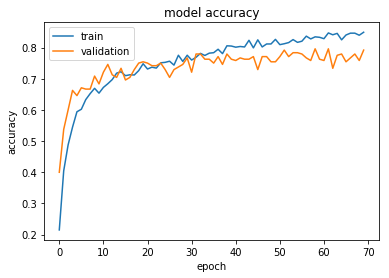

In [96]:
import matplotlib.pyplot as plt
plt.plot(history2.history['acc'])
plt.plot(history2.history['val_acc'])
plt.title('model accuracy')
plt.xlabel('epoch')
plt.ylabel('accuracy')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

In [110]:
final_model.load_weights('saved_models/weights_model_final.hdf5')
final_predictions=[np.argmax(final_model.predict(np.expand_dims(tensor, axis=0))) for 
                   tensor in VGG_features_test]
test_accuracy_final=100*np.sum(np.array(final_predictions)== \
                    np.argmax(style_test_targets, axis=1))/len(VGG_features_test)
print('Test accuracy final: %.2f% %'%test_accuracy_final)

Test accuracy final: 78.00%


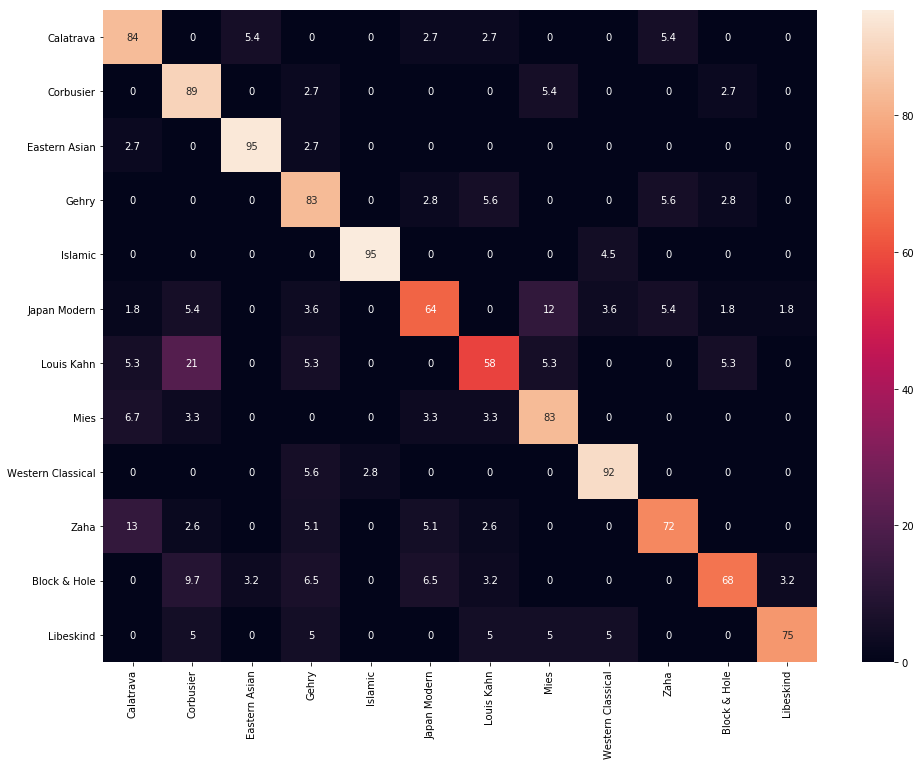

In [85]:
final_cm = confusion_matrix(np.argmax(style_test_targets, axis=1), final_predictions)
import seaborn as sn
import pandas as pd
import matplotlib.pyplot as plt
array =final_cm
# Normalize the array
array=[[100*i/sum(row) for i in row] for row in array]
df_cm = pd.DataFrame(array, index = [i[13:-1] for i in style_names],
                  columns = [i[13:-1] for i in style_names])
plt.figure(figsize = (16,12))
sn.heatmap(df_cm, annot=True)

### Final result

* The model trained using GridSearch and the pre-trained VGG19 model as a fixed feature extractor has a test accuracy rate of `79.00%`, which is quite good considering the styles can be ambiguous.
* From the confusion matrix, we can see that the classes that are often mixed are relatively similar, like Kahn and Corbusier.

### Write a style detector

In [87]:
def vgg_predict_style(img_path):
    from keras import applications
    model=applications.VGG19(weights = "imagenet", 
                         include_top=False)
    tensor=path_to_tensor(img_path)
    bottle_feature=model.predict(tensor)
    prediction=np.argmax(final_model.predict(bottle_feature))
    return style_names[prediction][13:-1]

## Step 6: Write an algorithm to analyze a picture of a building

In [112]:
def pic_analyze(img_path):
    scene=view_detector(img_path)
    rec_object(img_path)
    print('Scene: ', scene)
    print('Style: ', vgg_predict_style(img_path))      

## Step 7: Test the algorithm

In [121]:
test_files=np.array(glob('test_images/*'))

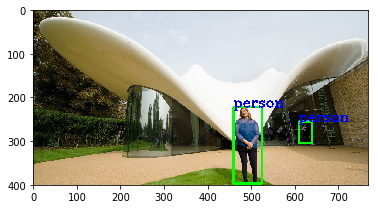

Scene:  roadview
Style:  Zaha


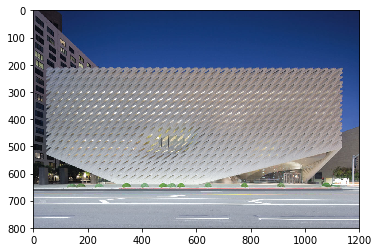

Scene:  roadview
Style:  Calatrava


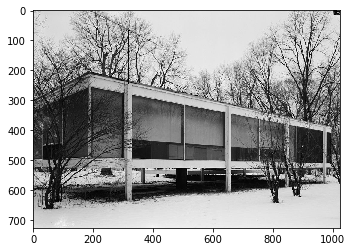

Scene:  roadview
Style:  Mies


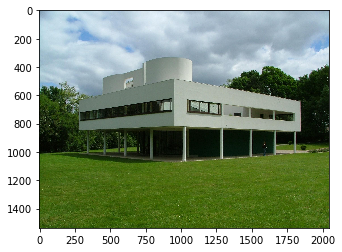

Scene:  roadview
Style:  Mies


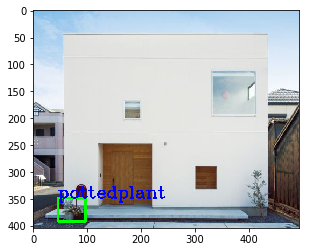

Scene:  roadview
Style:  Block & Hole


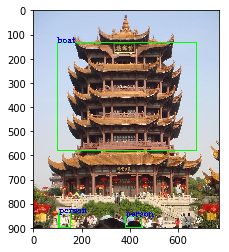

Scene:  roadview
Style:  Eastern Asian


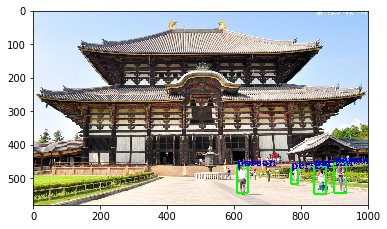

Scene:  roadview
Style:  Eastern Asian


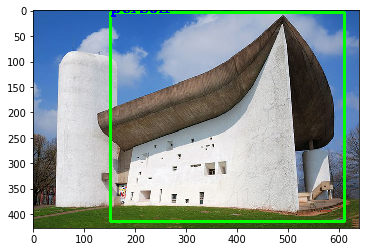

Scene:  roadview
Style:  Western Classical


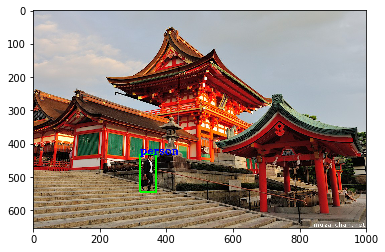

Scene:  roadview
Style:  Eastern Asian


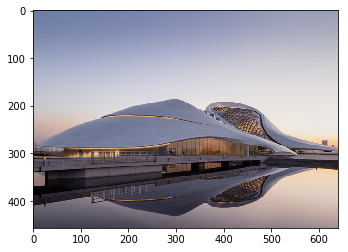

Scene:  roadview
Style:  Zaha


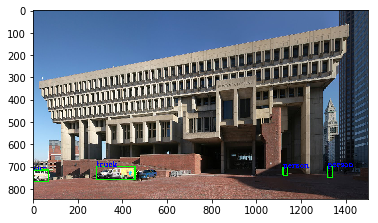

Scene:  roadview
Style:  Corbusier


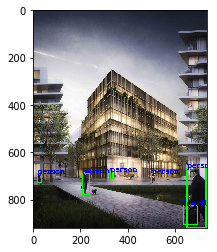

Scene:  roadview
Style:  Japan Modern


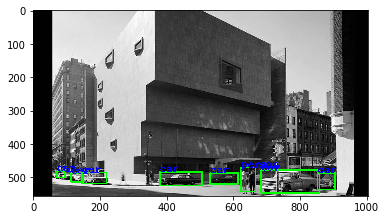

Scene:  roadview
Style:  Corbusier


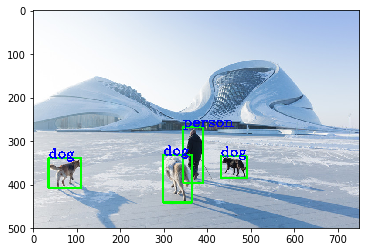

Scene:  roadview
Style:  Zaha


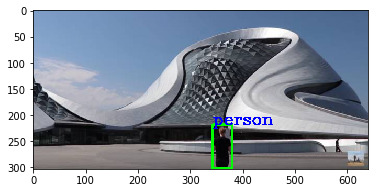

Scene:  roadview
Style:  Zaha


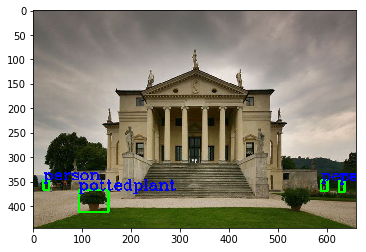

Scene:  roadview
Style:  Western Classical


In [122]:
for path in test_files:
    pic_analyze(path)

* The algorithm can recognize traditional styles pretty well.
* The algorithm tends to recognize buildings as fancy styles like Zaha and Gehry, and has difficulty recognizing subtle styles like Japan Modern, Mies and Corbusier, which can be similar sometimes.
* Some parts of some buildings are mistakenly recognized as objects.